# version

In [1]:
i = 4

# Import python dataset

In [2]:
# Common imports
import numpy as np
import os
from backend import import_excel, export_excel

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style
# style.use('bmh')
from mpl_toolkits.mplot3d import Axes3D
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pandas as pd
import seaborn as sns

import tensorflow as tf
import keras
import random

import sys
sys.path.append("..")
from sklearn.preprocessing import *
from sklearn.preprocessing import MinMaxScaler
import dataset, network_2D, WGAN_Model_2D

# Load data

In [3]:
# Preprocessing
vars = np.zeros((6,864))
j = 0
for i in range(6):
    for i2 in range(4):
        for i3 in range(3):
            for i4 in range(2):
                for i5 in range(3):
                    for i6 in range(2):
                        vars[0,j]=i+2
                        vars[1,j]=i2
                        vars[2,j]=i3
                        vars[3,j]=i4
                        vars[4,j]=i5
                        vars[5,j]=i6
                        j = j +1
j=0
print(vars[:,j])

scenario= "eye" #sinus, helix
n_instance = 1000
n_features = 2
n_var =int(vars[0,j])
latent_space =12 #12
batchs = [10,100,1000]
BATCH_SIZE = 100 #100, 32
scales = ['-1-1','0-1']
scaled = '-1-1'
epochs = 100000 #4000
bias = [True,False]
use_bias = False

[2. 0. 0. 0. 0. 0.]


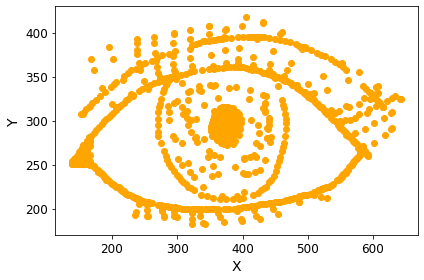

In [4]:
if scenario in ("3d", "helix"):
    X_train, y_train, X_test, y_test, X_valid, y_valid = dataset.get_dataset(n_instance, scenario)
    print("X_train= x,y",X_train.shape)
    print("y_train= z",y_train.shape)

    ax = plt.subplot(projection='3d')
    plt.xlim([-1.5,1.5])
    plt.ylim([-1.5,1.5])
    ax.scatter(X_train[:,0], X_train[:,1], y_train, c='orange')
    ax.set_zlabel('Z')
    ax.set_ylabel('Y')
    ax.set_xlabel('X')
    plt.tight_layout()

    
else:
    X_train, y_train, X_test, y_test, X_valid, y_valid = dataset.get_dataset(n_instance, scenario)
    plt.scatter(X_train,y_train, c='orange', label='Sample Data')
    plt.ylabel('Y')
    plt.xlabel('X')
    plt.tight_layout()

In [5]:
os.system('mkdir Dataset')
os.system('mkdir GANS')
os.system('mkdir GANS/Models')
os.system('mkdir GANS/Losses')
os.system('mkdir GANS/Random_test')
export_excel(X_train, 'Dataset/X_train')
export_excel(y_train, 'Dataset/y_train')

# print(X_train.shape,y_train.shape)
X_train = import_excel('Dataset/X_train')
y_train = import_excel('Dataset/y_train')

print('made dataset')
    
    

made dataset


# WGAN

### Architecture

In [6]:
generator=network_2D.build_generator(latent_space, n_var, n_features,use_bias)
generator.summary()

discriminator=network_2D.build_critic(n_var, use_bias, n_features)
discriminator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 30)                360       
_________________________________________________________________
batch_normalization (BatchNo (None, 30)                120       
_________________________________________________________________
dense_1 (Dense)              (None, 10)                300       
_________________________________________________________________
batch_normalization_1 (Batch (None, 10)                40        
_________________________________________________________________
dense_2 (Dense)              (None, 10)                100       
_________________________________________________________________
batch_normalization_2 (Batch (None, 10)                40        
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 2

In [7]:
wgan = WGAN_Model_2D.WGAN(i,n_features,latent_space,BATCH_SIZE,n_var,use_bias)
wgan.wgan.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 2)                 980       
_________________________________________________________________
sequential_3 (Sequential)    (None, 1)                 2461      
Total params: 3,441
Trainable params: 3,341
Non-trainable params: 100
_________________________________________________________________


### Preprocessing

In [8]:
train_dataset, scaler, X_train_scaled = wgan.preproc(X_train, y_train, scaled)

print("X_train",X_train.shape)
print("y_train",y_train.shape)
print("X_train_scaled",X_train_scaled.shape)

data shape_1 (100, 2)
data shape_2 (100, 2)
data shape_3 (100, 2)
data shape_4 (100, 2)
data shape_5 (100, 2)
data shape_6 (100, 2)
data shape_7 (100, 2)
data shape_8 (100, 2)
data shape_9 (100, 2)
data shape_10 (51, 2)
Cycles:  10
X_train (951, 1)
y_train (951, 1)
X_train_scaled (951, 2)


In [9]:
for data in train_dataset:
    print('train_dataset',data.shape)


train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (100, 2)
train_dataset (51, 2)


## Training

Epoch 1/100000
critic: 10.630298 - generator: -0.060381 - 2s
Epoch 2/100000
critic: 2.276947 - generator: -0.010923 - 0s
Epoch 3/100000
critic: 0.496623 - generator: -0.002026 - 0s
Epoch 4/100000
critic: 0.120706 - generator: 0.000466 - 0s
Epoch 5/100000
critic: 0.125849 - generator: 0.005594 - 0s
Epoch 6/100000
critic: 0.096684 - generator: 0.010350 - 0s
Epoch 7/100000
critic: 0.100366 - generator: 0.017749 - 0s
Epoch 8/100000
critic: 0.114329 - generator: 0.019663 - 0s
Epoch 9/100000
critic: 0.122501 - generator: 0.015453 - 0s
Epoch 10/100000
critic: 0.126439 - generator: 0.019936 - 0s
Epoch 11/100000
critic: 0.088728 - generator: 0.019954 - 0s
Epoch 12/100000
critic: 0.088760 - generator: 0.020724 - 0s
Epoch 13/100000
critic: 0.100914 - generator: 0.024375 - 0s
Epoch 14/100000
critic: 0.099102 - generator: 0.022806 - 0s
Epoch 15/100000
critic: 0.102608 - generator: 0.027181 - 0s
Epoch 16/100000
critic: 0.126440 - generator: 0.022089 - 0s
Epoch 17/100000
critic: 0.106304 - generator:

critic: 0.075390 - generator: -0.001137 - 0s
Epoch 138/100000
critic: 0.102261 - generator: 0.000018 - 0s
Epoch 139/100000
critic: 0.102217 - generator: 0.003559 - 0s
Epoch 140/100000
critic: 0.092902 - generator: 0.005271 - 0s
Epoch 141/100000
critic: 0.110767 - generator: 0.004246 - 0s
Epoch 142/100000
critic: 0.089412 - generator: 0.003312 - 0s
Epoch 143/100000
critic: 0.106177 - generator: 0.005223 - 0s
Epoch 144/100000
critic: 0.080609 - generator: 0.001115 - 0s
Epoch 145/100000
critic: 0.105235 - generator: -0.000252 - 0s
Epoch 146/100000
critic: 0.100507 - generator: -0.004322 - 0s
Epoch 147/100000
critic: 0.129279 - generator: -0.004157 - 0s
Epoch 148/100000
critic: 0.106459 - generator: -0.003509 - 0s
Epoch 149/100000
critic: 0.106349 - generator: -0.002975 - 0s
Epoch 150/100000
critic: 0.096912 - generator: -0.001051 - 0s
Epoch 151/100000
critic: 0.120659 - generator: -0.001604 - 0s
Epoch 152/100000
critic: 0.097593 - generator: -0.004765 - 0s
Epoch 153/100000
critic: 0.10320

critic: 0.079437 - generator: 0.006049 - 0s
Epoch 272/100000
critic: 0.098620 - generator: 0.003209 - 0s
Epoch 273/100000
critic: 0.098764 - generator: 0.003370 - 0s
Epoch 274/100000
critic: 0.073248 - generator: 0.004662 - 0s
Epoch 275/100000
critic: 0.080783 - generator: 0.008488 - 0s
Epoch 276/100000
critic: 0.106493 - generator: 0.011173 - 0s
Epoch 277/100000
critic: 0.097911 - generator: 0.007618 - 0s
Epoch 278/100000
critic: 0.120672 - generator: 0.008511 - 0s
Epoch 279/100000
critic: 0.091512 - generator: 0.004597 - 0s
Epoch 280/100000
critic: 0.110300 - generator: 0.005665 - 0s
Epoch 281/100000
critic: 0.100890 - generator: 0.006809 - 0s
Epoch 282/100000
critic: 0.089581 - generator: 0.003170 - 0s
Epoch 283/100000
critic: 0.094077 - generator: 0.007391 - 0s
Epoch 284/100000
critic: 0.083298 - generator: 0.005245 - 0s
Epoch 285/100000
critic: 0.119369 - generator: 0.003967 - 0s
Epoch 286/100000
critic: 0.097115 - generator: 0.003722 - 0s
Epoch 287/100000
critic: 0.100631 - gener

critic: 0.127733 - generator: 0.003198 - 0s
Epoch 406/100000
critic: 0.094403 - generator: 0.000078 - 0s
Epoch 407/100000
critic: 0.091063 - generator: 0.000715 - 0s
Epoch 408/100000
critic: 0.108298 - generator: 0.000808 - 0s
Epoch 409/100000
critic: 0.101036 - generator: 0.004064 - 0s
Epoch 410/100000
critic: 0.113717 - generator: 0.003392 - 0s
Epoch 411/100000
critic: 0.085325 - generator: 0.002573 - 0s
Epoch 412/100000
critic: 0.104752 - generator: 0.004789 - 0s
Epoch 413/100000
critic: 0.099759 - generator: 0.003048 - 0s
Epoch 414/100000
critic: 0.085233 - generator: 0.003670 - 0s
Epoch 415/100000
critic: 0.104670 - generator: 0.005915 - 0s
Epoch 416/100000
critic: 0.104613 - generator: 0.000813 - 0s
Epoch 417/100000
critic: 0.084414 - generator: 0.004092 - 0s
Epoch 418/100000
critic: 0.070759 - generator: 0.007086 - 0s
Epoch 419/100000
critic: 0.092907 - generator: 0.006567 - 0s
Epoch 420/100000
critic: 0.105065 - generator: 0.004090 - 0s
Epoch 421/100000
critic: 0.076840 - gener

critic: 0.070826 - generator: -0.006861 - 0s
Epoch 540/100000
critic: 0.108990 - generator: -0.005442 - 0s
Epoch 541/100000
critic: 0.098554 - generator: -0.003288 - 0s
Epoch 542/100000
critic: 0.112747 - generator: -0.004814 - 0s
Epoch 543/100000
critic: 0.088161 - generator: -0.004622 - 0s
Epoch 544/100000
critic: 0.107523 - generator: -0.004101 - 0s
Epoch 545/100000
critic: 0.084939 - generator: -0.004268 - 0s
Epoch 546/100000
critic: 0.115358 - generator: -0.001371 - 0s
Epoch 547/100000
critic: 0.079351 - generator: -0.000191 - 0s
Epoch 548/100000
critic: 0.066321 - generator: 0.001845 - 0s
Epoch 549/100000
critic: 0.099950 - generator: -0.000626 - 0s
Epoch 550/100000
critic: 0.110837 - generator: -0.005278 - 0s
Epoch 551/100000
critic: 0.090623 - generator: -0.002145 - 0s
Epoch 552/100000
critic: 0.069970 - generator: -0.001570 - 0s
Epoch 553/100000
critic: 0.104877 - generator: -0.001295 - 0s
Epoch 554/100000
critic: 0.103226 - generator: 0.001157 - 0s
Epoch 555/100000
critic: 0.

critic: 0.084301 - generator: -0.005970 - 0s
Epoch 674/100000
critic: 0.106723 - generator: -0.007275 - 0s
Epoch 675/100000
critic: 0.079059 - generator: -0.006824 - 0s
Epoch 676/100000
critic: 0.077082 - generator: -0.006992 - 0s
Epoch 677/100000
critic: 0.092521 - generator: -0.006190 - 0s
Epoch 678/100000
critic: 0.082907 - generator: -0.008481 - 0s
Epoch 679/100000
critic: 0.098398 - generator: -0.006662 - 0s
Epoch 680/100000
critic: 0.110264 - generator: -0.005516 - 0s
Epoch 681/100000
critic: 0.091491 - generator: -0.004769 - 0s
Epoch 682/100000
critic: 0.084118 - generator: -0.005526 - 0s
Epoch 683/100000
critic: 0.074574 - generator: -0.006479 - 0s
Epoch 684/100000
critic: 0.113641 - generator: -0.006188 - 0s
Epoch 685/100000
critic: 0.086587 - generator: -0.007567 - 0s
Epoch 686/100000
critic: 0.083951 - generator: -0.001710 - 0s
Epoch 687/100000
critic: 0.105633 - generator: -0.002913 - 0s
Epoch 688/100000
critic: 0.105620 - generator: -0.002280 - 0s
Epoch 689/100000
critic: 

critic: 0.105808 - generator: 0.001614 - 0s
Epoch 807/100000
critic: 0.109037 - generator: -0.000623 - 0s
Epoch 808/100000
critic: 0.119674 - generator: -0.002050 - 0s
Epoch 809/100000
critic: 0.095386 - generator: -0.000808 - 0s
Epoch 810/100000
critic: 0.094826 - generator: -0.000410 - 0s
Epoch 811/100000
critic: 0.086576 - generator: -0.000047 - 0s
Epoch 812/100000
critic: 0.095932 - generator: -0.001305 - 0s
Epoch 813/100000
critic: 0.081692 - generator: 0.000660 - 0s
Epoch 814/100000
critic: 0.077664 - generator: -0.000142 - 0s
Epoch 815/100000
critic: 0.091400 - generator: 0.000767 - 0s
Epoch 816/100000
critic: 0.097091 - generator: -0.000218 - 0s
Epoch 817/100000
critic: 0.092259 - generator: -0.000989 - 0s
Epoch 818/100000
critic: 0.096122 - generator: -0.003877 - 0s
Epoch 819/100000
critic: 0.112478 - generator: -0.002605 - 0s
Epoch 820/100000
critic: 0.098875 - generator: -0.000623 - 0s
Epoch 821/100000
critic: 0.116534 - generator: 0.001315 - 0s
Epoch 822/100000
critic: 0.08

critic: 0.075469 - generator: -0.001497 - 0s
Epoch 941/100000
critic: 0.089291 - generator: 0.001085 - 0s
Epoch 942/100000
critic: 0.105309 - generator: 0.001976 - 0s
Epoch 943/100000
critic: 0.081074 - generator: 0.003970 - 0s
Epoch 944/100000
critic: 0.113157 - generator: 0.004947 - 0s
Epoch 945/100000
critic: 0.102013 - generator: 0.001483 - 0s
Epoch 946/100000
critic: 0.109414 - generator: -0.002748 - 0s
Epoch 947/100000
critic: 0.094583 - generator: -0.002614 - 0s
Epoch 948/100000
critic: 0.114594 - generator: -0.006490 - 0s
Epoch 949/100000
critic: 0.107429 - generator: -0.006220 - 0s
Epoch 950/100000
critic: 0.100511 - generator: -0.007220 - 0s
Epoch 951/100000
critic: 0.095594 - generator: -0.007379 - 0s
Epoch 952/100000
critic: 0.090448 - generator: -0.005367 - 0s
Epoch 953/100000
critic: 0.079917 - generator: -0.009503 - 0s
Epoch 954/100000
critic: 0.104335 - generator: -0.008020 - 0s
Epoch 955/100000
critic: 0.087703 - generator: -0.004035 - 0s
Epoch 956/100000
critic: 0.103

critic: 0.092302 - generator: -0.004340 - 0s
Epoch 1073/100000
critic: 0.099371 - generator: -0.002431 - 0s
Epoch 1074/100000
critic: 0.099594 - generator: -0.004182 - 0s
Epoch 1075/100000
critic: 0.106516 - generator: -0.004507 - 0s
Epoch 1076/100000
critic: 0.102926 - generator: -0.003607 - 0s
Epoch 1077/100000
critic: 0.109273 - generator: -0.002485 - 0s
Epoch 1078/100000
critic: 0.097650 - generator: -0.004881 - 0s
Epoch 1079/100000
critic: 0.089436 - generator: -0.003019 - 0s
Epoch 1080/100000
critic: 0.114960 - generator: -0.003438 - 0s
Epoch 1081/100000
critic: 0.103142 - generator: -0.002880 - 0s
Epoch 1082/100000
critic: 0.103308 - generator: -0.008885 - 0s
Epoch 1083/100000
critic: 0.091558 - generator: -0.006718 - 0s
Epoch 1084/100000
critic: 0.109127 - generator: -0.003499 - 0s
Epoch 1085/100000
critic: 0.096899 - generator: -0.000474 - 0s
Epoch 1086/100000
critic: 0.104927 - generator: -0.000785 - 0s
Epoch 1087/100000
critic: 0.111969 - generator: -0.001377 - 0s
Epoch 1088

critic: 0.094335 - generator: -0.001697 - 0s
Epoch 1205/100000
critic: 0.090270 - generator: -0.004304 - 0s
Epoch 1206/100000
critic: 0.092910 - generator: 0.001806 - 0s
Epoch 1207/100000
critic: 0.075493 - generator: 0.001804 - 0s
Epoch 1208/100000
critic: 0.097755 - generator: 0.004725 - 0s
Epoch 1209/100000
critic: 0.094323 - generator: 0.003672 - 0s
Epoch 1210/100000
critic: 0.082811 - generator: 0.006860 - 0s
Epoch 1211/100000
critic: 0.110080 - generator: 0.005894 - 0s
Epoch 1212/100000
critic: 0.085140 - generator: 0.004752 - 0s
Epoch 1213/100000
critic: 0.121065 - generator: 0.006661 - 0s
Epoch 1214/100000
critic: 0.096994 - generator: 0.006337 - 0s
Epoch 1215/100000
critic: 0.081004 - generator: 0.006959 - 0s
Epoch 1216/100000
critic: 0.094072 - generator: 0.002358 - 0s
Epoch 1217/100000
critic: 0.077137 - generator: 0.004784 - 0s
Epoch 1218/100000
critic: 0.129869 - generator: 0.003585 - 0s
Epoch 1219/100000
critic: 0.110806 - generator: -0.001551 - 0s
Epoch 1220/100000
criti

critic: 0.099903 - generator: 0.003867 - 0s
Epoch 1337/100000
critic: 0.090253 - generator: 0.003579 - 0s
Epoch 1338/100000
critic: 0.078761 - generator: -0.001153 - 0s
Epoch 1339/100000
critic: 0.086899 - generator: 0.006936 - 0s
Epoch 1340/100000
critic: 0.078901 - generator: 0.004337 - 0s
Epoch 1341/100000
critic: 0.079532 - generator: 0.006663 - 0s
Epoch 1342/100000
critic: 0.096632 - generator: 0.007263 - 0s
Epoch 1343/100000
critic: 0.074050 - generator: 0.005402 - 0s
Epoch 1344/100000
critic: 0.108649 - generator: 0.004860 - 0s
Epoch 1345/100000
critic: 0.117438 - generator: 0.008100 - 0s
Epoch 1346/100000
critic: 0.098947 - generator: 0.006004 - 0s
Epoch 1347/100000
critic: 0.109625 - generator: 0.006726 - 0s
Epoch 1348/100000
critic: 0.113557 - generator: 0.004188 - 0s
Epoch 1349/100000
critic: 0.123837 - generator: 0.002399 - 0s
Epoch 1350/100000
critic: 0.080185 - generator: 0.002028 - 0s
Epoch 1351/100000
critic: 0.107364 - generator: 0.002680 - 0s
Epoch 1352/100000
critic:

critic: 0.088302 - generator: -0.003751 - 0s
Epoch 1470/100000
critic: 0.111318 - generator: -0.006669 - 0s
Epoch 1471/100000
critic: 0.105482 - generator: -0.001232 - 0s
Epoch 1472/100000
critic: 0.098521 - generator: 0.001838 - 0s
Epoch 1473/100000
critic: 0.078635 - generator: 0.001855 - 0s
Epoch 1474/100000
critic: 0.093110 - generator: 0.005412 - 0s
Epoch 1475/100000
critic: 0.123510 - generator: 0.005912 - 0s
Epoch 1476/100000
critic: 0.097393 - generator: 0.003592 - 0s
Epoch 1477/100000
critic: 0.073390 - generator: 0.006465 - 0s
Epoch 1478/100000
critic: 0.097037 - generator: 0.005589 - 0s
Epoch 1479/100000
critic: 0.099462 - generator: 0.006504 - 0s
Epoch 1480/100000
critic: 0.072813 - generator: 0.006753 - 0s
Epoch 1481/100000
critic: 0.116020 - generator: 0.006969 - 0s
Epoch 1482/100000
critic: 0.092280 - generator: 0.006608 - 0s
Epoch 1483/100000
critic: 0.105833 - generator: 0.006373 - 0s
Epoch 1484/100000
critic: 0.089618 - generator: 0.004499 - 0s
Epoch 1485/100000
criti

critic: 0.093092 - generator: -0.002659 - 0s
Epoch 1602/100000
critic: 0.095633 - generator: -0.002817 - 0s
Epoch 1603/100000
critic: 0.095718 - generator: -0.000601 - 0s
Epoch 1604/100000
critic: 0.069002 - generator: 0.000959 - 0s
Epoch 1605/100000
critic: 0.108918 - generator: 0.007424 - 0s
Epoch 1606/100000
critic: 0.101262 - generator: 0.002212 - 0s
Epoch 1607/100000
critic: 0.095380 - generator: 0.002511 - 0s
Epoch 1608/100000
critic: 0.104738 - generator: 0.003727 - 0s
Epoch 1609/100000
critic: 0.104740 - generator: 0.006068 - 0s
Epoch 1610/100000
critic: 0.102461 - generator: 0.000101 - 0s
Epoch 1611/100000
critic: 0.091766 - generator: -0.000292 - 0s
Epoch 1612/100000
critic: 0.094760 - generator: -0.000176 - 0s
Epoch 1613/100000
critic: 0.094795 - generator: -0.002006 - 0s
Epoch 1614/100000
critic: 0.103983 - generator: -0.001436 - 0s
Epoch 1615/100000
critic: 0.108543 - generator: 0.000388 - 0s
Epoch 1616/100000
critic: 0.092364 - generator: 0.002448 - 0s
Epoch 1617/100000
c

critic: 0.095918 - generator: 0.000292 - 0s
Epoch 1734/100000
critic: 0.106298 - generator: -0.002239 - 0s
Epoch 1735/100000
critic: 0.092968 - generator: -0.000993 - 0s
Epoch 1736/100000
critic: 0.101368 - generator: -0.001832 - 0s
Epoch 1737/100000
critic: 0.091133 - generator: 0.000636 - 0s
Epoch 1738/100000
critic: 0.077459 - generator: 0.000483 - 0s
Epoch 1739/100000
critic: 0.099873 - generator: 0.004204 - 0s
Epoch 1740/100000
critic: 0.117442 - generator: -0.003308 - 0s
Epoch 1741/100000
critic: 0.092243 - generator: -0.000538 - 0s
Epoch 1742/100000
critic: 0.101130 - generator: 0.001390 - 0s
Epoch 1743/100000
critic: 0.087540 - generator: 0.002577 - 0s
Epoch 1744/100000
critic: 0.086351 - generator: 0.003954 - 0s
Epoch 1745/100000
critic: 0.085355 - generator: 0.004180 - 0s
Epoch 1746/100000
critic: 0.085631 - generator: 0.003166 - 0s
Epoch 1747/100000
critic: 0.105789 - generator: 0.000337 - 0s
Epoch 1748/100000
critic: 0.099835 - generator: 0.002737 - 0s
Epoch 1749/100000
cri

critic: 0.105357 - generator: -0.005617 - 0s
Epoch 1866/100000
critic: 0.097868 - generator: -0.001788 - 0s
Epoch 1867/100000
critic: 0.097830 - generator: -0.003131 - 0s
Epoch 1868/100000
critic: 0.082139 - generator: -0.003043 - 0s
Epoch 1869/100000
critic: 0.075428 - generator: -0.003244 - 0s
Epoch 1870/100000
critic: 0.100053 - generator: -0.003190 - 0s
Epoch 1871/100000
critic: 0.094679 - generator: -0.000877 - 0s
Epoch 1872/100000
critic: 0.091071 - generator: -0.002243 - 0s
Epoch 1873/100000
critic: 0.073562 - generator: -0.003599 - 0s
Epoch 1874/100000
critic: 0.090952 - generator: -0.005457 - 0s
Epoch 1875/100000
critic: 0.081935 - generator: -0.004977 - 0s
Epoch 1876/100000
critic: 0.091491 - generator: 0.002347 - 0s
Epoch 1877/100000
critic: 0.071158 - generator: 0.001479 - 0s
Epoch 1878/100000
critic: 0.112924 - generator: 0.003730 - 0s
Epoch 1879/100000
critic: 0.082728 - generator: 0.001510 - 0s
Epoch 1880/100000
critic: 0.077094 - generator: 0.001275 - 0s
Epoch 1881/1000

critic: 0.096537 - generator: -0.000050 - 0s
Epoch 1998/100000
critic: 0.096405 - generator: 0.004590 - 0s
Epoch 1999/100000
critic: 0.065925 - generator: 0.004285 - 0s
Epoch 2000/100000
critic: 0.097284 - generator: 0.001284 - 0s
Epoch 2001/100000
critic: 0.090826 - generator: -0.000096 - 0s
Epoch 2002/100000
critic: 0.105676 - generator: -0.001208 - 0s
Epoch 2003/100000
critic: 0.069079 - generator: -0.003943 - 0s
Epoch 2004/100000
critic: 0.095346 - generator: -0.004049 - 0s
Epoch 2005/100000
critic: 0.093857 - generator: -0.000909 - 0s
Epoch 2006/100000
critic: 0.084876 - generator: -0.007326 - 0s
Epoch 2007/100000
critic: 0.096946 - generator: -0.004426 - 0s
Epoch 2008/100000
critic: 0.116804 - generator: -0.002068 - 0s
Epoch 2009/100000
critic: 0.088186 - generator: -0.002125 - 0s
Epoch 2010/100000
critic: 0.083233 - generator: -0.002477 - 0s
Epoch 2011/100000
critic: 0.090920 - generator: 0.001575 - 0s
Epoch 2012/100000
critic: 0.097428 - generator: -0.002000 - 0s
Epoch 2013/100

critic: 0.093678 - generator: 0.003044 - 0s
Epoch 2130/100000
critic: 0.091181 - generator: 0.005508 - 0s
Epoch 2131/100000
critic: 0.077345 - generator: 0.004070 - 0s
Epoch 2132/100000
critic: 0.076714 - generator: 0.004443 - 0s
Epoch 2133/100000
critic: 0.102541 - generator: 0.002134 - 0s
Epoch 2134/100000
critic: 0.092796 - generator: 0.003020 - 0s
Epoch 2135/100000
critic: 0.101492 - generator: 0.004835 - 0s
Epoch 2136/100000
critic: 0.091265 - generator: 0.002734 - 0s
Epoch 2137/100000
critic: 0.090229 - generator: 0.001488 - 0s
Epoch 2138/100000
critic: 0.098813 - generator: -0.000184 - 0s
Epoch 2139/100000
critic: 0.081086 - generator: 0.001189 - 0s
Epoch 2140/100000
critic: 0.105736 - generator: -0.003547 - 0s
Epoch 2141/100000
critic: 0.084337 - generator: -0.000516 - 0s
Epoch 2142/100000
critic: 0.096257 - generator: -0.000825 - 0s
Epoch 2143/100000
critic: 0.091463 - generator: 0.000969 - 0s
Epoch 2144/100000
critic: 0.084677 - generator: 0.004035 - 0s
Epoch 2145/100000
crit

critic: 0.072449 - generator: -0.002574 - 0s
Epoch 2262/100000
critic: 0.088147 - generator: 0.000075 - 0s
Epoch 2263/100000
critic: 0.083411 - generator: -0.001383 - 0s
Epoch 2264/100000
critic: 0.089663 - generator: -0.001772 - 0s
Epoch 2265/100000
critic: 0.111501 - generator: -0.004965 - 0s
Epoch 2266/100000
critic: 0.101015 - generator: -0.001293 - 0s
Epoch 2267/100000
critic: 0.113568 - generator: -0.000566 - 0s
Epoch 2268/100000
critic: 0.086572 - generator: -0.007385 - 0s
Epoch 2269/100000
critic: 0.097524 - generator: -0.002273 - 0s
Epoch 2270/100000
critic: 0.085525 - generator: -0.000745 - 0s
Epoch 2271/100000
critic: 0.093824 - generator: -0.002127 - 0s
Epoch 2272/100000
critic: 0.078661 - generator: -0.003165 - 0s
Epoch 2273/100000
critic: 0.095975 - generator: -0.002183 - 0s
Epoch 2274/100000
critic: 0.088684 - generator: -0.002010 - 0s
Epoch 2275/100000
critic: 0.082414 - generator: -0.002643 - 0s
Epoch 2276/100000
critic: 0.091745 - generator: -0.001916 - 0s
Epoch 2277/

critic: 0.080753 - generator: -0.006792 - 0s
Epoch 2394/100000
critic: 0.098111 - generator: -0.000587 - 0s
Epoch 2395/100000
critic: 0.088715 - generator: 0.001430 - 0s
Epoch 2396/100000
critic: 0.089436 - generator: -0.001854 - 0s
Epoch 2397/100000
critic: 0.110038 - generator: 0.000799 - 0s
Epoch 2398/100000
critic: 0.090026 - generator: 0.000886 - 0s
Epoch 2399/100000
critic: 0.100227 - generator: 0.000287 - 0s
Epoch 2400/100000
critic: 0.074116 - generator: -0.002381 - 0s
Epoch 2401/100000
critic: 0.088528 - generator: -0.004111 - 0s
Epoch 2402/100000
critic: 0.081573 - generator: -0.000943 - 0s
Epoch 2403/100000
critic: 0.070799 - generator: -0.003477 - 0s
Epoch 2404/100000
critic: 0.076983 - generator: -0.002777 - 0s
Epoch 2405/100000
critic: 0.086690 - generator: -0.000136 - 0s
Epoch 2406/100000
critic: 0.103170 - generator: 0.000416 - 0s
Epoch 2407/100000
critic: 0.106663 - generator: 0.001906 - 0s
Epoch 2408/100000
critic: 0.090116 - generator: 0.003082 - 0s
Epoch 2409/100000

critic: 0.111705 - generator: 0.005591 - 0s
Epoch 2526/100000
critic: 0.080944 - generator: 0.003916 - 0s
Epoch 2527/100000
critic: 0.091012 - generator: 0.002593 - 0s
Epoch 2528/100000
critic: 0.079710 - generator: 0.004353 - 0s
Epoch 2529/100000
critic: 0.069611 - generator: 0.002009 - 0s
Epoch 2530/100000
critic: 0.095026 - generator: 0.003222 - 0s
Epoch 2531/100000
critic: 0.107297 - generator: 0.005567 - 0s
Epoch 2532/100000
critic: 0.081242 - generator: 0.001729 - 0s
Epoch 2533/100000
critic: 0.089504 - generator: -0.000040 - 0s
Epoch 2534/100000
critic: 0.079726 - generator: -0.000399 - 0s
Epoch 2535/100000
critic: 0.103315 - generator: 0.002461 - 0s
Epoch 2536/100000
critic: 0.086776 - generator: 0.001634 - 0s
Epoch 2537/100000
critic: 0.082072 - generator: -0.001857 - 0s
Epoch 2538/100000
critic: 0.080212 - generator: -0.002755 - 0s
Epoch 2539/100000
critic: 0.094060 - generator: -0.000474 - 0s
Epoch 2540/100000
critic: 0.097728 - generator: -0.001446 - 0s
Epoch 2541/100000
cr

critic: 0.085603 - generator: -0.000052 - 0s
Epoch 2658/100000
critic: 0.082974 - generator: 0.000351 - 0s
Epoch 2659/100000
critic: 0.079989 - generator: -0.003794 - 0s
Epoch 2660/100000
critic: 0.080979 - generator: -0.004225 - 0s
Epoch 2661/100000
critic: 0.067547 - generator: -0.002333 - 0s
Epoch 2662/100000
critic: 0.092863 - generator: 0.000191 - 0s
Epoch 2663/100000
critic: 0.081830 - generator: -0.002400 - 0s
Epoch 2664/100000
critic: 0.093869 - generator: -0.000410 - 0s
Epoch 2665/100000
critic: 0.091274 - generator: 0.000852 - 0s
Epoch 2666/100000
critic: 0.088897 - generator: -0.001518 - 0s
Epoch 2667/100000
critic: 0.108854 - generator: 0.004920 - 0s
Epoch 2668/100000
critic: 0.085433 - generator: 0.000800 - 0s
Epoch 2669/100000
critic: 0.097244 - generator: 0.003031 - 0s
Epoch 2670/100000
critic: 0.082226 - generator: 0.000549 - 0s
Epoch 2671/100000
critic: 0.090057 - generator: 0.001364 - 0s
Epoch 2672/100000
critic: 0.082668 - generator: 0.000401 - 0s
Epoch 2673/100000
c

critic: 0.091296 - generator: 0.001878 - 0s
Epoch 2790/100000
critic: 0.080630 - generator: -0.003904 - 0s
Epoch 2791/100000
critic: 0.083880 - generator: 0.000674 - 0s
Epoch 2792/100000
critic: 0.093109 - generator: -0.000505 - 0s
Epoch 2793/100000
critic: 0.090724 - generator: -0.000651 - 0s
Epoch 2794/100000
critic: 0.092558 - generator: -0.002863 - 0s
Epoch 2795/100000
critic: 0.104575 - generator: -0.001400 - 0s
Epoch 2796/100000
critic: 0.078994 - generator: -0.004138 - 0s
Epoch 2797/100000
critic: 0.088528 - generator: -0.002007 - 0s
Epoch 2798/100000
critic: 0.070110 - generator: -0.003390 - 0s
Epoch 2799/100000
critic: 0.082805 - generator: -0.004411 - 0s
Epoch 2800/100000
critic: 0.091424 - generator: -0.001316 - 0s
Epoch 2801/100000
critic: 0.073756 - generator: -0.001556 - 0s
Epoch 2802/100000
critic: 0.098221 - generator: -0.000515 - 0s
Epoch 2803/100000
critic: 0.085770 - generator: -0.003444 - 0s
Epoch 2804/100000
critic: 0.079659 - generator: -0.000340 - 0s
Epoch 2805/1

critic: 0.072697 - generator: 0.000523 - 0s
Epoch 2922/100000
critic: 0.101614 - generator: 0.001286 - 0s
Epoch 2923/100000
critic: 0.082834 - generator: -0.002597 - 0s
Epoch 2924/100000
critic: 0.082910 - generator: -0.003990 - 0s
Epoch 2925/100000
critic: 0.076254 - generator: -0.001730 - 0s
Epoch 2926/100000
critic: 0.097105 - generator: -0.001496 - 0s
Epoch 2927/100000
critic: 0.073836 - generator: -0.003312 - 0s
Epoch 2928/100000
critic: 0.097108 - generator: -0.001636 - 0s
Epoch 2929/100000
critic: 0.078369 - generator: -0.001817 - 0s
Epoch 2930/100000
critic: 0.086376 - generator: 0.000265 - 0s
Epoch 2931/100000
critic: 0.079353 - generator: -0.005828 - 0s
Epoch 2932/100000
critic: 0.074161 - generator: -0.000152 - 0s
Epoch 2933/100000
critic: 0.098204 - generator: -0.004739 - 0s
Epoch 2934/100000
critic: 0.087839 - generator: -0.002012 - 0s
Epoch 2935/100000
critic: 0.075677 - generator: -0.003786 - 0s
Epoch 2936/100000
critic: 0.097513 - generator: -0.002191 - 0s
Epoch 2937/10

critic: 0.094538 - generator: 0.000778 - 0s
Epoch 3054/100000
critic: 0.081635 - generator: 0.002569 - 0s
Epoch 3055/100000
critic: 0.085900 - generator: 0.000405 - 0s
Epoch 3056/100000
critic: 0.082129 - generator: 0.002478 - 0s
Epoch 3057/100000
critic: 0.094905 - generator: 0.001027 - 0s
Epoch 3058/100000
critic: 0.095335 - generator: -0.003292 - 0s
Epoch 3059/100000
critic: 0.080688 - generator: -0.002399 - 0s
Epoch 3060/100000
critic: 0.089008 - generator: 0.000391 - 0s
Epoch 3061/100000
critic: 0.076653 - generator: -0.001838 - 0s
Epoch 3062/100000
critic: 0.088744 - generator: -0.000441 - 0s
Epoch 3063/100000
critic: 0.099797 - generator: -0.002839 - 0s
Epoch 3064/100000
critic: 0.098206 - generator: 0.001037 - 0s
Epoch 3065/100000
critic: 0.095868 - generator: 0.000918 - 0s
Epoch 3066/100000
critic: 0.088459 - generator: 0.003339 - 0s
Epoch 3067/100000
critic: 0.082711 - generator: 0.004217 - 0s
Epoch 3068/100000
critic: 0.073716 - generator: 0.004386 - 0s
Epoch 3069/100000
cri

critic: 0.094663 - generator: 0.001756 - 0s
Epoch 3186/100000
critic: 0.083732 - generator: -0.001448 - 0s
Epoch 3187/100000
critic: 0.081069 - generator: -0.000219 - 0s
Epoch 3188/100000
critic: 0.099910 - generator: -0.005462 - 0s
Epoch 3189/100000
critic: 0.101419 - generator: -0.001912 - 0s
Epoch 3190/100000
critic: 0.083255 - generator: 0.001178 - 0s
Epoch 3191/100000
critic: 0.090915 - generator: -0.001769 - 0s
Epoch 3192/100000
critic: 0.078048 - generator: 0.000430 - 0s
Epoch 3193/100000
critic: 0.080831 - generator: -0.002545 - 0s
Epoch 3194/100000
critic: 0.086720 - generator: 0.000173 - 0s
Epoch 3195/100000
critic: 0.082909 - generator: -0.001957 - 0s
Epoch 3196/100000
critic: 0.100102 - generator: -0.003572 - 0s
Epoch 3197/100000
critic: 0.089711 - generator: 0.000858 - 0s
Epoch 3198/100000
critic: 0.080285 - generator: -0.000553 - 0s
Epoch 3199/100000
critic: 0.091692 - generator: -0.005038 - 0s
Epoch 3200/100000
critic: 0.084392 - generator: -0.000786 - 0s
Epoch 3201/1000

critic: 0.074785 - generator: 0.000794 - 0s
Epoch 3319/100000
critic: 0.089562 - generator: 0.001958 - 0s
Epoch 3320/100000
critic: 0.085076 - generator: 0.001169 - 0s
Epoch 3321/100000
critic: 0.075484 - generator: 0.003848 - 0s
Epoch 3322/100000
critic: 0.074400 - generator: 0.003499 - 0s
Epoch 3323/100000
critic: 0.081825 - generator: 0.004366 - 0s
Epoch 3324/100000
critic: 0.086840 - generator: -0.000087 - 0s
Epoch 3325/100000
critic: 0.084843 - generator: 0.001710 - 0s
Epoch 3326/100000
critic: 0.090423 - generator: -0.000070 - 0s
Epoch 3327/100000
critic: 0.089933 - generator: 0.001125 - 0s
Epoch 3328/100000
critic: 0.084333 - generator: -0.002659 - 0s
Epoch 3329/100000
critic: 0.081770 - generator: -0.000238 - 0s
Epoch 3330/100000
critic: 0.080692 - generator: -0.003507 - 0s
Epoch 3331/100000
critic: 0.101836 - generator: 0.000244 - 0s
Epoch 3332/100000
critic: 0.101348 - generator: 0.003198 - 0s
Epoch 3333/100000
critic: 0.081129 - generator: 0.004059 - 0s
Epoch 3334/100000
cri

critic: 0.082613 - generator: -0.004198 - 0s
Epoch 3451/100000
critic: 0.081147 - generator: -0.002616 - 0s
Epoch 3452/100000
critic: 0.076041 - generator: -0.001333 - 0s
Epoch 3453/100000
critic: 0.085544 - generator: -0.005512 - 0s
Epoch 3454/100000
critic: 0.101199 - generator: -0.004359 - 0s
Epoch 3455/100000
critic: 0.086928 - generator: -0.001364 - 0s
Epoch 3456/100000
critic: 0.084249 - generator: -0.001677 - 0s
Epoch 3457/100000
critic: 0.088617 - generator: -0.003930 - 0s
Epoch 3458/100000
critic: 0.063500 - generator: 0.000126 - 0s
Epoch 3459/100000
critic: 0.096383 - generator: -0.001473 - 0s
Epoch 3460/100000
critic: 0.088320 - generator: -0.001244 - 0s
Epoch 3461/100000
critic: 0.083823 - generator: 0.000304 - 0s
Epoch 3462/100000
critic: 0.095278 - generator: -0.000730 - 0s
Epoch 3463/100000
critic: 0.100762 - generator: -0.000098 - 0s
Epoch 3464/100000
critic: 0.087295 - generator: -0.001299 - 0s
Epoch 3465/100000
critic: 0.100755 - generator: -0.001045 - 0s
Epoch 3466/1

critic: 0.087621 - generator: 0.001960 - 0s
Epoch 3583/100000
critic: 0.109368 - generator: 0.000550 - 0s
Epoch 3584/100000
critic: 0.079231 - generator: 0.002615 - 0s
Epoch 3585/100000
critic: 0.101546 - generator: 0.000442 - 0s
Epoch 3586/100000
critic: 0.098615 - generator: 0.000758 - 0s
Epoch 3587/100000
critic: 0.095379 - generator: 0.001491 - 0s
Epoch 3588/100000
critic: 0.090409 - generator: 0.000612 - 0s
Epoch 3589/100000
critic: 0.076103 - generator: 0.001215 - 0s
Epoch 3590/100000
critic: 0.110427 - generator: 0.003607 - 0s
Epoch 3591/100000
critic: 0.088749 - generator: -0.002000 - 0s
Epoch 3592/100000
critic: 0.086490 - generator: 0.000474 - 0s
Epoch 3593/100000
critic: 0.084910 - generator: 0.000398 - 0s
Epoch 3594/100000
critic: 0.090038 - generator: -0.001571 - 0s
Epoch 3595/100000
critic: 0.091698 - generator: -0.000625 - 0s
Epoch 3596/100000
critic: 0.076186 - generator: 0.002486 - 0s
Epoch 3597/100000
critic: 0.095896 - generator: 0.000292 - 0s
Epoch 3598/100000
criti

critic: 0.084858 - generator: 0.000727 - 0s
Epoch 3716/100000
critic: 0.077403 - generator: -0.001376 - 0s
Epoch 3717/100000
critic: 0.092834 - generator: 0.000060 - 0s
Epoch 3718/100000
critic: 0.079558 - generator: 0.001139 - 0s
Epoch 3719/100000
critic: 0.089060 - generator: 0.003330 - 0s
Epoch 3720/100000
critic: 0.075972 - generator: -0.000230 - 0s
Epoch 3721/100000
critic: 0.075993 - generator: -0.003456 - 0s
Epoch 3722/100000
critic: 0.085817 - generator: -0.001341 - 0s
Epoch 3723/100000
critic: 0.091293 - generator: 0.000619 - 0s
Epoch 3724/100000
critic: 0.088667 - generator: 0.000448 - 0s
Epoch 3725/100000
critic: 0.088626 - generator: -0.002361 - 0s
Epoch 3726/100000
critic: 0.084223 - generator: 0.002888 - 0s
Epoch 3727/100000
critic: 0.071879 - generator: 0.001190 - 0s
Epoch 3728/100000
critic: 0.086558 - generator: -0.001771 - 0s
Epoch 3729/100000
critic: 0.085085 - generator: 0.003382 - 0s
Epoch 3730/100000
critic: 0.088582 - generator: 0.002688 - 0s
Epoch 3731/100000
cr

critic: 0.091868 - generator: 0.000417 - 0s
Epoch 3848/100000
critic: 0.089277 - generator: 0.002221 - 0s
Epoch 3849/100000
critic: 0.084860 - generator: 0.002626 - 0s
Epoch 3850/100000
critic: 0.084602 - generator: 0.004588 - 0s
Epoch 3851/100000
critic: 0.089645 - generator: 0.002782 - 0s
Epoch 3852/100000
critic: 0.079929 - generator: 0.002731 - 0s
Epoch 3853/100000
critic: 0.081326 - generator: 0.000543 - 0s
Epoch 3854/100000
critic: 0.091340 - generator: 0.002356 - 0s
Epoch 3855/100000
critic: 0.077473 - generator: 0.001202 - 0s
Epoch 3856/100000
critic: 0.086697 - generator: 0.001705 - 0s
Epoch 3857/100000
critic: 0.087481 - generator: 0.003452 - 0s
Epoch 3858/100000
critic: 0.090856 - generator: 0.001865 - 0s
Epoch 3859/100000
critic: 0.074391 - generator: 0.001063 - 0s
Epoch 3860/100000
critic: 0.078373 - generator: 0.002083 - 0s
Epoch 3861/100000
critic: 0.083648 - generator: -0.001360 - 0s
Epoch 3862/100000
critic: 0.078860 - generator: -0.001017 - 0s
Epoch 3863/100000
critic

critic: 0.082673 - generator: 0.002324 - 0s
Epoch 3980/100000
critic: 0.086404 - generator: 0.004235 - 0s
Epoch 3981/100000
critic: 0.093179 - generator: 0.001851 - 0s
Epoch 3982/100000
critic: 0.086012 - generator: 0.001901 - 0s
Epoch 3983/100000
critic: 0.078056 - generator: -0.002948 - 0s
Epoch 3984/100000
critic: 0.097285 - generator: -0.000431 - 0s
Epoch 3985/100000
critic: 0.083802 - generator: 0.003516 - 0s
Epoch 3986/100000
critic: 0.083048 - generator: 0.002822 - 0s
Epoch 3987/100000
critic: 0.084711 - generator: 0.001890 - 0s
Epoch 3988/100000
critic: 0.082863 - generator: 0.001026 - 0s
Epoch 3989/100000
critic: 0.094481 - generator: -0.003146 - 0s
Epoch 3990/100000
critic: 0.094493 - generator: -0.001205 - 0s
Epoch 3991/100000
critic: 0.083857 - generator: -0.000970 - 0s
Epoch 3992/100000
critic: 0.081616 - generator: -0.004441 - 0s
Epoch 3993/100000
critic: 0.089707 - generator: 0.000237 - 0s
Epoch 3994/100000
critic: 0.072799 - generator: -0.001094 - 0s
Epoch 3995/100000
c

critic: 0.086406 - generator: 0.000438 - 0s
Epoch 4112/100000
critic: 0.075720 - generator: 0.003608 - 0s
Epoch 4113/100000
critic: 0.085036 - generator: -0.001688 - 0s
Epoch 4114/100000
critic: 0.088913 - generator: 0.001531 - 0s
Epoch 4115/100000
critic: 0.094474 - generator: 0.002509 - 0s
Epoch 4116/100000
critic: 0.086381 - generator: 0.000970 - 0s
Epoch 4117/100000
critic: 0.095921 - generator: 0.002858 - 0s
Epoch 4118/100000
critic: 0.093439 - generator: 0.003534 - 0s
Epoch 4119/100000
critic: 0.094257 - generator: 0.004244 - 0s
Epoch 4120/100000
critic: 0.084268 - generator: 0.000346 - 0s
Epoch 4121/100000
critic: 0.088104 - generator: 0.001738 - 0s
Epoch 4122/100000
critic: 0.086534 - generator: 0.001102 - 0s
Epoch 4123/100000
critic: 0.087998 - generator: -0.001335 - 0s
Epoch 4124/100000
critic: 0.088741 - generator: -0.001309 - 0s
Epoch 4125/100000
critic: 0.091216 - generator: -0.001410 - 0s
Epoch 4126/100000
critic: 0.096572 - generator: -0.004200 - 0s
Epoch 4127/100000
cri

critic: 0.087179 - generator: -0.002394 - 0s
Epoch 4244/100000
critic: 0.076146 - generator: 0.000466 - 0s
Epoch 4245/100000
critic: 0.091591 - generator: -0.000602 - 0s
Epoch 4246/100000
critic: 0.088188 - generator: -0.003540 - 0s
Epoch 4247/100000
critic: 0.091054 - generator: 0.001866 - 0s
Epoch 4248/100000
critic: 0.085688 - generator: -0.002689 - 0s
Epoch 4249/100000
critic: 0.083961 - generator: 0.000655 - 0s
Epoch 4250/100000
critic: 0.087248 - generator: -0.001043 - 0s
Epoch 4251/100000
critic: 0.077664 - generator: -0.001091 - 0s
Epoch 4252/100000
critic: 0.076507 - generator: 0.001542 - 0s
Epoch 4253/100000
critic: 0.097323 - generator: -0.002045 - 0s
Epoch 4254/100000
critic: 0.078915 - generator: -0.002493 - 0s
Epoch 4255/100000
critic: 0.074868 - generator: 0.001660 - 0s
Epoch 4256/100000
critic: 0.077840 - generator: 0.001306 - 0s
Epoch 4257/100000
critic: 0.076534 - generator: 0.003086 - 0s
Epoch 4258/100000
critic: 0.084477 - generator: 0.000780 - 0s
Epoch 4259/100000


critic: 0.086893 - generator: -0.002275 - 0s
Epoch 4377/100000
critic: 0.086217 - generator: -0.000112 - 0s
Epoch 4378/100000
critic: 0.081122 - generator: -0.005308 - 0s
Epoch 4379/100000
critic: 0.093238 - generator: -0.002273 - 0s
Epoch 4380/100000
critic: 0.085461 - generator: -0.004003 - 0s
Epoch 4381/100000
critic: 0.076672 - generator: -0.000669 - 0s
Epoch 4382/100000
critic: 0.094713 - generator: -0.000297 - 0s
Epoch 4383/100000
critic: 0.083524 - generator: 0.002702 - 0s
Epoch 4384/100000
critic: 0.086728 - generator: -0.002499 - 0s
Epoch 4385/100000
critic: 0.088421 - generator: -0.000133 - 0s
Epoch 4386/100000
critic: 0.095101 - generator: 0.001687 - 0s
Epoch 4387/100000
critic: 0.084928 - generator: 0.003013 - 0s
Epoch 4388/100000
critic: 0.083840 - generator: -0.003560 - 0s
Epoch 4389/100000
critic: 0.079958 - generator: 0.002158 - 0s
Epoch 4390/100000
critic: 0.091667 - generator: 0.001026 - 0s
Epoch 4391/100000
critic: 0.065424 - generator: 0.000114 - 0s
Epoch 4392/10000

critic: 0.085418 - generator: 0.001772 - 0s
Epoch 4509/100000
critic: 0.085031 - generator: 0.000055 - 0s
Epoch 4510/100000
critic: 0.080526 - generator: -0.002342 - 0s
Epoch 4511/100000
critic: 0.092497 - generator: -0.000267 - 0s
Epoch 4512/100000
critic: 0.069929 - generator: 0.002437 - 0s
Epoch 4513/100000
critic: 0.089275 - generator: 0.003627 - 0s
Epoch 4514/100000
critic: 0.092023 - generator: 0.000149 - 0s
Epoch 4515/100000
critic: 0.087920 - generator: 0.001703 - 0s
Epoch 4516/100000
critic: 0.080137 - generator: 0.002182 - 0s
Epoch 4517/100000
critic: 0.090513 - generator: -0.001014 - 0s
Epoch 4518/100000
critic: 0.086498 - generator: 0.003849 - 0s
Epoch 4519/100000
critic: 0.084344 - generator: 0.000254 - 0s
Epoch 4520/100000
critic: 0.088385 - generator: 0.004268 - 0s
Epoch 4521/100000
critic: 0.071869 - generator: 0.000024 - 0s
Epoch 4522/100000
critic: 0.083783 - generator: 0.002910 - 0s
Epoch 4523/100000
critic: 0.071565 - generator: 0.002262 - 0s
Epoch 4524/100000
criti

critic: 0.078308 - generator: 0.001091 - 0s
Epoch 4641/100000
critic: 0.094162 - generator: -0.001787 - 0s
Epoch 4642/100000
critic: 0.084614 - generator: 0.000406 - 0s
Epoch 4643/100000
critic: 0.072715 - generator: 0.001495 - 0s
Epoch 4644/100000
critic: 0.086636 - generator: 0.000634 - 0s
Epoch 4645/100000
critic: 0.082703 - generator: -0.000175 - 0s
Epoch 4646/100000
critic: 0.080038 - generator: -0.001823 - 0s
Epoch 4647/100000
critic: 0.090191 - generator: -0.001525 - 0s
Epoch 4648/100000
critic: 0.079020 - generator: 0.000402 - 0s
Epoch 4649/100000
critic: 0.074820 - generator: -0.000499 - 0s
Epoch 4650/100000
critic: 0.082624 - generator: -0.000354 - 0s
Epoch 4651/100000
critic: 0.085076 - generator: -0.000447 - 0s
Epoch 4652/100000
critic: 0.101450 - generator: -0.004095 - 0s
Epoch 4653/100000
critic: 0.081996 - generator: 0.000150 - 0s
Epoch 4654/100000
critic: 0.087266 - generator: -0.000656 - 0s
Epoch 4655/100000
critic: 0.093488 - generator: -0.001423 - 0s
Epoch 4656/10000

critic: 0.074533 - generator: -0.000598 - 0s
Epoch 4773/100000
critic: 0.084780 - generator: -0.000646 - 0s
Epoch 4774/100000
critic: 0.075590 - generator: 0.001772 - 0s
Epoch 4775/100000
critic: 0.084088 - generator: 0.001947 - 0s
Epoch 4776/100000
critic: 0.084504 - generator: 0.003329 - 0s
Epoch 4777/100000
critic: 0.074188 - generator: -0.000316 - 0s
Epoch 4778/100000
critic: 0.083875 - generator: 0.003282 - 0s
Epoch 4779/100000
critic: 0.087515 - generator: 0.003625 - 0s
Epoch 4780/100000
critic: 0.077829 - generator: 0.003642 - 0s
Epoch 4781/100000
critic: 0.081291 - generator: -0.000171 - 0s
Epoch 4782/100000
critic: 0.072085 - generator: -0.003940 - 0s
Epoch 4783/100000
critic: 0.078527 - generator: 0.000654 - 0s
Epoch 4784/100000
critic: 0.091654 - generator: 0.002779 - 0s
Epoch 4785/100000
critic: 0.066617 - generator: -0.001067 - 0s
Epoch 4786/100000
critic: 0.077782 - generator: -0.001892 - 0s
Epoch 4787/100000
critic: 0.068675 - generator: 0.000197 - 0s
Epoch 4788/100000
c

critic: 0.098385 - generator: 0.000331 - 0s
Epoch 4905/100000
critic: 0.084562 - generator: -0.003094 - 0s
Epoch 4906/100000
critic: 0.092865 - generator: 0.000975 - 0s
Epoch 4907/100000
critic: 0.082692 - generator: -0.000381 - 0s
Epoch 4908/100000
critic: 0.081918 - generator: 0.002363 - 0s
Epoch 4909/100000
critic: 0.089573 - generator: -0.001300 - 0s
Epoch 4910/100000
critic: 0.085678 - generator: -0.000547 - 0s
Epoch 4911/100000
critic: 0.087730 - generator: 0.003206 - 0s
Epoch 4912/100000
critic: 0.089432 - generator: -0.000022 - 0s
Epoch 4913/100000
critic: 0.078809 - generator: 0.003193 - 0s
Epoch 4914/100000
critic: 0.084769 - generator: 0.004071 - 0s
Epoch 4915/100000
critic: 0.086102 - generator: 0.003137 - 0s
Epoch 4916/100000
critic: 0.076079 - generator: 0.002037 - 0s
Epoch 4917/100000
critic: 0.084177 - generator: 0.002670 - 0s
Epoch 4918/100000
critic: 0.080606 - generator: -0.000782 - 0s
Epoch 4919/100000
critic: 0.081636 - generator: -0.002520 - 0s
Epoch 4920/100000
c

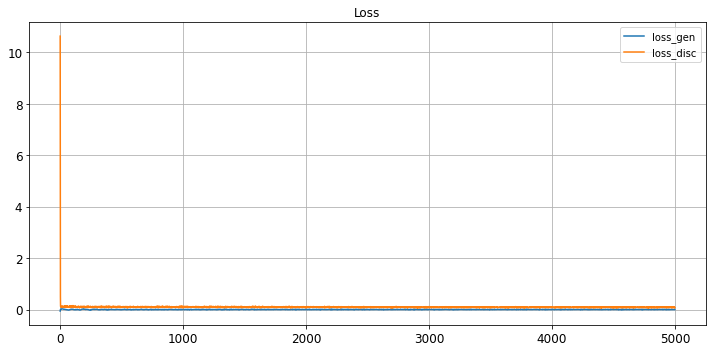

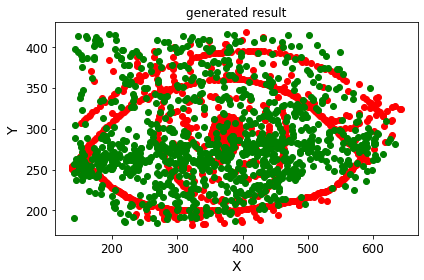

save the model & result
Epoch 5001/100000
critic: 0.077478 - generator: -0.001527 - 0s
Epoch 5002/100000
critic: 0.092133 - generator: -0.000647 - 0s
Epoch 5003/100000
critic: 0.088065 - generator: -0.000045 - 0s
Epoch 5004/100000
critic: 0.088737 - generator: 0.001586 - 0s
Epoch 5005/100000
critic: 0.088775 - generator: 0.000547 - 0s
Epoch 5006/100000
critic: 0.092082 - generator: -0.001346 - 0s
Epoch 5007/100000
critic: 0.095587 - generator: -0.001806 - 0s
Epoch 5008/100000
critic: 0.087351 - generator: -0.003107 - 0s
Epoch 5009/100000
critic: 0.075334 - generator: -0.001986 - 0s
Epoch 5010/100000
critic: 0.071764 - generator: -0.002084 - 0s
Epoch 5011/100000
critic: 0.079678 - generator: -0.001055 - 0s
Epoch 5012/100000
critic: 0.080659 - generator: -0.003519 - 0s
Epoch 5013/100000
critic: 0.095213 - generator: 0.002407 - 0s
Epoch 5014/100000
critic: 0.089514 - generator: -0.002330 - 0s
Epoch 5015/100000
critic: 0.096334 - generator: -0.003534 - 0s
Epoch 5016/100000
critic: 0.096056

critic: 0.079723 - generator: -0.001317 - 0s
Epoch 5133/100000
critic: 0.078175 - generator: -0.002557 - 0s
Epoch 5134/100000
critic: 0.082654 - generator: -0.004216 - 0s
Epoch 5135/100000
critic: 0.092800 - generator: 0.001724 - 0s
Epoch 5136/100000
critic: 0.088310 - generator: 0.000151 - 0s
Epoch 5137/100000
critic: 0.074747 - generator: -0.000038 - 0s
Epoch 5138/100000
critic: 0.074966 - generator: -0.002238 - 0s
Epoch 5139/100000
critic: 0.079100 - generator: -0.002277 - 0s
Epoch 5140/100000
critic: 0.096958 - generator: -0.000402 - 0s
Epoch 5141/100000
critic: 0.093142 - generator: -0.003594 - 0s
Epoch 5142/100000
critic: 0.084181 - generator: -0.001408 - 0s
Epoch 5143/100000
critic: 0.072238 - generator: -0.002563 - 0s
Epoch 5144/100000
critic: 0.078473 - generator: -0.002738 - 0s
Epoch 5145/100000
critic: 0.065939 - generator: 0.003442 - 0s
Epoch 5146/100000
critic: 0.079718 - generator: 0.000763 - 0s
Epoch 5147/100000
critic: 0.086574 - generator: 0.001000 - 0s
Epoch 5148/1000

critic: 0.082341 - generator: 0.002911 - 0s
Epoch 5265/100000
critic: 0.065677 - generator: 0.003999 - 0s
Epoch 5266/100000
critic: 0.076565 - generator: 0.000998 - 0s
Epoch 5267/100000
critic: 0.089106 - generator: 0.004568 - 0s
Epoch 5268/100000
critic: 0.087140 - generator: -0.001669 - 0s
Epoch 5269/100000
critic: 0.076389 - generator: 0.001464 - 0s
Epoch 5270/100000
critic: 0.092366 - generator: -0.000260 - 0s
Epoch 5271/100000
critic: 0.086399 - generator: -0.000837 - 0s
Epoch 5272/100000
critic: 0.078600 - generator: 0.001886 - 0s
Epoch 5273/100000
critic: 0.071443 - generator: 0.002338 - 0s
Epoch 5274/100000
critic: 0.093157 - generator: 0.002977 - 0s
Epoch 5275/100000
critic: 0.072722 - generator: 0.000547 - 0s
Epoch 5276/100000
critic: 0.102109 - generator: -0.003459 - 0s
Epoch 5277/100000
critic: 0.076054 - generator: -0.001249 - 0s
Epoch 5278/100000
critic: 0.087408 - generator: -0.000073 - 0s
Epoch 5279/100000
critic: 0.109634 - generator: -0.001559 - 0s
Epoch 5280/100000
c

critic: 0.082457 - generator: -0.005194 - 0s
Epoch 5397/100000
critic: 0.089814 - generator: -0.000900 - 0s
Epoch 5398/100000
critic: 0.075375 - generator: -0.001845 - 0s
Epoch 5399/100000
critic: 0.089027 - generator: 0.003707 - 0s
Epoch 5400/100000
critic: 0.089295 - generator: 0.003926 - 0s
Epoch 5401/100000
critic: 0.075670 - generator: -0.003508 - 0s
Epoch 5402/100000
critic: 0.081034 - generator: 0.003598 - 0s
Epoch 5403/100000
critic: 0.084388 - generator: 0.001234 - 0s
Epoch 5404/100000
critic: 0.080486 - generator: 0.002019 - 0s
Epoch 5405/100000
critic: 0.076125 - generator: 0.002482 - 0s
Epoch 5406/100000
critic: 0.106895 - generator: -0.000125 - 0s
Epoch 5407/100000
critic: 0.074064 - generator: 0.001811 - 0s
Epoch 5408/100000
critic: 0.092259 - generator: 0.000213 - 0s
Epoch 5409/100000
critic: 0.070728 - generator: 0.002447 - 0s
Epoch 5410/100000
critic: 0.079052 - generator: 0.002822 - 0s
Epoch 5411/100000
critic: 0.078383 - generator: -0.001141 - 0s
Epoch 5412/100000
cr

critic: 0.078125 - generator: -0.001542 - 0s
Epoch 5529/100000
critic: 0.081611 - generator: 0.000730 - 0s
Epoch 5530/100000
critic: 0.080898 - generator: -0.001749 - 0s
Epoch 5531/100000
critic: 0.085057 - generator: -0.001464 - 0s
Epoch 5532/100000
critic: 0.073706 - generator: 0.000758 - 0s
Epoch 5533/100000
critic: 0.099594 - generator: -0.000951 - 0s
Epoch 5534/100000
critic: 0.084203 - generator: -0.000967 - 0s
Epoch 5535/100000
critic: 0.086189 - generator: 0.000715 - 0s
Epoch 5536/100000
critic: 0.080453 - generator: 0.002069 - 0s
Epoch 5537/100000
critic: 0.076837 - generator: -0.002150 - 0s
Epoch 5538/100000
critic: 0.084658 - generator: -0.000996 - 0s
Epoch 5539/100000
critic: 0.085788 - generator: 0.003225 - 0s
Epoch 5540/100000
critic: 0.076052 - generator: -0.001318 - 0s
Epoch 5541/100000
critic: 0.085465 - generator: 0.000257 - 0s
Epoch 5542/100000
critic: 0.084616 - generator: -0.001077 - 0s
Epoch 5543/100000
critic: 0.085665 - generator: -0.002596 - 0s
Epoch 5544/10000

critic: 0.077473 - generator: 0.000417 - 0s
Epoch 5662/100000
critic: 0.085113 - generator: -0.000501 - 0s
Epoch 5663/100000
critic: 0.086939 - generator: 0.001185 - 0s
Epoch 5664/100000
critic: 0.077351 - generator: -0.000862 - 0s
Epoch 5665/100000
critic: 0.075435 - generator: -0.004323 - 0s
Epoch 5666/100000
critic: 0.086146 - generator: -0.001916 - 0s
Epoch 5667/100000
critic: 0.085693 - generator: 0.000069 - 0s
Epoch 5668/100000
critic: 0.077429 - generator: 0.000266 - 0s
Epoch 5669/100000
critic: 0.079585 - generator: -0.002279 - 0s
Epoch 5670/100000
critic: 0.088601 - generator: -0.004052 - 0s
Epoch 5671/100000
critic: 0.076502 - generator: -0.005103 - 0s
Epoch 5672/100000
critic: 0.089613 - generator: -0.000247 - 0s
Epoch 5673/100000
critic: 0.085320 - generator: -0.000626 - 0s
Epoch 5674/100000
critic: 0.084024 - generator: -0.003384 - 0s
Epoch 5675/100000
critic: 0.076797 - generator: 0.000067 - 0s
Epoch 5676/100000
critic: 0.080456 - generator: 0.001542 - 0s
Epoch 5677/10000

critic: 0.088880 - generator: 0.001187 - 0s
Epoch 5795/100000
critic: 0.071146 - generator: 0.003451 - 0s
Epoch 5796/100000
critic: 0.082109 - generator: 0.003230 - 0s
Epoch 5797/100000
critic: 0.082662 - generator: 0.000713 - 0s
Epoch 5798/100000
critic: 0.080550 - generator: -0.001638 - 0s
Epoch 5799/100000
critic: 0.074458 - generator: -0.000230 - 0s
Epoch 5800/100000
critic: 0.075404 - generator: -0.002708 - 0s
Epoch 5801/100000
critic: 0.087167 - generator: 0.002100 - 0s
Epoch 5802/100000
critic: 0.084669 - generator: 0.002594 - 0s
Epoch 5803/100000
critic: 0.080764 - generator: -0.001351 - 0s
Epoch 5804/100000
critic: 0.083225 - generator: -0.000067 - 0s
Epoch 5805/100000
critic: 0.085455 - generator: -0.001462 - 0s
Epoch 5806/100000
critic: 0.084320 - generator: -0.000053 - 0s
Epoch 5807/100000
critic: 0.078050 - generator: -0.003680 - 0s
Epoch 5808/100000
critic: 0.085756 - generator: -0.004682 - 0s
Epoch 5809/100000
critic: 0.080231 - generator: -0.003794 - 0s
Epoch 5810/10000

critic: 0.085679 - generator: -0.002450 - 0s
Epoch 5927/100000
critic: 0.070659 - generator: -0.003878 - 0s
Epoch 5928/100000
critic: 0.089056 - generator: -0.000478 - 0s
Epoch 5929/100000
critic: 0.071603 - generator: 0.001683 - 0s
Epoch 5930/100000
critic: 0.088318 - generator: 0.000267 - 0s
Epoch 5931/100000
critic: 0.083915 - generator: -0.000830 - 0s
Epoch 5932/100000
critic: 0.090647 - generator: 0.000939 - 0s
Epoch 5933/100000
critic: 0.086010 - generator: 0.003697 - 0s
Epoch 5934/100000
critic: 0.096569 - generator: -0.000369 - 0s
Epoch 5935/100000
critic: 0.085106 - generator: 0.001986 - 0s
Epoch 5936/100000
critic: 0.090887 - generator: -0.001847 - 0s
Epoch 5937/100000
critic: 0.084718 - generator: -0.002932 - 0s
Epoch 5938/100000
critic: 0.082949 - generator: -0.001525 - 0s
Epoch 5939/100000
critic: 0.083546 - generator: -0.000095 - 0s
Epoch 5940/100000
critic: 0.080232 - generator: 0.000003 - 0s
Epoch 5941/100000
critic: 0.082421 - generator: -0.003407 - 0s
Epoch 5942/10000

critic: 0.087939 - generator: -0.000959 - 0s
Epoch 6060/100000
critic: 0.075310 - generator: 0.000834 - 0s
Epoch 6061/100000
critic: 0.083493 - generator: 0.002139 - 0s
Epoch 6062/100000
critic: 0.090146 - generator: -0.000714 - 0s
Epoch 6063/100000
critic: 0.085761 - generator: -0.000376 - 0s
Epoch 6064/100000
critic: 0.083101 - generator: -0.002760 - 0s
Epoch 6065/100000
critic: 0.071894 - generator: -0.003974 - 0s
Epoch 6066/100000
critic: 0.083058 - generator: -0.002190 - 0s
Epoch 6067/100000
critic: 0.075869 - generator: 0.001118 - 0s
Epoch 6068/100000
critic: 0.071840 - generator: 0.000319 - 0s
Epoch 6069/100000
critic: 0.085687 - generator: -0.000891 - 0s
Epoch 6070/100000
critic: 0.077595 - generator: -0.001619 - 0s
Epoch 6071/100000
critic: 0.077688 - generator: 0.001130 - 0s
Epoch 6072/100000
critic: 0.076579 - generator: 0.003926 - 0s
Epoch 6073/100000
critic: 0.080717 - generator: -0.000052 - 0s
Epoch 6074/100000
critic: 0.076165 - generator: -0.000826 - 0s
Epoch 6075/10000

critic: 0.082478 - generator: 0.002380 - 0s
Epoch 6191/100000
critic: 0.079703 - generator: 0.005369 - 0s
Epoch 6192/100000
critic: 0.080135 - generator: 0.003173 - 0s
Epoch 6193/100000
critic: 0.088371 - generator: 0.002114 - 0s
Epoch 6194/100000
critic: 0.075267 - generator: 0.004518 - 0s
Epoch 6195/100000
critic: 0.088804 - generator: -0.001616 - 0s
Epoch 6196/100000
critic: 0.089161 - generator: -0.001200 - 0s
Epoch 6197/100000
critic: 0.082151 - generator: -0.002865 - 0s
Epoch 6198/100000
critic: 0.086561 - generator: -0.005329 - 0s
Epoch 6199/100000
critic: 0.072390 - generator: -0.002626 - 0s
Epoch 6200/100000
critic: 0.083412 - generator: -0.002688 - 0s
Epoch 6201/100000
critic: 0.075841 - generator: -0.001182 - 0s
Epoch 6202/100000
critic: 0.069711 - generator: 0.001184 - 0s
Epoch 6203/100000
critic: 0.092710 - generator: -0.003123 - 0s
Epoch 6204/100000
critic: 0.084477 - generator: -0.003645 - 0s
Epoch 6205/100000
critic: 0.080495 - generator: 0.000264 - 0s
Epoch 6206/100000

critic: 0.094790 - generator: 0.002655 - 0s
Epoch 6322/100000
critic: 0.095562 - generator: 0.001308 - 0s
Epoch 6323/100000
critic: 0.085739 - generator: -0.000485 - 0s
Epoch 6324/100000
critic: 0.086431 - generator: 0.002853 - 0s
Epoch 6325/100000
critic: 0.075375 - generator: 0.000132 - 0s
Epoch 6326/100000
critic: 0.091517 - generator: 0.005881 - 0s
Epoch 6327/100000
critic: 0.072651 - generator: 0.002809 - 0s
Epoch 6328/100000
critic: 0.086360 - generator: 0.002075 - 0s
Epoch 6329/100000
critic: 0.070266 - generator: 0.002191 - 0s
Epoch 6330/100000
critic: 0.076877 - generator: 0.004801 - 0s
Epoch 6331/100000
critic: 0.074312 - generator: 0.003326 - 0s
Epoch 6332/100000
critic: 0.082108 - generator: 0.002000 - 0s
Epoch 6333/100000
critic: 0.095799 - generator: -0.000573 - 0s
Epoch 6334/100000
critic: 0.079479 - generator: -0.001539 - 0s
Epoch 6335/100000
critic: 0.072965 - generator: 0.000076 - 0s
Epoch 6336/100000
critic: 0.083892 - generator: -0.000371 - 0s
Epoch 6337/100000
crit

critic: 0.081087 - generator: 0.004544 - 0s
Epoch 6454/100000
critic: 0.080641 - generator: -0.002780 - 0s
Epoch 6455/100000
critic: 0.084507 - generator: 0.000243 - 0s
Epoch 6456/100000
critic: 0.081959 - generator: -0.000936 - 0s
Epoch 6457/100000
critic: 0.090065 - generator: -0.001972 - 0s
Epoch 6458/100000
critic: 0.081687 - generator: 0.000428 - 0s
Epoch 6459/100000
critic: 0.080493 - generator: -0.000683 - 0s
Epoch 6460/100000
critic: 0.085870 - generator: -0.000767 - 0s
Epoch 6461/100000
critic: 0.096186 - generator: -0.001183 - 0s
Epoch 6462/100000
critic: 0.090384 - generator: -0.001819 - 0s
Epoch 6463/100000
critic: 0.074530 - generator: 0.000409 - 0s
Epoch 6464/100000
critic: 0.078933 - generator: -0.000936 - 0s
Epoch 6465/100000
critic: 0.076723 - generator: -0.002164 - 0s
Epoch 6466/100000
critic: 0.079612 - generator: -0.001355 - 0s
Epoch 6467/100000
critic: 0.085756 - generator: -0.000806 - 0s
Epoch 6468/100000
critic: 0.087561 - generator: -0.002442 - 0s
Epoch 6469/100

critic: 0.089073 - generator: -0.003264 - 0s
Epoch 6586/100000
critic: 0.084740 - generator: -0.001535 - 0s
Epoch 6587/100000
critic: 0.079308 - generator: 0.000361 - 0s
Epoch 6588/100000
critic: 0.093236 - generator: -0.001247 - 0s
Epoch 6589/100000
critic: 0.083325 - generator: -0.002147 - 0s
Epoch 6590/100000
critic: 0.090337 - generator: -0.000415 - 0s
Epoch 6591/100000
critic: 0.091453 - generator: 0.002794 - 0s
Epoch 6592/100000
critic: 0.073835 - generator: 0.002544 - 0s
Epoch 6593/100000
critic: 0.080950 - generator: 0.000049 - 0s
Epoch 6594/100000
critic: 0.074543 - generator: 0.000884 - 0s
Epoch 6595/100000
critic: 0.086549 - generator: 0.000158 - 0s
Epoch 6596/100000
critic: 0.083533 - generator: 0.000387 - 0s
Epoch 6597/100000
critic: 0.088082 - generator: 0.001650 - 0s
Epoch 6598/100000
critic: 0.076927 - generator: -0.001081 - 0s
Epoch 6599/100000
critic: 0.089505 - generator: -0.002679 - 0s
Epoch 6600/100000
critic: 0.083238 - generator: 0.000220 - 0s
Epoch 6601/100000
c

critic: 0.079568 - generator: 0.000254 - 0s
Epoch 6718/100000
critic: 0.074526 - generator: -0.000177 - 0s
Epoch 6719/100000
critic: 0.083361 - generator: 0.004862 - 0s
Epoch 6720/100000
critic: 0.088753 - generator: 0.003231 - 0s
Epoch 6721/100000
critic: 0.091979 - generator: 0.003845 - 0s
Epoch 6722/100000
critic: 0.074026 - generator: 0.001631 - 0s
Epoch 6723/100000
critic: 0.088827 - generator: -0.001886 - 0s
Epoch 6724/100000
critic: 0.079640 - generator: 0.003129 - 0s
Epoch 6725/100000
critic: 0.082588 - generator: -0.001881 - 0s
Epoch 6726/100000
critic: 0.082407 - generator: 0.000013 - 0s
Epoch 6727/100000
critic: 0.087761 - generator: -0.005404 - 0s
Epoch 6728/100000
critic: 0.076272 - generator: 0.001843 - 0s
Epoch 6729/100000
critic: 0.083474 - generator: -0.002565 - 0s
Epoch 6730/100000
critic: 0.095627 - generator: -0.000604 - 0s
Epoch 6731/100000
critic: 0.080135 - generator: -0.000921 - 0s
Epoch 6732/100000
critic: 0.072137 - generator: 0.002234 - 0s
Epoch 6733/100000
c

critic: 0.090995 - generator: 0.001537 - 0s
Epoch 6850/100000
critic: 0.085145 - generator: -0.000722 - 0s
Epoch 6851/100000
critic: 0.075730 - generator: -0.000673 - 0s
Epoch 6852/100000
critic: 0.088788 - generator: 0.001784 - 0s
Epoch 6853/100000
critic: 0.086498 - generator: 0.000146 - 0s
Epoch 6854/100000
critic: 0.080595 - generator: 0.002326 - 0s
Epoch 6855/100000
critic: 0.082013 - generator: -0.000761 - 0s
Epoch 6856/100000
critic: 0.090471 - generator: 0.003050 - 0s
Epoch 6857/100000
critic: 0.076589 - generator: 0.000400 - 0s
Epoch 6858/100000
critic: 0.088279 - generator: -0.000838 - 0s
Epoch 6859/100000
critic: 0.083283 - generator: -0.004079 - 0s
Epoch 6860/100000
critic: 0.076862 - generator: -0.000254 - 0s
Epoch 6861/100000
critic: 0.078404 - generator: 0.002029 - 0s
Epoch 6862/100000
critic: 0.082599 - generator: -0.006548 - 0s
Epoch 6863/100000
critic: 0.076539 - generator: 0.001904 - 0s
Epoch 6864/100000
critic: 0.080485 - generator: 0.002278 - 0s
Epoch 6865/100000
c

critic: 0.080075 - generator: -0.002511 - 0s
Epoch 6982/100000
critic: 0.087745 - generator: -0.002101 - 0s
Epoch 6983/100000
critic: 0.087523 - generator: 0.003476 - 0s
Epoch 6984/100000
critic: 0.080797 - generator: 0.000085 - 0s
Epoch 6985/100000
critic: 0.075377 - generator: 0.001455 - 0s
Epoch 6986/100000
critic: 0.086436 - generator: 0.002202 - 0s
Epoch 6987/100000
critic: 0.083401 - generator: 0.005832 - 0s
Epoch 6988/100000
critic: 0.071804 - generator: 0.001950 - 0s
Epoch 6989/100000
critic: 0.085692 - generator: -0.001164 - 0s
Epoch 6990/100000
critic: 0.085086 - generator: -0.003295 - 0s
Epoch 6991/100000
critic: 0.086878 - generator: 0.000725 - 0s
Epoch 6992/100000
critic: 0.083379 - generator: -0.002342 - 0s
Epoch 6993/100000
critic: 0.079793 - generator: 0.002182 - 0s
Epoch 6994/100000
critic: 0.069579 - generator: 0.003074 - 0s
Epoch 6995/100000
critic: 0.083030 - generator: 0.002693 - 0s
Epoch 6996/100000
critic: 0.080697 - generator: 0.000465 - 0s
Epoch 6997/100000
cri

critic: 0.076929 - generator: -0.003664 - 0s
Epoch 7114/100000
critic: 0.076200 - generator: 0.001490 - 0s
Epoch 7115/100000
critic: 0.090605 - generator: 0.001006 - 0s
Epoch 7116/100000
critic: 0.083940 - generator: -0.002468 - 0s
Epoch 7117/100000
critic: 0.068894 - generator: -0.000799 - 0s
Epoch 7118/100000
critic: 0.076750 - generator: -0.000117 - 0s
Epoch 7119/100000
critic: 0.084893 - generator: -0.002323 - 0s
Epoch 7120/100000
critic: 0.082875 - generator: 0.000219 - 0s
Epoch 7121/100000
critic: 0.087135 - generator: -0.001760 - 0s
Epoch 7122/100000
critic: 0.086145 - generator: 0.000819 - 0s
Epoch 7123/100000
critic: 0.075312 - generator: -0.000890 - 0s
Epoch 7124/100000
critic: 0.084032 - generator: -0.002296 - 0s
Epoch 7125/100000
critic: 0.094677 - generator: -0.000262 - 0s
Epoch 7126/100000
critic: 0.084738 - generator: 0.000985 - 0s
Epoch 7127/100000
critic: 0.087518 - generator: 0.001268 - 0s
Epoch 7128/100000
critic: 0.080754 - generator: 0.000778 - 0s
Epoch 7129/100000

critic: 0.086267 - generator: -0.001957 - 0s
Epoch 7246/100000
critic: 0.082369 - generator: -0.003608 - 0s
Epoch 7247/100000
critic: 0.077033 - generator: -0.000540 - 0s
Epoch 7248/100000
critic: 0.087247 - generator: 0.001387 - 0s
Epoch 7249/100000
critic: 0.096502 - generator: 0.000402 - 0s
Epoch 7250/100000
critic: 0.069297 - generator: -0.001401 - 0s
Epoch 7251/100000
critic: 0.085744 - generator: 0.003226 - 0s
Epoch 7252/100000
critic: 0.077922 - generator: 0.006806 - 0s
Epoch 7253/100000
critic: 0.071669 - generator: 0.003310 - 0s
Epoch 7254/100000
critic: 0.076812 - generator: -0.000127 - 0s
Epoch 7255/100000
critic: 0.083916 - generator: 0.005267 - 0s
Epoch 7256/100000
critic: 0.090164 - generator: 0.001672 - 0s
Epoch 7257/100000
critic: 0.073487 - generator: 0.000805 - 0s
Epoch 7258/100000
critic: 0.080268 - generator: 0.000644 - 0s
Epoch 7259/100000
critic: 0.094265 - generator: 0.001525 - 0s
Epoch 7260/100000
critic: 0.087558 - generator: -0.000706 - 0s
Epoch 7261/100000
cr

critic: 0.081327 - generator: 0.000622 - 0s
Epoch 7378/100000
critic: 0.081985 - generator: -0.001587 - 0s
Epoch 7379/100000
critic: 0.072856 - generator: 0.001066 - 0s
Epoch 7380/100000
critic: 0.084917 - generator: 0.003283 - 0s
Epoch 7381/100000
critic: 0.087442 - generator: 0.000284 - 0s
Epoch 7382/100000
critic: 0.088186 - generator: 0.003572 - 0s
Epoch 7383/100000
critic: 0.087882 - generator: 0.001557 - 0s
Epoch 7384/100000
critic: 0.084492 - generator: -0.002825 - 0s
Epoch 7385/100000
critic: 0.079430 - generator: -0.000740 - 0s
Epoch 7386/100000
critic: 0.087639 - generator: -0.003459 - 0s
Epoch 7387/100000
critic: 0.083412 - generator: 0.000962 - 0s
Epoch 7388/100000
critic: 0.083709 - generator: 0.000408 - 0s
Epoch 7389/100000
critic: 0.090228 - generator: -0.002046 - 0s
Epoch 7390/100000
critic: 0.079964 - generator: -0.000312 - 0s
Epoch 7391/100000
critic: 0.084382 - generator: 0.001319 - 0s
Epoch 7392/100000
critic: 0.082463 - generator: 0.002474 - 0s
Epoch 7393/100000
cr

critic: 0.086797 - generator: 0.001876 - 0s
Epoch 7510/100000
critic: 0.087947 - generator: -0.000077 - 0s
Epoch 7511/100000
critic: 0.089108 - generator: 0.001848 - 0s
Epoch 7512/100000
critic: 0.079915 - generator: 0.001978 - 0s
Epoch 7513/100000
critic: 0.089754 - generator: 0.000246 - 0s
Epoch 7514/100000
critic: 0.081056 - generator: 0.000094 - 0s
Epoch 7515/100000
critic: 0.084618 - generator: 0.001392 - 0s
Epoch 7516/100000
critic: 0.078104 - generator: 0.001405 - 0s
Epoch 7517/100000
critic: 0.067070 - generator: 0.000506 - 0s
Epoch 7518/100000
critic: 0.083630 - generator: 0.002472 - 0s
Epoch 7519/100000
critic: 0.093326 - generator: -0.001868 - 0s
Epoch 7520/100000
critic: 0.071235 - generator: 0.000632 - 0s
Epoch 7521/100000
critic: 0.084427 - generator: -0.001150 - 0s
Epoch 7522/100000
critic: 0.068130 - generator: -0.001885 - 0s
Epoch 7523/100000
critic: 0.079329 - generator: 0.000589 - 0s
Epoch 7524/100000
critic: 0.075862 - generator: 0.003112 - 0s
Epoch 7525/100000
crit

critic: 0.082010 - generator: 0.000068 - 0s
Epoch 7643/100000
critic: 0.082580 - generator: 0.003428 - 0s
Epoch 7644/100000
critic: 0.088959 - generator: -0.000007 - 0s
Epoch 7645/100000
critic: 0.089665 - generator: -0.000630 - 0s
Epoch 7646/100000
critic: 0.086268 - generator: -0.000959 - 0s
Epoch 7647/100000
critic: 0.084412 - generator: -0.008292 - 0s
Epoch 7648/100000
critic: 0.090883 - generator: -0.002175 - 0s
Epoch 7649/100000
critic: 0.077295 - generator: -0.001775 - 0s
Epoch 7650/100000
critic: 0.086820 - generator: -0.003378 - 0s
Epoch 7651/100000
critic: 0.075073 - generator: -0.000107 - 0s
Epoch 7652/100000
critic: 0.075700 - generator: -0.000741 - 0s
Epoch 7653/100000
critic: 0.074809 - generator: -0.000198 - 0s
Epoch 7654/100000
critic: 0.081319 - generator: 0.001503 - 0s
Epoch 7655/100000
critic: 0.079481 - generator: 0.002935 - 0s
Epoch 7656/100000
critic: 0.073937 - generator: -0.004655 - 0s
Epoch 7657/100000
critic: 0.085569 - generator: 0.002049 - 0s
Epoch 7658/1000

critic: 0.089684 - generator: 0.001888 - 0s
Epoch 7775/100000
critic: 0.076479 - generator: 0.000368 - 0s
Epoch 7776/100000
critic: 0.080972 - generator: 0.001093 - 0s
Epoch 7777/100000
critic: 0.080043 - generator: 0.001136 - 0s
Epoch 7778/100000
critic: 0.082046 - generator: 0.001419 - 0s
Epoch 7779/100000
critic: 0.089659 - generator: -0.004150 - 0s
Epoch 7780/100000
critic: 0.080225 - generator: -0.000763 - 0s
Epoch 7781/100000
critic: 0.083404 - generator: -0.000630 - 0s
Epoch 7782/100000
critic: 0.082598 - generator: -0.001375 - 0s
Epoch 7783/100000
critic: 0.076540 - generator: 0.002484 - 0s
Epoch 7784/100000
critic: 0.078794 - generator: -0.001117 - 0s
Epoch 7785/100000
critic: 0.085133 - generator: 0.004029 - 0s
Epoch 7786/100000
critic: 0.079654 - generator: 0.007255 - 0s
Epoch 7787/100000
critic: 0.076744 - generator: 0.001723 - 0s
Epoch 7788/100000
critic: 0.078974 - generator: 0.003255 - 0s
Epoch 7789/100000
critic: 0.079849 - generator: -0.000750 - 0s
Epoch 7790/100000
cr

critic: 0.081180 - generator: -0.001713 - 0s
Epoch 7907/100000
critic: 0.087458 - generator: -0.001074 - 0s
Epoch 7908/100000
critic: 0.084962 - generator: -0.003109 - 0s
Epoch 7909/100000
critic: 0.079438 - generator: -0.002794 - 0s
Epoch 7910/100000
critic: 0.086323 - generator: 0.004696 - 0s
Epoch 7911/100000
critic: 0.083328 - generator: 0.004398 - 0s
Epoch 7912/100000
critic: 0.088532 - generator: 0.000592 - 0s
Epoch 7913/100000
critic: 0.076556 - generator: 0.002226 - 0s
Epoch 7914/100000
critic: 0.073600 - generator: -0.001116 - 0s
Epoch 7915/100000
critic: 0.084165 - generator: 0.001417 - 0s
Epoch 7916/100000
critic: 0.068879 - generator: 0.000672 - 0s
Epoch 7917/100000
critic: 0.088459 - generator: -0.002305 - 0s
Epoch 7918/100000
critic: 0.080074 - generator: -0.002628 - 0s
Epoch 7919/100000
critic: 0.084508 - generator: -0.006028 - 0s
Epoch 7920/100000
critic: 0.088400 - generator: 0.001377 - 0s
Epoch 7921/100000
critic: 0.084899 - generator: -0.004292 - 0s
Epoch 7922/100000

critic: 0.086661 - generator: 0.000395 - 0s
Epoch 8039/100000
critic: 0.087345 - generator: 0.000902 - 0s
Epoch 8040/100000
critic: 0.090353 - generator: -0.001300 - 0s
Epoch 8041/100000
critic: 0.074142 - generator: -0.003047 - 0s
Epoch 8042/100000
critic: 0.083204 - generator: 0.000263 - 0s
Epoch 8043/100000
critic: 0.075398 - generator: 0.001331 - 0s
Epoch 8044/100000
critic: 0.081616 - generator: 0.001081 - 0s
Epoch 8045/100000
critic: 0.072891 - generator: 0.000272 - 0s
Epoch 8046/100000
critic: 0.083029 - generator: 0.002022 - 0s
Epoch 8047/100000
critic: 0.078383 - generator: -0.000091 - 0s
Epoch 8048/100000
critic: 0.082241 - generator: -0.004452 - 0s
Epoch 8049/100000
critic: 0.073643 - generator: 0.000164 - 0s
Epoch 8050/100000
critic: 0.077683 - generator: 0.002435 - 0s
Epoch 8051/100000
critic: 0.072826 - generator: 0.001446 - 0s
Epoch 8052/100000
critic: 0.076811 - generator: 0.002733 - 0s
Epoch 8053/100000
critic: 0.081183 - generator: -0.000336 - 0s
Epoch 8054/100000
cri

critic: 0.088039 - generator: -0.000018 - 0s
Epoch 8171/100000
critic: 0.076541 - generator: -0.002930 - 0s
Epoch 8172/100000
critic: 0.080162 - generator: 0.002251 - 0s
Epoch 8173/100000
critic: 0.090409 - generator: 0.000020 - 0s
Epoch 8174/100000
critic: 0.088202 - generator: 0.001059 - 0s
Epoch 8175/100000
critic: 0.072635 - generator: 0.000087 - 0s
Epoch 8176/100000
critic: 0.088978 - generator: -0.001101 - 0s
Epoch 8177/100000
critic: 0.089561 - generator: 0.001448 - 0s
Epoch 8178/100000
critic: 0.078654 - generator: -0.001773 - 0s
Epoch 8179/100000
critic: 0.097796 - generator: 0.001458 - 0s
Epoch 8180/100000
critic: 0.083733 - generator: 0.000773 - 0s
Epoch 8181/100000
critic: 0.082242 - generator: 0.003797 - 0s
Epoch 8182/100000
critic: 0.078178 - generator: -0.000202 - 0s
Epoch 8183/100000
critic: 0.088575 - generator: 0.003334 - 0s
Epoch 8184/100000
critic: 0.077214 - generator: 0.000580 - 0s
Epoch 8185/100000
critic: 0.082259 - generator: -0.005098 - 0s
Epoch 8186/100000
cr

critic: 0.083006 - generator: 0.000300 - 0s
Epoch 8304/100000
critic: 0.091727 - generator: 0.000011 - 0s
Epoch 8305/100000
critic: 0.079792 - generator: -0.002972 - 0s
Epoch 8306/100000
critic: 0.081360 - generator: -0.000774 - 0s
Epoch 8307/100000
critic: 0.086084 - generator: 0.000342 - 0s
Epoch 8308/100000
critic: 0.078712 - generator: -0.004248 - 0s
Epoch 8309/100000
critic: 0.086207 - generator: 0.001612 - 0s
Epoch 8310/100000
critic: 0.081561 - generator: -0.004022 - 0s
Epoch 8311/100000
critic: 0.090769 - generator: 0.000178 - 0s
Epoch 8312/100000
critic: 0.076690 - generator: -0.001008 - 0s
Epoch 8313/100000
critic: 0.079728 - generator: 0.002072 - 0s
Epoch 8314/100000
critic: 0.081657 - generator: 0.004357 - 0s
Epoch 8315/100000
critic: 0.090358 - generator: 0.000836 - 0s
Epoch 8316/100000
critic: 0.085419 - generator: 0.001760 - 0s
Epoch 8317/100000
critic: 0.085411 - generator: 0.001837 - 0s
Epoch 8318/100000
critic: 0.080347 - generator: 0.000275 - 0s
Epoch 8319/100000
cri

critic: 0.076350 - generator: 0.001159 - 0s
Epoch 8437/100000
critic: 0.075691 - generator: 0.002666 - 0s
Epoch 8438/100000
critic: 0.086182 - generator: 0.001673 - 0s
Epoch 8439/100000
critic: 0.079341 - generator: 0.001553 - 0s
Epoch 8440/100000
critic: 0.077467 - generator: 0.000425 - 0s
Epoch 8441/100000
critic: 0.096465 - generator: -0.000394 - 0s
Epoch 8442/100000
critic: 0.079536 - generator: 0.002420 - 0s
Epoch 8443/100000
critic: 0.083650 - generator: -0.000682 - 0s
Epoch 8444/100000
critic: 0.078713 - generator: 0.000333 - 0s
Epoch 8445/100000
critic: 0.091956 - generator: -0.000336 - 0s
Epoch 8446/100000
critic: 0.082836 - generator: -0.002791 - 0s
Epoch 8447/100000
critic: 0.071969 - generator: -0.002610 - 0s
Epoch 8448/100000
critic: 0.087412 - generator: -0.003350 - 0s
Epoch 8449/100000
critic: 0.086042 - generator: 0.000068 - 0s
Epoch 8450/100000
critic: 0.094259 - generator: 0.002787 - 0s
Epoch 8451/100000
critic: 0.081193 - generator: 0.003863 - 0s
Epoch 8452/100000
cr

critic: 0.080922 - generator: 0.001809 - 0s
Epoch 8570/100000
critic: 0.090279 - generator: 0.004476 - 0s
Epoch 8571/100000
critic: 0.082293 - generator: 0.001195 - 0s
Epoch 8572/100000
critic: 0.082166 - generator: -0.001975 - 0s
Epoch 8573/100000
critic: 0.084515 - generator: -0.002400 - 0s
Epoch 8574/100000
critic: 0.075037 - generator: 0.002459 - 0s
Epoch 8575/100000
critic: 0.073416 - generator: 0.000896 - 0s
Epoch 8576/100000
critic: 0.075639 - generator: 0.001875 - 0s
Epoch 8577/100000
critic: 0.084651 - generator: 0.002284 - 0s
Epoch 8578/100000
critic: 0.081185 - generator: 0.004886 - 0s
Epoch 8579/100000
critic: 0.083444 - generator: 0.004960 - 0s
Epoch 8580/100000
critic: 0.087451 - generator: 0.000099 - 0s
Epoch 8581/100000
critic: 0.081004 - generator: 0.002229 - 0s
Epoch 8582/100000
critic: 0.074688 - generator: 0.001456 - 0s
Epoch 8583/100000
critic: 0.077174 - generator: 0.003564 - 0s
Epoch 8584/100000
critic: 0.094528 - generator: -0.005421 - 0s
Epoch 8585/100000
criti

critic: 0.080788 - generator: 0.000139 - 0s
Epoch 8703/100000
critic: 0.083227 - generator: -0.000151 - 0s
Epoch 8704/100000
critic: 0.076589 - generator: 0.001640 - 0s
Epoch 8705/100000
critic: 0.075474 - generator: -0.000699 - 0s
Epoch 8706/100000
critic: 0.091800 - generator: -0.002830 - 0s
Epoch 8707/100000
critic: 0.081461 - generator: 0.000678 - 0s
Epoch 8708/100000
critic: 0.079408 - generator: -0.002498 - 0s
Epoch 8709/100000
critic: 0.083647 - generator: -0.002500 - 0s
Epoch 8710/100000
critic: 0.084532 - generator: 0.003329 - 0s
Epoch 8711/100000
critic: 0.086717 - generator: 0.001567 - 0s
Epoch 8712/100000
critic: 0.083743 - generator: -0.000008 - 0s
Epoch 8713/100000
critic: 0.088007 - generator: -0.000342 - 0s
Epoch 8714/100000
critic: 0.083495 - generator: -0.002838 - 0s
Epoch 8715/100000
critic: 0.095389 - generator: 0.001896 - 0s
Epoch 8716/100000
critic: 0.078865 - generator: 0.002499 - 0s
Epoch 8717/100000
critic: 0.083668 - generator: -0.002012 - 0s
Epoch 8718/100000

critic: 0.077559 - generator: -0.000468 - 0s
Epoch 8836/100000
critic: 0.086089 - generator: -0.001826 - 0s
Epoch 8837/100000
critic: 0.074868 - generator: 0.001624 - 0s
Epoch 8838/100000
critic: 0.079112 - generator: 0.004879 - 0s
Epoch 8839/100000
critic: 0.074187 - generator: 0.003276 - 0s
Epoch 8840/100000
critic: 0.082006 - generator: 0.001469 - 0s
Epoch 8841/100000
critic: 0.079114 - generator: 0.000630 - 0s
Epoch 8842/100000
critic: 0.072994 - generator: -0.003341 - 0s
Epoch 8843/100000
critic: 0.087251 - generator: -0.000091 - 0s
Epoch 8844/100000
critic: 0.075864 - generator: 0.004691 - 0s
Epoch 8845/100000
critic: 0.082036 - generator: 0.002281 - 0s
Epoch 8846/100000
critic: 0.083883 - generator: -0.000244 - 0s
Epoch 8847/100000
critic: 0.081956 - generator: -0.000862 - 0s
Epoch 8848/100000
critic: 0.079322 - generator: 0.001336 - 0s
Epoch 8849/100000
critic: 0.081549 - generator: 0.005785 - 0s
Epoch 8850/100000
critic: 0.082327 - generator: 0.001496 - 0s
Epoch 8851/100000
cr

critic: 0.081785 - generator: -0.001874 - 0s
Epoch 8967/100000
critic: 0.088114 - generator: 0.000733 - 0s
Epoch 8968/100000
critic: 0.083342 - generator: -0.003827 - 0s
Epoch 8969/100000
critic: 0.078506 - generator: 0.002119 - 0s
Epoch 8970/100000
critic: 0.077097 - generator: -0.000252 - 0s
Epoch 8971/100000
critic: 0.076025 - generator: 0.002712 - 0s
Epoch 8972/100000
critic: 0.076552 - generator: -0.000954 - 0s
Epoch 8973/100000
critic: 0.088939 - generator: -0.000266 - 0s
Epoch 8974/100000
critic: 0.077810 - generator: -0.001736 - 0s
Epoch 8975/100000
critic: 0.076041 - generator: -0.000020 - 0s
Epoch 8976/100000
critic: 0.079051 - generator: -0.002918 - 0s
Epoch 8977/100000
critic: 0.083431 - generator: -0.000164 - 0s
Epoch 8978/100000
critic: 0.085058 - generator: -0.001730 - 0s
Epoch 8979/100000
critic: 0.086465 - generator: 0.000712 - 0s
Epoch 8980/100000
critic: 0.078000 - generator: -0.000830 - 0s
Epoch 8981/100000
critic: 0.080397 - generator: 0.000221 - 0s
Epoch 8982/1000

critic: 0.076369 - generator: 0.000935 - 0s
Epoch 9099/100000
critic: 0.078633 - generator: -0.000428 - 0s
Epoch 9100/100000
critic: 0.077898 - generator: 0.002539 - 0s
Epoch 9101/100000
critic: 0.089283 - generator: -0.000562 - 0s
Epoch 9102/100000
critic: 0.078498 - generator: 0.001209 - 0s
Epoch 9103/100000
critic: 0.078722 - generator: -0.001866 - 0s
Epoch 9104/100000
critic: 0.091322 - generator: -0.001409 - 0s
Epoch 9105/100000
critic: 0.085833 - generator: -0.004368 - 0s
Epoch 9106/100000
critic: 0.087862 - generator: 0.000107 - 0s
Epoch 9107/100000
critic: 0.079960 - generator: -0.000390 - 0s
Epoch 9108/100000
critic: 0.081315 - generator: 0.000009 - 0s
Epoch 9109/100000
critic: 0.084865 - generator: 0.001822 - 0s
Epoch 9110/100000
critic: 0.088679 - generator: 0.001246 - 0s
Epoch 9111/100000
critic: 0.078635 - generator: 0.000483 - 0s
Epoch 9112/100000
critic: 0.093045 - generator: 0.000571 - 0s
Epoch 9113/100000
critic: 0.084707 - generator: 0.001522 - 0s
Epoch 9114/100000
cr

critic: 0.093025 - generator: -0.001709 - 0s
Epoch 9231/100000
critic: 0.083833 - generator: 0.002733 - 0s
Epoch 9232/100000
critic: 0.089511 - generator: 0.000658 - 0s
Epoch 9233/100000
critic: 0.072769 - generator: 0.003542 - 0s
Epoch 9234/100000
critic: 0.094369 - generator: -0.001091 - 0s
Epoch 9235/100000
critic: 0.083308 - generator: 0.000464 - 0s
Epoch 9236/100000
critic: 0.086125 - generator: -0.000491 - 0s
Epoch 9237/100000
critic: 0.085365 - generator: -0.000570 - 0s
Epoch 9238/100000
critic: 0.085117 - generator: 0.001598 - 0s
Epoch 9239/100000
critic: 0.088357 - generator: -0.000852 - 0s
Epoch 9240/100000
critic: 0.083933 - generator: -0.000447 - 0s
Epoch 9241/100000
critic: 0.082231 - generator: 0.001411 - 0s
Epoch 9242/100000
critic: 0.086711 - generator: -0.001134 - 0s
Epoch 9243/100000
critic: 0.089822 - generator: 0.002936 - 0s
Epoch 9244/100000
critic: 0.089555 - generator: -0.000780 - 0s
Epoch 9245/100000
critic: 0.073992 - generator: 0.000321 - 0s
Epoch 9246/100000


critic: 0.075794 - generator: -0.003537 - 0s
Epoch 9364/100000
critic: 0.074775 - generator: -0.001244 - 0s
Epoch 9365/100000
critic: 0.074847 - generator: 0.004438 - 0s
Epoch 9366/100000
critic: 0.080412 - generator: 0.002056 - 0s
Epoch 9367/100000
critic: 0.083352 - generator: 0.000867 - 0s
Epoch 9368/100000
critic: 0.082119 - generator: 0.001459 - 0s
Epoch 9369/100000
critic: 0.095786 - generator: -0.000026 - 0s
Epoch 9370/100000
critic: 0.082213 - generator: 0.002807 - 0s
Epoch 9371/100000
critic: 0.087507 - generator: -0.000582 - 0s
Epoch 9372/100000
critic: 0.082635 - generator: 0.000647 - 0s
Epoch 9373/100000
critic: 0.068813 - generator: -0.000345 - 0s
Epoch 9374/100000
critic: 0.078263 - generator: -0.003956 - 0s
Epoch 9375/100000
critic: 0.068377 - generator: -0.002217 - 0s
Epoch 9376/100000
critic: 0.078422 - generator: -0.002854 - 0s
Epoch 9377/100000
critic: 0.084869 - generator: -0.000400 - 0s
Epoch 9378/100000
critic: 0.087073 - generator: -0.000636 - 0s
Epoch 9379/10000

critic: 0.092974 - generator: -0.002421 - 0s
Epoch 9495/100000
critic: 0.085199 - generator: 0.001906 - 0s
Epoch 9496/100000
critic: 0.084658 - generator: -0.000226 - 0s
Epoch 9497/100000
critic: 0.095399 - generator: 0.002333 - 0s
Epoch 9498/100000
critic: 0.081174 - generator: 0.003305 - 0s
Epoch 9499/100000
critic: 0.086066 - generator: 0.001526 - 0s
Epoch 9500/100000
critic: 0.088966 - generator: 0.001715 - 0s
Epoch 9501/100000
critic: 0.089036 - generator: -0.002928 - 0s
Epoch 9502/100000
critic: 0.079774 - generator: -0.000804 - 0s
Epoch 9503/100000
critic: 0.089734 - generator: -0.000922 - 0s
Epoch 9504/100000
critic: 0.088949 - generator: -0.000167 - 0s
Epoch 9505/100000
critic: 0.087429 - generator: -0.000527 - 0s
Epoch 9506/100000
critic: 0.086400 - generator: -0.002144 - 0s
Epoch 9507/100000
critic: 0.096182 - generator: -0.002845 - 0s
Epoch 9508/100000
critic: 0.083481 - generator: 0.002350 - 0s
Epoch 9509/100000
critic: 0.090298 - generator: -0.000190 - 0s
Epoch 9510/10000

critic: 0.085643 - generator: -0.000814 - 0s
Epoch 9627/100000
critic: 0.078371 - generator: -0.002100 - 0s
Epoch 9628/100000
critic: 0.080562 - generator: -0.001828 - 0s
Epoch 9629/100000
critic: 0.090231 - generator: 0.000275 - 0s
Epoch 9630/100000
critic: 0.073553 - generator: 0.001406 - 0s
Epoch 9631/100000
critic: 0.081258 - generator: 0.000639 - 0s
Epoch 9632/100000
critic: 0.096378 - generator: -0.000139 - 0s
Epoch 9633/100000
critic: 0.084025 - generator: 0.001753 - 0s
Epoch 9634/100000
critic: 0.083192 - generator: 0.003613 - 0s
Epoch 9635/100000
critic: 0.072247 - generator: 0.002890 - 0s
Epoch 9636/100000
critic: 0.081894 - generator: 0.001455 - 0s
Epoch 9637/100000
critic: 0.084742 - generator: -0.001538 - 0s
Epoch 9638/100000
critic: 0.089834 - generator: 0.000594 - 0s
Epoch 9639/100000
critic: 0.075354 - generator: 0.001282 - 0s
Epoch 9640/100000
critic: 0.078303 - generator: -0.001202 - 0s
Epoch 9641/100000
critic: 0.089192 - generator: -0.002802 - 0s
Epoch 9642/100000
c

critic: 0.074166 - generator: -0.001993 - 0s
Epoch 9759/100000
critic: 0.092282 - generator: -0.001102 - 0s
Epoch 9760/100000
critic: 0.081867 - generator: -0.002563 - 0s
Epoch 9761/100000
critic: 0.073892 - generator: 0.001893 - 0s
Epoch 9762/100000
critic: 0.079501 - generator: 0.002297 - 0s
Epoch 9763/100000
critic: 0.087386 - generator: -0.002391 - 0s
Epoch 9764/100000
critic: 0.085148 - generator: 0.000303 - 0s
Epoch 9765/100000
critic: 0.085838 - generator: -0.001152 - 0s
Epoch 9766/100000
critic: 0.075804 - generator: -0.000004 - 0s
Epoch 9767/100000
critic: 0.087845 - generator: -0.001946 - 0s
Epoch 9768/100000
critic: 0.080318 - generator: 0.000173 - 0s
Epoch 9769/100000
critic: 0.076882 - generator: -0.000578 - 0s
Epoch 9770/100000
critic: 0.089820 - generator: -0.003391 - 0s
Epoch 9771/100000
critic: 0.082140 - generator: 0.001189 - 0s
Epoch 9772/100000
critic: 0.068360 - generator: -0.000313 - 0s
Epoch 9773/100000
critic: 0.079902 - generator: -0.000816 - 0s
Epoch 9774/1000

critic: 0.071056 - generator: 0.001157 - 0s
Epoch 9891/100000
critic: 0.088278 - generator: 0.001647 - 0s
Epoch 9892/100000
critic: 0.067742 - generator: 0.000209 - 0s
Epoch 9893/100000
critic: 0.083966 - generator: -0.001293 - 0s
Epoch 9894/100000
critic: 0.080445 - generator: -0.001156 - 0s
Epoch 9895/100000
critic: 0.078852 - generator: -0.003369 - 0s
Epoch 9896/100000
critic: 0.086593 - generator: -0.001621 - 0s
Epoch 9897/100000
critic: 0.073966 - generator: -0.001482 - 0s
Epoch 9898/100000
critic: 0.087705 - generator: -0.001967 - 0s
Epoch 9899/100000
critic: 0.084324 - generator: 0.002291 - 0s
Epoch 9900/100000
critic: 0.080769 - generator: -0.000995 - 0s
Epoch 9901/100000
critic: 0.069710 - generator: -0.000393 - 0s
Epoch 9902/100000
critic: 0.081838 - generator: -0.000517 - 0s
Epoch 9903/100000
critic: 0.071458 - generator: 0.000986 - 0s
Epoch 9904/100000
critic: 0.083109 - generator: -0.003694 - 0s
Epoch 9905/100000
critic: 0.075808 - generator: -0.001212 - 0s
Epoch 9906/1000

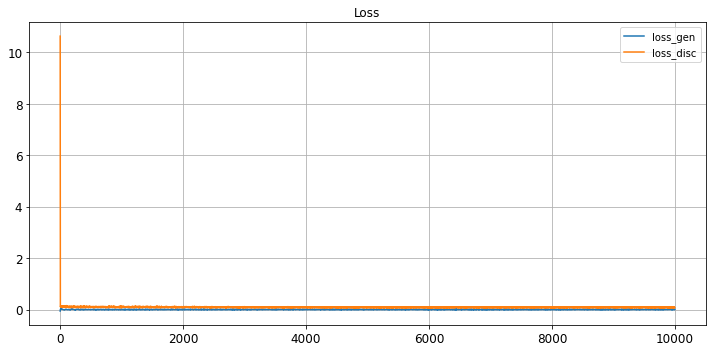

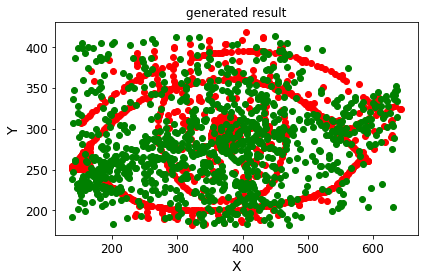

save the model & result
Epoch 10001/100000
critic: 0.076347 - generator: -0.000052 - 0s
Epoch 10002/100000
critic: 0.091205 - generator: 0.000308 - 0s
Epoch 10003/100000
critic: 0.078513 - generator: -0.001775 - 0s
Epoch 10004/100000
critic: 0.081059 - generator: -0.001826 - 0s
Epoch 10005/100000
critic: 0.082089 - generator: 0.002897 - 0s
Epoch 10006/100000
critic: 0.084880 - generator: 0.001603 - 0s
Epoch 10007/100000
critic: 0.085096 - generator: 0.003168 - 0s
Epoch 10008/100000
critic: 0.079797 - generator: 0.001714 - 0s
Epoch 10009/100000
critic: 0.088065 - generator: 0.002451 - 0s
Epoch 10010/100000
critic: 0.078354 - generator: 0.003809 - 0s
Epoch 10011/100000
critic: 0.082145 - generator: -0.001378 - 0s
Epoch 10012/100000
critic: 0.081975 - generator: -0.000177 - 0s
Epoch 10013/100000
critic: 0.092769 - generator: -0.002255 - 0s
Epoch 10014/100000
critic: 0.077631 - generator: -0.000408 - 0s
Epoch 10015/100000
critic: 0.088076 - generator: 0.000981 - 0s
Epoch 10016/100000
criti

critic: 0.082482 - generator: -0.003050 - 0s
Epoch 10132/100000
critic: 0.080619 - generator: -0.000906 - 0s
Epoch 10133/100000
critic: 0.080139 - generator: -0.002394 - 0s
Epoch 10134/100000
critic: 0.091763 - generator: 0.000715 - 0s
Epoch 10135/100000
critic: 0.082859 - generator: 0.001255 - 0s
Epoch 10136/100000
critic: 0.081421 - generator: 0.001717 - 0s
Epoch 10137/100000
critic: 0.079613 - generator: -0.000838 - 0s
Epoch 10138/100000
critic: 0.079978 - generator: -0.001096 - 0s
Epoch 10139/100000
critic: 0.081956 - generator: -0.002842 - 0s
Epoch 10140/100000
critic: 0.085852 - generator: 0.002939 - 0s
Epoch 10141/100000
critic: 0.079618 - generator: -0.001309 - 0s
Epoch 10142/100000
critic: 0.074488 - generator: -0.002257 - 0s
Epoch 10143/100000
critic: 0.084627 - generator: -0.003660 - 0s
Epoch 10144/100000
critic: 0.088036 - generator: -0.000039 - 0s
Epoch 10145/100000
critic: 0.083709 - generator: 0.003862 - 0s
Epoch 10146/100000
critic: 0.091740 - generator: 0.003050 - 0s
E

critic: 0.091253 - generator: 0.002728 - 0s
Epoch 10262/100000
critic: 0.079610 - generator: -0.001795 - 0s
Epoch 10263/100000
critic: 0.071761 - generator: -0.002118 - 0s
Epoch 10264/100000
critic: 0.085960 - generator: -0.002056 - 0s
Epoch 10265/100000
critic: 0.085519 - generator: -0.000928 - 0s
Epoch 10266/100000
critic: 0.080947 - generator: -0.000707 - 0s
Epoch 10267/100000
critic: 0.083186 - generator: 0.002403 - 0s
Epoch 10268/100000
critic: 0.086971 - generator: 0.005835 - 0s
Epoch 10269/100000
critic: 0.073035 - generator: 0.002047 - 0s
Epoch 10270/100000
critic: 0.092940 - generator: 0.000157 - 0s
Epoch 10271/100000
critic: 0.085392 - generator: 0.000571 - 0s
Epoch 10272/100000
critic: 0.079104 - generator: 0.002006 - 0s
Epoch 10273/100000
critic: 0.090741 - generator: 0.002556 - 0s
Epoch 10274/100000
critic: 0.090766 - generator: 0.001397 - 0s
Epoch 10275/100000
critic: 0.075456 - generator: -0.004473 - 0s
Epoch 10276/100000
critic: 0.081307 - generator: -0.002409 - 0s
Epoc

critic: 0.079011 - generator: -0.001268 - 0s
Epoch 10393/100000
critic: 0.090963 - generator: -0.002075 - 0s
Epoch 10394/100000
critic: 0.073848 - generator: -0.001038 - 0s
Epoch 10395/100000
critic: 0.077705 - generator: -0.002532 - 0s
Epoch 10396/100000
critic: 0.094628 - generator: 0.003920 - 0s
Epoch 10397/100000
critic: 0.077246 - generator: -0.000170 - 0s
Epoch 10398/100000
critic: 0.073673 - generator: -0.000514 - 0s
Epoch 10399/100000
critic: 0.085970 - generator: 0.000833 - 0s
Epoch 10400/100000
critic: 0.085770 - generator: -0.001981 - 0s
Epoch 10401/100000
critic: 0.075841 - generator: 0.000293 - 0s
Epoch 10402/100000
critic: 0.079840 - generator: 0.000173 - 0s
Epoch 10403/100000
critic: 0.087660 - generator: 0.003302 - 0s
Epoch 10404/100000
critic: 0.079498 - generator: -0.000211 - 0s
Epoch 10405/100000
critic: 0.081934 - generator: -0.001040 - 0s
Epoch 10406/100000
critic: 0.092708 - generator: 0.000614 - 0s
Epoch 10407/100000
critic: 0.072474 - generator: 0.002319 - 0s
Ep

critic: 0.075171 - generator: 0.002686 - 0s
Epoch 10523/100000
critic: 0.078869 - generator: -0.000849 - 0s
Epoch 10524/100000
critic: 0.080141 - generator: -0.001062 - 0s
Epoch 10525/100000
critic: 0.084339 - generator: -0.000365 - 0s
Epoch 10526/100000
critic: 0.092150 - generator: -0.000525 - 0s
Epoch 10527/100000
critic: 0.089414 - generator: 0.000666 - 0s
Epoch 10528/100000
critic: 0.094544 - generator: 0.001363 - 0s
Epoch 10529/100000
critic: 0.091480 - generator: 0.001144 - 0s
Epoch 10530/100000
critic: 0.090031 - generator: 0.000906 - 0s
Epoch 10531/100000
critic: 0.088336 - generator: 0.003234 - 0s
Epoch 10532/100000
critic: 0.083178 - generator: 0.002531 - 0s
Epoch 10533/100000
critic: 0.080903 - generator: 0.001540 - 0s
Epoch 10534/100000
critic: 0.074417 - generator: 0.002366 - 0s
Epoch 10535/100000
critic: 0.084402 - generator: 0.000459 - 0s
Epoch 10536/100000
critic: 0.091399 - generator: -0.000787 - 0s
Epoch 10537/100000
critic: 0.079252 - generator: 0.003874 - 0s
Epoch 

critic: 0.071391 - generator: 0.004014 - 0s
Epoch 10653/100000
critic: 0.074397 - generator: -0.001259 - 0s
Epoch 10654/100000
critic: 0.081134 - generator: 0.002619 - 0s
Epoch 10655/100000
critic: 0.081966 - generator: -0.000637 - 0s
Epoch 10656/100000
critic: 0.085273 - generator: -0.000766 - 0s
Epoch 10657/100000
critic: 0.080267 - generator: -0.002082 - 0s
Epoch 10658/100000
critic: 0.080543 - generator: 0.001071 - 0s
Epoch 10659/100000
critic: 0.078148 - generator: 0.000499 - 0s
Epoch 10660/100000
critic: 0.085073 - generator: 0.000410 - 0s
Epoch 10661/100000
critic: 0.076314 - generator: 0.000455 - 0s
Epoch 10662/100000
critic: 0.081093 - generator: -0.000094 - 0s
Epoch 10663/100000
critic: 0.077433 - generator: -0.001027 - 0s
Epoch 10664/100000
critic: 0.090953 - generator: -0.000080 - 0s
Epoch 10665/100000
critic: 0.081436 - generator: -0.002074 - 0s
Epoch 10666/100000
critic: 0.073613 - generator: -0.001678 - 0s
Epoch 10667/100000
critic: 0.092916 - generator: -0.001099 - 0s
E

critic: 0.080056 - generator: 0.000493 - 0s
Epoch 10783/100000
critic: 0.087324 - generator: 0.002180 - 0s
Epoch 10784/100000
critic: 0.080653 - generator: -0.001612 - 0s
Epoch 10785/100000
critic: 0.088332 - generator: 0.001246 - 0s
Epoch 10786/100000
critic: 0.081571 - generator: -0.000806 - 0s
Epoch 10787/100000
critic: 0.083144 - generator: 0.001743 - 0s
Epoch 10788/100000
critic: 0.084344 - generator: -0.001712 - 0s
Epoch 10789/100000
critic: 0.091870 - generator: -0.001228 - 0s
Epoch 10790/100000
critic: 0.080023 - generator: -0.000381 - 0s
Epoch 10791/100000
critic: 0.083222 - generator: 0.000596 - 0s
Epoch 10792/100000
critic: 0.075112 - generator: -0.002122 - 0s
Epoch 10793/100000
critic: 0.073422 - generator: -0.002309 - 0s
Epoch 10794/100000
critic: 0.083014 - generator: 0.002115 - 0s
Epoch 10795/100000
critic: 0.092544 - generator: 0.000773 - 0s
Epoch 10796/100000
critic: 0.086063 - generator: -0.000064 - 0s
Epoch 10797/100000
critic: 0.080792 - generator: 0.000579 - 0s
Epo

critic: 0.082554 - generator: -0.000840 - 0s
Epoch 10913/100000
critic: 0.077568 - generator: 0.001023 - 0s
Epoch 10914/100000
critic: 0.084170 - generator: 0.001530 - 0s
Epoch 10915/100000
critic: 0.094544 - generator: 0.002310 - 0s
Epoch 10916/100000
critic: 0.078246 - generator: 0.000090 - 0s
Epoch 10917/100000
critic: 0.080485 - generator: 0.000757 - 0s
Epoch 10918/100000
critic: 0.080098 - generator: -0.002111 - 0s
Epoch 10919/100000
critic: 0.086465 - generator: -0.000211 - 0s
Epoch 10920/100000
critic: 0.081403 - generator: 0.005751 - 0s
Epoch 10921/100000
critic: 0.087213 - generator: 0.001494 - 0s
Epoch 10922/100000
critic: 0.077140 - generator: -0.002906 - 0s
Epoch 10923/100000
critic: 0.074125 - generator: -0.002981 - 0s
Epoch 10924/100000
critic: 0.083105 - generator: -0.002840 - 0s
Epoch 10925/100000
critic: 0.085286 - generator: -0.003756 - 0s
Epoch 10926/100000
critic: 0.075511 - generator: -0.005035 - 0s
Epoch 10927/100000
critic: 0.070906 - generator: 0.001791 - 0s
Epo

critic: 0.088692 - generator: 0.000291 - 0s
Epoch 11043/100000
critic: 0.074550 - generator: -0.002322 - 0s
Epoch 11044/100000
critic: 0.078092 - generator: 0.001183 - 0s
Epoch 11045/100000
critic: 0.089942 - generator: 0.002649 - 0s
Epoch 11046/100000
critic: 0.087520 - generator: -0.001377 - 0s
Epoch 11047/100000
critic: 0.083742 - generator: -0.002126 - 0s
Epoch 11048/100000
critic: 0.071557 - generator: 0.000636 - 0s
Epoch 11049/100000
critic: 0.086259 - generator: 0.000782 - 0s
Epoch 11050/100000
critic: 0.082311 - generator: 0.002879 - 0s
Epoch 11051/100000
critic: 0.072964 - generator: 0.001532 - 0s
Epoch 11052/100000
critic: 0.081790 - generator: -0.001613 - 0s
Epoch 11053/100000
critic: 0.077881 - generator: -0.000445 - 0s
Epoch 11054/100000
critic: 0.083721 - generator: 0.000575 - 0s
Epoch 11055/100000
critic: 0.071959 - generator: 0.002476 - 0s
Epoch 11056/100000
critic: 0.089070 - generator: 0.001328 - 0s
Epoch 11057/100000
critic: 0.078057 - generator: 0.002644 - 0s
Epoch 

critic: 0.084065 - generator: 0.000536 - 0s
Epoch 11173/100000
critic: 0.081765 - generator: 0.001611 - 0s
Epoch 11174/100000
critic: 0.080326 - generator: -0.002553 - 0s
Epoch 11175/100000
critic: 0.077772 - generator: -0.001561 - 0s
Epoch 11176/100000
critic: 0.080687 - generator: -0.003079 - 0s
Epoch 11177/100000
critic: 0.086170 - generator: 0.000304 - 0s
Epoch 11178/100000
critic: 0.075476 - generator: -0.001826 - 0s
Epoch 11179/100000
critic: 0.085714 - generator: 0.005578 - 0s
Epoch 11180/100000
critic: 0.080506 - generator: -0.001636 - 0s
Epoch 11181/100000
critic: 0.088731 - generator: 0.001160 - 0s
Epoch 11182/100000
critic: 0.083567 - generator: 0.001107 - 0s
Epoch 11183/100000
critic: 0.097339 - generator: -0.002024 - 0s
Epoch 11184/100000
critic: 0.090573 - generator: -0.000098 - 0s
Epoch 11185/100000
critic: 0.079786 - generator: 0.000307 - 0s
Epoch 11186/100000
critic: 0.078924 - generator: -0.002872 - 0s
Epoch 11187/100000
critic: 0.091766 - generator: -0.001390 - 0s
Ep

critic: 0.076170 - generator: 0.000833 - 0s
Epoch 11303/100000
critic: 0.078958 - generator: 0.000335 - 0s
Epoch 11304/100000
critic: 0.078987 - generator: 0.000862 - 0s
Epoch 11305/100000
critic: 0.083149 - generator: -0.003012 - 0s
Epoch 11306/100000
critic: 0.080332 - generator: 0.001498 - 0s
Epoch 11307/100000
critic: 0.078673 - generator: 0.000281 - 0s
Epoch 11308/100000
critic: 0.084813 - generator: 0.002094 - 0s
Epoch 11309/100000
critic: 0.077813 - generator: 0.002214 - 0s
Epoch 11310/100000
critic: 0.078256 - generator: 0.001209 - 0s
Epoch 11311/100000
critic: 0.087791 - generator: 0.002060 - 0s
Epoch 11312/100000
critic: 0.070680 - generator: -0.001074 - 0s
Epoch 11313/100000
critic: 0.076091 - generator: 0.002347 - 0s
Epoch 11314/100000
critic: 0.083074 - generator: 0.000773 - 0s
Epoch 11315/100000
critic: 0.083728 - generator: 0.001211 - 0s
Epoch 11316/100000
critic: 0.078256 - generator: 0.002861 - 0s
Epoch 11317/100000
critic: 0.091722 - generator: 0.000485 - 0s
Epoch 113

critic: 0.081725 - generator: -0.001231 - 0s
Epoch 11433/100000
critic: 0.083204 - generator: -0.000208 - 0s
Epoch 11434/100000
critic: 0.075250 - generator: 0.000727 - 0s
Epoch 11435/100000
critic: 0.090650 - generator: 0.000155 - 0s
Epoch 11436/100000
critic: 0.078049 - generator: -0.000648 - 0s
Epoch 11437/100000
critic: 0.084172 - generator: 0.001000 - 0s
Epoch 11438/100000
critic: 0.081644 - generator: 0.000970 - 0s
Epoch 11439/100000
critic: 0.083414 - generator: 0.000648 - 0s
Epoch 11440/100000
critic: 0.073826 - generator: 0.004349 - 0s
Epoch 11441/100000
critic: 0.081130 - generator: -0.000210 - 0s
Epoch 11442/100000
critic: 0.092874 - generator: -0.000969 - 0s
Epoch 11443/100000
critic: 0.075976 - generator: 0.001497 - 0s
Epoch 11444/100000
critic: 0.073442 - generator: -0.000734 - 0s
Epoch 11445/100000
critic: 0.083189 - generator: -0.001496 - 0s
Epoch 11446/100000
critic: 0.077923 - generator: -0.000923 - 0s
Epoch 11447/100000
critic: 0.080969 - generator: 0.001432 - 0s
Epo

critic: 0.080876 - generator: 0.002148 - 0s
Epoch 11563/100000
critic: 0.084211 - generator: 0.001252 - 0s
Epoch 11564/100000
critic: 0.082991 - generator: 0.000966 - 0s
Epoch 11565/100000
critic: 0.088207 - generator: -0.000374 - 0s
Epoch 11566/100000
critic: 0.080470 - generator: 0.002812 - 0s
Epoch 11567/100000
critic: 0.080123 - generator: 0.000858 - 0s
Epoch 11568/100000
critic: 0.080181 - generator: 0.000880 - 0s
Epoch 11569/100000
critic: 0.077442 - generator: -0.000235 - 0s
Epoch 11570/100000
critic: 0.089781 - generator: -0.002571 - 0s
Epoch 11571/100000
critic: 0.084409 - generator: -0.003060 - 0s
Epoch 11572/100000
critic: 0.090190 - generator: -0.002332 - 0s
Epoch 11573/100000
critic: 0.076889 - generator: 0.000095 - 0s
Epoch 11574/100000
critic: 0.085222 - generator: -0.000866 - 0s
Epoch 11575/100000
critic: 0.066296 - generator: -0.001862 - 0s
Epoch 11576/100000
critic: 0.086438 - generator: 0.000897 - 0s
Epoch 11577/100000
critic: 0.091061 - generator: -0.000105 - 0s
Epo

critic: 0.084528 - generator: 0.002201 - 0s
Epoch 11693/100000
critic: 0.088205 - generator: 0.003414 - 0s
Epoch 11694/100000
critic: 0.080030 - generator: 0.002997 - 0s
Epoch 11695/100000
critic: 0.080494 - generator: 0.003465 - 0s
Epoch 11696/100000
critic: 0.075456 - generator: 0.004353 - 0s
Epoch 11697/100000
critic: 0.078276 - generator: 0.001314 - 0s
Epoch 11698/100000
critic: 0.072703 - generator: -0.001277 - 0s
Epoch 11699/100000
critic: 0.078221 - generator: 0.002687 - 0s
Epoch 11700/100000
critic: 0.085007 - generator: 0.001157 - 0s
Epoch 11701/100000
critic: 0.079893 - generator: -0.001150 - 0s
Epoch 11702/100000
critic: 0.094440 - generator: -0.002963 - 0s
Epoch 11703/100000
critic: 0.084552 - generator: -0.002986 - 0s
Epoch 11704/100000
critic: 0.076840 - generator: 0.000782 - 0s
Epoch 11705/100000
critic: 0.074184 - generator: -0.002255 - 0s
Epoch 11706/100000
critic: 0.079749 - generator: -0.002005 - 0s
Epoch 11707/100000
critic: 0.077781 - generator: -0.003115 - 0s
Epoc

critic: 0.086708 - generator: -0.002823 - 0s
Epoch 11823/100000
critic: 0.078391 - generator: 0.002046 - 0s
Epoch 11824/100000
critic: 0.085633 - generator: 0.001019 - 0s
Epoch 11825/100000
critic: 0.079205 - generator: 0.001180 - 0s
Epoch 11826/100000
critic: 0.082395 - generator: 0.001841 - 0s
Epoch 11827/100000
critic: 0.073564 - generator: -0.001211 - 0s
Epoch 11828/100000
critic: 0.075862 - generator: 0.002348 - 0s
Epoch 11829/100000
critic: 0.082392 - generator: -0.000886 - 0s
Epoch 11830/100000
critic: 0.077540 - generator: -0.003313 - 0s
Epoch 11831/100000
critic: 0.071272 - generator: -0.002167 - 0s
Epoch 11832/100000
critic: 0.078467 - generator: 0.000562 - 0s
Epoch 11833/100000
critic: 0.075938 - generator: -0.002608 - 0s
Epoch 11834/100000
critic: 0.086371 - generator: -0.001349 - 0s
Epoch 11835/100000
critic: 0.065704 - generator: -0.003813 - 0s
Epoch 11836/100000
critic: 0.073589 - generator: 0.000509 - 0s
Epoch 11837/100000
critic: 0.077031 - generator: 0.000417 - 0s
Epo

critic: 0.084647 - generator: -0.000707 - 0s
Epoch 11953/100000
critic: 0.077459 - generator: 0.001149 - 0s
Epoch 11954/100000
critic: 0.082482 - generator: 0.001106 - 0s
Epoch 11955/100000
critic: 0.072948 - generator: -0.004603 - 0s
Epoch 11956/100000
critic: 0.080385 - generator: -0.002467 - 0s
Epoch 11957/100000
critic: 0.079672 - generator: -0.003675 - 0s
Epoch 11958/100000
critic: 0.078952 - generator: 0.000839 - 0s
Epoch 11959/100000
critic: 0.086909 - generator: 0.004316 - 0s
Epoch 11960/100000
critic: 0.081700 - generator: 0.000185 - 0s
Epoch 11961/100000
critic: 0.082515 - generator: -0.000971 - 0s
Epoch 11962/100000
critic: 0.065304 - generator: -0.001450 - 0s
Epoch 11963/100000
critic: 0.084277 - generator: 0.001277 - 0s
Epoch 11964/100000
critic: 0.084921 - generator: 0.000069 - 0s
Epoch 11965/100000
critic: 0.082853 - generator: 0.000217 - 0s
Epoch 11966/100000
critic: 0.067346 - generator: -0.000671 - 0s
Epoch 11967/100000
critic: 0.086723 - generator: -0.003243 - 0s
Epo

critic: 0.077532 - generator: -0.003324 - 0s
Epoch 12083/100000
critic: 0.070671 - generator: -0.002205 - 0s
Epoch 12084/100000
critic: 0.078499 - generator: -0.000525 - 0s
Epoch 12085/100000
critic: 0.089650 - generator: -0.003079 - 0s
Epoch 12086/100000
critic: 0.086753 - generator: -0.002212 - 0s
Epoch 12087/100000
critic: 0.081500 - generator: -0.000385 - 0s
Epoch 12088/100000
critic: 0.086481 - generator: 0.001606 - 0s
Epoch 12089/100000
critic: 0.081764 - generator: 0.004169 - 0s
Epoch 12090/100000
critic: 0.088070 - generator: 0.003509 - 0s
Epoch 12091/100000
critic: 0.071580 - generator: 0.002273 - 0s
Epoch 12092/100000
critic: 0.079958 - generator: 0.003536 - 0s
Epoch 12093/100000
critic: 0.091821 - generator: 0.004199 - 0s
Epoch 12094/100000
critic: 0.074584 - generator: 0.004075 - 0s
Epoch 12095/100000
critic: 0.091697 - generator: 0.002364 - 0s
Epoch 12096/100000
critic: 0.083228 - generator: 0.000845 - 0s
Epoch 12097/100000
critic: 0.073144 - generator: 0.000104 - 0s
Epoch

critic: 0.086985 - generator: -0.004098 - 0s
Epoch 12213/100000
critic: 0.081622 - generator: -0.002171 - 0s
Epoch 12214/100000
critic: 0.085219 - generator: -0.002979 - 0s
Epoch 12215/100000
critic: 0.080186 - generator: 0.000943 - 0s
Epoch 12216/100000
critic: 0.089881 - generator: 0.001005 - 0s
Epoch 12217/100000
critic: 0.089729 - generator: -0.002514 - 0s
Epoch 12218/100000
critic: 0.080787 - generator: 0.000540 - 0s
Epoch 12219/100000
critic: 0.076799 - generator: 0.001644 - 0s
Epoch 12220/100000
critic: 0.085355 - generator: 0.001471 - 0s
Epoch 12221/100000
critic: 0.071983 - generator: 0.000959 - 0s
Epoch 12222/100000
critic: 0.086578 - generator: -0.000984 - 0s
Epoch 12223/100000
critic: 0.086251 - generator: -0.003138 - 0s
Epoch 12224/100000
critic: 0.082843 - generator: -0.001333 - 0s
Epoch 12225/100000
critic: 0.083161 - generator: 0.000294 - 0s
Epoch 12226/100000
critic: 0.076926 - generator: 0.002161 - 0s
Epoch 12227/100000
critic: 0.087860 - generator: -0.000864 - 0s
Epo

critic: 0.090728 - generator: 0.000118 - 0s
Epoch 12343/100000
critic: 0.078086 - generator: -0.000329 - 0s
Epoch 12344/100000
critic: 0.080726 - generator: -0.003324 - 0s
Epoch 12345/100000
critic: 0.089233 - generator: 0.002007 - 0s
Epoch 12346/100000
critic: 0.079007 - generator: -0.003127 - 0s
Epoch 12347/100000
critic: 0.078987 - generator: -0.000456 - 0s
Epoch 12348/100000
critic: 0.088453 - generator: 0.001809 - 0s
Epoch 12349/100000
critic: 0.076763 - generator: -0.002323 - 0s
Epoch 12350/100000
critic: 0.081180 - generator: -0.001020 - 0s
Epoch 12351/100000
critic: 0.078919 - generator: -0.000086 - 0s
Epoch 12352/100000
critic: 0.078351 - generator: 0.003368 - 0s
Epoch 12353/100000
critic: 0.077564 - generator: -0.000018 - 0s
Epoch 12354/100000
critic: 0.078700 - generator: -0.003475 - 0s
Epoch 12355/100000
critic: 0.080353 - generator: 0.002268 - 0s
Epoch 12356/100000
critic: 0.072501 - generator: 0.000155 - 0s
Epoch 12357/100000
critic: 0.080806 - generator: -0.000095 - 0s
E

critic: 0.076047 - generator: -0.000956 - 0s
Epoch 12473/100000
critic: 0.090919 - generator: 0.004085 - 0s
Epoch 12474/100000
critic: 0.082343 - generator: 0.003991 - 0s
Epoch 12475/100000
critic: 0.087033 - generator: 0.002202 - 0s
Epoch 12476/100000
critic: 0.087022 - generator: -0.001396 - 0s
Epoch 12477/100000
critic: 0.085545 - generator: -0.000024 - 0s
Epoch 12478/100000
critic: 0.070950 - generator: 0.000264 - 0s
Epoch 12479/100000
critic: 0.085636 - generator: 0.002563 - 0s
Epoch 12480/100000
critic: 0.074028 - generator: 0.003693 - 0s
Epoch 12481/100000
critic: 0.080976 - generator: -0.001747 - 0s
Epoch 12482/100000
critic: 0.092951 - generator: 0.001631 - 0s
Epoch 12483/100000
critic: 0.086040 - generator: -0.001399 - 0s
Epoch 12484/100000
critic: 0.085769 - generator: 0.002534 - 0s
Epoch 12485/100000
critic: 0.087378 - generator: -0.004850 - 0s
Epoch 12486/100000
critic: 0.079092 - generator: -0.002687 - 0s
Epoch 12487/100000
critic: 0.087186 - generator: 0.000100 - 0s
Epoc

critic: 0.094031 - generator: -0.001516 - 0s
Epoch 12603/100000
critic: 0.090561 - generator: -0.002355 - 0s
Epoch 12604/100000
critic: 0.086116 - generator: -0.000272 - 0s
Epoch 12605/100000
critic: 0.087621 - generator: 0.003073 - 0s
Epoch 12606/100000
critic: 0.078211 - generator: -0.001646 - 0s
Epoch 12607/100000
critic: 0.078335 - generator: 0.000457 - 0s
Epoch 12608/100000
critic: 0.088155 - generator: 0.000880 - 0s
Epoch 12609/100000
critic: 0.082184 - generator: 0.003876 - 0s
Epoch 12610/100000
critic: 0.080628 - generator: 0.002242 - 0s
Epoch 12611/100000
critic: 0.083725 - generator: -0.001540 - 0s
Epoch 12612/100000
critic: 0.077917 - generator: 0.000288 - 0s
Epoch 12613/100000
critic: 0.083220 - generator: -0.000863 - 0s
Epoch 12614/100000
critic: 0.078837 - generator: 0.001843 - 0s
Epoch 12615/100000
critic: 0.080573 - generator: -0.000819 - 0s
Epoch 12616/100000
critic: 0.071582 - generator: 0.002558 - 0s
Epoch 12617/100000
critic: 0.080653 - generator: -0.000430 - 0s
Epo

critic: 0.087143 - generator: 0.000656 - 0s
Epoch 12733/100000
critic: 0.085401 - generator: -0.002317 - 0s
Epoch 12734/100000
critic: 0.070782 - generator: 0.003206 - 0s
Epoch 12735/100000
critic: 0.080654 - generator: 0.000763 - 0s
Epoch 12736/100000
critic: 0.067473 - generator: 0.002471 - 0s
Epoch 12737/100000
critic: 0.069110 - generator: 0.000368 - 0s
Epoch 12738/100000
critic: 0.079993 - generator: 0.000519 - 0s
Epoch 12739/100000
critic: 0.091979 - generator: 0.003437 - 0s
Epoch 12740/100000
critic: 0.079649 - generator: -0.003085 - 0s
Epoch 12741/100000
critic: 0.078211 - generator: -0.001326 - 0s
Epoch 12742/100000
critic: 0.075562 - generator: -0.004325 - 0s
Epoch 12743/100000
critic: 0.079013 - generator: -0.002430 - 0s
Epoch 12744/100000
critic: 0.087802 - generator: -0.001922 - 0s
Epoch 12745/100000
critic: 0.084537 - generator: 0.000522 - 0s
Epoch 12746/100000
critic: 0.092029 - generator: -0.000722 - 0s
Epoch 12747/100000
critic: 0.084637 - generator: -0.000848 - 0s
Epo

critic: 0.089317 - generator: 0.002655 - 0s
Epoch 12863/100000
critic: 0.083429 - generator: 0.000815 - 0s
Epoch 12864/100000
critic: 0.082001 - generator: 0.001730 - 0s
Epoch 12865/100000
critic: 0.087555 - generator: 0.000069 - 0s
Epoch 12866/100000
critic: 0.079559 - generator: -0.003613 - 0s
Epoch 12867/100000
critic: 0.081351 - generator: 0.001801 - 0s
Epoch 12868/100000
critic: 0.087036 - generator: -0.000191 - 0s
Epoch 12869/100000
critic: 0.080118 - generator: 0.003027 - 0s
Epoch 12870/100000
critic: 0.082747 - generator: 0.000417 - 0s
Epoch 12871/100000
critic: 0.103771 - generator: 0.001013 - 0s
Epoch 12872/100000
critic: 0.087780 - generator: -0.000446 - 0s
Epoch 12873/100000
critic: 0.099457 - generator: -0.002491 - 0s
Epoch 12874/100000
critic: 0.088259 - generator: 0.000544 - 0s
Epoch 12875/100000
critic: 0.075957 - generator: -0.004497 - 0s
Epoch 12876/100000
critic: 0.084275 - generator: 0.002324 - 0s
Epoch 12877/100000
critic: 0.072548 - generator: 0.002189 - 0s
Epoch 

critic: 0.096944 - generator: -0.000773 - 0s
Epoch 12993/100000
critic: 0.073096 - generator: 0.004691 - 0s
Epoch 12994/100000
critic: 0.081163 - generator: 0.001400 - 0s
Epoch 12995/100000
critic: 0.081370 - generator: 0.001086 - 0s
Epoch 12996/100000
critic: 0.075751 - generator: 0.002429 - 0s
Epoch 12997/100000
critic: 0.071058 - generator: -0.000779 - 0s
Epoch 12998/100000
critic: 0.070836 - generator: -0.002918 - 0s
Epoch 12999/100000
critic: 0.087198 - generator: 0.001668 - 0s
Epoch 13000/100000
critic: 0.084001 - generator: -0.000633 - 0s
Epoch 13001/100000
critic: 0.076367 - generator: 0.000507 - 0s
Epoch 13002/100000
critic: 0.078793 - generator: -0.003564 - 0s
Epoch 13003/100000
critic: 0.079478 - generator: 0.000375 - 0s
Epoch 13004/100000
critic: 0.075683 - generator: -0.000432 - 0s
Epoch 13005/100000
critic: 0.083456 - generator: -0.000119 - 0s
Epoch 13006/100000
critic: 0.077121 - generator: 0.002821 - 0s
Epoch 13007/100000
critic: 0.084776 - generator: -0.000484 - 0s
Epo

critic: 0.080274 - generator: 0.002261 - 0s
Epoch 13124/100000
critic: 0.091668 - generator: 0.003309 - 0s
Epoch 13125/100000
critic: 0.082114 - generator: 0.005342 - 0s
Epoch 13126/100000
critic: 0.086456 - generator: -0.001304 - 0s
Epoch 13127/100000
critic: 0.071558 - generator: -0.000700 - 0s
Epoch 13128/100000
critic: 0.075750 - generator: -0.003858 - 0s
Epoch 13129/100000
critic: 0.073739 - generator: -0.000401 - 0s
Epoch 13130/100000
critic: 0.081122 - generator: 0.001927 - 0s
Epoch 13131/100000
critic: 0.084052 - generator: 0.001509 - 0s
Epoch 13132/100000
critic: 0.083154 - generator: -0.000577 - 0s
Epoch 13133/100000
critic: 0.075765 - generator: -0.006932 - 0s
Epoch 13134/100000
critic: 0.086657 - generator: -0.000436 - 0s
Epoch 13135/100000
critic: 0.085691 - generator: 0.002752 - 0s
Epoch 13136/100000
critic: 0.083349 - generator: -0.001078 - 0s
Epoch 13137/100000
critic: 0.094490 - generator: -0.001043 - 0s
Epoch 13138/100000
critic: 0.085620 - generator: 0.001131 - 0s
Ep

critic: 0.083116 - generator: -0.004046 - 0s
Epoch 13253/100000
critic: 0.072620 - generator: 0.001690 - 0s
Epoch 13254/100000
critic: 0.089814 - generator: -0.001647 - 0s
Epoch 13255/100000
critic: 0.085656 - generator: -0.003152 - 0s
Epoch 13256/100000
critic: 0.082840 - generator: -0.000837 - 0s
Epoch 13257/100000
critic: 0.090059 - generator: -0.003571 - 0s
Epoch 13258/100000
critic: 0.084326 - generator: -0.003246 - 0s
Epoch 13259/100000
critic: 0.079371 - generator: 0.002663 - 0s
Epoch 13260/100000
critic: 0.080569 - generator: 0.001104 - 0s
Epoch 13261/100000
critic: 0.080089 - generator: 0.003668 - 0s
Epoch 13262/100000
critic: 0.073123 - generator: -0.002320 - 0s
Epoch 13263/100000
critic: 0.073735 - generator: -0.001868 - 0s
Epoch 13264/100000
critic: 0.074804 - generator: -0.002130 - 0s
Epoch 13265/100000
critic: 0.089764 - generator: -0.001334 - 0s
Epoch 13266/100000
critic: 0.086362 - generator: 0.002768 - 0s
Epoch 13267/100000
critic: 0.086160 - generator: 0.001811 - 0s
E

critic: 0.085825 - generator: 0.005439 - 0s
Epoch 13382/100000
critic: 0.081112 - generator: 0.001166 - 0s
Epoch 13383/100000
critic: 0.076311 - generator: 0.000041 - 0s
Epoch 13384/100000
critic: 0.086151 - generator: 0.001097 - 0s
Epoch 13385/100000
critic: 0.088556 - generator: 0.000686 - 0s
Epoch 13386/100000
critic: 0.092012 - generator: 0.001554 - 0s
Epoch 13387/100000
critic: 0.075750 - generator: 0.002724 - 0s
Epoch 13388/100000
critic: 0.082501 - generator: -0.002268 - 0s
Epoch 13389/100000
critic: 0.084063 - generator: -0.002345 - 0s
Epoch 13390/100000
critic: 0.073597 - generator: -0.000826 - 0s
Epoch 13391/100000
critic: 0.083436 - generator: 0.002138 - 0s
Epoch 13392/100000
critic: 0.093131 - generator: 0.001108 - 0s
Epoch 13393/100000
critic: 0.089354 - generator: 0.002032 - 0s
Epoch 13394/100000
critic: 0.079191 - generator: 0.003826 - 0s
Epoch 13395/100000
critic: 0.075461 - generator: 0.002035 - 0s
Epoch 13396/100000
critic: 0.076910 - generator: -0.003634 - 0s
Epoch 1

critic: 0.081756 - generator: -0.000800 - 0s
Epoch 13512/100000
critic: 0.073989 - generator: 0.002422 - 0s
Epoch 13513/100000
critic: 0.080548 - generator: 0.001703 - 0s
Epoch 13514/100000
critic: 0.086347 - generator: -0.000770 - 0s
Epoch 13515/100000
critic: 0.086230 - generator: -0.000548 - 0s
Epoch 13516/100000
critic: 0.085589 - generator: 0.001008 - 0s
Epoch 13517/100000
critic: 0.085552 - generator: 0.000191 - 0s
Epoch 13518/100000
critic: 0.080057 - generator: -0.002281 - 0s
Epoch 13519/100000
critic: 0.081297 - generator: 0.002469 - 0s
Epoch 13520/100000
critic: 0.080502 - generator: 0.000985 - 0s
Epoch 13521/100000
critic: 0.067804 - generator: 0.000892 - 0s
Epoch 13522/100000
critic: 0.086475 - generator: 0.001434 - 0s
Epoch 13523/100000
critic: 0.075119 - generator: -0.000451 - 0s
Epoch 13524/100000
critic: 0.082603 - generator: 0.000876 - 0s
Epoch 13525/100000
critic: 0.075027 - generator: 0.001286 - 0s
Epoch 13526/100000
critic: 0.093094 - generator: 0.003932 - 0s
Epoch 

critic: 0.072663 - generator: 0.000347 - 0s
Epoch 13642/100000
critic: 0.080340 - generator: 0.003904 - 0s
Epoch 13643/100000
critic: 0.074743 - generator: -0.003125 - 0s
Epoch 13644/100000
critic: 0.077334 - generator: -0.001930 - 0s
Epoch 13645/100000
critic: 0.083415 - generator: -0.001299 - 0s
Epoch 13646/100000
critic: 0.087176 - generator: -0.002358 - 0s
Epoch 13647/100000
critic: 0.078697 - generator: 0.000143 - 0s
Epoch 13648/100000
critic: 0.082888 - generator: 0.001207 - 0s
Epoch 13649/100000
critic: 0.075982 - generator: 0.004083 - 0s
Epoch 13650/100000
critic: 0.083450 - generator: 0.002318 - 0s
Epoch 13651/100000
critic: 0.073400 - generator: 0.001672 - 0s
Epoch 13652/100000
critic: 0.070013 - generator: 0.001803 - 0s
Epoch 13653/100000
critic: 0.080773 - generator: 0.000354 - 0s
Epoch 13654/100000
critic: 0.073224 - generator: 0.000868 - 0s
Epoch 13655/100000
critic: 0.089018 - generator: 0.002148 - 0s
Epoch 13656/100000
critic: 0.089014 - generator: -0.002100 - 0s
Epoch 

critic: 0.079738 - generator: 0.002190 - 0s
Epoch 13773/100000
critic: 0.083950 - generator: 0.000013 - 0s
Epoch 13774/100000
critic: 0.075833 - generator: 0.003741 - 0s
Epoch 13775/100000
critic: 0.085813 - generator: 0.003246 - 0s
Epoch 13776/100000
critic: 0.077027 - generator: 0.000810 - 0s
Epoch 13777/100000
critic: 0.083257 - generator: -0.001796 - 0s
Epoch 13778/100000
critic: 0.089127 - generator: 0.000783 - 0s
Epoch 13779/100000
critic: 0.071118 - generator: -0.000076 - 0s
Epoch 13780/100000
critic: 0.078216 - generator: -0.004799 - 0s
Epoch 13781/100000
critic: 0.072993 - generator: -0.002641 - 0s
Epoch 13782/100000
critic: 0.080197 - generator: -0.000893 - 0s
Epoch 13783/100000
critic: 0.076084 - generator: -0.001749 - 0s
Epoch 13784/100000
critic: 0.081085 - generator: 0.000861 - 0s
Epoch 13785/100000
critic: 0.078836 - generator: 0.002832 - 0s
Epoch 13786/100000
critic: 0.079656 - generator: -0.005444 - 0s
Epoch 13787/100000
critic: 0.069549 - generator: -0.003469 - 0s
Epo

critic: 0.084851 - generator: 0.001961 - 0s
Epoch 13903/100000
critic: 0.093158 - generator: 0.002822 - 0s
Epoch 13904/100000
critic: 0.085343 - generator: 0.001463 - 0s
Epoch 13905/100000
critic: 0.075255 - generator: -0.003381 - 0s
Epoch 13906/100000
critic: 0.083328 - generator: 0.001812 - 0s
Epoch 13907/100000
critic: 0.078851 - generator: -0.001700 - 0s
Epoch 13908/100000
critic: 0.076370 - generator: -0.002882 - 0s
Epoch 13909/100000
critic: 0.079026 - generator: 0.000293 - 0s
Epoch 13910/100000
critic: 0.079201 - generator: 0.002866 - 0s
Epoch 13911/100000
critic: 0.083622 - generator: -0.001547 - 0s
Epoch 13912/100000
critic: 0.081619 - generator: -0.003855 - 0s
Epoch 13913/100000
critic: 0.090681 - generator: -0.000478 - 0s
Epoch 13914/100000
critic: 0.088341 - generator: -0.001599 - 0s
Epoch 13915/100000
critic: 0.076560 - generator: -0.001396 - 0s
Epoch 13916/100000
critic: 0.077090 - generator: -0.001149 - 0s
Epoch 13917/100000
critic: 0.091044 - generator: -0.000808 - 0s
E

critic: 0.077036 - generator: -0.002074 - 0s
Epoch 14032/100000
critic: 0.079981 - generator: -0.001745 - 0s
Epoch 14033/100000
critic: 0.084098 - generator: 0.001061 - 0s
Epoch 14034/100000
critic: 0.089040 - generator: 0.000711 - 0s
Epoch 14035/100000
critic: 0.076440 - generator: 0.001723 - 0s
Epoch 14036/100000
critic: 0.083943 - generator: -0.004050 - 0s
Epoch 14037/100000
critic: 0.092326 - generator: -0.004580 - 0s
Epoch 14038/100000
critic: 0.086431 - generator: 0.006392 - 0s
Epoch 14039/100000
critic: 0.083343 - generator: -0.000820 - 0s
Epoch 14040/100000
critic: 0.089244 - generator: 0.000486 - 0s
Epoch 14041/100000
critic: 0.083860 - generator: 0.001076 - 0s
Epoch 14042/100000
critic: 0.087789 - generator: 0.002214 - 0s
Epoch 14043/100000
critic: 0.085204 - generator: -0.002137 - 0s
Epoch 14044/100000
critic: 0.080310 - generator: 0.001366 - 0s
Epoch 14045/100000
critic: 0.086968 - generator: 0.002537 - 0s
Epoch 14046/100000
critic: 0.073460 - generator: -0.005712 - 0s
Epoc

critic: 0.081531 - generator: 0.000285 - 0s
Epoch 14161/100000
critic: 0.080565 - generator: 0.002188 - 0s
Epoch 14162/100000
critic: 0.093602 - generator: 0.000211 - 0s
Epoch 14163/100000
critic: 0.083138 - generator: 0.002744 - 0s
Epoch 14164/100000
critic: 0.077112 - generator: 0.001424 - 0s
Epoch 14165/100000
critic: 0.078814 - generator: 0.001067 - 0s
Epoch 14166/100000
critic: 0.075198 - generator: 0.001601 - 0s
Epoch 14167/100000
critic: 0.085125 - generator: -0.001517 - 0s
Epoch 14168/100000
critic: 0.080158 - generator: 0.003581 - 0s
Epoch 14169/100000
critic: 0.092634 - generator: -0.000832 - 0s
Epoch 14170/100000
critic: 0.084558 - generator: -0.000049 - 0s
Epoch 14171/100000
critic: 0.082311 - generator: 0.001204 - 0s
Epoch 14172/100000
critic: 0.083485 - generator: 0.000296 - 0s
Epoch 14173/100000
critic: 0.081250 - generator: -0.000624 - 0s
Epoch 14174/100000
critic: 0.071679 - generator: -0.001113 - 0s
Epoch 14175/100000
critic: 0.087897 - generator: 0.001913 - 0s
Epoch 

critic: 0.079985 - generator: 0.004344 - 0s
Epoch 14290/100000
critic: 0.088822 - generator: 0.001486 - 0s
Epoch 14291/100000
critic: 0.075903 - generator: 0.003516 - 0s
Epoch 14292/100000
critic: 0.089971 - generator: -0.001581 - 0s
Epoch 14293/100000
critic: 0.074676 - generator: -0.000107 - 0s
Epoch 14294/100000
critic: 0.079050 - generator: 0.000940 - 0s
Epoch 14295/100000
critic: 0.085111 - generator: 0.001333 - 0s
Epoch 14296/100000
critic: 0.092715 - generator: 0.000959 - 0s
Epoch 14297/100000
critic: 0.094369 - generator: 0.003818 - 0s
Epoch 14298/100000
critic: 0.079979 - generator: 0.000509 - 0s
Epoch 14299/100000
critic: 0.088205 - generator: 0.002691 - 0s
Epoch 14300/100000
critic: 0.068917 - generator: -0.001769 - 0s
Epoch 14301/100000
critic: 0.078779 - generator: 0.001227 - 0s
Epoch 14302/100000
critic: 0.082454 - generator: -0.003740 - 0s
Epoch 14303/100000
critic: 0.096077 - generator: -0.000539 - 0s
Epoch 14304/100000
critic: 0.083096 - generator: -0.000917 - 0s
Epoch

critic: 0.079016 - generator: -0.000847 - 0s
Epoch 14420/100000
critic: 0.077000 - generator: 0.001372 - 0s
Epoch 14421/100000
critic: 0.083099 - generator: 0.000524 - 0s
Epoch 14422/100000
critic: 0.079900 - generator: 0.005799 - 0s
Epoch 14423/100000
critic: 0.070072 - generator: -0.001612 - 0s
Epoch 14424/100000
critic: 0.082682 - generator: 0.002113 - 0s
Epoch 14425/100000
critic: 0.086676 - generator: 0.000975 - 0s
Epoch 14426/100000
critic: 0.087882 - generator: 0.001819 - 0s
Epoch 14427/100000
critic: 0.085564 - generator: -0.000577 - 0s
Epoch 14428/100000
critic: 0.084181 - generator: -0.002100 - 0s
Epoch 14429/100000
critic: 0.095064 - generator: -0.000955 - 0s
Epoch 14430/100000
critic: 0.088707 - generator: -0.002226 - 0s
Epoch 14431/100000
critic: 0.078402 - generator: 0.000887 - 0s
Epoch 14432/100000
critic: 0.081337 - generator: -0.001376 - 0s
Epoch 14433/100000
critic: 0.069012 - generator: -0.001820 - 0s
Epoch 14434/100000
critic: 0.080172 - generator: -0.002414 - 0s
Ep

critic: 0.082787 - generator: -0.001740 - 0s
Epoch 14550/100000
critic: 0.085677 - generator: -0.004858 - 0s
Epoch 14551/100000
critic: 0.080598 - generator: 0.001768 - 0s
Epoch 14552/100000
critic: 0.079156 - generator: -0.003590 - 0s
Epoch 14553/100000
critic: 0.076446 - generator: -0.002308 - 0s
Epoch 14554/100000
critic: 0.087515 - generator: -0.002339 - 0s
Epoch 14555/100000
critic: 0.083384 - generator: 0.002931 - 0s
Epoch 14556/100000
critic: 0.087196 - generator: 0.004176 - 0s
Epoch 14557/100000
critic: 0.079430 - generator: 0.004667 - 0s
Epoch 14558/100000
critic: 0.075232 - generator: -0.000387 - 0s
Epoch 14559/100000
critic: 0.081282 - generator: 0.000542 - 0s
Epoch 14560/100000
critic: 0.071276 - generator: -0.002248 - 0s
Epoch 14561/100000
critic: 0.082692 - generator: -0.003181 - 0s
Epoch 14562/100000
critic: 0.093713 - generator: -0.000778 - 0s
Epoch 14563/100000
critic: 0.076865 - generator: 0.001048 - 0s
Epoch 14564/100000
critic: 0.084251 - generator: -0.000569 - 0s
E

critic: 0.080921 - generator: -0.001591 - 0s
Epoch 14680/100000
critic: 0.076817 - generator: 0.000234 - 0s
Epoch 14681/100000
critic: 0.079010 - generator: 0.001634 - 0s
Epoch 14682/100000
critic: 0.087895 - generator: -0.004387 - 0s
Epoch 14683/100000
critic: 0.073172 - generator: -0.000974 - 0s
Epoch 14684/100000
critic: 0.077755 - generator: -0.000412 - 0s
Epoch 14685/100000
critic: 0.081988 - generator: -0.002332 - 0s
Epoch 14686/100000
critic: 0.083267 - generator: -0.000546 - 0s
Epoch 14687/100000
critic: 0.086761 - generator: -0.000722 - 0s
Epoch 14688/100000
critic: 0.080101 - generator: -0.001022 - 0s
Epoch 14689/100000
critic: 0.076538 - generator: 0.003028 - 0s
Epoch 14690/100000
critic: 0.080381 - generator: 0.000235 - 0s
Epoch 14691/100000
critic: 0.086513 - generator: -0.000982 - 0s
Epoch 14692/100000
critic: 0.087520 - generator: 0.003263 - 0s
Epoch 14693/100000
critic: 0.084952 - generator: 0.001323 - 0s
Epoch 14694/100000
critic: 0.079935 - generator: 0.000913 - 0s
Ep

critic: 0.083864 - generator: 0.003664 - 0s
Epoch 14810/100000
critic: 0.084550 - generator: 0.001741 - 0s
Epoch 14811/100000
critic: 0.085268 - generator: -0.001159 - 0s
Epoch 14812/100000
critic: 0.083993 - generator: 0.002318 - 0s
Epoch 14813/100000
critic: 0.093849 - generator: 0.000417 - 0s
Epoch 14814/100000
critic: 0.081274 - generator: -0.000565 - 0s
Epoch 14815/100000
critic: 0.094021 - generator: -0.002331 - 0s
Epoch 14816/100000
critic: 0.085668 - generator: 0.005730 - 0s
Epoch 14817/100000
critic: 0.089126 - generator: 0.003361 - 0s
Epoch 14818/100000
critic: 0.079364 - generator: 0.005823 - 0s
Epoch 14819/100000
critic: 0.079797 - generator: 0.001372 - 0s
Epoch 14820/100000
critic: 0.072283 - generator: 0.001582 - 0s
Epoch 14821/100000
critic: 0.079216 - generator: -0.001776 - 0s
Epoch 14822/100000
critic: 0.083837 - generator: -0.002878 - 0s
Epoch 14823/100000
critic: 0.090450 - generator: -0.001857 - 0s
Epoch 14824/100000
critic: 0.083707 - generator: -0.004745 - 0s
Epoc

critic: 0.082638 - generator: -0.000707 - 0s
Epoch 14940/100000
critic: 0.085033 - generator: -0.000773 - 0s
Epoch 14941/100000
critic: 0.082365 - generator: 0.000893 - 0s
Epoch 14942/100000
critic: 0.084967 - generator: 0.004128 - 0s
Epoch 14943/100000
critic: 0.078197 - generator: -0.000690 - 0s
Epoch 14944/100000
critic: 0.082894 - generator: 0.002195 - 0s
Epoch 14945/100000
critic: 0.072358 - generator: 0.001425 - 0s
Epoch 14946/100000
critic: 0.089128 - generator: 0.002372 - 0s
Epoch 14947/100000
critic: 0.087380 - generator: 0.001313 - 0s
Epoch 14948/100000
critic: 0.090174 - generator: 0.001806 - 0s
Epoch 14949/100000
critic: 0.086918 - generator: 0.001331 - 0s
Epoch 14950/100000
critic: 0.084114 - generator: 0.002606 - 0s
Epoch 14951/100000
critic: 0.073979 - generator: 0.001386 - 0s
Epoch 14952/100000
critic: 0.083530 - generator: -0.001329 - 0s
Epoch 14953/100000
critic: 0.082383 - generator: 0.001975 - 0s
Epoch 14954/100000
critic: 0.087584 - generator: 0.001652 - 0s
Epoch 1

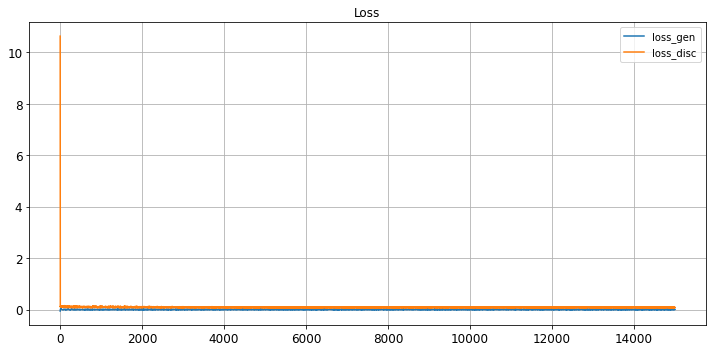

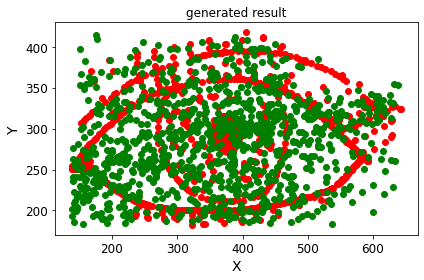

save the model & result
Epoch 15001/100000
critic: 0.083985 - generator: -0.002509 - 0s
Epoch 15002/100000
critic: 0.080597 - generator: -0.003876 - 0s
Epoch 15003/100000
critic: 0.097714 - generator: -0.002198 - 0s
Epoch 15004/100000
critic: 0.074485 - generator: -0.004471 - 0s
Epoch 15005/100000
critic: 0.083555 - generator: -0.000202 - 0s
Epoch 15006/100000
critic: 0.084420 - generator: 0.000334 - 0s
Epoch 15007/100000
critic: 0.086922 - generator: -0.001420 - 0s
Epoch 15008/100000
critic: 0.084732 - generator: 0.000373 - 0s
Epoch 15009/100000
critic: 0.072892 - generator: -0.001146 - 0s
Epoch 15010/100000
critic: 0.078825 - generator: -0.000294 - 0s
Epoch 15011/100000
critic: 0.089439 - generator: 0.002157 - 0s
Epoch 15012/100000
critic: 0.083158 - generator: -0.003981 - 0s
Epoch 15013/100000
critic: 0.069751 - generator: -0.000134 - 0s
Epoch 15014/100000
critic: 0.092258 - generator: -0.002366 - 0s
Epoch 15015/100000
critic: 0.089276 - generator: 0.000948 - 0s
Epoch 15016/100000
c

critic: 0.081145 - generator: -0.002307 - 0s
Epoch 15131/100000
critic: 0.084004 - generator: 0.003414 - 0s
Epoch 15132/100000
critic: 0.081506 - generator: 0.002162 - 0s
Epoch 15133/100000
critic: 0.090405 - generator: 0.002906 - 0s
Epoch 15134/100000
critic: 0.086041 - generator: 0.000752 - 0s
Epoch 15135/100000
critic: 0.083786 - generator: -0.000321 - 0s
Epoch 15136/100000
critic: 0.079933 - generator: -0.002896 - 0s
Epoch 15137/100000
critic: 0.080948 - generator: -0.001723 - 0s
Epoch 15138/100000
critic: 0.080486 - generator: -0.001654 - 0s
Epoch 15139/100000
critic: 0.082627 - generator: -0.002559 - 0s
Epoch 15140/100000
critic: 0.082355 - generator: -0.000513 - 0s
Epoch 15141/100000
critic: 0.082136 - generator: -0.001031 - 0s
Epoch 15142/100000
critic: 0.084883 - generator: 0.000993 - 0s
Epoch 15143/100000
critic: 0.082063 - generator: -0.000219 - 0s
Epoch 15144/100000
critic: 0.078221 - generator: -0.000178 - 0s
Epoch 15145/100000
critic: 0.072581 - generator: -0.000988 - 0s


critic: 0.069746 - generator: 0.000848 - 0s
Epoch 15261/100000
critic: 0.086650 - generator: 0.003736 - 0s
Epoch 15262/100000
critic: 0.079644 - generator: 0.001374 - 0s
Epoch 15263/100000
critic: 0.076800 - generator: 0.000691 - 0s
Epoch 15264/100000
critic: 0.089112 - generator: -0.000597 - 0s
Epoch 15265/100000
critic: 0.081651 - generator: 0.000822 - 0s
Epoch 15266/100000
critic: 0.086552 - generator: -0.000177 - 0s
Epoch 15267/100000
critic: 0.080788 - generator: 0.003944 - 0s
Epoch 15268/100000
critic: 0.085320 - generator: 0.000500 - 0s
Epoch 15269/100000
critic: 0.074616 - generator: 0.002178 - 0s
Epoch 15270/100000
critic: 0.087663 - generator: 0.000191 - 0s
Epoch 15271/100000
critic: 0.073819 - generator: -0.001983 - 0s
Epoch 15272/100000
critic: 0.088663 - generator: -0.001625 - 0s
Epoch 15273/100000
critic: 0.084024 - generator: 0.001464 - 0s
Epoch 15274/100000
critic: 0.076328 - generator: -0.000170 - 0s
Epoch 15275/100000
critic: 0.084611 - generator: -0.000351 - 0s
Epoch

critic: 0.081599 - generator: 0.003254 - 0s
Epoch 15391/100000
critic: 0.086700 - generator: 0.001382 - 0s
Epoch 15392/100000
critic: 0.084560 - generator: 0.001195 - 0s
Epoch 15393/100000
critic: 0.083753 - generator: -0.004369 - 0s
Epoch 15394/100000
critic: 0.092793 - generator: 0.001211 - 0s
Epoch 15395/100000
critic: 0.089298 - generator: 0.005391 - 0s
Epoch 15396/100000
critic: 0.080265 - generator: 0.003068 - 0s
Epoch 15397/100000
critic: 0.080695 - generator: -0.000418 - 0s
Epoch 15398/100000
critic: 0.075764 - generator: 0.002223 - 0s
Epoch 15399/100000
critic: 0.074137 - generator: 0.001021 - 0s
Epoch 15400/100000
critic: 0.081436 - generator: 0.002490 - 0s
Epoch 15401/100000
critic: 0.085833 - generator: 0.000594 - 0s
Epoch 15402/100000
critic: 0.075458 - generator: -0.003231 - 0s
Epoch 15403/100000
critic: 0.093303 - generator: 0.001012 - 0s
Epoch 15404/100000
critic: 0.081831 - generator: 0.001699 - 0s
Epoch 15405/100000
critic: 0.084297 - generator: -0.001642 - 0s
Epoch 1

critic: 0.077811 - generator: -0.000974 - 0s
Epoch 15521/100000
critic: 0.088558 - generator: 0.006006 - 0s
Epoch 15522/100000
critic: 0.075016 - generator: 0.002660 - 0s
Epoch 15523/100000
critic: 0.086412 - generator: 0.004143 - 0s
Epoch 15524/100000
critic: 0.075271 - generator: 0.003075 - 0s
Epoch 15525/100000
critic: 0.075047 - generator: 0.002236 - 0s
Epoch 15526/100000
critic: 0.084049 - generator: 0.001000 - 0s
Epoch 15527/100000
critic: 0.078008 - generator: 0.005575 - 0s
Epoch 15528/100000
critic: 0.085269 - generator: 0.004305 - 0s
Epoch 15529/100000
critic: 0.087298 - generator: 0.001539 - 0s
Epoch 15530/100000
critic: 0.077028 - generator: -0.000933 - 0s
Epoch 15531/100000
critic: 0.086339 - generator: 0.002617 - 0s
Epoch 15532/100000
critic: 0.082674 - generator: 0.003936 - 0s
Epoch 15533/100000
critic: 0.079530 - generator: 0.000205 - 0s
Epoch 15534/100000
critic: 0.080336 - generator: 0.000475 - 0s
Epoch 15535/100000
critic: 0.076967 - generator: -0.000828 - 0s
Epoch 15

critic: 0.083639 - generator: 0.002094 - 0s
Epoch 15651/100000
critic: 0.083891 - generator: 0.002024 - 0s
Epoch 15652/100000
critic: 0.086252 - generator: 0.000138 - 0s
Epoch 15653/100000
critic: 0.074510 - generator: -0.001248 - 0s
Epoch 15654/100000
critic: 0.095769 - generator: 0.000750 - 0s
Epoch 15655/100000
critic: 0.073385 - generator: -0.000409 - 0s
Epoch 15656/100000
critic: 0.079528 - generator: -0.002089 - 0s
Epoch 15657/100000
critic: 0.079454 - generator: 0.000100 - 0s
Epoch 15658/100000
critic: 0.078969 - generator: -0.000142 - 0s
Epoch 15659/100000
critic: 0.086521 - generator: 0.001324 - 0s
Epoch 15660/100000
critic: 0.084389 - generator: -0.003134 - 0s
Epoch 15661/100000
critic: 0.082682 - generator: 0.001953 - 0s
Epoch 15662/100000
critic: 0.082407 - generator: -0.001639 - 0s
Epoch 15663/100000
critic: 0.087975 - generator: -0.000625 - 0s
Epoch 15664/100000
critic: 0.075455 - generator: -0.002991 - 0s
Epoch 15665/100000
critic: 0.086339 - generator: -0.000008 - 0s
Ep

critic: 0.096343 - generator: 0.002700 - 0s
Epoch 15781/100000
critic: 0.084290 - generator: 0.001316 - 0s
Epoch 15782/100000
critic: 0.075683 - generator: -0.001263 - 0s
Epoch 15783/100000
critic: 0.077784 - generator: 0.002692 - 0s
Epoch 15784/100000
critic: 0.084477 - generator: -0.001170 - 0s
Epoch 15785/100000
critic: 0.072635 - generator: 0.000171 - 0s
Epoch 15786/100000
critic: 0.085420 - generator: -0.000004 - 0s
Epoch 15787/100000
critic: 0.072389 - generator: -0.002250 - 0s
Epoch 15788/100000
critic: 0.074575 - generator: 0.003379 - 0s
Epoch 15789/100000
critic: 0.084780 - generator: -0.000518 - 0s
Epoch 15790/100000
critic: 0.093827 - generator: 0.002878 - 0s
Epoch 15791/100000
critic: 0.076595 - generator: 0.000431 - 0s
Epoch 15792/100000
critic: 0.083789 - generator: -0.000674 - 0s
Epoch 15793/100000
critic: 0.079144 - generator: 0.002025 - 0s
Epoch 15794/100000
critic: 0.091661 - generator: -0.000022 - 0s
Epoch 15795/100000
critic: 0.083710 - generator: -0.001364 - 0s
Epo

critic: 0.082379 - generator: -0.000008 - 0s
Epoch 15911/100000
critic: 0.084751 - generator: 0.000937 - 0s
Epoch 15912/100000
critic: 0.085225 - generator: -0.003357 - 0s
Epoch 15913/100000
critic: 0.088390 - generator: -0.002218 - 0s
Epoch 15914/100000
critic: 0.090043 - generator: -0.001445 - 0s
Epoch 15915/100000
critic: 0.076781 - generator: -0.000359 - 0s
Epoch 15916/100000
critic: 0.088171 - generator: -0.005233 - 0s
Epoch 15917/100000
critic: 0.081757 - generator: -0.002444 - 0s
Epoch 15918/100000
critic: 0.084409 - generator: -0.002527 - 0s
Epoch 15919/100000
critic: 0.076770 - generator: -0.004146 - 0s
Epoch 15920/100000
critic: 0.082240 - generator: -0.003384 - 0s
Epoch 15921/100000
critic: 0.080105 - generator: -0.001512 - 0s
Epoch 15922/100000
critic: 0.088901 - generator: 0.002134 - 0s
Epoch 15923/100000
critic: 0.083406 - generator: 0.002944 - 0s
Epoch 15924/100000
critic: 0.082407 - generator: -0.000696 - 0s
Epoch 15925/100000
critic: 0.082485 - generator: 0.002412 - 0s

critic: 0.074907 - generator: -0.001431 - 0s
Epoch 16041/100000
critic: 0.084799 - generator: -0.000226 - 0s
Epoch 16042/100000
critic: 0.078807 - generator: 0.003972 - 0s
Epoch 16043/100000
critic: 0.083593 - generator: -0.001899 - 0s
Epoch 16044/100000
critic: 0.085541 - generator: -0.001566 - 0s
Epoch 16045/100000
critic: 0.083695 - generator: 0.001281 - 0s
Epoch 16046/100000
critic: 0.082925 - generator: 0.002375 - 0s
Epoch 16047/100000
critic: 0.079827 - generator: -0.004684 - 0s
Epoch 16048/100000
critic: 0.081179 - generator: 0.001250 - 0s
Epoch 16049/100000
critic: 0.077606 - generator: 0.002263 - 0s
Epoch 16050/100000
critic: 0.080294 - generator: 0.000045 - 0s
Epoch 16051/100000
critic: 0.079446 - generator: 0.001665 - 0s
Epoch 16052/100000
critic: 0.082513 - generator: 0.002724 - 0s
Epoch 16053/100000
critic: 0.077525 - generator: 0.002120 - 0s
Epoch 16054/100000
critic: 0.084264 - generator: 0.000020 - 0s
Epoch 16055/100000
critic: 0.080662 - generator: 0.000611 - 0s
Epoch 

critic: 0.076246 - generator: 0.001557 - 0s
Epoch 16171/100000
critic: 0.077628 - generator: -0.000362 - 0s
Epoch 16172/100000
critic: 0.084489 - generator: 0.002154 - 0s
Epoch 16173/100000
critic: 0.081809 - generator: -0.000869 - 0s
Epoch 16174/100000
critic: 0.073224 - generator: 0.000689 - 0s
Epoch 16175/100000
critic: 0.079943 - generator: -0.001691 - 0s
Epoch 16176/100000
critic: 0.093546 - generator: -0.001981 - 0s
Epoch 16177/100000
critic: 0.073353 - generator: -0.005271 - 0s
Epoch 16178/100000
critic: 0.078201 - generator: 0.003323 - 0s
Epoch 16179/100000
critic: 0.069364 - generator: -0.001081 - 0s
Epoch 16180/100000
critic: 0.081596 - generator: -0.000499 - 0s
Epoch 16181/100000
critic: 0.081364 - generator: -0.000172 - 0s
Epoch 16182/100000
critic: 0.083276 - generator: -0.002126 - 0s
Epoch 16183/100000
critic: 0.084183 - generator: 0.002265 - 0s
Epoch 16184/100000
critic: 0.080940 - generator: 0.000275 - 0s
Epoch 16185/100000
critic: 0.073217 - generator: 0.000955 - 0s
Ep

critic: 0.082847 - generator: -0.004296 - 0s
Epoch 16301/100000
critic: 0.074034 - generator: -0.001123 - 0s
Epoch 16302/100000
critic: 0.081855 - generator: -0.001027 - 0s
Epoch 16303/100000
critic: 0.085034 - generator: -0.001838 - 0s
Epoch 16304/100000
critic: 0.080095 - generator: 0.000797 - 0s
Epoch 16305/100000
critic: 0.084148 - generator: -0.002493 - 0s
Epoch 16306/100000
critic: 0.088892 - generator: -0.003868 - 0s
Epoch 16307/100000
critic: 0.087758 - generator: 0.003422 - 0s
Epoch 16308/100000
critic: 0.080483 - generator: -0.000961 - 0s
Epoch 16309/100000
critic: 0.076091 - generator: -0.001505 - 0s
Epoch 16310/100000
critic: 0.078155 - generator: 0.003180 - 0s
Epoch 16311/100000
critic: 0.084559 - generator: -0.000562 - 0s
Epoch 16312/100000
critic: 0.091840 - generator: -0.001901 - 0s
Epoch 16313/100000
critic: 0.078427 - generator: -0.002081 - 0s
Epoch 16314/100000
critic: 0.083685 - generator: 0.001448 - 0s
Epoch 16315/100000
critic: 0.078118 - generator: -0.002519 - 0s

critic: 0.090850 - generator: 0.002126 - 0s
Epoch 16431/100000
critic: 0.079850 - generator: 0.001225 - 0s
Epoch 16432/100000
critic: 0.082264 - generator: -0.002093 - 0s
Epoch 16433/100000
critic: 0.076006 - generator: -0.001056 - 0s
Epoch 16434/100000
critic: 0.092754 - generator: 0.000736 - 0s
Epoch 16435/100000
critic: 0.074550 - generator: -0.000915 - 0s
Epoch 16436/100000
critic: 0.095621 - generator: -0.002455 - 0s
Epoch 16437/100000
critic: 0.073818 - generator: 0.001773 - 0s
Epoch 16438/100000
critic: 0.079006 - generator: -0.000097 - 0s
Epoch 16439/100000
critic: 0.085164 - generator: -0.000355 - 0s
Epoch 16440/100000
critic: 0.086625 - generator: 0.001118 - 0s
Epoch 16441/100000
critic: 0.074664 - generator: 0.000842 - 0s
Epoch 16442/100000
critic: 0.085311 - generator: 0.000444 - 0s
Epoch 16443/100000
critic: 0.085985 - generator: 0.002689 - 0s
Epoch 16444/100000
critic: 0.078502 - generator: 0.004431 - 0s
Epoch 16445/100000
critic: 0.073093 - generator: -0.000529 - 0s
Epoc

critic: 0.083617 - generator: -0.005239 - 0s
Epoch 16560/100000
critic: 0.080822 - generator: -0.002338 - 0s
Epoch 16561/100000
critic: 0.073209 - generator: 0.002754 - 0s
Epoch 16562/100000
critic: 0.076626 - generator: -0.001983 - 0s
Epoch 16563/100000
critic: 0.094529 - generator: -0.001798 - 0s
Epoch 16564/100000
critic: 0.084344 - generator: -0.001888 - 0s
Epoch 16565/100000
critic: 0.078342 - generator: -0.001279 - 0s
Epoch 16566/100000
critic: 0.080064 - generator: -0.000121 - 0s
Epoch 16567/100000
critic: 0.089523 - generator: 0.000445 - 0s
Epoch 16568/100000
critic: 0.082930 - generator: -0.000657 - 0s
Epoch 16569/100000
critic: 0.083169 - generator: 0.001460 - 0s
Epoch 16570/100000
critic: 0.089357 - generator: -0.004183 - 0s
Epoch 16571/100000
critic: 0.092600 - generator: -0.000807 - 0s
Epoch 16572/100000
critic: 0.077648 - generator: -0.000412 - 0s
Epoch 16573/100000
critic: 0.067608 - generator: 0.000595 - 0s
Epoch 16574/100000
critic: 0.082555 - generator: -0.000125 - 0s

critic: 0.071927 - generator: 0.000771 - 0s
Epoch 16689/100000
critic: 0.084353 - generator: -0.000428 - 0s
Epoch 16690/100000
critic: 0.077975 - generator: -0.000051 - 0s
Epoch 16691/100000
critic: 0.080438 - generator: -0.001272 - 0s
Epoch 16692/100000
critic: 0.081262 - generator: 0.001153 - 0s
Epoch 16693/100000
critic: 0.080261 - generator: -0.002150 - 0s
Epoch 16694/100000
critic: 0.092459 - generator: -0.002308 - 0s
Epoch 16695/100000
critic: 0.079100 - generator: -0.001079 - 0s
Epoch 16696/100000
critic: 0.077979 - generator: 0.000152 - 0s
Epoch 16697/100000
critic: 0.087286 - generator: -0.001845 - 0s
Epoch 16698/100000
critic: 0.086219 - generator: -0.001657 - 0s
Epoch 16699/100000
critic: 0.070275 - generator: -0.000517 - 0s
Epoch 16700/100000
critic: 0.087281 - generator: -0.002022 - 0s
Epoch 16701/100000
critic: 0.084064 - generator: 0.000464 - 0s
Epoch 16702/100000
critic: 0.086797 - generator: 0.000412 - 0s
Epoch 16703/100000
critic: 0.075508 - generator: -0.001496 - 0s


critic: 0.079703 - generator: 0.000012 - 0s
Epoch 16819/100000
critic: 0.083511 - generator: -0.006073 - 0s
Epoch 16820/100000
critic: 0.079430 - generator: 0.000009 - 0s
Epoch 16821/100000
critic: 0.079994 - generator: -0.000545 - 0s
Epoch 16822/100000
critic: 0.081475 - generator: -0.004477 - 0s
Epoch 16823/100000
critic: 0.074349 - generator: -0.002601 - 0s
Epoch 16824/100000
critic: 0.079410 - generator: 0.001238 - 0s
Epoch 16825/100000
critic: 0.097012 - generator: 0.001498 - 0s
Epoch 16826/100000
critic: 0.086372 - generator: 0.000207 - 0s
Epoch 16827/100000
critic: 0.081005 - generator: -0.000616 - 0s
Epoch 16828/100000
critic: 0.074359 - generator: 0.001813 - 0s
Epoch 16829/100000
critic: 0.073937 - generator: 0.000123 - 0s
Epoch 16830/100000
critic: 0.073144 - generator: 0.000258 - 0s
Epoch 16831/100000
critic: 0.089807 - generator: -0.001504 - 0s
Epoch 16832/100000
critic: 0.080784 - generator: 0.000177 - 0s
Epoch 16833/100000
critic: 0.083801 - generator: 0.003987 - 0s
Epoch

critic: 0.078153 - generator: 0.000023 - 0s
Epoch 16949/100000
critic: 0.087155 - generator: -0.000381 - 0s
Epoch 16950/100000
critic: 0.087071 - generator: 0.000639 - 0s
Epoch 16951/100000
critic: 0.082039 - generator: 0.001035 - 0s
Epoch 16952/100000
critic: 0.074046 - generator: -0.001762 - 0s
Epoch 16953/100000
critic: 0.091321 - generator: -0.000457 - 0s
Epoch 16954/100000
critic: 0.084283 - generator: -0.004970 - 0s
Epoch 16955/100000
critic: 0.085743 - generator: -0.002323 - 0s
Epoch 16956/100000
critic: 0.082192 - generator: -0.000924 - 0s
Epoch 16957/100000
critic: 0.092908 - generator: 0.000404 - 0s
Epoch 16958/100000
critic: 0.082801 - generator: -0.000886 - 0s
Epoch 16959/100000
critic: 0.083382 - generator: -0.004795 - 0s
Epoch 16960/100000
critic: 0.081861 - generator: 0.000148 - 0s
Epoch 16961/100000
critic: 0.083793 - generator: -0.000521 - 0s
Epoch 16962/100000
critic: 0.089378 - generator: -0.003130 - 0s
Epoch 16963/100000
critic: 0.085007 - generator: -0.004310 - 0s


critic: 0.074430 - generator: -0.004903 - 0s
Epoch 17079/100000
critic: 0.089144 - generator: -0.002072 - 0s
Epoch 17080/100000
critic: 0.089393 - generator: -0.004002 - 0s
Epoch 17081/100000
critic: 0.085685 - generator: -0.004807 - 0s
Epoch 17082/100000
critic: 0.079690 - generator: -0.003943 - 0s
Epoch 17083/100000
critic: 0.082440 - generator: 0.000202 - 0s
Epoch 17084/100000
critic: 0.079568 - generator: -0.004118 - 0s
Epoch 17085/100000
critic: 0.077514 - generator: 0.002109 - 0s
Epoch 17086/100000
critic: 0.084216 - generator: 0.000127 - 0s
Epoch 17087/100000
critic: 0.083596 - generator: -0.001463 - 0s
Epoch 17088/100000
critic: 0.081566 - generator: -0.000438 - 0s
Epoch 17089/100000
critic: 0.097612 - generator: -0.003791 - 0s
Epoch 17090/100000
critic: 0.081314 - generator: 0.001047 - 0s
Epoch 17091/100000
critic: 0.076228 - generator: -0.000803 - 0s
Epoch 17092/100000
critic: 0.095442 - generator: -0.003075 - 0s
Epoch 17093/100000
critic: 0.075807 - generator: -0.001874 - 0s

critic: 0.082900 - generator: 0.001748 - 0s
Epoch 17209/100000
critic: 0.077552 - generator: -0.001960 - 0s
Epoch 17210/100000
critic: 0.079145 - generator: -0.001882 - 0s
Epoch 17211/100000
critic: 0.082028 - generator: 0.000829 - 0s
Epoch 17212/100000
critic: 0.088066 - generator: -0.000121 - 0s
Epoch 17213/100000
critic: 0.089257 - generator: -0.001280 - 0s
Epoch 17214/100000
critic: 0.078505 - generator: 0.001160 - 0s
Epoch 17215/100000
critic: 0.083288 - generator: 0.004049 - 0s
Epoch 17216/100000
critic: 0.085922 - generator: 0.000993 - 0s
Epoch 17217/100000
critic: 0.084923 - generator: 0.003711 - 0s
Epoch 17218/100000
critic: 0.086974 - generator: -0.000248 - 0s
Epoch 17219/100000
critic: 0.077318 - generator: 0.000816 - 0s
Epoch 17220/100000
critic: 0.086792 - generator: -0.002670 - 0s
Epoch 17221/100000
critic: 0.088893 - generator: 0.001725 - 0s
Epoch 17222/100000
critic: 0.086440 - generator: 0.001898 - 0s
Epoch 17223/100000
critic: 0.078407 - generator: -0.000380 - 0s
Epoc

critic: 0.074116 - generator: -0.000138 - 0s
Epoch 17339/100000
critic: 0.088928 - generator: -0.000242 - 0s
Epoch 17340/100000
critic: 0.078541 - generator: 0.002724 - 0s
Epoch 17341/100000
critic: 0.079540 - generator: -0.000547 - 0s
Epoch 17342/100000
critic: 0.087423 - generator: -0.001555 - 0s
Epoch 17343/100000
critic: 0.082876 - generator: -0.001316 - 0s
Epoch 17344/100000
critic: 0.079707 - generator: -0.001549 - 0s
Epoch 17345/100000
critic: 0.079010 - generator: 0.003417 - 0s
Epoch 17346/100000
critic: 0.080370 - generator: -0.002342 - 0s
Epoch 17347/100000
critic: 0.075479 - generator: -0.004538 - 0s
Epoch 17348/100000
critic: 0.081377 - generator: -0.002958 - 0s
Epoch 17349/100000
critic: 0.083156 - generator: -0.002803 - 0s
Epoch 17350/100000
critic: 0.089919 - generator: -0.003190 - 0s
Epoch 17351/100000
critic: 0.084334 - generator: -0.000296 - 0s
Epoch 17352/100000
critic: 0.083113 - generator: 0.002152 - 0s
Epoch 17353/100000
critic: 0.078303 - generator: -0.000000 - 0

critic: 0.081527 - generator: -0.000577 - 0s
Epoch 17469/100000
critic: 0.085658 - generator: 0.002234 - 0s
Epoch 17470/100000
critic: 0.082920 - generator: -0.002778 - 0s
Epoch 17471/100000
critic: 0.080538 - generator: 0.002213 - 0s
Epoch 17472/100000
critic: 0.077729 - generator: -0.001533 - 0s
Epoch 17473/100000
critic: 0.074495 - generator: 0.002260 - 0s
Epoch 17474/100000
critic: 0.088673 - generator: 0.002301 - 0s
Epoch 17475/100000
critic: 0.081135 - generator: -0.003859 - 0s
Epoch 17476/100000
critic: 0.075735 - generator: 0.002232 - 0s
Epoch 17477/100000
critic: 0.079730 - generator: 0.001067 - 0s
Epoch 17478/100000
critic: 0.087114 - generator: 0.001411 - 0s
Epoch 17479/100000
critic: 0.074963 - generator: -0.001030 - 0s
Epoch 17480/100000
critic: 0.075807 - generator: 0.001933 - 0s
Epoch 17481/100000
critic: 0.079651 - generator: -0.002250 - 0s
Epoch 17482/100000
critic: 0.078415 - generator: -0.004871 - 0s
Epoch 17483/100000
critic: 0.071348 - generator: -0.000861 - 0s
Epo

critic: 0.084073 - generator: 0.001467 - 0s
Epoch 17599/100000
critic: 0.085078 - generator: 0.000540 - 0s
Epoch 17600/100000
critic: 0.076744 - generator: 0.002346 - 0s
Epoch 17601/100000
critic: 0.077297 - generator: -0.001348 - 0s
Epoch 17602/100000
critic: 0.086700 - generator: -0.003157 - 0s
Epoch 17603/100000
critic: 0.079621 - generator: -0.003876 - 0s
Epoch 17604/100000
critic: 0.080832 - generator: -0.001193 - 0s
Epoch 17605/100000
critic: 0.086800 - generator: 0.000177 - 0s
Epoch 17606/100000
critic: 0.079205 - generator: 0.003579 - 0s
Epoch 17607/100000
critic: 0.071864 - generator: 0.001084 - 0s
Epoch 17608/100000
critic: 0.074909 - generator: -0.003276 - 0s
Epoch 17609/100000
critic: 0.090859 - generator: -0.003308 - 0s
Epoch 17610/100000
critic: 0.084454 - generator: -0.002091 - 0s
Epoch 17611/100000
critic: 0.074994 - generator: -0.002849 - 0s
Epoch 17612/100000
critic: 0.078593 - generator: -0.000614 - 0s
Epoch 17613/100000
critic: 0.086949 - generator: -0.000606 - 0s
E

critic: 0.076561 - generator: -0.000362 - 0s
Epoch 17728/100000
critic: 0.079467 - generator: 0.000088 - 0s
Epoch 17729/100000
critic: 0.076278 - generator: -0.001488 - 0s
Epoch 17730/100000
critic: 0.075837 - generator: -0.000973 - 0s
Epoch 17731/100000
critic: 0.096645 - generator: 0.001451 - 0s
Epoch 17732/100000
critic: 0.077387 - generator: 0.002556 - 0s
Epoch 17733/100000
critic: 0.083092 - generator: 0.002029 - 0s
Epoch 17734/100000
critic: 0.085568 - generator: 0.005899 - 0s
Epoch 17735/100000
critic: 0.075940 - generator: -0.000808 - 0s
Epoch 17736/100000
critic: 0.093696 - generator: -0.000444 - 0s
Epoch 17737/100000
critic: 0.085603 - generator: 0.000591 - 0s
Epoch 17738/100000
critic: 0.086674 - generator: -0.000908 - 0s
Epoch 17739/100000
critic: 0.080938 - generator: 0.002796 - 0s
Epoch 17740/100000
critic: 0.082003 - generator: 0.001764 - 0s
Epoch 17741/100000
critic: 0.076378 - generator: -0.000659 - 0s
Epoch 17742/100000
critic: 0.072983 - generator: -0.004205 - 0s
Epo

critic: 0.080978 - generator: -0.000232 - 0s
Epoch 17857/100000
critic: 0.087740 - generator: 0.000300 - 0s
Epoch 17858/100000
critic: 0.078713 - generator: 0.003133 - 0s
Epoch 17859/100000
critic: 0.073557 - generator: 0.000163 - 0s
Epoch 17860/100000
critic: 0.090698 - generator: 0.003392 - 0s
Epoch 17861/100000
critic: 0.085054 - generator: 0.000788 - 0s
Epoch 17862/100000
critic: 0.080395 - generator: -0.003690 - 0s
Epoch 17863/100000
critic: 0.093613 - generator: -0.001020 - 0s
Epoch 17864/100000
critic: 0.082647 - generator: 0.000895 - 0s
Epoch 17865/100000
critic: 0.082152 - generator: 0.003019 - 0s
Epoch 17866/100000
critic: 0.079635 - generator: -0.001041 - 0s
Epoch 17867/100000
critic: 0.086099 - generator: 0.001407 - 0s
Epoch 17868/100000
critic: 0.080601 - generator: 0.001128 - 0s
Epoch 17869/100000
critic: 0.082243 - generator: 0.000343 - 0s
Epoch 17870/100000
critic: 0.087777 - generator: 0.002250 - 0s
Epoch 17871/100000
critic: 0.085500 - generator: -0.002900 - 0s
Epoch 

critic: 0.085550 - generator: -0.002999 - 0s
Epoch 17988/100000
critic: 0.084928 - generator: -0.003191 - 0s
Epoch 17989/100000
critic: 0.073879 - generator: -0.000327 - 0s
Epoch 17990/100000
critic: 0.093388 - generator: -0.000936 - 0s
Epoch 17991/100000
critic: 0.089209 - generator: -0.001246 - 0s
Epoch 17992/100000
critic: 0.079543 - generator: 0.000431 - 0s
Epoch 17993/100000
critic: 0.068300 - generator: -0.000155 - 0s
Epoch 17994/100000
critic: 0.074650 - generator: 0.002895 - 0s
Epoch 17995/100000
critic: 0.073435 - generator: 0.001507 - 0s
Epoch 17996/100000
critic: 0.080724 - generator: -0.001889 - 0s
Epoch 17997/100000
critic: 0.084313 - generator: -0.000852 - 0s
Epoch 17998/100000
critic: 0.086325 - generator: 0.001054 - 0s
Epoch 17999/100000
critic: 0.084392 - generator: -0.000556 - 0s
Epoch 18000/100000
critic: 0.087799 - generator: 0.004724 - 0s
Epoch 18001/100000
critic: 0.087636 - generator: 0.002588 - 0s
Epoch 18002/100000
critic: 0.082011 - generator: 0.003899 - 0s
Ep

critic: 0.092167 - generator: -0.003597 - 0s
Epoch 18118/100000
critic: 0.071484 - generator: 0.001077 - 0s
Epoch 18119/100000
critic: 0.089097 - generator: 0.002658 - 0s
Epoch 18120/100000
critic: 0.084392 - generator: -0.000804 - 0s
Epoch 18121/100000
critic: 0.078183 - generator: 0.000823 - 0s
Epoch 18122/100000
critic: 0.091352 - generator: -0.002522 - 0s
Epoch 18123/100000
critic: 0.082247 - generator: 0.000558 - 0s
Epoch 18124/100000
critic: 0.084902 - generator: -0.001341 - 0s
Epoch 18125/100000
critic: 0.095333 - generator: -0.002564 - 0s
Epoch 18126/100000
critic: 0.083547 - generator: -0.002049 - 0s
Epoch 18127/100000
critic: 0.083612 - generator: -0.002207 - 0s
Epoch 18128/100000
critic: 0.073901 - generator: -0.002501 - 0s
Epoch 18129/100000
critic: 0.080513 - generator: -0.003232 - 0s
Epoch 18130/100000
critic: 0.083889 - generator: -0.000659 - 0s
Epoch 18131/100000
critic: 0.087713 - generator: 0.002671 - 0s
Epoch 18132/100000
critic: 0.079341 - generator: -0.001572 - 0s


critic: 0.076522 - generator: 0.002285 - 0s
Epoch 18247/100000
critic: 0.093579 - generator: -0.001810 - 0s
Epoch 18248/100000
critic: 0.082178 - generator: -0.005098 - 0s
Epoch 18249/100000
critic: 0.076431 - generator: -0.001148 - 0s
Epoch 18250/100000
critic: 0.077934 - generator: -0.002252 - 0s
Epoch 18251/100000
critic: 0.087250 - generator: -0.002221 - 0s
Epoch 18252/100000
critic: 0.082658 - generator: -0.001838 - 0s
Epoch 18253/100000
critic: 0.085869 - generator: -0.001362 - 0s
Epoch 18254/100000
critic: 0.084138 - generator: -0.002364 - 0s
Epoch 18255/100000
critic: 0.095894 - generator: 0.000315 - 0s
Epoch 18256/100000
critic: 0.085789 - generator: 0.001313 - 0s
Epoch 18257/100000
critic: 0.078362 - generator: 0.000591 - 0s
Epoch 18258/100000
critic: 0.068952 - generator: -0.000582 - 0s
Epoch 18259/100000
critic: 0.076929 - generator: -0.000922 - 0s
Epoch 18260/100000
critic: 0.074753 - generator: 0.000698 - 0s
Epoch 18261/100000
critic: 0.083230 - generator: 0.000922 - 0s
E

critic: 0.098406 - generator: 0.000333 - 0s
Epoch 18376/100000
critic: 0.074320 - generator: 0.000467 - 0s
Epoch 18377/100000
critic: 0.087054 - generator: -0.001951 - 0s
Epoch 18378/100000
critic: 0.085273 - generator: 0.000055 - 0s
Epoch 18379/100000
critic: 0.083171 - generator: 0.003630 - 0s
Epoch 18380/100000
critic: 0.084439 - generator: -0.000380 - 0s
Epoch 18381/100000
critic: 0.078397 - generator: 0.001239 - 0s
Epoch 18382/100000
critic: 0.085025 - generator: 0.001002 - 0s
Epoch 18383/100000
critic: 0.080536 - generator: -0.001741 - 0s
Epoch 18384/100000
critic: 0.078250 - generator: -0.001760 - 0s
Epoch 18385/100000
critic: 0.091267 - generator: -0.003246 - 0s
Epoch 18386/100000
critic: 0.072993 - generator: 0.004025 - 0s
Epoch 18387/100000
critic: 0.074967 - generator: 0.003428 - 0s
Epoch 18388/100000
critic: 0.083659 - generator: 0.000413 - 0s
Epoch 18389/100000
critic: 0.078223 - generator: 0.004433 - 0s
Epoch 18390/100000
critic: 0.073216 - generator: -0.004527 - 0s
Epoch

critic: 0.083672 - generator: 0.002023 - 0s
Epoch 18506/100000
critic: 0.086000 - generator: -0.000388 - 0s
Epoch 18507/100000
critic: 0.084092 - generator: 0.000880 - 0s
Epoch 18508/100000
critic: 0.072171 - generator: 0.002302 - 0s
Epoch 18509/100000
critic: 0.096556 - generator: 0.004061 - 0s
Epoch 18510/100000
critic: 0.078536 - generator: 0.003084 - 0s
Epoch 18511/100000
critic: 0.083881 - generator: 0.004842 - 0s
Epoch 18512/100000
critic: 0.081729 - generator: 0.003977 - 0s
Epoch 18513/100000
critic: 0.076893 - generator: -0.001186 - 0s
Epoch 18514/100000
critic: 0.067113 - generator: -0.001344 - 0s
Epoch 18515/100000
critic: 0.078370 - generator: 0.002384 - 0s
Epoch 18516/100000
critic: 0.071277 - generator: -0.000893 - 0s
Epoch 18517/100000
critic: 0.093051 - generator: 0.001849 - 0s
Epoch 18518/100000
critic: 0.078668 - generator: 0.001604 - 0s
Epoch 18519/100000
critic: 0.078586 - generator: -0.000742 - 0s
Epoch 18520/100000
critic: 0.075818 - generator: -0.001581 - 0s
Epoch

critic: 0.077709 - generator: 0.000141 - 0s
Epoch 18637/100000
critic: 0.082678 - generator: -0.004124 - 0s
Epoch 18638/100000
critic: 0.079514 - generator: -0.001638 - 0s
Epoch 18639/100000
critic: 0.081671 - generator: 0.001758 - 0s
Epoch 18640/100000
critic: 0.088561 - generator: 0.000275 - 0s
Epoch 18641/100000
critic: 0.075778 - generator: 0.002813 - 0s
Epoch 18642/100000
critic: 0.075270 - generator: 0.002908 - 0s
Epoch 18643/100000
critic: 0.085943 - generator: 0.002052 - 0s
Epoch 18644/100000
critic: 0.069709 - generator: -0.001236 - 0s
Epoch 18645/100000
critic: 0.085408 - generator: -0.003602 - 0s
Epoch 18646/100000
critic: 0.090237 - generator: -0.002414 - 0s
Epoch 18647/100000
critic: 0.075461 - generator: -0.001877 - 0s
Epoch 18648/100000
critic: 0.079754 - generator: 0.002895 - 0s
Epoch 18649/100000
critic: 0.076374 - generator: -0.001371 - 0s
Epoch 18650/100000
critic: 0.076694 - generator: -0.002492 - 0s
Epoch 18651/100000
critic: 0.083898 - generator: -0.002325 - 0s
Ep

critic: 0.077401 - generator: 0.000788 - 0s
Epoch 18766/100000
critic: 0.083685 - generator: 0.000472 - 0s
Epoch 18767/100000
critic: 0.078632 - generator: -0.003687 - 0s
Epoch 18768/100000
critic: 0.082527 - generator: -0.002931 - 0s
Epoch 18769/100000
critic: 0.091969 - generator: -0.002432 - 0s
Epoch 18770/100000
critic: 0.085817 - generator: -0.000574 - 0s
Epoch 18771/100000
critic: 0.085802 - generator: -0.000681 - 0s
Epoch 18772/100000
critic: 0.061960 - generator: 0.003062 - 0s
Epoch 18773/100000
critic: 0.084759 - generator: 0.002358 - 0s
Epoch 18774/100000
critic: 0.082504 - generator: 0.000940 - 0s
Epoch 18775/100000
critic: 0.083820 - generator: -0.000431 - 0s
Epoch 18776/100000
critic: 0.070909 - generator: -0.001498 - 0s
Epoch 18777/100000
critic: 0.085462 - generator: 0.001923 - 0s
Epoch 18778/100000
critic: 0.083681 - generator: -0.000986 - 0s
Epoch 18779/100000
critic: 0.087381 - generator: -0.000988 - 0s
Epoch 18780/100000
critic: 0.086243 - generator: 0.001733 - 0s
Ep

critic: 0.073895 - generator: -0.002238 - 0s
Epoch 18895/100000
critic: 0.068464 - generator: -0.002988 - 0s
Epoch 18896/100000
critic: 0.069266 - generator: -0.001927 - 0s
Epoch 18897/100000
critic: 0.080392 - generator: 0.000950 - 0s
Epoch 18898/100000
critic: 0.084635 - generator: 0.001237 - 0s
Epoch 18899/100000
critic: 0.078217 - generator: -0.001207 - 0s
Epoch 18900/100000
critic: 0.083331 - generator: -0.002661 - 0s
Epoch 18901/100000
critic: 0.077412 - generator: 0.000004 - 0s
Epoch 18902/100000
critic: 0.081022 - generator: 0.000085 - 0s
Epoch 18903/100000
critic: 0.073219 - generator: 0.002548 - 0s
Epoch 18904/100000
critic: 0.074745 - generator: 0.001807 - 0s
Epoch 18905/100000
critic: 0.086861 - generator: 0.002499 - 0s
Epoch 18906/100000
critic: 0.094397 - generator: -0.001652 - 0s
Epoch 18907/100000
critic: 0.071319 - generator: -0.000744 - 0s
Epoch 18908/100000
critic: 0.086959 - generator: -0.002194 - 0s
Epoch 18909/100000
critic: 0.081708 - generator: 0.000523 - 0s
Epo

critic: 0.091616 - generator: -0.000150 - 0s
Epoch 19025/100000
critic: 0.080538 - generator: 0.002731 - 0s
Epoch 19026/100000
critic: 0.072342 - generator: 0.000671 - 0s
Epoch 19027/100000
critic: 0.090328 - generator: -0.003642 - 0s
Epoch 19028/100000
critic: 0.073657 - generator: 0.007121 - 0s
Epoch 19029/100000
critic: 0.075699 - generator: 0.005582 - 0s
Epoch 19030/100000
critic: 0.081103 - generator: 0.001995 - 0s
Epoch 19031/100000
critic: 0.082416 - generator: -0.001029 - 0s
Epoch 19032/100000
critic: 0.080506 - generator: 0.001867 - 0s
Epoch 19033/100000
critic: 0.070042 - generator: -0.001534 - 0s
Epoch 19034/100000
critic: 0.085617 - generator: 0.001476 - 0s
Epoch 19035/100000
critic: 0.075240 - generator: -0.000029 - 0s
Epoch 19036/100000
critic: 0.077259 - generator: -0.000682 - 0s
Epoch 19037/100000
critic: 0.081662 - generator: -0.003409 - 0s
Epoch 19038/100000
critic: 0.074699 - generator: -0.001885 - 0s
Epoch 19039/100000
critic: 0.090109 - generator: 0.000792 - 0s
Epo

critic: 0.087147 - generator: -0.001911 - 0s
Epoch 19154/100000
critic: 0.076678 - generator: -0.000151 - 0s
Epoch 19155/100000
critic: 0.077981 - generator: 0.002449 - 0s
Epoch 19156/100000
critic: 0.082103 - generator: -0.000981 - 0s
Epoch 19157/100000
critic: 0.082376 - generator: -0.000409 - 0s
Epoch 19158/100000
critic: 0.082353 - generator: -0.001451 - 0s
Epoch 19159/100000
critic: 0.075438 - generator: 0.001145 - 0s
Epoch 19160/100000
critic: 0.086100 - generator: 0.002336 - 0s
Epoch 19161/100000
critic: 0.093092 - generator: 0.001095 - 0s
Epoch 19162/100000
critic: 0.075495 - generator: 0.000584 - 0s
Epoch 19163/100000
critic: 0.083511 - generator: -0.000128 - 0s
Epoch 19164/100000
critic: 0.086227 - generator: -0.003933 - 0s
Epoch 19165/100000
critic: 0.077582 - generator: -0.005453 - 0s
Epoch 19166/100000
critic: 0.081769 - generator: -0.005627 - 0s
Epoch 19167/100000
critic: 0.094709 - generator: -0.003336 - 0s
Epoch 19168/100000
critic: 0.082207 - generator: -0.005476 - 0s


critic: 0.078544 - generator: 0.001392 - 0s
Epoch 19283/100000
critic: 0.090310 - generator: 0.000618 - 0s
Epoch 19284/100000
critic: 0.079559 - generator: -0.001407 - 0s
Epoch 19285/100000
critic: 0.074882 - generator: -0.000419 - 0s
Epoch 19286/100000
critic: 0.086766 - generator: -0.003072 - 0s
Epoch 19287/100000
critic: 0.083516 - generator: 0.000398 - 0s
Epoch 19288/100000
critic: 0.078438 - generator: -0.003628 - 0s
Epoch 19289/100000
critic: 0.098433 - generator: 0.000940 - 0s
Epoch 19290/100000
critic: 0.084044 - generator: -0.000921 - 0s
Epoch 19291/100000
critic: 0.079234 - generator: 0.001304 - 0s
Epoch 19292/100000
critic: 0.089413 - generator: 0.003471 - 0s
Epoch 19293/100000
critic: 0.085070 - generator: 0.000734 - 0s
Epoch 19294/100000
critic: 0.076367 - generator: 0.003210 - 0s
Epoch 19295/100000
critic: 0.086121 - generator: 0.004953 - 0s
Epoch 19296/100000
critic: 0.078202 - generator: 0.000732 - 0s
Epoch 19297/100000
critic: 0.095952 - generator: 0.002293 - 0s
Epoch 

critic: 0.077982 - generator: 0.002257 - 0s
Epoch 19413/100000
critic: 0.082384 - generator: 0.000827 - 0s
Epoch 19414/100000
critic: 0.087595 - generator: 0.000608 - 0s
Epoch 19415/100000
critic: 0.077932 - generator: 0.001714 - 0s
Epoch 19416/100000
critic: 0.089621 - generator: -0.001831 - 0s
Epoch 19417/100000
critic: 0.092669 - generator: -0.000718 - 0s
Epoch 19418/100000
critic: 0.080423 - generator: -0.001229 - 0s
Epoch 19419/100000
critic: 0.078112 - generator: 0.004787 - 0s
Epoch 19420/100000
critic: 0.078963 - generator: 0.001129 - 0s
Epoch 19421/100000
critic: 0.074026 - generator: 0.001820 - 0s
Epoch 19422/100000
critic: 0.082068 - generator: -0.000088 - 0s
Epoch 19423/100000
critic: 0.085090 - generator: -0.001009 - 0s
Epoch 19424/100000
critic: 0.083663 - generator: -0.000067 - 0s
Epoch 19425/100000
critic: 0.070533 - generator: 0.000266 - 0s
Epoch 19426/100000
critic: 0.079067 - generator: -0.003373 - 0s
Epoch 19427/100000
critic: 0.082392 - generator: -0.001932 - 0s
Epo

critic: 0.077106 - generator: 0.001880 - 0s
Epoch 19543/100000
critic: 0.087894 - generator: -0.000559 - 0s
Epoch 19544/100000
critic: 0.086779 - generator: -0.004176 - 0s
Epoch 19545/100000
critic: 0.074064 - generator: -0.001853 - 0s
Epoch 19546/100000
critic: 0.084358 - generator: -0.001755 - 0s
Epoch 19547/100000
critic: 0.083874 - generator: -0.002018 - 0s
Epoch 19548/100000
critic: 0.089766 - generator: -0.003936 - 0s
Epoch 19549/100000
critic: 0.087895 - generator: -0.001660 - 0s
Epoch 19550/100000
critic: 0.084253 - generator: 0.001803 - 0s
Epoch 19551/100000
critic: 0.077361 - generator: 0.002867 - 0s
Epoch 19552/100000
critic: 0.082224 - generator: 0.001915 - 0s
Epoch 19553/100000
critic: 0.072720 - generator: -0.000385 - 0s
Epoch 19554/100000
critic: 0.077332 - generator: -0.006252 - 0s
Epoch 19555/100000
critic: 0.091812 - generator: -0.001122 - 0s
Epoch 19556/100000
critic: 0.073600 - generator: -0.000544 - 0s
Epoch 19557/100000
critic: 0.085121 - generator: -0.003460 - 0s

critic: 0.090388 - generator: 0.006434 - 0s
Epoch 19673/100000
critic: 0.083231 - generator: -0.001194 - 0s
Epoch 19674/100000
critic: 0.084747 - generator: 0.003593 - 0s
Epoch 19675/100000
critic: 0.077648 - generator: -0.002253 - 0s
Epoch 19676/100000
critic: 0.084740 - generator: -0.002146 - 0s
Epoch 19677/100000
critic: 0.080475 - generator: -0.002025 - 0s
Epoch 19678/100000
critic: 0.082751 - generator: 0.000554 - 0s
Epoch 19679/100000
critic: 0.077293 - generator: 0.001004 - 0s
Epoch 19680/100000
critic: 0.074538 - generator: -0.000692 - 0s
Epoch 19681/100000
critic: 0.077363 - generator: -0.002738 - 0s
Epoch 19682/100000
critic: 0.076848 - generator: -0.003383 - 0s
Epoch 19683/100000
critic: 0.082976 - generator: -0.000017 - 0s
Epoch 19684/100000
critic: 0.083522 - generator: 0.001958 - 0s
Epoch 19685/100000
critic: 0.071740 - generator: 0.000878 - 0s
Epoch 19686/100000
critic: 0.080190 - generator: -0.005078 - 0s
Epoch 19687/100000
critic: 0.079114 - generator: 0.001555 - 0s
Ep

critic: 0.081693 - generator: -0.002283 - 0s
Epoch 19802/100000
critic: 0.075295 - generator: -0.006569 - 0s
Epoch 19803/100000
critic: 0.093831 - generator: 0.000488 - 0s
Epoch 19804/100000
critic: 0.078862 - generator: 0.001840 - 0s
Epoch 19805/100000
critic: 0.073782 - generator: 0.003316 - 0s
Epoch 19806/100000
critic: 0.070065 - generator: -0.001091 - 0s
Epoch 19807/100000
critic: 0.090462 - generator: -0.001317 - 0s
Epoch 19808/100000
critic: 0.079058 - generator: -0.002672 - 0s
Epoch 19809/100000
critic: 0.082025 - generator: 0.003302 - 0s
Epoch 19810/100000
critic: 0.086858 - generator: -0.001101 - 0s
Epoch 19811/100000
critic: 0.083095 - generator: 0.004068 - 0s
Epoch 19812/100000
critic: 0.079176 - generator: 0.000108 - 0s
Epoch 19813/100000
critic: 0.086871 - generator: 0.000227 - 0s
Epoch 19814/100000
critic: 0.089297 - generator: -0.002875 - 0s
Epoch 19815/100000
critic: 0.077463 - generator: -0.000038 - 0s
Epoch 19816/100000
critic: 0.080286 - generator: -0.000718 - 0s
Ep

critic: 0.080137 - generator: -0.001348 - 0s
Epoch 19933/100000
critic: 0.076779 - generator: 0.001170 - 0s
Epoch 19934/100000
critic: 0.082988 - generator: -0.000116 - 0s
Epoch 19935/100000
critic: 0.082336 - generator: 0.000233 - 0s
Epoch 19936/100000
critic: 0.084215 - generator: -0.000314 - 0s
Epoch 19937/100000
critic: 0.082714 - generator: -0.001598 - 0s
Epoch 19938/100000
critic: 0.075286 - generator: 0.000672 - 0s
Epoch 19939/100000
critic: 0.086395 - generator: -0.001523 - 0s
Epoch 19940/100000
critic: 0.079013 - generator: -0.000042 - 0s
Epoch 19941/100000
critic: 0.078737 - generator: -0.003694 - 0s
Epoch 19942/100000
critic: 0.083054 - generator: 0.000177 - 0s
Epoch 19943/100000
critic: 0.081179 - generator: -0.004770 - 0s
Epoch 19944/100000
critic: 0.079207 - generator: -0.002417 - 0s
Epoch 19945/100000
critic: 0.071460 - generator: -0.002692 - 0s
Epoch 19946/100000
critic: 0.098279 - generator: -0.000749 - 0s
Epoch 19947/100000
critic: 0.074381 - generator: -0.002361 - 0s

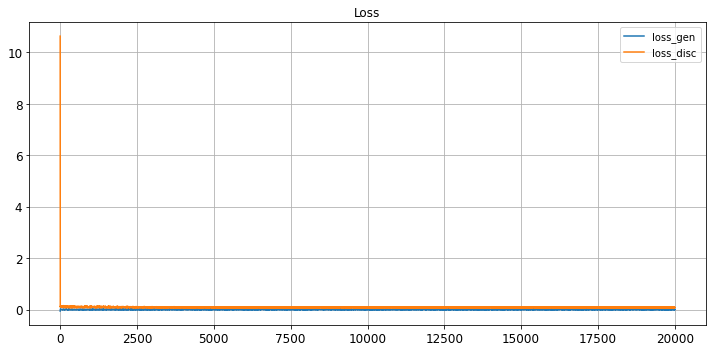

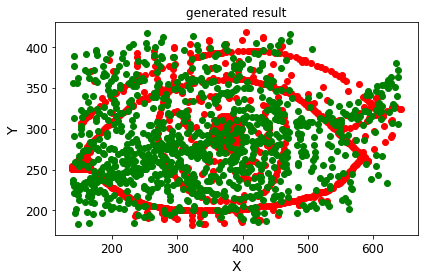

save the model & result
Epoch 20001/100000
critic: 0.079533 - generator: -0.000063 - 0s
Epoch 20002/100000
critic: 0.080473 - generator: 0.001000 - 0s
Epoch 20003/100000
critic: 0.066598 - generator: 0.000697 - 0s
Epoch 20004/100000
critic: 0.089303 - generator: -0.000125 - 0s
Epoch 20005/100000
critic: 0.077885 - generator: 0.001052 - 0s
Epoch 20006/100000
critic: 0.077450 - generator: 0.000635 - 0s
Epoch 20007/100000
critic: 0.079390 - generator: -0.000808 - 0s
Epoch 20008/100000
critic: 0.078153 - generator: -0.002031 - 0s
Epoch 20009/100000
critic: 0.077725 - generator: -0.004447 - 0s
Epoch 20010/100000
critic: 0.078381 - generator: 0.001802 - 0s
Epoch 20011/100000
critic: 0.073865 - generator: -0.003179 - 0s
Epoch 20012/100000
critic: 0.081980 - generator: 0.000510 - 0s
Epoch 20013/100000
critic: 0.078812 - generator: -0.000905 - 0s
Epoch 20014/100000
critic: 0.081694 - generator: -0.003291 - 0s
Epoch 20015/100000
critic: 0.079527 - generator: 0.001636 - 0s
Epoch 20016/100000
crit

critic: 0.076686 - generator: -0.001251 - 0s
Epoch 20132/100000
critic: 0.080563 - generator: 0.001832 - 0s
Epoch 20133/100000
critic: 0.078861 - generator: -0.002183 - 0s
Epoch 20134/100000
critic: 0.080925 - generator: -0.000704 - 0s
Epoch 20135/100000
critic: 0.097047 - generator: 0.001409 - 0s
Epoch 20136/100000
critic: 0.082357 - generator: -0.000553 - 0s
Epoch 20137/100000
critic: 0.076061 - generator: -0.003716 - 0s
Epoch 20138/100000
critic: 0.088818 - generator: -0.002747 - 0s
Epoch 20139/100000
critic: 0.076631 - generator: -0.002654 - 0s
Epoch 20140/100000
critic: 0.076620 - generator: 0.000222 - 0s
Epoch 20141/100000
critic: 0.088386 - generator: 0.003649 - 0s
Epoch 20142/100000
critic: 0.068379 - generator: 0.001255 - 0s
Epoch 20143/100000
critic: 0.088730 - generator: 0.004563 - 0s
Epoch 20144/100000
critic: 0.074746 - generator: -0.000390 - 0s
Epoch 20145/100000
critic: 0.072484 - generator: -0.002628 - 0s
Epoch 20146/100000
critic: 0.079868 - generator: -0.001527 - 0s
E

critic: 0.075709 - generator: -0.004366 - 0s
Epoch 20262/100000
critic: 0.077698 - generator: -0.001173 - 0s
Epoch 20263/100000
critic: 0.091811 - generator: -0.001536 - 0s
Epoch 20264/100000
critic: 0.080852 - generator: 0.000202 - 0s
Epoch 20265/100000
critic: 0.079990 - generator: 0.001710 - 0s
Epoch 20266/100000
critic: 0.093132 - generator: -0.000865 - 0s
Epoch 20267/100000
critic: 0.080534 - generator: 0.000003 - 0s
Epoch 20268/100000
critic: 0.082958 - generator: 0.001701 - 0s
Epoch 20269/100000
critic: 0.091747 - generator: 0.000261 - 0s
Epoch 20270/100000
critic: 0.074433 - generator: 0.000930 - 0s
Epoch 20271/100000
critic: 0.081791 - generator: -0.000140 - 0s
Epoch 20272/100000
critic: 0.081788 - generator: -0.000320 - 0s
Epoch 20273/100000
critic: 0.084681 - generator: -0.002628 - 0s
Epoch 20274/100000
critic: 0.075549 - generator: -0.001435 - 0s
Epoch 20275/100000
critic: 0.080895 - generator: -0.000204 - 0s
Epoch 20276/100000
critic: 0.075152 - generator: 0.003624 - 0s
Ep

critic: 0.077776 - generator: -0.003069 - 0s
Epoch 20392/100000
critic: 0.075330 - generator: -0.002736 - 0s
Epoch 20393/100000
critic: 0.084092 - generator: 0.001635 - 0s
Epoch 20394/100000
critic: 0.081347 - generator: -0.005857 - 0s
Epoch 20395/100000
critic: 0.075974 - generator: -0.003372 - 0s
Epoch 20396/100000
critic: 0.096371 - generator: 0.002513 - 0s
Epoch 20397/100000
critic: 0.087510 - generator: -0.002601 - 0s
Epoch 20398/100000
critic: 0.083440 - generator: 0.004058 - 0s
Epoch 20399/100000
critic: 0.078062 - generator: 0.000563 - 0s
Epoch 20400/100000
critic: 0.082366 - generator: 0.001343 - 0s
Epoch 20401/100000
critic: 0.082542 - generator: -0.003644 - 0s
Epoch 20402/100000
critic: 0.092450 - generator: 0.000995 - 0s
Epoch 20403/100000
critic: 0.083195 - generator: -0.002376 - 0s
Epoch 20404/100000
critic: 0.090171 - generator: 0.003580 - 0s
Epoch 20405/100000
critic: 0.086784 - generator: -0.002159 - 0s
Epoch 20406/100000
critic: 0.081983 - generator: -0.002051 - 0s
Ep

critic: 0.081966 - generator: 0.000723 - 0s
Epoch 20522/100000
critic: 0.087077 - generator: -0.000265 - 0s
Epoch 20523/100000
critic: 0.086223 - generator: 0.001091 - 0s
Epoch 20524/100000
critic: 0.073716 - generator: 0.000371 - 0s
Epoch 20525/100000
critic: 0.083741 - generator: -0.001823 - 0s
Epoch 20526/100000
critic: 0.085556 - generator: 0.001977 - 0s
Epoch 20527/100000
critic: 0.077592 - generator: 0.000390 - 0s
Epoch 20528/100000
critic: 0.086134 - generator: 0.002510 - 0s
Epoch 20529/100000
critic: 0.080575 - generator: 0.002641 - 0s
Epoch 20530/100000
critic: 0.079289 - generator: 0.000237 - 0s
Epoch 20531/100000
critic: 0.075634 - generator: -0.001113 - 0s
Epoch 20532/100000
critic: 0.089027 - generator: 0.000413 - 0s
Epoch 20533/100000
critic: 0.080516 - generator: -0.000684 - 0s
Epoch 20534/100000
critic: 0.086004 - generator: -0.001774 - 0s
Epoch 20535/100000
critic: 0.075664 - generator: -0.000640 - 0s
Epoch 20536/100000
critic: 0.078904 - generator: -0.002906 - 0s
Epoc

critic: 0.075383 - generator: 0.001216 - 0s
Epoch 20653/100000
critic: 0.084373 - generator: -0.000317 - 0s
Epoch 20654/100000
critic: 0.081336 - generator: -0.001148 - 0s
Epoch 20655/100000
critic: 0.075675 - generator: 0.000338 - 0s
Epoch 20656/100000
critic: 0.086772 - generator: -0.000234 - 0s
Epoch 20657/100000
critic: 0.078559 - generator: -0.004302 - 0s
Epoch 20658/100000
critic: 0.081977 - generator: -0.001035 - 0s
Epoch 20659/100000
critic: 0.078680 - generator: 0.000913 - 0s
Epoch 20660/100000
critic: 0.083290 - generator: 0.000979 - 0s
Epoch 20661/100000
critic: 0.076208 - generator: 0.001188 - 0s
Epoch 20662/100000
critic: 0.084676 - generator: -0.000337 - 0s
Epoch 20663/100000
critic: 0.077022 - generator: -0.001208 - 0s
Epoch 20664/100000
critic: 0.076345 - generator: 0.003148 - 0s
Epoch 20665/100000
critic: 0.085560 - generator: 0.000434 - 0s
Epoch 20666/100000
critic: 0.077185 - generator: -0.000740 - 0s
Epoch 20667/100000
critic: 0.086532 - generator: -0.000009 - 0s
Ep

critic: 0.090646 - generator: 0.002128 - 0s
Epoch 20783/100000
critic: 0.072930 - generator: -0.001405 - 0s
Epoch 20784/100000
critic: 0.087328 - generator: -0.003337 - 0s
Epoch 20785/100000
critic: 0.081658 - generator: 0.000576 - 0s
Epoch 20786/100000
critic: 0.078455 - generator: 0.001253 - 0s
Epoch 20787/100000
critic: 0.079258 - generator: -0.003354 - 0s
Epoch 20788/100000
critic: 0.081367 - generator: -0.003914 - 0s
Epoch 20789/100000
critic: 0.078292 - generator: 0.000385 - 0s
Epoch 20790/100000
critic: 0.077523 - generator: -0.000537 - 0s
Epoch 20791/100000
critic: 0.078398 - generator: -0.003585 - 0s
Epoch 20792/100000
critic: 0.075014 - generator: 0.000042 - 0s
Epoch 20793/100000
critic: 0.081289 - generator: -0.000303 - 0s
Epoch 20794/100000
critic: 0.085051 - generator: -0.002856 - 0s
Epoch 20795/100000
critic: 0.094029 - generator: -0.001649 - 0s
Epoch 20796/100000
critic: 0.088327 - generator: -0.001708 - 0s
Epoch 20797/100000
critic: 0.082520 - generator: -0.005523 - 0s


critic: 0.075470 - generator: 0.000457 - 0s
Epoch 20913/100000
critic: 0.063283 - generator: 0.001160 - 0s
Epoch 20914/100000
critic: 0.080886 - generator: 0.002459 - 0s
Epoch 20915/100000
critic: 0.080753 - generator: -0.003628 - 0s
Epoch 20916/100000
critic: 0.077900 - generator: 0.001325 - 0s
Epoch 20917/100000
critic: 0.085501 - generator: -0.000297 - 0s
Epoch 20918/100000
critic: 0.070782 - generator: -0.002292 - 0s
Epoch 20919/100000
critic: 0.087403 - generator: -0.001321 - 0s
Epoch 20920/100000
critic: 0.080534 - generator: -0.001549 - 0s
Epoch 20921/100000
critic: 0.084807 - generator: 0.004650 - 0s
Epoch 20922/100000
critic: 0.080961 - generator: -0.001664 - 0s
Epoch 20923/100000
critic: 0.069271 - generator: 0.000508 - 0s
Epoch 20924/100000
critic: 0.084112 - generator: -0.000030 - 0s
Epoch 20925/100000
critic: 0.080126 - generator: -0.006109 - 0s
Epoch 20926/100000
critic: 0.092073 - generator: 0.001173 - 0s
Epoch 20927/100000
critic: 0.076425 - generator: 0.002351 - 0s
Epo

critic: 0.083268 - generator: -0.000804 - 0s
Epoch 21043/100000
critic: 0.086023 - generator: 0.002838 - 0s
Epoch 21044/100000
critic: 0.091875 - generator: -0.001081 - 0s
Epoch 21045/100000
critic: 0.084169 - generator: 0.001940 - 0s
Epoch 21046/100000
critic: 0.084499 - generator: 0.000161 - 0s
Epoch 21047/100000
critic: 0.085125 - generator: -0.007645 - 0s
Epoch 21048/100000
critic: 0.075137 - generator: -0.001340 - 0s
Epoch 21049/100000
critic: 0.085596 - generator: -0.001649 - 0s
Epoch 21050/100000
critic: 0.073953 - generator: -0.000871 - 0s
Epoch 21051/100000
critic: 0.091257 - generator: 0.000517 - 0s
Epoch 21052/100000
critic: 0.085065 - generator: -0.003734 - 0s
Epoch 21053/100000
critic: 0.087306 - generator: -0.001872 - 0s
Epoch 21054/100000
critic: 0.079219 - generator: -0.001367 - 0s
Epoch 21055/100000
critic: 0.085109 - generator: 0.000850 - 0s
Epoch 21056/100000
critic: 0.084316 - generator: 0.002859 - 0s
Epoch 21057/100000
critic: 0.094271 - generator: 0.002838 - 0s
Ep

critic: 0.075780 - generator: 0.000001 - 0s
Epoch 21174/100000
critic: 0.080722 - generator: -0.001688 - 0s
Epoch 21175/100000
critic: 0.078737 - generator: -0.000067 - 0s
Epoch 21176/100000
critic: 0.074121 - generator: 0.003688 - 0s
Epoch 21177/100000
critic: 0.073432 - generator: -0.003284 - 0s
Epoch 21178/100000
critic: 0.089863 - generator: -0.003144 - 0s
Epoch 21179/100000
critic: 0.083066 - generator: -0.000814 - 0s
Epoch 21180/100000
critic: 0.076541 - generator: -0.001031 - 0s
Epoch 21181/100000
critic: 0.084143 - generator: -0.000699 - 0s
Epoch 21182/100000
critic: 0.085545 - generator: -0.002784 - 0s
Epoch 21183/100000
critic: 0.082652 - generator: -0.003117 - 0s
Epoch 21184/100000
critic: 0.079742 - generator: 0.001904 - 0s
Epoch 21185/100000
critic: 0.097780 - generator: -0.001907 - 0s
Epoch 21186/100000
critic: 0.075548 - generator: 0.000498 - 0s
Epoch 21187/100000
critic: 0.075198 - generator: 0.004548 - 0s
Epoch 21188/100000
critic: 0.079220 - generator: 0.001763 - 0s
E

critic: 0.079624 - generator: -0.005277 - 0s
Epoch 21303/100000
critic: 0.083312 - generator: 0.002007 - 0s
Epoch 21304/100000
critic: 0.075548 - generator: 0.002611 - 0s
Epoch 21305/100000
critic: 0.077716 - generator: -0.000227 - 0s
Epoch 21306/100000
critic: 0.085421 - generator: -0.001384 - 0s
Epoch 21307/100000
critic: 0.069581 - generator: -0.003473 - 0s
Epoch 21308/100000
critic: 0.089549 - generator: -0.000771 - 0s
Epoch 21309/100000
critic: 0.074872 - generator: 0.002321 - 0s
Epoch 21310/100000
critic: 0.087198 - generator: -0.001675 - 0s
Epoch 21311/100000
critic: 0.082231 - generator: -0.001634 - 0s
Epoch 21312/100000
critic: 0.082798 - generator: 0.000793 - 0s
Epoch 21313/100000
critic: 0.084012 - generator: 0.001550 - 0s
Epoch 21314/100000
critic: 0.078172 - generator: 0.000411 - 0s
Epoch 21315/100000
critic: 0.083775 - generator: -0.002936 - 0s
Epoch 21316/100000
critic: 0.093956 - generator: -0.002085 - 0s
Epoch 21317/100000
critic: 0.078559 - generator: -0.003189 - 0s
E

critic: 0.081893 - generator: -0.001362 - 0s
Epoch 21434/100000
critic: 0.076887 - generator: -0.000248 - 0s
Epoch 21435/100000
critic: 0.080716 - generator: -0.001895 - 0s
Epoch 21436/100000
critic: 0.080946 - generator: -0.000574 - 0s
Epoch 21437/100000
critic: 0.086558 - generator: -0.001741 - 0s
Epoch 21438/100000
critic: 0.077138 - generator: -0.003873 - 0s
Epoch 21439/100000
critic: 0.078747 - generator: 0.000089 - 0s
Epoch 21440/100000
critic: 0.084755 - generator: -0.004726 - 0s
Epoch 21441/100000
critic: 0.076172 - generator: -0.001607 - 0s
Epoch 21442/100000
critic: 0.073577 - generator: -0.002785 - 0s
Epoch 21443/100000
critic: 0.082595 - generator: 0.001408 - 0s
Epoch 21444/100000
critic: 0.081859 - generator: 0.005047 - 0s
Epoch 21445/100000
critic: 0.080416 - generator: 0.002285 - 0s
Epoch 21446/100000
critic: 0.082896 - generator: 0.001903 - 0s
Epoch 21447/100000
critic: 0.081426 - generator: -0.000129 - 0s
Epoch 21448/100000
critic: 0.081696 - generator: -0.002594 - 0s


critic: 0.084155 - generator: -0.000265 - 0s
Epoch 21565/100000
critic: 0.078745 - generator: 0.004329 - 0s
Epoch 21566/100000
critic: 0.077362 - generator: -0.000332 - 0s
Epoch 21567/100000
critic: 0.082347 - generator: -0.000162 - 0s
Epoch 21568/100000
critic: 0.093471 - generator: 0.000566 - 0s
Epoch 21569/100000
critic: 0.078201 - generator: -0.002400 - 0s
Epoch 21570/100000
critic: 0.084595 - generator: 0.000894 - 0s
Epoch 21571/100000
critic: 0.085970 - generator: -0.002850 - 0s
Epoch 21572/100000
critic: 0.090834 - generator: -0.003519 - 0s
Epoch 21573/100000
critic: 0.076754 - generator: -0.001666 - 0s
Epoch 21574/100000
critic: 0.071336 - generator: -0.003008 - 0s
Epoch 21575/100000
critic: 0.076631 - generator: 0.002064 - 0s
Epoch 21576/100000
critic: 0.081432 - generator: 0.002139 - 0s
Epoch 21577/100000
critic: 0.079317 - generator: 0.003789 - 0s
Epoch 21578/100000
critic: 0.077702 - generator: 0.000790 - 0s
Epoch 21579/100000
critic: 0.089889 - generator: 0.001759 - 0s
Epo

critic: 0.081885 - generator: 0.002674 - 0s
Epoch 21695/100000
critic: 0.080965 - generator: 0.001867 - 0s
Epoch 21696/100000
critic: 0.075488 - generator: 0.002124 - 0s
Epoch 21697/100000
critic: 0.077138 - generator: 0.000974 - 0s
Epoch 21698/100000
critic: 0.080833 - generator: -0.002262 - 0s
Epoch 21699/100000
critic: 0.084052 - generator: -0.001171 - 0s
Epoch 21700/100000
critic: 0.083059 - generator: -0.001542 - 0s
Epoch 21701/100000
critic: 0.078138 - generator: 0.000789 - 0s
Epoch 21702/100000
critic: 0.085005 - generator: -0.003420 - 0s
Epoch 21703/100000
critic: 0.078791 - generator: 0.002561 - 0s
Epoch 21704/100000
critic: 0.082647 - generator: 0.002684 - 0s
Epoch 21705/100000
critic: 0.069689 - generator: 0.001202 - 0s
Epoch 21706/100000
critic: 0.071096 - generator: 0.003090 - 0s
Epoch 21707/100000
critic: 0.077659 - generator: -0.003799 - 0s
Epoch 21708/100000
critic: 0.079454 - generator: -0.004226 - 0s
Epoch 21709/100000
critic: 0.083966 - generator: -0.001956 - 0s
Epoc

critic: 0.086535 - generator: -0.002756 - 0s
Epoch 21825/100000
critic: 0.083418 - generator: -0.001897 - 0s
Epoch 21826/100000
critic: 0.094147 - generator: -0.001770 - 0s
Epoch 21827/100000
critic: 0.085822 - generator: -0.001162 - 0s
Epoch 21828/100000
critic: 0.087304 - generator: 0.000272 - 0s
Epoch 21829/100000
critic: 0.084783 - generator: -0.001904 - 0s
Epoch 21830/100000
critic: 0.082899 - generator: -0.004329 - 0s
Epoch 21831/100000
critic: 0.079393 - generator: -0.000297 - 0s
Epoch 21832/100000
critic: 0.074890 - generator: -0.001867 - 0s
Epoch 21833/100000
critic: 0.081072 - generator: 0.001719 - 0s
Epoch 21834/100000
critic: 0.092203 - generator: 0.005339 - 0s
Epoch 21835/100000
critic: 0.082663 - generator: 0.002487 - 0s
Epoch 21836/100000
critic: 0.085791 - generator: -0.000343 - 0s
Epoch 21837/100000
critic: 0.081965 - generator: 0.003545 - 0s
Epoch 21838/100000
critic: 0.078211 - generator: -0.000992 - 0s
Epoch 21839/100000
critic: 0.078920 - generator: 0.000620 - 0s
E

critic: 0.083839 - generator: -0.004716 - 0s
Epoch 21954/100000
critic: 0.076079 - generator: -0.000549 - 0s
Epoch 21955/100000
critic: 0.078597 - generator: 0.003741 - 0s
Epoch 21956/100000
critic: 0.079120 - generator: -0.002575 - 0s
Epoch 21957/100000
critic: 0.085583 - generator: 0.004886 - 0s
Epoch 21958/100000
critic: 0.067498 - generator: 0.002999 - 0s
Epoch 21959/100000
critic: 0.086573 - generator: 0.000352 - 0s
Epoch 21960/100000
critic: 0.084066 - generator: 0.004264 - 0s
Epoch 21961/100000
critic: 0.083761 - generator: 0.003034 - 0s
Epoch 21962/100000
critic: 0.081631 - generator: -0.001289 - 0s
Epoch 21963/100000
critic: 0.086497 - generator: -0.003097 - 0s
Epoch 21964/100000
critic: 0.078396 - generator: 0.000030 - 0s
Epoch 21965/100000
critic: 0.079514 - generator: 0.006220 - 0s
Epoch 21966/100000
critic: 0.090030 - generator: 0.001059 - 0s
Epoch 21967/100000
critic: 0.078908 - generator: 0.000406 - 0s
Epoch 21968/100000
critic: 0.088316 - generator: -0.000098 - 0s
Epoch

critic: 0.079941 - generator: -0.000789 - 0s
Epoch 22083/100000
critic: 0.085128 - generator: 0.000066 - 0s
Epoch 22084/100000
critic: 0.077447 - generator: 0.001649 - 0s
Epoch 22085/100000
critic: 0.085956 - generator: -0.000754 - 0s
Epoch 22086/100000
critic: 0.076015 - generator: -0.001045 - 0s
Epoch 22087/100000
critic: 0.078811 - generator: 0.000525 - 0s
Epoch 22088/100000
critic: 0.072274 - generator: 0.000658 - 0s
Epoch 22089/100000
critic: 0.090343 - generator: 0.000123 - 0s
Epoch 22090/100000
critic: 0.075844 - generator: -0.000984 - 0s
Epoch 22091/100000
critic: 0.084431 - generator: -0.001061 - 0s
Epoch 22092/100000
critic: 0.082423 - generator: -0.000047 - 0s
Epoch 22093/100000
critic: 0.075958 - generator: 0.000886 - 0s
Epoch 22094/100000
critic: 0.080408 - generator: 0.001593 - 0s
Epoch 22095/100000
critic: 0.079739 - generator: 0.002580 - 0s
Epoch 22096/100000
critic: 0.077785 - generator: -0.001087 - 0s
Epoch 22097/100000
critic: 0.081630 - generator: 0.003550 - 0s
Epoc

critic: 0.083311 - generator: 0.002065 - 0s
Epoch 22212/100000
critic: 0.081896 - generator: -0.001762 - 0s
Epoch 22213/100000
critic: 0.075063 - generator: -0.002089 - 0s
Epoch 22214/100000
critic: 0.084042 - generator: -0.002387 - 0s
Epoch 22215/100000
critic: 0.083045 - generator: 0.003253 - 0s
Epoch 22216/100000
critic: 0.090223 - generator: -0.001490 - 0s
Epoch 22217/100000
critic: 0.085945 - generator: -0.002178 - 0s
Epoch 22218/100000
critic: 0.089234 - generator: -0.000739 - 0s
Epoch 22219/100000
critic: 0.076588 - generator: -0.004117 - 0s
Epoch 22220/100000
critic: 0.075587 - generator: 0.001466 - 0s
Epoch 22221/100000
critic: 0.079080 - generator: -0.000046 - 0s
Epoch 22222/100000
critic: 0.091536 - generator: -0.000318 - 0s
Epoch 22223/100000
critic: 0.070974 - generator: -0.000511 - 0s
Epoch 22224/100000
critic: 0.078545 - generator: 0.000730 - 0s
Epoch 22225/100000
critic: 0.086989 - generator: -0.000316 - 0s
Epoch 22226/100000
critic: 0.092084 - generator: -0.001628 - 0s

critic: 0.076463 - generator: -0.002345 - 0s
Epoch 22342/100000
critic: 0.080925 - generator: 0.000756 - 0s
Epoch 22343/100000
critic: 0.076788 - generator: 0.003406 - 0s
Epoch 22344/100000
critic: 0.078840 - generator: 0.002644 - 0s
Epoch 22345/100000
critic: 0.084300 - generator: 0.000054 - 0s
Epoch 22346/100000
critic: 0.078398 - generator: -0.001996 - 0s
Epoch 22347/100000
critic: 0.080699 - generator: -0.000699 - 0s
Epoch 22348/100000
critic: 0.078824 - generator: -0.001507 - 0s
Epoch 22349/100000
critic: 0.081440 - generator: -0.005967 - 0s
Epoch 22350/100000
critic: 0.082679 - generator: -0.001060 - 0s
Epoch 22351/100000
critic: 0.077696 - generator: -0.004062 - 0s
Epoch 22352/100000
critic: 0.086512 - generator: -0.001914 - 0s
Epoch 22353/100000
critic: 0.076767 - generator: -0.003742 - 0s
Epoch 22354/100000
critic: 0.077779 - generator: -0.000602 - 0s
Epoch 22355/100000
critic: 0.090274 - generator: 0.005528 - 0s
Epoch 22356/100000
critic: 0.080144 - generator: 0.003460 - 0s
E

critic: 0.079832 - generator: -0.002025 - 0s
Epoch 22471/100000
critic: 0.092314 - generator: 0.003386 - 0s
Epoch 22472/100000
critic: 0.071302 - generator: 0.000960 - 0s
Epoch 22473/100000
critic: 0.081578 - generator: 0.000808 - 0s
Epoch 22474/100000
critic: 0.077662 - generator: -0.000459 - 0s
Epoch 22475/100000
critic: 0.088763 - generator: -0.001145 - 0s
Epoch 22476/100000
critic: 0.076777 - generator: -0.004143 - 0s
Epoch 22477/100000
critic: 0.079550 - generator: 0.002209 - 0s
Epoch 22478/100000
critic: 0.088268 - generator: -0.000261 - 0s
Epoch 22479/100000
critic: 0.099247 - generator: 0.002665 - 0s
Epoch 22480/100000
critic: 0.077593 - generator: -0.000697 - 0s
Epoch 22481/100000
critic: 0.075135 - generator: 0.003462 - 0s
Epoch 22482/100000
critic: 0.086297 - generator: 0.003534 - 0s
Epoch 22483/100000
critic: 0.088078 - generator: 0.000611 - 0s
Epoch 22484/100000
critic: 0.082697 - generator: -0.000550 - 0s
Epoch 22485/100000
critic: 0.078797 - generator: 0.000553 - 0s
Epoc

critic: 0.081651 - generator: -0.001262 - 0s
Epoch 22601/100000
critic: 0.086773 - generator: 0.000681 - 0s
Epoch 22602/100000
critic: 0.079473 - generator: -0.000317 - 0s
Epoch 22603/100000
critic: 0.086813 - generator: -0.000879 - 0s
Epoch 22604/100000
critic: 0.085835 - generator: 0.004018 - 0s
Epoch 22605/100000
critic: 0.083922 - generator: 0.001323 - 0s
Epoch 22606/100000
critic: 0.080101 - generator: -0.002224 - 0s
Epoch 22607/100000
critic: 0.089322 - generator: -0.000551 - 0s
Epoch 22608/100000
critic: 0.082715 - generator: -0.002972 - 0s
Epoch 22609/100000
critic: 0.084188 - generator: -0.003020 - 0s
Epoch 22610/100000
critic: 0.086296 - generator: -0.002184 - 0s
Epoch 22611/100000
critic: 0.085089 - generator: 0.002456 - 0s
Epoch 22612/100000
critic: 0.082975 - generator: 0.002180 - 0s
Epoch 22613/100000
critic: 0.076930 - generator: -0.000262 - 0s
Epoch 22614/100000
critic: 0.083593 - generator: 0.004252 - 0s
Epoch 22615/100000
critic: 0.082309 - generator: -0.000659 - 0s
E

critic: 0.078857 - generator: -0.003688 - 0s
Epoch 22731/100000
critic: 0.082366 - generator: -0.003023 - 0s
Epoch 22732/100000
critic: 0.075288 - generator: -0.002158 - 0s
Epoch 22733/100000
critic: 0.084951 - generator: 0.000811 - 0s
Epoch 22734/100000
critic: 0.091360 - generator: -0.000567 - 0s
Epoch 22735/100000
critic: 0.073951 - generator: 0.000979 - 0s
Epoch 22736/100000
critic: 0.077739 - generator: -0.000803 - 0s
Epoch 22737/100000
critic: 0.078537 - generator: -0.002073 - 0s
Epoch 22738/100000
critic: 0.074038 - generator: 0.001761 - 0s
Epoch 22739/100000
critic: 0.089305 - generator: -0.000497 - 0s
Epoch 22740/100000
critic: 0.089634 - generator: -0.002063 - 0s
Epoch 22741/100000
critic: 0.077579 - generator: 0.002815 - 0s
Epoch 22742/100000
critic: 0.093936 - generator: -0.002173 - 0s
Epoch 22743/100000
critic: 0.082888 - generator: 0.000005 - 0s
Epoch 22744/100000
critic: 0.080163 - generator: -0.001515 - 0s
Epoch 22745/100000
critic: 0.089210 - generator: -0.001923 - 0s


critic: 0.078972 - generator: -0.004696 - 0s
Epoch 22861/100000
critic: 0.086626 - generator: -0.000947 - 0s
Epoch 22862/100000
critic: 0.088423 - generator: 0.002732 - 0s
Epoch 22863/100000
critic: 0.086360 - generator: 0.000548 - 0s
Epoch 22864/100000
critic: 0.081960 - generator: -0.002474 - 0s
Epoch 22865/100000
critic: 0.087774 - generator: -0.001806 - 0s
Epoch 22866/100000
critic: 0.085081 - generator: 0.003155 - 0s
Epoch 22867/100000
critic: 0.079958 - generator: 0.002411 - 0s
Epoch 22868/100000
critic: 0.077380 - generator: -0.003656 - 0s
Epoch 22869/100000
critic: 0.068977 - generator: 0.001272 - 0s
Epoch 22870/100000
critic: 0.094556 - generator: 0.000399 - 0s
Epoch 22871/100000
critic: 0.090040 - generator: -0.000171 - 0s
Epoch 22872/100000
critic: 0.073072 - generator: -0.001647 - 0s
Epoch 22873/100000
critic: 0.079281 - generator: -0.000808 - 0s
Epoch 22874/100000
critic: 0.073309 - generator: 0.001623 - 0s
Epoch 22875/100000
critic: 0.088084 - generator: -0.000214 - 0s
Ep

critic: 0.089238 - generator: 0.001312 - 0s
Epoch 22990/100000
critic: 0.071833 - generator: 0.001265 - 0s
Epoch 22991/100000
critic: 0.079564 - generator: -0.004152 - 0s
Epoch 22992/100000
critic: 0.075476 - generator: -0.001062 - 0s
Epoch 22993/100000
critic: 0.082601 - generator: -0.002221 - 0s
Epoch 22994/100000
critic: 0.083837 - generator: -0.002285 - 0s
Epoch 22995/100000
critic: 0.084423 - generator: -0.001257 - 0s
Epoch 22996/100000
critic: 0.088860 - generator: -0.002158 - 0s
Epoch 22997/100000
critic: 0.076872 - generator: -0.004209 - 0s
Epoch 22998/100000
critic: 0.082869 - generator: -0.004701 - 0s
Epoch 22999/100000
critic: 0.088318 - generator: 0.000254 - 0s
Epoch 23000/100000
critic: 0.090270 - generator: 0.004821 - 0s
Epoch 23001/100000
critic: 0.078398 - generator: 0.000938 - 0s
Epoch 23002/100000
critic: 0.081338 - generator: 0.000067 - 0s
Epoch 23003/100000
critic: 0.073132 - generator: 0.003231 - 0s
Epoch 23004/100000
critic: 0.080988 - generator: 0.000660 - 0s
Epo

critic: 0.080460 - generator: -0.000124 - 0s
Epoch 23119/100000
critic: 0.081337 - generator: -0.001258 - 0s
Epoch 23120/100000
critic: 0.077863 - generator: -0.003532 - 0s
Epoch 23121/100000
critic: 0.081639 - generator: 0.000777 - 0s
Epoch 23122/100000
critic: 0.080128 - generator: -0.000834 - 0s
Epoch 23123/100000
critic: 0.087424 - generator: -0.000479 - 0s
Epoch 23124/100000
critic: 0.080182 - generator: 0.001926 - 0s
Epoch 23125/100000
critic: 0.076306 - generator: 0.003033 - 0s
Epoch 23126/100000
critic: 0.079428 - generator: -0.001432 - 0s
Epoch 23127/100000
critic: 0.086188 - generator: -0.000620 - 0s
Epoch 23128/100000
critic: 0.071181 - generator: 0.001015 - 0s
Epoch 23129/100000
critic: 0.086613 - generator: -0.001292 - 0s
Epoch 23130/100000
critic: 0.083775 - generator: 0.001541 - 0s
Epoch 23131/100000
critic: 0.081902 - generator: 0.001413 - 0s
Epoch 23132/100000
critic: 0.073248 - generator: -0.000453 - 0s
Epoch 23133/100000
critic: 0.087532 - generator: 0.002958 - 0s
Ep

critic: 0.089158 - generator: 0.004092 - 0s
Epoch 23249/100000
critic: 0.069389 - generator: 0.000871 - 0s
Epoch 23250/100000
critic: 0.076645 - generator: -0.002031 - 0s
Epoch 23251/100000
critic: 0.082061 - generator: -0.000950 - 0s
Epoch 23252/100000
critic: 0.075553 - generator: 0.000053 - 0s
Epoch 23253/100000
critic: 0.083659 - generator: 0.000180 - 0s
Epoch 23254/100000
critic: 0.096228 - generator: -0.001730 - 0s
Epoch 23255/100000
critic: 0.079176 - generator: -0.004282 - 0s
Epoch 23256/100000
critic: 0.083678 - generator: -0.001352 - 0s
Epoch 23257/100000
critic: 0.082044 - generator: 0.003216 - 0s
Epoch 23258/100000
critic: 0.081275 - generator: -0.000122 - 0s
Epoch 23259/100000
critic: 0.077520 - generator: 0.005342 - 0s
Epoch 23260/100000
critic: 0.083813 - generator: 0.001785 - 0s
Epoch 23261/100000
critic: 0.074543 - generator: -0.002289 - 0s
Epoch 23262/100000
critic: 0.076352 - generator: -0.001400 - 0s
Epoch 23263/100000
critic: 0.072265 - generator: -0.002929 - 0s
Ep

critic: 0.070631 - generator: -0.000328 - 0s
Epoch 23378/100000
critic: 0.081162 - generator: 0.001167 - 0s
Epoch 23379/100000
critic: 0.090887 - generator: 0.000621 - 0s
Epoch 23380/100000
critic: 0.079789 - generator: 0.001676 - 0s
Epoch 23381/100000
critic: 0.087403 - generator: -0.001223 - 0s
Epoch 23382/100000
critic: 0.066616 - generator: 0.000617 - 0s
Epoch 23383/100000
critic: 0.086770 - generator: 0.000855 - 0s
Epoch 23384/100000
critic: 0.077311 - generator: 0.000380 - 0s
Epoch 23385/100000
critic: 0.080693 - generator: 0.000398 - 0s
Epoch 23386/100000
critic: 0.070869 - generator: -0.002424 - 0s
Epoch 23387/100000
critic: 0.079262 - generator: 0.003251 - 0s
Epoch 23388/100000
critic: 0.090098 - generator: 0.005793 - 0s
Epoch 23389/100000
critic: 0.077340 - generator: 0.001518 - 0s
Epoch 23390/100000
critic: 0.077161 - generator: -0.001535 - 0s
Epoch 23391/100000
critic: 0.082209 - generator: 0.002016 - 0s
Epoch 23392/100000
critic: 0.071736 - generator: -0.002197 - 0s
Epoch 

critic: 0.087350 - generator: 0.000532 - 0s
Epoch 23508/100000
critic: 0.078573 - generator: 0.003766 - 0s
Epoch 23509/100000
critic: 0.075759 - generator: 0.003344 - 0s
Epoch 23510/100000
critic: 0.084568 - generator: 0.003605 - 0s
Epoch 23511/100000
critic: 0.067540 - generator: 0.002217 - 0s
Epoch 23512/100000
critic: 0.072266 - generator: -0.000088 - 0s
Epoch 23513/100000
critic: 0.074973 - generator: 0.002221 - 0s
Epoch 23514/100000
critic: 0.079572 - generator: 0.002145 - 0s
Epoch 23515/100000
critic: 0.072862 - generator: 0.002526 - 0s
Epoch 23516/100000
critic: 0.070051 - generator: -0.001621 - 0s
Epoch 23517/100000
critic: 0.078857 - generator: -0.002011 - 0s
Epoch 23518/100000
critic: 0.088750 - generator: -0.004872 - 0s
Epoch 23519/100000
critic: 0.074055 - generator: -0.001387 - 0s
Epoch 23520/100000
critic: 0.075517 - generator: 0.000613 - 0s
Epoch 23521/100000
critic: 0.074263 - generator: -0.003393 - 0s
Epoch 23522/100000
critic: 0.084716 - generator: 0.000665 - 0s
Epoch

critic: 0.077569 - generator: 0.002643 - 0s
Epoch 23637/100000
critic: 0.066200 - generator: -0.001489 - 0s
Epoch 23638/100000
critic: 0.082926 - generator: 0.001033 - 0s
Epoch 23639/100000
critic: 0.085158 - generator: 0.000061 - 0s
Epoch 23640/100000
critic: 0.089486 - generator: 0.002044 - 0s
Epoch 23641/100000
critic: 0.081328 - generator: -0.003599 - 0s
Epoch 23642/100000
critic: 0.097328 - generator: 0.002133 - 0s
Epoch 23643/100000
critic: 0.083201 - generator: 0.000875 - 0s
Epoch 23644/100000
critic: 0.082901 - generator: -0.001956 - 0s
Epoch 23645/100000
critic: 0.074351 - generator: -0.001753 - 0s
Epoch 23646/100000
critic: 0.074759 - generator: 0.002447 - 0s
Epoch 23647/100000
critic: 0.074827 - generator: -0.001798 - 0s
Epoch 23648/100000
critic: 0.095500 - generator: 0.000606 - 0s
Epoch 23649/100000
critic: 0.076902 - generator: -0.001969 - 0s
Epoch 23650/100000
critic: 0.074049 - generator: -0.003858 - 0s
Epoch 23651/100000
critic: 0.070807 - generator: -0.000044 - 0s
Epo

critic: 0.075630 - generator: -0.000198 - 0s
Epoch 23767/100000
critic: 0.074797 - generator: 0.001178 - 0s
Epoch 23768/100000
critic: 0.087168 - generator: 0.000396 - 0s
Epoch 23769/100000
critic: 0.081823 - generator: 0.001560 - 0s
Epoch 23770/100000
critic: 0.092901 - generator: -0.003465 - 0s
Epoch 23771/100000
critic: 0.083760 - generator: -0.001188 - 0s
Epoch 23772/100000
critic: 0.080301 - generator: -0.000896 - 0s
Epoch 23773/100000
critic: 0.082905 - generator: -0.004785 - 0s
Epoch 23774/100000
critic: 0.089959 - generator: 0.000196 - 0s
Epoch 23775/100000
critic: 0.081084 - generator: -0.000494 - 0s
Epoch 23776/100000
critic: 0.079161 - generator: 0.000916 - 0s
Epoch 23777/100000
critic: 0.084590 - generator: 0.003950 - 0s
Epoch 23778/100000
critic: 0.079593 - generator: -0.003250 - 0s
Epoch 23779/100000
critic: 0.083354 - generator: 0.001288 - 0s
Epoch 23780/100000
critic: 0.083058 - generator: 0.001574 - 0s
Epoch 23781/100000
critic: 0.094688 - generator: 0.004213 - 0s
Epoc

critic: 0.078455 - generator: 0.001235 - 0s
Epoch 23897/100000
critic: 0.090965 - generator: 0.002110 - 0s
Epoch 23898/100000
critic: 0.089676 - generator: -0.001652 - 0s
Epoch 23899/100000
critic: 0.094365 - generator: 0.000400 - 0s
Epoch 23900/100000
critic: 0.088202 - generator: 0.000141 - 0s
Epoch 23901/100000
critic: 0.084922 - generator: 0.001606 - 0s
Epoch 23902/100000
critic: 0.074130 - generator: -0.000592 - 0s
Epoch 23903/100000
critic: 0.079249 - generator: 0.002795 - 0s
Epoch 23904/100000
critic: 0.077626 - generator: 0.000141 - 0s
Epoch 23905/100000
critic: 0.082541 - generator: 0.002314 - 0s
Epoch 23906/100000
critic: 0.070781 - generator: 0.001532 - 0s
Epoch 23907/100000
critic: 0.083819 - generator: -0.001270 - 0s
Epoch 23908/100000
critic: 0.083797 - generator: -0.004630 - 0s
Epoch 23909/100000
critic: 0.082344 - generator: -0.005120 - 0s
Epoch 23910/100000
critic: 0.088993 - generator: -0.004773 - 0s
Epoch 23911/100000
critic: 0.091816 - generator: 0.001581 - 0s
Epoch

critic: 0.078514 - generator: 0.001360 - 0s
Epoch 24027/100000
critic: 0.085881 - generator: -0.000463 - 0s
Epoch 24028/100000
critic: 0.083206 - generator: -0.001758 - 0s
Epoch 24029/100000
critic: 0.076217 - generator: -0.002643 - 0s
Epoch 24030/100000
critic: 0.086678 - generator: 0.002131 - 0s
Epoch 24031/100000
critic: 0.088670 - generator: 0.003116 - 0s
Epoch 24032/100000
critic: 0.078437 - generator: 0.001680 - 0s
Epoch 24033/100000
critic: 0.081044 - generator: -0.001071 - 0s
Epoch 24034/100000
critic: 0.082421 - generator: 0.001327 - 0s
Epoch 24035/100000
critic: 0.078432 - generator: 0.001124 - 0s
Epoch 24036/100000
critic: 0.078460 - generator: -0.001949 - 0s
Epoch 24037/100000
critic: 0.078519 - generator: -0.005712 - 0s
Epoch 24038/100000
critic: 0.084483 - generator: -0.007007 - 0s
Epoch 24039/100000
critic: 0.087139 - generator: 0.000588 - 0s
Epoch 24040/100000
critic: 0.084780 - generator: -0.000126 - 0s
Epoch 24041/100000
critic: 0.075217 - generator: 0.000501 - 0s
Epo

critic: 0.086093 - generator: -0.002283 - 0s
Epoch 24157/100000
critic: 0.074209 - generator: -0.001876 - 0s
Epoch 24158/100000
critic: 0.077016 - generator: 0.000313 - 0s
Epoch 24159/100000
critic: 0.085825 - generator: -0.001256 - 0s
Epoch 24160/100000
critic: 0.081414 - generator: -0.001723 - 0s
Epoch 24161/100000
critic: 0.090856 - generator: -0.001899 - 0s
Epoch 24162/100000
critic: 0.082896 - generator: 0.001655 - 0s
Epoch 24163/100000
critic: 0.086488 - generator: 0.001541 - 0s
Epoch 24164/100000
critic: 0.086599 - generator: -0.000938 - 0s
Epoch 24165/100000
critic: 0.079739 - generator: -0.000486 - 0s
Epoch 24166/100000
critic: 0.081829 - generator: -0.004170 - 0s
Epoch 24167/100000
critic: 0.078100 - generator: -0.002356 - 0s
Epoch 24168/100000
critic: 0.086435 - generator: 0.000670 - 0s
Epoch 24169/100000
critic: 0.079687 - generator: 0.001208 - 0s
Epoch 24170/100000
critic: 0.084963 - generator: 0.003948 - 0s
Epoch 24171/100000
critic: 0.077632 - generator: -0.001386 - 0s
E

critic: 0.081741 - generator: 0.000194 - 0s
Epoch 24287/100000
critic: 0.082660 - generator: -0.001385 - 0s
Epoch 24288/100000
critic: 0.076666 - generator: 0.001151 - 0s
Epoch 24289/100000
critic: 0.078397 - generator: 0.001887 - 0s
Epoch 24290/100000
critic: 0.083160 - generator: -0.001866 - 0s
Epoch 24291/100000
critic: 0.090611 - generator: 0.002583 - 0s
Epoch 24292/100000
critic: 0.082938 - generator: 0.000700 - 0s
Epoch 24293/100000
critic: 0.087471 - generator: -0.003847 - 0s
Epoch 24294/100000
critic: 0.073495 - generator: -0.000962 - 0s
Epoch 24295/100000
critic: 0.074165 - generator: -0.004312 - 0s
Epoch 24296/100000
critic: 0.078171 - generator: -0.005079 - 0s
Epoch 24297/100000
critic: 0.076617 - generator: 0.006517 - 0s
Epoch 24298/100000
critic: 0.085752 - generator: 0.002541 - 0s
Epoch 24299/100000
critic: 0.085435 - generator: 0.002944 - 0s
Epoch 24300/100000
critic: 0.088387 - generator: -0.001208 - 0s
Epoch 24301/100000
critic: 0.076622 - generator: 0.001634 - 0s
Epoc

critic: 0.084057 - generator: -0.002832 - 0s
Epoch 24417/100000
critic: 0.080787 - generator: -0.001123 - 0s
Epoch 24418/100000
critic: 0.085125 - generator: -0.003233 - 0s
Epoch 24419/100000
critic: 0.076894 - generator: 0.000238 - 0s
Epoch 24420/100000
critic: 0.078060 - generator: -0.002268 - 0s
Epoch 24421/100000
critic: 0.086442 - generator: -0.005107 - 0s
Epoch 24422/100000
critic: 0.077887 - generator: -0.002221 - 0s
Epoch 24423/100000
critic: 0.077430 - generator: 0.002098 - 0s
Epoch 24424/100000
critic: 0.089850 - generator: -0.000579 - 0s
Epoch 24425/100000
critic: 0.072454 - generator: 0.001474 - 0s
Epoch 24426/100000
critic: 0.074938 - generator: -0.002421 - 0s
Epoch 24427/100000
critic: 0.085025 - generator: -0.000471 - 0s
Epoch 24428/100000
critic: 0.090186 - generator: -0.000639 - 0s
Epoch 24429/100000
critic: 0.084449 - generator: -0.002710 - 0s
Epoch 24430/100000
critic: 0.087531 - generator: 0.000363 - 0s
Epoch 24431/100000
critic: 0.073731 - generator: -0.002375 - 0s

critic: 0.073773 - generator: 0.001980 - 0s
Epoch 24547/100000
critic: 0.086961 - generator: -0.000817 - 0s
Epoch 24548/100000
critic: 0.075958 - generator: 0.000705 - 0s
Epoch 24549/100000
critic: 0.082202 - generator: -0.001587 - 0s
Epoch 24550/100000
critic: 0.069318 - generator: -0.002652 - 0s
Epoch 24551/100000
critic: 0.086255 - generator: -0.005144 - 0s
Epoch 24552/100000
critic: 0.072912 - generator: 0.000178 - 0s
Epoch 24553/100000
critic: 0.084065 - generator: 0.000351 - 0s
Epoch 24554/100000
critic: 0.077996 - generator: -0.002188 - 0s
Epoch 24555/100000
critic: 0.092263 - generator: 0.001364 - 0s
Epoch 24556/100000
critic: 0.079160 - generator: -0.001842 - 0s
Epoch 24557/100000
critic: 0.079305 - generator: -0.000166 - 0s
Epoch 24558/100000
critic: 0.078128 - generator: 0.001460 - 0s
Epoch 24559/100000
critic: 0.073111 - generator: 0.002449 - 0s
Epoch 24560/100000
critic: 0.082073 - generator: 0.001463 - 0s
Epoch 24561/100000
critic: 0.096258 - generator: 0.001334 - 0s
Epoc

critic: 0.079246 - generator: 0.003196 - 0s
Epoch 24677/100000
critic: 0.078593 - generator: 0.004180 - 0s
Epoch 24678/100000
critic: 0.078272 - generator: 0.005083 - 0s
Epoch 24679/100000
critic: 0.086375 - generator: -0.000777 - 0s
Epoch 24680/100000
critic: 0.080296 - generator: 0.001239 - 0s
Epoch 24681/100000
critic: 0.090204 - generator: 0.003898 - 0s
Epoch 24682/100000
critic: 0.071297 - generator: 0.004248 - 0s
Epoch 24683/100000
critic: 0.071724 - generator: 0.005283 - 0s
Epoch 24684/100000
critic: 0.083487 - generator: 0.001881 - 0s
Epoch 24685/100000
critic: 0.082136 - generator: -0.000090 - 0s
Epoch 24686/100000
critic: 0.086901 - generator: 0.001065 - 0s
Epoch 24687/100000
critic: 0.088844 - generator: 0.004185 - 0s
Epoch 24688/100000
critic: 0.083895 - generator: 0.003888 - 0s
Epoch 24689/100000
critic: 0.081002 - generator: -0.002504 - 0s
Epoch 24690/100000
critic: 0.077358 - generator: -0.000348 - 0s
Epoch 24691/100000
critic: 0.071295 - generator: 0.000812 - 0s
Epoch 2

critic: 0.081829 - generator: -0.001623 - 0s
Epoch 24806/100000
critic: 0.069115 - generator: 0.001986 - 0s
Epoch 24807/100000
critic: 0.075905 - generator: 0.001416 - 0s
Epoch 24808/100000
critic: 0.079651 - generator: 0.000952 - 0s
Epoch 24809/100000
critic: 0.083084 - generator: 0.000405 - 0s
Epoch 24810/100000
critic: 0.088728 - generator: -0.001483 - 0s
Epoch 24811/100000
critic: 0.076920 - generator: -0.001164 - 0s
Epoch 24812/100000
critic: 0.075746 - generator: 0.002420 - 0s
Epoch 24813/100000
critic: 0.086178 - generator: 0.003338 - 0s
Epoch 24814/100000
critic: 0.089471 - generator: -0.001250 - 0s
Epoch 24815/100000
critic: 0.087394 - generator: -0.003641 - 0s
Epoch 24816/100000
critic: 0.078135 - generator: -0.000790 - 0s
Epoch 24817/100000
critic: 0.078258 - generator: -0.002637 - 0s
Epoch 24818/100000
critic: 0.085347 - generator: 0.001294 - 0s
Epoch 24819/100000
critic: 0.084176 - generator: 0.000414 - 0s
Epoch 24820/100000
critic: 0.084952 - generator: -0.000582 - 0s
Epo

critic: 0.084672 - generator: -0.003492 - 0s
Epoch 24935/100000
critic: 0.075955 - generator: -0.006224 - 0s
Epoch 24936/100000
critic: 0.077860 - generator: 0.001222 - 0s
Epoch 24937/100000
critic: 0.086308 - generator: 0.001329 - 0s
Epoch 24938/100000
critic: 0.079124 - generator: 0.001988 - 0s
Epoch 24939/100000
critic: 0.088706 - generator: -0.001224 - 0s
Epoch 24940/100000
critic: 0.085228 - generator: 0.001078 - 0s
Epoch 24941/100000
critic: 0.080086 - generator: -0.003432 - 0s
Epoch 24942/100000
critic: 0.086486 - generator: -0.003402 - 0s
Epoch 24943/100000
critic: 0.071429 - generator: 0.001437 - 0s
Epoch 24944/100000
critic: 0.094832 - generator: 0.002963 - 0s
Epoch 24945/100000
critic: 0.069433 - generator: -0.001464 - 0s
Epoch 24946/100000
critic: 0.083188 - generator: -0.003009 - 0s
Epoch 24947/100000
critic: 0.085006 - generator: -0.000887 - 0s
Epoch 24948/100000
critic: 0.085649 - generator: 0.001100 - 0s
Epoch 24949/100000
critic: 0.080092 - generator: 0.001530 - 0s
Epo

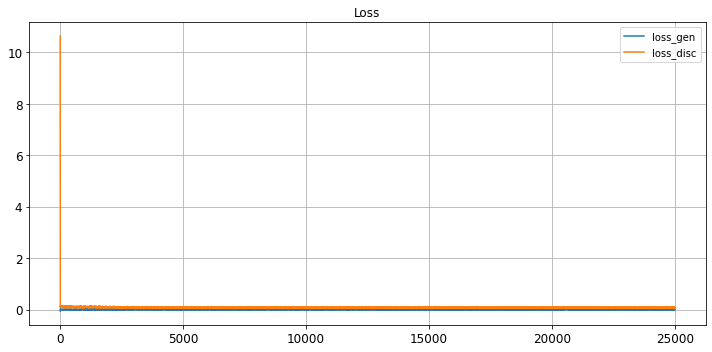

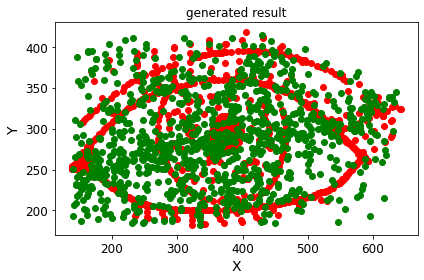

save the model & result
Epoch 25001/100000
critic: 0.083953 - generator: -0.000832 - 0s
Epoch 25002/100000
critic: 0.077922 - generator: 0.000197 - 0s
Epoch 25003/100000
critic: 0.082121 - generator: -0.003404 - 0s
Epoch 25004/100000
critic: 0.086760 - generator: -0.000128 - 0s
Epoch 25005/100000
critic: 0.077511 - generator: -0.002137 - 0s
Epoch 25006/100000
critic: 0.093280 - generator: 0.003675 - 0s
Epoch 25007/100000
critic: 0.086321 - generator: -0.001533 - 0s
Epoch 25008/100000
critic: 0.084682 - generator: -0.002438 - 0s
Epoch 25009/100000
critic: 0.079489 - generator: -0.000033 - 0s
Epoch 25010/100000
critic: 0.073771 - generator: -0.001152 - 0s
Epoch 25011/100000
critic: 0.077375 - generator: -0.002747 - 0s
Epoch 25012/100000
critic: 0.080635 - generator: -0.003858 - 0s
Epoch 25013/100000
critic: 0.084862 - generator: 0.001548 - 0s
Epoch 25014/100000
critic: 0.082915 - generator: 0.000353 - 0s
Epoch 25015/100000
critic: 0.079487 - generator: -0.003094 - 0s
Epoch 25016/100000
c

critic: 0.081179 - generator: 0.000589 - 0s
Epoch 25131/100000
critic: 0.093626 - generator: -0.001264 - 0s
Epoch 25132/100000
critic: 0.091168 - generator: -0.002244 - 0s
Epoch 25133/100000
critic: 0.078462 - generator: 0.001503 - 0s
Epoch 25134/100000
critic: 0.080874 - generator: -0.002112 - 0s
Epoch 25135/100000
critic: 0.083073 - generator: 0.000685 - 0s
Epoch 25136/100000
critic: 0.083313 - generator: 0.004894 - 0s
Epoch 25137/100000
critic: 0.077742 - generator: 0.000813 - 0s
Epoch 25138/100000
critic: 0.084474 - generator: -0.003744 - 0s
Epoch 25139/100000
critic: 0.075563 - generator: 0.003127 - 0s
Epoch 25140/100000
critic: 0.076374 - generator: 0.003014 - 0s
Epoch 25141/100000
critic: 0.087920 - generator: 0.000917 - 0s
Epoch 25142/100000
critic: 0.086702 - generator: 0.000274 - 0s
Epoch 25143/100000
critic: 0.083749 - generator: -0.003877 - 0s
Epoch 25144/100000
critic: 0.081963 - generator: -0.001764 - 0s
Epoch 25145/100000
critic: 0.078886 - generator: 0.001406 - 0s
Epoch

critic: 0.083771 - generator: -0.003624 - 0s
Epoch 25261/100000
critic: 0.078889 - generator: 0.004168 - 0s
Epoch 25262/100000
critic: 0.079137 - generator: -0.000185 - 0s
Epoch 25263/100000
critic: 0.097202 - generator: 0.001508 - 0s
Epoch 25264/100000
critic: 0.086045 - generator: 0.002736 - 0s
Epoch 25265/100000
critic: 0.087419 - generator: 0.002940 - 0s
Epoch 25266/100000
critic: 0.074968 - generator: -0.000981 - 0s
Epoch 25267/100000
critic: 0.086428 - generator: 0.000726 - 0s
Epoch 25268/100000
critic: 0.070118 - generator: -0.000592 - 0s
Epoch 25269/100000
critic: 0.083438 - generator: 0.002944 - 0s
Epoch 25270/100000
critic: 0.078331 - generator: -0.004680 - 0s
Epoch 25271/100000
critic: 0.078077 - generator: 0.000733 - 0s
Epoch 25272/100000
critic: 0.078487 - generator: 0.001154 - 0s
Epoch 25273/100000
critic: 0.070492 - generator: 0.000000 - 0s
Epoch 25274/100000
critic: 0.078252 - generator: 0.001107 - 0s
Epoch 25275/100000
critic: 0.080063 - generator: 0.002992 - 0s
Epoch 

critic: 0.070710 - generator: -0.001210 - 0s
Epoch 25391/100000
critic: 0.086221 - generator: 0.000049 - 0s
Epoch 25392/100000
critic: 0.087790 - generator: 0.002105 - 0s
Epoch 25393/100000
critic: 0.074850 - generator: 0.000083 - 0s
Epoch 25394/100000
critic: 0.085483 - generator: 0.001508 - 0s
Epoch 25395/100000
critic: 0.099757 - generator: -0.000948 - 0s
Epoch 25396/100000
critic: 0.091367 - generator: 0.000424 - 0s
Epoch 25397/100000
critic: 0.082150 - generator: -0.001086 - 0s
Epoch 25398/100000
critic: 0.081520 - generator: 0.001732 - 0s
Epoch 25399/100000
critic: 0.081841 - generator: 0.007246 - 0s
Epoch 25400/100000
critic: 0.074636 - generator: 0.002141 - 0s
Epoch 25401/100000
critic: 0.077801 - generator: 0.000674 - 0s
Epoch 25402/100000
critic: 0.070935 - generator: 0.002361 - 0s
Epoch 25403/100000
critic: 0.077615 - generator: 0.001565 - 0s
Epoch 25404/100000
critic: 0.086106 - generator: 0.002758 - 0s
Epoch 25405/100000
critic: 0.072604 - generator: 0.000494 - 0s
Epoch 25

critic: 0.075136 - generator: 0.000599 - 0s
Epoch 25520/100000
critic: 0.078952 - generator: -0.002230 - 0s
Epoch 25521/100000
critic: 0.093354 - generator: 0.000432 - 0s
Epoch 25522/100000
critic: 0.082196 - generator: 0.001718 - 0s
Epoch 25523/100000
critic: 0.072543 - generator: 0.001147 - 0s
Epoch 25524/100000
critic: 0.082245 - generator: 0.001169 - 0s
Epoch 25525/100000
critic: 0.076856 - generator: -0.000634 - 0s
Epoch 25526/100000
critic: 0.076469 - generator: 0.000666 - 0s
Epoch 25527/100000
critic: 0.076936 - generator: 0.001669 - 0s
Epoch 25528/100000
critic: 0.079193 - generator: -0.001575 - 0s
Epoch 25529/100000
critic: 0.083840 - generator: -0.002486 - 0s
Epoch 25530/100000
critic: 0.090170 - generator: -0.001341 - 0s
Epoch 25531/100000
critic: 0.082716 - generator: 0.002932 - 0s
Epoch 25532/100000
critic: 0.082996 - generator: 0.001222 - 0s
Epoch 25533/100000
critic: 0.071865 - generator: -0.004166 - 0s
Epoch 25534/100000
critic: 0.076803 - generator: 0.001322 - 0s
Epoch

critic: 0.075062 - generator: 0.000598 - 0s
Epoch 25650/100000
critic: 0.071299 - generator: 0.002322 - 0s
Epoch 25651/100000
critic: 0.083500 - generator: -0.001541 - 0s
Epoch 25652/100000
critic: 0.086805 - generator: 0.001869 - 0s
Epoch 25653/100000
critic: 0.085213 - generator: 0.000855 - 0s
Epoch 25654/100000
critic: 0.086125 - generator: 0.003309 - 0s
Epoch 25655/100000
critic: 0.078241 - generator: 0.001277 - 0s
Epoch 25656/100000
critic: 0.081778 - generator: -0.002711 - 0s
Epoch 25657/100000
critic: 0.080314 - generator: -0.000217 - 0s
Epoch 25658/100000
critic: 0.088438 - generator: 0.002709 - 0s
Epoch 25659/100000
critic: 0.089599 - generator: 0.001763 - 0s
Epoch 25660/100000
critic: 0.084288 - generator: -0.002503 - 0s
Epoch 25661/100000
critic: 0.085251 - generator: 0.003718 - 0s
Epoch 25662/100000
critic: 0.079238 - generator: -0.001119 - 0s
Epoch 25663/100000
critic: 0.088829 - generator: 0.002844 - 0s
Epoch 25664/100000
critic: 0.075208 - generator: -0.001310 - 0s
Epoch

critic: 0.085171 - generator: -0.001968 - 0s
Epoch 25780/100000
critic: 0.088749 - generator: -0.002876 - 0s
Epoch 25781/100000
critic: 0.082522 - generator: -0.000566 - 0s
Epoch 25782/100000
critic: 0.081521 - generator: -0.002095 - 0s
Epoch 25783/100000
critic: 0.075797 - generator: -0.002068 - 0s
Epoch 25784/100000
critic: 0.080873 - generator: -0.000693 - 0s
Epoch 25785/100000
critic: 0.087704 - generator: 0.004053 - 0s
Epoch 25786/100000
critic: 0.075126 - generator: 0.000376 - 0s
Epoch 25787/100000
critic: 0.089126 - generator: 0.001739 - 0s
Epoch 25788/100000
critic: 0.087700 - generator: 0.002359 - 0s
Epoch 25789/100000
critic: 0.084803 - generator: 0.002287 - 0s
Epoch 25790/100000
critic: 0.073733 - generator: 0.000941 - 0s
Epoch 25791/100000
critic: 0.084707 - generator: 0.002868 - 0s
Epoch 25792/100000
critic: 0.084648 - generator: 0.008673 - 0s
Epoch 25793/100000
critic: 0.072316 - generator: 0.000645 - 0s
Epoch 25794/100000
critic: 0.085084 - generator: 0.000239 - 0s
Epoch

critic: 0.083217 - generator: -0.000761 - 0s
Epoch 25910/100000
critic: 0.094549 - generator: -0.004165 - 0s
Epoch 25911/100000
critic: 0.082587 - generator: 0.001058 - 0s
Epoch 25912/100000
critic: 0.078148 - generator: 0.001542 - 0s
Epoch 25913/100000
critic: 0.084936 - generator: 0.001109 - 0s
Epoch 25914/100000
critic: 0.076221 - generator: -0.001712 - 0s
Epoch 25915/100000
critic: 0.077997 - generator: -0.000485 - 0s
Epoch 25916/100000
critic: 0.083191 - generator: 0.000304 - 0s
Epoch 25917/100000
critic: 0.076770 - generator: -0.000739 - 0s
Epoch 25918/100000
critic: 0.086817 - generator: 0.000645 - 0s
Epoch 25919/100000
critic: 0.080110 - generator: 0.001536 - 0s
Epoch 25920/100000
critic: 0.082658 - generator: -0.000231 - 0s
Epoch 25921/100000
critic: 0.076265 - generator: -0.000244 - 0s
Epoch 25922/100000
critic: 0.076645 - generator: -0.000031 - 0s
Epoch 25923/100000
critic: 0.075391 - generator: -0.002311 - 0s
Epoch 25924/100000
critic: 0.086098 - generator: -0.001693 - 0s
E

critic: 0.085624 - generator: 0.000014 - 0s
Epoch 26039/100000
critic: 0.076828 - generator: 0.002472 - 0s
Epoch 26040/100000
critic: 0.069943 - generator: -0.000787 - 0s
Epoch 26041/100000
critic: 0.088840 - generator: 0.000682 - 0s
Epoch 26042/100000
critic: 0.080480 - generator: -0.001824 - 0s
Epoch 26043/100000
critic: 0.077420 - generator: -0.002317 - 0s
Epoch 26044/100000
critic: 0.083127 - generator: -0.005033 - 0s
Epoch 26045/100000
critic: 0.083900 - generator: -0.004471 - 0s
Epoch 26046/100000
critic: 0.078337 - generator: -0.001794 - 0s
Epoch 26047/100000
critic: 0.089806 - generator: 0.004634 - 0s
Epoch 26048/100000
critic: 0.079314 - generator: 0.002351 - 0s
Epoch 26049/100000
critic: 0.084334 - generator: 0.001746 - 0s
Epoch 26050/100000
critic: 0.080662 - generator: 0.002537 - 0s
Epoch 26051/100000
critic: 0.076677 - generator: -0.003292 - 0s
Epoch 26052/100000
critic: 0.088567 - generator: -0.004125 - 0s
Epoch 26053/100000
critic: 0.078758 - generator: -0.000453 - 0s
Ep

critic: 0.070509 - generator: -0.005094 - 0s
Epoch 26169/100000
critic: 0.084569 - generator: -0.000294 - 0s
Epoch 26170/100000
critic: 0.082014 - generator: -0.000370 - 0s
Epoch 26171/100000
critic: 0.072887 - generator: -0.002720 - 0s
Epoch 26172/100000
critic: 0.084992 - generator: -0.000689 - 0s
Epoch 26173/100000
critic: 0.068477 - generator: -0.003565 - 0s
Epoch 26174/100000
critic: 0.079054 - generator: -0.001964 - 0s
Epoch 26175/100000
critic: 0.081129 - generator: -0.001625 - 0s
Epoch 26176/100000
critic: 0.082690 - generator: 0.005147 - 0s
Epoch 26177/100000
critic: 0.082457 - generator: 0.002767 - 0s
Epoch 26178/100000
critic: 0.086336 - generator: 0.004303 - 0s
Epoch 26179/100000
critic: 0.089009 - generator: 0.004959 - 0s
Epoch 26180/100000
critic: 0.092193 - generator: -0.001259 - 0s
Epoch 26181/100000
critic: 0.085372 - generator: -0.001526 - 0s
Epoch 26182/100000
critic: 0.076249 - generator: -0.001024 - 0s
Epoch 26183/100000
critic: 0.086727 - generator: 0.001936 - 0s


critic: 0.068288 - generator: -0.004189 - 0s
Epoch 26298/100000
critic: 0.078839 - generator: -0.003134 - 0s
Epoch 26299/100000
critic: 0.085921 - generator: 0.003959 - 0s
Epoch 26300/100000
critic: 0.076394 - generator: -0.000375 - 0s
Epoch 26301/100000
critic: 0.082037 - generator: -0.000292 - 0s
Epoch 26302/100000
critic: 0.078835 - generator: -0.002347 - 0s
Epoch 26303/100000
critic: 0.097546 - generator: -0.002942 - 0s
Epoch 26304/100000
critic: 0.082128 - generator: -0.004465 - 0s
Epoch 26305/100000
critic: 0.084467 - generator: 0.000398 - 0s
Epoch 26306/100000
critic: 0.073974 - generator: -0.000394 - 0s
Epoch 26307/100000
critic: 0.083300 - generator: 0.004800 - 0s
Epoch 26308/100000
critic: 0.089042 - generator: 0.003053 - 0s
Epoch 26309/100000
critic: 0.089624 - generator: 0.001754 - 0s
Epoch 26310/100000
critic: 0.079171 - generator: 0.001840 - 0s
Epoch 26311/100000
critic: 0.075653 - generator: 0.000223 - 0s
Epoch 26312/100000
critic: 0.076998 - generator: -0.000407 - 0s
Ep

critic: 0.070511 - generator: 0.001330 - 0s
Epoch 26428/100000
critic: 0.074739 - generator: 0.002977 - 0s
Epoch 26429/100000
critic: 0.089221 - generator: 0.004190 - 0s
Epoch 26430/100000
critic: 0.082288 - generator: 0.001446 - 0s
Epoch 26431/100000
critic: 0.089866 - generator: -0.001993 - 0s
Epoch 26432/100000
critic: 0.079024 - generator: 0.001648 - 0s
Epoch 26433/100000
critic: 0.077939 - generator: 0.001417 - 0s
Epoch 26434/100000
critic: 0.093376 - generator: -0.000429 - 0s
Epoch 26435/100000
critic: 0.070291 - generator: 0.003681 - 0s
Epoch 26436/100000
critic: 0.079098 - generator: -0.002365 - 0s
Epoch 26437/100000
critic: 0.092037 - generator: 0.001011 - 0s
Epoch 26438/100000
critic: 0.077387 - generator: 0.000132 - 0s
Epoch 26439/100000
critic: 0.077844 - generator: 0.001857 - 0s
Epoch 26440/100000
critic: 0.083510 - generator: -0.001485 - 0s
Epoch 26441/100000
critic: 0.094358 - generator: -0.001690 - 0s
Epoch 26442/100000
critic: 0.086034 - generator: -0.003568 - 0s
Epoch

critic: 0.074951 - generator: -0.001422 - 0s
Epoch 26558/100000
critic: 0.088989 - generator: 0.005114 - 0s
Epoch 26559/100000
critic: 0.077171 - generator: -0.001169 - 0s
Epoch 26560/100000
critic: 0.082973 - generator: -0.000292 - 0s
Epoch 26561/100000
critic: 0.081901 - generator: 0.000462 - 0s
Epoch 26562/100000
critic: 0.086459 - generator: -0.003269 - 0s
Epoch 26563/100000
critic: 0.079149 - generator: -0.002495 - 0s
Epoch 26564/100000
critic: 0.087235 - generator: -0.001058 - 0s
Epoch 26565/100000
critic: 0.085273 - generator: 0.000389 - 0s
Epoch 26566/100000
critic: 0.082048 - generator: -0.001738 - 0s
Epoch 26567/100000
critic: 0.076520 - generator: 0.000998 - 0s
Epoch 26568/100000
critic: 0.083644 - generator: 0.000237 - 0s
Epoch 26569/100000
critic: 0.086874 - generator: -0.003379 - 0s
Epoch 26570/100000
critic: 0.073743 - generator: 0.002522 - 0s
Epoch 26571/100000
critic: 0.087555 - generator: 0.001509 - 0s
Epoch 26572/100000
critic: 0.075793 - generator: -0.001582 - 0s
Ep

critic: 0.074816 - generator: -0.003857 - 0s
Epoch 26688/100000
critic: 0.084846 - generator: -0.003605 - 0s
Epoch 26689/100000
critic: 0.079859 - generator: -0.002042 - 0s
Epoch 26690/100000
critic: 0.076844 - generator: 0.000448 - 0s
Epoch 26691/100000
critic: 0.088014 - generator: 0.001418 - 0s
Epoch 26692/100000
critic: 0.070304 - generator: -0.003685 - 0s
Epoch 26693/100000
critic: 0.086552 - generator: -0.000901 - 0s
Epoch 26694/100000
critic: 0.085483 - generator: -0.001494 - 0s
Epoch 26695/100000
critic: 0.083720 - generator: -0.001319 - 0s
Epoch 26696/100000
critic: 0.080408 - generator: 0.000760 - 0s
Epoch 26697/100000
critic: 0.088967 - generator: -0.001496 - 0s
Epoch 26698/100000
critic: 0.080898 - generator: -0.001181 - 0s
Epoch 26699/100000
critic: 0.083610 - generator: -0.001458 - 0s
Epoch 26700/100000
critic: 0.085458 - generator: -0.000712 - 0s
Epoch 26701/100000
critic: 0.084582 - generator: 0.000891 - 0s
Epoch 26702/100000
critic: 0.083654 - generator: 0.000334 - 0s


critic: 0.073934 - generator: 0.001008 - 0s
Epoch 26817/100000
critic: 0.085370 - generator: 0.001609 - 0s
Epoch 26818/100000
critic: 0.089672 - generator: 0.000863 - 0s
Epoch 26819/100000
critic: 0.087284 - generator: 0.002420 - 0s
Epoch 26820/100000
critic: 0.075607 - generator: -0.003174 - 0s
Epoch 26821/100000
critic: 0.073760 - generator: -0.003797 - 0s
Epoch 26822/100000
critic: 0.071385 - generator: 0.000746 - 0s
Epoch 26823/100000
critic: 0.070145 - generator: -0.004147 - 0s
Epoch 26824/100000
critic: 0.083843 - generator: 0.002974 - 0s
Epoch 26825/100000
critic: 0.089166 - generator: 0.002521 - 0s
Epoch 26826/100000
critic: 0.086721 - generator: -0.007969 - 0s
Epoch 26827/100000
critic: 0.081009 - generator: -0.003746 - 0s
Epoch 26828/100000
critic: 0.089626 - generator: -0.002583 - 0s
Epoch 26829/100000
critic: 0.077306 - generator: -0.005262 - 0s
Epoch 26830/100000
critic: 0.075444 - generator: -0.001390 - 0s
Epoch 26831/100000
critic: 0.083370 - generator: -0.000622 - 0s
Ep

critic: 0.084387 - generator: 0.001056 - 0s
Epoch 26947/100000
critic: 0.078023 - generator: -0.000875 - 0s
Epoch 26948/100000
critic: 0.087987 - generator: 0.002014 - 0s
Epoch 26949/100000
critic: 0.079782 - generator: 0.005332 - 0s
Epoch 26950/100000
critic: 0.075614 - generator: -0.000705 - 0s
Epoch 26951/100000
critic: 0.079428 - generator: 0.000217 - 0s
Epoch 26952/100000
critic: 0.083265 - generator: -0.001469 - 0s
Epoch 26953/100000
critic: 0.085138 - generator: -0.003516 - 0s
Epoch 26954/100000
critic: 0.085590 - generator: 0.002456 - 0s
Epoch 26955/100000
critic: 0.079868 - generator: 0.002033 - 0s
Epoch 26956/100000
critic: 0.081442 - generator: -0.000797 - 0s
Epoch 26957/100000
critic: 0.079140 - generator: -0.001254 - 0s
Epoch 26958/100000
critic: 0.082831 - generator: -0.001017 - 0s
Epoch 26959/100000
critic: 0.080070 - generator: 0.004688 - 0s
Epoch 26960/100000
critic: 0.075612 - generator: 0.000067 - 0s
Epoch 26961/100000
critic: 0.076641 - generator: 0.002914 - 0s
Epoc

critic: 0.082448 - generator: 0.001283 - 0s
Epoch 27076/100000
critic: 0.086174 - generator: 0.001379 - 0s
Epoch 27077/100000
critic: 0.088273 - generator: 0.001224 - 0s
Epoch 27078/100000
critic: 0.082399 - generator: -0.002378 - 0s
Epoch 27079/100000
critic: 0.086541 - generator: -0.000104 - 0s
Epoch 27080/100000
critic: 0.075067 - generator: -0.000978 - 0s
Epoch 27081/100000
critic: 0.092156 - generator: 0.000748 - 0s
Epoch 27082/100000
critic: 0.073601 - generator: 0.000753 - 0s
Epoch 27083/100000
critic: 0.084087 - generator: 0.000050 - 0s
Epoch 27084/100000
critic: 0.081282 - generator: -0.003960 - 0s
Epoch 27085/100000
critic: 0.083911 - generator: 0.006433 - 0s
Epoch 27086/100000
critic: 0.081646 - generator: 0.007977 - 0s
Epoch 27087/100000
critic: 0.083833 - generator: 0.004815 - 0s
Epoch 27088/100000
critic: 0.076292 - generator: 0.002166 - 0s
Epoch 27089/100000
critic: 0.078446 - generator: 0.001128 - 0s
Epoch 27090/100000
critic: 0.080509 - generator: -0.001669 - 0s
Epoch 

critic: 0.081524 - generator: 0.004277 - 0s
Epoch 27205/100000
critic: 0.083947 - generator: 0.000934 - 0s
Epoch 27206/100000
critic: 0.086016 - generator: -0.002051 - 0s
Epoch 27207/100000
critic: 0.078900 - generator: 0.000060 - 0s
Epoch 27208/100000
critic: 0.079152 - generator: -0.002482 - 0s
Epoch 27209/100000
critic: 0.086822 - generator: -0.000221 - 0s
Epoch 27210/100000
critic: 0.071947 - generator: -0.002018 - 0s
Epoch 27211/100000
critic: 0.078183 - generator: -0.001292 - 0s
Epoch 27212/100000
critic: 0.067750 - generator: 0.000550 - 0s
Epoch 27213/100000
critic: 0.084676 - generator: 0.003459 - 0s
Epoch 27214/100000
critic: 0.089943 - generator: 0.002615 - 0s
Epoch 27215/100000
critic: 0.089451 - generator: -0.000329 - 0s
Epoch 27216/100000
critic: 0.082977 - generator: 0.004971 - 0s
Epoch 27217/100000
critic: 0.082564 - generator: 0.002519 - 0s
Epoch 27218/100000
critic: 0.078665 - generator: -0.002641 - 0s
Epoch 27219/100000
critic: 0.073289 - generator: -0.000645 - 0s
Epo

critic: 0.089735 - generator: -0.002193 - 0s
Epoch 27334/100000
critic: 0.085906 - generator: -0.004402 - 0s
Epoch 27335/100000
critic: 0.083204 - generator: 0.002320 - 0s
Epoch 27336/100000
critic: 0.082336 - generator: 0.002009 - 0s
Epoch 27337/100000
critic: 0.080461 - generator: 0.000312 - 0s
Epoch 27338/100000
critic: 0.071689 - generator: 0.001649 - 0s
Epoch 27339/100000
critic: 0.078485 - generator: -0.005454 - 0s
Epoch 27340/100000
critic: 0.078895 - generator: -0.003922 - 0s
Epoch 27341/100000
critic: 0.083070 - generator: 0.000517 - 0s
Epoch 27342/100000
critic: 0.084060 - generator: 0.003971 - 0s
Epoch 27343/100000
critic: 0.072032 - generator: 0.001687 - 0s
Epoch 27344/100000
critic: 0.080457 - generator: 0.001716 - 0s
Epoch 27345/100000
critic: 0.077703 - generator: 0.000140 - 0s
Epoch 27346/100000
critic: 0.071853 - generator: 0.000287 - 0s
Epoch 27347/100000
critic: 0.074426 - generator: 0.001416 - 0s
Epoch 27348/100000
critic: 0.081551 - generator: 0.000063 - 0s
Epoch 2

critic: 0.081417 - generator: -0.000349 - 0s
Epoch 27464/100000
critic: 0.090242 - generator: 0.001699 - 0s
Epoch 27465/100000
critic: 0.078222 - generator: 0.002939 - 0s
Epoch 27466/100000
critic: 0.083165 - generator: 0.000300 - 0s
Epoch 27467/100000
critic: 0.068528 - generator: 0.004189 - 0s
Epoch 27468/100000
critic: 0.078513 - generator: 0.001057 - 0s
Epoch 27469/100000
critic: 0.082217 - generator: 0.002384 - 0s
Epoch 27470/100000
critic: 0.086739 - generator: -0.001815 - 0s
Epoch 27471/100000
critic: 0.066941 - generator: 0.003440 - 0s
Epoch 27472/100000
critic: 0.082135 - generator: 0.002858 - 0s
Epoch 27473/100000
critic: 0.081727 - generator: -0.001127 - 0s
Epoch 27474/100000
critic: 0.083204 - generator: 0.000096 - 0s
Epoch 27475/100000
critic: 0.090835 - generator: -0.002645 - 0s
Epoch 27476/100000
critic: 0.077251 - generator: 0.002055 - 0s
Epoch 27477/100000
critic: 0.085495 - generator: -0.002035 - 0s
Epoch 27478/100000
critic: 0.075124 - generator: 0.000580 - 0s
Epoch 

critic: 0.083899 - generator: -0.000218 - 0s
Epoch 27594/100000
critic: 0.076852 - generator: 0.002007 - 0s
Epoch 27595/100000
critic: 0.091317 - generator: -0.001422 - 0s
Epoch 27596/100000
critic: 0.083135 - generator: -0.000050 - 0s
Epoch 27597/100000
critic: 0.077140 - generator: -0.001838 - 0s
Epoch 27598/100000
critic: 0.075814 - generator: 0.000398 - 0s
Epoch 27599/100000
critic: 0.083690 - generator: 0.002277 - 0s
Epoch 27600/100000
critic: 0.081878 - generator: 0.003367 - 0s
Epoch 27601/100000
critic: 0.081978 - generator: 0.003810 - 0s
Epoch 27602/100000
critic: 0.075084 - generator: -0.004044 - 0s
Epoch 27603/100000
critic: 0.090293 - generator: -0.004182 - 0s
Epoch 27604/100000
critic: 0.078397 - generator: -0.000556 - 0s
Epoch 27605/100000
critic: 0.082762 - generator: 0.001291 - 0s
Epoch 27606/100000
critic: 0.070583 - generator: 0.003208 - 0s
Epoch 27607/100000
critic: 0.078630 - generator: 0.003023 - 0s
Epoch 27608/100000
critic: 0.087295 - generator: 0.001853 - 0s
Epoc

critic: 0.091020 - generator: 0.000344 - 0s
Epoch 27724/100000
critic: 0.075484 - generator: -0.002668 - 0s
Epoch 27725/100000
critic: 0.080885 - generator: 0.003804 - 0s
Epoch 27726/100000
critic: 0.085628 - generator: 0.004205 - 0s
Epoch 27727/100000
critic: 0.077539 - generator: -0.000803 - 0s
Epoch 27728/100000
critic: 0.071474 - generator: 0.000066 - 0s
Epoch 27729/100000
critic: 0.074693 - generator: 0.000750 - 0s
Epoch 27730/100000
critic: 0.078728 - generator: -0.001485 - 0s
Epoch 27731/100000
critic: 0.089751 - generator: 0.003005 - 0s
Epoch 27732/100000
critic: 0.076094 - generator: 0.004596 - 0s
Epoch 27733/100000
critic: 0.085493 - generator: 0.000680 - 0s
Epoch 27734/100000
critic: 0.069700 - generator: 0.000249 - 0s
Epoch 27735/100000
critic: 0.070606 - generator: -0.000488 - 0s
Epoch 27736/100000
critic: 0.082585 - generator: -0.003686 - 0s
Epoch 27737/100000
critic: 0.086093 - generator: -0.000765 - 0s
Epoch 27738/100000
critic: 0.081621 - generator: 0.001882 - 0s
Epoch

critic: 0.071044 - generator: -0.002081 - 0s
Epoch 27854/100000
critic: 0.081864 - generator: -0.000134 - 0s
Epoch 27855/100000
critic: 0.077288 - generator: 0.000806 - 0s
Epoch 27856/100000
critic: 0.082414 - generator: 0.000090 - 0s
Epoch 27857/100000
critic: 0.077446 - generator: -0.001938 - 0s
Epoch 27858/100000
critic: 0.081526 - generator: -0.001215 - 0s
Epoch 27859/100000
critic: 0.083724 - generator: -0.005141 - 0s
Epoch 27860/100000
critic: 0.080085 - generator: -0.003995 - 0s
Epoch 27861/100000
critic: 0.086902 - generator: 0.000658 - 0s
Epoch 27862/100000
critic: 0.075735 - generator: -0.000295 - 0s
Epoch 27863/100000
critic: 0.080404 - generator: -0.000493 - 0s
Epoch 27864/100000
critic: 0.081835 - generator: -0.002126 - 0s
Epoch 27865/100000
critic: 0.090374 - generator: 0.001883 - 0s
Epoch 27866/100000
critic: 0.075043 - generator: 0.001648 - 0s
Epoch 27867/100000
critic: 0.089495 - generator: 0.003324 - 0s
Epoch 27868/100000
critic: 0.080349 - generator: 0.004681 - 0s
Ep

critic: 0.088263 - generator: 0.002685 - 0s
Epoch 27983/100000
critic: 0.075091 - generator: 0.000682 - 0s
Epoch 27984/100000
critic: 0.087098 - generator: 0.003182 - 0s
Epoch 27985/100000
critic: 0.089450 - generator: 0.003315 - 0s
Epoch 27986/100000
critic: 0.086120 - generator: 0.000208 - 0s
Epoch 27987/100000
critic: 0.081074 - generator: -0.001164 - 0s
Epoch 27988/100000
critic: 0.080076 - generator: 0.001849 - 0s
Epoch 27989/100000
critic: 0.078867 - generator: 0.000637 - 0s
Epoch 27990/100000
critic: 0.086910 - generator: 0.002196 - 0s
Epoch 27991/100000
critic: 0.087398 - generator: 0.000254 - 0s
Epoch 27992/100000
critic: 0.076130 - generator: -0.004003 - 0s
Epoch 27993/100000
critic: 0.064203 - generator: -0.000231 - 0s
Epoch 27994/100000
critic: 0.082610 - generator: 0.000835 - 0s
Epoch 27995/100000
critic: 0.085081 - generator: 0.001635 - 0s
Epoch 27996/100000
critic: 0.086012 - generator: -0.001189 - 0s
Epoch 27997/100000
critic: 0.079625 - generator: -0.001842 - 0s
Epoch 

critic: 0.087369 - generator: 0.003942 - 0s
Epoch 28113/100000
critic: 0.085352 - generator: 0.004029 - 0s
Epoch 28114/100000
critic: 0.078043 - generator: -0.001511 - 0s
Epoch 28115/100000
critic: 0.081847 - generator: 0.003692 - 0s
Epoch 28116/100000
critic: 0.084926 - generator: 0.002864 - 0s
Epoch 28117/100000
critic: 0.088563 - generator: 0.000643 - 0s
Epoch 28118/100000
critic: 0.086261 - generator: 0.004301 - 0s
Epoch 28119/100000
critic: 0.090855 - generator: -0.003970 - 0s
Epoch 28120/100000
critic: 0.088023 - generator: 0.000470 - 0s
Epoch 28121/100000
critic: 0.088350 - generator: -0.001308 - 0s
Epoch 28122/100000
critic: 0.072852 - generator: 0.004617 - 0s
Epoch 28123/100000
critic: 0.090941 - generator: 0.000652 - 0s
Epoch 28124/100000
critic: 0.082687 - generator: -0.001499 - 0s
Epoch 28125/100000
critic: 0.076542 - generator: 0.000313 - 0s
Epoch 28126/100000
critic: 0.078635 - generator: -0.006103 - 0s
Epoch 28127/100000
critic: 0.083930 - generator: 0.001007 - 0s
Epoch 

critic: 0.080910 - generator: -0.001250 - 0s
Epoch 28243/100000
critic: 0.077143 - generator: -0.003041 - 0s
Epoch 28244/100000
critic: 0.084420 - generator: 0.001535 - 0s
Epoch 28245/100000
critic: 0.081025 - generator: -0.001795 - 0s
Epoch 28246/100000
critic: 0.085426 - generator: -0.001490 - 0s
Epoch 28247/100000
critic: 0.077181 - generator: -0.001170 - 0s
Epoch 28248/100000
critic: 0.089221 - generator: -0.000997 - 0s
Epoch 28249/100000
critic: 0.074005 - generator: 0.002256 - 0s
Epoch 28250/100000
critic: 0.086114 - generator: 0.001176 - 0s
Epoch 28251/100000
critic: 0.093152 - generator: 0.000454 - 0s
Epoch 28252/100000
critic: 0.088460 - generator: 0.000347 - 0s
Epoch 28253/100000
critic: 0.075004 - generator: -0.000524 - 0s
Epoch 28254/100000
critic: 0.078971 - generator: 0.003698 - 0s
Epoch 28255/100000
critic: 0.088187 - generator: 0.002607 - 0s
Epoch 28256/100000
critic: 0.081798 - generator: -0.000112 - 0s
Epoch 28257/100000
critic: 0.083404 - generator: 0.002171 - 0s
Epo

critic: 0.074779 - generator: -0.000569 - 0s
Epoch 28373/100000
critic: 0.073324 - generator: -0.003349 - 0s
Epoch 28374/100000
critic: 0.087689 - generator: -0.000950 - 0s
Epoch 28375/100000
critic: 0.080875 - generator: -0.000105 - 0s
Epoch 28376/100000
critic: 0.074343 - generator: 0.000606 - 0s
Epoch 28377/100000
critic: 0.080661 - generator: 0.000613 - 0s
Epoch 28378/100000
critic: 0.077214 - generator: -0.000817 - 0s
Epoch 28379/100000
critic: 0.075229 - generator: -0.001985 - 0s
Epoch 28380/100000
critic: 0.084158 - generator: 0.000560 - 0s
Epoch 28381/100000
critic: 0.077321 - generator: -0.003123 - 0s
Epoch 28382/100000
critic: 0.086756 - generator: 0.001494 - 0s
Epoch 28383/100000
critic: 0.081903 - generator: 0.005412 - 0s
Epoch 28384/100000
critic: 0.082832 - generator: 0.004057 - 0s
Epoch 28385/100000
critic: 0.074192 - generator: 0.004095 - 0s
Epoch 28386/100000
critic: 0.080268 - generator: 0.001910 - 0s
Epoch 28387/100000
critic: 0.079493 - generator: -0.002344 - 0s
Epo

critic: 0.072392 - generator: 0.000557 - 0s
Epoch 28503/100000
critic: 0.077393 - generator: -0.002385 - 0s
Epoch 28504/100000
critic: 0.082652 - generator: -0.000813 - 0s
Epoch 28505/100000
critic: 0.089176 - generator: 0.001344 - 0s
Epoch 28506/100000
critic: 0.069292 - generator: 0.000041 - 0s
Epoch 28507/100000
critic: 0.071654 - generator: 0.003596 - 0s
Epoch 28508/100000
critic: 0.087539 - generator: -0.001088 - 0s
Epoch 28509/100000
critic: 0.083339 - generator: -0.000989 - 0s
Epoch 28510/100000
critic: 0.083332 - generator: -0.005189 - 0s
Epoch 28511/100000
critic: 0.077962 - generator: -0.004925 - 0s
Epoch 28512/100000
critic: 0.100303 - generator: -0.003690 - 0s
Epoch 28513/100000
critic: 0.078021 - generator: 0.000455 - 0s
Epoch 28514/100000
critic: 0.081706 - generator: 0.002814 - 0s
Epoch 28515/100000
critic: 0.080630 - generator: -0.002423 - 0s
Epoch 28516/100000
critic: 0.084808 - generator: 0.000209 - 0s
Epoch 28517/100000
critic: 0.073098 - generator: -0.000257 - 0s
Ep

critic: 0.081391 - generator: -0.004144 - 0s
Epoch 28632/100000
critic: 0.085189 - generator: 0.000859 - 0s
Epoch 28633/100000
critic: 0.085045 - generator: -0.001639 - 0s
Epoch 28634/100000
critic: 0.088155 - generator: -0.001215 - 0s
Epoch 28635/100000
critic: 0.065401 - generator: 0.000782 - 0s
Epoch 28636/100000
critic: 0.082871 - generator: -0.000327 - 0s
Epoch 28637/100000
critic: 0.082143 - generator: 0.002257 - 0s
Epoch 28638/100000
critic: 0.090010 - generator: 0.001228 - 0s
Epoch 28639/100000
critic: 0.081183 - generator: -0.001533 - 0s
Epoch 28640/100000
critic: 0.079977 - generator: -0.001497 - 0s
Epoch 28641/100000
critic: 0.076298 - generator: -0.002718 - 0s
Epoch 28642/100000
critic: 0.088616 - generator: -0.001650 - 0s
Epoch 28643/100000
critic: 0.082717 - generator: -0.001008 - 0s
Epoch 28644/100000
critic: 0.086922 - generator: -0.001033 - 0s
Epoch 28645/100000
critic: 0.077029 - generator: 0.000047 - 0s
Epoch 28646/100000
critic: 0.078450 - generator: -0.002868 - 0s


critic: 0.087014 - generator: -0.003156 - 0s
Epoch 28761/100000
critic: 0.072640 - generator: -0.000562 - 0s
Epoch 28762/100000
critic: 0.072823 - generator: 0.001021 - 0s
Epoch 28763/100000
critic: 0.084617 - generator: 0.000512 - 0s
Epoch 28764/100000
critic: 0.085103 - generator: 0.002575 - 0s
Epoch 28765/100000
critic: 0.075763 - generator: 0.002132 - 0s
Epoch 28766/100000
critic: 0.085230 - generator: -0.000815 - 0s
Epoch 28767/100000
critic: 0.084266 - generator: 0.003317 - 0s
Epoch 28768/100000
critic: 0.088416 - generator: 0.004928 - 0s
Epoch 28769/100000
critic: 0.087368 - generator: 0.001849 - 0s
Epoch 28770/100000
critic: 0.086915 - generator: 0.003306 - 0s
Epoch 28771/100000
critic: 0.083771 - generator: 0.002764 - 0s
Epoch 28772/100000
critic: 0.079194 - generator: 0.000349 - 0s
Epoch 28773/100000
critic: 0.079543 - generator: -0.003419 - 0s
Epoch 28774/100000
critic: 0.077676 - generator: -0.001107 - 0s
Epoch 28775/100000
critic: 0.087276 - generator: 0.002310 - 0s
Epoch 

critic: 0.075739 - generator: 0.000443 - 0s
Epoch 28891/100000
critic: 0.080068 - generator: 0.001320 - 0s
Epoch 28892/100000
critic: 0.072370 - generator: 0.001020 - 0s
Epoch 28893/100000
critic: 0.091192 - generator: -0.001068 - 0s
Epoch 28894/100000
critic: 0.084590 - generator: 0.000504 - 0s
Epoch 28895/100000
critic: 0.073758 - generator: -0.002538 - 0s
Epoch 28896/100000
critic: 0.078128 - generator: 0.000682 - 0s
Epoch 28897/100000
critic: 0.087456 - generator: 0.004226 - 0s
Epoch 28898/100000
critic: 0.086581 - generator: 0.001807 - 0s
Epoch 28899/100000
critic: 0.082442 - generator: 0.002331 - 0s
Epoch 28900/100000
critic: 0.079651 - generator: -0.003424 - 0s
Epoch 28901/100000
critic: 0.087510 - generator: -0.000871 - 0s
Epoch 28902/100000
critic: 0.087761 - generator: 0.002107 - 0s
Epoch 28903/100000
critic: 0.074855 - generator: 0.002657 - 0s
Epoch 28904/100000
critic: 0.087597 - generator: 0.002491 - 0s
Epoch 28905/100000
critic: 0.077495 - generator: 0.002379 - 0s
Epoch 2

critic: 0.078332 - generator: 0.001380 - 0s
Epoch 29021/100000
critic: 0.081321 - generator: -0.005906 - 0s
Epoch 29022/100000
critic: 0.077819 - generator: 0.004029 - 0s
Epoch 29023/100000
critic: 0.080248 - generator: 0.002368 - 0s
Epoch 29024/100000
critic: 0.092589 - generator: 0.000076 - 0s
Epoch 29025/100000
critic: 0.077355 - generator: -0.002259 - 0s
Epoch 29026/100000
critic: 0.077714 - generator: 0.001208 - 0s
Epoch 29027/100000
critic: 0.080179 - generator: 0.000822 - 0s
Epoch 29028/100000
critic: 0.073747 - generator: 0.000794 - 0s
Epoch 29029/100000
critic: 0.074732 - generator: 0.004466 - 0s
Epoch 29030/100000
critic: 0.090029 - generator: -0.004219 - 0s
Epoch 29031/100000
critic: 0.092693 - generator: -0.001727 - 0s
Epoch 29032/100000
critic: 0.086115 - generator: 0.000843 - 0s
Epoch 29033/100000
critic: 0.087563 - generator: -0.000191 - 0s
Epoch 29034/100000
critic: 0.086031 - generator: -0.000579 - 0s
Epoch 29035/100000
critic: 0.076879 - generator: -0.002293 - 0s
Epoc

critic: 0.086200 - generator: -0.000529 - 0s
Epoch 29151/100000
critic: 0.085559 - generator: 0.003002 - 0s
Epoch 29152/100000
critic: 0.082395 - generator: 0.000226 - 0s
Epoch 29153/100000
critic: 0.068298 - generator: 0.000326 - 0s
Epoch 29154/100000
critic: 0.089819 - generator: -0.000796 - 0s
Epoch 29155/100000
critic: 0.085387 - generator: 0.000376 - 0s
Epoch 29156/100000
critic: 0.090122 - generator: -0.002533 - 0s
Epoch 29157/100000
critic: 0.078657 - generator: 0.000207 - 0s
Epoch 29158/100000
critic: 0.093512 - generator: -0.001108 - 0s
Epoch 29159/100000
critic: 0.073216 - generator: 0.001084 - 0s
Epoch 29160/100000
critic: 0.090501 - generator: 0.003440 - 0s
Epoch 29161/100000
critic: 0.087509 - generator: -0.000403 - 0s
Epoch 29162/100000
critic: 0.084851 - generator: 0.001838 - 0s
Epoch 29163/100000
critic: 0.083250 - generator: 0.002044 - 0s
Epoch 29164/100000
critic: 0.080554 - generator: 0.000324 - 0s
Epoch 29165/100000
critic: 0.080598 - generator: -0.001234 - 0s
Epoch

critic: 0.082102 - generator: -0.000183 - 0s
Epoch 29281/100000
critic: 0.080958 - generator: -0.001889 - 0s
Epoch 29282/100000
critic: 0.086125 - generator: 0.000712 - 0s
Epoch 29283/100000
critic: 0.078424 - generator: 0.004765 - 0s
Epoch 29284/100000
critic: 0.076469 - generator: -0.001869 - 0s
Epoch 29285/100000
critic: 0.081491 - generator: -0.003564 - 0s
Epoch 29286/100000
critic: 0.081711 - generator: -0.000554 - 0s
Epoch 29287/100000
critic: 0.087604 - generator: -0.001687 - 0s
Epoch 29288/100000
critic: 0.082613 - generator: 0.000161 - 0s
Epoch 29289/100000
critic: 0.074706 - generator: -0.004297 - 0s
Epoch 29290/100000
critic: 0.087341 - generator: 0.000446 - 0s
Epoch 29291/100000
critic: 0.095668 - generator: -0.001547 - 0s
Epoch 29292/100000
critic: 0.077154 - generator: -0.002078 - 0s
Epoch 29293/100000
critic: 0.081932 - generator: 0.000894 - 0s
Epoch 29294/100000
critic: 0.090985 - generator: 0.001363 - 0s
Epoch 29295/100000
critic: 0.084738 - generator: 0.001776 - 0s
Ep

critic: 0.088230 - generator: -0.002600 - 0s
Epoch 29410/100000
critic: 0.079443 - generator: -0.001562 - 0s
Epoch 29411/100000
critic: 0.078134 - generator: 0.002381 - 0s
Epoch 29412/100000
critic: 0.076336 - generator: 0.000946 - 0s
Epoch 29413/100000
critic: 0.077297 - generator: 0.005547 - 0s
Epoch 29414/100000
critic: 0.080732 - generator: 0.001283 - 0s
Epoch 29415/100000
critic: 0.087048 - generator: 0.000550 - 0s
Epoch 29416/100000
critic: 0.075172 - generator: 0.000345 - 0s
Epoch 29417/100000
critic: 0.084134 - generator: -0.002193 - 0s
Epoch 29418/100000
critic: 0.078538 - generator: 0.001963 - 0s
Epoch 29419/100000
critic: 0.082994 - generator: 0.003133 - 0s
Epoch 29420/100000
critic: 0.081053 - generator: 0.003329 - 0s
Epoch 29421/100000
critic: 0.080740 - generator: -0.003405 - 0s
Epoch 29422/100000
critic: 0.079193 - generator: -0.003598 - 0s
Epoch 29423/100000
critic: 0.076792 - generator: -0.001530 - 0s
Epoch 29424/100000
critic: 0.086189 - generator: 0.001119 - 0s
Epoch

critic: 0.077944 - generator: -0.001998 - 0s
Epoch 29539/100000
critic: 0.079891 - generator: 0.001183 - 0s
Epoch 29540/100000
critic: 0.078528 - generator: -0.000677 - 0s
Epoch 29541/100000
critic: 0.082037 - generator: -0.000515 - 0s
Epoch 29542/100000
critic: 0.086667 - generator: 0.003452 - 0s
Epoch 29543/100000
critic: 0.076670 - generator: 0.000728 - 0s
Epoch 29544/100000
critic: 0.082424 - generator: -0.001077 - 0s
Epoch 29545/100000
critic: 0.082555 - generator: 0.004024 - 0s
Epoch 29546/100000
critic: 0.077763 - generator: -0.000452 - 0s
Epoch 29547/100000
critic: 0.083714 - generator: -0.002755 - 0s
Epoch 29548/100000
critic: 0.078606 - generator: 0.001000 - 0s
Epoch 29549/100000
critic: 0.074364 - generator: -0.000165 - 0s
Epoch 29550/100000
critic: 0.080552 - generator: -0.005264 - 0s
Epoch 29551/100000
critic: 0.075838 - generator: -0.002578 - 0s
Epoch 29552/100000
critic: 0.087858 - generator: -0.000038 - 0s
Epoch 29553/100000
critic: 0.090932 - generator: -0.004105 - 0s


critic: 0.074763 - generator: 0.005213 - 0s
Epoch 29669/100000
critic: 0.079026 - generator: 0.002044 - 0s
Epoch 29670/100000
critic: 0.074583 - generator: -0.001090 - 0s
Epoch 29671/100000
critic: 0.086926 - generator: 0.000671 - 0s
Epoch 29672/100000
critic: 0.078119 - generator: -0.000303 - 0s
Epoch 29673/100000
critic: 0.086085 - generator: 0.005032 - 0s
Epoch 29674/100000
critic: 0.081162 - generator: -0.000314 - 0s
Epoch 29675/100000
critic: 0.091809 - generator: -0.002600 - 0s
Epoch 29676/100000
critic: 0.078365 - generator: 0.003920 - 0s
Epoch 29677/100000
critic: 0.076114 - generator: -0.001427 - 0s
Epoch 29678/100000
critic: 0.086598 - generator: -0.004422 - 0s
Epoch 29679/100000
critic: 0.081442 - generator: -0.002278 - 0s
Epoch 29680/100000
critic: 0.077222 - generator: 0.001397 - 0s
Epoch 29681/100000
critic: 0.086180 - generator: -0.001957 - 0s
Epoch 29682/100000
critic: 0.084842 - generator: 0.000168 - 0s
Epoch 29683/100000
critic: 0.078799 - generator: 0.001063 - 0s
Epo

critic: 0.070516 - generator: 0.000211 - 0s
Epoch 29798/100000
critic: 0.087877 - generator: 0.000861 - 0s
Epoch 29799/100000
critic: 0.080667 - generator: 0.003532 - 0s
Epoch 29800/100000
critic: 0.079675 - generator: 0.002446 - 0s
Epoch 29801/100000
critic: 0.083960 - generator: 0.003182 - 0s
Epoch 29802/100000
critic: 0.078175 - generator: 0.000256 - 0s
Epoch 29803/100000
critic: 0.080061 - generator: -0.000186 - 0s
Epoch 29804/100000
critic: 0.080637 - generator: 0.001769 - 0s
Epoch 29805/100000
critic: 0.076993 - generator: 0.005556 - 0s
Epoch 29806/100000
critic: 0.085829 - generator: -0.001045 - 0s
Epoch 29807/100000
critic: 0.085581 - generator: -0.001267 - 0s
Epoch 29808/100000
critic: 0.083924 - generator: -0.001832 - 0s
Epoch 29809/100000
critic: 0.076373 - generator: -0.001216 - 0s
Epoch 29810/100000
critic: 0.082578 - generator: -0.001380 - 0s
Epoch 29811/100000
critic: 0.081976 - generator: -0.001238 - 0s
Epoch 29812/100000
critic: 0.079425 - generator: -0.002696 - 0s
Epo

critic: 0.076416 - generator: -0.004278 - 0s
Epoch 29928/100000
critic: 0.083044 - generator: 0.001507 - 0s
Epoch 29929/100000
critic: 0.075991 - generator: 0.000146 - 0s
Epoch 29930/100000
critic: 0.084997 - generator: -0.001612 - 0s
Epoch 29931/100000
critic: 0.080289 - generator: 0.003263 - 0s
Epoch 29932/100000
critic: 0.076185 - generator: -0.000626 - 0s
Epoch 29933/100000
critic: 0.076685 - generator: 0.001242 - 0s
Epoch 29934/100000
critic: 0.080326 - generator: 0.003601 - 0s
Epoch 29935/100000
critic: 0.086442 - generator: 0.001441 - 0s
Epoch 29936/100000
critic: 0.086644 - generator: -0.000980 - 0s
Epoch 29937/100000
critic: 0.077124 - generator: 0.004638 - 0s
Epoch 29938/100000
critic: 0.094014 - generator: -0.000399 - 0s
Epoch 29939/100000
critic: 0.081115 - generator: -0.000264 - 0s
Epoch 29940/100000
critic: 0.074093 - generator: 0.000533 - 0s
Epoch 29941/100000
critic: 0.076014 - generator: -0.005851 - 0s
Epoch 29942/100000
critic: 0.084942 - generator: -0.003105 - 0s
Epo

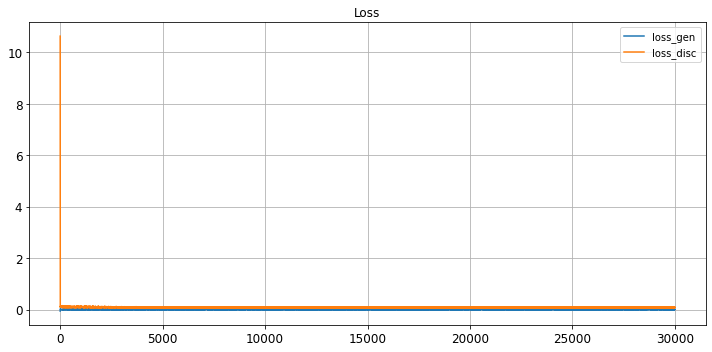

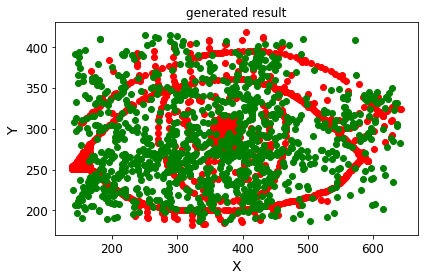

save the model & result
Epoch 30001/100000
critic: 0.088240 - generator: -0.000180 - 0s
Epoch 30002/100000
critic: 0.077689 - generator: 0.000043 - 0s
Epoch 30003/100000
critic: 0.080537 - generator: 0.000937 - 0s
Epoch 30004/100000
critic: 0.088755 - generator: -0.001599 - 0s
Epoch 30005/100000
critic: 0.082075 - generator: 0.000320 - 0s
Epoch 30006/100000
critic: 0.077749 - generator: 0.001706 - 0s
Epoch 30007/100000
critic: 0.076433 - generator: -0.001487 - 0s
Epoch 30008/100000
critic: 0.076522 - generator: -0.003522 - 0s
Epoch 30009/100000
critic: 0.083463 - generator: -0.003941 - 0s
Epoch 30010/100000
critic: 0.078652 - generator: 0.001344 - 0s
Epoch 30011/100000
critic: 0.082080 - generator: 0.001666 - 0s
Epoch 30012/100000
critic: 0.087531 - generator: 0.002513 - 0s
Epoch 30013/100000
critic: 0.077881 - generator: 0.001321 - 0s
Epoch 30014/100000
critic: 0.076006 - generator: 0.000700 - 0s
Epoch 30015/100000
critic: 0.084445 - generator: -0.000029 - 0s
Epoch 30016/100000
critic

critic: 0.082864 - generator: 0.002232 - 0s
Epoch 30131/100000
critic: 0.074360 - generator: -0.004826 - 0s
Epoch 30132/100000
critic: 0.081407 - generator: 0.000440 - 0s
Epoch 30133/100000
critic: 0.077419 - generator: 0.001976 - 0s
Epoch 30134/100000
critic: 0.068975 - generator: 0.000760 - 0s
Epoch 30135/100000
critic: 0.077146 - generator: -0.002160 - 0s
Epoch 30136/100000
critic: 0.082616 - generator: 0.000536 - 0s
Epoch 30137/100000
critic: 0.086525 - generator: 0.001290 - 0s
Epoch 30138/100000
critic: 0.086146 - generator: 0.000209 - 0s
Epoch 30139/100000
critic: 0.079613 - generator: 0.005209 - 0s
Epoch 30140/100000
critic: 0.077539 - generator: -0.002169 - 0s
Epoch 30141/100000
critic: 0.077612 - generator: -0.000110 - 0s
Epoch 30142/100000
critic: 0.076413 - generator: -0.000188 - 0s
Epoch 30143/100000
critic: 0.078656 - generator: 0.000399 - 0s
Epoch 30144/100000
critic: 0.084246 - generator: -0.003857 - 0s
Epoch 30145/100000
critic: 0.091386 - generator: -0.003633 - 0s
Epoc

critic: 0.091701 - generator: 0.000648 - 0s
Epoch 30260/100000
critic: 0.087542 - generator: 0.000443 - 0s
Epoch 30261/100000
critic: 0.069099 - generator: 0.002541 - 0s
Epoch 30262/100000
critic: 0.079285 - generator: 0.003299 - 0s
Epoch 30263/100000
critic: 0.093352 - generator: 0.003399 - 0s
Epoch 30264/100000
critic: 0.080503 - generator: -0.001241 - 0s
Epoch 30265/100000
critic: 0.084728 - generator: 0.000094 - 0s
Epoch 30266/100000
critic: 0.073073 - generator: 0.002677 - 0s
Epoch 30267/100000
critic: 0.087641 - generator: 0.002625 - 0s
Epoch 30268/100000
critic: 0.074578 - generator: 0.002022 - 0s
Epoch 30269/100000
critic: 0.083084 - generator: 0.001335 - 0s
Epoch 30270/100000
critic: 0.075712 - generator: -0.004817 - 0s
Epoch 30271/100000
critic: 0.085772 - generator: -0.002763 - 0s
Epoch 30272/100000
critic: 0.078613 - generator: -0.001523 - 0s
Epoch 30273/100000
critic: 0.088472 - generator: -0.001022 - 0s
Epoch 30274/100000
critic: 0.088124 - generator: 0.000327 - 0s
Epoch 

critic: 0.079958 - generator: -0.000127 - 0s
Epoch 30389/100000
critic: 0.073689 - generator: 0.002266 - 0s
Epoch 30390/100000
critic: 0.077637 - generator: -0.000629 - 0s
Epoch 30391/100000
critic: 0.072602 - generator: 0.002128 - 0s
Epoch 30392/100000
critic: 0.068881 - generator: 0.000454 - 0s
Epoch 30393/100000
critic: 0.084192 - generator: -0.002757 - 0s
Epoch 30394/100000
critic: 0.080922 - generator: -0.002935 - 0s
Epoch 30395/100000
critic: 0.080693 - generator: 0.004496 - 0s
Epoch 30396/100000
critic: 0.079526 - generator: -0.002239 - 0s
Epoch 30397/100000
critic: 0.085850 - generator: 0.001922 - 0s
Epoch 30398/100000
critic: 0.084116 - generator: 0.004147 - 0s
Epoch 30399/100000
critic: 0.088702 - generator: 0.005763 - 0s
Epoch 30400/100000
critic: 0.074389 - generator: 0.000522 - 0s
Epoch 30401/100000
critic: 0.078073 - generator: 0.002248 - 0s
Epoch 30402/100000
critic: 0.084292 - generator: 0.000771 - 0s
Epoch 30403/100000
critic: 0.078060 - generator: 0.000697 - 0s
Epoch 

critic: 0.088201 - generator: 0.002305 - 0s
Epoch 30519/100000
critic: 0.078883 - generator: -0.002943 - 0s
Epoch 30520/100000
critic: 0.081370 - generator: -0.003368 - 0s
Epoch 30521/100000
critic: 0.083873 - generator: -0.000627 - 0s
Epoch 30522/100000
critic: 0.085552 - generator: -0.001858 - 0s
Epoch 30523/100000
critic: 0.084831 - generator: -0.000806 - 0s
Epoch 30524/100000
critic: 0.085422 - generator: 0.002909 - 0s
Epoch 30525/100000
critic: 0.080744 - generator: -0.001823 - 0s
Epoch 30526/100000
critic: 0.085260 - generator: -0.003375 - 0s
Epoch 30527/100000
critic: 0.075224 - generator: -0.004497 - 0s
Epoch 30528/100000
critic: 0.077060 - generator: -0.001409 - 0s
Epoch 30529/100000
critic: 0.089634 - generator: -0.002777 - 0s
Epoch 30530/100000
critic: 0.080763 - generator: 0.003016 - 0s
Epoch 30531/100000
critic: 0.078216 - generator: -0.000717 - 0s
Epoch 30532/100000
critic: 0.072865 - generator: -0.000917 - 0s
Epoch 30533/100000
critic: 0.083878 - generator: -0.001956 - 0

critic: 0.084371 - generator: -0.003134 - 0s
Epoch 30648/100000
critic: 0.087515 - generator: 0.000379 - 0s
Epoch 30649/100000
critic: 0.077423 - generator: 0.000990 - 0s
Epoch 30650/100000
critic: 0.083401 - generator: -0.000924 - 0s
Epoch 30651/100000
critic: 0.073592 - generator: 0.001292 - 0s
Epoch 30652/100000
critic: 0.085741 - generator: 0.003321 - 0s
Epoch 30653/100000
critic: 0.081381 - generator: -0.003941 - 0s
Epoch 30654/100000
critic: 0.089293 - generator: -0.000053 - 0s
Epoch 30655/100000
critic: 0.082669 - generator: -0.004808 - 0s
Epoch 30656/100000
critic: 0.087548 - generator: -0.002621 - 0s
Epoch 30657/100000
critic: 0.080562 - generator: -0.004096 - 0s
Epoch 30658/100000
critic: 0.074559 - generator: -0.002040 - 0s
Epoch 30659/100000
critic: 0.080863 - generator: -0.000903 - 0s
Epoch 30660/100000
critic: 0.080904 - generator: 0.001213 - 0s
Epoch 30661/100000
critic: 0.075840 - generator: 0.000604 - 0s
Epoch 30662/100000
critic: 0.081387 - generator: 0.000599 - 0s
Ep

critic: 0.075750 - generator: -0.002991 - 0s
Epoch 30777/100000
critic: 0.070756 - generator: 0.001671 - 0s
Epoch 30778/100000
critic: 0.082915 - generator: -0.002219 - 0s
Epoch 30779/100000
critic: 0.081044 - generator: 0.000279 - 0s
Epoch 30780/100000
critic: 0.068048 - generator: -0.003855 - 0s
Epoch 30781/100000
critic: 0.081770 - generator: 0.001689 - 0s
Epoch 30782/100000
critic: 0.071931 - generator: -0.000768 - 0s
Epoch 30783/100000
critic: 0.092034 - generator: 0.000303 - 0s
Epoch 30784/100000
critic: 0.073435 - generator: 0.002669 - 0s
Epoch 30785/100000
critic: 0.089187 - generator: 0.001337 - 0s
Epoch 30786/100000
critic: 0.090261 - generator: -0.003635 - 0s
Epoch 30787/100000
critic: 0.076543 - generator: -0.000955 - 0s
Epoch 30788/100000
critic: 0.099420 - generator: 0.000158 - 0s
Epoch 30789/100000
critic: 0.095164 - generator: -0.000207 - 0s
Epoch 30790/100000
critic: 0.087429 - generator: -0.000734 - 0s
Epoch 30791/100000
critic: 0.075817 - generator: -0.003182 - 0s
Ep

critic: 0.082905 - generator: 0.001213 - 0s
Epoch 30907/100000
critic: 0.078605 - generator: 0.000331 - 0s
Epoch 30908/100000
critic: 0.086095 - generator: -0.002911 - 0s
Epoch 30909/100000
critic: 0.084874 - generator: -0.000479 - 0s
Epoch 30910/100000
critic: 0.090298 - generator: -0.000222 - 0s
Epoch 30911/100000
critic: 0.093368 - generator: 0.003891 - 0s
Epoch 30912/100000
critic: 0.091219 - generator: 0.002219 - 0s
Epoch 30913/100000
critic: 0.085729 - generator: -0.001375 - 0s
Epoch 30914/100000
critic: 0.089983 - generator: -0.002348 - 0s
Epoch 30915/100000
critic: 0.077910 - generator: -0.002243 - 0s
Epoch 30916/100000
critic: 0.086586 - generator: 0.000177 - 0s
Epoch 30917/100000
critic: 0.081001 - generator: 0.002325 - 0s
Epoch 30918/100000
critic: 0.081095 - generator: 0.001924 - 0s
Epoch 30919/100000
critic: 0.091805 - generator: 0.000461 - 0s
Epoch 30920/100000
critic: 0.080374 - generator: 0.003128 - 0s
Epoch 30921/100000
critic: 0.082749 - generator: -0.000233 - 0s
Epoc

critic: 0.084325 - generator: -0.003912 - 0s
Epoch 31037/100000
critic: 0.078499 - generator: -0.001408 - 0s
Epoch 31038/100000
critic: 0.081336 - generator: 0.000733 - 0s
Epoch 31039/100000
critic: 0.084968 - generator: -0.000956 - 0s
Epoch 31040/100000
critic: 0.080354 - generator: 0.000887 - 0s
Epoch 31041/100000
critic: 0.077104 - generator: 0.003861 - 0s
Epoch 31042/100000
critic: 0.085238 - generator: -0.001622 - 0s
Epoch 31043/100000
critic: 0.077065 - generator: -0.001036 - 0s
Epoch 31044/100000
critic: 0.085548 - generator: 0.003550 - 0s
Epoch 31045/100000
critic: 0.076575 - generator: 0.000751 - 0s
Epoch 31046/100000
critic: 0.087552 - generator: 0.000577 - 0s
Epoch 31047/100000
critic: 0.079413 - generator: -0.004071 - 0s
Epoch 31048/100000
critic: 0.095654 - generator: -0.000555 - 0s
Epoch 31049/100000
critic: 0.080914 - generator: 0.006010 - 0s
Epoch 31050/100000
critic: 0.087925 - generator: 0.000987 - 0s
Epoch 31051/100000
critic: 0.071539 - generator: -0.000230 - 0s
Epo

critic: 0.082716 - generator: 0.001119 - 0s
Epoch 31166/100000
critic: 0.083787 - generator: -0.000419 - 0s
Epoch 31167/100000
critic: 0.085367 - generator: -0.002949 - 0s
Epoch 31168/100000
critic: 0.079869 - generator: -0.001690 - 0s
Epoch 31169/100000
critic: 0.080128 - generator: -0.001644 - 0s
Epoch 31170/100000
critic: 0.084363 - generator: -0.000338 - 0s
Epoch 31171/100000
critic: 0.080945 - generator: 0.003150 - 0s
Epoch 31172/100000
critic: 0.076033 - generator: -0.002415 - 0s
Epoch 31173/100000
critic: 0.080738 - generator: 0.000238 - 0s
Epoch 31174/100000
critic: 0.072690 - generator: -0.001615 - 0s
Epoch 31175/100000
critic: 0.081265 - generator: -0.003500 - 0s
Epoch 31176/100000
critic: 0.093971 - generator: -0.000413 - 0s
Epoch 31177/100000
critic: 0.078165 - generator: 0.003027 - 0s
Epoch 31178/100000
critic: 0.081049 - generator: -0.006516 - 0s
Epoch 31179/100000
critic: 0.088745 - generator: -0.003583 - 0s
Epoch 31180/100000
critic: 0.085625 - generator: -0.002000 - 0s

critic: 0.081474 - generator: 0.001022 - 0s
Epoch 31295/100000
critic: 0.086712 - generator: -0.000197 - 0s
Epoch 31296/100000
critic: 0.079353 - generator: -0.000216 - 0s
Epoch 31297/100000
critic: 0.095451 - generator: 0.004702 - 0s
Epoch 31298/100000
critic: 0.078969 - generator: 0.004309 - 0s
Epoch 31299/100000
critic: 0.067117 - generator: 0.000107 - 0s
Epoch 31300/100000
critic: 0.081530 - generator: -0.000171 - 0s
Epoch 31301/100000
critic: 0.086405 - generator: -0.002009 - 0s
Epoch 31302/100000
critic: 0.083212 - generator: 0.000932 - 0s
Epoch 31303/100000
critic: 0.085008 - generator: 0.001475 - 0s
Epoch 31304/100000
critic: 0.080926 - generator: 0.002972 - 0s
Epoch 31305/100000
critic: 0.085275 - generator: -0.000006 - 0s
Epoch 31306/100000
critic: 0.077030 - generator: 0.000566 - 0s
Epoch 31307/100000
critic: 0.081552 - generator: 0.001755 - 0s
Epoch 31308/100000
critic: 0.090997 - generator: -0.001638 - 0s
Epoch 31309/100000
critic: 0.085030 - generator: -0.002880 - 0s
Epoc

critic: 0.071163 - generator: -0.003271 - 0s
Epoch 31425/100000
critic: 0.078800 - generator: 0.000010 - 0s
Epoch 31426/100000
critic: 0.087839 - generator: -0.000376 - 0s
Epoch 31427/100000
critic: 0.077395 - generator: -0.001765 - 0s
Epoch 31428/100000
critic: 0.080009 - generator: 0.000768 - 0s
Epoch 31429/100000
critic: 0.080191 - generator: 0.000023 - 0s
Epoch 31430/100000
critic: 0.084360 - generator: 0.000889 - 0s
Epoch 31431/100000
critic: 0.081963 - generator: -0.002459 - 0s
Epoch 31432/100000
critic: 0.073872 - generator: 0.001366 - 0s
Epoch 31433/100000
critic: 0.074920 - generator: -0.003201 - 0s
Epoch 31434/100000
critic: 0.077685 - generator: -0.000193 - 0s
Epoch 31435/100000
critic: 0.080492 - generator: -0.003119 - 0s
Epoch 31436/100000
critic: 0.082660 - generator: -0.000031 - 0s
Epoch 31437/100000
critic: 0.077160 - generator: 0.000371 - 0s
Epoch 31438/100000
critic: 0.086153 - generator: 0.000502 - 0s
Epoch 31439/100000
critic: 0.078041 - generator: 0.004922 - 0s
Epo

critic: 0.078576 - generator: 0.000481 - 0s
Epoch 31554/100000
critic: 0.077692 - generator: 0.001917 - 0s
Epoch 31555/100000
critic: 0.085774 - generator: -0.001685 - 0s
Epoch 31556/100000
critic: 0.080994 - generator: -0.003136 - 0s
Epoch 31557/100000
critic: 0.079094 - generator: 0.003257 - 0s
Epoch 31558/100000
critic: 0.080355 - generator: 0.004825 - 0s
Epoch 31559/100000
critic: 0.076126 - generator: 0.000246 - 0s
Epoch 31560/100000
critic: 0.084139 - generator: 0.000716 - 0s
Epoch 31561/100000
critic: 0.087050 - generator: -0.001235 - 0s
Epoch 31562/100000
critic: 0.087051 - generator: 0.000905 - 0s
Epoch 31563/100000
critic: 0.067078 - generator: 0.004871 - 0s
Epoch 31564/100000
critic: 0.078811 - generator: 0.002467 - 0s
Epoch 31565/100000
critic: 0.081891 - generator: 0.002741 - 0s
Epoch 31566/100000
critic: 0.076516 - generator: 0.003253 - 0s
Epoch 31567/100000
critic: 0.081181 - generator: 0.000396 - 0s
Epoch 31568/100000
critic: 0.084625 - generator: -0.000339 - 0s
Epoch 3

critic: 0.083358 - generator: -0.000689 - 0s
Epoch 31684/100000
critic: 0.070728 - generator: -0.000980 - 0s
Epoch 31685/100000
critic: 0.081620 - generator: 0.001666 - 0s
Epoch 31686/100000
critic: 0.080833 - generator: 0.000847 - 0s
Epoch 31687/100000
critic: 0.089540 - generator: 0.004380 - 0s
Epoch 31688/100000
critic: 0.075635 - generator: 0.004770 - 0s
Epoch 31689/100000
critic: 0.077726 - generator: 0.004806 - 0s
Epoch 31690/100000
critic: 0.081525 - generator: 0.000883 - 0s
Epoch 31691/100000
critic: 0.085420 - generator: 0.000322 - 0s
Epoch 31692/100000
critic: 0.084923 - generator: -0.003497 - 0s
Epoch 31693/100000
critic: 0.075518 - generator: -0.002832 - 0s
Epoch 31694/100000
critic: 0.077758 - generator: 0.000006 - 0s
Epoch 31695/100000
critic: 0.079051 - generator: 0.000847 - 0s
Epoch 31696/100000
critic: 0.080452 - generator: -0.000208 - 0s
Epoch 31697/100000
critic: 0.084977 - generator: -0.004930 - 0s
Epoch 31698/100000
critic: 0.085485 - generator: 0.000016 - 0s
Epoch

critic: 0.074736 - generator: -0.002005 - 0s
Epoch 31814/100000
critic: 0.089357 - generator: -0.001881 - 0s
Epoch 31815/100000
critic: 0.067794 - generator: -0.003044 - 0s
Epoch 31816/100000
critic: 0.083202 - generator: -0.004742 - 0s
Epoch 31817/100000
critic: 0.083518 - generator: 0.000689 - 0s
Epoch 31818/100000
critic: 0.069566 - generator: 0.002737 - 0s
Epoch 31819/100000
critic: 0.075375 - generator: -0.000571 - 0s
Epoch 31820/100000
critic: 0.080660 - generator: 0.001961 - 0s
Epoch 31821/100000
critic: 0.073841 - generator: -0.001072 - 0s
Epoch 31822/100000
critic: 0.079703 - generator: -0.000360 - 0s
Epoch 31823/100000
critic: 0.089901 - generator: -0.000053 - 0s
Epoch 31824/100000
critic: 0.091409 - generator: 0.003429 - 0s
Epoch 31825/100000
critic: 0.079445 - generator: -0.001307 - 0s
Epoch 31826/100000
critic: 0.086289 - generator: 0.000385 - 0s
Epoch 31827/100000
critic: 0.082009 - generator: -0.000846 - 0s
Epoch 31828/100000
critic: 0.083639 - generator: -0.002107 - 0s


critic: 0.078278 - generator: 0.002130 - 0s
Epoch 31943/100000
critic: 0.081669 - generator: 0.003133 - 0s
Epoch 31944/100000
critic: 0.081184 - generator: 0.000857 - 0s
Epoch 31945/100000
critic: 0.064132 - generator: 0.003599 - 0s
Epoch 31946/100000
critic: 0.087004 - generator: 0.002818 - 0s
Epoch 31947/100000
critic: 0.085270 - generator: -0.000722 - 0s
Epoch 31948/100000
critic: 0.089313 - generator: 0.003762 - 0s
Epoch 31949/100000
critic: 0.079399 - generator: 0.004060 - 0s
Epoch 31950/100000
critic: 0.082712 - generator: -0.001864 - 0s
Epoch 31951/100000
critic: 0.080715 - generator: -0.001520 - 0s
Epoch 31952/100000
critic: 0.084226 - generator: 0.000561 - 0s
Epoch 31953/100000
critic: 0.082194 - generator: -0.000723 - 0s
Epoch 31954/100000
critic: 0.082211 - generator: -0.000515 - 0s
Epoch 31955/100000
critic: 0.079162 - generator: -0.000270 - 0s
Epoch 31956/100000
critic: 0.084408 - generator: 0.002352 - 0s
Epoch 31957/100000
critic: 0.079839 - generator: 0.000738 - 0s
Epoch

critic: 0.086473 - generator: 0.001044 - 0s
Epoch 32073/100000
critic: 0.079089 - generator: -0.001348 - 0s
Epoch 32074/100000
critic: 0.081883 - generator: -0.000725 - 0s
Epoch 32075/100000
critic: 0.085707 - generator: -0.000406 - 0s
Epoch 32076/100000
critic: 0.083710 - generator: -0.004008 - 0s
Epoch 32077/100000
critic: 0.076636 - generator: 0.000710 - 0s
Epoch 32078/100000
critic: 0.073227 - generator: -0.001466 - 0s
Epoch 32079/100000
critic: 0.089413 - generator: -0.000615 - 0s
Epoch 32080/100000
critic: 0.077728 - generator: 0.003436 - 0s
Epoch 32081/100000
critic: 0.083342 - generator: 0.001683 - 0s
Epoch 32082/100000
critic: 0.077208 - generator: 0.001284 - 0s
Epoch 32083/100000
critic: 0.089876 - generator: -0.004470 - 0s
Epoch 32084/100000
critic: 0.073780 - generator: 0.000402 - 0s
Epoch 32085/100000
critic: 0.089188 - generator: -0.002074 - 0s
Epoch 32086/100000
critic: 0.077770 - generator: 0.000862 - 0s
Epoch 32087/100000
critic: 0.070450 - generator: 0.000425 - 0s
Epo

critic: 0.087434 - generator: 0.001235 - 0s
Epoch 32202/100000
critic: 0.069807 - generator: -0.000254 - 0s
Epoch 32203/100000
critic: 0.075505 - generator: -0.001855 - 0s
Epoch 32204/100000
critic: 0.084367 - generator: 0.000435 - 0s
Epoch 32205/100000
critic: 0.079120 - generator: -0.001674 - 0s
Epoch 32206/100000
critic: 0.078538 - generator: -0.000223 - 0s
Epoch 32207/100000
critic: 0.086902 - generator: 0.000851 - 0s
Epoch 32208/100000
critic: 0.077352 - generator: -0.000833 - 0s
Epoch 32209/100000
critic: 0.063067 - generator: 0.000998 - 0s
Epoch 32210/100000
critic: 0.094717 - generator: 0.000917 - 0s
Epoch 32211/100000
critic: 0.084181 - generator: -0.000066 - 0s
Epoch 32212/100000
critic: 0.086448 - generator: -0.001541 - 0s
Epoch 32213/100000
critic: 0.080529 - generator: 0.002024 - 0s
Epoch 32214/100000
critic: 0.090725 - generator: 0.001711 - 0s
Epoch 32215/100000
critic: 0.086815 - generator: -0.001307 - 0s
Epoch 32216/100000
critic: 0.074139 - generator: 0.001073 - 0s
Epo

critic: 0.082591 - generator: 0.001002 - 0s
Epoch 32331/100000
critic: 0.075736 - generator: 0.001129 - 0s
Epoch 32332/100000
critic: 0.087436 - generator: 0.002566 - 0s
Epoch 32333/100000
critic: 0.079858 - generator: 0.002170 - 0s
Epoch 32334/100000
critic: 0.073998 - generator: -0.005353 - 0s
Epoch 32335/100000
critic: 0.084023 - generator: -0.004961 - 0s
Epoch 32336/100000
critic: 0.083259 - generator: -0.001273 - 0s
Epoch 32337/100000
critic: 0.077729 - generator: -0.002457 - 0s
Epoch 32338/100000
critic: 0.084005 - generator: -0.000616 - 0s
Epoch 32339/100000
critic: 0.085396 - generator: -0.003290 - 0s
Epoch 32340/100000
critic: 0.080013 - generator: -0.000242 - 0s
Epoch 32341/100000
critic: 0.090700 - generator: 0.002184 - 0s
Epoch 32342/100000
critic: 0.076912 - generator: -0.000903 - 0s
Epoch 32343/100000
critic: 0.075214 - generator: 0.001458 - 0s
Epoch 32344/100000
critic: 0.084738 - generator: 0.001969 - 0s
Epoch 32345/100000
critic: 0.073544 - generator: -0.001663 - 0s
Ep

critic: 0.084517 - generator: 0.002317 - 0s
Epoch 32460/100000
critic: 0.079642 - generator: 0.003300 - 0s
Epoch 32461/100000
critic: 0.079043 - generator: -0.000078 - 0s
Epoch 32462/100000
critic: 0.079995 - generator: 0.001062 - 0s
Epoch 32463/100000
critic: 0.099569 - generator: 0.004308 - 0s
Epoch 32464/100000
critic: 0.084105 - generator: 0.005512 - 0s
Epoch 32465/100000
critic: 0.078215 - generator: 0.001801 - 0s
Epoch 32466/100000
critic: 0.093240 - generator: 0.004951 - 0s
Epoch 32467/100000
critic: 0.084543 - generator: 0.002718 - 0s
Epoch 32468/100000
critic: 0.088776 - generator: 0.000360 - 0s
Epoch 32469/100000
critic: 0.076526 - generator: -0.000483 - 0s
Epoch 32470/100000
critic: 0.080060 - generator: 0.001198 - 0s
Epoch 32471/100000
critic: 0.081039 - generator: -0.000197 - 0s
Epoch 32472/100000
critic: 0.087212 - generator: 0.002975 - 0s
Epoch 32473/100000
critic: 0.078836 - generator: 0.000298 - 0s
Epoch 32474/100000
critic: 0.074976 - generator: -0.004041 - 0s
Epoch 3

critic: 0.075100 - generator: 0.001743 - 0s
Epoch 32590/100000
critic: 0.079875 - generator: -0.001887 - 0s
Epoch 32591/100000
critic: 0.090378 - generator: 0.000974 - 0s
Epoch 32592/100000
critic: 0.077562 - generator: 0.000268 - 0s
Epoch 32593/100000
critic: 0.074234 - generator: 0.002325 - 0s
Epoch 32594/100000
critic: 0.082902 - generator: 0.003685 - 0s
Epoch 32595/100000
critic: 0.089364 - generator: 0.001637 - 0s
Epoch 32596/100000
critic: 0.075510 - generator: 0.001037 - 0s
Epoch 32597/100000
critic: 0.095564 - generator: 0.000837 - 0s
Epoch 32598/100000
critic: 0.072313 - generator: 0.000630 - 0s
Epoch 32599/100000
critic: 0.080622 - generator: -0.003099 - 0s
Epoch 32600/100000
critic: 0.087116 - generator: -0.001759 - 0s
Epoch 32601/100000
critic: 0.081135 - generator: -0.002025 - 0s
Epoch 32602/100000
critic: 0.085879 - generator: -0.000339 - 0s
Epoch 32603/100000
critic: 0.081652 - generator: -0.003384 - 0s
Epoch 32604/100000
critic: 0.076697 - generator: -0.001738 - 0s
Epoc

critic: 0.073160 - generator: 0.002934 - 0s
Epoch 32720/100000
critic: 0.084930 - generator: 0.002389 - 0s
Epoch 32721/100000
critic: 0.082132 - generator: -0.002947 - 0s
Epoch 32722/100000
critic: 0.080895 - generator: -0.001374 - 0s
Epoch 32723/100000
critic: 0.082681 - generator: 0.000737 - 0s
Epoch 32724/100000
critic: 0.094329 - generator: 0.002129 - 0s
Epoch 32725/100000
critic: 0.080856 - generator: -0.000507 - 0s
Epoch 32726/100000
critic: 0.087270 - generator: -0.005534 - 0s
Epoch 32727/100000
critic: 0.085330 - generator: -0.002309 - 0s
Epoch 32728/100000
critic: 0.082176 - generator: 0.006237 - 0s
Epoch 32729/100000
critic: 0.088635 - generator: 0.001812 - 0s
Epoch 32730/100000
critic: 0.084584 - generator: 0.003733 - 0s
Epoch 32731/100000
critic: 0.083598 - generator: -0.002010 - 0s
Epoch 32732/100000
critic: 0.072624 - generator: 0.000767 - 0s
Epoch 32733/100000
critic: 0.078727 - generator: 0.001632 - 0s
Epoch 32734/100000
critic: 0.076871 - generator: 0.002679 - 0s
Epoch

critic: 0.081447 - generator: 0.003904 - 0s
Epoch 32850/100000
critic: 0.079607 - generator: 0.003690 - 0s
Epoch 32851/100000
critic: 0.073856 - generator: 0.000251 - 0s
Epoch 32852/100000
critic: 0.092004 - generator: -0.000933 - 0s
Epoch 32853/100000
critic: 0.083825 - generator: 0.003005 - 0s
Epoch 32854/100000
critic: 0.081567 - generator: 0.000652 - 0s
Epoch 32855/100000
critic: 0.082486 - generator: -0.001400 - 0s
Epoch 32856/100000
critic: 0.074365 - generator: 0.002609 - 0s
Epoch 32857/100000
critic: 0.091778 - generator: 0.002107 - 0s
Epoch 32858/100000
critic: 0.088639 - generator: 0.001078 - 0s
Epoch 32859/100000
critic: 0.081802 - generator: 0.003138 - 0s
Epoch 32860/100000
critic: 0.077031 - generator: 0.002436 - 0s
Epoch 32861/100000
critic: 0.089800 - generator: -0.002149 - 0s
Epoch 32862/100000
critic: 0.074373 - generator: 0.001586 - 0s
Epoch 32863/100000
critic: 0.076441 - generator: 0.001727 - 0s
Epoch 32864/100000
critic: 0.091303 - generator: -0.001244 - 0s
Epoch 3

critic: 0.080245 - generator: 0.000650 - 0s
Epoch 32979/100000
critic: 0.092071 - generator: -0.001147 - 0s
Epoch 32980/100000
critic: 0.083051 - generator: 0.000415 - 0s
Epoch 32981/100000
critic: 0.078292 - generator: -0.002745 - 0s
Epoch 32982/100000
critic: 0.073612 - generator: -0.001225 - 0s
Epoch 32983/100000
critic: 0.089373 - generator: -0.000908 - 0s
Epoch 32984/100000
critic: 0.082848 - generator: -0.003402 - 0s
Epoch 32985/100000
critic: 0.074369 - generator: -0.003227 - 0s
Epoch 32986/100000
critic: 0.075512 - generator: -0.001697 - 0s
Epoch 32987/100000
critic: 0.085359 - generator: -0.003161 - 0s
Epoch 32988/100000
critic: 0.076844 - generator: -0.000848 - 0s
Epoch 32989/100000
critic: 0.080279 - generator: 0.002712 - 0s
Epoch 32990/100000
critic: 0.077521 - generator: -0.000349 - 0s
Epoch 32991/100000
critic: 0.084737 - generator: 0.001819 - 0s
Epoch 32992/100000
critic: 0.075580 - generator: 0.002204 - 0s
Epoch 32993/100000
critic: 0.076852 - generator: -0.000227 - 0s


critic: 0.094597 - generator: -0.000668 - 0s
Epoch 33108/100000
critic: 0.080981 - generator: -0.003518 - 0s
Epoch 33109/100000
critic: 0.081747 - generator: -0.005608 - 0s
Epoch 33110/100000
critic: 0.083921 - generator: -0.005334 - 0s
Epoch 33111/100000
critic: 0.083911 - generator: 0.000518 - 0s
Epoch 33112/100000
critic: 0.074010 - generator: -0.003945 - 0s
Epoch 33113/100000
critic: 0.083890 - generator: 0.000771 - 0s
Epoch 33114/100000
critic: 0.081127 - generator: 0.000209 - 0s
Epoch 33115/100000
critic: 0.077621 - generator: 0.002733 - 0s
Epoch 33116/100000
critic: 0.084311 - generator: -0.002464 - 0s
Epoch 33117/100000
critic: 0.085299 - generator: -0.000941 - 0s
Epoch 33118/100000
critic: 0.077956 - generator: -0.001063 - 0s
Epoch 33119/100000
critic: 0.078044 - generator: 0.000083 - 0s
Epoch 33120/100000
critic: 0.076363 - generator: -0.004010 - 0s
Epoch 33121/100000
critic: 0.082019 - generator: -0.000704 - 0s
Epoch 33122/100000
critic: 0.079034 - generator: 0.000682 - 0s
E

critic: 0.083847 - generator: 0.001649 - 0s
Epoch 33237/100000
critic: 0.077555 - generator: 0.003555 - 0s
Epoch 33238/100000
critic: 0.086179 - generator: 0.000378 - 0s
Epoch 33239/100000
critic: 0.082235 - generator: -0.000627 - 0s
Epoch 33240/100000
critic: 0.078059 - generator: -0.007893 - 0s
Epoch 33241/100000
critic: 0.094531 - generator: -0.004082 - 0s
Epoch 33242/100000
critic: 0.077722 - generator: -0.000713 - 0s
Epoch 33243/100000
critic: 0.073934 - generator: 0.003937 - 0s
Epoch 33244/100000
critic: 0.076839 - generator: 0.001338 - 0s
Epoch 33245/100000
critic: 0.076078 - generator: 0.000151 - 0s
Epoch 33246/100000
critic: 0.083300 - generator: -0.004149 - 0s
Epoch 33247/100000
critic: 0.077569 - generator: 0.000982 - 0s
Epoch 33248/100000
critic: 0.085720 - generator: 0.002747 - 0s
Epoch 33249/100000
critic: 0.083429 - generator: 0.001990 - 0s
Epoch 33250/100000
critic: 0.087272 - generator: -0.000281 - 0s
Epoch 33251/100000
critic: 0.070014 - generator: 0.002224 - 0s
Epoch

critic: 0.074977 - generator: -0.001428 - 0s
Epoch 33367/100000
critic: 0.076594 - generator: -0.001521 - 0s
Epoch 33368/100000
critic: 0.084280 - generator: -0.002483 - 0s
Epoch 33369/100000
critic: 0.086684 - generator: -0.001335 - 1s
Epoch 33370/100000
critic: 0.083368 - generator: 0.000041 - 0s
Epoch 33371/100000
critic: 0.078891 - generator: -0.002691 - 1s
Epoch 33372/100000
critic: 0.080185 - generator: -0.003956 - 0s
Epoch 33373/100000
critic: 0.073467 - generator: -0.003873 - 1s
Epoch 33374/100000
critic: 0.086163 - generator: 0.000534 - 0s
Epoch 33375/100000
critic: 0.089327 - generator: -0.000601 - 0s
Epoch 33376/100000
critic: 0.067700 - generator: 0.002538 - 0s
Epoch 33377/100000
critic: 0.085573 - generator: -0.004312 - 0s
Epoch 33378/100000
critic: 0.069328 - generator: 0.001571 - 1s
Epoch 33379/100000
critic: 0.076834 - generator: 0.003034 - 0s
Epoch 33380/100000
critic: 0.086084 - generator: 0.001203 - 0s
Epoch 33381/100000
critic: 0.082840 - generator: -0.000975 - 0s
E

critic: 0.080812 - generator: 0.000848 - 0s
Epoch 33496/100000
critic: 0.086884 - generator: 0.001117 - 0s
Epoch 33497/100000
critic: 0.078343 - generator: 0.002960 - 0s
Epoch 33498/100000
critic: 0.079899 - generator: 0.002648 - 0s
Epoch 33499/100000
critic: 0.079235 - generator: 0.002135 - 0s
Epoch 33500/100000
critic: 0.075588 - generator: -0.001002 - 0s
Epoch 33501/100000
critic: 0.088603 - generator: -0.001027 - 0s
Epoch 33502/100000
critic: 0.079344 - generator: -0.000675 - 0s
Epoch 33503/100000
critic: 0.082864 - generator: 0.000063 - 0s
Epoch 33504/100000
critic: 0.085681 - generator: -0.000632 - 0s
Epoch 33505/100000
critic: 0.085028 - generator: -0.003334 - 0s
Epoch 33506/100000
critic: 0.086744 - generator: -0.000830 - 0s
Epoch 33507/100000
critic: 0.068386 - generator: 0.000721 - 0s
Epoch 33508/100000
critic: 0.083302 - generator: 0.001617 - 0s
Epoch 33509/100000
critic: 0.087200 - generator: -0.000596 - 0s
Epoch 33510/100000
critic: 0.084039 - generator: -0.001672 - 0s
Epo

critic: 0.081424 - generator: 0.002208 - 0s
Epoch 33626/100000
critic: 0.085205 - generator: -0.000529 - 0s
Epoch 33627/100000
critic: 0.076496 - generator: -0.001807 - 0s
Epoch 33628/100000
critic: 0.087712 - generator: -0.005653 - 0s
Epoch 33629/100000
critic: 0.083383 - generator: -0.001618 - 0s
Epoch 33630/100000
critic: 0.077669 - generator: -0.001497 - 0s
Epoch 33631/100000
critic: 0.084047 - generator: 0.004149 - 0s
Epoch 33632/100000
critic: 0.075573 - generator: 0.002902 - 0s
Epoch 33633/100000
critic: 0.083517 - generator: 0.001745 - 0s
Epoch 33634/100000
critic: 0.077256 - generator: 0.002860 - 0s
Epoch 33635/100000
critic: 0.083708 - generator: 0.000809 - 0s
Epoch 33636/100000
critic: 0.093339 - generator: -0.001098 - 0s
Epoch 33637/100000
critic: 0.080699 - generator: 0.000262 - 0s
Epoch 33638/100000
critic: 0.086560 - generator: -0.002605 - 0s
Epoch 33639/100000
critic: 0.077975 - generator: 0.001448 - 0s
Epoch 33640/100000
critic: 0.086839 - generator: -0.002425 - 0s
Epo

critic: 0.072084 - generator: -0.000546 - 0s
Epoch 33755/100000
critic: 0.073619 - generator: -0.000620 - 0s
Epoch 33756/100000
critic: 0.077654 - generator: -0.003324 - 0s
Epoch 33757/100000
critic: 0.091717 - generator: 0.000667 - 0s
Epoch 33758/100000
critic: 0.078499 - generator: -0.000389 - 0s
Epoch 33759/100000
critic: 0.080431 - generator: 0.001408 - 0s
Epoch 33760/100000
critic: 0.080575 - generator: 0.001229 - 0s
Epoch 33761/100000
critic: 0.088498 - generator: -0.002706 - 0s
Epoch 33762/100000
critic: 0.079171 - generator: 0.000700 - 0s
Epoch 33763/100000
critic: 0.085593 - generator: 0.002447 - 0s
Epoch 33764/100000
critic: 0.073061 - generator: 0.001861 - 0s
Epoch 33765/100000
critic: 0.088411 - generator: 0.003154 - 0s
Epoch 33766/100000
critic: 0.077320 - generator: 0.002456 - 0s
Epoch 33767/100000
critic: 0.091435 - generator: 0.004134 - 0s
Epoch 33768/100000
critic: 0.081330 - generator: 0.001468 - 0s
Epoch 33769/100000
critic: 0.076136 - generator: 0.003127 - 0s
Epoch 

critic: 0.077658 - generator: -0.001594 - 0s
Epoch 33884/100000
critic: 0.090852 - generator: -0.000420 - 0s
Epoch 33885/100000
critic: 0.090175 - generator: -0.003375 - 0s
Epoch 33886/100000
critic: 0.081559 - generator: 0.000478 - 0s
Epoch 33887/100000
critic: 0.090052 - generator: -0.001114 - 0s
Epoch 33888/100000
critic: 0.091716 - generator: -0.002356 - 0s
Epoch 33889/100000
critic: 0.087378 - generator: 0.000220 - 0s
Epoch 33890/100000
critic: 0.085991 - generator: 0.000802 - 0s
Epoch 33891/100000
critic: 0.077256 - generator: 0.001184 - 0s
Epoch 33892/100000
critic: 0.080631 - generator: 0.000756 - 0s
Epoch 33893/100000
critic: 0.076340 - generator: 0.000622 - 0s
Epoch 33894/100000
critic: 0.078049 - generator: -0.001807 - 0s
Epoch 33895/100000
critic: 0.077827 - generator: -0.002565 - 0s
Epoch 33896/100000
critic: 0.085896 - generator: -0.001589 - 0s
Epoch 33897/100000
critic: 0.074755 - generator: -0.000565 - 0s
Epoch 33898/100000
critic: 0.086592 - generator: 0.000293 - 0s
Ep

critic: 0.080898 - generator: -0.001737 - 0s
Epoch 34014/100000
critic: 0.074667 - generator: -0.000258 - 0s
Epoch 34015/100000
critic: 0.088089 - generator: -0.002836 - 0s
Epoch 34016/100000
critic: 0.081056 - generator: -0.002139 - 0s
Epoch 34017/100000
critic: 0.074094 - generator: -0.006221 - 0s
Epoch 34018/100000
critic: 0.073012 - generator: -0.000237 - 0s
Epoch 34019/100000
critic: 0.069378 - generator: -0.002085 - 0s
Epoch 34020/100000
critic: 0.087552 - generator: -0.003370 - 0s
Epoch 34021/100000
critic: 0.080727 - generator: -0.000637 - 0s
Epoch 34022/100000
critic: 0.081585 - generator: 0.002790 - 0s
Epoch 34023/100000
critic: 0.080278 - generator: 0.004438 - 0s
Epoch 34024/100000
critic: 0.081900 - generator: 0.002086 - 0s
Epoch 34025/100000
critic: 0.079218 - generator: 0.004239 - 0s
Epoch 34026/100000
critic: 0.074241 - generator: 0.001095 - 0s
Epoch 34027/100000
critic: 0.078889 - generator: 0.004058 - 0s
Epoch 34028/100000
critic: 0.084014 - generator: 0.002597 - 0s
Ep

critic: 0.078998 - generator: 0.003010 - 0s
Epoch 34143/100000
critic: 0.083365 - generator: 0.002837 - 0s
Epoch 34144/100000
critic: 0.089127 - generator: -0.000372 - 0s
Epoch 34145/100000
critic: 0.077947 - generator: -0.002996 - 0s
Epoch 34146/100000
critic: 0.083611 - generator: -0.002156 - 0s
Epoch 34147/100000
critic: 0.087630 - generator: 0.000371 - 0s
Epoch 34148/100000
critic: 0.081152 - generator: 0.000935 - 0s
Epoch 34149/100000
critic: 0.079685 - generator: -0.004682 - 0s
Epoch 34150/100000
critic: 0.066669 - generator: -0.001725 - 0s
Epoch 34151/100000
critic: 0.082121 - generator: 0.000650 - 0s
Epoch 34152/100000
critic: 0.089937 - generator: -0.003096 - 0s
Epoch 34153/100000
critic: 0.076426 - generator: -0.002830 - 0s
Epoch 34154/100000
critic: 0.091903 - generator: 0.002810 - 0s
Epoch 34155/100000
critic: 0.074678 - generator: 0.002751 - 0s
Epoch 34156/100000
critic: 0.086666 - generator: -0.001570 - 0s
Epoch 34157/100000
critic: 0.073815 - generator: -0.001411 - 0s
Ep

critic: 0.086703 - generator: 0.004320 - 0s
Epoch 34273/100000
critic: 0.071346 - generator: 0.002951 - 0s
Epoch 34274/100000
critic: 0.077399 - generator: -0.000739 - 0s
Epoch 34275/100000
critic: 0.084844 - generator: -0.002084 - 0s
Epoch 34276/100000
critic: 0.088489 - generator: -0.001177 - 0s
Epoch 34277/100000
critic: 0.078131 - generator: 0.001033 - 0s
Epoch 34278/100000
critic: 0.086382 - generator: -0.004222 - 0s
Epoch 34279/100000
critic: 0.085217 - generator: 0.002278 - 0s
Epoch 34280/100000
critic: 0.082955 - generator: -0.001153 - 0s
Epoch 34281/100000
critic: 0.093080 - generator: -0.000007 - 0s
Epoch 34282/100000
critic: 0.074294 - generator: -0.000599 - 0s
Epoch 34283/100000
critic: 0.087160 - generator: 0.001677 - 0s
Epoch 34284/100000
critic: 0.076289 - generator: 0.003159 - 0s
Epoch 34285/100000
critic: 0.074748 - generator: -0.001914 - 0s
Epoch 34286/100000
critic: 0.091487 - generator: -0.001204 - 0s
Epoch 34287/100000
critic: 0.086628 - generator: 0.002004 - 0s
Ep

critic: 0.075664 - generator: -0.004507 - 0s
Epoch 34403/100000
critic: 0.089594 - generator: 0.000062 - 0s
Epoch 34404/100000
critic: 0.083132 - generator: 0.002995 - 0s
Epoch 34405/100000
critic: 0.082919 - generator: 0.001452 - 0s
Epoch 34406/100000
critic: 0.066831 - generator: -0.001650 - 0s
Epoch 34407/100000
critic: 0.088733 - generator: 0.000939 - 0s
Epoch 34408/100000
critic: 0.077125 - generator: -0.002988 - 0s
Epoch 34409/100000
critic: 0.081195 - generator: -0.001591 - 0s
Epoch 34410/100000
critic: 0.088322 - generator: 0.001905 - 0s
Epoch 34411/100000
critic: 0.076129 - generator: 0.002006 - 0s
Epoch 34412/100000
critic: 0.088911 - generator: -0.002274 - 0s
Epoch 34413/100000
critic: 0.069107 - generator: 0.001519 - 0s
Epoch 34414/100000
critic: 0.090183 - generator: -0.001435 - 0s
Epoch 34415/100000
critic: 0.078753 - generator: -0.003073 - 0s
Epoch 34416/100000
critic: 0.076647 - generator: -0.001137 - 0s
Epoch 34417/100000
critic: 0.079799 - generator: 0.002099 - 0s
Epo

critic: 0.089149 - generator: 0.002511 - 0s
Epoch 34533/100000
critic: 0.092396 - generator: -0.000230 - 0s
Epoch 34534/100000
critic: 0.078517 - generator: -0.003206 - 0s
Epoch 34535/100000
critic: 0.077793 - generator: -0.002948 - 0s
Epoch 34536/100000
critic: 0.086696 - generator: 0.001536 - 0s
Epoch 34537/100000
critic: 0.075861 - generator: 0.001823 - 0s
Epoch 34538/100000
critic: 0.071398 - generator: -0.000397 - 0s
Epoch 34539/100000
critic: 0.079076 - generator: 0.003225 - 0s
Epoch 34540/100000
critic: 0.079286 - generator: 0.002055 - 0s
Epoch 34541/100000
critic: 0.081886 - generator: 0.002002 - 0s
Epoch 34542/100000
critic: 0.070657 - generator: 0.000909 - 0s
Epoch 34543/100000
critic: 0.085019 - generator: -0.003592 - 0s
Epoch 34544/100000
critic: 0.082492 - generator: 0.001256 - 0s
Epoch 34545/100000
critic: 0.082842 - generator: 0.000330 - 0s
Epoch 34546/100000
critic: 0.067250 - generator: 0.003605 - 0s
Epoch 34547/100000
critic: 0.087911 - generator: 0.001342 - 0s
Epoch 

critic: 0.088444 - generator: -0.004413 - 0s
Epoch 34663/100000
critic: 0.083349 - generator: 0.000832 - 0s
Epoch 34664/100000
critic: 0.083502 - generator: -0.001535 - 0s
Epoch 34665/100000
critic: 0.095666 - generator: 0.001442 - 0s
Epoch 34666/100000
critic: 0.084186 - generator: -0.001703 - 0s
Epoch 34667/100000
critic: 0.069849 - generator: 0.002287 - 0s
Epoch 34668/100000
critic: 0.085070 - generator: -0.000411 - 0s
Epoch 34669/100000
critic: 0.085570 - generator: 0.003201 - 0s
Epoch 34670/100000
critic: 0.069801 - generator: -0.001128 - 0s
Epoch 34671/100000
critic: 0.080967 - generator: -0.004265 - 0s
Epoch 34672/100000
critic: 0.072708 - generator: 0.000150 - 0s
Epoch 34673/100000
critic: 0.080091 - generator: -0.002615 - 0s
Epoch 34674/100000
critic: 0.085849 - generator: -0.000635 - 0s
Epoch 34675/100000
critic: 0.090659 - generator: -0.001839 - 0s
Epoch 34676/100000
critic: 0.078821 - generator: -0.000324 - 0s
Epoch 34677/100000
critic: 0.085356 - generator: -0.004517 - 0s


critic: 0.080249 - generator: 0.001763 - 0s
Epoch 34792/100000
critic: 0.084340 - generator: 0.001459 - 0s
Epoch 34793/100000
critic: 0.089982 - generator: -0.001414 - 0s
Epoch 34794/100000
critic: 0.080402 - generator: -0.002990 - 0s
Epoch 34795/100000
critic: 0.084125 - generator: -0.001190 - 0s
Epoch 34796/100000
critic: 0.094892 - generator: -0.000805 - 0s
Epoch 34797/100000
critic: 0.067883 - generator: -0.001407 - 0s
Epoch 34798/100000
critic: 0.068694 - generator: 0.003315 - 0s
Epoch 34799/100000
critic: 0.096261 - generator: 0.003191 - 0s
Epoch 34800/100000
critic: 0.083631 - generator: -0.003678 - 0s
Epoch 34801/100000
critic: 0.083791 - generator: 0.000113 - 0s
Epoch 34802/100000
critic: 0.082519 - generator: 0.001697 - 0s
Epoch 34803/100000
critic: 0.076383 - generator: 0.003957 - 0s
Epoch 34804/100000
critic: 0.082482 - generator: 0.002931 - 0s
Epoch 34805/100000
critic: 0.095840 - generator: 0.001763 - 0s
Epoch 34806/100000
critic: 0.072496 - generator: -0.000223 - 0s
Epoc

critic: 0.081192 - generator: -0.004532 - 0s
Epoch 34922/100000
critic: 0.081372 - generator: 0.002274 - 0s
Epoch 34923/100000
critic: 0.087501 - generator: 0.001621 - 0s
Epoch 34924/100000
critic: 0.083794 - generator: 0.001417 - 0s
Epoch 34925/100000
critic: 0.084771 - generator: 0.004767 - 0s
Epoch 34926/100000
critic: 0.090064 - generator: 0.004851 - 0s
Epoch 34927/100000
critic: 0.089777 - generator: -0.000672 - 0s
Epoch 34928/100000
critic: 0.081858 - generator: 0.000158 - 0s
Epoch 34929/100000
critic: 0.074849 - generator: -0.004822 - 0s
Epoch 34930/100000
critic: 0.080448 - generator: -0.001051 - 0s
Epoch 34931/100000
critic: 0.080747 - generator: -0.000067 - 0s
Epoch 34932/100000
critic: 0.084519 - generator: 0.002066 - 0s
Epoch 34933/100000
critic: 0.079185 - generator: 0.000674 - 0s
Epoch 34934/100000
critic: 0.077331 - generator: -0.000591 - 0s
Epoch 34935/100000
critic: 0.081745 - generator: -0.002193 - 0s
Epoch 34936/100000
critic: 0.077158 - generator: -0.002134 - 0s
Epo

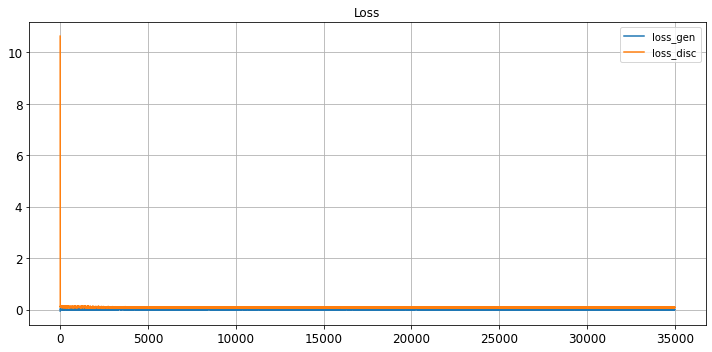

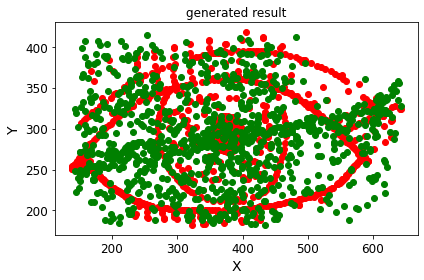

save the model & result
Epoch 35001/100000
critic: 0.079695 - generator: -0.002731 - 0s
Epoch 35002/100000
critic: 0.084945 - generator: -0.004871 - 0s
Epoch 35003/100000
critic: 0.075445 - generator: -0.001816 - 0s
Epoch 35004/100000
critic: 0.065964 - generator: -0.003673 - 0s
Epoch 35005/100000
critic: 0.079765 - generator: -0.000475 - 0s
Epoch 35006/100000
critic: 0.079881 - generator: 0.001999 - 0s
Epoch 35007/100000
critic: 0.087530 - generator: -0.003331 - 0s
Epoch 35008/100000
critic: 0.075675 - generator: -0.003646 - 0s
Epoch 35009/100000
critic: 0.077788 - generator: -0.001078 - 0s
Epoch 35010/100000
critic: 0.077525 - generator: -0.000459 - 0s
Epoch 35011/100000
critic: 0.081094 - generator: -0.001395 - 0s
Epoch 35012/100000
critic: 0.076879 - generator: -0.000092 - 0s
Epoch 35013/100000
critic: 0.086607 - generator: 0.000300 - 0s
Epoch 35014/100000
critic: 0.090048 - generator: 0.001423 - 0s
Epoch 35015/100000
critic: 0.079255 - generator: -0.000804 - 0s
Epoch 35016/100000


critic: 0.076561 - generator: 0.002320 - 0s
Epoch 35131/100000
critic: 0.081104 - generator: -0.000748 - 0s
Epoch 35132/100000
critic: 0.085611 - generator: 0.000904 - 0s
Epoch 35133/100000
critic: 0.077033 - generator: -0.001047 - 0s
Epoch 35134/100000
critic: 0.077505 - generator: -0.001564 - 0s
Epoch 35135/100000
critic: 0.080930 - generator: 0.002330 - 0s
Epoch 35136/100000
critic: 0.083245 - generator: -0.001175 - 0s
Epoch 35137/100000
critic: 0.080077 - generator: -0.000242 - 0s
Epoch 35138/100000
critic: 0.079890 - generator: 0.001592 - 0s
Epoch 35139/100000
critic: 0.081578 - generator: -0.000404 - 0s
Epoch 35140/100000
critic: 0.067690 - generator: 0.001264 - 0s
Epoch 35141/100000
critic: 0.083037 - generator: 0.000266 - 0s
Epoch 35142/100000
critic: 0.092393 - generator: -0.005935 - 0s
Epoch 35143/100000
critic: 0.075737 - generator: -0.005617 - 0s
Epoch 35144/100000
critic: 0.075935 - generator: -0.000853 - 0s
Epoch 35145/100000
critic: 0.076017 - generator: 0.001687 - 0s
Ep

critic: 0.081837 - generator: -0.001109 - 0s
Epoch 35260/100000
critic: 0.079885 - generator: -0.001193 - 0s
Epoch 35261/100000
critic: 0.080003 - generator: 0.001941 - 0s
Epoch 35262/100000
critic: 0.082288 - generator: 0.002304 - 0s
Epoch 35263/100000
critic: 0.064906 - generator: -0.000597 - 0s
Epoch 35264/100000
critic: 0.083409 - generator: -0.003890 - 0s
Epoch 35265/100000
critic: 0.085634 - generator: -0.001966 - 0s
Epoch 35266/100000
critic: 0.077440 - generator: -0.001544 - 0s
Epoch 35267/100000
critic: 0.075865 - generator: 0.001589 - 0s
Epoch 35268/100000
critic: 0.082650 - generator: -0.005522 - 0s
Epoch 35269/100000
critic: 0.080468 - generator: 0.000177 - 0s
Epoch 35270/100000
critic: 0.081337 - generator: 0.000718 - 0s
Epoch 35271/100000
critic: 0.080646 - generator: -0.000113 - 0s
Epoch 35272/100000
critic: 0.087825 - generator: -0.002051 - 0s
Epoch 35273/100000
critic: 0.079936 - generator: 0.001468 - 0s
Epoch 35274/100000
critic: 0.088317 - generator: 0.002177 - 0s
Ep

critic: 0.079454 - generator: -0.002302 - 0s
Epoch 35390/100000
critic: 0.088681 - generator: -0.000194 - 0s
Epoch 35391/100000
critic: 0.086030 - generator: 0.000283 - 0s
Epoch 35392/100000
critic: 0.080772 - generator: 0.005288 - 0s
Epoch 35393/100000
critic: 0.076418 - generator: 0.002971 - 0s
Epoch 35394/100000
critic: 0.077428 - generator: -0.001568 - 0s
Epoch 35395/100000
critic: 0.080103 - generator: -0.001494 - 0s
Epoch 35396/100000
critic: 0.089742 - generator: -0.001076 - 0s
Epoch 35397/100000
critic: 0.080833 - generator: -0.001761 - 0s
Epoch 35398/100000
critic: 0.093364 - generator: -0.001140 - 0s
Epoch 35399/100000
critic: 0.090807 - generator: 0.001433 - 0s
Epoch 35400/100000
critic: 0.078656 - generator: 0.001228 - 0s
Epoch 35401/100000
critic: 0.083395 - generator: 0.006215 - 0s
Epoch 35402/100000
critic: 0.079764 - generator: -0.002755 - 0s
Epoch 35403/100000
critic: 0.083316 - generator: 0.000341 - 0s
Epoch 35404/100000
critic: 0.082037 - generator: -0.000387 - 0s
Ep

critic: 0.067725 - generator: 0.000464 - 0s
Epoch 35519/100000
critic: 0.073953 - generator: 0.002195 - 0s
Epoch 35520/100000
critic: 0.071522 - generator: 0.002645 - 0s
Epoch 35521/100000
critic: 0.091931 - generator: -0.000884 - 0s
Epoch 35522/100000
critic: 0.077406 - generator: 0.002326 - 0s
Epoch 35523/100000
critic: 0.077047 - generator: -0.001628 - 0s
Epoch 35524/100000
critic: 0.085664 - generator: -0.000685 - 0s
Epoch 35525/100000
critic: 0.084868 - generator: 0.002005 - 0s
Epoch 35526/100000
critic: 0.081401 - generator: -0.006984 - 0s
Epoch 35527/100000
critic: 0.079079 - generator: -0.001100 - 0s
Epoch 35528/100000
critic: 0.083221 - generator: -0.001738 - 0s
Epoch 35529/100000
critic: 0.090097 - generator: -0.001275 - 0s
Epoch 35530/100000
critic: 0.069948 - generator: -0.002515 - 0s
Epoch 35531/100000
critic: 0.074780 - generator: 0.002140 - 0s
Epoch 35532/100000
critic: 0.085773 - generator: 0.003217 - 0s
Epoch 35533/100000
critic: 0.088569 - generator: -0.000977 - 0s
Ep

critic: 0.075714 - generator: -0.002153 - 0s
Epoch 35649/100000
critic: 0.081685 - generator: 0.000642 - 0s
Epoch 35650/100000
critic: 0.079568 - generator: -0.002210 - 0s
Epoch 35651/100000
critic: 0.085880 - generator: -0.000362 - 0s
Epoch 35652/100000
critic: 0.083568 - generator: -0.001960 - 0s
Epoch 35653/100000
critic: 0.077719 - generator: 0.003857 - 0s
Epoch 35654/100000
critic: 0.075801 - generator: -0.002674 - 0s
Epoch 35655/100000
critic: 0.079560 - generator: -0.001761 - 0s
Epoch 35656/100000
critic: 0.070150 - generator: -0.001562 - 0s
Epoch 35657/100000
critic: 0.084743 - generator: 0.002881 - 0s
Epoch 35658/100000
critic: 0.078087 - generator: 0.000904 - 0s
Epoch 35659/100000
critic: 0.079348 - generator: -0.001635 - 0s
Epoch 35660/100000
critic: 0.081788 - generator: -0.000071 - 0s
Epoch 35661/100000
critic: 0.090942 - generator: -0.002705 - 0s
Epoch 35662/100000
critic: 0.090387 - generator: -0.000770 - 0s
Epoch 35663/100000
critic: 0.081422 - generator: -0.000624 - 0s

critic: 0.068958 - generator: -0.002589 - 0s
Epoch 35779/100000
critic: 0.086561 - generator: -0.004621 - 0s
Epoch 35780/100000
critic: 0.087658 - generator: -0.001407 - 0s
Epoch 35781/100000
critic: 0.086145 - generator: -0.000299 - 0s
Epoch 35782/100000
critic: 0.083587 - generator: 0.001829 - 0s
Epoch 35783/100000
critic: 0.091618 - generator: -0.002844 - 0s
Epoch 35784/100000
critic: 0.089927 - generator: -0.001060 - 0s
Epoch 35785/100000
critic: 0.083639 - generator: 0.001193 - 0s
Epoch 35786/100000
critic: 0.081270 - generator: 0.003592 - 0s
Epoch 35787/100000
critic: 0.082928 - generator: 0.001304 - 0s
Epoch 35788/100000
critic: 0.082759 - generator: 0.000815 - 0s
Epoch 35789/100000
critic: 0.086942 - generator: -0.002987 - 0s
Epoch 35790/100000
critic: 0.089344 - generator: 0.003095 - 0s
Epoch 35791/100000
critic: 0.079593 - generator: -0.001792 - 0s
Epoch 35792/100000
critic: 0.084021 - generator: 0.003284 - 0s
Epoch 35793/100000
critic: 0.082434 - generator: 0.001222 - 0s
Epo

critic: 0.072761 - generator: 0.002535 - 0s
Epoch 35908/100000
critic: 0.086419 - generator: 0.001129 - 0s
Epoch 35909/100000
critic: 0.076367 - generator: -0.000270 - 0s
Epoch 35910/100000
critic: 0.088953 - generator: 0.001014 - 0s
Epoch 35911/100000
critic: 0.069873 - generator: -0.000604 - 0s
Epoch 35912/100000
critic: 0.081929 - generator: 0.004066 - 0s
Epoch 35913/100000
critic: 0.078556 - generator: -0.000028 - 0s
Epoch 35914/100000
critic: 0.084229 - generator: -0.000987 - 0s
Epoch 35915/100000
critic: 0.084704 - generator: -0.002345 - 0s
Epoch 35916/100000
critic: 0.092312 - generator: -0.000020 - 0s
Epoch 35917/100000
critic: 0.073002 - generator: -0.001010 - 0s
Epoch 35918/100000
critic: 0.071070 - generator: -0.000553 - 0s
Epoch 35919/100000
critic: 0.084265 - generator: -0.001746 - 0s
Epoch 35920/100000
critic: 0.088952 - generator: 0.001156 - 0s
Epoch 35921/100000
critic: 0.087895 - generator: -0.000213 - 0s
Epoch 35922/100000
critic: 0.089508 - generator: 0.002081 - 2s
E

critic: 0.083692 - generator: -0.000582 - 0s
Epoch 36038/100000
critic: 0.086155 - generator: -0.001458 - 0s
Epoch 36039/100000
critic: 0.080676 - generator: -0.000069 - 0s
Epoch 36040/100000
critic: 0.081667 - generator: -0.002272 - 0s
Epoch 36041/100000
critic: 0.085735 - generator: -0.000058 - 0s
Epoch 36042/100000
critic: 0.082249 - generator: 0.000938 - 0s
Epoch 36043/100000
critic: 0.065675 - generator: -0.001024 - 0s
Epoch 36044/100000
critic: 0.088072 - generator: -0.004532 - 0s
Epoch 36045/100000
critic: 0.082067 - generator: -0.000317 - 0s
Epoch 36046/100000
critic: 0.087458 - generator: -0.002344 - 0s
Epoch 36047/100000
critic: 0.089587 - generator: 0.001787 - 0s
Epoch 36048/100000
critic: 0.080982 - generator: 0.003070 - 0s
Epoch 36049/100000
critic: 0.071274 - generator: 0.000109 - 0s
Epoch 36050/100000
critic: 0.088612 - generator: 0.002382 - 0s
Epoch 36051/100000
critic: 0.078726 - generator: -0.001986 - 0s
Epoch 36052/100000
critic: 0.086011 - generator: -0.002898 - 0s


critic: 0.085997 - generator: -0.002279 - 0s
Epoch 36168/100000
critic: 0.087145 - generator: -0.002714 - 0s
Epoch 36169/100000
critic: 0.085387 - generator: 0.000616 - 0s
Epoch 36170/100000
critic: 0.076652 - generator: 0.003543 - 0s
Epoch 36171/100000
critic: 0.081184 - generator: -0.000765 - 0s
Epoch 36172/100000
critic: 0.093176 - generator: -0.003357 - 0s
Epoch 36173/100000
critic: 0.089343 - generator: 0.000296 - 0s
Epoch 36174/100000
critic: 0.088153 - generator: -0.001563 - 0s
Epoch 36175/100000
critic: 0.081501 - generator: -0.005287 - 0s
Epoch 36176/100000
critic: 0.077025 - generator: -0.001448 - 0s
Epoch 36177/100000
critic: 0.079480 - generator: 0.000149 - 0s
Epoch 36178/100000
critic: 0.085245 - generator: -0.001305 - 0s
Epoch 36179/100000
critic: 0.070150 - generator: 0.000467 - 0s
Epoch 36180/100000
critic: 0.084182 - generator: 0.002478 - 0s
Epoch 36181/100000
critic: 0.079989 - generator: 0.002966 - 0s
Epoch 36182/100000
critic: 0.084024 - generator: 0.000176 - 0s
Epo

critic: 0.073802 - generator: -0.003335 - 0s
Epoch 36297/100000
critic: 0.087470 - generator: -0.004193 - 0s
Epoch 36298/100000
critic: 0.089344 - generator: 0.001148 - 0s
Epoch 36299/100000
critic: 0.080635 - generator: 0.001379 - 0s
Epoch 36300/100000
critic: 0.080903 - generator: 0.001950 - 0s
Epoch 36301/100000
critic: 0.070561 - generator: 0.001604 - 0s
Epoch 36302/100000
critic: 0.078639 - generator: -0.000449 - 0s
Epoch 36303/100000
critic: 0.092123 - generator: 0.000458 - 0s
Epoch 36304/100000
critic: 0.072441 - generator: -0.002692 - 0s
Epoch 36305/100000
critic: 0.079284 - generator: -0.000372 - 0s
Epoch 36306/100000
critic: 0.083361 - generator: 0.000845 - 0s
Epoch 36307/100000
critic: 0.090066 - generator: -0.001179 - 0s
Epoch 36308/100000
critic: 0.076950 - generator: 0.002801 - 0s
Epoch 36309/100000
critic: 0.083379 - generator: 0.002854 - 0s
Epoch 36310/100000
critic: 0.079465 - generator: 0.002949 - 0s
Epoch 36311/100000
critic: 0.090470 - generator: -0.000769 - 0s
Epoc

critic: 0.074907 - generator: 0.001746 - 0s
Epoch 36426/100000
critic: 0.090594 - generator: 0.002695 - 0s
Epoch 36427/100000
critic: 0.079025 - generator: 0.001977 - 0s
Epoch 36428/100000
critic: 0.086485 - generator: 0.000520 - 0s
Epoch 36429/100000
critic: 0.087873 - generator: -0.005032 - 0s
Epoch 36430/100000
critic: 0.082800 - generator: -0.002475 - 0s
Epoch 36431/100000
critic: 0.082718 - generator: -0.002804 - 0s
Epoch 36432/100000
critic: 0.074260 - generator: 0.004113 - 0s
Epoch 36433/100000
critic: 0.082042 - generator: -0.005988 - 0s
Epoch 36434/100000
critic: 0.071696 - generator: 0.001422 - 0s
Epoch 36435/100000
critic: 0.092529 - generator: 0.003667 - 0s
Epoch 36436/100000
critic: 0.095785 - generator: -0.003440 - 0s
Epoch 36437/100000
critic: 0.086727 - generator: 0.000453 - 0s
Epoch 36438/100000
critic: 0.080349 - generator: -0.004101 - 0s
Epoch 36439/100000
critic: 0.079090 - generator: 0.001937 - 0s
Epoch 36440/100000
critic: 0.076484 - generator: 0.001882 - 0s
Epoch

critic: 0.086990 - generator: -0.001621 - 0s
Epoch 36556/100000
critic: 0.072747 - generator: -0.001266 - 0s
Epoch 36557/100000
critic: 0.079228 - generator: 0.000616 - 0s
Epoch 36558/100000
critic: 0.087779 - generator: -0.002127 - 0s
Epoch 36559/100000
critic: 0.083328 - generator: 0.000919 - 0s
Epoch 36560/100000
critic: 0.084716 - generator: 0.000960 - 0s
Epoch 36561/100000
critic: 0.078424 - generator: -0.000503 - 0s
Epoch 36562/100000
critic: 0.085718 - generator: 0.004032 - 0s
Epoch 36563/100000
critic: 0.083243 - generator: 0.003495 - 0s
Epoch 36564/100000
critic: 0.085425 - generator: 0.002262 - 0s
Epoch 36565/100000
critic: 0.084477 - generator: -0.000256 - 0s
Epoch 36566/100000
critic: 0.086680 - generator: -0.002251 - 0s
Epoch 36567/100000
critic: 0.083296 - generator: -0.000649 - 0s
Epoch 36568/100000
critic: 0.080383 - generator: -0.001028 - 0s
Epoch 36569/100000
critic: 0.075815 - generator: -0.004780 - 0s
Epoch 36570/100000
critic: 0.085739 - generator: -0.005636 - 0s
E

critic: 0.075751 - generator: 0.000095 - 0s
Epoch 36685/100000
critic: 0.078270 - generator: 0.004677 - 0s
Epoch 36686/100000
critic: 0.089723 - generator: 0.002217 - 0s
Epoch 36687/100000
critic: 0.085882 - generator: -0.002656 - 0s
Epoch 36688/100000
critic: 0.078573 - generator: -0.004931 - 0s
Epoch 36689/100000
critic: 0.085642 - generator: -0.000961 - 0s
Epoch 36690/100000
critic: 0.082825 - generator: -0.000124 - 0s
Epoch 36691/100000
critic: 0.085618 - generator: -0.002579 - 0s
Epoch 36692/100000
critic: 0.088182 - generator: -0.002956 - 0s
Epoch 36693/100000
critic: 0.080690 - generator: -0.000412 - 0s
Epoch 36694/100000
critic: 0.085489 - generator: 0.000064 - 0s
Epoch 36695/100000
critic: 0.082509 - generator: -0.002345 - 0s
Epoch 36696/100000
critic: 0.095687 - generator: -0.005351 - 0s
Epoch 36697/100000
critic: 0.078649 - generator: 0.001035 - 0s
Epoch 36698/100000
critic: 0.081552 - generator: 0.002075 - 0s
Epoch 36699/100000
critic: 0.087958 - generator: 0.001325 - 0s
Ep

critic: 0.080814 - generator: -0.001502 - 0s
Epoch 36816/100000
critic: 0.092304 - generator: -0.001225 - 0s
Epoch 36817/100000
critic: 0.085179 - generator: -0.003778 - 0s
Epoch 36818/100000
critic: 0.088784 - generator: 0.000683 - 0s
Epoch 36819/100000
critic: 0.083195 - generator: 0.000717 - 0s
Epoch 36820/100000
critic: 0.094515 - generator: 0.002592 - 0s
Epoch 36821/100000
critic: 0.081973 - generator: 0.001063 - 0s
Epoch 36822/100000
critic: 0.076538 - generator: 0.004138 - 0s
Epoch 36823/100000
critic: 0.082447 - generator: 0.001816 - 0s
Epoch 36824/100000
critic: 0.064867 - generator: 0.000799 - 0s
Epoch 36825/100000
critic: 0.093166 - generator: 0.006409 - 0s
Epoch 36826/100000
critic: 0.084901 - generator: 0.002864 - 0s
Epoch 36827/100000
critic: 0.072160 - generator: 0.004555 - 0s
Epoch 36828/100000
critic: 0.073634 - generator: 0.003973 - 0s
Epoch 36829/100000
critic: 0.090994 - generator: 0.003290 - 0s
Epoch 36830/100000
critic: 0.070326 - generator: 0.001364 - 0s
Epoch 36

critic: 0.079929 - generator: 0.000702 - 0s
Epoch 36946/100000
critic: 0.074050 - generator: 0.003747 - 0s
Epoch 36947/100000
critic: 0.078405 - generator: -0.000262 - 0s
Epoch 36948/100000
critic: 0.087253 - generator: 0.001206 - 0s
Epoch 36949/100000
critic: 0.083620 - generator: -0.000442 - 0s
Epoch 36950/100000
critic: 0.081898 - generator: 0.002562 - 0s
Epoch 36951/100000
critic: 0.080541 - generator: 0.001749 - 0s
Epoch 36952/100000
critic: 0.081234 - generator: 0.000372 - 0s
Epoch 36953/100000
critic: 0.081795 - generator: -0.001284 - 0s
Epoch 36954/100000
critic: 0.089345 - generator: 0.000870 - 0s
Epoch 36955/100000
critic: 0.083996 - generator: 0.001651 - 0s
Epoch 36956/100000
critic: 0.070559 - generator: 0.005360 - 0s
Epoch 36957/100000
critic: 0.085058 - generator: 0.003066 - 0s
Epoch 36958/100000
critic: 0.093963 - generator: 0.002039 - 0s
Epoch 36959/100000
critic: 0.081478 - generator: 0.001875 - 0s
Epoch 36960/100000
critic: 0.080066 - generator: 0.002893 - 0s
Epoch 36

critic: 0.076825 - generator: -0.000041 - 0s
Epoch 37076/100000
critic: 0.080481 - generator: 0.001375 - 0s
Epoch 37077/100000
critic: 0.077835 - generator: -0.001076 - 0s
Epoch 37078/100000
critic: 0.091583 - generator: 0.000730 - 0s
Epoch 37079/100000
critic: 0.078453 - generator: -0.001422 - 0s
Epoch 37080/100000
critic: 0.080496 - generator: 0.001873 - 0s
Epoch 37081/100000
critic: 0.094740 - generator: 0.002426 - 0s
Epoch 37082/100000
critic: 0.074822 - generator: 0.001714 - 0s
Epoch 37083/100000
critic: 0.079621 - generator: 0.000592 - 0s
Epoch 37084/100000
critic: 0.075956 - generator: 0.004050 - 0s
Epoch 37085/100000
critic: 0.077113 - generator: 0.004125 - 0s
Epoch 37086/100000
critic: 0.078820 - generator: 0.004692 - 0s
Epoch 37087/100000
critic: 0.074262 - generator: 0.001085 - 0s
Epoch 37088/100000
critic: 0.086042 - generator: 0.000392 - 0s
Epoch 37089/100000
critic: 0.071332 - generator: 0.001804 - 0s
Epoch 37090/100000
critic: 0.080074 - generator: -0.005244 - 0s
Epoch 3

critic: 0.082685 - generator: -0.004266 - 0s
Epoch 37205/100000
critic: 0.076270 - generator: -0.001110 - 0s
Epoch 37206/100000
critic: 0.078272 - generator: -0.003241 - 0s
Epoch 37207/100000
critic: 0.085953 - generator: -0.005321 - 0s
Epoch 37208/100000
critic: 0.081998 - generator: -0.002069 - 0s
Epoch 37209/100000
critic: 0.085853 - generator: 0.000394 - 0s
Epoch 37210/100000
critic: 0.087927 - generator: -0.002239 - 0s
Epoch 37211/100000
critic: 0.081265 - generator: -0.006086 - 0s
Epoch 37212/100000
critic: 0.075324 - generator: -0.003193 - 0s
Epoch 37213/100000
critic: 0.074402 - generator: 0.000345 - 0s
Epoch 37214/100000
critic: 0.078660 - generator: -0.000588 - 0s
Epoch 37215/100000
critic: 0.093564 - generator: -0.000094 - 0s
Epoch 37216/100000
critic: 0.082312 - generator: -0.002035 - 0s
Epoch 37217/100000
critic: 0.085947 - generator: -0.002469 - 0s
Epoch 37218/100000
critic: 0.083118 - generator: -0.000812 - 0s
Epoch 37219/100000
critic: 0.081440 - generator: 0.007605 - 0

critic: 0.079049 - generator: -0.001462 - 0s
Epoch 37335/100000
critic: 0.080148 - generator: 0.000015 - 0s
Epoch 37336/100000
critic: 0.089135 - generator: 0.000898 - 0s
Epoch 37337/100000
critic: 0.082235 - generator: 0.001993 - 0s
Epoch 37338/100000
critic: 0.083412 - generator: -0.001291 - 0s
Epoch 37339/100000
critic: 0.094159 - generator: -0.002945 - 0s
Epoch 37340/100000
critic: 0.079812 - generator: -0.000812 - 0s
Epoch 37341/100000
critic: 0.075440 - generator: -0.000278 - 0s
Epoch 37342/100000
critic: 0.080772 - generator: -0.003378 - 0s
Epoch 37343/100000
critic: 0.081865 - generator: -0.004329 - 0s
Epoch 37344/100000
critic: 0.076822 - generator: -0.003689 - 0s
Epoch 37345/100000
critic: 0.088159 - generator: -0.001677 - 0s
Epoch 37346/100000
critic: 0.070247 - generator: -0.001374 - 0s
Epoch 37347/100000
critic: 0.072826 - generator: 0.001061 - 0s
Epoch 37348/100000
critic: 0.079481 - generator: 0.006177 - 0s
Epoch 37349/100000
critic: 0.087936 - generator: 0.001913 - 0s
E

critic: 0.082884 - generator: 0.001034 - 0s
Epoch 37464/100000
critic: 0.077179 - generator: 0.004801 - 0s
Epoch 37465/100000
critic: 0.083284 - generator: 0.002133 - 0s
Epoch 37466/100000
critic: 0.077639 - generator: 0.000368 - 0s
Epoch 37467/100000
critic: 0.088566 - generator: -0.005484 - 0s
Epoch 37468/100000
critic: 0.079329 - generator: -0.000357 - 0s
Epoch 37469/100000
critic: 0.083014 - generator: -0.001827 - 0s
Epoch 37470/100000
critic: 0.080982 - generator: -0.005733 - 0s
Epoch 37471/100000
critic: 0.077227 - generator: -0.000237 - 0s
Epoch 37472/100000
critic: 0.085644 - generator: -0.003595 - 0s
Epoch 37473/100000
critic: 0.085259 - generator: -0.004074 - 0s
Epoch 37474/100000
critic: 0.088938 - generator: -0.001464 - 0s
Epoch 37475/100000
critic: 0.067219 - generator: 0.000828 - 0s
Epoch 37476/100000
critic: 0.084318 - generator: -0.002508 - 0s
Epoch 37477/100000
critic: 0.081927 - generator: -0.001450 - 0s
Epoch 37478/100000
critic: 0.074679 - generator: 0.002169 - 0s
E

critic: 0.092368 - generator: -0.003128 - 0s
Epoch 37593/100000
critic: 0.078348 - generator: -0.001940 - 0s
Epoch 37594/100000
critic: 0.074095 - generator: -0.001728 - 0s
Epoch 37595/100000
critic: 0.078576 - generator: -0.001754 - 0s
Epoch 37596/100000
critic: 0.086606 - generator: 0.001491 - 0s
Epoch 37597/100000
critic: 0.069936 - generator: 0.002230 - 0s
Epoch 37598/100000
critic: 0.082751 - generator: 0.000259 - 0s
Epoch 37599/100000
critic: 0.082906 - generator: 0.004117 - 0s
Epoch 37600/100000
critic: 0.077376 - generator: -0.000906 - 0s
Epoch 37601/100000
critic: 0.088859 - generator: -0.004017 - 0s
Epoch 37602/100000
critic: 0.084175 - generator: -0.002800 - 0s
Epoch 37603/100000
critic: 0.086743 - generator: -0.002475 - 0s
Epoch 37604/100000
critic: 0.080319 - generator: -0.003147 - 0s
Epoch 37605/100000
critic: 0.087303 - generator: -0.005007 - 0s
Epoch 37606/100000
critic: 0.078208 - generator: -0.001055 - 0s
Epoch 37607/100000
critic: 0.080899 - generator: -0.002381 - 0s

critic: 0.089905 - generator: 0.001961 - 0s
Epoch 37722/100000
critic: 0.080173 - generator: -0.000628 - 0s
Epoch 37723/100000
critic: 0.081946 - generator: 0.001663 - 0s
Epoch 37724/100000
critic: 0.084035 - generator: -0.002777 - 0s
Epoch 37725/100000
critic: 0.085014 - generator: 0.001575 - 0s
Epoch 37726/100000
critic: 0.076549 - generator: -0.000373 - 0s
Epoch 37727/100000
critic: 0.093824 - generator: 0.002058 - 0s
Epoch 37728/100000
critic: 0.078214 - generator: 0.003847 - 0s
Epoch 37729/100000
critic: 0.081799 - generator: -0.006075 - 0s
Epoch 37730/100000
critic: 0.085262 - generator: 0.001919 - 0s
Epoch 37731/100000
critic: 0.075239 - generator: 0.000596 - 0s
Epoch 37732/100000
critic: 0.091020 - generator: -0.000647 - 0s
Epoch 37733/100000
critic: 0.079446 - generator: 0.000803 - 0s
Epoch 37734/100000
critic: 0.070877 - generator: -0.001778 - 0s
Epoch 37735/100000
critic: 0.091271 - generator: -0.001900 - 0s
Epoch 37736/100000
critic: 0.084599 - generator: -0.003537 - 0s
Epo

critic: 0.089862 - generator: -0.003652 - 0s
Epoch 37852/100000
critic: 0.084282 - generator: -0.001851 - 0s
Epoch 37853/100000
critic: 0.074153 - generator: -0.004848 - 0s
Epoch 37854/100000
critic: 0.088723 - generator: -0.001178 - 0s
Epoch 37855/100000
critic: 0.088451 - generator: -0.001922 - 0s
Epoch 37856/100000
critic: 0.075987 - generator: -0.003167 - 0s
Epoch 37857/100000
critic: 0.080004 - generator: -0.003590 - 0s
Epoch 37858/100000
critic: 0.079637 - generator: -0.001667 - 0s
Epoch 37859/100000
critic: 0.085405 - generator: -0.000940 - 0s
Epoch 37860/100000
critic: 0.073520 - generator: -0.003592 - 0s
Epoch 37861/100000
critic: 0.077002 - generator: -0.004415 - 0s
Epoch 37862/100000
critic: 0.078242 - generator: -0.000812 - 0s
Epoch 37863/100000
critic: 0.077620 - generator: 0.000899 - 0s
Epoch 37864/100000
critic: 0.076516 - generator: 0.004423 - 0s
Epoch 37865/100000
critic: 0.085959 - generator: 0.001011 - 0s
Epoch 37866/100000
critic: 0.077401 - generator: -0.002044 - 0

critic: 0.079377 - generator: -0.001555 - 0s
Epoch 37981/100000
critic: 0.080559 - generator: -0.002801 - 0s
Epoch 37982/100000
critic: 0.079720 - generator: -0.001372 - 0s
Epoch 37983/100000
critic: 0.089229 - generator: -0.000234 - 0s
Epoch 37984/100000
critic: 0.084641 - generator: -0.001013 - 0s
Epoch 37985/100000
critic: 0.078585 - generator: 0.001214 - 0s
Epoch 37986/100000
critic: 0.089214 - generator: -0.000457 - 0s
Epoch 37987/100000
critic: 0.083143 - generator: -0.002906 - 0s
Epoch 37988/100000
critic: 0.081430 - generator: -0.001315 - 0s
Epoch 37989/100000
critic: 0.084961 - generator: -0.000835 - 0s
Epoch 37990/100000
critic: 0.074905 - generator: -0.004227 - 0s
Epoch 37991/100000
critic: 0.080580 - generator: 0.000071 - 0s
Epoch 37992/100000
critic: 0.082005 - generator: 0.003662 - 0s
Epoch 37993/100000
critic: 0.082525 - generator: -0.001563 - 0s
Epoch 37994/100000
critic: 0.088958 - generator: 0.000643 - 0s
Epoch 37995/100000
critic: 0.090633 - generator: 0.001287 - 0s


critic: 0.084026 - generator: 0.003516 - 0s
Epoch 38110/100000
critic: 0.084328 - generator: 0.001490 - 0s
Epoch 38111/100000
critic: 0.084868 - generator: 0.001832 - 0s
Epoch 38112/100000
critic: 0.084232 - generator: -0.000382 - 0s
Epoch 38113/100000
critic: 0.069369 - generator: 0.000385 - 0s
Epoch 38114/100000
critic: 0.094512 - generator: 0.005216 - 0s
Epoch 38115/100000
critic: 0.077082 - generator: 0.001387 - 0s
Epoch 38116/100000
critic: 0.085067 - generator: 0.001197 - 0s
Epoch 38117/100000
critic: 0.056985 - generator: -0.001997 - 0s
Epoch 38118/100000
critic: 0.075205 - generator: -0.003553 - 0s
Epoch 38119/100000
critic: 0.081778 - generator: 0.002758 - 0s
Epoch 38120/100000
critic: 0.082559 - generator: 0.002171 - 0s
Epoch 38121/100000
critic: 0.084805 - generator: 0.007520 - 0s
Epoch 38122/100000
critic: 0.076063 - generator: 0.004704 - 0s
Epoch 38123/100000
critic: 0.077354 - generator: 0.001768 - 0s
Epoch 38124/100000
critic: 0.083008 - generator: 0.003584 - 0s
Epoch 38

critic: 0.090281 - generator: -0.000835 - 0s
Epoch 38239/100000
critic: 0.073586 - generator: -0.001667 - 0s
Epoch 38240/100000
critic: 0.074645 - generator: 0.000411 - 0s
Epoch 38241/100000
critic: 0.090841 - generator: 0.001209 - 0s
Epoch 38242/100000
critic: 0.085546 - generator: -0.001273 - 0s
Epoch 38243/100000
critic: 0.078151 - generator: -0.000839 - 0s
Epoch 38244/100000
critic: 0.087773 - generator: 0.002458 - 0s
Epoch 38245/100000
critic: 0.081702 - generator: -0.000410 - 0s
Epoch 38246/100000
critic: 0.084470 - generator: -0.002565 - 0s
Epoch 38247/100000
critic: 0.084913 - generator: -0.004933 - 0s
Epoch 38248/100000
critic: 0.079530 - generator: -0.004335 - 0s
Epoch 38249/100000
critic: 0.087717 - generator: 0.001787 - 0s
Epoch 38250/100000
critic: 0.077395 - generator: -0.004395 - 0s
Epoch 38251/100000
critic: 0.086104 - generator: 0.003629 - 0s
Epoch 38252/100000
critic: 0.079679 - generator: -0.001310 - 0s
Epoch 38253/100000
critic: 0.083251 - generator: -0.005776 - 0s


critic: 0.093768 - generator: -0.003543 - 0s
Epoch 38368/100000
critic: 0.077640 - generator: -0.003370 - 0s
Epoch 38369/100000
critic: 0.073546 - generator: 0.000922 - 0s
Epoch 38370/100000
critic: 0.072753 - generator: 0.000386 - 0s
Epoch 38371/100000
critic: 0.075480 - generator: -0.001341 - 0s
Epoch 38372/100000
critic: 0.076721 - generator: 0.002142 - 0s
Epoch 38373/100000
critic: 0.083909 - generator: -0.002071 - 0s
Epoch 38374/100000
critic: 0.073559 - generator: 0.002074 - 0s
Epoch 38375/100000
critic: 0.081897 - generator: 0.000262 - 0s
Epoch 38376/100000
critic: 0.075710 - generator: 0.000323 - 0s
Epoch 38377/100000
critic: 0.081689 - generator: -0.000686 - 0s
Epoch 38378/100000
critic: 0.084251 - generator: 0.002970 - 0s
Epoch 38379/100000
critic: 0.067049 - generator: -0.002959 - 0s
Epoch 38380/100000
critic: 0.090120 - generator: -0.000568 - 0s
Epoch 38381/100000
critic: 0.085557 - generator: -0.000037 - 0s
Epoch 38382/100000
critic: 0.069264 - generator: -0.003207 - 0s
Ep

critic: 0.085066 - generator: 0.000271 - 0s
Epoch 38497/100000
critic: 0.078768 - generator: 0.002483 - 0s
Epoch 38498/100000
critic: 0.079694 - generator: -0.001304 - 0s
Epoch 38499/100000
critic: 0.075924 - generator: 0.000696 - 0s
Epoch 38500/100000
critic: 0.087461 - generator: 0.001229 - 0s
Epoch 38501/100000
critic: 0.079517 - generator: 0.002185 - 0s
Epoch 38502/100000
critic: 0.082428 - generator: -0.000364 - 0s
Epoch 38503/100000
critic: 0.086322 - generator: -0.000414 - 0s
Epoch 38504/100000
critic: 0.080026 - generator: -0.001638 - 0s
Epoch 38505/100000
critic: 0.081715 - generator: -0.001446 - 0s
Epoch 38506/100000
critic: 0.076741 - generator: -0.000390 - 0s
Epoch 38507/100000
critic: 0.072639 - generator: 0.007601 - 0s
Epoch 38508/100000
critic: 0.081277 - generator: 0.004744 - 0s
Epoch 38509/100000
critic: 0.075522 - generator: 0.004110 - 0s
Epoch 38510/100000
critic: 0.082576 - generator: 0.000323 - 0s
Epoch 38511/100000
critic: 0.084061 - generator: -0.000254 - 0s
Epoc

critic: 0.083385 - generator: -0.002656 - 0s
Epoch 38627/100000
critic: 0.081688 - generator: 0.002644 - 0s
Epoch 38628/100000
critic: 0.064493 - generator: -0.003017 - 0s
Epoch 38629/100000
critic: 0.086131 - generator: -0.002744 - 0s
Epoch 38630/100000
critic: 0.085499 - generator: -0.003396 - 0s
Epoch 38631/100000
critic: 0.078795 - generator: 0.001268 - 0s
Epoch 38632/100000
critic: 0.081246 - generator: -0.001865 - 0s
Epoch 38633/100000
critic: 0.074440 - generator: 0.001879 - 0s
Epoch 38634/100000
critic: 0.102530 - generator: 0.000612 - 0s
Epoch 38635/100000
critic: 0.087707 - generator: 0.000228 - 0s
Epoch 38636/100000
critic: 0.086122 - generator: 0.003418 - 0s
Epoch 38637/100000
critic: 0.084053 - generator: 0.002928 - 0s
Epoch 38638/100000
critic: 0.091320 - generator: -0.001609 - 0s
Epoch 38639/100000
critic: 0.088568 - generator: 0.002068 - 0s
Epoch 38640/100000
critic: 0.079105 - generator: 0.002477 - 0s
Epoch 38641/100000
critic: 0.087646 - generator: -0.000076 - 0s
Epoc

critic: 0.086644 - generator: 0.001491 - 0s
Epoch 38757/100000
critic: 0.085516 - generator: -0.000852 - 1s
Epoch 38758/100000
critic: 0.085358 - generator: -0.001150 - 0s
Epoch 38759/100000
critic: 0.085577 - generator: -0.003156 - 0s
Epoch 38760/100000
critic: 0.078667 - generator: -0.002246 - 0s
Epoch 38761/100000
critic: 0.080649 - generator: 0.001189 - 0s
Epoch 38762/100000
critic: 0.073807 - generator: 0.002418 - 0s
Epoch 38763/100000
critic: 0.088692 - generator: 0.001631 - 0s
Epoch 38764/100000
critic: 0.101225 - generator: 0.001371 - 0s
Epoch 38765/100000
critic: 0.074757 - generator: -0.002029 - 0s
Epoch 38766/100000
critic: 0.080359 - generator: 0.000361 - 0s
Epoch 38767/100000
critic: 0.081822 - generator: -0.000773 - 0s
Epoch 38768/100000
critic: 0.085682 - generator: -0.001419 - 0s
Epoch 38769/100000
critic: 0.084714 - generator: 0.002576 - 0s
Epoch 38770/100000
critic: 0.085574 - generator: -0.001771 - 0s
Epoch 38771/100000
critic: 0.076950 - generator: 0.000885 - 0s
Epo

critic: 0.082996 - generator: 0.004524 - 0s
Epoch 38887/100000
critic: 0.080783 - generator: 0.005258 - 0s
Epoch 38888/100000
critic: 0.083622 - generator: -0.000593 - 0s
Epoch 38889/100000
critic: 0.086925 - generator: -0.002269 - 0s
Epoch 38890/100000
critic: 0.085925 - generator: -0.002565 - 0s
Epoch 38891/100000
critic: 0.085407 - generator: -0.002758 - 0s
Epoch 38892/100000
critic: 0.086236 - generator: -0.000569 - 0s
Epoch 38893/100000
critic: 0.078977 - generator: -0.002636 - 0s
Epoch 38894/100000
critic: 0.088499 - generator: 0.007519 - 0s
Epoch 38895/100000
critic: 0.093543 - generator: 0.000517 - 0s
Epoch 38896/100000
critic: 0.074270 - generator: 0.002050 - 0s
Epoch 38897/100000
critic: 0.077293 - generator: -0.002803 - 0s
Epoch 38898/100000
critic: 0.086264 - generator: 0.000454 - 0s
Epoch 38899/100000
critic: 0.085561 - generator: 0.000892 - 0s
Epoch 38900/100000
critic: 0.084344 - generator: -0.002944 - 0s
Epoch 38901/100000
critic: 0.072592 - generator: -0.003055 - 0s
Ep

critic: 0.091996 - generator: -0.002431 - 0s
Epoch 39018/100000
critic: 0.082156 - generator: 0.002430 - 0s
Epoch 39019/100000
critic: 0.082704 - generator: 0.000028 - 0s
Epoch 39020/100000
critic: 0.083705 - generator: 0.002156 - 0s
Epoch 39021/100000
critic: 0.081965 - generator: -0.003813 - 0s
Epoch 39022/100000
critic: 0.078302 - generator: -0.003067 - 0s
Epoch 39023/100000
critic: 0.079485 - generator: 0.000481 - 0s
Epoch 39024/100000
critic: 0.078531 - generator: -0.001086 - 0s
Epoch 39025/100000
critic: 0.078790 - generator: -0.003618 - 0s
Epoch 39026/100000
critic: 0.080952 - generator: -0.001633 - 0s
Epoch 39027/100000
critic: 0.090883 - generator: -0.000885 - 0s
Epoch 39028/100000
critic: 0.080908 - generator: -0.003572 - 0s
Epoch 39029/100000
critic: 0.079609 - generator: -0.002843 - 0s
Epoch 39030/100000
critic: 0.080917 - generator: 0.002883 - 0s
Epoch 39031/100000
critic: 0.088317 - generator: -0.000314 - 0s
Epoch 39032/100000
critic: 0.074666 - generator: 0.000600 - 0s
E

critic: 0.075670 - generator: 0.000876 - 0s
Epoch 39148/100000
critic: 0.077286 - generator: -0.003746 - 0s
Epoch 39149/100000
critic: 0.079310 - generator: -0.000839 - 0s
Epoch 39150/100000
critic: 0.074005 - generator: -0.000751 - 0s
Epoch 39151/100000
critic: 0.090922 - generator: 0.004196 - 0s
Epoch 39152/100000
critic: 0.081601 - generator: -0.000609 - 0s
Epoch 39153/100000
critic: 0.085684 - generator: 0.000119 - 0s
Epoch 39154/100000
critic: 0.066387 - generator: -0.000466 - 0s
Epoch 39155/100000
critic: 0.090351 - generator: 0.004701 - 0s
Epoch 39156/100000
critic: 0.084355 - generator: -0.000626 - 0s
Epoch 39157/100000
critic: 0.079760 - generator: -0.000663 - 0s
Epoch 39158/100000
critic: 0.084125 - generator: 0.000374 - 0s
Epoch 39159/100000
critic: 0.080934 - generator: -0.000141 - 0s
Epoch 39160/100000
critic: 0.079008 - generator: -0.000728 - 0s
Epoch 39161/100000
critic: 0.083182 - generator: 0.000038 - 0s
Epoch 39162/100000
critic: 0.075014 - generator: 0.001828 - 0s
Ep

critic: 0.068856 - generator: -0.004011 - 0s
Epoch 39279/100000
critic: 0.089759 - generator: -0.002838 - 0s
Epoch 39280/100000
critic: 0.082224 - generator: -0.001463 - 0s
Epoch 39281/100000
critic: 0.083310 - generator: 0.001777 - 0s
Epoch 39282/100000
critic: 0.074285 - generator: 0.004673 - 0s
Epoch 39283/100000
critic: 0.086340 - generator: -0.001699 - 0s
Epoch 39284/100000
critic: 0.085675 - generator: -0.004416 - 0s
Epoch 39285/100000
critic: 0.083109 - generator: -0.000028 - 0s
Epoch 39286/100000
critic: 0.085311 - generator: 0.000020 - 0s
Epoch 39287/100000
critic: 0.076749 - generator: 0.001701 - 0s
Epoch 39288/100000
critic: 0.081130 - generator: -0.001068 - 0s
Epoch 39289/100000
critic: 0.085574 - generator: 0.002445 - 0s
Epoch 39290/100000
critic: 0.083657 - generator: -0.000106 - 0s
Epoch 39291/100000
critic: 0.073109 - generator: -0.000838 - 0s
Epoch 39292/100000
critic: 0.084286 - generator: 0.000051 - 0s
Epoch 39293/100000
critic: 0.081250 - generator: 0.001671 - 0s
Ep

critic: 0.088608 - generator: 0.002423 - 0s
Epoch 39408/100000
critic: 0.082456 - generator: -0.002895 - 0s
Epoch 39409/100000
critic: 0.088657 - generator: 0.005746 - 0s
Epoch 39410/100000
critic: 0.074464 - generator: 0.000405 - 0s
Epoch 39411/100000
critic: 0.093165 - generator: 0.000287 - 0s
Epoch 39412/100000
critic: 0.077036 - generator: -0.002448 - 0s
Epoch 39413/100000
critic: 0.083580 - generator: 0.000700 - 0s
Epoch 39414/100000
critic: 0.072126 - generator: 0.000567 - 0s
Epoch 39415/100000
critic: 0.081111 - generator: 0.000799 - 0s
Epoch 39416/100000
critic: 0.086464 - generator: -0.000326 - 0s
Epoch 39417/100000
critic: 0.080344 - generator: 0.000856 - 0s
Epoch 39418/100000
critic: 0.079618 - generator: -0.002143 - 0s
Epoch 39419/100000
critic: 0.073242 - generator: 0.002516 - 0s
Epoch 39420/100000
critic: 0.073108 - generator: -0.001467 - 0s
Epoch 39421/100000
critic: 0.081986 - generator: 0.001694 - 0s
Epoch 39422/100000
critic: 0.079745 - generator: -0.001106 - 0s
Epoch

critic: 0.081305 - generator: 0.001850 - 0s
Epoch 39538/100000
critic: 0.081251 - generator: -0.002395 - 0s
Epoch 39539/100000
critic: 0.082539 - generator: -0.000166 - 0s
Epoch 39540/100000
critic: 0.080487 - generator: -0.002350 - 0s
Epoch 39541/100000
critic: 0.073815 - generator: 0.000375 - 0s
Epoch 39542/100000
critic: 0.088356 - generator: 0.000942 - 0s
Epoch 39543/100000
critic: 0.072294 - generator: 0.003343 - 0s
Epoch 39544/100000
critic: 0.079878 - generator: 0.004243 - 0s
Epoch 39545/100000
critic: 0.076138 - generator: -0.000172 - 0s
Epoch 39546/100000
critic: 0.081307 - generator: 0.002735 - 0s
Epoch 39547/100000
critic: 0.089272 - generator: -0.000438 - 0s
Epoch 39548/100000
critic: 0.096859 - generator: 0.000182 - 0s
Epoch 39549/100000
critic: 0.079575 - generator: -0.002259 - 0s
Epoch 39550/100000
critic: 0.079142 - generator: -0.001980 - 0s
Epoch 39551/100000
critic: 0.076147 - generator: -0.001363 - 0s
Epoch 39552/100000
critic: 0.085516 - generator: 0.003634 - 0s
Epo

critic: 0.087361 - generator: -0.001313 - 0s
Epoch 39668/100000
critic: 0.088629 - generator: 0.000070 - 0s
Epoch 39669/100000
critic: 0.076901 - generator: 0.002653 - 0s
Epoch 39670/100000
critic: 0.066776 - generator: -0.000512 - 0s
Epoch 39671/100000
critic: 0.082326 - generator: 0.000004 - 0s
Epoch 39672/100000
critic: 0.077231 - generator: 0.000682 - 0s
Epoch 39673/100000
critic: 0.072185 - generator: -0.001886 - 0s
Epoch 39674/100000
critic: 0.084284 - generator: -0.000475 - 0s
Epoch 39675/100000
critic: 0.076704 - generator: 0.002602 - 0s
Epoch 39676/100000
critic: 0.087248 - generator: -0.000968 - 0s
Epoch 39677/100000
critic: 0.075458 - generator: -0.000392 - 0s
Epoch 39678/100000
critic: 0.090557 - generator: 0.004136 - 0s
Epoch 39679/100000
critic: 0.080308 - generator: 0.002511 - 0s
Epoch 39680/100000
critic: 0.087585 - generator: -0.001727 - 0s
Epoch 39681/100000
critic: 0.080157 - generator: -0.001933 - 0s
Epoch 39682/100000
critic: 0.090426 - generator: 0.003530 - 0s
Epo

critic: 0.080718 - generator: -0.002585 - 0s
Epoch 39797/100000
critic: 0.089349 - generator: 0.001257 - 0s
Epoch 39798/100000
critic: 0.080478 - generator: 0.001287 - 0s
Epoch 39799/100000
critic: 0.090807 - generator: -0.001542 - 0s
Epoch 39800/100000
critic: 0.078859 - generator: -0.003852 - 0s
Epoch 39801/100000
critic: 0.080532 - generator: -0.000896 - 0s
Epoch 39802/100000
critic: 0.080683 - generator: 0.001335 - 0s
Epoch 39803/100000
critic: 0.081778 - generator: -0.003110 - 0s
Epoch 39804/100000
critic: 0.085521 - generator: 0.002224 - 0s
Epoch 39805/100000
critic: 0.085733 - generator: -0.000049 - 0s
Epoch 39806/100000
critic: 0.088330 - generator: 0.001164 - 0s
Epoch 39807/100000
critic: 0.080559 - generator: -0.002248 - 0s
Epoch 39808/100000
critic: 0.081320 - generator: -0.001223 - 0s
Epoch 39809/100000
critic: 0.078253 - generator: -0.001599 - 0s
Epoch 39810/100000
critic: 0.082399 - generator: -0.002514 - 0s
Epoch 39811/100000
critic: 0.083310 - generator: 0.004465 - 0s
E

critic: 0.088966 - generator: 0.003655 - 0s
Epoch 39927/100000
critic: 0.077925 - generator: -0.004427 - 0s
Epoch 39928/100000
critic: 0.076053 - generator: -0.002906 - 0s
Epoch 39929/100000
critic: 0.077168 - generator: -0.000816 - 0s
Epoch 39930/100000
critic: 0.080736 - generator: 0.001292 - 0s
Epoch 39931/100000
critic: 0.067555 - generator: 0.001781 - 0s
Epoch 39932/100000
critic: 0.079379 - generator: 0.003127 - 0s
Epoch 39933/100000
critic: 0.085570 - generator: 0.003529 - 0s
Epoch 39934/100000
critic: 0.083606 - generator: 0.004016 - 0s
Epoch 39935/100000
critic: 0.084079 - generator: -0.000381 - 0s
Epoch 39936/100000
critic: 0.086294 - generator: 0.000073 - 0s
Epoch 39937/100000
critic: 0.083845 - generator: 0.001738 - 0s
Epoch 39938/100000
critic: 0.085668 - generator: -0.001972 - 0s
Epoch 39939/100000
critic: 0.072684 - generator: 0.000718 - 0s
Epoch 39940/100000
critic: 0.084249 - generator: 0.001014 - 0s
Epoch 39941/100000
critic: 0.090066 - generator: -0.001255 - 0s
Epoch

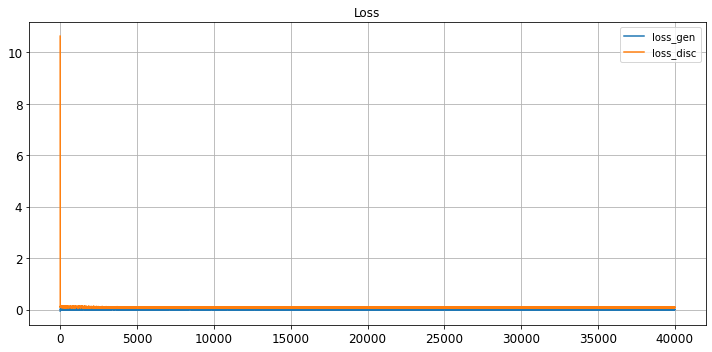

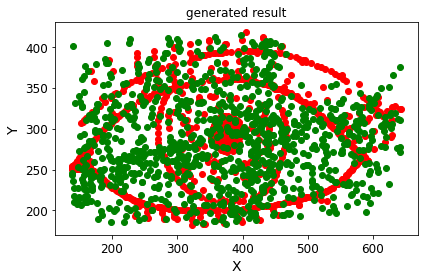

save the model & result
Epoch 40001/100000
critic: 0.086205 - generator: 0.001404 - 0s
Epoch 40002/100000
critic: 0.071510 - generator: 0.003172 - 0s
Epoch 40003/100000
critic: 0.085428 - generator: 0.007455 - 0s
Epoch 40004/100000
critic: 0.087472 - generator: 0.003150 - 0s
Epoch 40005/100000
critic: 0.084018 - generator: -0.003506 - 0s
Epoch 40006/100000
critic: 0.076311 - generator: -0.001185 - 0s
Epoch 40007/100000
critic: 0.075860 - generator: 0.000900 - 0s
Epoch 40008/100000
critic: 0.075731 - generator: 0.002588 - 0s
Epoch 40009/100000
critic: 0.083817 - generator: -0.001542 - 0s
Epoch 40010/100000
critic: 0.080274 - generator: -0.001048 - 0s
Epoch 40011/100000
critic: 0.079124 - generator: -0.002737 - 0s
Epoch 40012/100000
critic: 0.083053 - generator: 0.002207 - 0s
Epoch 40013/100000
critic: 0.075893 - generator: 0.002973 - 1s
Epoch 40014/100000
critic: 0.080473 - generator: 0.000255 - 0s
Epoch 40015/100000
critic: 0.078808 - generator: 0.000859 - 0s
Epoch 40016/100000
critic:

critic: 0.082282 - generator: -0.000117 - 0s
Epoch 40132/100000
critic: 0.080884 - generator: -0.001398 - 0s
Epoch 40133/100000
critic: 0.081661 - generator: 0.000364 - 0s
Epoch 40134/100000
critic: 0.087164 - generator: -0.002255 - 0s
Epoch 40135/100000
critic: 0.070062 - generator: -0.005754 - 0s
Epoch 40136/100000
critic: 0.079378 - generator: -0.004514 - 0s
Epoch 40137/100000
critic: 0.071976 - generator: -0.002013 - 0s
Epoch 40138/100000
critic: 0.072633 - generator: -0.001674 - 0s
Epoch 40139/100000
critic: 0.083425 - generator: -0.000632 - 0s
Epoch 40140/100000
critic: 0.080240 - generator: 0.003744 - 0s
Epoch 40141/100000
critic: 0.086547 - generator: 0.003838 - 0s
Epoch 40142/100000
critic: 0.081372 - generator: -0.001276 - 0s
Epoch 40143/100000
critic: 0.073652 - generator: 0.000426 - 0s
Epoch 40144/100000
critic: 0.080147 - generator: -0.001468 - 0s
Epoch 40145/100000
critic: 0.074897 - generator: 0.000090 - 0s
Epoch 40146/100000
critic: 0.077377 - generator: 0.001383 - 0s
E

critic: 0.083158 - generator: -0.000855 - 0s
Epoch 40263/100000
critic: 0.078255 - generator: -0.002114 - 0s
Epoch 40264/100000
critic: 0.085397 - generator: -0.003193 - 0s
Epoch 40265/100000
critic: 0.075338 - generator: 0.000514 - 0s
Epoch 40266/100000
critic: 0.081701 - generator: 0.000306 - 0s
Epoch 40267/100000
critic: 0.084550 - generator: -0.003064 - 0s
Epoch 40268/100000
critic: 0.085624 - generator: -0.000820 - 0s
Epoch 40269/100000
critic: 0.079734 - generator: 0.000844 - 0s
Epoch 40270/100000
critic: 0.081139 - generator: -0.000750 - 0s
Epoch 40271/100000
critic: 0.077708 - generator: 0.001537 - 0s
Epoch 40272/100000
critic: 0.077284 - generator: 0.001928 - 0s
Epoch 40273/100000
critic: 0.087388 - generator: -0.001700 - 0s
Epoch 40274/100000
critic: 0.083057 - generator: 0.001911 - 0s
Epoch 40275/100000
critic: 0.085626 - generator: -0.000623 - 0s
Epoch 40276/100000
critic: 0.084319 - generator: 0.005717 - 0s
Epoch 40277/100000
critic: 0.082919 - generator: 0.002938 - 0s
Epo

critic: 0.080287 - generator: -0.002756 - 0s
Epoch 40393/100000
critic: 0.081166 - generator: -0.004094 - 0s
Epoch 40394/100000
critic: 0.070280 - generator: -0.002004 - 0s
Epoch 40395/100000
critic: 0.078999 - generator: 0.005824 - 0s
Epoch 40396/100000
critic: 0.091265 - generator: 0.001808 - 0s
Epoch 40397/100000
critic: 0.080386 - generator: -0.001476 - 0s
Epoch 40398/100000
critic: 0.079913 - generator: 0.002758 - 0s
Epoch 40399/100000
critic: 0.087989 - generator: -0.001369 - 0s
Epoch 40400/100000
critic: 0.079311 - generator: 0.001512 - 0s
Epoch 40401/100000
critic: 0.080013 - generator: 0.001594 - 0s
Epoch 40402/100000
critic: 0.068928 - generator: -0.000015 - 0s
Epoch 40403/100000
critic: 0.080230 - generator: 0.003400 - 0s
Epoch 40404/100000
critic: 0.080886 - generator: 0.001010 - 0s
Epoch 40405/100000
critic: 0.076631 - generator: 0.000722 - 0s
Epoch 40406/100000
critic: 0.069644 - generator: -0.001255 - 0s
Epoch 40407/100000
critic: 0.084715 - generator: -0.001839 - 0s
Epo

critic: 0.079383 - generator: -0.002729 - 0s
Epoch 40523/100000
critic: 0.078443 - generator: 0.001677 - 0s
Epoch 40524/100000
critic: 0.075966 - generator: 0.000132 - 0s
Epoch 40525/100000
critic: 0.077975 - generator: -0.000804 - 0s
Epoch 40526/100000
critic: 0.080186 - generator: 0.000006 - 0s
Epoch 40527/100000
critic: 0.081311 - generator: 0.002344 - 0s
Epoch 40528/100000
critic: 0.077528 - generator: 0.002074 - 0s
Epoch 40529/100000
critic: 0.078197 - generator: 0.004999 - 0s
Epoch 40530/100000
critic: 0.083067 - generator: 0.002672 - 0s
Epoch 40531/100000
critic: 0.076642 - generator: -0.003033 - 0s
Epoch 40532/100000
critic: 0.093382 - generator: -0.001319 - 0s
Epoch 40533/100000
critic: 0.088143 - generator: -0.000866 - 0s
Epoch 40534/100000
critic: 0.083459 - generator: 0.000627 - 0s
Epoch 40535/100000
critic: 0.087358 - generator: -0.001460 - 0s
Epoch 40536/100000
critic: 0.086998 - generator: 0.000177 - 0s
Epoch 40537/100000
critic: 0.093672 - generator: -0.003279 - 0s
Epoc

critic: 0.080563 - generator: -0.000431 - 0s
Epoch 40653/100000
critic: 0.069675 - generator: 0.007083 - 0s
Epoch 40654/100000
critic: 0.082396 - generator: -0.000042 - 0s
Epoch 40655/100000
critic: 0.094583 - generator: -0.002715 - 0s
Epoch 40656/100000
critic: 0.080954 - generator: -0.000128 - 0s
Epoch 40657/100000
critic: 0.076934 - generator: 0.000923 - 0s
Epoch 40658/100000
critic: 0.091095 - generator: -0.003384 - 0s
Epoch 40659/100000
critic: 0.080966 - generator: -0.002591 - 0s
Epoch 40660/100000
critic: 0.077632 - generator: -0.001899 - 0s
Epoch 40661/100000
critic: 0.079785 - generator: -0.000103 - 0s
Epoch 40662/100000
critic: 0.080267 - generator: -0.001195 - 0s
Epoch 40663/100000
critic: 0.089845 - generator: 0.003645 - 0s
Epoch 40664/100000
critic: 0.080897 - generator: 0.006051 - 0s
Epoch 40665/100000
critic: 0.076383 - generator: 0.000754 - 0s
Epoch 40666/100000
critic: 0.082516 - generator: -0.001078 - 0s
Epoch 40667/100000
critic: 0.078688 - generator: -0.002992 - 0s


critic: 0.092543 - generator: 0.000660 - 0s
Epoch 40784/100000
critic: 0.075486 - generator: 0.002687 - 0s
Epoch 40785/100000
critic: 0.078914 - generator: 0.006249 - 0s
Epoch 40786/100000
critic: 0.087221 - generator: 0.000778 - 0s
Epoch 40787/100000
critic: 0.087147 - generator: 0.003188 - 0s
Epoch 40788/100000
critic: 0.079061 - generator: -0.003544 - 0s
Epoch 40789/100000
critic: 0.073077 - generator: -0.003702 - 0s
Epoch 40790/100000
critic: 0.092617 - generator: -0.003381 - 0s
Epoch 40791/100000
critic: 0.084884 - generator: -0.003363 - 0s
Epoch 40792/100000
critic: 0.087217 - generator: 0.001558 - 0s
Epoch 40793/100000
critic: 0.087258 - generator: 0.000786 - 0s
Epoch 40794/100000
critic: 0.094109 - generator: -0.003315 - 0s
Epoch 40795/100000
critic: 0.079728 - generator: -0.001232 - 0s
Epoch 40796/100000
critic: 0.087586 - generator: 0.000646 - 0s
Epoch 40797/100000
critic: 0.080272 - generator: 0.004246 - 0s
Epoch 40798/100000
critic: 0.090745 - generator: 0.003081 - 0s
Epoch

critic: 0.074432 - generator: 0.000500 - 0s
Epoch 40915/100000
critic: 0.089973 - generator: 0.000672 - 0s
Epoch 40916/100000
critic: 0.067399 - generator: 0.000252 - 0s
Epoch 40917/100000
critic: 0.085952 - generator: 0.002024 - 0s
Epoch 40918/100000
critic: 0.071400 - generator: -0.000136 - 0s
Epoch 40919/100000
critic: 0.080403 - generator: -0.001317 - 0s
Epoch 40920/100000
critic: 0.080153 - generator: -0.000862 - 0s
Epoch 40921/100000
critic: 0.076562 - generator: -0.000073 - 0s
Epoch 40922/100000
critic: 0.076506 - generator: -0.001140 - 0s
Epoch 40923/100000
critic: 0.077481 - generator: 0.000686 - 0s
Epoch 40924/100000
critic: 0.093211 - generator: -0.000950 - 0s
Epoch 40925/100000
critic: 0.085746 - generator: 0.003085 - 0s
Epoch 40926/100000
critic: 0.089173 - generator: -0.001220 - 0s
Epoch 40927/100000
critic: 0.069703 - generator: 0.002000 - 0s
Epoch 40928/100000
critic: 0.088641 - generator: 0.004112 - 0s
Epoch 40929/100000
critic: 0.085818 - generator: -0.000781 - 0s
Epo

critic: 0.088916 - generator: 0.001985 - 0s
Epoch 41044/100000
critic: 0.081846 - generator: 0.001471 - 0s
Epoch 41045/100000
critic: 0.076188 - generator: -0.002724 - 0s
Epoch 41046/100000
critic: 0.083107 - generator: 0.001767 - 0s
Epoch 41047/100000
critic: 0.073582 - generator: 0.000761 - 0s
Epoch 41048/100000
critic: 0.078102 - generator: 0.003502 - 0s
Epoch 41049/100000
critic: 0.081242 - generator: -0.002369 - 0s
Epoch 41050/100000
critic: 0.088131 - generator: -0.002818 - 0s
Epoch 41051/100000
critic: 0.066727 - generator: -0.001605 - 0s
Epoch 41052/100000
critic: 0.086041 - generator: 0.001798 - 0s
Epoch 41053/100000
critic: 0.087131 - generator: -0.002437 - 0s
Epoch 41054/100000
critic: 0.075096 - generator: -0.002847 - 0s
Epoch 41055/100000
critic: 0.085010 - generator: -0.002025 - 0s
Epoch 41056/100000
critic: 0.081319 - generator: -0.001357 - 0s
Epoch 41057/100000
critic: 0.082562 - generator: 0.000037 - 0s
Epoch 41058/100000
critic: 0.079754 - generator: -0.003546 - 0s
Ep

critic: 0.079528 - generator: 0.000919 - 0s
Epoch 41174/100000
critic: 0.081525 - generator: -0.002264 - 0s
Epoch 41175/100000
critic: 0.090121 - generator: -0.001660 - 0s
Epoch 41176/100000
critic: 0.082372 - generator: 0.004405 - 0s
Epoch 41177/100000
critic: 0.080996 - generator: 0.004035 - 0s
Epoch 41178/100000
critic: 0.087345 - generator: 0.003582 - 0s
Epoch 41179/100000
critic: 0.080873 - generator: 0.000909 - 0s
Epoch 41180/100000
critic: 0.088049 - generator: -0.004711 - 0s
Epoch 41181/100000
critic: 0.079186 - generator: 0.001116 - 0s
Epoch 41182/100000
critic: 0.077012 - generator: 0.003447 - 0s
Epoch 41183/100000
critic: 0.081819 - generator: 0.002793 - 0s
Epoch 41184/100000
critic: 0.087441 - generator: 0.000849 - 0s
Epoch 41185/100000
critic: 0.087753 - generator: 0.000620 - 0s
Epoch 41186/100000
critic: 0.078743 - generator: -0.004913 - 0s
Epoch 41187/100000
critic: 0.080560 - generator: -0.001240 - 0s
Epoch 41188/100000
critic: 0.074637 - generator: -0.000871 - 0s
Epoch

critic: 0.078454 - generator: 0.004843 - 0s
Epoch 41304/100000
critic: 0.083333 - generator: 0.000246 - 0s
Epoch 41305/100000
critic: 0.079660 - generator: 0.001384 - 0s
Epoch 41306/100000
critic: 0.079472 - generator: -0.000449 - 0s
Epoch 41307/100000
critic: 0.084795 - generator: -0.001314 - 0s
Epoch 41308/100000
critic: 0.089916 - generator: 0.000556 - 0s
Epoch 41309/100000
critic: 0.077176 - generator: -0.001005 - 0s
Epoch 41310/100000
critic: 0.086230 - generator: -0.002096 - 0s
Epoch 41311/100000
critic: 0.084060 - generator: -0.002673 - 0s
Epoch 41312/100000
critic: 0.084617 - generator: -0.003511 - 0s
Epoch 41313/100000
critic: 0.080028 - generator: 0.000137 - 0s
Epoch 41314/100000
critic: 0.083328 - generator: 0.001031 - 0s
Epoch 41315/100000
critic: 0.081211 - generator: -0.002473 - 0s
Epoch 41316/100000
critic: 0.082180 - generator: -0.001995 - 0s
Epoch 41317/100000
critic: 0.089942 - generator: -0.002772 - 0s
Epoch 41318/100000
critic: 0.076641 - generator: 0.001466 - 0s
Ep

critic: 0.090668 - generator: -0.001367 - 0s
Epoch 41433/100000
critic: 0.088659 - generator: 0.001272 - 0s
Epoch 41434/100000
critic: 0.082005 - generator: 0.002164 - 0s
Epoch 41435/100000
critic: 0.075027 - generator: 0.000135 - 0s
Epoch 41436/100000
critic: 0.076379 - generator: -0.000676 - 0s
Epoch 41437/100000
critic: 0.088613 - generator: 0.000243 - 0s
Epoch 41438/100000
critic: 0.083934 - generator: 0.000234 - 0s
Epoch 41439/100000
critic: 0.081095 - generator: -0.004024 - 0s
Epoch 41440/100000
critic: 0.079885 - generator: -0.001777 - 0s
Epoch 41441/100000
critic: 0.080632 - generator: -0.003973 - 0s
Epoch 41442/100000
critic: 0.096725 - generator: -0.001626 - 0s
Epoch 41443/100000
critic: 0.074969 - generator: -0.002349 - 0s
Epoch 41444/100000
critic: 0.077381 - generator: -0.005074 - 0s
Epoch 41445/100000
critic: 0.081901 - generator: -0.000749 - 0s
Epoch 41446/100000
critic: 0.083016 - generator: 0.003773 - 0s
Epoch 41447/100000
critic: 0.080776 - generator: 0.000329 - 0s
Ep

critic: 0.078791 - generator: -0.003675 - 0s
Epoch 41563/100000
critic: 0.087002 - generator: -0.000251 - 0s
Epoch 41564/100000
critic: 0.082828 - generator: -0.002895 - 0s
Epoch 41565/100000
critic: 0.086365 - generator: -0.002136 - 0s
Epoch 41566/100000
critic: 0.073373 - generator: 0.000896 - 0s
Epoch 41567/100000
critic: 0.085736 - generator: 0.000352 - 0s
Epoch 41568/100000
critic: 0.091079 - generator: 0.001207 - 0s
Epoch 41569/100000
critic: 0.079621 - generator: -0.003279 - 0s
Epoch 41570/100000
critic: 0.087821 - generator: -0.003599 - 0s
Epoch 41571/100000
critic: 0.085932 - generator: -0.002707 - 0s
Epoch 41572/100000
critic: 0.078349 - generator: -0.004399 - 0s
Epoch 41573/100000
critic: 0.084990 - generator: -0.005330 - 0s
Epoch 41574/100000
critic: 0.080034 - generator: 0.000034 - 0s
Epoch 41575/100000
critic: 0.080961 - generator: -0.001369 - 0s
Epoch 41576/100000
critic: 0.083108 - generator: -0.000279 - 0s
Epoch 41577/100000
critic: 0.067837 - generator: -0.001545 - 0s

critic: 0.082942 - generator: -0.001762 - 0s
Epoch 41693/100000
critic: 0.081232 - generator: -0.001752 - 0s
Epoch 41694/100000
critic: 0.079288 - generator: -0.003677 - 0s
Epoch 41695/100000
critic: 0.081505 - generator: 0.003756 - 0s
Epoch 41696/100000
critic: 0.072091 - generator: -0.000155 - 0s
Epoch 41697/100000
critic: 0.072199 - generator: 0.003703 - 0s
Epoch 41698/100000
critic: 0.083725 - generator: 0.001170 - 0s
Epoch 41699/100000
critic: 0.067521 - generator: -0.000753 - 0s
Epoch 41700/100000
critic: 0.079949 - generator: 0.002178 - 0s
Epoch 41701/100000
critic: 0.094920 - generator: -0.002681 - 0s
Epoch 41702/100000
critic: 0.089256 - generator: -0.002460 - 0s
Epoch 41703/100000
critic: 0.076165 - generator: 0.004699 - 0s
Epoch 41704/100000
critic: 0.074087 - generator: 0.004948 - 0s
Epoch 41705/100000
critic: 0.093483 - generator: 0.008068 - 0s
Epoch 41706/100000
critic: 0.085227 - generator: 0.000762 - 0s
Epoch 41707/100000
critic: 0.074226 - generator: 0.002261 - 0s
Epoc

critic: 0.084584 - generator: 0.000303 - 0s
Epoch 41824/100000
critic: 0.088170 - generator: 0.003133 - 0s
Epoch 41825/100000
critic: 0.078534 - generator: -0.000502 - 0s
Epoch 41826/100000
critic: 0.089694 - generator: -0.000679 - 0s
Epoch 41827/100000
critic: 0.092784 - generator: -0.001661 - 0s
Epoch 41828/100000
critic: 0.080945 - generator: -0.000297 - 0s
Epoch 41829/100000
critic: 0.072321 - generator: 0.003439 - 0s
Epoch 41830/100000
critic: 0.076294 - generator: 0.001528 - 0s
Epoch 41831/100000
critic: 0.094122 - generator: 0.001756 - 0s
Epoch 41832/100000
critic: 0.085164 - generator: 0.000608 - 0s
Epoch 41833/100000
critic: 0.078547 - generator: 0.002853 - 0s
Epoch 41834/100000
critic: 0.083471 - generator: -0.001511 - 0s
Epoch 41835/100000
critic: 0.077498 - generator: -0.003170 - 0s
Epoch 41836/100000
critic: 0.083964 - generator: -0.001545 - 0s
Epoch 41837/100000
critic: 0.086978 - generator: 0.001427 - 0s
Epoch 41838/100000
critic: 0.079201 - generator: -0.002648 - 0s
Epo

critic: 0.091929 - generator: 0.001121 - 0s
Epoch 41954/100000
critic: 0.080890 - generator: 0.005165 - 0s
Epoch 41955/100000
critic: 0.082677 - generator: 0.000404 - 0s
Epoch 41956/100000
critic: 0.081624 - generator: -0.004848 - 0s
Epoch 41957/100000
critic: 0.094264 - generator: -0.001126 - 0s
Epoch 41958/100000
critic: 0.086568 - generator: -0.001612 - 0s
Epoch 41959/100000
critic: 0.080725 - generator: 0.000092 - 0s
Epoch 41960/100000
critic: 0.081379 - generator: 0.000232 - 0s
Epoch 41961/100000
critic: 0.079509 - generator: 0.000870 - 0s
Epoch 41962/100000
critic: 0.080950 - generator: -0.001923 - 0s
Epoch 41963/100000
critic: 0.087203 - generator: -0.000313 - 0s
Epoch 41964/100000
critic: 0.072925 - generator: -0.000114 - 0s
Epoch 41965/100000
critic: 0.095954 - generator: -0.000268 - 0s
Epoch 41966/100000
critic: 0.084319 - generator: -0.001322 - 0s
Epoch 41967/100000
critic: 0.078798 - generator: -0.001791 - 0s
Epoch 41968/100000
critic: 0.082811 - generator: 0.002160 - 0s
Ep

critic: 0.081843 - generator: 0.000805 - 0s
Epoch 42083/100000
critic: 0.073881 - generator: -0.003015 - 0s
Epoch 42084/100000
critic: 0.080629 - generator: -0.002472 - 0s
Epoch 42085/100000
critic: 0.082677 - generator: -0.002366 - 0s
Epoch 42086/100000
critic: 0.081001 - generator: -0.004049 - 0s
Epoch 42087/100000
critic: 0.077885 - generator: -0.000047 - 0s
Epoch 42088/100000
critic: 0.088612 - generator: -0.004364 - 0s
Epoch 42089/100000
critic: 0.077567 - generator: 0.002720 - 0s
Epoch 42090/100000
critic: 0.077287 - generator: 0.003324 - 0s
Epoch 42091/100000
critic: 0.086586 - generator: 0.003107 - 0s
Epoch 42092/100000
critic: 0.073162 - generator: -0.000958 - 0s
Epoch 42093/100000
critic: 0.087945 - generator: 0.000762 - 0s
Epoch 42094/100000
critic: 0.086097 - generator: -0.000910 - 0s
Epoch 42095/100000
critic: 0.082305 - generator: 0.003535 - 0s
Epoch 42096/100000
critic: 0.078300 - generator: 0.002814 - 0s
Epoch 42097/100000
critic: 0.086258 - generator: 0.001307 - 0s
Epo

critic: 0.066983 - generator: 0.001987 - 0s
Epoch 42213/100000
critic: 0.094196 - generator: 0.002994 - 0s
Epoch 42214/100000
critic: 0.086468 - generator: 0.001835 - 0s
Epoch 42215/100000
critic: 0.088256 - generator: 0.002335 - 0s
Epoch 42216/100000
critic: 0.070809 - generator: 0.001800 - 0s
Epoch 42217/100000
critic: 0.076234 - generator: 0.002138 - 0s
Epoch 42218/100000
critic: 0.084961 - generator: 0.002764 - 0s
Epoch 42219/100000
critic: 0.078657 - generator: 0.004641 - 0s
Epoch 42220/100000
critic: 0.087164 - generator: 0.006753 - 0s
Epoch 42221/100000
critic: 0.077195 - generator: 0.003528 - 0s
Epoch 42222/100000
critic: 0.080252 - generator: 0.003271 - 0s
Epoch 42223/100000
critic: 0.076414 - generator: -0.000804 - 0s
Epoch 42224/100000
critic: 0.082505 - generator: -0.001875 - 0s
Epoch 42225/100000
critic: 0.082388 - generator: -0.002759 - 0s
Epoch 42226/100000
critic: 0.079795 - generator: 0.000695 - 0s
Epoch 42227/100000
critic: 0.084601 - generator: 0.002136 - 0s
Epoch 42

critic: 0.087601 - generator: 0.004652 - 0s
Epoch 42343/100000
critic: 0.086123 - generator: 0.003109 - 0s
Epoch 42344/100000
critic: 0.078021 - generator: 0.002160 - 0s
Epoch 42345/100000
critic: 0.089294 - generator: 0.003473 - 0s
Epoch 42346/100000
critic: 0.085735 - generator: -0.005092 - 0s
Epoch 42347/100000
critic: 0.078390 - generator: -0.002079 - 0s
Epoch 42348/100000
critic: 0.079887 - generator: -0.000077 - 0s
Epoch 42349/100000
critic: 0.084049 - generator: 0.004932 - 0s
Epoch 42350/100000
critic: 0.086215 - generator: 0.002124 - 0s
Epoch 42351/100000
critic: 0.082546 - generator: -0.002898 - 0s
Epoch 42352/100000
critic: 0.085801 - generator: 0.003514 - 0s
Epoch 42353/100000
critic: 0.078136 - generator: 0.003027 - 0s
Epoch 42354/100000
critic: 0.081180 - generator: -0.003503 - 0s
Epoch 42355/100000
critic: 0.078715 - generator: -0.002760 - 0s
Epoch 42356/100000
critic: 0.084620 - generator: -0.005809 - 0s
Epoch 42357/100000
critic: 0.082687 - generator: -0.000348 - 0s
Epo

critic: 0.079028 - generator: 0.000175 - 0s
Epoch 42472/100000
critic: 0.082943 - generator: -0.000259 - 0s
Epoch 42473/100000
critic: 0.075270 - generator: 0.001717 - 0s
Epoch 42474/100000
critic: 0.083185 - generator: -0.001020 - 0s
Epoch 42475/100000
critic: 0.075085 - generator: -0.000469 - 0s
Epoch 42476/100000
critic: 0.090812 - generator: 0.000062 - 0s
Epoch 42477/100000
critic: 0.077358 - generator: -0.000770 - 0s
Epoch 42478/100000
critic: 0.080068 - generator: -0.001509 - 0s
Epoch 42479/100000
critic: 0.081594 - generator: -0.002123 - 0s
Epoch 42480/100000
critic: 0.079566 - generator: 0.002527 - 0s
Epoch 42481/100000
critic: 0.081204 - generator: -0.003465 - 0s
Epoch 42482/100000
critic: 0.079210 - generator: -0.003336 - 0s
Epoch 42483/100000
critic: 0.078399 - generator: 0.002727 - 0s
Epoch 42484/100000
critic: 0.082824 - generator: 0.000154 - 0s
Epoch 42485/100000
critic: 0.079989 - generator: 0.005360 - 0s
Epoch 42486/100000
critic: 0.087329 - generator: 0.002094 - 0s
Epo

critic: 0.079987 - generator: -0.001305 - 0s
Epoch 42602/100000
critic: 0.087962 - generator: 0.005657 - 0s
Epoch 42603/100000
critic: 0.076075 - generator: -0.000943 - 0s
Epoch 42604/100000
critic: 0.080493 - generator: 0.001059 - 0s
Epoch 42605/100000
critic: 0.089655 - generator: -0.000798 - 0s
Epoch 42606/100000
critic: 0.074821 - generator: -0.001706 - 0s
Epoch 42607/100000
critic: 0.089494 - generator: -0.001598 - 0s
Epoch 42608/100000
critic: 0.082177 - generator: -0.001073 - 0s
Epoch 42609/100000
critic: 0.071875 - generator: -0.002912 - 0s
Epoch 42610/100000
critic: 0.089883 - generator: -0.004449 - 0s
Epoch 42611/100000
critic: 0.078345 - generator: -0.003007 - 0s
Epoch 42612/100000
critic: 0.085128 - generator: -0.001730 - 0s
Epoch 42613/100000
critic: 0.079277 - generator: 0.000636 - 0s
Epoch 42614/100000
critic: 0.074036 - generator: 0.000295 - 0s
Epoch 42615/100000
critic: 0.084195 - generator: -0.001679 - 0s
Epoch 42616/100000
critic: 0.083258 - generator: -0.001908 - 0s

critic: 0.079444 - generator: 0.000939 - 0s
Epoch 42731/100000
critic: 0.085733 - generator: -0.004077 - 0s
Epoch 42732/100000
critic: 0.080589 - generator: 0.000838 - 0s
Epoch 42733/100000
critic: 0.075675 - generator: 0.001898 - 0s
Epoch 42734/100000
critic: 0.087270 - generator: -0.002363 - 0s
Epoch 42735/100000
critic: 0.072528 - generator: -0.002723 - 0s
Epoch 42736/100000
critic: 0.074097 - generator: 0.000297 - 0s
Epoch 42737/100000
critic: 0.080730 - generator: 0.000370 - 0s
Epoch 42738/100000
critic: 0.073571 - generator: 0.000300 - 0s
Epoch 42739/100000
critic: 0.087352 - generator: -0.000993 - 0s
Epoch 42740/100000
critic: 0.091020 - generator: 0.000301 - 0s
Epoch 42741/100000
critic: 0.084364 - generator: 0.000565 - 0s
Epoch 42742/100000
critic: 0.076428 - generator: -0.000833 - 0s
Epoch 42743/100000
critic: 0.081396 - generator: -0.001805 - 0s
Epoch 42744/100000
critic: 0.071413 - generator: -0.000618 - 0s
Epoch 42745/100000
critic: 0.094960 - generator: -0.001818 - 0s
Epo

critic: 0.086402 - generator: 0.001910 - 0s
Epoch 42861/100000
critic: 0.081680 - generator: 0.000168 - 0s
Epoch 42862/100000
critic: 0.082703 - generator: -0.000640 - 0s
Epoch 42863/100000
critic: 0.092407 - generator: 0.000291 - 0s
Epoch 42864/100000
critic: 0.080816 - generator: 0.003791 - 0s
Epoch 42865/100000
critic: 0.079344 - generator: 0.000314 - 0s
Epoch 42866/100000
critic: 0.076667 - generator: 0.001351 - 0s
Epoch 42867/100000
critic: 0.082903 - generator: -0.001629 - 0s
Epoch 42868/100000
critic: 0.077044 - generator: -0.002634 - 0s
Epoch 42869/100000
critic: 0.085920 - generator: -0.001600 - 0s
Epoch 42870/100000
critic: 0.079563 - generator: -0.001168 - 0s
Epoch 42871/100000
critic: 0.089890 - generator: -0.003903 - 0s
Epoch 42872/100000
critic: 0.079507 - generator: -0.001882 - 0s
Epoch 42873/100000
critic: 0.078547 - generator: 0.004287 - 0s
Epoch 42874/100000
critic: 0.070833 - generator: -0.001749 - 0s
Epoch 42875/100000
critic: 0.081668 - generator: 0.001404 - 0s
Epo

critic: 0.087408 - generator: 0.002213 - 0s
Epoch 42991/100000
critic: 0.067273 - generator: 0.001663 - 0s
Epoch 42992/100000
critic: 0.084614 - generator: -0.001641 - 0s
Epoch 42993/100000
critic: 0.079335 - generator: -0.001602 - 0s
Epoch 42994/100000
critic: 0.083015 - generator: 0.000783 - 0s
Epoch 42995/100000
critic: 0.079204 - generator: -0.000706 - 0s
Epoch 42996/100000
critic: 0.083148 - generator: -0.000852 - 0s
Epoch 42997/100000
critic: 0.082452 - generator: 0.001209 - 0s
Epoch 42998/100000
critic: 0.092146 - generator: -0.000878 - 0s
Epoch 42999/100000
critic: 0.091561 - generator: -0.000691 - 0s
Epoch 43000/100000
critic: 0.069894 - generator: -0.001309 - 0s
Epoch 43001/100000
critic: 0.086852 - generator: -0.000872 - 0s
Epoch 43002/100000
critic: 0.080411 - generator: -0.001065 - 0s
Epoch 43003/100000
critic: 0.084532 - generator: 0.000377 - 0s
Epoch 43004/100000
critic: 0.090261 - generator: 0.004255 - 0s
Epoch 43005/100000
critic: 0.076282 - generator: -0.001354 - 0s
E

critic: 0.077827 - generator: -0.000771 - 0s
Epoch 43121/100000
critic: 0.081101 - generator: -0.000200 - 0s
Epoch 43122/100000
critic: 0.074065 - generator: 0.004955 - 0s
Epoch 43123/100000
critic: 0.074844 - generator: 0.000368 - 0s
Epoch 43124/100000
critic: 0.080096 - generator: -0.000214 - 0s
Epoch 43125/100000
critic: 0.081088 - generator: -0.005023 - 0s
Epoch 43126/100000
critic: 0.089051 - generator: -0.000168 - 0s
Epoch 43127/100000
critic: 0.087433 - generator: -0.004735 - 0s
Epoch 43128/100000
critic: 0.073102 - generator: 0.001385 - 0s
Epoch 43129/100000
critic: 0.083471 - generator: -0.001797 - 0s
Epoch 43130/100000
critic: 0.088135 - generator: -0.003725 - 0s
Epoch 43131/100000
critic: 0.061552 - generator: -0.000364 - 0s
Epoch 43132/100000
critic: 0.088970 - generator: 0.001618 - 0s
Epoch 43133/100000
critic: 0.077241 - generator: -0.003165 - 0s
Epoch 43134/100000
critic: 0.076700 - generator: 0.001128 - 0s
Epoch 43135/100000
critic: 0.084386 - generator: 0.002040 - 0s
E

critic: 0.085426 - generator: -0.001577 - 0s
Epoch 43251/100000
critic: 0.090164 - generator: 0.001251 - 0s
Epoch 43252/100000
critic: 0.081526 - generator: 0.000690 - 0s
Epoch 43253/100000
critic: 0.093142 - generator: 0.004658 - 0s
Epoch 43254/100000
critic: 0.070826 - generator: 0.001419 - 0s
Epoch 43255/100000
critic: 0.083556 - generator: 0.002983 - 0s
Epoch 43256/100000
critic: 0.088133 - generator: 0.003936 - 0s
Epoch 43257/100000
critic: 0.080493 - generator: -0.000516 - 0s
Epoch 43258/100000
critic: 0.072579 - generator: -0.001884 - 0s
Epoch 43259/100000
critic: 0.090059 - generator: 0.003300 - 0s
Epoch 43260/100000
critic: 0.094157 - generator: 0.000948 - 0s
Epoch 43261/100000
critic: 0.082117 - generator: 0.004051 - 0s
Epoch 43262/100000
critic: 0.080450 - generator: -0.000269 - 0s
Epoch 43263/100000
critic: 0.072770 - generator: -0.005042 - 0s
Epoch 43264/100000
critic: 0.082860 - generator: -0.003813 - 0s
Epoch 43265/100000
critic: 0.077607 - generator: -0.000971 - 0s
Epoc

critic: 0.075882 - generator: -0.002139 - 0s
Epoch 43380/100000
critic: 0.090657 - generator: -0.002785 - 0s
Epoch 43381/100000
critic: 0.074402 - generator: 0.000114 - 0s
Epoch 43382/100000
critic: 0.104634 - generator: 0.000735 - 0s
Epoch 43383/100000
critic: 0.086384 - generator: 0.000002 - 0s
Epoch 43384/100000
critic: 0.084212 - generator: -0.000833 - 0s
Epoch 43385/100000
critic: 0.079669 - generator: 0.000726 - 0s
Epoch 43386/100000
critic: 0.079790 - generator: 0.002576 - 0s
Epoch 43387/100000
critic: 0.085552 - generator: -0.002175 - 0s
Epoch 43388/100000
critic: 0.076318 - generator: -0.005347 - 0s
Epoch 43389/100000
critic: 0.079539 - generator: -0.000172 - 0s
Epoch 43390/100000
critic: 0.073480 - generator: 0.002393 - 0s
Epoch 43391/100000
critic: 0.082292 - generator: 0.003549 - 0s
Epoch 43392/100000
critic: 0.077818 - generator: -0.000941 - 0s
Epoch 43393/100000
critic: 0.072853 - generator: -0.000518 - 0s
Epoch 43394/100000
critic: 0.088296 - generator: -0.003129 - 0s
Ep

critic: 0.079590 - generator: 0.002383 - 0s
Epoch 43510/100000
critic: 0.079279 - generator: -0.001522 - 0s
Epoch 43511/100000
critic: 0.081371 - generator: -0.005070 - 0s
Epoch 43512/100000
critic: 0.082108 - generator: -0.000943 - 0s
Epoch 43513/100000
critic: 0.078958 - generator: 0.000775 - 0s
Epoch 43514/100000
critic: 0.080127 - generator: 0.003410 - 0s
Epoch 43515/100000
critic: 0.076684 - generator: 0.002160 - 0s
Epoch 43516/100000
critic: 0.089767 - generator: 0.002411 - 0s
Epoch 43517/100000
critic: 0.083207 - generator: 0.000105 - 0s
Epoch 43518/100000
critic: 0.086930 - generator: -0.001162 - 0s
Epoch 43519/100000
critic: 0.083216 - generator: 0.003325 - 0s
Epoch 43520/100000
critic: 0.070556 - generator: 0.000588 - 0s
Epoch 43521/100000
critic: 0.089584 - generator: -0.004821 - 0s
Epoch 43522/100000
critic: 0.093915 - generator: -0.000525 - 0s
Epoch 43523/100000
critic: 0.080523 - generator: 0.000946 - 0s
Epoch 43524/100000
critic: 0.077328 - generator: -0.001372 - 0s
Epoc

critic: 0.088127 - generator: -0.000022 - 0s
Epoch 43639/100000
critic: 0.082717 - generator: -0.000952 - 0s
Epoch 43640/100000
critic: 0.089405 - generator: 0.000009 - 0s
Epoch 43641/100000
critic: 0.080777 - generator: 0.001465 - 0s
Epoch 43642/100000
critic: 0.091495 - generator: 0.001060 - 0s
Epoch 43643/100000
critic: 0.083635 - generator: -0.005335 - 0s
Epoch 43644/100000
critic: 0.081677 - generator: -0.001234 - 0s
Epoch 43645/100000
critic: 0.074269 - generator: 0.002107 - 0s
Epoch 43646/100000
critic: 0.078090 - generator: -0.000837 - 0s
Epoch 43647/100000
critic: 0.082542 - generator: -0.001409 - 0s
Epoch 43648/100000
critic: 0.085132 - generator: 0.003873 - 0s
Epoch 43649/100000
critic: 0.071642 - generator: 0.001082 - 0s
Epoch 43650/100000
critic: 0.085471 - generator: 0.000884 - 0s
Epoch 43651/100000
critic: 0.081557 - generator: -0.001598 - 0s
Epoch 43652/100000
critic: 0.072151 - generator: -0.001193 - 0s
Epoch 43653/100000
critic: 0.086877 - generator: -0.001087 - 0s
Ep

critic: 0.064604 - generator: -0.002825 - 0s
Epoch 43768/100000
critic: 0.081293 - generator: -0.000638 - 0s
Epoch 43769/100000
critic: 0.080121 - generator: 0.001801 - 0s
Epoch 43770/100000
critic: 0.089702 - generator: 0.002733 - 0s
Epoch 43771/100000
critic: 0.079984 - generator: 0.001283 - 0s
Epoch 43772/100000
critic: 0.072097 - generator: -0.000708 - 0s
Epoch 43773/100000
critic: 0.080507 - generator: 0.000088 - 0s
Epoch 43774/100000
critic: 0.085446 - generator: -0.001653 - 0s
Epoch 43775/100000
critic: 0.083380 - generator: 0.000428 - 0s
Epoch 43776/100000
critic: 0.080345 - generator: 0.000445 - 0s
Epoch 43777/100000
critic: 0.073626 - generator: 0.003237 - 0s
Epoch 43778/100000
critic: 0.064142 - generator: 0.002997 - 0s
Epoch 43779/100000
critic: 0.087751 - generator: 0.000943 - 0s
Epoch 43780/100000
critic: 0.094183 - generator: 0.003189 - 0s
Epoch 43781/100000
critic: 0.075752 - generator: -0.002572 - 0s
Epoch 43782/100000
critic: 0.091669 - generator: -0.000796 - 0s
Epoch

critic: 0.076743 - generator: 0.001367 - 0s
Epoch 43898/100000
critic: 0.076579 - generator: 0.000995 - 0s
Epoch 43899/100000
critic: 0.091624 - generator: -0.001283 - 0s
Epoch 43900/100000
critic: 0.078999 - generator: -0.002001 - 0s
Epoch 43901/100000
critic: 0.082579 - generator: -0.004574 - 0s
Epoch 43902/100000
critic: 0.080426 - generator: -0.005506 - 0s
Epoch 43903/100000
critic: 0.075424 - generator: -0.002644 - 0s
Epoch 43904/100000
critic: 0.079724 - generator: -0.005064 - 0s
Epoch 43905/100000
critic: 0.071446 - generator: -0.000646 - 0s
Epoch 43906/100000
critic: 0.080510 - generator: -0.003073 - 0s
Epoch 43907/100000
critic: 0.085364 - generator: -0.002623 - 0s
Epoch 43908/100000
critic: 0.078460 - generator: -0.000353 - 0s
Epoch 43909/100000
critic: 0.075634 - generator: -0.005369 - 0s
Epoch 43910/100000
critic: 0.072877 - generator: -0.002273 - 0s
Epoch 43911/100000
critic: 0.081432 - generator: 0.000315 - 0s
Epoch 43912/100000
critic: 0.076987 - generator: 0.002651 - 0s

critic: 0.088405 - generator: -0.003243 - 0s
Epoch 44028/100000
critic: 0.072794 - generator: 0.000697 - 0s
Epoch 44029/100000
critic: 0.082229 - generator: -0.001540 - 0s
Epoch 44030/100000
critic: 0.084712 - generator: 0.000632 - 0s
Epoch 44031/100000
critic: 0.083992 - generator: 0.000748 - 0s
Epoch 44032/100000
critic: 0.087513 - generator: -0.001237 - 0s
Epoch 44033/100000
critic: 0.077407 - generator: 0.000054 - 0s
Epoch 44034/100000
critic: 0.073777 - generator: -0.001234 - 0s
Epoch 44035/100000
critic: 0.086843 - generator: -0.000572 - 0s
Epoch 44036/100000
critic: 0.091313 - generator: 0.000736 - 0s
Epoch 44037/100000
critic: 0.092529 - generator: -0.003661 - 0s
Epoch 44038/100000
critic: 0.073370 - generator: -0.000814 - 0s
Epoch 44039/100000
critic: 0.078532 - generator: 0.003500 - 0s
Epoch 44040/100000
critic: 0.087718 - generator: 0.002380 - 0s
Epoch 44041/100000
critic: 0.067397 - generator: 0.000950 - 0s
Epoch 44042/100000
critic: 0.076893 - generator: -0.004226 - 0s
Epo

critic: 0.078837 - generator: 0.000710 - 0s
Epoch 44157/100000
critic: 0.077075 - generator: 0.002706 - 0s
Epoch 44158/100000
critic: 0.090623 - generator: 0.003881 - 0s
Epoch 44159/100000
critic: 0.070347 - generator: 0.000655 - 0s
Epoch 44160/100000
critic: 0.076406 - generator: 0.005823 - 0s
Epoch 44161/100000
critic: 0.079680 - generator: 0.001284 - 0s
Epoch 44162/100000
critic: 0.080707 - generator: 0.000515 - 0s
Epoch 44163/100000
critic: 0.078124 - generator: 0.003804 - 0s
Epoch 44164/100000
critic: 0.087979 - generator: 0.003550 - 0s
Epoch 44165/100000
critic: 0.085558 - generator: -0.000163 - 0s
Epoch 44166/100000
critic: 0.075630 - generator: -0.000376 - 0s
Epoch 44167/100000
critic: 0.089988 - generator: -0.001755 - 0s
Epoch 44168/100000
critic: 0.073273 - generator: -0.004846 - 0s
Epoch 44169/100000
critic: 0.075270 - generator: -0.000442 - 0s
Epoch 44170/100000
critic: 0.086624 - generator: -0.005289 - 0s
Epoch 44171/100000
critic: 0.082389 - generator: 0.001115 - 0s
Epoch

critic: 0.093396 - generator: -0.002593 - 0s
Epoch 44287/100000
critic: 0.066276 - generator: 0.000688 - 0s
Epoch 44288/100000
critic: 0.083960 - generator: -0.002243 - 0s
Epoch 44289/100000
critic: 0.091987 - generator: -0.000219 - 0s
Epoch 44290/100000
critic: 0.103277 - generator: -0.001433 - 0s
Epoch 44291/100000
critic: 0.078692 - generator: -0.000115 - 0s
Epoch 44292/100000
critic: 0.081609 - generator: -0.000036 - 0s
Epoch 44293/100000
critic: 0.075375 - generator: 0.001100 - 0s
Epoch 44294/100000
critic: 0.084225 - generator: 0.001513 - 0s
Epoch 44295/100000
critic: 0.092461 - generator: 0.000781 - 0s
Epoch 44296/100000
critic: 0.084578 - generator: 0.003905 - 0s
Epoch 44297/100000
critic: 0.088284 - generator: 0.001720 - 0s
Epoch 44298/100000
critic: 0.087400 - generator: -0.001705 - 0s
Epoch 44299/100000
critic: 0.086798 - generator: 0.003137 - 0s
Epoch 44300/100000
critic: 0.073507 - generator: 0.001647 - 0s
Epoch 44301/100000
critic: 0.088066 - generator: 0.003478 - 0s
Epoc

critic: 0.067773 - generator: 0.001541 - 0s
Epoch 44418/100000
critic: 0.088739 - generator: 0.000421 - 0s
Epoch 44419/100000
critic: 0.093233 - generator: 0.000753 - 0s
Epoch 44420/100000
critic: 0.085564 - generator: -0.000247 - 0s
Epoch 44421/100000
critic: 0.079857 - generator: -0.000538 - 0s
Epoch 44422/100000
critic: 0.082461 - generator: 0.000849 - 0s
Epoch 44423/100000
critic: 0.086966 - generator: -0.000838 - 0s
Epoch 44424/100000
critic: 0.084073 - generator: 0.004799 - 0s
Epoch 44425/100000
critic: 0.083823 - generator: 0.005548 - 0s
Epoch 44426/100000
critic: 0.072632 - generator: -0.001177 - 0s
Epoch 44427/100000
critic: 0.072468 - generator: 0.001656 - 0s
Epoch 44428/100000
critic: 0.080025 - generator: -0.004501 - 0s
Epoch 44429/100000
critic: 0.084254 - generator: 0.000781 - 0s
Epoch 44430/100000
critic: 0.078513 - generator: -0.004038 - 0s
Epoch 44431/100000
critic: 0.082647 - generator: -0.002712 - 0s
Epoch 44432/100000
critic: 0.084641 - generator: 0.003926 - 0s
Epoc

critic: 0.082658 - generator: -0.002112 - 0s
Epoch 44548/100000
critic: 0.086599 - generator: -0.000747 - 0s
Epoch 44549/100000
critic: 0.075154 - generator: -0.001769 - 0s
Epoch 44550/100000
critic: 0.088668 - generator: 0.001099 - 0s
Epoch 44551/100000
critic: 0.077927 - generator: 0.000298 - 0s
Epoch 44552/100000
critic: 0.079839 - generator: -0.002538 - 0s
Epoch 44553/100000
critic: 0.079403 - generator: -0.004433 - 0s
Epoch 44554/100000
critic: 0.072732 - generator: 0.002892 - 0s
Epoch 44555/100000
critic: 0.087208 - generator: 0.003119 - 0s
Epoch 44556/100000
critic: 0.072027 - generator: 0.000644 - 0s
Epoch 44557/100000
critic: 0.073932 - generator: -0.000271 - 0s
Epoch 44558/100000
critic: 0.077932 - generator: -0.001871 - 0s
Epoch 44559/100000
critic: 0.086533 - generator: 0.003029 - 0s
Epoch 44560/100000
critic: 0.074502 - generator: -0.000827 - 0s
Epoch 44561/100000
critic: 0.089238 - generator: 0.001485 - 0s
Epoch 44562/100000
critic: 0.083495 - generator: 0.005173 - 0s
Epo

critic: 0.078728 - generator: 0.001021 - 0s
Epoch 44678/100000
critic: 0.085459 - generator: 0.002411 - 0s
Epoch 44679/100000
critic: 0.082769 - generator: -0.003838 - 0s
Epoch 44680/100000
critic: 0.084527 - generator: -0.001122 - 0s
Epoch 44681/100000
critic: 0.071245 - generator: 0.000271 - 0s
Epoch 44682/100000
critic: 0.079057 - generator: -0.000983 - 0s
Epoch 44683/100000
critic: 0.092204 - generator: 0.000455 - 0s
Epoch 44684/100000
critic: 0.082097 - generator: 0.000617 - 0s
Epoch 44685/100000
critic: 0.084160 - generator: -0.000287 - 0s
Epoch 44686/100000
critic: 0.078263 - generator: -0.001424 - 0s
Epoch 44687/100000
critic: 0.067855 - generator: -0.002812 - 0s
Epoch 44688/100000
critic: 0.080144 - generator: -0.004255 - 0s
Epoch 44689/100000
critic: 0.082319 - generator: -0.007308 - 0s
Epoch 44690/100000
critic: 0.088326 - generator: 0.001784 - 0s
Epoch 44691/100000
critic: 0.076659 - generator: -0.001207 - 0s
Epoch 44692/100000
critic: 0.081050 - generator: -0.001971 - 0s
E

critic: 0.077701 - generator: -0.001065 - 0s
Epoch 44807/100000
critic: 0.082972 - generator: 0.000494 - 0s
Epoch 44808/100000
critic: 0.073264 - generator: 0.000565 - 0s
Epoch 44809/100000
critic: 0.076743 - generator: -0.001422 - 0s
Epoch 44810/100000
critic: 0.076914 - generator: -0.001200 - 0s
Epoch 44811/100000
critic: 0.080735 - generator: -0.001723 - 0s
Epoch 44812/100000
critic: 0.078374 - generator: -0.002039 - 0s
Epoch 44813/100000
critic: 0.080686 - generator: -0.000375 - 0s
Epoch 44814/100000
critic: 0.072005 - generator: -0.001756 - 0s
Epoch 44815/100000
critic: 0.083619 - generator: 0.001863 - 0s
Epoch 44816/100000
critic: 0.074896 - generator: 0.000930 - 0s
Epoch 44817/100000
critic: 0.088732 - generator: -0.002057 - 0s
Epoch 44818/100000
critic: 0.066245 - generator: -0.000456 - 0s
Epoch 44819/100000
critic: 0.081740 - generator: 0.006683 - 0s
Epoch 44820/100000
critic: 0.087608 - generator: 0.003139 - 0s
Epoch 44821/100000
critic: 0.074072 - generator: -0.000635 - 0s
E

critic: 0.089313 - generator: -0.000283 - 0s
Epoch 44938/100000
critic: 0.080773 - generator: -0.005913 - 0s
Epoch 44939/100000
critic: 0.078428 - generator: -0.005122 - 0s
Epoch 44940/100000
critic: 0.077507 - generator: -0.003791 - 0s
Epoch 44941/100000
critic: 0.080505 - generator: 0.001318 - 0s
Epoch 44942/100000
critic: 0.085291 - generator: 0.002850 - 0s
Epoch 44943/100000
critic: 0.077648 - generator: -0.002694 - 0s
Epoch 44944/100000
critic: 0.081509 - generator: -0.001290 - 0s
Epoch 44945/100000
critic: 0.075267 - generator: 0.001153 - 0s
Epoch 44946/100000
critic: 0.086852 - generator: -0.002906 - 0s
Epoch 44947/100000
critic: 0.079007 - generator: -0.001729 - 0s
Epoch 44948/100000
critic: 0.076433 - generator: 0.001661 - 0s
Epoch 44949/100000
critic: 0.082708 - generator: -0.001018 - 0s
Epoch 44950/100000
critic: 0.086410 - generator: 0.001046 - 0s
Epoch 44951/100000
critic: 0.077288 - generator: 0.002551 - 0s
Epoch 44952/100000
critic: 0.077527 - generator: 0.004980 - 0s
Ep

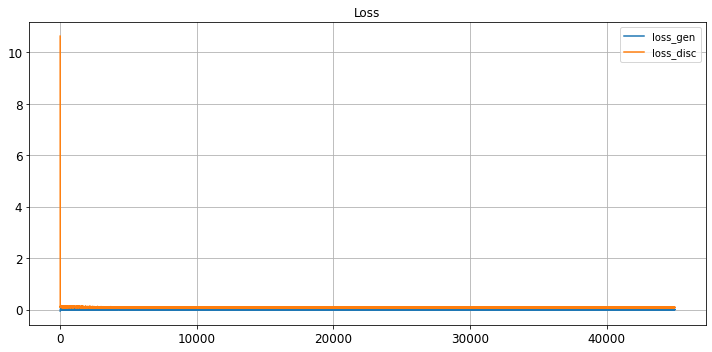

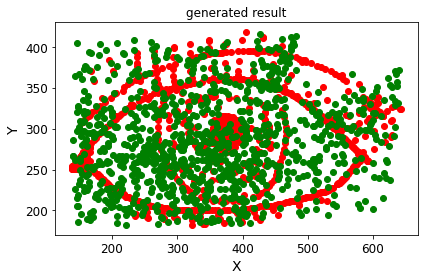

save the model & result
Epoch 45001/100000
critic: 0.083813 - generator: 0.003066 - 0s
Epoch 45002/100000
critic: 0.071679 - generator: 0.001119 - 0s
Epoch 45003/100000
critic: 0.082549 - generator: 0.002072 - 0s
Epoch 45004/100000
critic: 0.077563 - generator: 0.005625 - 0s
Epoch 45005/100000
critic: 0.082447 - generator: -0.001822 - 0s
Epoch 45006/100000
critic: 0.079795 - generator: -0.000838 - 0s
Epoch 45007/100000
critic: 0.079567 - generator: -0.000178 - 0s
Epoch 45008/100000
critic: 0.085865 - generator: 0.001655 - 0s
Epoch 45009/100000
critic: 0.091187 - generator: 0.000505 - 0s
Epoch 45010/100000
critic: 0.078642 - generator: -0.000072 - 0s
Epoch 45011/100000
critic: 0.081541 - generator: 0.002488 - 0s
Epoch 45012/100000
critic: 0.074678 - generator: -0.001338 - 0s
Epoch 45013/100000
critic: 0.088341 - generator: 0.000955 - 0s
Epoch 45014/100000
critic: 0.090138 - generator: 0.000105 - 0s
Epoch 45015/100000
critic: 0.072615 - generator: -0.000863 - 0s
Epoch 45016/100000
critic

critic: 0.081571 - generator: -0.001655 - 0s
Epoch 45132/100000
critic: 0.082218 - generator: 0.000238 - 0s
Epoch 45133/100000
critic: 0.078693 - generator: -0.001527 - 0s
Epoch 45134/100000
critic: 0.091704 - generator: 0.000093 - 0s
Epoch 45135/100000
critic: 0.077821 - generator: 0.002525 - 0s
Epoch 45136/100000
critic: 0.086564 - generator: 0.001028 - 0s
Epoch 45137/100000
critic: 0.073726 - generator: -0.002596 - 0s
Epoch 45138/100000
critic: 0.081343 - generator: -0.001392 - 0s
Epoch 45139/100000
critic: 0.074201 - generator: 0.001048 - 0s
Epoch 45140/100000
critic: 0.073124 - generator: 0.006135 - 0s
Epoch 45141/100000
critic: 0.074852 - generator: 0.002512 - 0s
Epoch 45142/100000
critic: 0.066484 - generator: 0.005842 - 0s
Epoch 45143/100000
critic: 0.088211 - generator: 0.002038 - 0s
Epoch 45144/100000
critic: 0.081963 - generator: 0.003394 - 0s
Epoch 45145/100000
critic: 0.080587 - generator: -0.000736 - 0s
Epoch 45146/100000
critic: 0.074949 - generator: -0.002418 - 0s
Epoch

critic: 0.092711 - generator: -0.003044 - 0s
Epoch 45262/100000
critic: 0.080562 - generator: -0.002012 - 0s
Epoch 45263/100000
critic: 0.085222 - generator: -0.003253 - 0s
Epoch 45264/100000
critic: 0.091528 - generator: -0.000472 - 0s
Epoch 45265/100000
critic: 0.082551 - generator: -0.000572 - 0s
Epoch 45266/100000
critic: 0.083022 - generator: -0.001696 - 0s
Epoch 45267/100000
critic: 0.077808 - generator: -0.001970 - 0s
Epoch 45268/100000
critic: 0.074813 - generator: -0.000127 - 0s
Epoch 45269/100000
critic: 0.083943 - generator: 0.001791 - 0s
Epoch 45270/100000
critic: 0.089486 - generator: -0.001239 - 0s
Epoch 45271/100000
critic: 0.078028 - generator: -0.003954 - 0s
Epoch 45272/100000
critic: 0.079745 - generator: -0.002989 - 0s
Epoch 45273/100000
critic: 0.088906 - generator: -0.003948 - 0s
Epoch 45274/100000
critic: 0.083430 - generator: 0.001335 - 0s
Epoch 45275/100000
critic: 0.077468 - generator: 0.000227 - 0s
Epoch 45276/100000
critic: 0.084775 - generator: 0.000835 - 0s

critic: 0.077824 - generator: 0.002765 - 0s
Epoch 45392/100000
critic: 0.078685 - generator: -0.002772 - 0s
Epoch 45393/100000
critic: 0.079462 - generator: 0.001199 - 0s
Epoch 45394/100000
critic: 0.087273 - generator: 0.000598 - 0s
Epoch 45395/100000
critic: 0.085875 - generator: -0.003636 - 0s
Epoch 45396/100000
critic: 0.087534 - generator: -0.000735 - 0s
Epoch 45397/100000
critic: 0.081233 - generator: 0.002216 - 0s
Epoch 45398/100000
critic: 0.073375 - generator: -0.001058 - 0s
Epoch 45399/100000
critic: 0.080287 - generator: 0.001706 - 0s
Epoch 45400/100000
critic: 0.079559 - generator: 0.001170 - 0s
Epoch 45401/100000
critic: 0.083832 - generator: 0.003108 - 0s
Epoch 45402/100000
critic: 0.071598 - generator: -0.002057 - 0s
Epoch 45403/100000
critic: 0.077246 - generator: 0.001410 - 0s
Epoch 45404/100000
critic: 0.084220 - generator: 0.000887 - 0s
Epoch 45405/100000
critic: 0.070329 - generator: 0.003421 - 0s
Epoch 45406/100000
critic: 0.081328 - generator: -0.001340 - 0s
Epoch

critic: 0.070809 - generator: 0.000578 - 0s
Epoch 45522/100000
critic: 0.087779 - generator: -0.001475 - 0s
Epoch 45523/100000
critic: 0.078162 - generator: 0.002075 - 0s
Epoch 45524/100000
critic: 0.086338 - generator: 0.002942 - 0s
Epoch 45525/100000
critic: 0.078506 - generator: -0.001961 - 0s
Epoch 45526/100000
critic: 0.076112 - generator: -0.000675 - 0s
Epoch 45527/100000
critic: 0.085848 - generator: 0.000291 - 0s
Epoch 45528/100000
critic: 0.071607 - generator: 0.000571 - 0s
Epoch 45529/100000
critic: 0.083440 - generator: -0.001602 - 0s
Epoch 45530/100000
critic: 0.075800 - generator: -0.002116 - 0s
Epoch 45531/100000
critic: 0.077911 - generator: -0.002826 - 0s
Epoch 45532/100000
critic: 0.083652 - generator: -0.000038 - 0s
Epoch 45533/100000
critic: 0.083673 - generator: -0.001093 - 0s
Epoch 45534/100000
critic: 0.079271 - generator: 0.000653 - 0s
Epoch 45535/100000
critic: 0.081925 - generator: -0.000342 - 0s
Epoch 45536/100000
critic: 0.080780 - generator: 0.001906 - 0s
Ep

critic: 0.075224 - generator: -0.001591 - 0s
Epoch 45652/100000
critic: 0.074983 - generator: -0.001995 - 0s
Epoch 45653/100000
critic: 0.072586 - generator: -0.000898 - 0s
Epoch 45654/100000
critic: 0.068715 - generator: -0.001187 - 0s
Epoch 45655/100000
critic: 0.065802 - generator: 0.001239 - 0s
Epoch 45656/100000
critic: 0.087977 - generator: -0.003624 - 0s
Epoch 45657/100000
critic: 0.081103 - generator: -0.001512 - 0s
Epoch 45658/100000
critic: 0.090922 - generator: 0.001614 - 0s
Epoch 45659/100000
critic: 0.077292 - generator: 0.000746 - 0s
Epoch 45660/100000
critic: 0.076694 - generator: -0.003813 - 0s
Epoch 45661/100000
critic: 0.075116 - generator: -0.003175 - 0s
Epoch 45662/100000
critic: 0.079493 - generator: -0.003228 - 0s
Epoch 45663/100000
critic: 0.071676 - generator: 0.002738 - 0s
Epoch 45664/100000
critic: 0.079825 - generator: 0.002263 - 0s
Epoch 45665/100000
critic: 0.076266 - generator: 0.001281 - 0s
Epoch 45666/100000
critic: 0.083081 - generator: -0.000095 - 0s
E

critic: 0.084318 - generator: -0.001221 - 0s
Epoch 45783/100000
critic: 0.081998 - generator: 0.002065 - 0s
Epoch 45784/100000
critic: 0.073785 - generator: -0.001861 - 0s
Epoch 45785/100000
critic: 0.078238 - generator: 0.002295 - 0s
Epoch 45786/100000
critic: 0.085122 - generator: 0.001156 - 0s
Epoch 45787/100000
critic: 0.076747 - generator: 0.002254 - 0s
Epoch 45788/100000
critic: 0.085895 - generator: -0.000231 - 0s
Epoch 45789/100000
critic: 0.079616 - generator: -0.001637 - 0s
Epoch 45790/100000
critic: 0.089385 - generator: 0.001586 - 0s
Epoch 45791/100000
critic: 0.078990 - generator: -0.002308 - 0s
Epoch 45792/100000
critic: 0.073655 - generator: -0.003564 - 0s
Epoch 45793/100000
critic: 0.090363 - generator: -0.004787 - 0s
Epoch 45794/100000
critic: 0.076949 - generator: -0.002489 - 0s
Epoch 45795/100000
critic: 0.079792 - generator: -0.004558 - 0s
Epoch 45796/100000
critic: 0.078664 - generator: -0.002817 - 0s
Epoch 45797/100000
critic: 0.076982 - generator: -0.006050 - 0s


critic: 0.089354 - generator: -0.002896 - 0s
Epoch 45913/100000
critic: 0.084728 - generator: -0.001350 - 0s
Epoch 45914/100000
critic: 0.079310 - generator: -0.000714 - 0s
Epoch 45915/100000
critic: 0.073000 - generator: -0.005450 - 0s
Epoch 45916/100000
critic: 0.078838 - generator: -0.000752 - 0s
Epoch 45917/100000
critic: 0.090010 - generator: 0.000899 - 0s
Epoch 45918/100000
critic: 0.078275 - generator: 0.000266 - 0s
Epoch 45919/100000
critic: 0.082645 - generator: 0.001264 - 0s
Epoch 45920/100000
critic: 0.084058 - generator: -0.000775 - 0s
Epoch 45921/100000
critic: 0.097464 - generator: -0.001695 - 0s
Epoch 45922/100000
critic: 0.078497 - generator: -0.003211 - 0s
Epoch 45923/100000
critic: 0.076446 - generator: 0.001201 - 0s
Epoch 45924/100000
critic: 0.074459 - generator: 0.004122 - 0s
Epoch 45925/100000
critic: 0.090527 - generator: 0.004642 - 0s
Epoch 45926/100000
critic: 0.077642 - generator: 0.002504 - 0s
Epoch 45927/100000
critic: 0.082420 - generator: -0.000132 - 0s
Ep

critic: 0.081065 - generator: -0.001389 - 0s
Epoch 46042/100000
critic: 0.075687 - generator: 0.001517 - 0s
Epoch 46043/100000
critic: 0.087602 - generator: 0.001128 - 0s
Epoch 46044/100000
critic: 0.078597 - generator: 0.000180 - 0s
Epoch 46045/100000
critic: 0.084541 - generator: -0.003239 - 0s
Epoch 46046/100000
critic: 0.081632 - generator: 0.002160 - 0s
Epoch 46047/100000
critic: 0.079757 - generator: 0.002973 - 0s
Epoch 46048/100000
critic: 0.087804 - generator: 0.004289 - 0s
Epoch 46049/100000
critic: 0.086459 - generator: -0.001092 - 0s
Epoch 46050/100000
critic: 0.081821 - generator: -0.000828 - 0s
Epoch 46051/100000
critic: 0.078018 - generator: -0.004260 - 0s
Epoch 46052/100000
critic: 0.075990 - generator: -0.000248 - 0s
Epoch 46053/100000
critic: 0.077618 - generator: -0.002200 - 0s
Epoch 46054/100000
critic: 0.072999 - generator: -0.001365 - 0s
Epoch 46055/100000
critic: 0.077443 - generator: 0.001545 - 0s
Epoch 46056/100000
critic: 0.082350 - generator: 0.003442 - 0s
Epo

critic: 0.085749 - generator: 0.002521 - 0s
Epoch 46172/100000
critic: 0.082214 - generator: 0.001933 - 0s
Epoch 46173/100000
critic: 0.082803 - generator: -0.002544 - 0s
Epoch 46174/100000
critic: 0.087856 - generator: 0.004401 - 0s
Epoch 46175/100000
critic: 0.078570 - generator: 0.000369 - 0s
Epoch 46176/100000
critic: 0.086477 - generator: -0.002304 - 0s
Epoch 46177/100000
critic: 0.070980 - generator: -0.000887 - 0s
Epoch 46178/100000
critic: 0.071804 - generator: 0.001444 - 0s
Epoch 46179/100000
critic: 0.080701 - generator: 0.002843 - 0s
Epoch 46180/100000
critic: 0.083907 - generator: 0.003862 - 0s
Epoch 46181/100000
critic: 0.080656 - generator: -0.000846 - 0s
Epoch 46182/100000
critic: 0.081669 - generator: -0.003074 - 0s
Epoch 46183/100000
critic: 0.073296 - generator: -0.000079 - 0s
Epoch 46184/100000
critic: 0.084013 - generator: 0.002384 - 0s
Epoch 46185/100000
critic: 0.088515 - generator: -0.000570 - 0s
Epoch 46186/100000
critic: 0.078446 - generator: -0.003555 - 0s
Epo

critic: 0.081355 - generator: -0.002102 - 0s
Epoch 46302/100000
critic: 0.083297 - generator: -0.001140 - 0s
Epoch 46303/100000
critic: 0.092865 - generator: 0.002848 - 0s
Epoch 46304/100000
critic: 0.076325 - generator: 0.002246 - 0s
Epoch 46305/100000
critic: 0.078684 - generator: -0.001752 - 0s
Epoch 46306/100000
critic: 0.085227 - generator: -0.000378 - 0s
Epoch 46307/100000
critic: 0.082628 - generator: -0.000556 - 0s
Epoch 46308/100000
critic: 0.087803 - generator: -0.002492 - 0s
Epoch 46309/100000
critic: 0.088370 - generator: 0.001662 - 0s
Epoch 46310/100000
critic: 0.072795 - generator: 0.000792 - 0s
Epoch 46311/100000
critic: 0.091582 - generator: 0.005167 - 0s
Epoch 46312/100000
critic: 0.088426 - generator: 0.002884 - 0s
Epoch 46313/100000
critic: 0.083655 - generator: -0.000671 - 0s
Epoch 46314/100000
critic: 0.083485 - generator: 0.001562 - 0s
Epoch 46315/100000
critic: 0.084286 - generator: 0.000404 - 0s
Epoch 46316/100000
critic: 0.076893 - generator: -0.002217 - 0s
Epo

critic: 0.081156 - generator: 0.000533 - 0s
Epoch 46432/100000
critic: 0.087880 - generator: -0.005048 - 0s
Epoch 46433/100000
critic: 0.082047 - generator: -0.001904 - 0s
Epoch 46434/100000
critic: 0.079425 - generator: 0.000353 - 0s
Epoch 46435/100000
critic: 0.081591 - generator: 0.000829 - 0s
Epoch 46436/100000
critic: 0.072834 - generator: -0.000484 - 0s
Epoch 46437/100000
critic: 0.083029 - generator: 0.003761 - 0s
Epoch 46438/100000
critic: 0.081254 - generator: 0.001299 - 0s
Epoch 46439/100000
critic: 0.092442 - generator: -0.000983 - 0s
Epoch 46440/100000
critic: 0.082018 - generator: -0.002315 - 0s
Epoch 46441/100000
critic: 0.089508 - generator: 0.001013 - 0s
Epoch 46442/100000
critic: 0.079369 - generator: 0.005353 - 0s
Epoch 46443/100000
critic: 0.078895 - generator: 0.002802 - 0s
Epoch 46444/100000
critic: 0.082648 - generator: 0.001129 - 0s
Epoch 46445/100000
critic: 0.070291 - generator: -0.003332 - 0s
Epoch 46446/100000
critic: 0.079039 - generator: 0.001875 - 0s
Epoch

critic: 0.080716 - generator: 0.001510 - 0s
Epoch 46562/100000
critic: 0.074044 - generator: -0.000926 - 0s
Epoch 46563/100000
critic: 0.089677 - generator: 0.001874 - 0s
Epoch 46564/100000
critic: 0.078368 - generator: -0.000312 - 0s
Epoch 46565/100000
critic: 0.076904 - generator: 0.004375 - 0s
Epoch 46566/100000
critic: 0.085479 - generator: 0.003505 - 0s
Epoch 46567/100000
critic: 0.075721 - generator: 0.000790 - 0s
Epoch 46568/100000
critic: 0.091162 - generator: 0.000460 - 0s
Epoch 46569/100000
critic: 0.076278 - generator: 0.001461 - 0s
Epoch 46570/100000
critic: 0.078317 - generator: -0.003826 - 0s
Epoch 46571/100000
critic: 0.078475 - generator: -0.003725 - 0s
Epoch 46572/100000
critic: 0.085587 - generator: -0.003183 - 0s
Epoch 46573/100000
critic: 0.081119 - generator: -0.002705 - 0s
Epoch 46574/100000
critic: 0.087573 - generator: -0.006218 - 0s
Epoch 46575/100000
critic: 0.078995 - generator: -0.002200 - 0s
Epoch 46576/100000
critic: 0.079126 - generator: -0.000464 - 0s
Ep

critic: 0.074416 - generator: 0.002063 - 0s
Epoch 46692/100000
critic: 0.084535 - generator: 0.001661 - 0s
Epoch 46693/100000
critic: 0.077410 - generator: -0.003237 - 0s
Epoch 46694/100000
critic: 0.075653 - generator: -0.001501 - 0s
Epoch 46695/100000
critic: 0.093717 - generator: 0.000971 - 0s
Epoch 46696/100000
critic: 0.079020 - generator: -0.002371 - 0s
Epoch 46697/100000
critic: 0.083539 - generator: -0.001147 - 0s
Epoch 46698/100000
critic: 0.078401 - generator: 0.001539 - 0s
Epoch 46699/100000
critic: 0.078270 - generator: 0.000162 - 0s
Epoch 46700/100000
critic: 0.075556 - generator: 0.001381 - 0s
Epoch 46701/100000
critic: 0.074803 - generator: -0.001230 - 0s
Epoch 46702/100000
critic: 0.083372 - generator: -0.000171 - 0s
Epoch 46703/100000
critic: 0.075132 - generator: -0.001630 - 0s
Epoch 46704/100000
critic: 0.078848 - generator: -0.002592 - 0s
Epoch 46705/100000
critic: 0.095283 - generator: -0.003662 - 0s
Epoch 46706/100000
critic: 0.069770 - generator: -0.000729 - 0s
E

critic: 0.070964 - generator: -0.002581 - 0s
Epoch 46822/100000
critic: 0.079223 - generator: -0.005176 - 0s
Epoch 46823/100000
critic: 0.081188 - generator: -0.001705 - 0s
Epoch 46824/100000
critic: 0.087675 - generator: 0.000464 - 0s
Epoch 46825/100000
critic: 0.076562 - generator: 0.002372 - 0s
Epoch 46826/100000
critic: 0.082625 - generator: 0.002136 - 0s
Epoch 46827/100000
critic: 0.091982 - generator: -0.003483 - 0s
Epoch 46828/100000
critic: 0.073158 - generator: -0.000286 - 0s
Epoch 46829/100000
critic: 0.087322 - generator: -0.001677 - 0s
Epoch 46830/100000
critic: 0.085156 - generator: 0.002910 - 0s
Epoch 46831/100000
critic: 0.083519 - generator: -0.001375 - 0s
Epoch 46832/100000
critic: 0.089269 - generator: -0.003186 - 0s
Epoch 46833/100000
critic: 0.073530 - generator: 0.001731 - 0s
Epoch 46834/100000
critic: 0.082976 - generator: 0.002857 - 0s
Epoch 46835/100000
critic: 0.088626 - generator: 0.006577 - 0s
Epoch 46836/100000
critic: 0.063736 - generator: 0.005531 - 0s
Epo

critic: 0.078136 - generator: 0.004200 - 0s
Epoch 46952/100000
critic: 0.080001 - generator: 0.000672 - 0s
Epoch 46953/100000
critic: 0.068686 - generator: -0.000632 - 0s
Epoch 46954/100000
critic: 0.086999 - generator: 0.000830 - 0s
Epoch 46955/100000
critic: 0.082992 - generator: -0.000140 - 0s
Epoch 46956/100000
critic: 0.076105 - generator: -0.002315 - 0s
Epoch 46957/100000
critic: 0.085140 - generator: -0.003029 - 0s
Epoch 46958/100000
critic: 0.080168 - generator: 0.000490 - 0s
Epoch 46959/100000
critic: 0.081334 - generator: 0.000417 - 0s
Epoch 46960/100000
critic: 0.089574 - generator: -0.002350 - 0s
Epoch 46961/100000
critic: 0.088632 - generator: -0.001040 - 0s
Epoch 46962/100000
critic: 0.068176 - generator: -0.002175 - 0s
Epoch 46963/100000
critic: 0.077757 - generator: 0.000437 - 0s
Epoch 46964/100000
critic: 0.077953 - generator: 0.005065 - 0s
Epoch 46965/100000
critic: 0.083145 - generator: 0.002014 - 0s
Epoch 46966/100000
critic: 0.083144 - generator: 0.001477 - 0s
Epoc

critic: 0.078800 - generator: -0.005919 - 0s
Epoch 47082/100000
critic: 0.081720 - generator: -0.001999 - 0s
Epoch 47083/100000
critic: 0.079211 - generator: 0.000343 - 0s
Epoch 47084/100000
critic: 0.087963 - generator: 0.004399 - 0s
Epoch 47085/100000
critic: 0.076910 - generator: 0.001532 - 0s
Epoch 47086/100000
critic: 0.083989 - generator: 0.002038 - 0s
Epoch 47087/100000
critic: 0.078223 - generator: 0.002497 - 0s
Epoch 47088/100000
critic: 0.087401 - generator: 0.003497 - 0s
Epoch 47089/100000
critic: 0.084432 - generator: 0.001858 - 0s
Epoch 47090/100000
critic: 0.072772 - generator: -0.004053 - 0s
Epoch 47091/100000
critic: 0.077791 - generator: -0.003473 - 0s
Epoch 47092/100000
critic: 0.079009 - generator: -0.000639 - 0s
Epoch 47093/100000
critic: 0.078425 - generator: 0.003277 - 0s
Epoch 47094/100000
critic: 0.082268 - generator: 0.004736 - 0s
Epoch 47095/100000
critic: 0.081843 - generator: 0.004395 - 0s
Epoch 47096/100000
critic: 0.088966 - generator: 0.004342 - 0s
Epoch 

critic: 0.077834 - generator: -0.002827 - 0s
Epoch 47213/100000
critic: 0.079399 - generator: 0.001065 - 0s
Epoch 47214/100000
critic: 0.076045 - generator: 0.002744 - 0s
Epoch 47215/100000
critic: 0.082519 - generator: 0.000528 - 0s
Epoch 47216/100000
critic: 0.081558 - generator: 0.001590 - 0s
Epoch 47217/100000
critic: 0.086166 - generator: 0.005030 - 0s
Epoch 47218/100000
critic: 0.086141 - generator: 0.000663 - 0s
Epoch 47219/100000
critic: 0.078326 - generator: -0.002987 - 0s
Epoch 47220/100000
critic: 0.083177 - generator: 0.001065 - 0s
Epoch 47221/100000
critic: 0.075679 - generator: -0.001416 - 0s
Epoch 47222/100000
critic: 0.092794 - generator: -0.002167 - 0s
Epoch 47223/100000
critic: 0.078376 - generator: -0.005642 - 0s
Epoch 47224/100000
critic: 0.079306 - generator: -0.004418 - 0s
Epoch 47225/100000
critic: 0.084964 - generator: 0.000099 - 0s
Epoch 47226/100000
critic: 0.087336 - generator: -0.002025 - 0s
Epoch 47227/100000
critic: 0.074840 - generator: 0.002571 - 0s
Epoc

critic: 0.070186 - generator: -0.000336 - 0s
Epoch 47343/100000
critic: 0.084378 - generator: 0.002220 - 0s
Epoch 47344/100000
critic: 0.077756 - generator: 0.001398 - 0s
Epoch 47345/100000
critic: 0.070123 - generator: 0.002005 - 0s
Epoch 47346/100000
critic: 0.090055 - generator: 0.003450 - 0s
Epoch 47347/100000
critic: 0.082285 - generator: 0.003353 - 0s
Epoch 47348/100000
critic: 0.085725 - generator: -0.000009 - 0s
Epoch 47349/100000
critic: 0.085148 - generator: -0.006862 - 0s
Epoch 47350/100000
critic: 0.071388 - generator: -0.002027 - 0s
Epoch 47351/100000
critic: 0.083014 - generator: -0.002146 - 0s
Epoch 47352/100000
critic: 0.087768 - generator: -0.000212 - 0s
Epoch 47353/100000
critic: 0.077377 - generator: -0.002747 - 0s
Epoch 47354/100000
critic: 0.071324 - generator: -0.003850 - 0s
Epoch 47355/100000
critic: 0.079846 - generator: 0.000349 - 0s
Epoch 47356/100000
critic: 0.083758 - generator: -0.002109 - 0s
Epoch 47357/100000
critic: 0.088223 - generator: -0.000783 - 0s
E

critic: 0.086137 - generator: 0.003648 - 0s
Epoch 47473/100000
critic: 0.067615 - generator: -0.004375 - 0s
Epoch 47474/100000
critic: 0.071242 - generator: -0.003743 - 0s
Epoch 47475/100000
critic: 0.072196 - generator: -0.002966 - 0s
Epoch 47476/100000
critic: 0.082808 - generator: -0.003373 - 0s
Epoch 47477/100000
critic: 0.085236 - generator: 0.004167 - 0s
Epoch 47478/100000
critic: 0.078167 - generator: 0.000273 - 0s
Epoch 47479/100000
critic: 0.079900 - generator: -0.001622 - 0s
Epoch 47480/100000
critic: 0.080790 - generator: -0.004082 - 0s
Epoch 47481/100000
critic: 0.079802 - generator: -0.002600 - 0s
Epoch 47482/100000
critic: 0.085156 - generator: -0.004124 - 0s
Epoch 47483/100000
critic: 0.078860 - generator: -0.002592 - 0s
Epoch 47484/100000
critic: 0.087854 - generator: -0.001435 - 0s
Epoch 47485/100000
critic: 0.087746 - generator: 0.000572 - 0s
Epoch 47486/100000
critic: 0.080671 - generator: 0.002219 - 0s
Epoch 47487/100000
critic: 0.085145 - generator: 0.004218 - 0s
E

critic: 0.079890 - generator: 0.002985 - 0s
Epoch 47603/100000
critic: 0.090755 - generator: 0.000314 - 0s
Epoch 47604/100000
critic: 0.076275 - generator: -0.006763 - 0s
Epoch 47605/100000
critic: 0.086974 - generator: -0.000164 - 0s
Epoch 47606/100000
critic: 0.080023 - generator: -0.003278 - 0s
Epoch 47607/100000
critic: 0.080974 - generator: -0.002300 - 0s
Epoch 47608/100000
critic: 0.085594 - generator: 0.001734 - 0s
Epoch 47609/100000
critic: 0.073635 - generator: -0.000196 - 0s
Epoch 47610/100000
critic: 0.082261 - generator: 0.002258 - 0s
Epoch 47611/100000
critic: 0.070631 - generator: -0.001796 - 0s
Epoch 47612/100000
critic: 0.077589 - generator: 0.002837 - 0s
Epoch 47613/100000
critic: 0.078186 - generator: 0.001532 - 0s
Epoch 47614/100000
critic: 0.078594 - generator: 0.000143 - 0s
Epoch 47615/100000
critic: 0.078927 - generator: -0.001515 - 0s
Epoch 47616/100000
critic: 0.079594 - generator: 0.003906 - 0s
Epoch 47617/100000
critic: 0.066523 - generator: 0.000093 - 0s
Epoc

critic: 0.082658 - generator: -0.004943 - 0s
Epoch 47734/100000
critic: 0.083753 - generator: -0.001955 - 0s
Epoch 47735/100000
critic: 0.084918 - generator: 0.000268 - 0s
Epoch 47736/100000
critic: 0.078646 - generator: 0.001305 - 0s
Epoch 47737/100000
critic: 0.093250 - generator: -0.003298 - 0s
Epoch 47738/100000
critic: 0.081146 - generator: -0.003190 - 0s
Epoch 47739/100000
critic: 0.086671 - generator: -0.000778 - 0s
Epoch 47740/100000
critic: 0.063174 - generator: 0.003030 - 0s
Epoch 47741/100000
critic: 0.083946 - generator: 0.009544 - 0s
Epoch 47742/100000
critic: 0.088181 - generator: 0.005994 - 0s
Epoch 47743/100000
critic: 0.082869 - generator: 0.001843 - 0s
Epoch 47744/100000
critic: 0.080026 - generator: -0.003282 - 0s
Epoch 47745/100000
critic: 0.070846 - generator: -0.000662 - 0s
Epoch 47746/100000
critic: 0.078319 - generator: 0.004232 - 0s
Epoch 47747/100000
critic: 0.086188 - generator: 0.001758 - 0s
Epoch 47748/100000
critic: 0.086071 - generator: 0.000415 - 0s
Epoc

critic: 0.070902 - generator: -0.001743 - 0s
Epoch 47864/100000
critic: 0.081863 - generator: 0.000747 - 0s
Epoch 47865/100000
critic: 0.078206 - generator: -0.004131 - 0s
Epoch 47866/100000
critic: 0.090409 - generator: -0.003612 - 0s
Epoch 47867/100000
critic: 0.087407 - generator: -0.003434 - 0s
Epoch 47868/100000
critic: 0.085266 - generator: -0.000023 - 0s
Epoch 47869/100000
critic: 0.078547 - generator: -0.001254 - 0s
Epoch 47870/100000
critic: 0.085100 - generator: -0.003038 - 0s
Epoch 47871/100000
critic: 0.078218 - generator: -0.001890 - 0s
Epoch 47872/100000
critic: 0.086335 - generator: -0.005453 - 0s
Epoch 47873/100000
critic: 0.092120 - generator: -0.001397 - 0s
Epoch 47874/100000
critic: 0.074996 - generator: 0.001666 - 0s
Epoch 47875/100000
critic: 0.078813 - generator: 0.000244 - 0s
Epoch 47876/100000
critic: 0.081632 - generator: 0.001184 - 0s
Epoch 47877/100000
critic: 0.078963 - generator: -0.001156 - 0s
Epoch 47878/100000
critic: 0.073733 - generator: -0.002207 - 0s

critic: 0.092337 - generator: 0.003210 - 0s
Epoch 47994/100000
critic: 0.070541 - generator: 0.003889 - 0s
Epoch 47995/100000
critic: 0.084510 - generator: 0.000883 - 0s
Epoch 47996/100000
critic: 0.080949 - generator: 0.000099 - 0s
Epoch 47997/100000
critic: 0.071524 - generator: -0.003099 - 0s
Epoch 47998/100000
critic: 0.066742 - generator: 0.002077 - 0s
Epoch 47999/100000
critic: 0.081890 - generator: 0.001726 - 0s
Epoch 48000/100000
critic: 0.078514 - generator: 0.001141 - 0s
Epoch 48001/100000
critic: 0.080170 - generator: 0.003939 - 0s
Epoch 48002/100000
critic: 0.083952 - generator: -0.000293 - 0s
Epoch 48003/100000
critic: 0.075589 - generator: 0.002145 - 0s
Epoch 48004/100000
critic: 0.075768 - generator: 0.001461 - 0s
Epoch 48005/100000
critic: 0.082512 - generator: -0.000730 - 0s
Epoch 48006/100000
critic: 0.090518 - generator: 0.000764 - 0s
Epoch 48007/100000
critic: 0.078289 - generator: -0.000538 - 0s
Epoch 48008/100000
critic: 0.082822 - generator: 0.001389 - 0s
Epoch 4

critic: 0.088050 - generator: -0.000571 - 0s
Epoch 48124/100000
critic: 0.077485 - generator: -0.000413 - 0s
Epoch 48125/100000
critic: 0.080518 - generator: -0.002043 - 0s
Epoch 48126/100000
critic: 0.086675 - generator: -0.002717 - 0s
Epoch 48127/100000
critic: 0.067479 - generator: 0.000913 - 0s
Epoch 48128/100000
critic: 0.097222 - generator: -0.001815 - 0s
Epoch 48129/100000
critic: 0.087588 - generator: -0.001286 - 0s
Epoch 48130/100000
critic: 0.070693 - generator: 0.004858 - 0s
Epoch 48131/100000
critic: 0.079177 - generator: 0.003525 - 0s
Epoch 48132/100000
critic: 0.091301 - generator: 0.005151 - 0s
Epoch 48133/100000
critic: 0.081074 - generator: 0.003216 - 0s
Epoch 48134/100000
critic: 0.082883 - generator: 0.000115 - 0s
Epoch 48135/100000
critic: 0.086186 - generator: -0.000356 - 0s
Epoch 48136/100000
critic: 0.080326 - generator: -0.004718 - 0s
Epoch 48137/100000
critic: 0.092743 - generator: 0.000763 - 0s
Epoch 48138/100000
critic: 0.074013 - generator: -0.003236 - 0s
Ep

critic: 0.073184 - generator: 0.001642 - 0s
Epoch 48254/100000
critic: 0.086568 - generator: 0.002380 - 0s
Epoch 48255/100000
critic: 0.081794 - generator: -0.002119 - 0s
Epoch 48256/100000
critic: 0.076210 - generator: -0.004548 - 0s
Epoch 48257/100000
critic: 0.088655 - generator: -0.003429 - 0s
Epoch 48258/100000
critic: 0.081661 - generator: -0.000710 - 0s
Epoch 48259/100000
critic: 0.070093 - generator: -0.001082 - 0s
Epoch 48260/100000
critic: 0.079676 - generator: 0.000606 - 0s
Epoch 48261/100000
critic: 0.086716 - generator: 0.000344 - 0s
Epoch 48262/100000
critic: 0.078314 - generator: 0.001540 - 0s
Epoch 48263/100000
critic: 0.082213 - generator: -0.001833 - 0s
Epoch 48264/100000
critic: 0.085357 - generator: -0.001334 - 0s
Epoch 48265/100000
critic: 0.086186 - generator: 0.002841 - 0s
Epoch 48266/100000
critic: 0.082323 - generator: 0.003137 - 0s
Epoch 48267/100000
critic: 0.073344 - generator: 0.004713 - 0s
Epoch 48268/100000
critic: 0.083795 - generator: 0.002254 - 0s
Epoc

critic: 0.080527 - generator: -0.000987 - 0s
Epoch 48384/100000
critic: 0.083342 - generator: 0.002187 - 0s
Epoch 48385/100000
critic: 0.080753 - generator: -0.000224 - 0s
Epoch 48386/100000
critic: 0.084133 - generator: 0.000291 - 0s
Epoch 48387/100000
critic: 0.080853 - generator: -0.002423 - 0s
Epoch 48388/100000
critic: 0.089866 - generator: 0.000255 - 0s
Epoch 48389/100000
critic: 0.069214 - generator: 0.003582 - 0s
Epoch 48390/100000
critic: 0.081848 - generator: -0.004383 - 0s
Epoch 48391/100000
critic: 0.067742 - generator: 0.001851 - 0s
Epoch 48392/100000
critic: 0.075136 - generator: 0.003475 - 0s
Epoch 48393/100000
critic: 0.085430 - generator: 0.001553 - 0s
Epoch 48394/100000
critic: 0.078133 - generator: 0.000294 - 0s
Epoch 48395/100000
critic: 0.073550 - generator: -0.000731 - 0s
Epoch 48396/100000
critic: 0.083646 - generator: -0.001508 - 0s
Epoch 48397/100000
critic: 0.086743 - generator: -0.005265 - 0s
Epoch 48398/100000
critic: 0.081490 - generator: 0.000304 - 0s
Epoc

critic: 0.087965 - generator: 0.002372 - 0s
Epoch 48514/100000
critic: 0.083467 - generator: 0.000362 - 0s
Epoch 48515/100000
critic: 0.081324 - generator: -0.001279 - 0s
Epoch 48516/100000
critic: 0.075778 - generator: 0.001397 - 0s
Epoch 48517/100000
critic: 0.075298 - generator: 0.001069 - 0s
Epoch 48518/100000
critic: 0.074193 - generator: -0.001537 - 0s
Epoch 48519/100000
critic: 0.080996 - generator: 0.002571 - 0s
Epoch 48520/100000
critic: 0.072798 - generator: -0.000552 - 0s
Epoch 48521/100000
critic: 0.078831 - generator: -0.001397 - 0s
Epoch 48522/100000
critic: 0.070479 - generator: -0.003522 - 0s
Epoch 48523/100000
critic: 0.079442 - generator: -0.002684 - 0s
Epoch 48524/100000
critic: 0.081929 - generator: -0.001734 - 0s
Epoch 48525/100000
critic: 0.080664 - generator: -0.001564 - 0s
Epoch 48526/100000
critic: 0.080305 - generator: 0.001904 - 0s
Epoch 48527/100000
critic: 0.081818 - generator: -0.001620 - 0s
Epoch 48528/100000
critic: 0.082050 - generator: 0.001884 - 0s
Ep

critic: 0.088474 - generator: 0.001111 - 0s
Epoch 48644/100000
critic: 0.082167 - generator: -0.000108 - 0s
Epoch 48645/100000
critic: 0.082521 - generator: -0.001118 - 0s
Epoch 48646/100000
critic: 0.070769 - generator: -0.002035 - 0s
Epoch 48647/100000
critic: 0.074772 - generator: -0.002981 - 0s
Epoch 48648/100000
critic: 0.087174 - generator: 0.000227 - 0s
Epoch 48649/100000
critic: 0.077789 - generator: -0.003935 - 0s
Epoch 48650/100000
critic: 0.084452 - generator: -0.000555 - 0s
Epoch 48651/100000
critic: 0.076768 - generator: -0.000468 - 0s
Epoch 48652/100000
critic: 0.078010 - generator: 0.000519 - 0s
Epoch 48653/100000
critic: 0.086092 - generator: -0.003968 - 0s
Epoch 48654/100000
critic: 0.070737 - generator: 0.004835 - 0s
Epoch 48655/100000
critic: 0.082784 - generator: 0.001849 - 0s
Epoch 48656/100000
critic: 0.076042 - generator: -0.001594 - 0s
Epoch 48657/100000
critic: 0.079133 - generator: -0.000749 - 0s
Epoch 48658/100000
critic: 0.083821 - generator: 0.000025 - 0s
E

critic: 0.084078 - generator: 0.000858 - 0s
Epoch 48774/100000
critic: 0.074682 - generator: -0.002828 - 0s
Epoch 48775/100000
critic: 0.080654 - generator: -0.002243 - 0s
Epoch 48776/100000
critic: 0.079496 - generator: -0.002646 - 0s
Epoch 48777/100000
critic: 0.087030 - generator: 0.002038 - 0s
Epoch 48778/100000
critic: 0.086817 - generator: -0.001847 - 0s
Epoch 48779/100000
critic: 0.093719 - generator: 0.003382 - 0s
Epoch 48780/100000
critic: 0.079544 - generator: -0.001455 - 0s
Epoch 48781/100000
critic: 0.078342 - generator: 0.000704 - 0s
Epoch 48782/100000
critic: 0.091883 - generator: 0.000954 - 0s
Epoch 48783/100000
critic: 0.082536 - generator: -0.000859 - 0s
Epoch 48784/100000
critic: 0.077122 - generator: -0.000690 - 0s
Epoch 48785/100000
critic: 0.078692 - generator: -0.002296 - 0s
Epoch 48786/100000
critic: 0.082176 - generator: 0.006080 - 0s
Epoch 48787/100000
critic: 0.073412 - generator: -0.000867 - 0s
Epoch 48788/100000
critic: 0.080044 - generator: -0.001116 - 0s
E

critic: 0.079547 - generator: -0.000988 - 0s
Epoch 48904/100000
critic: 0.073983 - generator: -0.001361 - 0s
Epoch 48905/100000
critic: 0.080243 - generator: 0.005156 - 0s
Epoch 48906/100000
critic: 0.083082 - generator: 0.002000 - 0s
Epoch 48907/100000
critic: 0.086811 - generator: 0.002302 - 0s
Epoch 48908/100000
critic: 0.077286 - generator: 0.000161 - 0s
Epoch 48909/100000
critic: 0.085705 - generator: 0.002036 - 0s
Epoch 48910/100000
critic: 0.076367 - generator: -0.001062 - 0s
Epoch 48911/100000
critic: 0.071523 - generator: -0.000095 - 0s
Epoch 48912/100000
critic: 0.070959 - generator: 0.001105 - 0s
Epoch 48913/100000
critic: 0.080474 - generator: -0.000051 - 0s
Epoch 48914/100000
critic: 0.070777 - generator: 0.001617 - 0s
Epoch 48915/100000
critic: 0.082551 - generator: 0.001426 - 0s
Epoch 48916/100000
critic: 0.082262 - generator: 0.000546 - 0s
Epoch 48917/100000
critic: 0.084899 - generator: -0.002961 - 0s
Epoch 48918/100000
critic: 0.072710 - generator: 0.001363 - 0s
Epoch

critic: 0.066516 - generator: -0.005510 - 0s
Epoch 49034/100000
critic: 0.080660 - generator: -0.006175 - 0s
Epoch 49035/100000
critic: 0.072352 - generator: -0.005559 - 0s
Epoch 49036/100000
critic: 0.087218 - generator: -0.002450 - 0s
Epoch 49037/100000
critic: 0.090349 - generator: 0.000177 - 0s
Epoch 49038/100000
critic: 0.091535 - generator: 0.000661 - 0s
Epoch 49039/100000
critic: 0.083924 - generator: -0.000314 - 0s
Epoch 49040/100000
critic: 0.083987 - generator: 0.000668 - 0s
Epoch 49041/100000
critic: 0.073579 - generator: -0.002160 - 0s
Epoch 49042/100000
critic: 0.068318 - generator: -0.000880 - 0s
Epoch 49043/100000
critic: 0.075123 - generator: 0.004247 - 0s
Epoch 49044/100000
critic: 0.080297 - generator: 0.001883 - 0s
Epoch 49045/100000
critic: 0.086160 - generator: -0.000564 - 0s
Epoch 49046/100000
critic: 0.069115 - generator: -0.000058 - 0s
Epoch 49047/100000
critic: 0.090595 - generator: 0.002220 - 0s
Epoch 49048/100000
critic: 0.084712 - generator: 0.001293 - 0s
Ep

critic: 0.073994 - generator: -0.003182 - 0s
Epoch 49164/100000
critic: 0.085960 - generator: 0.005082 - 0s
Epoch 49165/100000
critic: 0.079230 - generator: -0.000464 - 0s
Epoch 49166/100000
critic: 0.075272 - generator: 0.003776 - 0s
Epoch 49167/100000
critic: 0.083984 - generator: 0.005763 - 0s
Epoch 49168/100000
critic: 0.078480 - generator: -0.002966 - 0s
Epoch 49169/100000
critic: 0.082731 - generator: 0.004261 - 0s
Epoch 49170/100000
critic: 0.072923 - generator: 0.002480 - 0s
Epoch 49171/100000
critic: 0.076194 - generator: -0.002659 - 0s
Epoch 49172/100000
critic: 0.091081 - generator: -0.003758 - 0s
Epoch 49173/100000
critic: 0.088142 - generator: 0.001069 - 0s
Epoch 49174/100000
critic: 0.079315 - generator: 0.003585 - 0s
Epoch 49175/100000
critic: 0.075498 - generator: -0.001562 - 0s
Epoch 49176/100000
critic: 0.079761 - generator: -0.001738 - 0s
Epoch 49177/100000
critic: 0.081086 - generator: -0.000225 - 0s
Epoch 49178/100000
critic: 0.076838 - generator: -0.001417 - 0s
Ep

critic: 0.094776 - generator: 0.002098 - 0s
Epoch 49294/100000
critic: 0.079397 - generator: 0.000186 - 0s
Epoch 49295/100000
critic: 0.086875 - generator: -0.000599 - 0s
Epoch 49296/100000
critic: 0.080082 - generator: 0.000084 - 0s
Epoch 49297/100000
critic: 0.075719 - generator: -0.000257 - 0s
Epoch 49298/100000
critic: 0.084861 - generator: -0.003701 - 0s
Epoch 49299/100000
critic: 0.084220 - generator: -0.000830 - 0s
Epoch 49300/100000
critic: 0.089080 - generator: 0.000191 - 0s
Epoch 49301/100000
critic: 0.076941 - generator: -0.000094 - 0s
Epoch 49302/100000
critic: 0.074950 - generator: -0.000003 - 0s
Epoch 49303/100000
critic: 0.087690 - generator: 0.000768 - 0s
Epoch 49304/100000
critic: 0.090655 - generator: 0.002355 - 0s
Epoch 49305/100000
critic: 0.080005 - generator: 0.002670 - 0s
Epoch 49306/100000
critic: 0.082336 - generator: 0.001906 - 0s
Epoch 49307/100000
critic: 0.080060 - generator: 0.002447 - 0s
Epoch 49308/100000
critic: 0.083475 - generator: 0.000317 - 0s
Epoch

critic: 0.081704 - generator: 0.003969 - 0s
Epoch 49424/100000
critic: 0.093313 - generator: 0.001809 - 0s
Epoch 49425/100000
critic: 0.082802 - generator: -0.003292 - 0s
Epoch 49426/100000
critic: 0.084910 - generator: -0.000494 - 0s
Epoch 49427/100000
critic: 0.079197 - generator: -0.003102 - 0s
Epoch 49428/100000
critic: 0.077724 - generator: 0.001248 - 0s
Epoch 49429/100000
critic: 0.075285 - generator: -0.000670 - 0s
Epoch 49430/100000
critic: 0.074152 - generator: 0.001078 - 0s
Epoch 49431/100000
critic: 0.081284 - generator: 0.002995 - 0s
Epoch 49432/100000
critic: 0.081843 - generator: 0.001475 - 0s
Epoch 49433/100000
critic: 0.083706 - generator: -0.001801 - 0s
Epoch 49434/100000
critic: 0.088786 - generator: -0.001994 - 0s
Epoch 49435/100000
critic: 0.082800 - generator: -0.000174 - 0s
Epoch 49436/100000
critic: 0.083842 - generator: -0.000157 - 0s
Epoch 49437/100000
critic: 0.082172 - generator: 0.001326 - 0s
Epoch 49438/100000
critic: 0.066575 - generator: -0.005060 - 0s
Ep

critic: 0.066445 - generator: -0.002716 - 0s
Epoch 49554/100000
critic: 0.098465 - generator: 0.002863 - 0s
Epoch 49555/100000
critic: 0.076273 - generator: -0.003632 - 0s
Epoch 49556/100000
critic: 0.074951 - generator: -0.004464 - 0s
Epoch 49557/100000
critic: 0.093143 - generator: -0.002625 - 0s
Epoch 49558/100000
critic: 0.077766 - generator: -0.002729 - 0s
Epoch 49559/100000
critic: 0.072941 - generator: -0.000717 - 0s
Epoch 49560/100000
critic: 0.082286 - generator: -0.004926 - 0s
Epoch 49561/100000
critic: 0.078072 - generator: 0.000392 - 0s
Epoch 49562/100000
critic: 0.085956 - generator: 0.000348 - 0s
Epoch 49563/100000
critic: 0.077857 - generator: -0.002010 - 0s
Epoch 49564/100000
critic: 0.076402 - generator: -0.003803 - 0s
Epoch 49565/100000
critic: 0.081911 - generator: -0.001890 - 0s
Epoch 49566/100000
critic: 0.080168 - generator: 0.000606 - 0s
Epoch 49567/100000
critic: 0.079887 - generator: -0.001372 - 0s
Epoch 49568/100000
critic: 0.070464 - generator: -0.002657 - 0s

critic: 0.084296 - generator: 0.000569 - 0s
Epoch 49684/100000
critic: 0.078683 - generator: -0.001458 - 0s
Epoch 49685/100000
critic: 0.088371 - generator: -0.001191 - 0s
Epoch 49686/100000
critic: 0.079223 - generator: 0.001700 - 0s
Epoch 49687/100000
critic: 0.073406 - generator: -0.003653 - 0s
Epoch 49688/100000
critic: 0.087665 - generator: -0.003806 - 0s
Epoch 49689/100000
critic: 0.081531 - generator: -0.000014 - 0s
Epoch 49690/100000
critic: 0.069215 - generator: -0.004301 - 0s
Epoch 49691/100000
critic: 0.062989 - generator: -0.002843 - 0s
Epoch 49692/100000
critic: 0.084375 - generator: -0.000247 - 0s
Epoch 49693/100000
critic: 0.087956 - generator: 0.001150 - 0s
Epoch 49694/100000
critic: 0.085662 - generator: 0.001353 - 0s
Epoch 49695/100000
critic: 0.082166 - generator: 0.000225 - 0s
Epoch 49696/100000
critic: 0.074554 - generator: 0.000531 - 0s
Epoch 49697/100000
critic: 0.075713 - generator: 0.003584 - 0s
Epoch 49698/100000
critic: 0.084582 - generator: 0.000457 - 0s
Epo

critic: 0.077385 - generator: -0.000482 - 0s
Epoch 49814/100000
critic: 0.081126 - generator: 0.001294 - 0s
Epoch 49815/100000
critic: 0.079082 - generator: -0.002313 - 0s
Epoch 49816/100000
critic: 0.076946 - generator: -0.000755 - 0s
Epoch 49817/100000
critic: 0.082077 - generator: 0.000792 - 0s
Epoch 49818/100000
critic: 0.066187 - generator: 0.000294 - 0s
Epoch 49819/100000
critic: 0.085490 - generator: 0.000939 - 0s
Epoch 49820/100000
critic: 0.074801 - generator: -0.001532 - 0s
Epoch 49821/100000
critic: 0.077379 - generator: -0.004805 - 0s
Epoch 49822/100000
critic: 0.073684 - generator: -0.003416 - 0s
Epoch 49823/100000
critic: 0.085703 - generator: -0.003795 - 0s
Epoch 49824/100000
critic: 0.079350 - generator: 0.001946 - 0s
Epoch 49825/100000
critic: 0.087366 - generator: 0.001105 - 0s
Epoch 49826/100000
critic: 0.077320 - generator: 0.002340 - 0s
Epoch 49827/100000
critic: 0.080039 - generator: -0.001904 - 0s
Epoch 49828/100000
critic: 0.092811 - generator: 0.002857 - 0s
Epo

critic: 0.080902 - generator: 0.000644 - 0s
Epoch 49944/100000
critic: 0.083924 - generator: 0.000454 - 0s
Epoch 49945/100000
critic: 0.072590 - generator: -0.004059 - 0s
Epoch 49946/100000
critic: 0.079030 - generator: -0.000768 - 0s
Epoch 49947/100000
critic: 0.093733 - generator: -0.001075 - 0s
Epoch 49948/100000
critic: 0.068965 - generator: -0.000057 - 0s
Epoch 49949/100000
critic: 0.078621 - generator: -0.001212 - 0s
Epoch 49950/100000
critic: 0.083547 - generator: -0.002597 - 0s
Epoch 49951/100000
critic: 0.073638 - generator: 0.002875 - 0s
Epoch 49952/100000
critic: 0.079439 - generator: -0.002335 - 0s
Epoch 49953/100000
critic: 0.081380 - generator: -0.000613 - 0s
Epoch 49954/100000
critic: 0.087367 - generator: 0.003750 - 0s
Epoch 49955/100000
critic: 0.081497 - generator: 0.000261 - 0s
Epoch 49956/100000
critic: 0.071715 - generator: -0.000674 - 0s
Epoch 49957/100000
critic: 0.068288 - generator: -0.000368 - 0s
Epoch 49958/100000
critic: 0.082468 - generator: 0.002167 - 0s
E

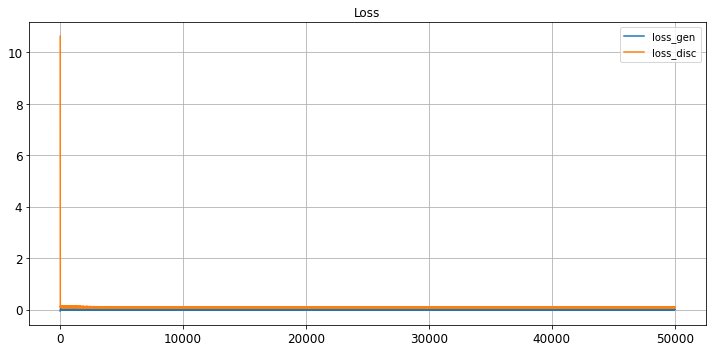

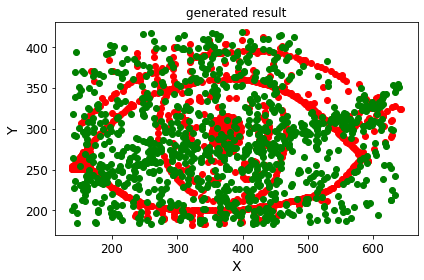

save the model & result
Epoch 50001/100000
critic: 0.080808 - generator: 0.002048 - 0s
Epoch 50002/100000
critic: 0.087516 - generator: -0.000840 - 0s
Epoch 50003/100000
critic: 0.066101 - generator: -0.004736 - 0s
Epoch 50004/100000
critic: 0.092829 - generator: -0.003383 - 0s
Epoch 50005/100000
critic: 0.080479 - generator: -0.003698 - 0s
Epoch 50006/100000
critic: 0.073888 - generator: -0.003800 - 0s
Epoch 50007/100000
critic: 0.084319 - generator: -0.001818 - 0s
Epoch 50008/100000
critic: 0.086850 - generator: 0.002244 - 0s
Epoch 50009/100000
critic: 0.080863 - generator: 0.004323 - 0s
Epoch 50010/100000
critic: 0.077201 - generator: 0.000475 - 0s
Epoch 50011/100000
critic: 0.081959 - generator: 0.003541 - 0s
Epoch 50012/100000
critic: 0.084842 - generator: 0.000010 - 0s
Epoch 50013/100000
critic: 0.076093 - generator: -0.001233 - 0s
Epoch 50014/100000
critic: 0.078164 - generator: 0.000814 - 0s
Epoch 50015/100000
critic: 0.078318 - generator: 0.000768 - 0s
Epoch 50016/100000
criti

critic: 0.086555 - generator: 0.002565 - 0s
Epoch 50131/100000
critic: 0.084241 - generator: -0.006719 - 0s
Epoch 50132/100000
critic: 0.079132 - generator: -0.001378 - 0s
Epoch 50133/100000
critic: 0.087961 - generator: 0.002346 - 0s
Epoch 50134/100000
critic: 0.082370 - generator: -0.000676 - 0s
Epoch 50135/100000
critic: 0.077424 - generator: 0.000770 - 0s
Epoch 50136/100000
critic: 0.079390 - generator: -0.000585 - 0s
Epoch 50137/100000
critic: 0.076957 - generator: -0.004892 - 0s
Epoch 50138/100000
critic: 0.080978 - generator: -0.001649 - 0s
Epoch 50139/100000
critic: 0.074740 - generator: 0.002470 - 0s
Epoch 50140/100000
critic: 0.079408 - generator: -0.000194 - 0s
Epoch 50141/100000
critic: 0.084332 - generator: -0.002470 - 0s
Epoch 50142/100000
critic: 0.076650 - generator: 0.001257 - 0s
Epoch 50143/100000
critic: 0.085909 - generator: 0.002582 - 0s
Epoch 50144/100000
critic: 0.077620 - generator: 0.000532 - 0s
Epoch 50145/100000
critic: 0.083619 - generator: 0.002820 - 0s
Epo

critic: 0.080070 - generator: 0.001378 - 0s
Epoch 50261/100000
critic: 0.086912 - generator: -0.003944 - 0s
Epoch 50262/100000
critic: 0.090212 - generator: -0.001857 - 0s
Epoch 50263/100000
critic: 0.089227 - generator: -0.001024 - 0s
Epoch 50264/100000
critic: 0.081842 - generator: 0.000195 - 0s
Epoch 50265/100000
critic: 0.089832 - generator: -0.003712 - 0s
Epoch 50266/100000
critic: 0.086735 - generator: -0.001871 - 0s
Epoch 50267/100000
critic: 0.075618 - generator: 0.001700 - 0s
Epoch 50268/100000
critic: 0.082883 - generator: -0.000126 - 0s
Epoch 50269/100000
critic: 0.081519 - generator: -0.004935 - 0s
Epoch 50270/100000
critic: 0.071915 - generator: -0.003192 - 0s
Epoch 50271/100000
critic: 0.073131 - generator: 0.000801 - 0s
Epoch 50272/100000
critic: 0.089184 - generator: -0.000469 - 0s
Epoch 50273/100000
critic: 0.072228 - generator: -0.000567 - 0s
Epoch 50274/100000
critic: 0.086675 - generator: 0.004576 - 0s
Epoch 50275/100000
critic: 0.077334 - generator: 0.001750 - 0s
E

critic: 0.076957 - generator: 0.002943 - 0s
Epoch 50391/100000
critic: 0.083237 - generator: 0.000672 - 0s
Epoch 50392/100000
critic: 0.080287 - generator: 0.000272 - 0s
Epoch 50393/100000
critic: 0.077443 - generator: -0.000302 - 0s
Epoch 50394/100000
critic: 0.079204 - generator: -0.000044 - 0s
Epoch 50395/100000
critic: 0.086959 - generator: -0.001912 - 0s
Epoch 50396/100000
critic: 0.078246 - generator: 0.003664 - 0s
Epoch 50397/100000
critic: 0.082669 - generator: 0.001718 - 0s
Epoch 50398/100000
critic: 0.080996 - generator: -0.001263 - 0s
Epoch 50399/100000
critic: 0.087914 - generator: -0.003933 - 0s
Epoch 50400/100000
critic: 0.074638 - generator: -0.002076 - 0s
Epoch 50401/100000
critic: 0.081537 - generator: 0.003787 - 0s
Epoch 50402/100000
critic: 0.082341 - generator: 0.000345 - 0s
Epoch 50403/100000
critic: 0.080239 - generator: 0.002245 - 0s
Epoch 50404/100000
critic: 0.082676 - generator: -0.001739 - 0s
Epoch 50405/100000
critic: 0.073598 - generator: 0.001869 - 0s
Epoc

critic: 0.086578 - generator: 0.001739 - 0s
Epoch 50521/100000
critic: 0.084645 - generator: -0.000456 - 0s
Epoch 50522/100000
critic: 0.087278 - generator: 0.000469 - 0s
Epoch 50523/100000
critic: 0.079400 - generator: -0.000299 - 0s
Epoch 50524/100000
critic: 0.083865 - generator: -0.000083 - 0s
Epoch 50525/100000
critic: 0.076949 - generator: 0.001498 - 0s
Epoch 50526/100000
critic: 0.079801 - generator: -0.000919 - 0s
Epoch 50527/100000
critic: 0.079780 - generator: 0.002724 - 0s
Epoch 50528/100000
critic: 0.087587 - generator: 0.000537 - 0s
Epoch 50529/100000
critic: 0.081344 - generator: -0.002103 - 0s
Epoch 50530/100000
critic: 0.070892 - generator: -0.001403 - 0s
Epoch 50531/100000
critic: 0.087613 - generator: -0.001138 - 0s
Epoch 50532/100000
critic: 0.082768 - generator: 0.000182 - 0s
Epoch 50533/100000
critic: 0.073834 - generator: -0.000443 - 0s
Epoch 50534/100000
critic: 0.086666 - generator: 0.000026 - 0s
Epoch 50535/100000
critic: 0.078865 - generator: -0.000457 - 0s
Ep

critic: 0.087160 - generator: -0.000369 - 0s
Epoch 50651/100000
critic: 0.089357 - generator: -0.003275 - 0s
Epoch 50652/100000
critic: 0.070042 - generator: -0.004697 - 0s
Epoch 50653/100000
critic: 0.081246 - generator: -0.004127 - 0s
Epoch 50654/100000
critic: 0.089212 - generator: -0.000667 - 0s
Epoch 50655/100000
critic: 0.076350 - generator: -0.001031 - 0s
Epoch 50656/100000
critic: 0.082633 - generator: 0.000690 - 0s
Epoch 50657/100000
critic: 0.079780 - generator: -0.001268 - 0s
Epoch 50658/100000
critic: 0.076015 - generator: 0.005801 - 0s
Epoch 50659/100000
critic: 0.084727 - generator: 0.001946 - 0s
Epoch 50660/100000
critic: 0.063108 - generator: 0.005740 - 0s
Epoch 50661/100000
critic: 0.079204 - generator: 0.003678 - 0s
Epoch 50662/100000
critic: 0.085001 - generator: -0.000560 - 0s
Epoch 50663/100000
critic: 0.078885 - generator: 0.000696 - 0s
Epoch 50664/100000
critic: 0.079736 - generator: 0.000248 - 0s
Epoch 50665/100000
critic: 0.078744 - generator: 0.001569 - 0s
Epo

critic: 0.082455 - generator: -0.003446 - 0s
Epoch 50781/100000
critic: 0.078612 - generator: 0.003008 - 0s
Epoch 50782/100000
critic: 0.083989 - generator: 0.001089 - 0s
Epoch 50783/100000
critic: 0.077427 - generator: 0.000794 - 0s
Epoch 50784/100000
critic: 0.084865 - generator: 0.003596 - 0s
Epoch 50785/100000
critic: 0.069838 - generator: 0.002682 - 0s
Epoch 50786/100000
critic: 0.084329 - generator: 0.004033 - 0s
Epoch 50787/100000
critic: 0.087488 - generator: 0.004599 - 0s
Epoch 50788/100000
critic: 0.073736 - generator: -0.001679 - 0s
Epoch 50789/100000
critic: 0.084261 - generator: -0.000127 - 0s
Epoch 50790/100000
critic: 0.076947 - generator: 0.000709 - 0s
Epoch 50791/100000
critic: 0.085661 - generator: 0.002658 - 0s
Epoch 50792/100000
critic: 0.079267 - generator: -0.001950 - 0s
Epoch 50793/100000
critic: 0.085258 - generator: -0.001701 - 0s
Epoch 50794/100000
critic: 0.082784 - generator: -0.003658 - 0s
Epoch 50795/100000
critic: 0.071204 - generator: -0.001578 - 0s
Epoc

critic: 0.085190 - generator: 0.000127 - 0s
Epoch 50911/100000
critic: 0.084629 - generator: 0.000396 - 0s
Epoch 50912/100000
critic: 0.081488 - generator: -0.003834 - 0s
Epoch 50913/100000
critic: 0.088711 - generator: -0.000916 - 0s
Epoch 50914/100000
critic: 0.078901 - generator: -0.000890 - 0s
Epoch 50915/100000
critic: 0.084768 - generator: -0.003716 - 0s
Epoch 50916/100000
critic: 0.100512 - generator: -0.001167 - 0s
Epoch 50917/100000
critic: 0.092230 - generator: 0.001442 - 0s
Epoch 50918/100000
critic: 0.088078 - generator: 0.001526 - 0s
Epoch 50919/100000
critic: 0.082696 - generator: 0.003488 - 0s
Epoch 50920/100000
critic: 0.076454 - generator: -0.004613 - 0s
Epoch 50921/100000
critic: 0.088904 - generator: 0.001264 - 0s
Epoch 50922/100000
critic: 0.095938 - generator: 0.003050 - 0s
Epoch 50923/100000
critic: 0.087235 - generator: 0.004566 - 0s
Epoch 50924/100000
critic: 0.085278 - generator: 0.004189 - 0s
Epoch 50925/100000
critic: 0.089256 - generator: -0.000677 - 0s
Epoc

critic: 0.082319 - generator: 0.001097 - 0s
Epoch 51041/100000
critic: 0.080156 - generator: 0.001321 - 0s
Epoch 51042/100000
critic: 0.082418 - generator: -0.002047 - 0s
Epoch 51043/100000
critic: 0.087442 - generator: -0.000354 - 0s
Epoch 51044/100000
critic: 0.084665 - generator: -0.001173 - 0s
Epoch 51045/100000
critic: 0.086449 - generator: 0.002579 - 0s
Epoch 51046/100000
critic: 0.079613 - generator: 0.006433 - 0s
Epoch 51047/100000
critic: 0.071596 - generator: 0.006065 - 0s
Epoch 51048/100000
critic: 0.083452 - generator: -0.001421 - 0s
Epoch 51049/100000
critic: 0.079998 - generator: 0.004454 - 0s
Epoch 51050/100000
critic: 0.082532 - generator: 0.001526 - 0s
Epoch 51051/100000
critic: 0.074499 - generator: -0.000457 - 0s
Epoch 51052/100000
critic: 0.071292 - generator: 0.002826 - 0s
Epoch 51053/100000
critic: 0.074296 - generator: 0.001306 - 0s
Epoch 51054/100000
critic: 0.088936 - generator: -0.000497 - 0s
Epoch 51055/100000
critic: 0.085674 - generator: 0.004821 - 0s
Epoch

critic: 0.091484 - generator: -0.000436 - 0s
Epoch 51171/100000
critic: 0.082888 - generator: 0.001315 - 0s
Epoch 51172/100000
critic: 0.075963 - generator: -0.001555 - 0s
Epoch 51173/100000
critic: 0.073558 - generator: 0.000473 - 0s
Epoch 51174/100000
critic: 0.079144 - generator: 0.000289 - 0s
Epoch 51175/100000
critic: 0.082623 - generator: 0.005219 - 0s
Epoch 51176/100000
critic: 0.077114 - generator: 0.000194 - 0s
Epoch 51177/100000
critic: 0.087325 - generator: 0.006993 - 0s
Epoch 51178/100000
critic: 0.085449 - generator: -0.001787 - 0s
Epoch 51179/100000
critic: 0.083172 - generator: 0.001567 - 0s
Epoch 51180/100000
critic: 0.082340 - generator: -0.000534 - 0s
Epoch 51181/100000
critic: 0.079611 - generator: -0.001613 - 0s
Epoch 51182/100000
critic: 0.070950 - generator: -0.001349 - 0s
Epoch 51183/100000
critic: 0.081899 - generator: 0.001284 - 0s
Epoch 51184/100000
critic: 0.085523 - generator: -0.001395 - 0s
Epoch 51185/100000
critic: 0.087961 - generator: -0.000269 - 0s
Epo

critic: 0.079715 - generator: 0.001061 - 0s
Epoch 51301/100000
critic: 0.084551 - generator: 0.001000 - 0s
Epoch 51302/100000
critic: 0.083961 - generator: -0.002581 - 0s
Epoch 51303/100000
critic: 0.081861 - generator: 0.000044 - 0s
Epoch 51304/100000
critic: 0.078160 - generator: -0.000364 - 0s
Epoch 51305/100000
critic: 0.086223 - generator: 0.002463 - 0s
Epoch 51306/100000
critic: 0.077724 - generator: 0.002301 - 0s
Epoch 51307/100000
critic: 0.088753 - generator: -0.000887 - 0s
Epoch 51308/100000
critic: 0.064446 - generator: -0.002813 - 0s
Epoch 51309/100000
critic: 0.084432 - generator: -0.003368 - 0s
Epoch 51310/100000
critic: 0.089287 - generator: -0.001121 - 0s
Epoch 51311/100000
critic: 0.076088 - generator: 0.003232 - 0s
Epoch 51312/100000
critic: 0.077619 - generator: 0.000844 - 0s
Epoch 51313/100000
critic: 0.075675 - generator: 0.001853 - 0s
Epoch 51314/100000
critic: 0.089736 - generator: -0.002073 - 0s
Epoch 51315/100000
critic: 0.086261 - generator: 0.002768 - 0s
Epoc

critic: 0.090367 - generator: -0.001195 - 0s
Epoch 51431/100000
critic: 0.081149 - generator: 0.001087 - 0s
Epoch 51432/100000
critic: 0.073994 - generator: 0.000477 - 0s
Epoch 51433/100000
critic: 0.078710 - generator: -0.000682 - 0s
Epoch 51434/100000
critic: 0.083648 - generator: 0.002561 - 0s
Epoch 51435/100000
critic: 0.080579 - generator: -0.002668 - 0s
Epoch 51436/100000
critic: 0.081589 - generator: -0.002231 - 0s
Epoch 51437/100000
critic: 0.092046 - generator: -0.001894 - 0s
Epoch 51438/100000
critic: 0.078664 - generator: 0.001526 - 0s
Epoch 51439/100000
critic: 0.074523 - generator: 0.002228 - 0s
Epoch 51440/100000
critic: 0.076866 - generator: 0.006121 - 0s
Epoch 51441/100000
critic: 0.082241 - generator: 0.005411 - 0s
Epoch 51442/100000
critic: 0.078907 - generator: 0.000463 - 0s
Epoch 51443/100000
critic: 0.078210 - generator: -0.000513 - 0s
Epoch 51444/100000
critic: 0.091442 - generator: 0.001596 - 0s
Epoch 51445/100000
critic: 0.078572 - generator: 0.003005 - 0s
Epoch

critic: 0.087255 - generator: 0.000821 - 0s
Epoch 51561/100000
critic: 0.086491 - generator: 0.000676 - 0s
Epoch 51562/100000
critic: 0.074708 - generator: 0.000889 - 0s
Epoch 51563/100000
critic: 0.087181 - generator: -0.001089 - 0s
Epoch 51564/100000
critic: 0.076078 - generator: 0.001386 - 0s
Epoch 51565/100000
critic: 0.080034 - generator: 0.003050 - 0s
Epoch 51566/100000
critic: 0.080233 - generator: -0.002188 - 0s
Epoch 51567/100000
critic: 0.081372 - generator: 0.000831 - 0s
Epoch 51568/100000
critic: 0.082179 - generator: -0.001245 - 0s
Epoch 51569/100000
critic: 0.091112 - generator: -0.000325 - 0s
Epoch 51570/100000
critic: 0.065243 - generator: 0.001632 - 0s
Epoch 51571/100000
critic: 0.092484 - generator: 0.001528 - 0s
Epoch 51572/100000
critic: 0.075627 - generator: 0.002819 - 0s
Epoch 51573/100000
critic: 0.081774 - generator: -0.004311 - 0s
Epoch 51574/100000
critic: 0.084394 - generator: 0.000393 - 0s
Epoch 51575/100000
critic: 0.083926 - generator: 0.002411 - 0s
Epoch 

critic: 0.075682 - generator: 0.000681 - 0s
Epoch 51691/100000
critic: 0.074265 - generator: -0.000138 - 0s
Epoch 51692/100000
critic: 0.084079 - generator: -0.002774 - 0s
Epoch 51693/100000
critic: 0.087441 - generator: 0.000829 - 0s
Epoch 51694/100000
critic: 0.079127 - generator: 0.001249 - 0s
Epoch 51695/100000
critic: 0.091879 - generator: 0.004255 - 0s
Epoch 51696/100000
critic: 0.090051 - generator: 0.004074 - 0s
Epoch 51697/100000
critic: 0.075618 - generator: 0.001036 - 0s
Epoch 51698/100000
critic: 0.085749 - generator: -0.001574 - 0s
Epoch 51699/100000
critic: 0.096055 - generator: -0.002598 - 0s
Epoch 51700/100000
critic: 0.074899 - generator: 0.004801 - 0s
Epoch 51701/100000
critic: 0.087014 - generator: -0.001556 - 0s
Epoch 51702/100000
critic: 0.078256 - generator: -0.003118 - 0s
Epoch 51703/100000
critic: 0.080225 - generator: 0.000087 - 0s
Epoch 51704/100000
critic: 0.079627 - generator: -0.001868 - 0s
Epoch 51705/100000
critic: 0.080026 - generator: 0.000003 - 0s
Epoc

critic: 0.073618 - generator: -0.004104 - 0s
Epoch 51821/100000
critic: 0.076455 - generator: -0.003269 - 0s
Epoch 51822/100000
critic: 0.074499 - generator: -0.004040 - 0s
Epoch 51823/100000
critic: 0.089582 - generator: 0.000822 - 0s
Epoch 51824/100000
critic: 0.077191 - generator: -0.000734 - 0s
Epoch 51825/100000
critic: 0.089365 - generator: -0.000183 - 0s
Epoch 51826/100000
critic: 0.073435 - generator: -0.001372 - 0s
Epoch 51827/100000
critic: 0.090563 - generator: -0.004259 - 0s
Epoch 51828/100000
critic: 0.068145 - generator: -0.001446 - 0s
Epoch 51829/100000
critic: 0.083322 - generator: 0.001399 - 0s
Epoch 51830/100000
critic: 0.088113 - generator: -0.000356 - 0s
Epoch 51831/100000
critic: 0.092905 - generator: 0.000528 - 0s
Epoch 51832/100000
critic: 0.090164 - generator: -0.001335 - 0s
Epoch 51833/100000
critic: 0.082283 - generator: 0.002750 - 0s
Epoch 51834/100000
critic: 0.086902 - generator: 0.001946 - 0s
Epoch 51835/100000
critic: 0.081509 - generator: 0.000291 - 0s
E

critic: 0.078260 - generator: 0.000665 - 0s
Epoch 51951/100000
critic: 0.078394 - generator: 0.001671 - 0s
Epoch 51952/100000
critic: 0.084395 - generator: -0.001085 - 0s
Epoch 51953/100000
critic: 0.087484 - generator: -0.002209 - 0s
Epoch 51954/100000
critic: 0.078539 - generator: -0.001787 - 0s
Epoch 51955/100000
critic: 0.076336 - generator: -0.000467 - 0s
Epoch 51956/100000
critic: 0.089836 - generator: 0.001981 - 0s
Epoch 51957/100000
critic: 0.081440 - generator: -0.001771 - 0s
Epoch 51958/100000
critic: 0.079503 - generator: -0.000917 - 0s
Epoch 51959/100000
critic: 0.073790 - generator: 0.001194 - 0s
Epoch 51960/100000
critic: 0.090422 - generator: -0.000444 - 0s
Epoch 51961/100000
critic: 0.088293 - generator: 0.001429 - 0s
Epoch 51962/100000
critic: 0.081752 - generator: 0.001640 - 0s
Epoch 51963/100000
critic: 0.086912 - generator: 0.000656 - 0s
Epoch 51964/100000
critic: 0.084426 - generator: 0.002946 - 0s
Epoch 51965/100000
critic: 0.078359 - generator: 0.001646 - 0s
Epoc

critic: 0.091179 - generator: -0.003021 - 0s
Epoch 52081/100000
critic: 0.076401 - generator: 0.000821 - 0s
Epoch 52082/100000
critic: 0.078797 - generator: 0.001316 - 0s
Epoch 52083/100000
critic: 0.080632 - generator: 0.000398 - 0s
Epoch 52084/100000
critic: 0.072385 - generator: -0.003423 - 0s
Epoch 52085/100000
critic: 0.080925 - generator: -0.002820 - 0s
Epoch 52086/100000
critic: 0.080953 - generator: -0.000666 - 0s
Epoch 52087/100000
critic: 0.080929 - generator: -0.002206 - 0s
Epoch 52088/100000
critic: 0.077477 - generator: -0.002927 - 0s
Epoch 52089/100000
critic: 0.068917 - generator: -0.002222 - 0s
Epoch 52090/100000
critic: 0.077274 - generator: -0.004595 - 0s
Epoch 52091/100000
critic: 0.072159 - generator: -0.001925 - 0s
Epoch 52092/100000
critic: 0.071954 - generator: 0.001984 - 0s
Epoch 52093/100000
critic: 0.076174 - generator: -0.000973 - 0s
Epoch 52094/100000
critic: 0.077925 - generator: -0.007582 - 0s
Epoch 52095/100000
critic: 0.077803 - generator: 0.000148 - 0s


critic: 0.076494 - generator: -0.000143 - 0s
Epoch 52212/100000
critic: 0.089162 - generator: 0.001580 - 0s
Epoch 52213/100000
critic: 0.080094 - generator: 0.004325 - 0s
Epoch 52214/100000
critic: 0.083315 - generator: 0.001318 - 0s
Epoch 52215/100000
critic: 0.078099 - generator: -0.001503 - 0s
Epoch 52216/100000
critic: 0.081306 - generator: 0.001674 - 0s
Epoch 52217/100000
critic: 0.080938 - generator: -0.001025 - 0s
Epoch 52218/100000
critic: 0.077346 - generator: 0.000259 - 0s
Epoch 52219/100000
critic: 0.090161 - generator: -0.005260 - 0s
Epoch 52220/100000
critic: 0.079880 - generator: -0.004417 - 0s
Epoch 52221/100000
critic: 0.081061 - generator: 0.002258 - 0s
Epoch 52222/100000
critic: 0.078622 - generator: 0.000832 - 0s
Epoch 52223/100000
critic: 0.084292 - generator: 0.002198 - 0s
Epoch 52224/100000
critic: 0.076830 - generator: 0.001395 - 0s
Epoch 52225/100000
critic: 0.080640 - generator: 0.000057 - 0s
Epoch 52226/100000
critic: 0.079968 - generator: -0.002816 - 0s
Epoch

critic: 0.081866 - generator: 0.003517 - 0s
Epoch 52342/100000
critic: 0.073103 - generator: 0.006167 - 0s
Epoch 52343/100000
critic: 0.078682 - generator: 0.002478 - 0s
Epoch 52344/100000
critic: 0.078602 - generator: 0.007011 - 0s
Epoch 52345/100000
critic: 0.091310 - generator: 0.000546 - 0s
Epoch 52346/100000
critic: 0.085442 - generator: -0.001064 - 0s
Epoch 52347/100000
critic: 0.081410 - generator: -0.004373 - 0s
Epoch 52348/100000
critic: 0.085609 - generator: -0.006484 - 0s
Epoch 52349/100000
critic: 0.087634 - generator: 0.000034 - 0s
Epoch 52350/100000
critic: 0.083328 - generator: 0.002234 - 0s
Epoch 52351/100000
critic: 0.088877 - generator: 0.002397 - 0s
Epoch 52352/100000
critic: 0.076243 - generator: 0.000763 - 0s
Epoch 52353/100000
critic: 0.087367 - generator: -0.000530 - 0s
Epoch 52354/100000
critic: 0.075405 - generator: 0.000730 - 0s
Epoch 52355/100000
critic: 0.077432 - generator: 0.002670 - 0s
Epoch 52356/100000
critic: 0.086724 - generator: -0.000741 - 0s
Epoch 

critic: 0.081214 - generator: 0.003117 - 0s
Epoch 52473/100000
critic: 0.074985 - generator: -0.002850 - 0s
Epoch 52474/100000
critic: 0.082609 - generator: 0.000196 - 0s
Epoch 52475/100000
critic: 0.096521 - generator: 0.001050 - 0s
Epoch 52476/100000
critic: 0.079137 - generator: -0.001358 - 0s
Epoch 52477/100000
critic: 0.077237 - generator: 0.001805 - 0s
Epoch 52478/100000
critic: 0.082206 - generator: 0.003791 - 0s
Epoch 52479/100000
critic: 0.075572 - generator: 0.001139 - 0s
Epoch 52480/100000
critic: 0.088439 - generator: 0.001403 - 0s
Epoch 52481/100000
critic: 0.090382 - generator: 0.000344 - 0s
Epoch 52482/100000
critic: 0.074787 - generator: -0.004463 - 0s
Epoch 52483/100000
critic: 0.087442 - generator: 0.003005 - 0s
Epoch 52484/100000
critic: 0.079607 - generator: -0.002735 - 0s
Epoch 52485/100000
critic: 0.082705 - generator: -0.003810 - 0s
Epoch 52486/100000
critic: 0.078089 - generator: 0.002936 - 0s
Epoch 52487/100000
critic: 0.080431 - generator: 0.005340 - 0s
Epoch 

critic: 0.093023 - generator: -0.000981 - 0s
Epoch 52604/100000
critic: 0.078611 - generator: -0.002296 - 0s
Epoch 52605/100000
critic: 0.089415 - generator: -0.001158 - 0s
Epoch 52606/100000
critic: 0.089089 - generator: -0.003732 - 0s
Epoch 52607/100000
critic: 0.087650 - generator: 0.002136 - 0s
Epoch 52608/100000
critic: 0.087075 - generator: 0.005772 - 0s
Epoch 52609/100000
critic: 0.081129 - generator: 0.002291 - 0s
Epoch 52610/100000
critic: 0.085725 - generator: -0.001505 - 0s
Epoch 52611/100000
critic: 0.090606 - generator: -0.003038 - 0s
Epoch 52612/100000
critic: 0.080394 - generator: 0.003082 - 0s
Epoch 52613/100000
critic: 0.089895 - generator: 0.000218 - 0s
Epoch 52614/100000
critic: 0.089979 - generator: -0.003831 - 0s
Epoch 52615/100000
critic: 0.082734 - generator: 0.003442 - 0s
Epoch 52616/100000
critic: 0.083404 - generator: -0.001100 - 0s
Epoch 52617/100000
critic: 0.077351 - generator: -0.003825 - 0s
Epoch 52618/100000
critic: 0.079169 - generator: -0.000554 - 0s
E

critic: 0.082609 - generator: 0.002189 - 0s
Epoch 52734/100000
critic: 0.072662 - generator: 0.003559 - 0s
Epoch 52735/100000
critic: 0.087216 - generator: 0.001855 - 0s
Epoch 52736/100000
critic: 0.076290 - generator: -0.004266 - 0s
Epoch 52737/100000
critic: 0.082045 - generator: 0.000179 - 0s
Epoch 52738/100000
critic: 0.080689 - generator: 0.000742 - 0s
Epoch 52739/100000
critic: 0.100387 - generator: -0.004169 - 0s
Epoch 52740/100000
critic: 0.082881 - generator: -0.001503 - 0s
Epoch 52741/100000
critic: 0.080136 - generator: -0.001569 - 0s
Epoch 52742/100000
critic: 0.077950 - generator: 0.004797 - 0s
Epoch 52743/100000
critic: 0.083288 - generator: 0.000647 - 0s
Epoch 52744/100000
critic: 0.093363 - generator: -0.000050 - 0s
Epoch 52745/100000
critic: 0.073832 - generator: 0.006324 - 0s
Epoch 52746/100000
critic: 0.080288 - generator: 0.006719 - 0s
Epoch 52747/100000
critic: 0.071824 - generator: -0.001289 - 0s
Epoch 52748/100000
critic: 0.089641 - generator: -0.004421 - 0s
Epoc

critic: 0.089106 - generator: -0.005906 - 0s
Epoch 52864/100000
critic: 0.082281 - generator: -0.000247 - 0s
Epoch 52865/100000
critic: 0.072975 - generator: -0.001538 - 0s
Epoch 52866/100000
critic: 0.079072 - generator: -0.002256 - 0s
Epoch 52867/100000
critic: 0.085882 - generator: -0.001388 - 0s
Epoch 52868/100000
critic: 0.072956 - generator: 0.003031 - 0s
Epoch 52869/100000
critic: 0.076735 - generator: 0.000474 - 0s
Epoch 52870/100000
critic: 0.080319 - generator: 0.004300 - 0s
Epoch 52871/100000
critic: 0.084812 - generator: 0.003292 - 0s
Epoch 52872/100000
critic: 0.083029 - generator: -0.000253 - 0s
Epoch 52873/100000
critic: 0.080878 - generator: 0.000510 - 0s
Epoch 52874/100000
critic: 0.072666 - generator: -0.000599 - 0s
Epoch 52875/100000
critic: 0.088661 - generator: -0.001207 - 0s
Epoch 52876/100000
critic: 0.073238 - generator: -0.002591 - 0s
Epoch 52877/100000
critic: 0.086023 - generator: -0.004731 - 0s
Epoch 52878/100000
critic: 0.078629 - generator: 0.003635 - 0s
E

critic: 0.082080 - generator: -0.000079 - 0s
Epoch 52994/100000
critic: 0.085679 - generator: -0.001582 - 0s
Epoch 52995/100000
critic: 0.082181 - generator: -0.004293 - 0s
Epoch 52996/100000
critic: 0.089263 - generator: -0.000365 - 0s
Epoch 52997/100000
critic: 0.089448 - generator: 0.002201 - 0s
Epoch 52998/100000
critic: 0.081058 - generator: 0.002140 - 0s
Epoch 52999/100000
critic: 0.077337 - generator: 0.003635 - 0s
Epoch 53000/100000
critic: 0.068377 - generator: -0.003019 - 0s
Epoch 53001/100000
critic: 0.077868 - generator: -0.000948 - 0s
Epoch 53002/100000
critic: 0.080448 - generator: 0.004232 - 0s
Epoch 53003/100000
critic: 0.090717 - generator: 0.001353 - 0s
Epoch 53004/100000
critic: 0.076953 - generator: -0.000158 - 0s
Epoch 53005/100000
critic: 0.079473 - generator: -0.001212 - 0s
Epoch 53006/100000
critic: 0.079203 - generator: -0.000498 - 0s
Epoch 53007/100000
critic: 0.081806 - generator: 0.004282 - 0s
Epoch 53008/100000
critic: 0.086481 - generator: 0.001755 - 0s
Ep

critic: 0.079045 - generator: -0.002014 - 0s
Epoch 53124/100000
critic: 0.085406 - generator: -0.005607 - 0s
Epoch 53125/100000
critic: 0.074263 - generator: -0.000111 - 0s
Epoch 53126/100000
critic: 0.075326 - generator: 0.002324 - 0s
Epoch 53127/100000
critic: 0.082863 - generator: -0.004250 - 0s
Epoch 53128/100000
critic: 0.079854 - generator: 0.000659 - 0s
Epoch 53129/100000
critic: 0.077230 - generator: 0.001359 - 0s
Epoch 53130/100000
critic: 0.079047 - generator: 0.002005 - 0s
Epoch 53131/100000
critic: 0.086135 - generator: 0.003819 - 0s
Epoch 53132/100000
critic: 0.070796 - generator: -0.002257 - 0s
Epoch 53133/100000
critic: 0.079109 - generator: -0.004926 - 0s
Epoch 53134/100000
critic: 0.074924 - generator: 0.001496 - 0s
Epoch 53135/100000
critic: 0.074352 - generator: 0.003929 - 0s
Epoch 53136/100000
critic: 0.088294 - generator: 0.001335 - 0s
Epoch 53137/100000
critic: 0.073464 - generator: 0.000733 - 0s
Epoch 53138/100000
critic: 0.065258 - generator: -0.003146 - 0s
Epoc

critic: 0.073971 - generator: -0.001212 - 0s
Epoch 53254/100000
critic: 0.078672 - generator: -0.003933 - 0s
Epoch 53255/100000
critic: 0.083227 - generator: 0.000341 - 0s
Epoch 53256/100000
critic: 0.075802 - generator: -0.001589 - 0s
Epoch 53257/100000
critic: 0.074200 - generator: 0.000460 - 0s
Epoch 53258/100000
critic: 0.082397 - generator: 0.000815 - 0s
Epoch 53259/100000
critic: 0.081198 - generator: -0.000815 - 0s
Epoch 53260/100000
critic: 0.080705 - generator: 0.001294 - 0s
Epoch 53261/100000
critic: 0.077342 - generator: -0.001803 - 0s
Epoch 53262/100000
critic: 0.066613 - generator: 0.002399 - 0s
Epoch 53263/100000
critic: 0.092716 - generator: 0.000078 - 0s
Epoch 53264/100000
critic: 0.098047 - generator: -0.000250 - 0s
Epoch 53265/100000
critic: 0.075332 - generator: -0.004909 - 0s
Epoch 53266/100000
critic: 0.089702 - generator: -0.002917 - 0s
Epoch 53267/100000
critic: 0.077667 - generator: -0.001326 - 0s
Epoch 53268/100000
critic: 0.080910 - generator: -0.000458 - 0s
E

critic: 0.078332 - generator: -0.003836 - 0s
Epoch 53384/100000
critic: 0.081843 - generator: -0.001551 - 0s
Epoch 53385/100000
critic: 0.075632 - generator: -0.002033 - 0s
Epoch 53386/100000
critic: 0.080305 - generator: -0.000567 - 0s
Epoch 53387/100000
critic: 0.083106 - generator: -0.000509 - 0s
Epoch 53388/100000
critic: 0.078251 - generator: 0.001799 - 0s
Epoch 53389/100000
critic: 0.086842 - generator: 0.002488 - 0s
Epoch 53390/100000
critic: 0.086535 - generator: -0.000511 - 0s
Epoch 53391/100000
critic: 0.083040 - generator: 0.000494 - 0s
Epoch 53392/100000
critic: 0.080076 - generator: -0.003402 - 0s
Epoch 53393/100000
critic: 0.086819 - generator: 0.001839 - 0s
Epoch 53394/100000
critic: 0.074101 - generator: 0.000557 - 0s
Epoch 53395/100000
critic: 0.085443 - generator: -0.000827 - 0s
Epoch 53396/100000
critic: 0.092898 - generator: 0.003399 - 0s
Epoch 53397/100000
critic: 0.090102 - generator: -0.001080 - 0s
Epoch 53398/100000
critic: 0.080469 - generator: -0.002428 - 0s
E

critic: 0.079654 - generator: 0.000494 - 0s
Epoch 53514/100000
critic: 0.077206 - generator: -0.003044 - 0s
Epoch 53515/100000
critic: 0.079163 - generator: -0.000127 - 0s
Epoch 53516/100000
critic: 0.071394 - generator: -0.001584 - 0s
Epoch 53517/100000
critic: 0.083716 - generator: -0.008338 - 0s
Epoch 53518/100000
critic: 0.078815 - generator: -0.001928 - 0s
Epoch 53519/100000
critic: 0.088463 - generator: -0.000304 - 0s
Epoch 53520/100000
critic: 0.080113 - generator: -0.001118 - 0s
Epoch 53521/100000
critic: 0.083463 - generator: 0.003811 - 0s
Epoch 53522/100000
critic: 0.084447 - generator: 0.002293 - 0s
Epoch 53523/100000
critic: 0.086132 - generator: -0.001358 - 0s
Epoch 53524/100000
critic: 0.081212 - generator: -0.004843 - 0s
Epoch 53525/100000
critic: 0.085554 - generator: -0.000026 - 0s
Epoch 53526/100000
critic: 0.072366 - generator: 0.000257 - 0s
Epoch 53527/100000
critic: 0.086956 - generator: 0.004487 - 0s
Epoch 53528/100000
critic: 0.081822 - generator: -0.001554 - 0s


critic: 0.082367 - generator: 0.000205 - 0s
Epoch 53644/100000
critic: 0.078518 - generator: -0.000532 - 0s
Epoch 53645/100000
critic: 0.075523 - generator: 0.002880 - 0s
Epoch 53646/100000
critic: 0.084916 - generator: -0.000608 - 0s
Epoch 53647/100000
critic: 0.085148 - generator: -0.000198 - 0s
Epoch 53648/100000
critic: 0.090700 - generator: -0.000376 - 0s
Epoch 53649/100000
critic: 0.068814 - generator: -0.000118 - 0s
Epoch 53650/100000
critic: 0.083393 - generator: -0.000222 - 0s
Epoch 53651/100000
critic: 0.084138 - generator: -0.002004 - 0s
Epoch 53652/100000
critic: 0.079371 - generator: -0.001899 - 0s
Epoch 53653/100000
critic: 0.077806 - generator: -0.003306 - 0s
Epoch 53654/100000
critic: 0.077470 - generator: -0.001269 - 0s
Epoch 53655/100000
critic: 0.081422 - generator: 0.002427 - 0s
Epoch 53656/100000
critic: 0.065610 - generator: 0.001177 - 0s
Epoch 53657/100000
critic: 0.085679 - generator: 0.005555 - 0s
Epoch 53658/100000
critic: 0.072702 - generator: 0.000620 - 0s
E

critic: 0.079372 - generator: 0.004075 - 0s
Epoch 53774/100000
critic: 0.080910 - generator: -0.000489 - 0s
Epoch 53775/100000
critic: 0.087310 - generator: 0.000717 - 0s
Epoch 53776/100000
critic: 0.076288 - generator: 0.003137 - 0s
Epoch 53777/100000
critic: 0.074148 - generator: 0.000271 - 0s
Epoch 53778/100000
critic: 0.081152 - generator: -0.000929 - 0s
Epoch 53779/100000
critic: 0.067063 - generator: 0.002493 - 0s
Epoch 53780/100000
critic: 0.070168 - generator: -0.004213 - 0s
Epoch 53781/100000
critic: 0.079687 - generator: -0.003758 - 0s
Epoch 53782/100000
critic: 0.088478 - generator: -0.001026 - 0s
Epoch 53783/100000
critic: 0.086242 - generator: 0.003883 - 0s
Epoch 53784/100000
critic: 0.082372 - generator: -0.002268 - 0s
Epoch 53785/100000
critic: 0.088793 - generator: 0.005298 - 0s
Epoch 53786/100000
critic: 0.084335 - generator: 0.004312 - 0s
Epoch 53787/100000
critic: 0.081326 - generator: 0.001094 - 0s
Epoch 53788/100000
critic: 0.078117 - generator: 0.002590 - 0s
Epoch

critic: 0.077953 - generator: -0.000969 - 0s
Epoch 53904/100000
critic: 0.079360 - generator: -0.003346 - 0s
Epoch 53905/100000
critic: 0.083441 - generator: -0.001351 - 0s
Epoch 53906/100000
critic: 0.065369 - generator: 0.004371 - 0s
Epoch 53907/100000
critic: 0.074808 - generator: 0.005554 - 0s
Epoch 53908/100000
critic: 0.083662 - generator: 0.005347 - 0s
Epoch 53909/100000
critic: 0.083734 - generator: -0.003122 - 0s
Epoch 53910/100000
critic: 0.082312 - generator: 0.001547 - 0s
Epoch 53911/100000
critic: 0.081549 - generator: -0.000917 - 0s
Epoch 53912/100000
critic: 0.081274 - generator: -0.002313 - 0s
Epoch 53913/100000
critic: 0.067399 - generator: 0.000144 - 0s
Epoch 53914/100000
critic: 0.081007 - generator: -0.002211 - 0s
Epoch 53915/100000
critic: 0.079012 - generator: 0.001595 - 0s
Epoch 53916/100000
critic: 0.081892 - generator: 0.001260 - 0s
Epoch 53917/100000
critic: 0.081720 - generator: 0.001766 - 0s
Epoch 53918/100000
critic: 0.079893 - generator: 0.002680 - 0s
Epoc

critic: 0.087860 - generator: 0.002536 - 0s
Epoch 54034/100000
critic: 0.077364 - generator: -0.002814 - 0s
Epoch 54035/100000
critic: 0.078066 - generator: -0.000497 - 0s
Epoch 54036/100000
critic: 0.079724 - generator: 0.002979 - 0s
Epoch 54037/100000
critic: 0.080858 - generator: 0.000469 - 0s
Epoch 54038/100000
critic: 0.096154 - generator: -0.002654 - 0s
Epoch 54039/100000
critic: 0.074318 - generator: -0.003620 - 0s
Epoch 54040/100000
critic: 0.079964 - generator: -0.001305 - 0s
Epoch 54041/100000
critic: 0.075519 - generator: 0.001259 - 0s
Epoch 54042/100000
critic: 0.074734 - generator: 0.001448 - 0s
Epoch 54043/100000
critic: 0.087240 - generator: 0.003533 - 0s
Epoch 54044/100000
critic: 0.074833 - generator: 0.000369 - 0s
Epoch 54045/100000
critic: 0.079666 - generator: 0.000839 - 0s
Epoch 54046/100000
critic: 0.076587 - generator: -0.000342 - 0s
Epoch 54047/100000
critic: 0.081671 - generator: -0.001153 - 0s
Epoch 54048/100000
critic: 0.085456 - generator: -0.000772 - 0s
Epo

critic: 0.078357 - generator: -0.003152 - 0s
Epoch 54164/100000
critic: 0.073156 - generator: -0.005825 - 0s
Epoch 54165/100000
critic: 0.082927 - generator: -0.001762 - 0s
Epoch 54166/100000
critic: 0.080750 - generator: -0.000813 - 0s
Epoch 54167/100000
critic: 0.082042 - generator: -0.001584 - 0s
Epoch 54168/100000
critic: 0.071764 - generator: -0.000635 - 0s
Epoch 54169/100000
critic: 0.079354 - generator: -0.000883 - 0s
Epoch 54170/100000
critic: 0.080540 - generator: 0.002121 - 0s
Epoch 54171/100000
critic: 0.079233 - generator: -0.000931 - 0s
Epoch 54172/100000
critic: 0.075360 - generator: -0.000477 - 0s
Epoch 54173/100000
critic: 0.071743 - generator: 0.003931 - 0s
Epoch 54174/100000
critic: 0.093394 - generator: 0.000381 - 0s
Epoch 54175/100000
critic: 0.095140 - generator: -0.000393 - 0s
Epoch 54176/100000
critic: 0.068001 - generator: 0.005040 - 0s
Epoch 54177/100000
critic: 0.085267 - generator: 0.005906 - 0s
Epoch 54178/100000
critic: 0.079470 - generator: -0.002507 - 0s


critic: 0.080114 - generator: -0.002437 - 0s
Epoch 54294/100000
critic: 0.080467 - generator: -0.001239 - 0s
Epoch 54295/100000
critic: 0.091938 - generator: -0.000215 - 0s
Epoch 54296/100000
critic: 0.082519 - generator: -0.001300 - 0s
Epoch 54297/100000
critic: 0.081239 - generator: 0.001813 - 0s
Epoch 54298/100000
critic: 0.092268 - generator: 0.000839 - 0s
Epoch 54299/100000
critic: 0.082037 - generator: 0.001283 - 0s
Epoch 54300/100000
critic: 0.080505 - generator: -0.002006 - 0s
Epoch 54301/100000
critic: 0.078223 - generator: -0.004061 - 0s
Epoch 54302/100000
critic: 0.075540 - generator: 0.000864 - 0s
Epoch 54303/100000
critic: 0.081788 - generator: 0.004598 - 0s
Epoch 54304/100000
critic: 0.083851 - generator: 0.004567 - 0s
Epoch 54305/100000
critic: 0.079130 - generator: 0.001686 - 0s
Epoch 54306/100000
critic: 0.073330 - generator: 0.000375 - 0s
Epoch 54307/100000
critic: 0.076739 - generator: 0.003604 - 0s
Epoch 54308/100000
critic: 0.090979 - generator: 0.003592 - 0s
Epoch

critic: 0.085932 - generator: 0.001895 - 0s
Epoch 54424/100000
critic: 0.092811 - generator: -0.002098 - 0s
Epoch 54425/100000
critic: 0.087856 - generator: 0.000022 - 0s
Epoch 54426/100000
critic: 0.075115 - generator: -0.003868 - 0s
Epoch 54427/100000
critic: 0.093055 - generator: -0.001346 - 0s
Epoch 54428/100000
critic: 0.078614 - generator: 0.002772 - 0s
Epoch 54429/100000
critic: 0.079440 - generator: -0.001008 - 0s
Epoch 54430/100000
critic: 0.084783 - generator: 0.005213 - 0s
Epoch 54431/100000
critic: 0.078657 - generator: -0.002473 - 0s
Epoch 54432/100000
critic: 0.077092 - generator: 0.004435 - 0s
Epoch 54433/100000
critic: 0.075470 - generator: 0.002924 - 0s
Epoch 54434/100000
critic: 0.087622 - generator: -0.003793 - 0s
Epoch 54435/100000
critic: 0.079117 - generator: 0.000699 - 0s
Epoch 54436/100000
critic: 0.081956 - generator: -0.002510 - 0s
Epoch 54437/100000
critic: 0.081551 - generator: -0.000562 - 0s
Epoch 54438/100000
critic: 0.086962 - generator: -0.000941 - 0s
Ep

critic: 0.081841 - generator: 0.001921 - 0s
Epoch 54554/100000
critic: 0.078260 - generator: -0.002842 - 0s
Epoch 54555/100000
critic: 0.077921 - generator: -0.002661 - 0s
Epoch 54556/100000
critic: 0.088794 - generator: -0.001540 - 0s
Epoch 54557/100000
critic: 0.083628 - generator: 0.001432 - 0s
Epoch 54558/100000
critic: 0.067934 - generator: 0.003738 - 0s
Epoch 54559/100000
critic: 0.083615 - generator: 0.000890 - 0s
Epoch 54560/100000
critic: 0.083524 - generator: -0.000918 - 0s
Epoch 54561/100000
critic: 0.074664 - generator: -0.001373 - 0s
Epoch 54562/100000
critic: 0.076314 - generator: 0.004477 - 0s
Epoch 54563/100000
critic: 0.088880 - generator: 0.000331 - 0s
Epoch 54564/100000
critic: 0.080929 - generator: -0.001296 - 0s
Epoch 54565/100000
critic: 0.094221 - generator: -0.001961 - 0s
Epoch 54566/100000
critic: 0.080340 - generator: -0.000853 - 0s
Epoch 54567/100000
critic: 0.076380 - generator: -0.001378 - 0s
Epoch 54568/100000
critic: 0.085892 - generator: -0.000556 - 0s
E

critic: 0.084680 - generator: -0.003524 - 0s
Epoch 54684/100000
critic: 0.091603 - generator: -0.005526 - 0s
Epoch 54685/100000
critic: 0.070040 - generator: -0.001767 - 0s
Epoch 54686/100000
critic: 0.090543 - generator: -0.001996 - 0s
Epoch 54687/100000
critic: 0.081862 - generator: -0.001482 - 0s
Epoch 54688/100000
critic: 0.080056 - generator: 0.000329 - 0s
Epoch 54689/100000
critic: 0.074724 - generator: -0.000538 - 0s
Epoch 54690/100000
critic: 0.077187 - generator: 0.001976 - 0s
Epoch 54691/100000
critic: 0.080379 - generator: -0.003372 - 0s
Epoch 54692/100000
critic: 0.084218 - generator: 0.002487 - 0s
Epoch 54693/100000
critic: 0.077512 - generator: -0.001076 - 0s
Epoch 54694/100000
critic: 0.093907 - generator: -0.000447 - 0s
Epoch 54695/100000
critic: 0.073362 - generator: 0.001533 - 0s
Epoch 54696/100000
critic: 0.082671 - generator: -0.002657 - 0s
Epoch 54697/100000
critic: 0.083133 - generator: -0.004855 - 0s
Epoch 54698/100000
critic: 0.073021 - generator: -0.002023 - 0s

critic: 0.092176 - generator: -0.001920 - 0s
Epoch 54814/100000
critic: 0.078976 - generator: 0.003264 - 0s
Epoch 54815/100000
critic: 0.078381 - generator: 0.001035 - 0s
Epoch 54816/100000
critic: 0.066725 - generator: 0.002284 - 0s
Epoch 54817/100000
critic: 0.086869 - generator: -0.005525 - 0s
Epoch 54818/100000
critic: 0.085323 - generator: 0.000944 - 0s
Epoch 54819/100000
critic: 0.071439 - generator: -0.002941 - 0s
Epoch 54820/100000
critic: 0.082303 - generator: -0.000445 - 0s
Epoch 54821/100000
critic: 0.075100 - generator: -0.002134 - 0s
Epoch 54822/100000
critic: 0.070599 - generator: -0.003306 - 0s
Epoch 54823/100000
critic: 0.072848 - generator: -0.000685 - 0s
Epoch 54824/100000
critic: 0.077785 - generator: 0.000975 - 0s
Epoch 54825/100000
critic: 0.084280 - generator: -0.004225 - 0s
Epoch 54826/100000
critic: 0.076554 - generator: -0.000160 - 0s
Epoch 54827/100000
critic: 0.086088 - generator: -0.003430 - 0s
Epoch 54828/100000
critic: 0.082630 - generator: -0.001461 - 0s


critic: 0.087869 - generator: 0.000781 - 0s
Epoch 54944/100000
critic: 0.087370 - generator: 0.002970 - 0s
Epoch 54945/100000
critic: 0.077952 - generator: 0.002926 - 0s
Epoch 54946/100000
critic: 0.062495 - generator: -0.001350 - 0s
Epoch 54947/100000
critic: 0.092630 - generator: -0.001510 - 0s
Epoch 54948/100000
critic: 0.087621 - generator: 0.000723 - 0s
Epoch 54949/100000
critic: 0.068896 - generator: -0.002710 - 0s
Epoch 54950/100000
critic: 0.082695 - generator: 0.000152 - 0s
Epoch 54951/100000
critic: 0.092639 - generator: 0.003893 - 0s
Epoch 54952/100000
critic: 0.084693 - generator: 0.000143 - 0s
Epoch 54953/100000
critic: 0.075617 - generator: 0.001228 - 0s
Epoch 54954/100000
critic: 0.083012 - generator: 0.002527 - 0s
Epoch 54955/100000
critic: 0.079350 - generator: 0.000675 - 0s
Epoch 54956/100000
critic: 0.087647 - generator: 0.001125 - 0s
Epoch 54957/100000
critic: 0.083151 - generator: -0.000395 - 0s
Epoch 54958/100000
critic: 0.069737 - generator: 0.005789 - 0s
Epoch 5

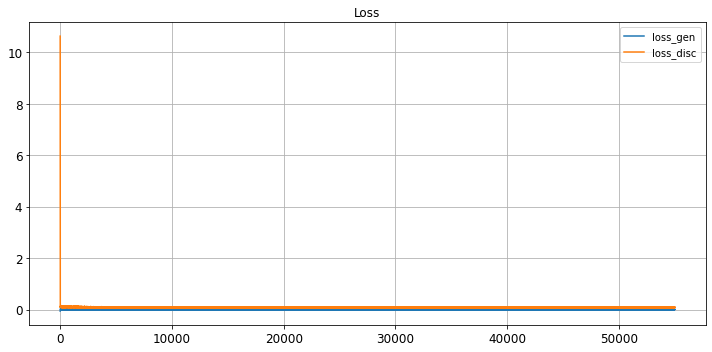

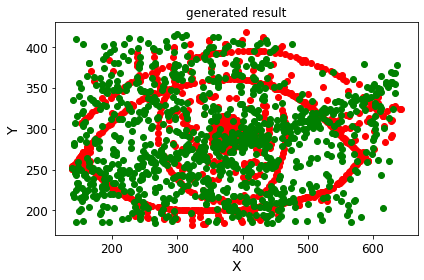

save the model & result
Epoch 55001/100000
critic: 0.084839 - generator: 0.000503 - 0s
Epoch 55002/100000
critic: 0.088034 - generator: -0.001496 - 0s
Epoch 55003/100000
critic: 0.091311 - generator: 0.001598 - 0s
Epoch 55004/100000
critic: 0.070465 - generator: 0.003216 - 0s
Epoch 55005/100000
critic: 0.081426 - generator: 0.003750 - 0s
Epoch 55006/100000
critic: 0.082202 - generator: 0.003070 - 0s
Epoch 55007/100000
critic: 0.081909 - generator: 0.000934 - 0s
Epoch 55008/100000
critic: 0.084857 - generator: -0.002530 - 0s
Epoch 55009/100000
critic: 0.086033 - generator: -0.007911 - 0s
Epoch 55010/100000
critic: 0.076239 - generator: -0.006062 - 0s
Epoch 55011/100000
critic: 0.086397 - generator: 0.003565 - 0s
Epoch 55012/100000
critic: 0.078508 - generator: -0.002900 - 0s
Epoch 55013/100000
critic: 0.077613 - generator: -0.005196 - 0s
Epoch 55014/100000
critic: 0.086390 - generator: -0.004088 - 0s
Epoch 55015/100000
critic: 0.082218 - generator: -0.002847 - 0s
Epoch 55016/100000
crit

critic: 0.089273 - generator: 0.003140 - 0s
Epoch 55131/100000
critic: 0.075147 - generator: 0.000399 - 0s
Epoch 55132/100000
critic: 0.082542 - generator: 0.001116 - 0s
Epoch 55133/100000
critic: 0.071938 - generator: -0.000093 - 0s
Epoch 55134/100000
critic: 0.081402 - generator: 0.002653 - 0s
Epoch 55135/100000
critic: 0.075730 - generator: -0.000915 - 0s
Epoch 55136/100000
critic: 0.080808 - generator: 0.002815 - 0s
Epoch 55137/100000
critic: 0.063724 - generator: -0.002930 - 0s
Epoch 55138/100000
critic: 0.077910 - generator: -0.001393 - 0s
Epoch 55139/100000
critic: 0.076594 - generator: 0.001231 - 0s
Epoch 55140/100000
critic: 0.082228 - generator: 0.005860 - 0s
Epoch 55141/100000
critic: 0.079348 - generator: 0.003593 - 0s
Epoch 55142/100000
critic: 0.082841 - generator: 0.002881 - 0s
Epoch 55143/100000
critic: 0.078675 - generator: 0.000951 - 0s
Epoch 55144/100000
critic: 0.086315 - generator: 0.003378 - 0s
Epoch 55145/100000
critic: 0.075740 - generator: 0.001364 - 0s
Epoch 5

critic: 0.078246 - generator: -0.001052 - 0s
Epoch 55261/100000
critic: 0.067146 - generator: 0.004681 - 0s
Epoch 55262/100000
critic: 0.087791 - generator: 0.001529 - 0s
Epoch 55263/100000
critic: 0.089666 - generator: 0.003650 - 0s
Epoch 55264/100000
critic: 0.080610 - generator: -0.003029 - 0s
Epoch 55265/100000
critic: 0.090105 - generator: 0.003430 - 0s
Epoch 55266/100000
critic: 0.083574 - generator: -0.002349 - 0s
Epoch 55267/100000
critic: 0.059822 - generator: 0.000569 - 0s
Epoch 55268/100000
critic: 0.076906 - generator: 0.004823 - 0s
Epoch 55269/100000
critic: 0.089701 - generator: 0.002417 - 0s
Epoch 55270/100000
critic: 0.070257 - generator: -0.000952 - 0s
Epoch 55271/100000
critic: 0.083822 - generator: -0.003621 - 0s
Epoch 55272/100000
critic: 0.081557 - generator: -0.002859 - 0s
Epoch 55273/100000
critic: 0.068355 - generator: 0.004307 - 0s
Epoch 55274/100000
critic: 0.080211 - generator: -0.006633 - 0s
Epoch 55275/100000
critic: 0.080605 - generator: -0.002262 - 0s
Epo

critic: 0.077365 - generator: -0.002176 - 0s
Epoch 55391/100000
critic: 0.084510 - generator: 0.000366 - 0s
Epoch 55392/100000
critic: 0.081922 - generator: 0.003131 - 0s
Epoch 55393/100000
critic: 0.074898 - generator: 0.002843 - 0s
Epoch 55394/100000
critic: 0.082719 - generator: -0.001120 - 0s
Epoch 55395/100000
critic: 0.087822 - generator: 0.007073 - 0s
Epoch 55396/100000
critic: 0.076345 - generator: 0.007525 - 0s
Epoch 55397/100000
critic: 0.079886 - generator: 0.001482 - 0s
Epoch 55398/100000
critic: 0.082221 - generator: -0.000968 - 0s
Epoch 55399/100000
critic: 0.086120 - generator: 0.000319 - 0s
Epoch 55400/100000
critic: 0.087996 - generator: 0.001529 - 0s
Epoch 55401/100000
critic: 0.077314 - generator: -0.000696 - 0s
Epoch 55402/100000
critic: 0.079162 - generator: -0.000165 - 0s
Epoch 55403/100000
critic: 0.088227 - generator: 0.001713 - 0s
Epoch 55404/100000
critic: 0.082082 - generator: 0.003142 - 0s
Epoch 55405/100000
critic: 0.087250 - generator: -0.003816 - 0s
Epoch

critic: 0.079882 - generator: -0.004083 - 0s
Epoch 55521/100000
critic: 0.076852 - generator: -0.004727 - 0s
Epoch 55522/100000
critic: 0.080291 - generator: -0.003316 - 0s
Epoch 55523/100000
critic: 0.091529 - generator: -0.000338 - 0s
Epoch 55524/100000
critic: 0.080556 - generator: -0.002601 - 0s
Epoch 55525/100000
critic: 0.082965 - generator: -0.000745 - 0s
Epoch 55526/100000
critic: 0.088275 - generator: 0.003331 - 0s
Epoch 55527/100000
critic: 0.077741 - generator: -0.000327 - 0s
Epoch 55528/100000
critic: 0.072364 - generator: 0.000930 - 0s
Epoch 55529/100000
critic: 0.089218 - generator: 0.002563 - 0s
Epoch 55530/100000
critic: 0.073699 - generator: -0.000654 - 0s
Epoch 55531/100000
critic: 0.091446 - generator: 0.002092 - 0s
Epoch 55532/100000
critic: 0.076998 - generator: -0.002093 - 0s
Epoch 55533/100000
critic: 0.086905 - generator: 0.001858 - 0s
Epoch 55534/100000
critic: 0.088401 - generator: 0.000209 - 0s
Epoch 55535/100000
critic: 0.078085 - generator: -0.002126 - 0s
E

critic: 0.069746 - generator: 0.000677 - 0s
Epoch 55651/100000
critic: 0.080927 - generator: 0.002790 - 0s
Epoch 55652/100000
critic: 0.087462 - generator: -0.002670 - 0s
Epoch 55653/100000
critic: 0.083960 - generator: -0.003250 - 0s
Epoch 55654/100000
critic: 0.081023 - generator: -0.003185 - 0s
Epoch 55655/100000
critic: 0.075947 - generator: -0.002586 - 0s
Epoch 55656/100000
critic: 0.082110 - generator: -0.000231 - 0s
Epoch 55657/100000
critic: 0.085161 - generator: -0.002899 - 0s
Epoch 55658/100000
critic: 0.080072 - generator: 0.002041 - 0s
Epoch 55659/100000
critic: 0.077776 - generator: 0.001756 - 0s
Epoch 55660/100000
critic: 0.083590 - generator: 0.001737 - 0s
Epoch 55661/100000
critic: 0.078434 - generator: -0.000454 - 0s
Epoch 55662/100000
critic: 0.075406 - generator: -0.001839 - 0s
Epoch 55663/100000
critic: 0.085491 - generator: -0.002013 - 0s
Epoch 55664/100000
critic: 0.075591 - generator: -0.003121 - 0s
Epoch 55665/100000
critic: 0.088092 - generator: 0.004076 - 0s
E

critic: 0.088298 - generator: 0.003259 - 0s
Epoch 55781/100000
critic: 0.088998 - generator: -0.001491 - 0s
Epoch 55782/100000
critic: 0.070875 - generator: 0.001010 - 0s
Epoch 55783/100000
critic: 0.094023 - generator: 0.003542 - 0s
Epoch 55784/100000
critic: 0.086230 - generator: 0.002360 - 0s
Epoch 55785/100000
critic: 0.084660 - generator: -0.000743 - 0s
Epoch 55786/100000
critic: 0.069700 - generator: -0.000415 - 0s
Epoch 55787/100000
critic: 0.082754 - generator: -0.003856 - 0s
Epoch 55788/100000
critic: 0.074233 - generator: -0.001522 - 0s
Epoch 55789/100000
critic: 0.093762 - generator: 0.001978 - 0s
Epoch 55790/100000
critic: 0.082963 - generator: 0.001458 - 0s
Epoch 55791/100000
critic: 0.077389 - generator: 0.000139 - 0s
Epoch 55792/100000
critic: 0.080936 - generator: -0.004860 - 0s
Epoch 55793/100000
critic: 0.079030 - generator: 0.001793 - 0s
Epoch 55794/100000
critic: 0.080113 - generator: 0.000683 - 0s
Epoch 55795/100000
critic: 0.083042 - generator: -0.000295 - 0s
Epoc

critic: 0.079293 - generator: -0.001370 - 0s
Epoch 55911/100000
critic: 0.080958 - generator: 0.001572 - 0s
Epoch 55912/100000
critic: 0.080621 - generator: -0.001060 - 0s
Epoch 55913/100000
critic: 0.078727 - generator: 0.001174 - 0s
Epoch 55914/100000
critic: 0.081947 - generator: -0.000905 - 0s
Epoch 55915/100000
critic: 0.077073 - generator: 0.000719 - 0s
Epoch 55916/100000
critic: 0.078276 - generator: -0.002024 - 0s
Epoch 55917/100000
critic: 0.084584 - generator: 0.001904 - 0s
Epoch 55918/100000
critic: 0.093577 - generator: 0.003472 - 0s
Epoch 55919/100000
critic: 0.071342 - generator: -0.000722 - 0s
Epoch 55920/100000
critic: 0.077048 - generator: 0.001189 - 0s
Epoch 55921/100000
critic: 0.079162 - generator: -0.002604 - 0s
Epoch 55922/100000
critic: 0.071763 - generator: -0.002422 - 0s
Epoch 55923/100000
critic: 0.078096 - generator: -0.004345 - 0s
Epoch 55924/100000
critic: 0.078158 - generator: -0.002409 - 0s
Epoch 55925/100000
critic: 0.078756 - generator: -0.001378 - 0s
E

critic: 0.082269 - generator: 0.001307 - 0s
Epoch 56041/100000
critic: 0.077042 - generator: 0.003717 - 0s
Epoch 56042/100000
critic: 0.083719 - generator: 0.000325 - 0s
Epoch 56043/100000
critic: 0.079613 - generator: -0.002250 - 0s
Epoch 56044/100000
critic: 0.080073 - generator: 0.001543 - 0s
Epoch 56045/100000
critic: 0.079740 - generator: -0.001229 - 0s
Epoch 56046/100000
critic: 0.085763 - generator: 0.000620 - 0s
Epoch 56047/100000
critic: 0.086644 - generator: 0.002462 - 0s
Epoch 56048/100000
critic: 0.086769 - generator: 0.001195 - 0s
Epoch 56049/100000
critic: 0.081936 - generator: -0.000249 - 0s
Epoch 56050/100000
critic: 0.083121 - generator: 0.000704 - 0s
Epoch 56051/100000
critic: 0.083307 - generator: 0.000068 - 0s
Epoch 56052/100000
critic: 0.083166 - generator: -0.001008 - 0s
Epoch 56053/100000
critic: 0.083542 - generator: -0.003175 - 0s
Epoch 56054/100000
critic: 0.070244 - generator: 0.002423 - 0s
Epoch 56055/100000
critic: 0.069015 - generator: 0.005035 - 0s
Epoch 

critic: 0.082606 - generator: -0.001820 - 0s
Epoch 56172/100000
critic: 0.082117 - generator: -0.004644 - 0s
Epoch 56173/100000
critic: 0.085210 - generator: -0.001172 - 0s
Epoch 56174/100000
critic: 0.086965 - generator: 0.005489 - 0s
Epoch 56175/100000
critic: 0.094311 - generator: 0.001335 - 0s
Epoch 56176/100000
critic: 0.087006 - generator: 0.000325 - 0s
Epoch 56177/100000
critic: 0.080642 - generator: 0.002795 - 0s
Epoch 56178/100000
critic: 0.073947 - generator: 0.002298 - 0s
Epoch 56179/100000
critic: 0.082348 - generator: -0.002536 - 0s
Epoch 56180/100000
critic: 0.083475 - generator: -0.002425 - 0s
Epoch 56181/100000
critic: 0.073666 - generator: -0.005232 - 0s
Epoch 56182/100000
critic: 0.076258 - generator: -0.000757 - 0s
Epoch 56183/100000
critic: 0.084546 - generator: -0.000657 - 0s
Epoch 56184/100000
critic: 0.085047 - generator: 0.001548 - 0s
Epoch 56185/100000
critic: 0.090557 - generator: -0.002308 - 0s
Epoch 56186/100000
critic: 0.078942 - generator: 0.004271 - 0s
Ep

critic: 0.086281 - generator: -0.000848 - 0s
Epoch 56302/100000
critic: 0.077107 - generator: -0.001923 - 0s
Epoch 56303/100000
critic: 0.087833 - generator: -0.005127 - 0s
Epoch 56304/100000
critic: 0.090844 - generator: -0.001238 - 0s
Epoch 56305/100000
critic: 0.085880 - generator: 0.001916 - 0s
Epoch 56306/100000
critic: 0.080701 - generator: 0.001171 - 0s
Epoch 56307/100000
critic: 0.081272 - generator: -0.004978 - 0s
Epoch 56308/100000
critic: 0.077638 - generator: -0.001310 - 0s
Epoch 56309/100000
critic: 0.084439 - generator: 0.000254 - 0s
Epoch 56310/100000
critic: 0.089828 - generator: 0.001494 - 0s
Epoch 56311/100000
critic: 0.080079 - generator: 0.001611 - 0s
Epoch 56312/100000
critic: 0.086777 - generator: 0.002179 - 0s
Epoch 56313/100000
critic: 0.072835 - generator: -0.003701 - 0s
Epoch 56314/100000
critic: 0.089979 - generator: -0.000399 - 0s
Epoch 56315/100000
critic: 0.086135 - generator: 0.001486 - 0s
Epoch 56316/100000
critic: 0.074308 - generator: 0.000872 - 0s
Epo

critic: 0.079537 - generator: 0.000667 - 0s
Epoch 56432/100000
critic: 0.067471 - generator: -0.000489 - 0s
Epoch 56433/100000
critic: 0.078389 - generator: 0.000324 - 0s
Epoch 56434/100000
critic: 0.080240 - generator: -0.001473 - 0s
Epoch 56435/100000
critic: 0.085067 - generator: -0.003411 - 0s
Epoch 56436/100000
critic: 0.070403 - generator: -0.003876 - 0s
Epoch 56437/100000
critic: 0.086210 - generator: 0.000099 - 0s
Epoch 56438/100000
critic: 0.077651 - generator: -0.001134 - 0s
Epoch 56439/100000
critic: 0.070844 - generator: 0.003640 - 0s
Epoch 56440/100000
critic: 0.085083 - generator: 0.004179 - 0s
Epoch 56441/100000
critic: 0.083280 - generator: 0.000231 - 0s
Epoch 56442/100000
critic: 0.069725 - generator: -0.003735 - 0s
Epoch 56443/100000
critic: 0.093222 - generator: -0.004003 - 0s
Epoch 56444/100000
critic: 0.087087 - generator: 0.001883 - 0s
Epoch 56445/100000
critic: 0.095285 - generator: 0.001324 - 0s
Epoch 56446/100000
critic: 0.087001 - generator: -0.002361 - 0s
Epo

critic: 0.077709 - generator: 0.003671 - 0s
Epoch 56562/100000
critic: 0.081853 - generator: 0.002149 - 0s
Epoch 56563/100000
critic: 0.078970 - generator: 0.001955 - 0s
Epoch 56564/100000
critic: 0.078801 - generator: 0.005702 - 0s
Epoch 56565/100000
critic: 0.079702 - generator: 0.001113 - 0s
Epoch 56566/100000
critic: 0.072218 - generator: 0.000487 - 0s
Epoch 56567/100000
critic: 0.075718 - generator: 0.002191 - 0s
Epoch 56568/100000
critic: 0.089032 - generator: 0.004663 - 0s
Epoch 56569/100000
critic: 0.080127 - generator: -0.000611 - 0s
Epoch 56570/100000
critic: 0.081823 - generator: -0.002110 - 0s
Epoch 56571/100000
critic: 0.079162 - generator: -0.002783 - 0s
Epoch 56572/100000
critic: 0.077140 - generator: -0.002927 - 0s
Epoch 56573/100000
critic: 0.083447 - generator: -0.001891 - 0s
Epoch 56574/100000
critic: 0.078627 - generator: 0.001389 - 0s
Epoch 56575/100000
critic: 0.084688 - generator: -0.000914 - 0s
Epoch 56576/100000
critic: 0.093501 - generator: 0.001939 - 0s
Epoch

critic: 0.082351 - generator: -0.006923 - 0s
Epoch 56692/100000
critic: 0.083559 - generator: -0.001690 - 0s
Epoch 56693/100000
critic: 0.079819 - generator: -0.001849 - 0s
Epoch 56694/100000
critic: 0.085962 - generator: 0.003781 - 0s
Epoch 56695/100000
critic: 0.075901 - generator: 0.003240 - 0s
Epoch 56696/100000
critic: 0.089447 - generator: -0.000067 - 0s
Epoch 56697/100000
critic: 0.083352 - generator: -0.001331 - 0s
Epoch 56698/100000
critic: 0.083043 - generator: -0.000151 - 0s
Epoch 56699/100000
critic: 0.076630 - generator: -0.000725 - 0s
Epoch 56700/100000
critic: 0.082716 - generator: 0.001139 - 0s
Epoch 56701/100000
critic: 0.078518 - generator: 0.000529 - 0s
Epoch 56702/100000
critic: 0.081539 - generator: -0.001990 - 0s
Epoch 56703/100000
critic: 0.076678 - generator: 0.000384 - 0s
Epoch 56704/100000
critic: 0.078507 - generator: 0.002480 - 0s
Epoch 56705/100000
critic: 0.077657 - generator: -0.001688 - 0s
Epoch 56706/100000
critic: 0.078591 - generator: -0.000461 - 0s
E

critic: 0.089205 - generator: 0.002587 - 0s
Epoch 56822/100000
critic: 0.065640 - generator: -0.003431 - 0s
Epoch 56823/100000
critic: 0.068693 - generator: -0.003677 - 0s
Epoch 56824/100000
critic: 0.086227 - generator: 0.002057 - 0s
Epoch 56825/100000
critic: 0.078129 - generator: 0.002460 - 0s
Epoch 56826/100000
critic: 0.075313 - generator: 0.003334 - 0s
Epoch 56827/100000
critic: 0.082100 - generator: 0.004677 - 0s
Epoch 56828/100000
critic: 0.078084 - generator: 0.001737 - 0s
Epoch 56829/100000
critic: 0.079721 - generator: 0.001462 - 0s
Epoch 56830/100000
critic: 0.081078 - generator: -0.002251 - 0s
Epoch 56831/100000
critic: 0.083711 - generator: -0.002378 - 0s
Epoch 56832/100000
critic: 0.086242 - generator: 0.000369 - 0s
Epoch 56833/100000
critic: 0.081295 - generator: -0.000285 - 0s
Epoch 56834/100000
critic: 0.089528 - generator: 0.000689 - 0s
Epoch 56835/100000
critic: 0.094900 - generator: -0.002853 - 0s
Epoch 56836/100000
critic: 0.067982 - generator: -0.001880 - 0s
Epoc

critic: 0.072402 - generator: 0.000653 - 0s
Epoch 56952/100000
critic: 0.065169 - generator: 0.000806 - 0s
Epoch 56953/100000
critic: 0.085526 - generator: 0.002160 - 0s
Epoch 56954/100000
critic: 0.092569 - generator: -0.001059 - 0s
Epoch 56955/100000
critic: 0.090608 - generator: -0.002392 - 0s
Epoch 56956/100000
critic: 0.087616 - generator: -0.000086 - 0s
Epoch 56957/100000
critic: 0.078940 - generator: -0.000084 - 0s
Epoch 56958/100000
critic: 0.076139 - generator: 0.000652 - 0s
Epoch 56959/100000
critic: 0.077113 - generator: 0.002294 - 0s
Epoch 56960/100000
critic: 0.086085 - generator: -0.002978 - 0s
Epoch 56961/100000
critic: 0.076811 - generator: -0.003398 - 0s
Epoch 56962/100000
critic: 0.076528 - generator: -0.003643 - 0s
Epoch 56963/100000
critic: 0.088286 - generator: 0.000501 - 0s
Epoch 56964/100000
critic: 0.085843 - generator: -0.001266 - 0s
Epoch 56965/100000
critic: 0.072339 - generator: 0.000804 - 0s
Epoch 56966/100000
critic: 0.098055 - generator: -0.000581 - 0s
Ep

critic: 0.076738 - generator: 0.004684 - 0s
Epoch 57082/100000
critic: 0.077164 - generator: -0.000292 - 0s
Epoch 57083/100000
critic: 0.074294 - generator: 0.000021 - 0s
Epoch 57084/100000
critic: 0.078028 - generator: -0.000137 - 0s
Epoch 57085/100000
critic: 0.082859 - generator: -0.002892 - 0s
Epoch 57086/100000
critic: 0.079606 - generator: 0.002055 - 0s
Epoch 57087/100000
critic: 0.083677 - generator: -0.000302 - 0s
Epoch 57088/100000
critic: 0.083180 - generator: -0.003102 - 0s
Epoch 57089/100000
critic: 0.091085 - generator: -0.002242 - 0s
Epoch 57090/100000
critic: 0.074340 - generator: 0.000912 - 0s
Epoch 57091/100000
critic: 0.085350 - generator: 0.002623 - 0s
Epoch 57092/100000
critic: 0.089623 - generator: 0.002804 - 0s
Epoch 57093/100000
critic: 0.077755 - generator: 0.004688 - 0s
Epoch 57094/100000
critic: 0.079654 - generator: 0.003144 - 0s
Epoch 57095/100000
critic: 0.077466 - generator: 0.002802 - 0s
Epoch 57096/100000
critic: 0.088569 - generator: 0.001116 - 0s
Epoch

critic: 0.086109 - generator: 0.005605 - 0s
Epoch 57212/100000
critic: 0.074785 - generator: 0.002727 - 0s
Epoch 57213/100000
critic: 0.079251 - generator: -0.000008 - 0s
Epoch 57214/100000
critic: 0.071640 - generator: -0.001703 - 0s
Epoch 57215/100000
critic: 0.076140 - generator: 0.003467 - 0s
Epoch 57216/100000
critic: 0.077683 - generator: 0.001109 - 0s
Epoch 57217/100000
critic: 0.076578 - generator: -0.001651 - 0s
Epoch 57218/100000
critic: 0.089619 - generator: -0.001962 - 0s
Epoch 57219/100000
critic: 0.075517 - generator: 0.001800 - 0s
Epoch 57220/100000
critic: 0.073592 - generator: -0.001003 - 0s
Epoch 57221/100000
critic: 0.087208 - generator: 0.003719 - 0s
Epoch 57222/100000
critic: 0.074749 - generator: 0.003766 - 0s
Epoch 57223/100000
critic: 0.081697 - generator: 0.003525 - 0s
Epoch 57224/100000
critic: 0.077819 - generator: 0.001642 - 0s
Epoch 57225/100000
critic: 0.083344 - generator: 0.003950 - 0s
Epoch 57226/100000
critic: 0.067887 - generator: -0.003878 - 0s
Epoch

critic: 0.074005 - generator: 0.003000 - 0s
Epoch 57342/100000
critic: 0.084708 - generator: -0.000462 - 0s
Epoch 57343/100000
critic: 0.075718 - generator: 0.000864 - 0s
Epoch 57344/100000
critic: 0.078714 - generator: -0.000237 - 0s
Epoch 57345/100000
critic: 0.093154 - generator: 0.001500 - 0s
Epoch 57346/100000
critic: 0.075624 - generator: 0.001507 - 0s
Epoch 57347/100000
critic: 0.076752 - generator: 0.004687 - 0s
Epoch 57348/100000
critic: 0.070044 - generator: 0.005766 - 0s
Epoch 57349/100000
critic: 0.079143 - generator: 0.007094 - 0s
Epoch 57350/100000
critic: 0.062292 - generator: 0.001659 - 0s
Epoch 57351/100000
critic: 0.091779 - generator: 0.000729 - 0s
Epoch 57352/100000
critic: 0.085345 - generator: -0.002912 - 0s
Epoch 57353/100000
critic: 0.084162 - generator: -0.001896 - 0s
Epoch 57354/100000
critic: 0.073614 - generator: -0.001154 - 0s
Epoch 57355/100000
critic: 0.084556 - generator: 0.000106 - 0s
Epoch 57356/100000
critic: 0.089958 - generator: 0.002894 - 0s
Epoch 

critic: 0.084790 - generator: 0.001968 - 0s
Epoch 57472/100000
critic: 0.086474 - generator: 0.002320 - 0s
Epoch 57473/100000
critic: 0.087728 - generator: -0.005962 - 0s
Epoch 57474/100000
critic: 0.085425 - generator: 0.001771 - 0s
Epoch 57475/100000
critic: 0.084122 - generator: 0.002218 - 0s
Epoch 57476/100000
critic: 0.073544 - generator: -0.003111 - 0s
Epoch 57477/100000
critic: 0.083058 - generator: -0.001525 - 0s
Epoch 57478/100000
critic: 0.089651 - generator: -0.003179 - 0s
Epoch 57479/100000
critic: 0.077270 - generator: -0.001886 - 0s
Epoch 57480/100000
critic: 0.079554 - generator: -0.004846 - 0s
Epoch 57481/100000
critic: 0.087961 - generator: 0.002258 - 0s
Epoch 57482/100000
critic: 0.069287 - generator: 0.001730 - 0s
Epoch 57483/100000
critic: 0.087536 - generator: 0.002703 - 0s
Epoch 57484/100000
critic: 0.080317 - generator: 0.000364 - 0s
Epoch 57485/100000
critic: 0.082809 - generator: -0.004951 - 0s
Epoch 57486/100000
critic: 0.091054 - generator: -0.003674 - 0s
Epo

critic: 0.082159 - generator: -0.003578 - 0s
Epoch 57602/100000
critic: 0.080893 - generator: -0.006014 - 0s
Epoch 57603/100000
critic: 0.084750 - generator: -0.003040 - 0s
Epoch 57604/100000
critic: 0.079242 - generator: -0.001733 - 0s
Epoch 57605/100000
critic: 0.093463 - generator: 0.002597 - 0s
Epoch 57606/100000
critic: 0.085524 - generator: -0.002444 - 0s
Epoch 57607/100000
critic: 0.075133 - generator: -0.001200 - 0s
Epoch 57608/100000
critic: 0.074250 - generator: -0.001444 - 0s
Epoch 57609/100000
critic: 0.079214 - generator: -0.001941 - 0s
Epoch 57610/100000
critic: 0.078744 - generator: -0.000432 - 0s
Epoch 57611/100000
critic: 0.086953 - generator: 0.001686 - 0s
Epoch 57612/100000
critic: 0.084819 - generator: 0.004153 - 0s
Epoch 57613/100000
critic: 0.069539 - generator: -0.002232 - 0s
Epoch 57614/100000
critic: 0.072696 - generator: -0.001926 - 0s
Epoch 57615/100000
critic: 0.080217 - generator: -0.002766 - 0s
Epoch 57616/100000
critic: 0.081311 - generator: -0.003960 - 0

critic: 0.067627 - generator: -0.001120 - 0s
Epoch 57731/100000
critic: 0.086910 - generator: 0.002526 - 0s
Epoch 57732/100000
critic: 0.087929 - generator: -0.000350 - 0s
Epoch 57733/100000
critic: 0.072645 - generator: -0.000855 - 0s
Epoch 57734/100000
critic: 0.077758 - generator: -0.002350 - 0s
Epoch 57735/100000
critic: 0.073649 - generator: -0.002984 - 0s
Epoch 57736/100000
critic: 0.070446 - generator: 0.000377 - 0s
Epoch 57737/100000
critic: 0.080652 - generator: 0.001893 - 0s
Epoch 57738/100000
critic: 0.077902 - generator: 0.002619 - 0s
Epoch 57739/100000
critic: 0.086115 - generator: 0.003489 - 0s
Epoch 57740/100000
critic: 0.077779 - generator: 0.000251 - 0s
Epoch 57741/100000
critic: 0.082012 - generator: -0.001473 - 0s
Epoch 57742/100000
critic: 0.086329 - generator: -0.000070 - 0s
Epoch 57743/100000
critic: 0.075607 - generator: -0.003983 - 0s
Epoch 57744/100000
critic: 0.080620 - generator: -0.005483 - 0s
Epoch 57745/100000
critic: 0.075844 - generator: -0.002053 - 0s
E

critic: 0.091408 - generator: -0.005404 - 0s
Epoch 57861/100000
critic: 0.089977 - generator: -0.002540 - 0s
Epoch 57862/100000
critic: 0.082159 - generator: -0.002142 - 0s
Epoch 57863/100000
critic: 0.077531 - generator: -0.002095 - 0s
Epoch 57864/100000
critic: 0.082110 - generator: 0.003690 - 0s
Epoch 57865/100000
critic: 0.074558 - generator: 0.001085 - 0s
Epoch 57866/100000
critic: 0.083480 - generator: -0.003288 - 0s
Epoch 57867/100000
critic: 0.070054 - generator: -0.001649 - 0s
Epoch 57868/100000
critic: 0.079273 - generator: -0.002678 - 0s
Epoch 57869/100000
critic: 0.088419 - generator: -0.001801 - 0s
Epoch 57870/100000
critic: 0.088340 - generator: -0.000418 - 0s
Epoch 57871/100000
critic: 0.068243 - generator: 0.006211 - 0s
Epoch 57872/100000
critic: 0.073529 - generator: 0.007858 - 0s
Epoch 57873/100000
critic: 0.083194 - generator: 0.002530 - 0s
Epoch 57874/100000
critic: 0.088960 - generator: -0.003198 - 0s
Epoch 57875/100000
critic: 0.083047 - generator: 0.000389 - 0s
E

critic: 0.072649 - generator: -0.001015 - 0s
Epoch 57990/100000
critic: 0.083924 - generator: 0.001098 - 0s
Epoch 57991/100000
critic: 0.069844 - generator: -0.001435 - 0s
Epoch 57992/100000
critic: 0.088866 - generator: -0.000714 - 0s
Epoch 57993/100000
critic: 0.072469 - generator: 0.001995 - 0s
Epoch 57994/100000
critic: 0.063204 - generator: -0.002145 - 0s
Epoch 57995/100000
critic: 0.085859 - generator: 0.000353 - 0s
Epoch 57996/100000
critic: 0.086163 - generator: 0.002076 - 0s
Epoch 57997/100000
critic: 0.084495 - generator: -0.001889 - 0s
Epoch 57998/100000
critic: 0.084789 - generator: -0.000892 - 0s
Epoch 57999/100000
critic: 0.084389 - generator: -0.000059 - 0s
Epoch 58000/100000
critic: 0.085695 - generator: 0.001435 - 0s
Epoch 58001/100000
critic: 0.078199 - generator: 0.002313 - 0s
Epoch 58002/100000
critic: 0.080977 - generator: 0.001094 - 0s
Epoch 58003/100000
critic: 0.081875 - generator: 0.005694 - 0s
Epoch 58004/100000
critic: 0.082267 - generator: 0.000712 - 0s
Epoc

critic: 0.083292 - generator: 0.002458 - 0s
Epoch 58120/100000
critic: 0.081333 - generator: 0.002013 - 0s
Epoch 58121/100000
critic: 0.075729 - generator: -0.004237 - 0s
Epoch 58122/100000
critic: 0.083975 - generator: -0.003550 - 0s
Epoch 58123/100000
critic: 0.080512 - generator: 0.000255 - 0s
Epoch 58124/100000
critic: 0.083777 - generator: -0.005083 - 0s
Epoch 58125/100000
critic: 0.073863 - generator: -0.005571 - 0s
Epoch 58126/100000
critic: 0.076813 - generator: -0.001719 - 0s
Epoch 58127/100000
critic: 0.085859 - generator: -0.003232 - 0s
Epoch 58128/100000
critic: 0.076916 - generator: -0.002403 - 0s
Epoch 58129/100000
critic: 0.079812 - generator: -0.003916 - 0s
Epoch 58130/100000
critic: 0.066156 - generator: 0.002481 - 0s
Epoch 58131/100000
critic: 0.093154 - generator: 0.005335 - 0s
Epoch 58132/100000
critic: 0.075931 - generator: 0.000156 - 0s
Epoch 58133/100000
critic: 0.078030 - generator: 0.003448 - 0s
Epoch 58134/100000
critic: 0.088843 - generator: -0.001249 - 0s
Ep

critic: 0.070755 - generator: -0.003625 - 0s
Epoch 58250/100000
critic: 0.088700 - generator: -0.001716 - 0s
Epoch 58251/100000
critic: 0.082168 - generator: -0.002863 - 0s
Epoch 58252/100000
critic: 0.082368 - generator: -0.001869 - 0s
Epoch 58253/100000
critic: 0.079841 - generator: 0.000932 - 0s
Epoch 58254/100000
critic: 0.089092 - generator: 0.004059 - 0s
Epoch 58255/100000
critic: 0.078767 - generator: -0.003388 - 0s
Epoch 58256/100000
critic: 0.072139 - generator: -0.001828 - 0s
Epoch 58257/100000
critic: 0.085788 - generator: -0.000460 - 0s
Epoch 58258/100000
critic: 0.077734 - generator: -0.006096 - 0s
Epoch 58259/100000
critic: 0.076516 - generator: -0.001398 - 0s
Epoch 58260/100000
critic: 0.076960 - generator: 0.001564 - 0s
Epoch 58261/100000
critic: 0.091836 - generator: -0.005600 - 0s
Epoch 58262/100000
critic: 0.093522 - generator: 0.001042 - 0s
Epoch 58263/100000
critic: 0.088867 - generator: -0.001414 - 0s
Epoch 58264/100000
critic: 0.076074 - generator: -0.000838 - 0s

critic: 0.073969 - generator: 0.004373 - 0s
Epoch 58379/100000
critic: 0.091824 - generator: 0.002716 - 0s
Epoch 58380/100000
critic: 0.079565 - generator: 0.001221 - 0s
Epoch 58381/100000
critic: 0.085522 - generator: 0.004117 - 0s
Epoch 58382/100000
critic: 0.083544 - generator: -0.003525 - 0s
Epoch 58383/100000
critic: 0.083090 - generator: 0.002631 - 0s
Epoch 58384/100000
critic: 0.084227 - generator: -0.000138 - 0s
Epoch 58385/100000
critic: 0.079674 - generator: 0.001842 - 0s
Epoch 58386/100000
critic: 0.078474 - generator: 0.001034 - 0s
Epoch 58387/100000
critic: 0.090674 - generator: -0.000768 - 0s
Epoch 58388/100000
critic: 0.082732 - generator: -0.001198 - 0s
Epoch 58389/100000
critic: 0.080552 - generator: -0.002235 - 0s
Epoch 58390/100000
critic: 0.087476 - generator: -0.000048 - 0s
Epoch 58391/100000
critic: 0.073976 - generator: -0.000112 - 0s
Epoch 58392/100000
critic: 0.078865 - generator: -0.001189 - 0s
Epoch 58393/100000
critic: 0.068544 - generator: -0.002145 - 0s
Ep

critic: 0.077244 - generator: -0.006814 - 0s
Epoch 58509/100000
critic: 0.079189 - generator: -0.006978 - 0s
Epoch 58510/100000
critic: 0.082989 - generator: -0.002298 - 0s
Epoch 58511/100000
critic: 0.077814 - generator: -0.005938 - 0s
Epoch 58512/100000
critic: 0.076644 - generator: -0.001946 - 0s
Epoch 58513/100000
critic: 0.083202 - generator: -0.000738 - 0s
Epoch 58514/100000
critic: 0.085007 - generator: -0.003085 - 0s
Epoch 58515/100000
critic: 0.087348 - generator: 0.003158 - 0s
Epoch 58516/100000
critic: 0.095723 - generator: 0.004054 - 0s
Epoch 58517/100000
critic: 0.077133 - generator: 0.001252 - 0s
Epoch 58518/100000
critic: 0.069239 - generator: -0.002522 - 0s
Epoch 58519/100000
critic: 0.086675 - generator: -0.001176 - 0s
Epoch 58520/100000
critic: 0.062872 - generator: 0.000939 - 0s
Epoch 58521/100000
critic: 0.081186 - generator: -0.001536 - 0s
Epoch 58522/100000
critic: 0.088244 - generator: -0.000010 - 0s
Epoch 58523/100000
critic: 0.083808 - generator: 0.000122 - 0s


critic: 0.079912 - generator: -0.001436 - 0s
Epoch 58638/100000
critic: 0.074845 - generator: 0.000287 - 0s
Epoch 58639/100000
critic: 0.083155 - generator: 0.002250 - 0s
Epoch 58640/100000
critic: 0.091777 - generator: 0.000383 - 0s
Epoch 58641/100000
critic: 0.077837 - generator: 0.005526 - 0s
Epoch 58642/100000
critic: 0.087979 - generator: 0.004968 - 0s
Epoch 58643/100000
critic: 0.072496 - generator: 0.002293 - 0s
Epoch 58644/100000
critic: 0.096087 - generator: 0.002406 - 0s
Epoch 58645/100000
critic: 0.078368 - generator: 0.001542 - 0s
Epoch 58646/100000
critic: 0.089697 - generator: 0.000740 - 0s
Epoch 58647/100000
critic: 0.075218 - generator: 0.002323 - 0s
Epoch 58648/100000
critic: 0.080856 - generator: 0.004039 - 0s
Epoch 58649/100000
critic: 0.077224 - generator: -0.000693 - 0s
Epoch 58650/100000
critic: 0.088820 - generator: -0.003269 - 0s
Epoch 58651/100000
critic: 0.079989 - generator: -0.000335 - 0s
Epoch 58652/100000
critic: 0.070051 - generator: 0.001186 - 0s
Epoch 5

critic: 0.084888 - generator: 0.005841 - 0s
Epoch 58767/100000
critic: 0.095603 - generator: 0.003430 - 0s
Epoch 58768/100000
critic: 0.081886 - generator: -0.000032 - 0s
Epoch 58769/100000
critic: 0.085153 - generator: -0.002231 - 0s
Epoch 58770/100000
critic: 0.076370 - generator: -0.000773 - 0s
Epoch 58771/100000
critic: 0.069219 - generator: -0.000756 - 0s
Epoch 58772/100000
critic: 0.085333 - generator: 0.008019 - 0s
Epoch 58773/100000
critic: 0.076390 - generator: -0.000754 - 0s
Epoch 58774/100000
critic: 0.075211 - generator: 0.004094 - 0s
Epoch 58775/100000
critic: 0.088689 - generator: 0.001278 - 0s
Epoch 58776/100000
critic: 0.082458 - generator: -0.004168 - 0s
Epoch 58777/100000
critic: 0.076976 - generator: -0.001519 - 0s
Epoch 58778/100000
critic: 0.087989 - generator: 0.000561 - 0s
Epoch 58779/100000
critic: 0.075309 - generator: 0.000693 - 0s
Epoch 58780/100000
critic: 0.088779 - generator: 0.006697 - 0s
Epoch 58781/100000
critic: 0.080582 - generator: -0.001508 - 0s
Epo

critic: 0.071602 - generator: 0.000728 - 0s
Epoch 58897/100000
critic: 0.089896 - generator: -0.001059 - 0s
Epoch 58898/100000
critic: 0.078085 - generator: 0.001090 - 0s
Epoch 58899/100000
critic: 0.082331 - generator: 0.004211 - 0s
Epoch 58900/100000
critic: 0.074543 - generator: 0.002544 - 0s
Epoch 58901/100000
critic: 0.081077 - generator: 0.001397 - 0s
Epoch 58902/100000
critic: 0.079327 - generator: 0.000551 - 0s
Epoch 58903/100000
critic: 0.079390 - generator: -0.000711 - 0s
Epoch 58904/100000
critic: 0.076239 - generator: 0.001311 - 0s
Epoch 58905/100000
critic: 0.084122 - generator: 0.000205 - 0s
Epoch 58906/100000
critic: 0.075616 - generator: -0.001989 - 0s
Epoch 58907/100000
critic: 0.080065 - generator: -0.001120 - 0s
Epoch 58908/100000
critic: 0.088851 - generator: -0.000089 - 0s
Epoch 58909/100000
critic: 0.067114 - generator: -0.001445 - 0s
Epoch 58910/100000
critic: 0.079850 - generator: 0.001593 - 0s
Epoch 58911/100000
critic: 0.072834 - generator: 0.000577 - 0s
Epoch

critic: 0.076719 - generator: -0.003875 - 0s
Epoch 59027/100000
critic: 0.082007 - generator: -0.000606 - 0s
Epoch 59028/100000
critic: 0.073787 - generator: -0.002240 - 0s
Epoch 59029/100000
critic: 0.079297 - generator: 0.000109 - 0s
Epoch 59030/100000
critic: 0.078193 - generator: -0.001770 - 0s
Epoch 59031/100000
critic: 0.078983 - generator: -0.002599 - 0s
Epoch 59032/100000
critic: 0.077032 - generator: -0.003995 - 0s
Epoch 59033/100000
critic: 0.083581 - generator: -0.001903 - 0s
Epoch 59034/100000
critic: 0.074291 - generator: -0.002783 - 0s
Epoch 59035/100000
critic: 0.071281 - generator: -0.001821 - 0s
Epoch 59036/100000
critic: 0.082920 - generator: -0.004367 - 0s
Epoch 59037/100000
critic: 0.091422 - generator: -0.000888 - 0s
Epoch 59038/100000
critic: 0.074744 - generator: 0.005425 - 0s
Epoch 59039/100000
critic: 0.080766 - generator: 0.005258 - 0s
Epoch 59040/100000
critic: 0.080710 - generator: 0.004710 - 0s
Epoch 59041/100000
critic: 0.085904 - generator: -0.002561 - 0s

critic: 0.080937 - generator: -0.001808 - 0s
Epoch 59157/100000
critic: 0.079298 - generator: 0.000263 - 0s
Epoch 59158/100000
critic: 0.078197 - generator: 0.002867 - 0s
Epoch 59159/100000
critic: 0.071486 - generator: -0.000172 - 0s
Epoch 59160/100000
critic: 0.078418 - generator: 0.002402 - 0s
Epoch 59161/100000
critic: 0.070892 - generator: -0.003220 - 0s
Epoch 59162/100000
critic: 0.073890 - generator: -0.002084 - 0s
Epoch 59163/100000
critic: 0.080057 - generator: -0.000330 - 0s
Epoch 59164/100000
critic: 0.083604 - generator: -0.002811 - 0s
Epoch 59165/100000
critic: 0.081531 - generator: 0.001510 - 0s
Epoch 59166/100000
critic: 0.083613 - generator: -0.004996 - 0s
Epoch 59167/100000
critic: 0.079478 - generator: -0.000783 - 0s
Epoch 59168/100000
critic: 0.085572 - generator: 0.004622 - 0s
Epoch 59169/100000
critic: 0.081090 - generator: -0.002342 - 0s
Epoch 59170/100000
critic: 0.070430 - generator: -0.000280 - 0s
Epoch 59171/100000
critic: 0.082493 - generator: 0.004697 - 0s
E

critic: 0.075094 - generator: -0.003790 - 0s
Epoch 59287/100000
critic: 0.085914 - generator: -0.000960 - 0s
Epoch 59288/100000
critic: 0.084810 - generator: -0.007737 - 0s
Epoch 59289/100000
critic: 0.065735 - generator: -0.007869 - 0s
Epoch 59290/100000
critic: 0.087757 - generator: 0.001458 - 0s
Epoch 59291/100000
critic: 0.086584 - generator: -0.000800 - 0s
Epoch 59292/100000
critic: 0.081298 - generator: 0.001805 - 0s
Epoch 59293/100000
critic: 0.081726 - generator: 0.001805 - 0s
Epoch 59294/100000
critic: 0.084045 - generator: -0.003906 - 0s
Epoch 59295/100000
critic: 0.083204 - generator: -0.001794 - 0s
Epoch 59296/100000
critic: 0.082434 - generator: -0.000474 - 0s
Epoch 59297/100000
critic: 0.069767 - generator: 0.000844 - 0s
Epoch 59298/100000
critic: 0.079061 - generator: -0.000213 - 0s
Epoch 59299/100000
critic: 0.078638 - generator: -0.001579 - 0s
Epoch 59300/100000
critic: 0.074284 - generator: 0.000310 - 0s
Epoch 59301/100000
critic: 0.077705 - generator: -0.000875 - 0s


critic: 0.087991 - generator: -0.000937 - 0s
Epoch 59417/100000
critic: 0.079303 - generator: 0.000875 - 0s
Epoch 59418/100000
critic: 0.088106 - generator: -0.000766 - 0s
Epoch 59419/100000
critic: 0.072948 - generator: 0.000568 - 0s
Epoch 59420/100000
critic: 0.081781 - generator: 0.000696 - 0s
Epoch 59421/100000
critic: 0.079768 - generator: 0.001096 - 0s
Epoch 59422/100000
critic: 0.071038 - generator: -0.001253 - 0s
Epoch 59423/100000
critic: 0.077097 - generator: 0.002323 - 0s
Epoch 59424/100000
critic: 0.085862 - generator: -0.004445 - 0s
Epoch 59425/100000
critic: 0.087128 - generator: 0.003226 - 0s
Epoch 59426/100000
critic: 0.078881 - generator: -0.002758 - 0s
Epoch 59427/100000
critic: 0.092749 - generator: -0.000392 - 0s
Epoch 59428/100000
critic: 0.080743 - generator: -0.001895 - 0s
Epoch 59429/100000
critic: 0.072579 - generator: 0.000470 - 0s
Epoch 59430/100000
critic: 0.079017 - generator: -0.003933 - 0s
Epoch 59431/100000
critic: 0.088583 - generator: -0.000964 - 0s
Ep

critic: 0.088605 - generator: 0.000551 - 0s
Epoch 59547/100000
critic: 0.080057 - generator: 0.000568 - 0s
Epoch 59548/100000
critic: 0.076833 - generator: 0.002096 - 0s
Epoch 59549/100000
critic: 0.090352 - generator: 0.001993 - 0s
Epoch 59550/100000
critic: 0.083837 - generator: 0.001572 - 0s
Epoch 59551/100000
critic: 0.082156 - generator: -0.000905 - 0s
Epoch 59552/100000
critic: 0.086418 - generator: 0.001937 - 0s
Epoch 59553/100000
critic: 0.083506 - generator: -0.000600 - 0s
Epoch 59554/100000
critic: 0.076517 - generator: -0.001981 - 0s
Epoch 59555/100000
critic: 0.097508 - generator: -0.001502 - 0s
Epoch 59556/100000
critic: 0.075586 - generator: -0.001438 - 0s
Epoch 59557/100000
critic: 0.071063 - generator: -0.000397 - 0s
Epoch 59558/100000
critic: 0.088834 - generator: 0.002320 - 0s
Epoch 59559/100000
critic: 0.079144 - generator: 0.004609 - 0s
Epoch 59560/100000
critic: 0.083488 - generator: -0.000400 - 0s
Epoch 59561/100000
critic: 0.084249 - generator: -0.002707 - 0s
Epo

critic: 0.081899 - generator: -0.000733 - 0s
Epoch 59677/100000
critic: 0.078764 - generator: 0.002594 - 0s
Epoch 59678/100000
critic: 0.078044 - generator: 0.003793 - 0s
Epoch 59679/100000
critic: 0.081496 - generator: 0.002739 - 0s
Epoch 59680/100000
critic: 0.066931 - generator: -0.000365 - 0s
Epoch 59681/100000
critic: 0.081479 - generator: 0.000010 - 0s
Epoch 59682/100000
critic: 0.077915 - generator: -0.001146 - 0s
Epoch 59683/100000
critic: 0.076933 - generator: 0.002382 - 0s
Epoch 59684/100000
critic: 0.076342 - generator: 0.001395 - 0s
Epoch 59685/100000
critic: 0.081654 - generator: -0.001523 - 0s
Epoch 59686/100000
critic: 0.087665 - generator: 0.002041 - 0s
Epoch 59687/100000
critic: 0.079162 - generator: 0.000568 - 0s
Epoch 59688/100000
critic: 0.084258 - generator: -0.003579 - 0s
Epoch 59689/100000
critic: 0.067900 - generator: -0.002589 - 0s
Epoch 59690/100000
critic: 0.081235 - generator: 0.001126 - 0s
Epoch 59691/100000
critic: 0.082508 - generator: -0.002053 - 0s
Epoc

critic: 0.078634 - generator: 0.002314 - 0s
Epoch 59807/100000
critic: 0.077686 - generator: 0.003895 - 0s
Epoch 59808/100000
critic: 0.077681 - generator: 0.003303 - 0s
Epoch 59809/100000
critic: 0.079628 - generator: 0.003143 - 0s
Epoch 59810/100000
critic: 0.081700 - generator: 0.004994 - 0s
Epoch 59811/100000
critic: 0.073589 - generator: 0.000610 - 0s
Epoch 59812/100000
critic: 0.081175 - generator: -0.003510 - 0s
Epoch 59813/100000
critic: 0.096873 - generator: 0.000072 - 0s
Epoch 59814/100000
critic: 0.082983 - generator: -0.000364 - 0s
Epoch 59815/100000
critic: 0.080897 - generator: 0.000328 - 0s
Epoch 59816/100000
critic: 0.083669 - generator: 0.001550 - 0s
Epoch 59817/100000
critic: 0.066223 - generator: 0.001226 - 0s
Epoch 59818/100000
critic: 0.079386 - generator: -0.002177 - 0s
Epoch 59819/100000
critic: 0.079936 - generator: 0.000185 - 0s
Epoch 59820/100000
critic: 0.078351 - generator: 0.001793 - 0s
Epoch 59821/100000
critic: 0.082033 - generator: 0.002939 - 0s
Epoch 59

critic: 0.075030 - generator: -0.000486 - 0s
Epoch 59937/100000
critic: 0.081778 - generator: -0.001973 - 0s
Epoch 59938/100000
critic: 0.092060 - generator: -0.000904 - 0s
Epoch 59939/100000
critic: 0.077109 - generator: -0.000076 - 0s
Epoch 59940/100000
critic: 0.074381 - generator: 0.003159 - 0s
Epoch 59941/100000
critic: 0.083522 - generator: -0.001028 - 0s
Epoch 59942/100000
critic: 0.079192 - generator: 0.003130 - 0s
Epoch 59943/100000
critic: 0.080853 - generator: -0.001072 - 0s
Epoch 59944/100000
critic: 0.078541 - generator: 0.003621 - 0s
Epoch 59945/100000
critic: 0.088864 - generator: 0.001836 - 0s
Epoch 59946/100000
critic: 0.074241 - generator: 0.003189 - 0s
Epoch 59947/100000
critic: 0.083477 - generator: 0.003773 - 0s
Epoch 59948/100000
critic: 0.085659 - generator: 0.001065 - 0s
Epoch 59949/100000
critic: 0.080105 - generator: -0.000936 - 0s
Epoch 59950/100000
critic: 0.085153 - generator: -0.000673 - 0s
Epoch 59951/100000
critic: 0.074447 - generator: 0.002428 - 0s
Epo

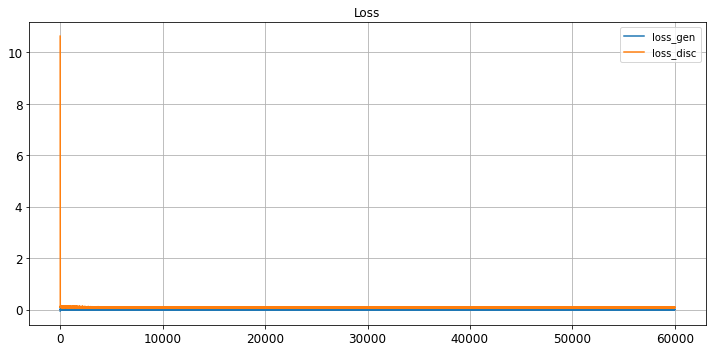

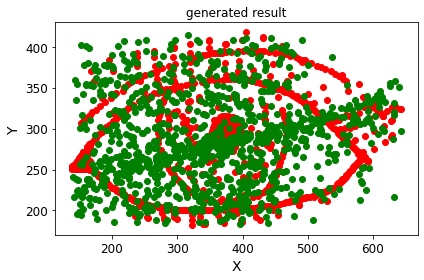

save the model & result
Epoch 60001/100000
critic: 0.083220 - generator: 0.001893 - 0s
Epoch 60002/100000
critic: 0.092801 - generator: -0.000012 - 0s
Epoch 60003/100000
critic: 0.085740 - generator: -0.001834 - 0s
Epoch 60004/100000
critic: 0.092669 - generator: 0.001005 - 0s
Epoch 60005/100000
critic: 0.081372 - generator: 0.000627 - 0s
Epoch 60006/100000
critic: 0.082560 - generator: 0.000542 - 0s
Epoch 60007/100000
critic: 0.082702 - generator: -0.003558 - 0s
Epoch 60008/100000
critic: 0.089022 - generator: 0.001352 - 0s
Epoch 60009/100000
critic: 0.077006 - generator: -0.001495 - 0s
Epoch 60010/100000
critic: 0.077895 - generator: -0.002867 - 0s
Epoch 60011/100000
critic: 0.086398 - generator: -0.000499 - 0s
Epoch 60012/100000
critic: 0.075963 - generator: -0.002537 - 0s
Epoch 60013/100000
critic: 0.087905 - generator: -0.000201 - 0s
Epoch 60014/100000
critic: 0.075040 - generator: 0.000129 - 0s
Epoch 60015/100000
critic: 0.076338 - generator: 0.000405 - 0s
Epoch 60016/100000
crit

critic: 0.085361 - generator: 0.000440 - 0s
Epoch 60131/100000
critic: 0.076895 - generator: 0.003394 - 0s
Epoch 60132/100000
critic: 0.080044 - generator: -0.002791 - 0s
Epoch 60133/100000
critic: 0.076429 - generator: -0.003180 - 0s
Epoch 60134/100000
critic: 0.081341 - generator: 0.000319 - 0s
Epoch 60135/100000
critic: 0.085119 - generator: -0.001960 - 0s
Epoch 60136/100000
critic: 0.076063 - generator: -0.000061 - 0s
Epoch 60137/100000
critic: 0.084461 - generator: 0.002752 - 0s
Epoch 60138/100000
critic: 0.085118 - generator: 0.001280 - 0s
Epoch 60139/100000
critic: 0.082735 - generator: -0.003351 - 0s
Epoch 60140/100000
critic: 0.086126 - generator: 0.002187 - 0s
Epoch 60141/100000
critic: 0.080845 - generator: 0.001310 - 0s
Epoch 60142/100000
critic: 0.080589 - generator: 0.001123 - 0s
Epoch 60143/100000
critic: 0.075674 - generator: -0.002135 - 0s
Epoch 60144/100000
critic: 0.073603 - generator: -0.002824 - 0s
Epoch 60145/100000
critic: 0.081625 - generator: 0.000709 - 0s
Epoc

critic: 0.065082 - generator: 0.003569 - 0s
Epoch 60261/100000
critic: 0.080510 - generator: 0.001330 - 0s
Epoch 60262/100000
critic: 0.072924 - generator: -0.000415 - 0s
Epoch 60263/100000
critic: 0.088854 - generator: -0.001524 - 0s
Epoch 60264/100000
critic: 0.076547 - generator: -0.003801 - 0s
Epoch 60265/100000
critic: 0.078568 - generator: -0.001506 - 0s
Epoch 60266/100000
critic: 0.085382 - generator: 0.002476 - 0s
Epoch 60267/100000
critic: 0.090614 - generator: 0.000400 - 0s
Epoch 60268/100000
critic: 0.075888 - generator: 0.000709 - 0s
Epoch 60269/100000
critic: 0.084267 - generator: 0.002407 - 0s
Epoch 60270/100000
critic: 0.081416 - generator: -0.000361 - 0s
Epoch 60271/100000
critic: 0.087428 - generator: 0.000312 - 0s
Epoch 60272/100000
critic: 0.088846 - generator: 0.001493 - 0s
Epoch 60273/100000
critic: 0.080789 - generator: -0.004878 - 0s
Epoch 60274/100000
critic: 0.081240 - generator: -0.001195 - 0s
Epoch 60275/100000
critic: 0.078067 - generator: -0.003055 - 0s
Epo

critic: 0.080607 - generator: -0.001847 - 0s
Epoch 60391/100000
critic: 0.084062 - generator: -0.001594 - 0s
Epoch 60392/100000
critic: 0.079191 - generator: 0.002368 - 0s
Epoch 60393/100000
critic: 0.081105 - generator: -0.001052 - 0s
Epoch 60394/100000
critic: 0.069319 - generator: -0.002926 - 0s
Epoch 60395/100000
critic: 0.084670 - generator: 0.000200 - 0s
Epoch 60396/100000
critic: 0.083654 - generator: 0.002002 - 0s
Epoch 60397/100000
critic: 0.073560 - generator: 0.002011 - 0s
Epoch 60398/100000
critic: 0.086372 - generator: -0.001516 - 0s
Epoch 60399/100000
critic: 0.087426 - generator: 0.000552 - 0s
Epoch 60400/100000
critic: 0.078484 - generator: -0.006506 - 0s
Epoch 60401/100000
critic: 0.075149 - generator: -0.000610 - 0s
Epoch 60402/100000
critic: 0.085143 - generator: -0.003375 - 0s
Epoch 60403/100000
critic: 0.074133 - generator: 0.003318 - 0s
Epoch 60404/100000
critic: 0.071279 - generator: 0.003527 - 0s
Epoch 60405/100000
critic: 0.085070 - generator: -0.002480 - 0s
Ep

critic: 0.082866 - generator: 0.004376 - 0s
Epoch 60521/100000
critic: 0.079741 - generator: 0.001970 - 0s
Epoch 60522/100000
critic: 0.076082 - generator: -0.001073 - 0s
Epoch 60523/100000
critic: 0.082837 - generator: 0.001492 - 0s
Epoch 60524/100000
critic: 0.077561 - generator: 0.003178 - 0s
Epoch 60525/100000
critic: 0.079859 - generator: -0.002423 - 0s
Epoch 60526/100000
critic: 0.080582 - generator: 0.000113 - 0s
Epoch 60527/100000
critic: 0.089546 - generator: -0.002177 - 0s
Epoch 60528/100000
critic: 0.071532 - generator: -0.002256 - 0s
Epoch 60529/100000
critic: 0.081744 - generator: 0.002115 - 0s
Epoch 60530/100000
critic: 0.076569 - generator: -0.001972 - 0s
Epoch 60531/100000
critic: 0.081641 - generator: -0.001276 - 0s
Epoch 60532/100000
critic: 0.082588 - generator: -0.005623 - 0s
Epoch 60533/100000
critic: 0.079953 - generator: -0.001172 - 0s
Epoch 60534/100000
critic: 0.078035 - generator: 0.000176 - 0s
Epoch 60535/100000
critic: 0.083705 - generator: 0.000753 - 0s
Epo

critic: 0.086835 - generator: 0.002169 - 0s
Epoch 60651/100000
critic: 0.073446 - generator: 0.002039 - 0s
Epoch 60652/100000
critic: 0.089007 - generator: 0.001286 - 0s
Epoch 60653/100000
critic: 0.077347 - generator: -0.000588 - 0s
Epoch 60654/100000
critic: 0.085848 - generator: -0.000895 - 0s
Epoch 60655/100000
critic: 0.086733 - generator: 0.001150 - 0s
Epoch 60656/100000
critic: 0.091421 - generator: 0.001888 - 0s
Epoch 60657/100000
critic: 0.076977 - generator: 0.004201 - 0s
Epoch 60658/100000
critic: 0.075411 - generator: -0.000675 - 0s
Epoch 60659/100000
critic: 0.073448 - generator: -0.004161 - 0s
Epoch 60660/100000
critic: 0.082979 - generator: -0.001838 - 0s
Epoch 60661/100000
critic: 0.087767 - generator: 0.003282 - 0s
Epoch 60662/100000
critic: 0.086315 - generator: 0.002631 - 0s
Epoch 60663/100000
critic: 0.086961 - generator: -0.002514 - 0s
Epoch 60664/100000
critic: 0.078160 - generator: -0.000495 - 0s
Epoch 60665/100000
critic: 0.086180 - generator: -0.001794 - 0s
Epo

critic: 0.074041 - generator: -0.002093 - 0s
Epoch 60781/100000
critic: 0.076053 - generator: 0.000577 - 0s
Epoch 60782/100000
critic: 0.075450 - generator: 0.004444 - 0s
Epoch 60783/100000
critic: 0.081109 - generator: 0.005033 - 0s
Epoch 60784/100000
critic: 0.086082 - generator: -0.000109 - 0s
Epoch 60785/100000
critic: 0.081949 - generator: 0.002470 - 0s
Epoch 60786/100000
critic: 0.084669 - generator: -0.003314 - 0s
Epoch 60787/100000
critic: 0.077399 - generator: 0.000685 - 0s
Epoch 60788/100000
critic: 0.084372 - generator: -0.003690 - 0s
Epoch 60789/100000
critic: 0.082295 - generator: -0.002583 - 0s
Epoch 60790/100000
critic: 0.082177 - generator: -0.001997 - 0s
Epoch 60791/100000
critic: 0.080580 - generator: 0.000037 - 0s
Epoch 60792/100000
critic: 0.083724 - generator: -0.002255 - 0s
Epoch 60793/100000
critic: 0.093797 - generator: -0.001832 - 0s
Epoch 60794/100000
critic: 0.072081 - generator: 0.001813 - 0s
Epoch 60795/100000
critic: 0.083433 - generator: -0.001518 - 0s
Ep

critic: 0.087538 - generator: 0.000011 - 0s
Epoch 60911/100000
critic: 0.079919 - generator: 0.001667 - 0s
Epoch 60912/100000
critic: 0.076190 - generator: -0.004117 - 0s
Epoch 60913/100000
critic: 0.090852 - generator: -0.000231 - 0s
Epoch 60914/100000
critic: 0.081574 - generator: -0.000039 - 0s
Epoch 60915/100000
critic: 0.078226 - generator: -0.001807 - 0s
Epoch 60916/100000
critic: 0.076613 - generator: -0.001021 - 0s
Epoch 60917/100000
critic: 0.087790 - generator: 0.001278 - 0s
Epoch 60918/100000
critic: 0.085323 - generator: 0.001338 - 0s
Epoch 60919/100000
critic: 0.069705 - generator: 0.003878 - 0s
Epoch 60920/100000
critic: 0.100607 - generator: 0.000452 - 0s
Epoch 60921/100000
critic: 0.088082 - generator: -0.002466 - 0s
Epoch 60922/100000
critic: 0.078531 - generator: -0.002990 - 0s
Epoch 60923/100000
critic: 0.081576 - generator: -0.001063 - 0s
Epoch 60924/100000
critic: 0.085305 - generator: -0.005323 - 0s
Epoch 60925/100000
critic: 0.083684 - generator: 0.002626 - 0s
Ep

critic: 0.068440 - generator: -0.003580 - 0s
Epoch 61041/100000
critic: 0.082143 - generator: -0.006861 - 0s
Epoch 61042/100000
critic: 0.075540 - generator: -0.000301 - 0s
Epoch 61043/100000
critic: 0.075385 - generator: -0.001248 - 0s
Epoch 61044/100000
critic: 0.082602 - generator: -0.002863 - 0s
Epoch 61045/100000
critic: 0.070390 - generator: 0.001253 - 0s
Epoch 61046/100000
critic: 0.076295 - generator: 0.002720 - 0s
Epoch 61047/100000
critic: 0.075863 - generator: 0.001265 - 0s
Epoch 61048/100000
critic: 0.081041 - generator: 0.000319 - 0s
Epoch 61049/100000
critic: 0.080830 - generator: 0.003300 - 0s
Epoch 61050/100000
critic: 0.075566 - generator: 0.000350 - 0s
Epoch 61051/100000
critic: 0.087422 - generator: -0.000660 - 0s
Epoch 61052/100000
critic: 0.075223 - generator: 0.000518 - 0s
Epoch 61053/100000
critic: 0.085413 - generator: 0.004105 - 0s
Epoch 61054/100000
critic: 0.081355 - generator: 0.002211 - 0s
Epoch 61055/100000
critic: 0.081974 - generator: 0.000576 - 0s
Epoch

critic: 0.085968 - generator: -0.001892 - 0s
Epoch 61171/100000
critic: 0.077029 - generator: -0.003043 - 0s
Epoch 61172/100000
critic: 0.087093 - generator: 0.001261 - 0s
Epoch 61173/100000
critic: 0.074213 - generator: -0.002511 - 0s
Epoch 61174/100000
critic: 0.097787 - generator: 0.000431 - 0s
Epoch 61175/100000
critic: 0.085155 - generator: 0.000673 - 0s
Epoch 61176/100000
critic: 0.090574 - generator: -0.000472 - 0s
Epoch 61177/100000
critic: 0.084463 - generator: -0.001745 - 0s
Epoch 61178/100000
critic: 0.077485 - generator: -0.003412 - 0s
Epoch 61179/100000
critic: 0.079888 - generator: 0.000697 - 0s
Epoch 61180/100000
critic: 0.079393 - generator: -0.000890 - 0s
Epoch 61181/100000
critic: 0.081359 - generator: -0.001830 - 0s
Epoch 61182/100000
critic: 0.078843 - generator: 0.001176 - 0s
Epoch 61183/100000
critic: 0.074443 - generator: -0.001992 - 0s
Epoch 61184/100000
critic: 0.071584 - generator: -0.000863 - 0s
Epoch 61185/100000
critic: 0.081733 - generator: -0.000087 - 0s


critic: 0.080815 - generator: 0.001697 - 0s
Epoch 61301/100000
critic: 0.074879 - generator: 0.000643 - 0s
Epoch 61302/100000
critic: 0.087515 - generator: 0.003659 - 0s
Epoch 61303/100000
critic: 0.086396 - generator: 0.003608 - 0s
Epoch 61304/100000
critic: 0.078454 - generator: 0.004992 - 0s
Epoch 61305/100000
critic: 0.069285 - generator: -0.000753 - 0s
Epoch 61306/100000
critic: 0.088064 - generator: 0.000635 - 0s
Epoch 61307/100000
critic: 0.079562 - generator: 0.004324 - 0s
Epoch 61308/100000
critic: 0.069249 - generator: -0.002725 - 0s
Epoch 61309/100000
critic: 0.080497 - generator: -0.002141 - 0s
Epoch 61310/100000
critic: 0.076213 - generator: 0.001734 - 0s
Epoch 61311/100000
critic: 0.081980 - generator: 0.001676 - 0s
Epoch 61312/100000
critic: 0.078095 - generator: -0.001877 - 0s
Epoch 61313/100000
critic: 0.073967 - generator: -0.000180 - 0s
Epoch 61314/100000
critic: 0.076480 - generator: -0.001293 - 0s
Epoch 61315/100000
critic: 0.082625 - generator: 0.002979 - 0s
Epoch

critic: 0.092000 - generator: -0.005632 - 0s
Epoch 61430/100000
critic: 0.090931 - generator: 0.000296 - 0s
Epoch 61431/100000
critic: 0.075154 - generator: -0.004502 - 0s
Epoch 61432/100000
critic: 0.082452 - generator: 0.000688 - 0s
Epoch 61433/100000
critic: 0.078162 - generator: 0.001889 - 0s
Epoch 61434/100000
critic: 0.082192 - generator: 0.000991 - 0s
Epoch 61435/100000
critic: 0.072497 - generator: -0.005196 - 0s
Epoch 61436/100000
critic: 0.084516 - generator: -0.001725 - 0s
Epoch 61437/100000
critic: 0.080690 - generator: -0.000160 - 0s
Epoch 61438/100000
critic: 0.091213 - generator: -0.000511 - 0s
Epoch 61439/100000
critic: 0.086371 - generator: -0.001756 - 0s
Epoch 61440/100000
critic: 0.069739 - generator: 0.000851 - 0s
Epoch 61441/100000
critic: 0.068797 - generator: 0.001592 - 0s
Epoch 61442/100000
critic: 0.072168 - generator: 0.000165 - 0s
Epoch 61443/100000
critic: 0.077098 - generator: -0.001527 - 0s
Epoch 61444/100000
critic: 0.075911 - generator: 0.002304 - 0s
Epo

critic: 0.088970 - generator: -0.002481 - 0s
Epoch 61561/100000
critic: 0.079628 - generator: 0.001902 - 0s
Epoch 61562/100000
critic: 0.076315 - generator: -0.000724 - 0s
Epoch 61563/100000
critic: 0.095029 - generator: -0.001543 - 0s
Epoch 61564/100000
critic: 0.082308 - generator: -0.003714 - 0s
Epoch 61565/100000
critic: 0.082478 - generator: -0.000860 - 0s
Epoch 61566/100000
critic: 0.067854 - generator: 0.003621 - 0s
Epoch 61567/100000
critic: 0.087894 - generator: 0.004678 - 0s
Epoch 61568/100000
critic: 0.078671 - generator: -0.001101 - 0s
Epoch 61569/100000
critic: 0.076370 - generator: 0.002850 - 0s
Epoch 61570/100000
critic: 0.088069 - generator: -0.001657 - 0s
Epoch 61571/100000
critic: 0.081138 - generator: 0.001577 - 0s
Epoch 61572/100000
critic: 0.081763 - generator: 0.002845 - 0s
Epoch 61573/100000
critic: 0.083514 - generator: -0.002003 - 0s
Epoch 61574/100000
critic: 0.075798 - generator: -0.004696 - 0s
Epoch 61575/100000
critic: 0.073295 - generator: -0.004662 - 0s
E

critic: 0.081408 - generator: 0.002852 - 0s
Epoch 61691/100000
critic: 0.077758 - generator: 0.001868 - 0s
Epoch 61692/100000
critic: 0.077050 - generator: -0.000016 - 0s
Epoch 61693/100000
critic: 0.074018 - generator: 0.000518 - 0s
Epoch 61694/100000
critic: 0.085235 - generator: 0.003083 - 0s
Epoch 61695/100000
critic: 0.076921 - generator: -0.000099 - 0s
Epoch 61696/100000
critic: 0.073711 - generator: 0.004883 - 0s
Epoch 61697/100000
critic: 0.083135 - generator: 0.004367 - 0s
Epoch 61698/100000
critic: 0.076061 - generator: -0.001338 - 0s
Epoch 61699/100000
critic: 0.084613 - generator: -0.000187 - 0s
Epoch 61700/100000
critic: 0.082502 - generator: 0.002125 - 0s
Epoch 61701/100000
critic: 0.088118 - generator: -0.003755 - 0s
Epoch 61702/100000
critic: 0.080051 - generator: -0.002347 - 0s
Epoch 61703/100000
critic: 0.092329 - generator: -0.001616 - 0s
Epoch 61704/100000
critic: 0.077841 - generator: -0.000260 - 0s
Epoch 61705/100000
critic: 0.073202 - generator: 0.001082 - 0s
Epo

critic: 0.073679 - generator: -0.000900 - 0s
Epoch 61822/100000
critic: 0.077038 - generator: -0.004294 - 0s
Epoch 61823/100000
critic: 0.084511 - generator: -0.005148 - 0s
Epoch 61824/100000
critic: 0.083609 - generator: -0.000117 - 0s
Epoch 61825/100000
critic: 0.085596 - generator: 0.000365 - 0s
Epoch 61826/100000
critic: 0.086739 - generator: -0.003413 - 0s
Epoch 61827/100000
critic: 0.078666 - generator: 0.004618 - 0s
Epoch 61828/100000
critic: 0.093100 - generator: 0.004814 - 0s
Epoch 61829/100000
critic: 0.075061 - generator: 0.000747 - 0s
Epoch 61830/100000
critic: 0.072062 - generator: 0.001374 - 0s
Epoch 61831/100000
critic: 0.069414 - generator: 0.000521 - 0s
Epoch 61832/100000
critic: 0.085401 - generator: 0.001497 - 0s
Epoch 61833/100000
critic: 0.088274 - generator: -0.008025 - 0s
Epoch 61834/100000
critic: 0.076026 - generator: -0.005165 - 0s
Epoch 61835/100000
critic: 0.077553 - generator: 0.001893 - 0s
Epoch 61836/100000
critic: 0.075140 - generator: 0.003209 - 0s
Epoc

critic: 0.079431 - generator: 0.000331 - 0s
Epoch 61952/100000
critic: 0.085368 - generator: 0.001994 - 0s
Epoch 61953/100000
critic: 0.077886 - generator: 0.000453 - 0s
Epoch 61954/100000
critic: 0.093268 - generator: 0.000592 - 0s
Epoch 61955/100000
critic: 0.072003 - generator: 0.006327 - 0s
Epoch 61956/100000
critic: 0.077794 - generator: 0.002738 - 0s
Epoch 61957/100000
critic: 0.081872 - generator: -0.001712 - 0s
Epoch 61958/100000
critic: 0.073610 - generator: -0.003698 - 0s
Epoch 61959/100000
critic: 0.078980 - generator: 0.000694 - 0s
Epoch 61960/100000
critic: 0.085224 - generator: -0.000268 - 0s
Epoch 61961/100000
critic: 0.073825 - generator: -0.000743 - 0s
Epoch 61962/100000
critic: 0.078148 - generator: 0.004441 - 0s
Epoch 61963/100000
critic: 0.095814 - generator: 0.001020 - 0s
Epoch 61964/100000
critic: 0.077772 - generator: 0.005260 - 0s
Epoch 61965/100000
critic: 0.076590 - generator: -0.000914 - 0s
Epoch 61966/100000
critic: 0.068621 - generator: -0.005724 - 0s
Epoch

critic: 0.075529 - generator: 0.003099 - 0s
Epoch 62081/100000
critic: 0.075055 - generator: -0.001256 - 0s
Epoch 62082/100000
critic: 0.081210 - generator: -0.000071 - 0s
Epoch 62083/100000
critic: 0.083102 - generator: 0.001642 - 0s
Epoch 62084/100000
critic: 0.076182 - generator: -0.002670 - 0s
Epoch 62085/100000
critic: 0.081661 - generator: -0.001824 - 0s
Epoch 62086/100000
critic: 0.082958 - generator: 0.002570 - 0s
Epoch 62087/100000
critic: 0.084282 - generator: -0.001924 - 0s
Epoch 62088/100000
critic: 0.082202 - generator: -0.000737 - 0s
Epoch 62089/100000
critic: 0.064728 - generator: -0.001958 - 0s
Epoch 62090/100000
critic: 0.084378 - generator: -0.004263 - 0s
Epoch 62091/100000
critic: 0.087901 - generator: -0.000913 - 0s
Epoch 62092/100000
critic: 0.085914 - generator: -0.001364 - 0s
Epoch 62093/100000
critic: 0.085680 - generator: -0.000250 - 0s
Epoch 62094/100000
critic: 0.087000 - generator: 0.003415 - 0s
Epoch 62095/100000
critic: 0.084006 - generator: -0.002006 - 0s

critic: 0.078821 - generator: -0.002053 - 0s
Epoch 62211/100000
critic: 0.080707 - generator: -0.005145 - 0s
Epoch 62212/100000
critic: 0.076621 - generator: -0.000073 - 0s
Epoch 62213/100000
critic: 0.082767 - generator: -0.001446 - 0s
Epoch 62214/100000
critic: 0.077540 - generator: -0.000703 - 0s
Epoch 62215/100000
critic: 0.076460 - generator: 0.001421 - 0s
Epoch 62216/100000
critic: 0.091883 - generator: -0.000773 - 0s
Epoch 62217/100000
critic: 0.085760 - generator: 0.000485 - 0s
Epoch 62218/100000
critic: 0.076318 - generator: 0.002110 - 0s
Epoch 62219/100000
critic: 0.077130 - generator: 0.000666 - 0s
Epoch 62220/100000
critic: 0.070940 - generator: 0.000937 - 0s
Epoch 62221/100000
critic: 0.077823 - generator: 0.000982 - 0s
Epoch 62222/100000
critic: 0.082065 - generator: 0.000270 - 0s
Epoch 62223/100000
critic: 0.085789 - generator: -0.000368 - 0s
Epoch 62224/100000
critic: 0.088853 - generator: -0.000529 - 0s
Epoch 62225/100000
critic: 0.071503 - generator: -0.003440 - 0s
Ep

critic: 0.080710 - generator: 0.001480 - 0s
Epoch 62341/100000
critic: 0.077093 - generator: -0.001463 - 0s
Epoch 62342/100000
critic: 0.077735 - generator: -0.000333 - 0s
Epoch 62343/100000
critic: 0.079707 - generator: -0.001075 - 0s
Epoch 62344/100000
critic: 0.079404 - generator: 0.000460 - 0s
Epoch 62345/100000
critic: 0.076345 - generator: -0.001766 - 0s
Epoch 62346/100000
critic: 0.085532 - generator: 0.000343 - 0s
Epoch 62347/100000
critic: 0.087832 - generator: 0.002982 - 0s
Epoch 62348/100000
critic: 0.078051 - generator: -0.002000 - 0s
Epoch 62349/100000
critic: 0.082966 - generator: -0.004334 - 0s
Epoch 62350/100000
critic: 0.081311 - generator: -0.003912 - 0s
Epoch 62351/100000
critic: 0.073564 - generator: 0.000724 - 0s
Epoch 62352/100000
critic: 0.070614 - generator: 0.001792 - 0s
Epoch 62353/100000
critic: 0.079328 - generator: 0.003499 - 0s
Epoch 62354/100000
critic: 0.085531 - generator: 0.000021 - 0s
Epoch 62355/100000
critic: 0.085100 - generator: 0.000294 - 0s
Epoc

critic: 0.085577 - generator: 0.002944 - 0s
Epoch 62472/100000
critic: 0.079107 - generator: -0.001360 - 0s
Epoch 62473/100000
critic: 0.077750 - generator: -0.000128 - 0s
Epoch 62474/100000
critic: 0.080997 - generator: 0.000037 - 0s
Epoch 62475/100000
critic: 0.087909 - generator: -0.002369 - 0s
Epoch 62476/100000
critic: 0.083518 - generator: -0.001715 - 0s
Epoch 62477/100000
critic: 0.078213 - generator: -0.002637 - 0s
Epoch 62478/100000
critic: 0.075918 - generator: 0.000793 - 0s
Epoch 62479/100000
critic: 0.082862 - generator: 0.002326 - 0s
Epoch 62480/100000
critic: 0.088842 - generator: -0.002473 - 0s
Epoch 62481/100000
critic: 0.078827 - generator: -0.000655 - 0s
Epoch 62482/100000
critic: 0.077285 - generator: -0.000056 - 0s
Epoch 62483/100000
critic: 0.081274 - generator: 0.000026 - 0s
Epoch 62484/100000
critic: 0.082587 - generator: -0.001877 - 0s
Epoch 62485/100000
critic: 0.084189 - generator: -0.004871 - 0s
Epoch 62486/100000
critic: 0.085790 - generator: -0.002005 - 0s


critic: 0.087392 - generator: 0.001560 - 0s
Epoch 62601/100000
critic: 0.086670 - generator: 0.000337 - 0s
Epoch 62602/100000
critic: 0.071816 - generator: -0.003637 - 0s
Epoch 62603/100000
critic: 0.077148 - generator: 0.000242 - 0s
Epoch 62604/100000
critic: 0.074178 - generator: 0.005845 - 0s
Epoch 62605/100000
critic: 0.083765 - generator: 0.004121 - 0s
Epoch 62606/100000
critic: 0.081523 - generator: -0.001882 - 0s
Epoch 62607/100000
critic: 0.085103 - generator: 0.001113 - 0s
Epoch 62608/100000
critic: 0.081635 - generator: 0.000504 - 0s
Epoch 62609/100000
critic: 0.066231 - generator: -0.001969 - 0s
Epoch 62610/100000
critic: 0.070970 - generator: 0.001946 - 0s
Epoch 62611/100000
critic: 0.081440 - generator: 0.002169 - 0s
Epoch 62612/100000
critic: 0.079717 - generator: -0.003715 - 0s
Epoch 62613/100000
critic: 0.082891 - generator: -0.001593 - 0s
Epoch 62614/100000
critic: 0.074701 - generator: -0.002384 - 0s
Epoch 62615/100000
critic: 0.073611 - generator: -0.000730 - 0s
Epoc

critic: 0.071783 - generator: 0.002130 - 0s
Epoch 62732/100000
critic: 0.086925 - generator: 0.006646 - 0s
Epoch 62733/100000
critic: 0.071855 - generator: 0.003649 - 0s
Epoch 62734/100000
critic: 0.082850 - generator: 0.002110 - 0s
Epoch 62735/100000
critic: 0.083518 - generator: 0.002848 - 0s
Epoch 62736/100000
critic: 0.090803 - generator: -0.001258 - 0s
Epoch 62737/100000
critic: 0.076336 - generator: 0.002668 - 0s
Epoch 62738/100000
critic: 0.086798 - generator: 0.004410 - 0s
Epoch 62739/100000
critic: 0.085964 - generator: -0.001938 - 0s
Epoch 62740/100000
critic: 0.081311 - generator: 0.005709 - 0s
Epoch 62741/100000
critic: 0.085365 - generator: -0.000470 - 0s
Epoch 62742/100000
critic: 0.078529 - generator: 0.006107 - 0s
Epoch 62743/100000
critic: 0.073712 - generator: 0.000153 - 0s
Epoch 62744/100000
critic: 0.074236 - generator: 0.002842 - 0s
Epoch 62745/100000
critic: 0.081466 - generator: 0.001917 - 0s
Epoch 62746/100000
critic: 0.076446 - generator: -0.001717 - 0s
Epoch 6

critic: 0.074482 - generator: 0.001471 - 0s
Epoch 62863/100000
critic: 0.084102 - generator: 0.003066 - 0s
Epoch 62864/100000
critic: 0.071412 - generator: 0.002696 - 0s
Epoch 62865/100000
critic: 0.084887 - generator: -0.003381 - 0s
Epoch 62866/100000
critic: 0.083297 - generator: 0.000765 - 0s
Epoch 62867/100000
critic: 0.082216 - generator: 0.003517 - 0s
Epoch 62868/100000
critic: 0.084447 - generator: 0.001690 - 0s
Epoch 62869/100000
critic: 0.071138 - generator: 0.000982 - 0s
Epoch 62870/100000
critic: 0.070650 - generator: 0.003270 - 0s
Epoch 62871/100000
critic: 0.079956 - generator: 0.000876 - 0s
Epoch 62872/100000
critic: 0.081166 - generator: 0.001798 - 0s
Epoch 62873/100000
critic: 0.084266 - generator: 0.004998 - 0s
Epoch 62874/100000
critic: 0.070155 - generator: 0.000384 - 0s
Epoch 62875/100000
critic: 0.094183 - generator: -0.000810 - 0s
Epoch 62876/100000
critic: 0.075079 - generator: 0.000461 - 0s
Epoch 62877/100000
critic: 0.072258 - generator: -0.002893 - 0s
Epoch 62

critic: 0.077379 - generator: -0.004528 - 0s
Epoch 62993/100000
critic: 0.075544 - generator: 0.002832 - 0s
Epoch 62994/100000
critic: 0.082769 - generator: 0.006579 - 0s
Epoch 62995/100000
critic: 0.077758 - generator: 0.002563 - 0s
Epoch 62996/100000
critic: 0.090161 - generator: 0.003018 - 0s
Epoch 62997/100000
critic: 0.078696 - generator: 0.001425 - 0s
Epoch 62998/100000
critic: 0.079624 - generator: -0.004759 - 0s
Epoch 62999/100000
critic: 0.082224 - generator: 0.002159 - 0s
Epoch 63000/100000
critic: 0.086803 - generator: -0.001869 - 0s
Epoch 63001/100000
critic: 0.099220 - generator: 0.000800 - 0s
Epoch 63002/100000
critic: 0.074942 - generator: 0.002992 - 0s
Epoch 63003/100000
critic: 0.081272 - generator: -0.002976 - 0s
Epoch 63004/100000
critic: 0.091432 - generator: -0.001741 - 0s
Epoch 63005/100000
critic: 0.095055 - generator: 0.003483 - 0s
Epoch 63006/100000
critic: 0.079791 - generator: -0.000395 - 0s
Epoch 63007/100000
critic: 0.071837 - generator: -0.003637 - 0s
Epoc

critic: 0.089202 - generator: 0.003314 - 0s
Epoch 63123/100000
critic: 0.086536 - generator: -0.001163 - 0s
Epoch 63124/100000
critic: 0.086717 - generator: -0.001408 - 0s
Epoch 63125/100000
critic: 0.085075 - generator: 0.002816 - 0s
Epoch 63126/100000
critic: 0.080086 - generator: 0.000392 - 0s
Epoch 63127/100000
critic: 0.075140 - generator: 0.000342 - 0s
Epoch 63128/100000
critic: 0.074146 - generator: 0.007784 - 0s
Epoch 63129/100000
critic: 0.076972 - generator: -0.000068 - 0s
Epoch 63130/100000
critic: 0.086758 - generator: 0.000428 - 0s
Epoch 63131/100000
critic: 0.079139 - generator: -0.003481 - 0s
Epoch 63132/100000
critic: 0.080615 - generator: -0.001014 - 0s
Epoch 63133/100000
critic: 0.075590 - generator: -0.002503 - 0s
Epoch 63134/100000
critic: 0.075618 - generator: -0.000785 - 0s
Epoch 63135/100000
critic: 0.081633 - generator: 0.000177 - 0s
Epoch 63136/100000
critic: 0.071788 - generator: -0.000255 - 0s
Epoch 63137/100000
critic: 0.084005 - generator: 0.002726 - 0s
Epo

critic: 0.071782 - generator: -0.002222 - 0s
Epoch 63253/100000
critic: 0.069513 - generator: -0.001475 - 0s
Epoch 63254/100000
critic: 0.078267 - generator: 0.003945 - 0s
Epoch 63255/100000
critic: 0.077462 - generator: -0.000135 - 0s
Epoch 63256/100000
critic: 0.081207 - generator: -0.000496 - 0s
Epoch 63257/100000
critic: 0.076715 - generator: -0.004100 - 0s
Epoch 63258/100000
critic: 0.071219 - generator: 0.001943 - 0s
Epoch 63259/100000
critic: 0.096546 - generator: -0.000729 - 0s
Epoch 63260/100000
critic: 0.077982 - generator: 0.001704 - 0s
Epoch 63261/100000
critic: 0.077731 - generator: -0.002702 - 0s
Epoch 63262/100000
critic: 0.092291 - generator: -0.010598 - 0s
Epoch 63263/100000
critic: 0.084471 - generator: 0.000652 - 0s
Epoch 63264/100000
critic: 0.076216 - generator: -0.000766 - 0s
Epoch 63265/100000
critic: 0.085816 - generator: -0.003408 - 0s
Epoch 63266/100000
critic: 0.082373 - generator: -0.002258 - 0s
Epoch 63267/100000
critic: 0.076092 - generator: 0.003933 - 0s


critic: 0.068903 - generator: 0.002815 - 0s
Epoch 63383/100000
critic: 0.079704 - generator: 0.001665 - 0s
Epoch 63384/100000
critic: 0.079936 - generator: 0.001323 - 0s
Epoch 63385/100000
critic: 0.089167 - generator: 0.003963 - 0s
Epoch 63386/100000
critic: 0.065687 - generator: 0.001211 - 0s
Epoch 63387/100000
critic: 0.090348 - generator: 0.004271 - 0s
Epoch 63388/100000
critic: 0.078357 - generator: 0.003679 - 0s
Epoch 63389/100000
critic: 0.082003 - generator: 0.003764 - 0s
Epoch 63390/100000
critic: 0.082214 - generator: -0.002592 - 0s
Epoch 63391/100000
critic: 0.073892 - generator: 0.003297 - 0s
Epoch 63392/100000
critic: 0.079722 - generator: 0.000403 - 0s
Epoch 63393/100000
critic: 0.087150 - generator: 0.005527 - 0s
Epoch 63394/100000
critic: 0.080431 - generator: 0.001180 - 0s
Epoch 63395/100000
critic: 0.090495 - generator: 0.001067 - 0s
Epoch 63396/100000
critic: 0.088486 - generator: -0.003099 - 0s
Epoch 63397/100000
critic: 0.083438 - generator: -0.000449 - 0s
Epoch 63

critic: 0.072547 - generator: 0.004459 - 0s
Epoch 63514/100000
critic: 0.075058 - generator: -0.002254 - 0s
Epoch 63515/100000
critic: 0.083913 - generator: 0.001049 - 0s
Epoch 63516/100000
critic: 0.077396 - generator: -0.004612 - 0s
Epoch 63517/100000
critic: 0.083718 - generator: 0.001359 - 0s
Epoch 63518/100000
critic: 0.080182 - generator: -0.000522 - 0s
Epoch 63519/100000
critic: 0.077090 - generator: -0.002348 - 0s
Epoch 63520/100000
critic: 0.084595 - generator: 0.004443 - 0s
Epoch 63521/100000
critic: 0.087279 - generator: 0.003918 - 0s
Epoch 63522/100000
critic: 0.078818 - generator: -0.000135 - 0s
Epoch 63523/100000
critic: 0.086507 - generator: -0.004315 - 0s
Epoch 63524/100000
critic: 0.078714 - generator: -0.000159 - 0s
Epoch 63525/100000
critic: 0.074557 - generator: -0.003097 - 0s
Epoch 63526/100000
critic: 0.092079 - generator: -0.002909 - 0s
Epoch 63527/100000
critic: 0.084690 - generator: 0.004328 - 0s
Epoch 63528/100000
critic: 0.080438 - generator: 0.002935 - 0s
Ep

critic: 0.080418 - generator: -0.002890 - 0s
Epoch 63644/100000
critic: 0.081650 - generator: 0.001632 - 0s
Epoch 63645/100000
critic: 0.085899 - generator: -0.000700 - 0s
Epoch 63646/100000
critic: 0.079238 - generator: -0.004978 - 0s
Epoch 63647/100000
critic: 0.081556 - generator: 0.001993 - 0s
Epoch 63648/100000
critic: 0.069768 - generator: -0.000389 - 0s
Epoch 63649/100000
critic: 0.087251 - generator: -0.003842 - 0s
Epoch 63650/100000
critic: 0.081546 - generator: -0.000819 - 0s
Epoch 63651/100000
critic: 0.075680 - generator: 0.002432 - 0s
Epoch 63652/100000
critic: 0.087190 - generator: 0.003407 - 0s
Epoch 63653/100000
critic: 0.092852 - generator: -0.000164 - 0s
Epoch 63654/100000
critic: 0.085533 - generator: 0.000040 - 0s
Epoch 63655/100000
critic: 0.071014 - generator: 0.005509 - 0s
Epoch 63656/100000
critic: 0.079440 - generator: 0.000152 - 0s
Epoch 63657/100000
critic: 0.089703 - generator: 0.002362 - 0s
Epoch 63658/100000
critic: 0.077882 - generator: -0.002090 - 0s
Epo

critic: 0.091791 - generator: 0.000832 - 0s
Epoch 63774/100000
critic: 0.072589 - generator: 0.000355 - 0s
Epoch 63775/100000
critic: 0.078153 - generator: 0.001234 - 0s
Epoch 63776/100000
critic: 0.069008 - generator: -0.000626 - 0s
Epoch 63777/100000
critic: 0.086544 - generator: -0.000143 - 0s
Epoch 63778/100000
critic: 0.086937 - generator: -0.000430 - 0s
Epoch 63779/100000
critic: 0.077754 - generator: -0.000299 - 0s
Epoch 63780/100000
critic: 0.078022 - generator: -0.006389 - 0s
Epoch 63781/100000
critic: 0.091988 - generator: 0.002945 - 0s
Epoch 63782/100000
critic: 0.079021 - generator: 0.000443 - 0s
Epoch 63783/100000
critic: 0.084487 - generator: 0.000516 - 0s
Epoch 63784/100000
critic: 0.073026 - generator: 0.001138 - 0s
Epoch 63785/100000
critic: 0.075508 - generator: -0.002575 - 0s
Epoch 63786/100000
critic: 0.091138 - generator: -0.000624 - 0s
Epoch 63787/100000
critic: 0.085532 - generator: -0.000223 - 0s
Epoch 63788/100000
critic: 0.080167 - generator: 0.006177 - 0s
Epo

critic: 0.078472 - generator: 0.002789 - 0s
Epoch 63904/100000
critic: 0.074643 - generator: 0.000491 - 0s
Epoch 63905/100000
critic: 0.084569 - generator: -0.000366 - 0s
Epoch 63906/100000
critic: 0.079384 - generator: -0.000447 - 0s
Epoch 63907/100000
critic: 0.076379 - generator: -0.002145 - 0s
Epoch 63908/100000
critic: 0.090257 - generator: -0.001566 - 0s
Epoch 63909/100000
critic: 0.084666 - generator: 0.000229 - 0s
Epoch 63910/100000
critic: 0.081915 - generator: -0.000719 - 0s
Epoch 63911/100000
critic: 0.076611 - generator: -0.002815 - 0s
Epoch 63912/100000
critic: 0.080409 - generator: -0.006099 - 0s
Epoch 63913/100000
critic: 0.092503 - generator: -0.003536 - 0s
Epoch 63914/100000
critic: 0.082080 - generator: -0.001423 - 0s
Epoch 63915/100000
critic: 0.083501 - generator: 0.005217 - 0s
Epoch 63916/100000
critic: 0.075181 - generator: 0.004306 - 0s
Epoch 63917/100000
critic: 0.079145 - generator: 0.001445 - 0s
Epoch 63918/100000
critic: 0.082203 - generator: 0.000764 - 0s
Ep

critic: 0.081944 - generator: 0.001882 - 0s
Epoch 64034/100000
critic: 0.078390 - generator: 0.002606 - 0s
Epoch 64035/100000
critic: 0.078217 - generator: -0.001215 - 0s
Epoch 64036/100000
critic: 0.084236 - generator: -0.001911 - 0s
Epoch 64037/100000
critic: 0.090603 - generator: -0.004041 - 0s
Epoch 64038/100000
critic: 0.071305 - generator: -0.001466 - 0s
Epoch 64039/100000
critic: 0.088356 - generator: 0.002967 - 0s
Epoch 64040/100000
critic: 0.079433 - generator: 0.002155 - 0s
Epoch 64041/100000
critic: 0.088570 - generator: 0.000680 - 0s
Epoch 64042/100000
critic: 0.081694 - generator: -0.001737 - 0s
Epoch 64043/100000
critic: 0.074544 - generator: -0.002087 - 0s
Epoch 64044/100000
critic: 0.078296 - generator: -0.003199 - 0s
Epoch 64045/100000
critic: 0.087587 - generator: -0.003971 - 0s
Epoch 64046/100000
critic: 0.084806 - generator: -0.002570 - 0s
Epoch 64047/100000
critic: 0.080111 - generator: 0.004022 - 0s
Epoch 64048/100000
critic: 0.078633 - generator: 0.001751 - 0s
Ep

critic: 0.081248 - generator: -0.001411 - 0s
Epoch 64164/100000
critic: 0.081645 - generator: 0.001627 - 0s
Epoch 64165/100000
critic: 0.095243 - generator: -0.000157 - 0s
Epoch 64166/100000
critic: 0.078501 - generator: 0.001838 - 0s
Epoch 64167/100000
critic: 0.082367 - generator: -0.001091 - 0s
Epoch 64168/100000
critic: 0.077090 - generator: -0.002689 - 0s
Epoch 64169/100000
critic: 0.082525 - generator: -0.001101 - 0s
Epoch 64170/100000
critic: 0.096837 - generator: -0.000674 - 0s
Epoch 64171/100000
critic: 0.085208 - generator: 0.000759 - 0s
Epoch 64172/100000
critic: 0.077950 - generator: -0.000945 - 0s
Epoch 64173/100000
critic: 0.088356 - generator: 0.003170 - 0s
Epoch 64174/100000
critic: 0.078599 - generator: 0.001425 - 0s
Epoch 64175/100000
critic: 0.079462 - generator: 0.005631 - 0s
Epoch 64176/100000
critic: 0.081978 - generator: 0.004135 - 0s
Epoch 64177/100000
critic: 0.069286 - generator: 0.002392 - 0s
Epoch 64178/100000
critic: 0.086380 - generator: 0.005246 - 0s
Epoc

critic: 0.087271 - generator: 0.002049 - 0s
Epoch 64294/100000
critic: 0.082260 - generator: 0.000791 - 0s
Epoch 64295/100000
critic: 0.076281 - generator: 0.004526 - 0s
Epoch 64296/100000
critic: 0.090557 - generator: 0.003481 - 0s
Epoch 64297/100000
critic: 0.069391 - generator: 0.002473 - 0s
Epoch 64298/100000
critic: 0.087727 - generator: 0.005956 - 0s
Epoch 64299/100000
critic: 0.076979 - generator: -0.001880 - 0s
Epoch 64300/100000
critic: 0.097393 - generator: 0.000014 - 0s
Epoch 64301/100000
critic: 0.083995 - generator: -0.000928 - 0s
Epoch 64302/100000
critic: 0.082804 - generator: -0.003093 - 0s
Epoch 64303/100000
critic: 0.079886 - generator: -0.000716 - 0s
Epoch 64304/100000
critic: 0.086293 - generator: -0.003086 - 0s
Epoch 64305/100000
critic: 0.078287 - generator: -0.004027 - 0s
Epoch 64306/100000
critic: 0.078263 - generator: 0.002315 - 0s
Epoch 64307/100000
critic: 0.086902 - generator: 0.002549 - 0s
Epoch 64308/100000
critic: 0.078550 - generator: -0.002273 - 0s
Epoc

critic: 0.072298 - generator: -0.005099 - 0s
Epoch 64424/100000
critic: 0.085255 - generator: -0.003699 - 0s
Epoch 64425/100000
critic: 0.073812 - generator: -0.002046 - 0s
Epoch 64426/100000
critic: 0.084111 - generator: -0.000532 - 0s
Epoch 64427/100000
critic: 0.095786 - generator: -0.003737 - 0s
Epoch 64428/100000
critic: 0.077491 - generator: -0.002662 - 0s
Epoch 64429/100000
critic: 0.082543 - generator: -0.000559 - 0s
Epoch 64430/100000
critic: 0.071802 - generator: -0.002126 - 0s
Epoch 64431/100000
critic: 0.086517 - generator: -0.000012 - 0s
Epoch 64432/100000
critic: 0.075907 - generator: 0.003145 - 0s
Epoch 64433/100000
critic: 0.087819 - generator: -0.003351 - 0s
Epoch 64434/100000
critic: 0.084443 - generator: -0.001553 - 0s
Epoch 64435/100000
critic: 0.086620 - generator: -0.003258 - 0s
Epoch 64436/100000
critic: 0.077800 - generator: 0.003805 - 0s
Epoch 64437/100000
critic: 0.068146 - generator: -0.002858 - 0s
Epoch 64438/100000
critic: 0.079635 - generator: 0.004031 - 0

critic: 0.083222 - generator: -0.000354 - 0s
Epoch 64554/100000
critic: 0.080652 - generator: 0.000994 - 0s
Epoch 64555/100000
critic: 0.085629 - generator: 0.001211 - 0s
Epoch 64556/100000
critic: 0.075790 - generator: -0.000693 - 0s
Epoch 64557/100000
critic: 0.082459 - generator: 0.005253 - 0s
Epoch 64558/100000
critic: 0.086285 - generator: -0.005389 - 0s
Epoch 64559/100000
critic: 0.082926 - generator: -0.001701 - 0s
Epoch 64560/100000
critic: 0.078785 - generator: 0.002867 - 0s
Epoch 64561/100000
critic: 0.080329 - generator: 0.001223 - 0s
Epoch 64562/100000
critic: 0.082316 - generator: -0.000666 - 0s
Epoch 64563/100000
critic: 0.083164 - generator: -0.000256 - 0s
Epoch 64564/100000
critic: 0.082645 - generator: 0.000762 - 0s
Epoch 64565/100000
critic: 0.072894 - generator: 0.000660 - 0s
Epoch 64566/100000
critic: 0.085320 - generator: -0.000264 - 0s
Epoch 64567/100000
critic: 0.084652 - generator: 0.001533 - 0s
Epoch 64568/100000
critic: 0.073990 - generator: 0.004814 - 0s
Epoc

critic: 0.081023 - generator: 0.000294 - 0s
Epoch 64684/100000
critic: 0.083168 - generator: -0.002845 - 0s
Epoch 64685/100000
critic: 0.084595 - generator: 0.004856 - 0s
Epoch 64686/100000
critic: 0.083637 - generator: -0.001122 - 0s
Epoch 64687/100000
critic: 0.079956 - generator: 0.003288 - 0s
Epoch 64688/100000
critic: 0.079910 - generator: -0.001510 - 0s
Epoch 64689/100000
critic: 0.081407 - generator: 0.000488 - 0s
Epoch 64690/100000
critic: 0.070856 - generator: 0.002782 - 0s
Epoch 64691/100000
critic: 0.085680 - generator: 0.003172 - 0s
Epoch 64692/100000
critic: 0.086695 - generator: 0.006721 - 0s
Epoch 64693/100000
critic: 0.071203 - generator: 0.002127 - 0s
Epoch 64694/100000
critic: 0.074799 - generator: -0.000023 - 0s
Epoch 64695/100000
critic: 0.078603 - generator: -0.003910 - 0s
Epoch 64696/100000
critic: 0.090900 - generator: 0.001783 - 0s
Epoch 64697/100000
critic: 0.083633 - generator: -0.000918 - 0s
Epoch 64698/100000
critic: 0.072325 - generator: -0.001200 - 0s
Epoc

critic: 0.087943 - generator: 0.001026 - 0s
Epoch 64814/100000
critic: 0.084212 - generator: -0.000155 - 0s
Epoch 64815/100000
critic: 0.079852 - generator: 0.000143 - 0s
Epoch 64816/100000
critic: 0.076608 - generator: 0.001491 - 0s
Epoch 64817/100000
critic: 0.083305 - generator: -0.002643 - 0s
Epoch 64818/100000
critic: 0.086866 - generator: 0.000186 - 0s
Epoch 64819/100000
critic: 0.071823 - generator: 0.004244 - 0s
Epoch 64820/100000
critic: 0.084545 - generator: 0.001392 - 0s
Epoch 64821/100000
critic: 0.087155 - generator: -0.004898 - 0s
Epoch 64822/100000
critic: 0.082124 - generator: 0.001174 - 0s
Epoch 64823/100000
critic: 0.081916 - generator: 0.001963 - 0s
Epoch 64824/100000
critic: 0.085192 - generator: 0.002149 - 0s
Epoch 64825/100000
critic: 0.082033 - generator: 0.001535 - 0s
Epoch 64826/100000
critic: 0.088567 - generator: -0.001559 - 0s
Epoch 64827/100000
critic: 0.084832 - generator: -0.002067 - 0s
Epoch 64828/100000
critic: 0.083446 - generator: -0.001361 - 0s
Epoch

critic: 0.080008 - generator: 0.000350 - 0s
Epoch 64944/100000
critic: 0.081732 - generator: -0.001613 - 0s
Epoch 64945/100000
critic: 0.080589 - generator: -0.002395 - 0s
Epoch 64946/100000
critic: 0.094174 - generator: 0.001433 - 0s
Epoch 64947/100000
critic: 0.071405 - generator: 0.002056 - 0s
Epoch 64948/100000
critic: 0.089930 - generator: -0.000110 - 0s
Epoch 64949/100000
critic: 0.080404 - generator: -0.004683 - 0s
Epoch 64950/100000
critic: 0.081754 - generator: -0.000934 - 0s
Epoch 64951/100000
critic: 0.080717 - generator: -0.002157 - 0s
Epoch 64952/100000
critic: 0.079118 - generator: 0.001385 - 0s
Epoch 64953/100000
critic: 0.087089 - generator: -0.003076 - 0s
Epoch 64954/100000
critic: 0.078446 - generator: -0.000859 - 0s
Epoch 64955/100000
critic: 0.078812 - generator: 0.002292 - 0s
Epoch 64956/100000
critic: 0.081853 - generator: -0.000534 - 0s
Epoch 64957/100000
critic: 0.077183 - generator: -0.003675 - 0s
Epoch 64958/100000
critic: 0.077932 - generator: -0.002938 - 0s


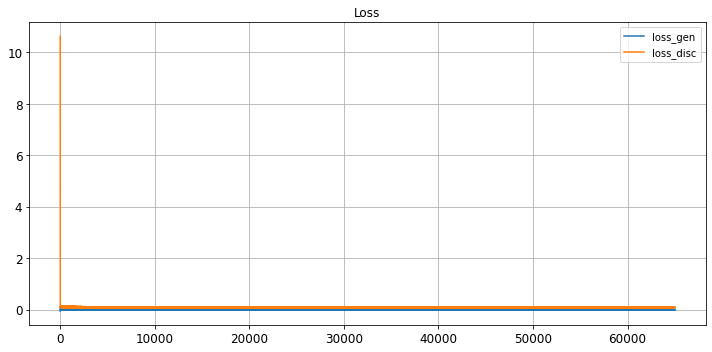

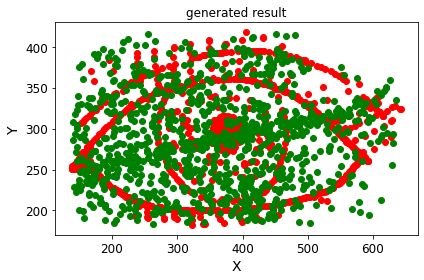

save the model & result
Epoch 65001/100000
critic: 0.078219 - generator: -0.002894 - 0s
Epoch 65002/100000
critic: 0.072997 - generator: -0.002861 - 0s
Epoch 65003/100000
critic: 0.084506 - generator: -0.001907 - 0s
Epoch 65004/100000
critic: 0.098401 - generator: -0.004286 - 0s
Epoch 65005/100000
critic: 0.082865 - generator: -0.002867 - 0s
Epoch 65006/100000
critic: 0.085018 - generator: -0.000022 - 0s
Epoch 65007/100000
critic: 0.084327 - generator: -0.002195 - 0s
Epoch 65008/100000
critic: 0.093101 - generator: -0.004623 - 0s
Epoch 65009/100000
critic: 0.069672 - generator: -0.000782 - 0s
Epoch 65010/100000
critic: 0.082211 - generator: 0.000057 - 0s
Epoch 65011/100000
critic: 0.087136 - generator: -0.002005 - 0s
Epoch 65012/100000
critic: 0.082993 - generator: -0.002141 - 0s
Epoch 65013/100000
critic: 0.072592 - generator: 0.002851 - 0s
Epoch 65014/100000
critic: 0.078131 - generator: -0.000272 - 0s
Epoch 65015/100000
critic: 0.087344 - generator: -0.003789 - 0s
Epoch 65016/100000

critic: 0.084123 - generator: -0.001350 - 0s
Epoch 65132/100000
critic: 0.077857 - generator: -0.002539 - 0s
Epoch 65133/100000
critic: 0.081348 - generator: -0.005447 - 0s
Epoch 65134/100000
critic: 0.085808 - generator: 0.007367 - 0s
Epoch 65135/100000
critic: 0.087259 - generator: 0.002941 - 0s
Epoch 65136/100000
critic: 0.086884 - generator: -0.001720 - 0s
Epoch 65137/100000
critic: 0.078490 - generator: -0.000996 - 0s
Epoch 65138/100000
critic: 0.071627 - generator: -0.000650 - 0s
Epoch 65139/100000
critic: 0.081069 - generator: 0.002296 - 0s
Epoch 65140/100000
critic: 0.078225 - generator: 0.001928 - 0s
Epoch 65141/100000
critic: 0.076535 - generator: 0.002987 - 0s
Epoch 65142/100000
critic: 0.079782 - generator: 0.003831 - 0s
Epoch 65143/100000
critic: 0.091941 - generator: -0.000372 - 0s
Epoch 65144/100000
critic: 0.073814 - generator: -0.000675 - 0s
Epoch 65145/100000
critic: 0.067818 - generator: -0.000237 - 0s
Epoch 65146/100000
critic: 0.077512 - generator: 0.000727 - 0s
Ep

critic: 0.084219 - generator: -0.001203 - 0s
Epoch 65262/100000
critic: 0.069806 - generator: -0.001991 - 0s
Epoch 65263/100000
critic: 0.078405 - generator: -0.001335 - 0s
Epoch 65264/100000
critic: 0.086737 - generator: -0.001297 - 0s
Epoch 65265/100000
critic: 0.073482 - generator: -0.003027 - 0s
Epoch 65266/100000
critic: 0.077165 - generator: -0.000709 - 0s
Epoch 65267/100000
critic: 0.085663 - generator: 0.004223 - 0s
Epoch 65268/100000
critic: 0.082508 - generator: -0.004290 - 0s
Epoch 65269/100000
critic: 0.081555 - generator: -0.004895 - 0s
Epoch 65270/100000
critic: 0.073038 - generator: 0.000636 - 0s
Epoch 65271/100000
critic: 0.070221 - generator: 0.001263 - 0s
Epoch 65272/100000
critic: 0.078524 - generator: 0.002029 - 0s
Epoch 65273/100000
critic: 0.081143 - generator: -0.002240 - 0s
Epoch 65274/100000
critic: 0.082790 - generator: -0.003558 - 0s
Epoch 65275/100000
critic: 0.081974 - generator: 0.002038 - 0s
Epoch 65276/100000
critic: 0.087649 - generator: 0.003425 - 0s
E

critic: 0.083892 - generator: -0.004003 - 0s
Epoch 65392/100000
critic: 0.075457 - generator: -0.002987 - 0s
Epoch 65393/100000
critic: 0.072991 - generator: -0.002013 - 0s
Epoch 65394/100000
critic: 0.086332 - generator: 0.001888 - 0s
Epoch 65395/100000
critic: 0.077728 - generator: -0.002411 - 0s
Epoch 65396/100000
critic: 0.080592 - generator: -0.002332 - 0s
Epoch 65397/100000
critic: 0.072692 - generator: 0.003176 - 0s
Epoch 65398/100000
critic: 0.081522 - generator: -0.002327 - 0s
Epoch 65399/100000
critic: 0.083585 - generator: -0.002982 - 0s
Epoch 65400/100000
critic: 0.088566 - generator: 0.002836 - 0s
Epoch 65401/100000
critic: 0.075198 - generator: 0.001146 - 0s
Epoch 65402/100000
critic: 0.072927 - generator: 0.002582 - 0s
Epoch 65403/100000
critic: 0.089817 - generator: 0.001326 - 0s
Epoch 65404/100000
critic: 0.083690 - generator: -0.000900 - 0s
Epoch 65405/100000
critic: 0.079094 - generator: -0.000934 - 0s
Epoch 65406/100000
critic: 0.083631 - generator: -0.000480 - 0s
E

critic: 0.075298 - generator: 0.002372 - 0s
Epoch 65522/100000
critic: 0.088883 - generator: -0.001215 - 0s
Epoch 65523/100000
critic: 0.078600 - generator: 0.001184 - 0s
Epoch 65524/100000
critic: 0.082209 - generator: -0.001306 - 0s
Epoch 65525/100000
critic: 0.077449 - generator: 0.001107 - 0s
Epoch 65526/100000
critic: 0.087899 - generator: 0.001593 - 0s
Epoch 65527/100000
critic: 0.073388 - generator: 0.004652 - 0s
Epoch 65528/100000
critic: 0.072554 - generator: 0.003968 - 0s
Epoch 65529/100000
critic: 0.077226 - generator: 0.002520 - 0s
Epoch 65530/100000
critic: 0.077435 - generator: 0.001852 - 0s
Epoch 65531/100000
critic: 0.079968 - generator: 0.001353 - 0s
Epoch 65532/100000
critic: 0.086239 - generator: 0.000889 - 0s
Epoch 65533/100000
critic: 0.084682 - generator: -0.003087 - 0s
Epoch 65534/100000
critic: 0.074035 - generator: -0.003488 - 0s
Epoch 65535/100000
critic: 0.074007 - generator: -0.001717 - 0s
Epoch 65536/100000
critic: 0.078235 - generator: -0.000782 - 0s
Epoch

critic: 0.081601 - generator: -0.000225 - 0s
Epoch 65653/100000
critic: 0.087900 - generator: -0.000818 - 0s
Epoch 65654/100000
critic: 0.085122 - generator: 0.004111 - 0s
Epoch 65655/100000
critic: 0.078791 - generator: -0.002172 - 0s
Epoch 65656/100000
critic: 0.079145 - generator: -0.001037 - 0s
Epoch 65657/100000
critic: 0.076564 - generator: 0.003825 - 0s
Epoch 65658/100000
critic: 0.074765 - generator: 0.006113 - 0s
Epoch 65659/100000
critic: 0.077639 - generator: 0.000985 - 0s
Epoch 65660/100000
critic: 0.080418 - generator: 0.001418 - 0s
Epoch 65661/100000
critic: 0.083624 - generator: 0.001349 - 0s
Epoch 65662/100000
critic: 0.084529 - generator: 0.005180 - 0s
Epoch 65663/100000
critic: 0.074789 - generator: 0.004669 - 0s
Epoch 65664/100000
critic: 0.089209 - generator: 0.002735 - 0s
Epoch 65665/100000
critic: 0.083235 - generator: 0.005420 - 0s
Epoch 65666/100000
critic: 0.081825 - generator: 0.003539 - 0s
Epoch 65667/100000
critic: 0.074596 - generator: 0.003191 - 0s
Epoch 6

critic: 0.076930 - generator: -0.002190 - 0s
Epoch 65783/100000
critic: 0.080764 - generator: -0.004777 - 0s
Epoch 65784/100000
critic: 0.072105 - generator: -0.000476 - 0s
Epoch 65785/100000
critic: 0.072140 - generator: -0.002525 - 0s
Epoch 65786/100000
critic: 0.071548 - generator: 0.000528 - 0s
Epoch 65787/100000
critic: 0.090148 - generator: 0.000392 - 0s
Epoch 65788/100000
critic: 0.073200 - generator: 0.001628 - 0s
Epoch 65789/100000
critic: 0.079413 - generator: 0.000714 - 0s
Epoch 65790/100000
critic: 0.066214 - generator: 0.006931 - 0s
Epoch 65791/100000
critic: 0.080278 - generator: 0.005157 - 0s
Epoch 65792/100000
critic: 0.089415 - generator: 0.003143 - 0s
Epoch 65793/100000
critic: 0.077243 - generator: -0.000750 - 0s
Epoch 65794/100000
critic: 0.080532 - generator: 0.000214 - 0s
Epoch 65795/100000
critic: 0.080162 - generator: 0.002358 - 0s
Epoch 65796/100000
critic: 0.079765 - generator: 0.001564 - 0s
Epoch 65797/100000
critic: 0.082671 - generator: -0.000826 - 0s
Epoch

critic: 0.072502 - generator: 0.000565 - 0s
Epoch 65912/100000
critic: 0.089425 - generator: -0.002606 - 0s
Epoch 65913/100000
critic: 0.078436 - generator: 0.000773 - 0s
Epoch 65914/100000
critic: 0.086141 - generator: -0.000248 - 0s
Epoch 65915/100000
critic: 0.078364 - generator: 0.000838 - 0s
Epoch 65916/100000
critic: 0.070160 - generator: 0.001824 - 0s
Epoch 65917/100000
critic: 0.070978 - generator: 0.003537 - 0s
Epoch 65918/100000
critic: 0.072927 - generator: -0.000080 - 0s
Epoch 65919/100000
critic: 0.080884 - generator: -0.000163 - 0s
Epoch 65920/100000
critic: 0.078755 - generator: 0.002311 - 0s
Epoch 65921/100000
critic: 0.081366 - generator: 0.001820 - 0s
Epoch 65922/100000
critic: 0.086021 - generator: 0.002196 - 0s
Epoch 65923/100000
critic: 0.077379 - generator: 0.002072 - 0s
Epoch 65924/100000
critic: 0.083867 - generator: 0.001093 - 0s
Epoch 65925/100000
critic: 0.094517 - generator: 0.002100 - 0s
Epoch 65926/100000
critic: 0.083401 - generator: 0.001995 - 0s
Epoch 6

critic: 0.082508 - generator: -0.001609 - 0s
Epoch 66042/100000
critic: 0.094446 - generator: -0.002360 - 0s
Epoch 66043/100000
critic: 0.080845 - generator: 0.002478 - 0s
Epoch 66044/100000
critic: 0.082651 - generator: -0.004595 - 0s
Epoch 66045/100000
critic: 0.086106 - generator: -0.001625 - 0s
Epoch 66046/100000
critic: 0.078165 - generator: -0.001093 - 0s
Epoch 66047/100000
critic: 0.083108 - generator: 0.004621 - 0s
Epoch 66048/100000
critic: 0.075751 - generator: -0.000626 - 0s
Epoch 66049/100000
critic: 0.083115 - generator: -0.000875 - 0s
Epoch 66050/100000
critic: 0.079646 - generator: -0.002159 - 0s
Epoch 66051/100000
critic: 0.080618 - generator: 0.001387 - 0s
Epoch 66052/100000
critic: 0.071128 - generator: -0.003086 - 0s
Epoch 66053/100000
critic: 0.075859 - generator: -0.003459 - 0s
Epoch 66054/100000
critic: 0.092835 - generator: -0.005023 - 0s
Epoch 66055/100000
critic: 0.072886 - generator: -0.002681 - 0s
Epoch 66056/100000
critic: 0.086740 - generator: 0.000207 - 0s

critic: 0.083350 - generator: -0.000627 - 0s
Epoch 66172/100000
critic: 0.086363 - generator: 0.000228 - 0s
Epoch 66173/100000
critic: 0.075509 - generator: -0.001423 - 0s
Epoch 66174/100000
critic: 0.074419 - generator: 0.000535 - 0s
Epoch 66175/100000
critic: 0.081996 - generator: 0.004539 - 0s
Epoch 66176/100000
critic: 0.085643 - generator: 0.002179 - 0s
Epoch 66177/100000
critic: 0.080554 - generator: -0.001023 - 0s
Epoch 66178/100000
critic: 0.077263 - generator: 0.000748 - 0s
Epoch 66179/100000
critic: 0.087204 - generator: 0.000494 - 0s
Epoch 66180/100000
critic: 0.086456 - generator: -0.000176 - 0s
Epoch 66181/100000
critic: 0.066414 - generator: 0.000276 - 0s
Epoch 66182/100000
critic: 0.083686 - generator: 0.001561 - 0s
Epoch 66183/100000
critic: 0.077923 - generator: -0.000829 - 0s
Epoch 66184/100000
critic: 0.073711 - generator: -0.001815 - 0s
Epoch 66185/100000
critic: 0.087480 - generator: 0.003009 - 0s
Epoch 66186/100000
critic: 0.082598 - generator: 0.002269 - 0s
Epoch

critic: 0.082792 - generator: 0.004280 - 0s
Epoch 66303/100000
critic: 0.082348 - generator: -0.002602 - 0s
Epoch 66304/100000
critic: 0.079545 - generator: 0.002444 - 0s
Epoch 66305/100000
critic: 0.078289 - generator: 0.001207 - 0s
Epoch 66306/100000
critic: 0.080696 - generator: 0.001206 - 0s
Epoch 66307/100000
critic: 0.076845 - generator: -0.001268 - 0s
Epoch 66308/100000
critic: 0.080212 - generator: -0.001385 - 0s
Epoch 66309/100000
critic: 0.078392 - generator: -0.002486 - 0s
Epoch 66310/100000
critic: 0.084927 - generator: -0.002198 - 0s
Epoch 66311/100000
critic: 0.074667 - generator: 0.002957 - 0s
Epoch 66312/100000
critic: 0.081761 - generator: -0.001380 - 0s
Epoch 66313/100000
critic: 0.080442 - generator: 0.001477 - 0s
Epoch 66314/100000
critic: 0.085619 - generator: -0.002886 - 0s
Epoch 66315/100000
critic: 0.072454 - generator: 0.002877 - 0s
Epoch 66316/100000
critic: 0.079824 - generator: -0.000036 - 0s
Epoch 66317/100000
critic: 0.075799 - generator: -0.004862 - 0s
Ep

critic: 0.088862 - generator: 0.005263 - 0s
Epoch 66433/100000
critic: 0.078220 - generator: 0.002575 - 0s
Epoch 66434/100000
critic: 0.084539 - generator: -0.003199 - 0s
Epoch 66435/100000
critic: 0.076192 - generator: -0.001338 - 0s
Epoch 66436/100000
critic: 0.068968 - generator: -0.002188 - 0s
Epoch 66437/100000
critic: 0.080123 - generator: 0.001824 - 0s
Epoch 66438/100000
critic: 0.093122 - generator: -0.004408 - 0s
Epoch 66439/100000
critic: 0.065145 - generator: 0.002720 - 0s
Epoch 66440/100000
critic: 0.086541 - generator: 0.005286 - 0s
Epoch 66441/100000
critic: 0.082068 - generator: 0.002981 - 0s
Epoch 66442/100000
critic: 0.080082 - generator: 0.000010 - 0s
Epoch 66443/100000
critic: 0.080824 - generator: 0.002465 - 0s
Epoch 66444/100000
critic: 0.087127 - generator: -0.001121 - 0s
Epoch 66445/100000
critic: 0.084532 - generator: 0.004473 - 0s
Epoch 66446/100000
critic: 0.078276 - generator: -0.003268 - 0s
Epoch 66447/100000
critic: 0.086690 - generator: -0.004041 - 0s
Epoc

critic: 0.077016 - generator: 0.002271 - 0s
Epoch 66563/100000
critic: 0.081817 - generator: 0.001125 - 0s
Epoch 66564/100000
critic: 0.090476 - generator: 0.000586 - 0s
Epoch 66565/100000
critic: 0.069178 - generator: 0.004278 - 0s
Epoch 66566/100000
critic: 0.081217 - generator: -0.001127 - 0s
Epoch 66567/100000
critic: 0.072224 - generator: -0.000605 - 0s
Epoch 66568/100000
critic: 0.078977 - generator: -0.001895 - 0s
Epoch 66569/100000
critic: 0.082943 - generator: -0.002717 - 0s
Epoch 66570/100000
critic: 0.085784 - generator: -0.000141 - 0s
Epoch 66571/100000
critic: 0.090957 - generator: 0.004507 - 0s
Epoch 66572/100000
critic: 0.080558 - generator: 0.004010 - 0s
Epoch 66573/100000
critic: 0.083371 - generator: 0.001605 - 0s
Epoch 66574/100000
critic: 0.078228 - generator: 0.000988 - 0s
Epoch 66575/100000
critic: 0.082065 - generator: 0.001744 - 0s
Epoch 66576/100000
critic: 0.083049 - generator: 0.000687 - 0s
Epoch 66577/100000
critic: 0.076449 - generator: 0.005523 - 0s
Epoch 

critic: 0.080229 - generator: 0.000670 - 0s
Epoch 66693/100000
critic: 0.079317 - generator: -0.005449 - 0s
Epoch 66694/100000
critic: 0.075658 - generator: -0.001946 - 0s
Epoch 66695/100000
critic: 0.067286 - generator: -0.002624 - 0s
Epoch 66696/100000
critic: 0.071734 - generator: -0.002148 - 0s
Epoch 66697/100000
critic: 0.091507 - generator: 0.001045 - 0s
Epoch 66698/100000
critic: 0.074987 - generator: 0.001078 - 0s
Epoch 66699/100000
critic: 0.079983 - generator: -0.000921 - 0s
Epoch 66700/100000
critic: 0.080543 - generator: 0.001446 - 0s
Epoch 66701/100000
critic: 0.070050 - generator: 0.001139 - 0s
Epoch 66702/100000
critic: 0.091031 - generator: -0.000585 - 0s
Epoch 66703/100000
critic: 0.076791 - generator: 0.000256 - 0s
Epoch 66704/100000
critic: 0.070485 - generator: 0.002718 - 0s
Epoch 66705/100000
critic: 0.083585 - generator: 0.002674 - 0s
Epoch 66706/100000
critic: 0.074318 - generator: -0.001132 - 0s
Epoch 66707/100000
critic: 0.084458 - generator: 0.000870 - 0s
Epoc

critic: 0.081161 - generator: -0.000326 - 0s
Epoch 66823/100000
critic: 0.078931 - generator: -0.001184 - 0s
Epoch 66824/100000
critic: 0.080788 - generator: 0.001170 - 0s
Epoch 66825/100000
critic: 0.088559 - generator: -0.000540 - 0s
Epoch 66826/100000
critic: 0.093873 - generator: 0.002110 - 0s
Epoch 66827/100000
critic: 0.075043 - generator: -0.000745 - 0s
Epoch 66828/100000
critic: 0.079556 - generator: 0.000324 - 0s
Epoch 66829/100000
critic: 0.072852 - generator: 0.003406 - 0s
Epoch 66830/100000
critic: 0.077207 - generator: 0.002399 - 0s
Epoch 66831/100000
critic: 0.085833 - generator: 0.000778 - 0s
Epoch 66832/100000
critic: 0.081734 - generator: -0.000453 - 0s
Epoch 66833/100000
critic: 0.085301 - generator: -0.000486 - 0s
Epoch 66834/100000
critic: 0.086947 - generator: 0.003872 - 0s
Epoch 66835/100000
critic: 0.077080 - generator: -0.001449 - 0s
Epoch 66836/100000
critic: 0.084575 - generator: 0.000456 - 0s
Epoch 66837/100000
critic: 0.079004 - generator: -0.001384 - 0s
Epo

critic: 0.076553 - generator: 0.001312 - 0s
Epoch 66953/100000
critic: 0.082983 - generator: 0.003276 - 0s
Epoch 66954/100000
critic: 0.082407 - generator: 0.002007 - 0s
Epoch 66955/100000
critic: 0.079326 - generator: 0.000513 - 0s
Epoch 66956/100000
critic: 0.079318 - generator: -0.003731 - 0s
Epoch 66957/100000
critic: 0.073400 - generator: 0.003432 - 0s
Epoch 66958/100000
critic: 0.074007 - generator: -0.003650 - 0s
Epoch 66959/100000
critic: 0.087381 - generator: -0.000955 - 0s
Epoch 66960/100000
critic: 0.064723 - generator: -0.002665 - 0s
Epoch 66961/100000
critic: 0.077531 - generator: 0.001785 - 0s
Epoch 66962/100000
critic: 0.079891 - generator: 0.001950 - 0s
Epoch 66963/100000
critic: 0.083253 - generator: 0.001691 - 0s
Epoch 66964/100000
critic: 0.075861 - generator: 0.000107 - 0s
Epoch 66965/100000
critic: 0.081372 - generator: -0.001547 - 0s
Epoch 66966/100000
critic: 0.082865 - generator: -0.004420 - 0s
Epoch 66967/100000
critic: 0.086658 - generator: -0.001788 - 0s
Epoc

critic: 0.084738 - generator: -0.000043 - 0s
Epoch 67083/100000
critic: 0.078208 - generator: -0.000482 - 0s
Epoch 67084/100000
critic: 0.079187 - generator: 0.001375 - 0s
Epoch 67085/100000
critic: 0.096593 - generator: -0.001032 - 0s
Epoch 67086/100000
critic: 0.082746 - generator: -0.004656 - 0s
Epoch 67087/100000
critic: 0.075671 - generator: -0.003111 - 0s
Epoch 67088/100000
critic: 0.076385 - generator: 0.001786 - 0s
Epoch 67089/100000
critic: 0.081586 - generator: -0.005900 - 0s
Epoch 67090/100000
critic: 0.074904 - generator: -0.001531 - 0s
Epoch 67091/100000
critic: 0.080801 - generator: 0.000822 - 0s
Epoch 67092/100000
critic: 0.064215 - generator: 0.000660 - 0s
Epoch 67093/100000
critic: 0.077859 - generator: 0.004208 - 0s
Epoch 67094/100000
critic: 0.080878 - generator: 0.002881 - 0s
Epoch 67095/100000
critic: 0.081817 - generator: 0.005371 - 0s
Epoch 67096/100000
critic: 0.087900 - generator: 0.001681 - 0s
Epoch 67097/100000
critic: 0.086095 - generator: -0.001314 - 0s
Epo

critic: 0.077723 - generator: 0.002272 - 0s
Epoch 67213/100000
critic: 0.080571 - generator: -0.002677 - 0s
Epoch 67214/100000
critic: 0.075545 - generator: -0.000954 - 0s
Epoch 67215/100000
critic: 0.069942 - generator: 0.004034 - 0s
Epoch 67216/100000
critic: 0.081777 - generator: 0.003568 - 0s
Epoch 67217/100000
critic: 0.097016 - generator: -0.000370 - 0s
Epoch 67218/100000
critic: 0.086137 - generator: -0.000188 - 0s
Epoch 67219/100000
critic: 0.082896 - generator: -0.000446 - 0s
Epoch 67220/100000
critic: 0.082842 - generator: -0.001341 - 0s
Epoch 67221/100000
critic: 0.077241 - generator: -0.003793 - 0s
Epoch 67222/100000
critic: 0.083231 - generator: -0.001716 - 0s
Epoch 67223/100000
critic: 0.076683 - generator: -0.001116 - 0s
Epoch 67224/100000
critic: 0.083173 - generator: -0.006977 - 0s
Epoch 67225/100000
critic: 0.079534 - generator: -0.002685 - 0s
Epoch 67226/100000
critic: 0.073388 - generator: 0.003364 - 0s
Epoch 67227/100000
critic: 0.086408 - generator: 0.004968 - 0s


critic: 0.067345 - generator: 0.003435 - 0s
Epoch 67343/100000
critic: 0.074963 - generator: -0.001571 - 0s
Epoch 67344/100000
critic: 0.086774 - generator: 0.000948 - 0s
Epoch 67345/100000
critic: 0.074962 - generator: -0.000840 - 0s
Epoch 67346/100000
critic: 0.077555 - generator: -0.001114 - 0s
Epoch 67347/100000
critic: 0.097245 - generator: -0.002190 - 0s
Epoch 67348/100000
critic: 0.084977 - generator: 0.001716 - 0s
Epoch 67349/100000
critic: 0.089095 - generator: 0.001767 - 0s
Epoch 67350/100000
critic: 0.085604 - generator: -0.000092 - 0s
Epoch 67351/100000
critic: 0.082722 - generator: 0.003625 - 0s
Epoch 67352/100000
critic: 0.078045 - generator: 0.001518 - 0s
Epoch 67353/100000
critic: 0.079567 - generator: 0.002783 - 0s
Epoch 67354/100000
critic: 0.078951 - generator: 0.003589 - 0s
Epoch 67355/100000
critic: 0.095971 - generator: 0.000842 - 0s
Epoch 67356/100000
critic: 0.081876 - generator: 0.001245 - 0s
Epoch 67357/100000
critic: 0.074504 - generator: -0.001308 - 0s
Epoch

critic: 0.079848 - generator: -0.001052 - 0s
Epoch 67474/100000
critic: 0.081935 - generator: -0.005889 - 0s
Epoch 67475/100000
critic: 0.080715 - generator: -0.000144 - 0s
Epoch 67476/100000
critic: 0.076172 - generator: 0.002365 - 0s
Epoch 67477/100000
critic: 0.083612 - generator: 0.004544 - 0s
Epoch 67478/100000
critic: 0.077894 - generator: 0.004324 - 0s
Epoch 67479/100000
critic: 0.081700 - generator: 0.001215 - 0s
Epoch 67480/100000
critic: 0.080720 - generator: -0.000233 - 0s
Epoch 67481/100000
critic: 0.079536 - generator: 0.000039 - 0s
Epoch 67482/100000
critic: 0.075627 - generator: -0.000858 - 0s
Epoch 67483/100000
critic: 0.091917 - generator: 0.000148 - 0s
Epoch 67484/100000
critic: 0.077940 - generator: 0.001180 - 0s
Epoch 67485/100000
critic: 0.079248 - generator: 0.000982 - 0s
Epoch 67486/100000
critic: 0.085213 - generator: 0.000430 - 0s
Epoch 67487/100000
critic: 0.070233 - generator: 0.002053 - 0s
Epoch 67488/100000
critic: 0.089291 - generator: -0.001273 - 0s
Epoch

critic: 0.076119 - generator: -0.000553 - 0s
Epoch 67604/100000
critic: 0.070784 - generator: -0.003552 - 0s
Epoch 67605/100000
critic: 0.080225 - generator: 0.001301 - 0s
Epoch 67606/100000
critic: 0.092394 - generator: -0.001032 - 0s
Epoch 67607/100000
critic: 0.074971 - generator: -0.000576 - 0s
Epoch 67608/100000
critic: 0.074048 - generator: -0.001788 - 0s
Epoch 67609/100000
critic: 0.084977 - generator: -0.003244 - 0s
Epoch 67610/100000
critic: 0.081141 - generator: 0.003619 - 0s
Epoch 67611/100000
critic: 0.079454 - generator: 0.000978 - 0s
Epoch 67612/100000
critic: 0.072546 - generator: -0.001270 - 0s
Epoch 67613/100000
critic: 0.079171 - generator: 0.000917 - 0s
Epoch 67614/100000
critic: 0.073319 - generator: 0.001781 - 0s
Epoch 67615/100000
critic: 0.081024 - generator: 0.001606 - 0s
Epoch 67616/100000
critic: 0.069693 - generator: 0.000073 - 0s
Epoch 67617/100000
critic: 0.070806 - generator: 0.003394 - 0s
Epoch 67618/100000
critic: 0.082839 - generator: -0.000971 - 0s
Epo

critic: 0.081190 - generator: 0.003252 - 0s
Epoch 67734/100000
critic: 0.077050 - generator: 0.004764 - 0s
Epoch 67735/100000
critic: 0.077095 - generator: 0.001265 - 0s
Epoch 67736/100000
critic: 0.088099 - generator: 0.003625 - 0s
Epoch 67737/100000
critic: 0.077269 - generator: 0.002492 - 0s
Epoch 67738/100000
critic: 0.075604 - generator: -0.002676 - 0s
Epoch 67739/100000
critic: 0.077953 - generator: -0.001944 - 0s
Epoch 67740/100000
critic: 0.078904 - generator: -0.003770 - 0s
Epoch 67741/100000
critic: 0.072348 - generator: -0.004117 - 0s
Epoch 67742/100000
critic: 0.085723 - generator: -0.000558 - 0s
Epoch 67743/100000
critic: 0.078081 - generator: 0.001542 - 0s
Epoch 67744/100000
critic: 0.087472 - generator: 0.004557 - 0s
Epoch 67745/100000
critic: 0.075137 - generator: 0.003604 - 0s
Epoch 67746/100000
critic: 0.069740 - generator: 0.002622 - 0s
Epoch 67747/100000
critic: 0.088849 - generator: 0.007387 - 0s
Epoch 67748/100000
critic: 0.077252 - generator: 0.005919 - 0s
Epoch 

critic: 0.099324 - generator: 0.003005 - 0s
Epoch 67863/100000
critic: 0.068924 - generator: 0.000106 - 0s
Epoch 67864/100000
critic: 0.081174 - generator: 0.005057 - 0s
Epoch 67865/100000
critic: 0.083603 - generator: 0.000351 - 0s
Epoch 67866/100000
critic: 0.074530 - generator: 0.000316 - 0s
Epoch 67867/100000
critic: 0.080800 - generator: 0.000116 - 0s
Epoch 67868/100000
critic: 0.080390 - generator: -0.001717 - 0s
Epoch 67869/100000
critic: 0.079012 - generator: 0.000404 - 0s
Epoch 67870/100000
critic: 0.070252 - generator: -0.000199 - 0s
Epoch 67871/100000
critic: 0.082666 - generator: 0.006087 - 0s
Epoch 67872/100000
critic: 0.079743 - generator: -0.001540 - 0s
Epoch 67873/100000
critic: 0.082569 - generator: -0.000432 - 0s
Epoch 67874/100000
critic: 0.084389 - generator: -0.004773 - 0s
Epoch 67875/100000
critic: 0.081826 - generator: -0.001226 - 0s
Epoch 67876/100000
critic: 0.073589 - generator: 0.002659 - 0s
Epoch 67877/100000
critic: 0.066631 - generator: 0.002010 - 0s
Epoch

critic: 0.079119 - generator: -0.001123 - 0s
Epoch 67993/100000
critic: 0.085457 - generator: 0.001648 - 0s
Epoch 67994/100000
critic: 0.084814 - generator: 0.000967 - 0s
Epoch 67995/100000
critic: 0.087395 - generator: -0.000958 - 0s
Epoch 67996/100000
critic: 0.078098 - generator: 0.000767 - 0s
Epoch 67997/100000
critic: 0.074251 - generator: 0.002684 - 0s
Epoch 67998/100000
critic: 0.081708 - generator: 0.001276 - 0s
Epoch 67999/100000
critic: 0.069561 - generator: -0.001531 - 0s
Epoch 68000/100000
critic: 0.074914 - generator: -0.000221 - 0s
Epoch 68001/100000
critic: 0.073967 - generator: 0.003309 - 0s
Epoch 68002/100000
critic: 0.078660 - generator: -0.001080 - 0s
Epoch 68003/100000
critic: 0.079041 - generator: -0.003579 - 0s
Epoch 68004/100000
critic: 0.083737 - generator: -0.003355 - 0s
Epoch 68005/100000
critic: 0.070975 - generator: -0.001816 - 0s
Epoch 68006/100000
critic: 0.083256 - generator: -0.000722 - 0s
Epoch 68007/100000
critic: 0.083629 - generator: 0.000885 - 0s
Ep

critic: 0.087508 - generator: 0.000103 - 0s
Epoch 68123/100000
critic: 0.075112 - generator: -0.002303 - 0s
Epoch 68124/100000
critic: 0.086898 - generator: -0.002690 - 0s
Epoch 68125/100000
critic: 0.075512 - generator: 0.000082 - 0s
Epoch 68126/100000
critic: 0.086373 - generator: -0.001185 - 0s
Epoch 68127/100000
critic: 0.086700 - generator: 0.002166 - 0s
Epoch 68128/100000
critic: 0.069572 - generator: 0.001955 - 0s
Epoch 68129/100000
critic: 0.068215 - generator: 0.001274 - 0s
Epoch 68130/100000
critic: 0.079038 - generator: 0.000376 - 0s
Epoch 68131/100000
critic: 0.076684 - generator: 0.000085 - 0s
Epoch 68132/100000
critic: 0.074654 - generator: 0.000081 - 0s
Epoch 68133/100000
critic: 0.085434 - generator: -0.001541 - 0s
Epoch 68134/100000
critic: 0.082082 - generator: -0.003543 - 0s
Epoch 68135/100000
critic: 0.081891 - generator: -0.001439 - 0s
Epoch 68136/100000
critic: 0.071384 - generator: 0.001367 - 0s
Epoch 68137/100000
critic: 0.093332 - generator: 0.003788 - 0s
Epoch

critic: 0.086771 - generator: 0.001625 - 0s
Epoch 68253/100000
critic: 0.082946 - generator: -0.001859 - 0s
Epoch 68254/100000
critic: 0.087781 - generator: 0.002762 - 0s
Epoch 68255/100000
critic: 0.079968 - generator: -0.002014 - 0s
Epoch 68256/100000
critic: 0.082515 - generator: 0.002319 - 0s
Epoch 68257/100000
critic: 0.083932 - generator: -0.001708 - 0s
Epoch 68258/100000
critic: 0.086569 - generator: -0.004559 - 0s
Epoch 68259/100000
critic: 0.082255 - generator: -0.003748 - 0s
Epoch 68260/100000
critic: 0.085535 - generator: -0.003437 - 0s
Epoch 68261/100000
critic: 0.079381 - generator: 0.000434 - 0s
Epoch 68262/100000
critic: 0.080212 - generator: 0.001814 - 0s
Epoch 68263/100000
critic: 0.083218 - generator: -0.002079 - 0s
Epoch 68264/100000
critic: 0.066160 - generator: -0.000262 - 0s
Epoch 68265/100000
critic: 0.087618 - generator: 0.002177 - 0s
Epoch 68266/100000
critic: 0.076536 - generator: -0.000266 - 0s
Epoch 68267/100000
critic: 0.080773 - generator: 0.000783 - 0s
Ep

critic: 0.084521 - generator: 0.001670 - 0s
Epoch 68383/100000
critic: 0.079037 - generator: 0.003829 - 0s
Epoch 68384/100000
critic: 0.089441 - generator: 0.002905 - 0s
Epoch 68385/100000
critic: 0.080455 - generator: 0.004397 - 0s
Epoch 68386/100000
critic: 0.071734 - generator: -0.001581 - 0s
Epoch 68387/100000
critic: 0.082329 - generator: 0.002183 - 0s
Epoch 68388/100000
critic: 0.070399 - generator: -0.001001 - 0s
Epoch 68389/100000
critic: 0.080461 - generator: -0.002965 - 0s
Epoch 68390/100000
critic: 0.072486 - generator: 0.002457 - 0s
Epoch 68391/100000
critic: 0.078607 - generator: 0.001038 - 0s
Epoch 68392/100000
critic: 0.071935 - generator: -0.003210 - 0s
Epoch 68393/100000
critic: 0.094026 - generator: -0.002498 - 0s
Epoch 68394/100000
critic: 0.088850 - generator: 0.000387 - 0s
Epoch 68395/100000
critic: 0.075035 - generator: -0.002191 - 0s
Epoch 68396/100000
critic: 0.077821 - generator: -0.001902 - 0s
Epoch 68397/100000
critic: 0.085527 - generator: 0.000584 - 0s
Epoc

critic: 0.084931 - generator: 0.000354 - 0s
Epoch 68513/100000
critic: 0.070881 - generator: 0.003225 - 0s
Epoch 68514/100000
critic: 0.079731 - generator: 0.003575 - 0s
Epoch 68515/100000
critic: 0.078968 - generator: 0.001799 - 0s
Epoch 68516/100000
critic: 0.083385 - generator: 0.002884 - 0s
Epoch 68517/100000
critic: 0.078435 - generator: 0.001875 - 0s
Epoch 68518/100000
critic: 0.077376 - generator: 0.000315 - 0s
Epoch 68519/100000
critic: 0.083067 - generator: 0.001838 - 0s
Epoch 68520/100000
critic: 0.082046 - generator: 0.002014 - 0s
Epoch 68521/100000
critic: 0.081820 - generator: 0.001795 - 0s
Epoch 68522/100000
critic: 0.067845 - generator: -0.001522 - 0s
Epoch 68523/100000
critic: 0.081319 - generator: 0.002043 - 0s
Epoch 68524/100000
critic: 0.070893 - generator: -0.000981 - 0s
Epoch 68525/100000
critic: 0.081815 - generator: 0.003593 - 0s
Epoch 68526/100000
critic: 0.077077 - generator: -0.001924 - 0s
Epoch 68527/100000
critic: 0.075994 - generator: 0.002518 - 0s
Epoch 68

critic: 0.088396 - generator: -0.002134 - 0s
Epoch 68643/100000
critic: 0.075186 - generator: 0.002060 - 0s
Epoch 68644/100000
critic: 0.080738 - generator: 0.004374 - 0s
Epoch 68645/100000
critic: 0.090782 - generator: -0.001269 - 0s
Epoch 68646/100000
critic: 0.092432 - generator: -0.004301 - 0s
Epoch 68647/100000
critic: 0.087318 - generator: -0.003080 - 0s
Epoch 68648/100000
critic: 0.079768 - generator: 0.000562 - 0s
Epoch 68649/100000
critic: 0.074522 - generator: 0.000833 - 0s
Epoch 68650/100000
critic: 0.076065 - generator: 0.005256 - 0s
Epoch 68651/100000
critic: 0.083385 - generator: 0.003905 - 0s
Epoch 68652/100000
critic: 0.079157 - generator: 0.002578 - 0s
Epoch 68653/100000
critic: 0.076159 - generator: 0.002000 - 0s
Epoch 68654/100000
critic: 0.079899 - generator: -0.001213 - 0s
Epoch 68655/100000
critic: 0.080499 - generator: 0.001980 - 0s
Epoch 68656/100000
critic: 0.088269 - generator: 0.001778 - 0s
Epoch 68657/100000
critic: 0.083682 - generator: 0.001329 - 0s
Epoch 

critic: 0.080125 - generator: 0.000266 - 0s
Epoch 68773/100000
critic: 0.076349 - generator: 0.006674 - 0s
Epoch 68774/100000
critic: 0.074956 - generator: 0.001304 - 0s
Epoch 68775/100000
critic: 0.078705 - generator: 0.003280 - 0s
Epoch 68776/100000
critic: 0.080529 - generator: 0.001525 - 0s
Epoch 68777/100000
critic: 0.079179 - generator: -0.002216 - 0s
Epoch 68778/100000
critic: 0.074950 - generator: -0.004364 - 0s
Epoch 68779/100000
critic: 0.073513 - generator: -0.001275 - 0s
Epoch 68780/100000
critic: 0.088866 - generator: -0.003615 - 0s
Epoch 68781/100000
critic: 0.081864 - generator: -0.003675 - 0s
Epoch 68782/100000
critic: 0.085195 - generator: -0.001379 - 0s
Epoch 68783/100000
critic: 0.089470 - generator: 0.000412 - 0s
Epoch 68784/100000
critic: 0.082070 - generator: -0.004279 - 0s
Epoch 68785/100000
critic: 0.087741 - generator: -0.002273 - 0s
Epoch 68786/100000
critic: 0.083523 - generator: -0.000180 - 0s
Epoch 68787/100000
critic: 0.081211 - generator: -0.002782 - 0s
E

critic: 0.088354 - generator: 0.000906 - 0s
Epoch 68903/100000
critic: 0.068455 - generator: 0.002799 - 0s
Epoch 68904/100000
critic: 0.088451 - generator: 0.008031 - 0s
Epoch 68905/100000
critic: 0.072418 - generator: 0.008528 - 0s
Epoch 68906/100000
critic: 0.073988 - generator: 0.000909 - 0s
Epoch 68907/100000
critic: 0.077508 - generator: -0.004508 - 0s
Epoch 68908/100000
critic: 0.073727 - generator: -0.004016 - 0s
Epoch 68909/100000
critic: 0.071315 - generator: -0.000084 - 0s
Epoch 68910/100000
critic: 0.075360 - generator: -0.000194 - 0s
Epoch 68911/100000
critic: 0.065241 - generator: 0.000464 - 0s
Epoch 68912/100000
critic: 0.086054 - generator: 0.007246 - 0s
Epoch 68913/100000
critic: 0.083380 - generator: 0.005580 - 0s
Epoch 68914/100000
critic: 0.083774 - generator: 0.002634 - 0s
Epoch 68915/100000
critic: 0.084795 - generator: -0.002201 - 0s
Epoch 68916/100000
critic: 0.079848 - generator: 0.001557 - 0s
Epoch 68917/100000
critic: 0.079958 - generator: 0.003122 - 0s
Epoch 

critic: 0.075122 - generator: -0.002489 - 0s
Epoch 69033/100000
critic: 0.076720 - generator: 0.000414 - 0s
Epoch 69034/100000
critic: 0.083943 - generator: -0.003789 - 0s
Epoch 69035/100000
critic: 0.064224 - generator: 0.003239 - 0s
Epoch 69036/100000
critic: 0.088528 - generator: 0.002835 - 0s
Epoch 69037/100000
critic: 0.083125 - generator: -0.004165 - 0s
Epoch 69038/100000
critic: 0.082051 - generator: 0.002927 - 0s
Epoch 69039/100000
critic: 0.080777 - generator: -0.002110 - 0s
Epoch 69040/100000
critic: 0.085005 - generator: 0.001013 - 0s
Epoch 69041/100000
critic: 0.077096 - generator: -0.003184 - 0s
Epoch 69042/100000
critic: 0.084458 - generator: -0.003274 - 0s
Epoch 69043/100000
critic: 0.085705 - generator: 0.002862 - 0s
Epoch 69044/100000
critic: 0.076632 - generator: 0.002134 - 0s
Epoch 69045/100000
critic: 0.087446 - generator: 0.001755 - 0s
Epoch 69046/100000
critic: 0.096122 - generator: 0.001216 - 0s
Epoch 69047/100000
critic: 0.076653 - generator: -0.001803 - 0s
Epoc

critic: 0.078224 - generator: 0.004001 - 0s
Epoch 69162/100000
critic: 0.083146 - generator: -0.000489 - 0s
Epoch 69163/100000
critic: 0.092144 - generator: 0.001989 - 0s
Epoch 69164/100000
critic: 0.075163 - generator: -0.002058 - 0s
Epoch 69165/100000
critic: 0.082771 - generator: -0.000699 - 0s
Epoch 69166/100000
critic: 0.096528 - generator: 0.001666 - 0s
Epoch 69167/100000
critic: 0.084480 - generator: 0.001329 - 0s
Epoch 69168/100000
critic: 0.086209 - generator: -0.001371 - 0s
Epoch 69169/100000
critic: 0.074749 - generator: 0.000205 - 0s
Epoch 69170/100000
critic: 0.080272 - generator: 0.000566 - 0s
Epoch 69171/100000
critic: 0.085693 - generator: 0.000143 - 0s
Epoch 69172/100000
critic: 0.086967 - generator: 0.001936 - 0s
Epoch 69173/100000
critic: 0.082921 - generator: -0.000712 - 0s
Epoch 69174/100000
critic: 0.073763 - generator: 0.000569 - 0s
Epoch 69175/100000
critic: 0.081632 - generator: -0.002321 - 0s
Epoch 69176/100000
critic: 0.074788 - generator: -0.000932 - 0s
Epoc

critic: 0.084215 - generator: -0.002480 - 0s
Epoch 69292/100000
critic: 0.069697 - generator: -0.004685 - 0s
Epoch 69293/100000
critic: 0.072098 - generator: -0.000407 - 0s
Epoch 69294/100000
critic: 0.079450 - generator: 0.001167 - 0s
Epoch 69295/100000
critic: 0.070443 - generator: 0.002058 - 0s
Epoch 69296/100000
critic: 0.086812 - generator: 0.007880 - 0s
Epoch 69297/100000
critic: 0.079728 - generator: 0.007805 - 0s
Epoch 69298/100000
critic: 0.076098 - generator: 0.002621 - 0s
Epoch 69299/100000
critic: 0.080492 - generator: 0.001174 - 0s
Epoch 69300/100000
critic: 0.077782 - generator: 0.000898 - 0s
Epoch 69301/100000
critic: 0.084632 - generator: -0.001264 - 0s
Epoch 69302/100000
critic: 0.070482 - generator: 0.002136 - 0s
Epoch 69303/100000
critic: 0.078639 - generator: -0.001169 - 0s
Epoch 69304/100000
critic: 0.074812 - generator: -0.001573 - 0s
Epoch 69305/100000
critic: 0.070108 - generator: 0.001172 - 0s
Epoch 69306/100000
critic: 0.089879 - generator: -0.003328 - 0s
Epoc

critic: 0.076301 - generator: -0.002983 - 0s
Epoch 69422/100000
critic: 0.080409 - generator: -0.001385 - 0s
Epoch 69423/100000
critic: 0.081526 - generator: 0.002820 - 0s
Epoch 69424/100000
critic: 0.079359 - generator: -0.000111 - 0s
Epoch 69425/100000
critic: 0.079995 - generator: -0.002471 - 0s
Epoch 69426/100000
critic: 0.083970 - generator: -0.000824 - 0s
Epoch 69427/100000
critic: 0.091463 - generator: 0.001196 - 0s
Epoch 69428/100000
critic: 0.079298 - generator: -0.000733 - 0s
Epoch 69429/100000
critic: 0.086303 - generator: -0.001143 - 0s
Epoch 69430/100000
critic: 0.076929 - generator: 0.007016 - 0s
Epoch 69431/100000
critic: 0.089442 - generator: 0.004511 - 0s
Epoch 69432/100000
critic: 0.083567 - generator: 0.000525 - 0s
Epoch 69433/100000
critic: 0.075755 - generator: 0.000213 - 0s
Epoch 69434/100000
critic: 0.073290 - generator: 0.000324 - 0s
Epoch 69435/100000
critic: 0.080121 - generator: 0.001981 - 0s
Epoch 69436/100000
critic: 0.085899 - generator: -0.002408 - 0s
Epo

critic: 0.078818 - generator: -0.001612 - 0s
Epoch 69552/100000
critic: 0.081662 - generator: 0.001616 - 0s
Epoch 69553/100000
critic: 0.079575 - generator: 0.000057 - 0s
Epoch 69554/100000
critic: 0.069676 - generator: -0.000583 - 0s
Epoch 69555/100000
critic: 0.075180 - generator: -0.002791 - 0s
Epoch 69556/100000
critic: 0.094361 - generator: -0.001061 - 0s
Epoch 69557/100000
critic: 0.080867 - generator: -0.005044 - 0s
Epoch 69558/100000
critic: 0.078488 - generator: 0.002816 - 0s
Epoch 69559/100000
critic: 0.080108 - generator: -0.001095 - 0s
Epoch 69560/100000
critic: 0.080256 - generator: 0.004152 - 0s
Epoch 69561/100000
critic: 0.081714 - generator: -0.000016 - 0s
Epoch 69562/100000
critic: 0.078180 - generator: 0.005341 - 0s
Epoch 69563/100000
critic: 0.083079 - generator: 0.001552 - 0s
Epoch 69564/100000
critic: 0.078105 - generator: -0.001792 - 0s
Epoch 69565/100000
critic: 0.082780 - generator: 0.000888 - 0s
Epoch 69566/100000
critic: 0.073081 - generator: -0.002384 - 0s
Ep

critic: 0.076054 - generator: -0.002743 - 0s
Epoch 69682/100000
critic: 0.086024 - generator: -0.001481 - 0s
Epoch 69683/100000
critic: 0.083145 - generator: 0.000332 - 0s
Epoch 69684/100000
critic: 0.081840 - generator: 0.003897 - 0s
Epoch 69685/100000
critic: 0.090446 - generator: 0.003483 - 0s
Epoch 69686/100000
critic: 0.081081 - generator: -0.002523 - 0s
Epoch 69687/100000
critic: 0.081614 - generator: 0.000986 - 0s
Epoch 69688/100000
critic: 0.067802 - generator: 0.000856 - 0s
Epoch 69689/100000
critic: 0.076744 - generator: 0.000788 - 0s
Epoch 69690/100000
critic: 0.081923 - generator: -0.001794 - 0s
Epoch 69691/100000
critic: 0.083619 - generator: 0.001745 - 0s
Epoch 69692/100000
critic: 0.081838 - generator: 0.001399 - 0s
Epoch 69693/100000
critic: 0.084499 - generator: -0.000184 - 0s
Epoch 69694/100000
critic: 0.080412 - generator: -0.003137 - 0s
Epoch 69695/100000
critic: 0.078227 - generator: -0.004783 - 0s
Epoch 69696/100000
critic: 0.095170 - generator: -0.003332 - 0s
Epo

critic: 0.072185 - generator: 0.001411 - 0s
Epoch 69812/100000
critic: 0.083121 - generator: 0.006762 - 0s
Epoch 69813/100000
critic: 0.077063 - generator: -0.000412 - 0s
Epoch 69814/100000
critic: 0.076734 - generator: -0.006963 - 0s
Epoch 69815/100000
critic: 0.089390 - generator: -0.003233 - 0s
Epoch 69816/100000
critic: 0.079739 - generator: 0.003420 - 0s
Epoch 69817/100000
critic: 0.075486 - generator: 0.001524 - 0s
Epoch 69818/100000
critic: 0.082552 - generator: 0.001367 - 0s
Epoch 69819/100000
critic: 0.078157 - generator: -0.001535 - 0s
Epoch 69820/100000
critic: 0.082364 - generator: -0.006998 - 0s
Epoch 69821/100000
critic: 0.073178 - generator: -0.002398 - 0s
Epoch 69822/100000
critic: 0.091550 - generator: 0.000736 - 0s
Epoch 69823/100000
critic: 0.086396 - generator: 0.003143 - 0s
Epoch 69824/100000
critic: 0.070528 - generator: -0.001001 - 0s
Epoch 69825/100000
critic: 0.083663 - generator: 0.003688 - 0s
Epoch 69826/100000
critic: 0.079992 - generator: 0.003346 - 0s
Epoc

critic: 0.084089 - generator: -0.000937 - 0s
Epoch 69941/100000
critic: 0.080230 - generator: -0.004256 - 0s
Epoch 69942/100000
critic: 0.079196 - generator: 0.001052 - 0s
Epoch 69943/100000
critic: 0.073176 - generator: 0.001375 - 0s
Epoch 69944/100000
critic: 0.090288 - generator: 0.003406 - 0s
Epoch 69945/100000
critic: 0.071420 - generator: 0.001107 - 0s
Epoch 69946/100000
critic: 0.077579 - generator: -0.000280 - 0s
Epoch 69947/100000
critic: 0.080039 - generator: -0.005321 - 0s
Epoch 69948/100000
critic: 0.077659 - generator: -0.002131 - 0s
Epoch 69949/100000
critic: 0.073927 - generator: 0.000747 - 0s
Epoch 69950/100000
critic: 0.079344 - generator: 0.002041 - 0s
Epoch 69951/100000
critic: 0.077062 - generator: -0.001556 - 0s
Epoch 69952/100000
critic: 0.083428 - generator: -0.000720 - 0s
Epoch 69953/100000
critic: 0.085869 - generator: -0.003876 - 0s
Epoch 69954/100000
critic: 0.071352 - generator: -0.003943 - 0s
Epoch 69955/100000
critic: 0.076341 - generator: 0.002353 - 0s
Ep

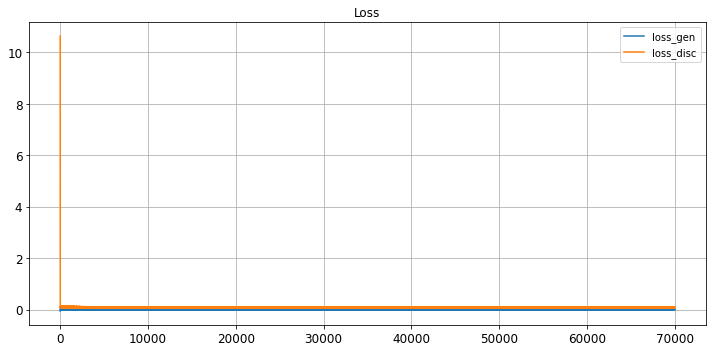

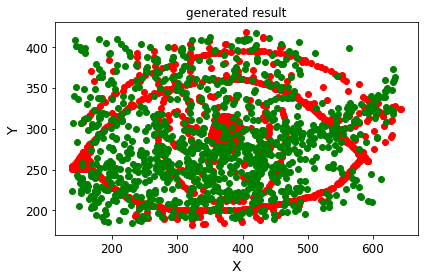

save the model & result
Epoch 70001/100000
critic: 0.070822 - generator: -0.001650 - 0s
Epoch 70002/100000
critic: 0.082000 - generator: -0.002034 - 0s
Epoch 70003/100000
critic: 0.092527 - generator: -0.003086 - 0s
Epoch 70004/100000
critic: 0.089276 - generator: -0.007694 - 0s
Epoch 70005/100000
critic: 0.075514 - generator: 0.006467 - 0s
Epoch 70006/100000
critic: 0.078522 - generator: 0.003830 - 0s
Epoch 70007/100000
critic: 0.073800 - generator: 0.004533 - 0s
Epoch 70008/100000
critic: 0.090206 - generator: -0.001430 - 0s
Epoch 70009/100000
critic: 0.074418 - generator: 0.002073 - 0s
Epoch 70010/100000
critic: 0.076632 - generator: 0.002268 - 0s
Epoch 70011/100000
critic: 0.094913 - generator: 0.002764 - 0s
Epoch 70012/100000
critic: 0.074456 - generator: 0.000987 - 0s
Epoch 70013/100000
critic: 0.080382 - generator: 0.000072 - 0s
Epoch 70014/100000
critic: 0.086911 - generator: -0.004300 - 0s
Epoch 70015/100000
critic: 0.078621 - generator: -0.003617 - 0s
Epoch 70016/100000
criti

critic: 0.092197 - generator: -0.002461 - 0s
Epoch 70131/100000
critic: 0.077761 - generator: -0.001284 - 0s
Epoch 70132/100000
critic: 0.092857 - generator: -0.005451 - 0s
Epoch 70133/100000
critic: 0.069721 - generator: 0.000144 - 0s
Epoch 70134/100000
critic: 0.072356 - generator: 0.004198 - 0s
Epoch 70135/100000
critic: 0.071121 - generator: 0.001162 - 0s
Epoch 70136/100000
critic: 0.084366 - generator: 0.000916 - 0s
Epoch 70137/100000
critic: 0.083331 - generator: 0.000497 - 0s
Epoch 70138/100000
critic: 0.084999 - generator: 0.003664 - 0s
Epoch 70139/100000
critic: 0.076824 - generator: 0.004726 - 0s
Epoch 70140/100000
critic: 0.082845 - generator: 0.000194 - 0s
Epoch 70141/100000
critic: 0.079162 - generator: -0.002516 - 0s
Epoch 70142/100000
critic: 0.070088 - generator: -0.002577 - 0s
Epoch 70143/100000
critic: 0.083774 - generator: -0.004161 - 0s
Epoch 70144/100000
critic: 0.081765 - generator: -0.006849 - 0s
Epoch 70145/100000
critic: 0.084665 - generator: -0.003732 - 0s
Epo

critic: 0.085922 - generator: 0.000727 - 0s
Epoch 70261/100000
critic: 0.085682 - generator: -0.000940 - 0s
Epoch 70262/100000
critic: 0.091805 - generator: -0.001816 - 0s
Epoch 70263/100000
critic: 0.068329 - generator: -0.006535 - 0s
Epoch 70264/100000
critic: 0.089109 - generator: -0.001036 - 0s
Epoch 70265/100000
critic: 0.078604 - generator: 0.001882 - 0s
Epoch 70266/100000
critic: 0.081878 - generator: 0.004036 - 0s
Epoch 70267/100000
critic: 0.083107 - generator: -0.000302 - 0s
Epoch 70268/100000
critic: 0.074601 - generator: -0.002868 - 0s
Epoch 70269/100000
critic: 0.076064 - generator: 0.000086 - 0s
Epoch 70270/100000
critic: 0.077735 - generator: -0.002782 - 0s
Epoch 70271/100000
critic: 0.085944 - generator: -0.000945 - 0s
Epoch 70272/100000
critic: 0.079583 - generator: -0.001205 - 0s
Epoch 70273/100000
critic: 0.087197 - generator: -0.000298 - 0s
Epoch 70274/100000
critic: 0.071844 - generator: -0.001355 - 0s
Epoch 70275/100000
critic: 0.084629 - generator: -0.001949 - 0s

critic: 0.073374 - generator: 0.001411 - 0s
Epoch 70391/100000
critic: 0.081091 - generator: -0.002315 - 0s
Epoch 70392/100000
critic: 0.083173 - generator: -0.001330 - 0s
Epoch 70393/100000
critic: 0.081323 - generator: 0.001089 - 0s
Epoch 70394/100000
critic: 0.081131 - generator: 0.001541 - 0s
Epoch 70395/100000
critic: 0.094067 - generator: 0.000127 - 0s
Epoch 70396/100000
critic: 0.085112 - generator: -0.001101 - 0s
Epoch 70397/100000
critic: 0.086219 - generator: -0.003826 - 0s
Epoch 70398/100000
critic: 0.077128 - generator: -0.002991 - 0s
Epoch 70399/100000
critic: 0.080946 - generator: -0.002032 - 0s
Epoch 70400/100000
critic: 0.088224 - generator: -0.002453 - 0s
Epoch 70401/100000
critic: 0.083055 - generator: -0.001625 - 0s
Epoch 70402/100000
critic: 0.077490 - generator: 0.002787 - 0s
Epoch 70403/100000
critic: 0.083624 - generator: 0.005017 - 0s
Epoch 70404/100000
critic: 0.082209 - generator: -0.000773 - 0s
Epoch 70405/100000
critic: 0.068611 - generator: 0.001515 - 0s
Ep

critic: 0.081601 - generator: 0.001606 - 0s
Epoch 70521/100000
critic: 0.067792 - generator: -0.001582 - 0s
Epoch 70522/100000
critic: 0.088758 - generator: 0.001646 - 0s
Epoch 70523/100000
critic: 0.089758 - generator: 0.001169 - 0s
Epoch 70524/100000
critic: 0.078420 - generator: -0.001210 - 0s
Epoch 70525/100000
critic: 0.079212 - generator: -0.004493 - 0s
Epoch 70526/100000
critic: 0.083945 - generator: -0.003271 - 0s
Epoch 70527/100000
critic: 0.081381 - generator: -0.000697 - 0s
Epoch 70528/100000
critic: 0.065684 - generator: -0.005535 - 0s
Epoch 70529/100000
critic: 0.076432 - generator: -0.004739 - 0s
Epoch 70530/100000
critic: 0.071790 - generator: 0.001401 - 0s
Epoch 70531/100000
critic: 0.072323 - generator: -0.003069 - 0s
Epoch 70532/100000
critic: 0.075319 - generator: 0.001585 - 0s
Epoch 70533/100000
critic: 0.084548 - generator: 0.002008 - 0s
Epoch 70534/100000
critic: 0.088837 - generator: -0.006529 - 0s
Epoch 70535/100000
critic: 0.083691 - generator: 0.000648 - 0s
Ep

critic: 0.074263 - generator: -0.000787 - 0s
Epoch 70651/100000
critic: 0.073759 - generator: 0.001965 - 0s
Epoch 70652/100000
critic: 0.091749 - generator: -0.000251 - 0s
Epoch 70653/100000
critic: 0.075312 - generator: -0.001158 - 0s
Epoch 70654/100000
critic: 0.083882 - generator: 0.000091 - 0s
Epoch 70655/100000
critic: 0.088183 - generator: -0.002273 - 0s
Epoch 70656/100000
critic: 0.075848 - generator: -0.004218 - 0s
Epoch 70657/100000
critic: 0.085944 - generator: -0.001470 - 0s
Epoch 70658/100000
critic: 0.078934 - generator: -0.000388 - 0s
Epoch 70659/100000
critic: 0.078783 - generator: 0.003988 - 0s
Epoch 70660/100000
critic: 0.081999 - generator: 0.001374 - 0s
Epoch 70661/100000
critic: 0.072906 - generator: 0.002821 - 0s
Epoch 70662/100000
critic: 0.086162 - generator: -0.000281 - 0s
Epoch 70663/100000
critic: 0.092129 - generator: -0.000044 - 0s
Epoch 70664/100000
critic: 0.085615 - generator: -0.000775 - 0s
Epoch 70665/100000
critic: 0.087481 - generator: -0.001100 - 0s


critic: 0.068354 - generator: -0.002133 - 0s
Epoch 70781/100000
critic: 0.077986 - generator: 0.002493 - 0s
Epoch 70782/100000
critic: 0.081706 - generator: 0.001783 - 0s
Epoch 70783/100000
critic: 0.080523 - generator: -0.001525 - 0s
Epoch 70784/100000
critic: 0.082176 - generator: -0.001010 - 0s
Epoch 70785/100000
critic: 0.074126 - generator: -0.004355 - 0s
Epoch 70786/100000
critic: 0.091873 - generator: -0.003055 - 0s
Epoch 70787/100000
critic: 0.087446 - generator: -0.000241 - 0s
Epoch 70788/100000
critic: 0.079965 - generator: 0.000304 - 0s
Epoch 70789/100000
critic: 0.085491 - generator: 0.002425 - 0s
Epoch 70790/100000
critic: 0.085920 - generator: 0.001510 - 0s
Epoch 70791/100000
critic: 0.085296 - generator: 0.000909 - 0s
Epoch 70792/100000
critic: 0.075793 - generator: 0.001560 - 0s
Epoch 70793/100000
critic: 0.086096 - generator: 0.001435 - 0s
Epoch 70794/100000
critic: 0.078005 - generator: 0.001481 - 0s
Epoch 70795/100000
critic: 0.084081 - generator: 0.002813 - 0s
Epoch

critic: 0.092169 - generator: 0.000894 - 0s
Epoch 70911/100000
critic: 0.071432 - generator: -0.002025 - 0s
Epoch 70912/100000
critic: 0.071745 - generator: 0.007275 - 0s
Epoch 70913/100000
critic: 0.076336 - generator: -0.001107 - 0s
Epoch 70914/100000
critic: 0.088059 - generator: -0.002115 - 0s
Epoch 70915/100000
critic: 0.088337 - generator: 0.000005 - 0s
Epoch 70916/100000
critic: 0.090780 - generator: -0.002632 - 0s
Epoch 70917/100000
critic: 0.079008 - generator: -0.000730 - 0s
Epoch 70918/100000
critic: 0.072592 - generator: -0.001208 - 0s
Epoch 70919/100000
critic: 0.083796 - generator: -0.002985 - 0s
Epoch 70920/100000
critic: 0.082452 - generator: -0.002033 - 0s
Epoch 70921/100000
critic: 0.082016 - generator: -0.004343 - 0s
Epoch 70922/100000
critic: 0.074151 - generator: -0.001539 - 0s
Epoch 70923/100000
critic: 0.081270 - generator: 0.004846 - 0s
Epoch 70924/100000
critic: 0.082436 - generator: 0.007361 - 0s
Epoch 70925/100000
critic: 0.084627 - generator: -0.002088 - 0s


critic: 0.067901 - generator: 0.000271 - 0s
Epoch 71041/100000
critic: 0.083309 - generator: 0.006622 - 0s
Epoch 71042/100000
critic: 0.062774 - generator: 0.000660 - 0s
Epoch 71043/100000
critic: 0.092757 - generator: -0.003936 - 0s
Epoch 71044/100000
critic: 0.086588 - generator: -0.002006 - 0s
Epoch 71045/100000
critic: 0.095165 - generator: 0.002028 - 0s
Epoch 71046/100000
critic: 0.081869 - generator: -0.001193 - 0s
Epoch 71047/100000
critic: 0.078470 - generator: -0.001986 - 0s
Epoch 71048/100000
critic: 0.075447 - generator: 0.004656 - 0s
Epoch 71049/100000
critic: 0.076681 - generator: -0.001294 - 0s
Epoch 71050/100000
critic: 0.081957 - generator: -0.002774 - 0s
Epoch 71051/100000
critic: 0.083771 - generator: -0.001576 - 0s
Epoch 71052/100000
critic: 0.077156 - generator: -0.001154 - 0s
Epoch 71053/100000
critic: 0.078122 - generator: -0.004654 - 0s
Epoch 71054/100000
critic: 0.080595 - generator: -0.002239 - 0s
Epoch 71055/100000
critic: 0.083338 - generator: 0.002218 - 0s
E

critic: 0.080318 - generator: -0.004943 - 0s
Epoch 71171/100000
critic: 0.086525 - generator: -0.003329 - 0s
Epoch 71172/100000
critic: 0.088720 - generator: 0.001342 - 0s
Epoch 71173/100000
critic: 0.082969 - generator: 0.001581 - 0s
Epoch 71174/100000
critic: 0.073709 - generator: -0.001252 - 0s
Epoch 71175/100000
critic: 0.077593 - generator: 0.001154 - 0s
Epoch 71176/100000
critic: 0.070422 - generator: 0.004383 - 0s
Epoch 71177/100000
critic: 0.084316 - generator: 0.001095 - 0s
Epoch 71178/100000
critic: 0.072610 - generator: 0.001422 - 0s
Epoch 71179/100000
critic: 0.076860 - generator: 0.001291 - 0s
Epoch 71180/100000
critic: 0.083660 - generator: -0.002888 - 0s
Epoch 71181/100000
critic: 0.089095 - generator: -0.002005 - 0s
Epoch 71182/100000
critic: 0.088420 - generator: 0.002967 - 0s
Epoch 71183/100000
critic: 0.075491 - generator: 0.002454 - 0s
Epoch 71184/100000
critic: 0.084071 - generator: -0.002592 - 0s
Epoch 71185/100000
critic: 0.074071 - generator: -0.002385 - 0s
Epoc

critic: 0.067114 - generator: 0.000732 - 0s
Epoch 71301/100000
critic: 0.080741 - generator: -0.007803 - 0s
Epoch 71302/100000
critic: 0.071738 - generator: 0.000264 - 0s
Epoch 71303/100000
critic: 0.083511 - generator: 0.000621 - 0s
Epoch 71304/100000
critic: 0.077194 - generator: -0.003526 - 0s
Epoch 71305/100000
critic: 0.081679 - generator: 0.003164 - 0s
Epoch 71306/100000
critic: 0.088955 - generator: -0.001081 - 0s
Epoch 71307/100000
critic: 0.069043 - generator: -0.001379 - 0s
Epoch 71308/100000
critic: 0.071159 - generator: 0.001526 - 0s
Epoch 71309/100000
critic: 0.079005 - generator: 0.003500 - 0s
Epoch 71310/100000
critic: 0.077827 - generator: 0.001578 - 0s
Epoch 71311/100000
critic: 0.086109 - generator: 0.003414 - 0s
Epoch 71312/100000
critic: 0.085742 - generator: 0.004074 - 0s
Epoch 71313/100000
critic: 0.077179 - generator: -0.000081 - 0s
Epoch 71314/100000
critic: 0.091640 - generator: 0.000217 - 0s
Epoch 71315/100000
critic: 0.075878 - generator: 0.000085 - 0s
Epoch 

critic: 0.082603 - generator: 0.004476 - 0s
Epoch 71431/100000
critic: 0.076029 - generator: 0.002463 - 0s
Epoch 71432/100000
critic: 0.078871 - generator: 0.001203 - 0s
Epoch 71433/100000
critic: 0.080492 - generator: 0.000659 - 0s
Epoch 71434/100000
critic: 0.085620 - generator: 0.003950 - 0s
Epoch 71435/100000
critic: 0.069368 - generator: 0.002098 - 0s
Epoch 71436/100000
critic: 0.095758 - generator: -0.001981 - 0s
Epoch 71437/100000
critic: 0.082351 - generator: -0.001149 - 0s
Epoch 71438/100000
critic: 0.079006 - generator: 0.001436 - 0s
Epoch 71439/100000
critic: 0.069264 - generator: -0.002625 - 0s
Epoch 71440/100000
critic: 0.087575 - generator: -0.004440 - 0s
Epoch 71441/100000
critic: 0.090105 - generator: -0.002595 - 0s
Epoch 71442/100000
critic: 0.087167 - generator: 0.002460 - 0s
Epoch 71443/100000
critic: 0.085680 - generator: -0.003277 - 0s
Epoch 71444/100000
critic: 0.075501 - generator: -0.000623 - 0s
Epoch 71445/100000
critic: 0.085215 - generator: 0.002114 - 0s
Epoc

critic: 0.082426 - generator: 0.000756 - 0s
Epoch 71562/100000
critic: 0.086933 - generator: 0.003599 - 0s
Epoch 71563/100000
critic: 0.080532 - generator: 0.002877 - 0s
Epoch 71564/100000
critic: 0.070435 - generator: 0.003552 - 0s
Epoch 71565/100000
critic: 0.088573 - generator: 0.003677 - 0s
Epoch 71566/100000
critic: 0.079492 - generator: 0.000677 - 0s
Epoch 71567/100000
critic: 0.081265 - generator: -0.000420 - 0s
Epoch 71568/100000
critic: 0.066832 - generator: -0.001700 - 0s
Epoch 71569/100000
critic: 0.078873 - generator: -0.003146 - 0s
Epoch 71570/100000
critic: 0.081716 - generator: 0.000994 - 0s
Epoch 71571/100000
critic: 0.062895 - generator: 0.001732 - 0s
Epoch 71572/100000
critic: 0.077913 - generator: 0.001989 - 0s
Epoch 71573/100000
critic: 0.093166 - generator: -0.002461 - 0s
Epoch 71574/100000
critic: 0.080243 - generator: -0.003543 - 0s
Epoch 71575/100000
critic: 0.084652 - generator: -0.002625 - 0s
Epoch 71576/100000
critic: 0.084076 - generator: 0.000154 - 0s
Epoch

critic: 0.079660 - generator: -0.002810 - 0s
Epoch 71692/100000
critic: 0.073650 - generator: -0.000886 - 0s
Epoch 71693/100000
critic: 0.082406 - generator: 0.003246 - 0s
Epoch 71694/100000
critic: 0.077147 - generator: 0.004399 - 0s
Epoch 71695/100000
critic: 0.092306 - generator: -0.000641 - 0s
Epoch 71696/100000
critic: 0.073210 - generator: -0.002394 - 0s
Epoch 71697/100000
critic: 0.095500 - generator: 0.001062 - 0s
Epoch 71698/100000
critic: 0.087884 - generator: -0.001285 - 0s
Epoch 71699/100000
critic: 0.084097 - generator: 0.002115 - 0s
Epoch 71700/100000
critic: 0.084149 - generator: 0.001064 - 0s
Epoch 71701/100000
critic: 0.090151 - generator: -0.001558 - 0s
Epoch 71702/100000
critic: 0.077600 - generator: -0.002823 - 0s
Epoch 71703/100000
critic: 0.076744 - generator: 0.003256 - 0s
Epoch 71704/100000
critic: 0.084871 - generator: 0.005160 - 0s
Epoch 71705/100000
critic: 0.074923 - generator: -0.002404 - 0s
Epoch 71706/100000
critic: 0.078839 - generator: -0.007256 - 0s
Ep

critic: 0.082769 - generator: -0.003922 - 0s
Epoch 71822/100000
critic: 0.075261 - generator: 0.001118 - 0s
Epoch 71823/100000
critic: 0.075176 - generator: -0.003142 - 0s
Epoch 71824/100000
critic: 0.087951 - generator: -0.000038 - 0s
Epoch 71825/100000
critic: 0.076420 - generator: -0.004902 - 0s
Epoch 71826/100000
critic: 0.084402 - generator: -0.006130 - 0s
Epoch 71827/100000
critic: 0.085250 - generator: -0.003363 - 0s
Epoch 71828/100000
critic: 0.074135 - generator: -0.006467 - 0s
Epoch 71829/100000
critic: 0.078773 - generator: -0.002647 - 0s
Epoch 71830/100000
critic: 0.078979 - generator: -0.001628 - 0s
Epoch 71831/100000
critic: 0.085792 - generator: 0.001182 - 0s
Epoch 71832/100000
critic: 0.075862 - generator: 0.001876 - 0s
Epoch 71833/100000
critic: 0.082228 - generator: 0.000880 - 0s
Epoch 71834/100000
critic: 0.065505 - generator: 0.001308 - 0s
Epoch 71835/100000
critic: 0.083961 - generator: 0.002146 - 0s
Epoch 71836/100000
critic: 0.069016 - generator: -0.002720 - 0s
E

critic: 0.072892 - generator: 0.000914 - 0s
Epoch 71952/100000
critic: 0.083688 - generator: 0.000072 - 0s
Epoch 71953/100000
critic: 0.076865 - generator: 0.000172 - 0s
Epoch 71954/100000
critic: 0.072766 - generator: -0.002570 - 0s
Epoch 71955/100000
critic: 0.082626 - generator: 0.003597 - 0s
Epoch 71956/100000
critic: 0.082674 - generator: -0.000313 - 0s
Epoch 71957/100000
critic: 0.088324 - generator: -0.001827 - 0s
Epoch 71958/100000
critic: 0.078462 - generator: -0.004197 - 0s
Epoch 71959/100000
critic: 0.085614 - generator: -0.001087 - 0s
Epoch 71960/100000
critic: 0.080979 - generator: -0.003018 - 0s
Epoch 71961/100000
critic: 0.090837 - generator: -0.001078 - 0s
Epoch 71962/100000
critic: 0.074219 - generator: -0.001602 - 0s
Epoch 71963/100000
critic: 0.093695 - generator: 0.001019 - 0s
Epoch 71964/100000
critic: 0.086018 - generator: -0.000305 - 0s
Epoch 71965/100000
critic: 0.086268 - generator: 0.002060 - 0s
Epoch 71966/100000
critic: 0.071887 - generator: 0.001653 - 0s
Ep

critic: 0.072846 - generator: -0.001087 - 0s
Epoch 72082/100000
critic: 0.079777 - generator: -0.001970 - 0s
Epoch 72083/100000
critic: 0.081379 - generator: 0.001215 - 0s
Epoch 72084/100000
critic: 0.078524 - generator: -0.003191 - 0s
Epoch 72085/100000
critic: 0.079989 - generator: -0.002044 - 0s
Epoch 72086/100000
critic: 0.069033 - generator: 0.004651 - 0s
Epoch 72087/100000
critic: 0.083572 - generator: 0.001338 - 0s
Epoch 72088/100000
critic: 0.077697 - generator: -0.001884 - 0s
Epoch 72089/100000
critic: 0.077088 - generator: 0.001719 - 0s
Epoch 72090/100000
critic: 0.092470 - generator: 0.000477 - 0s
Epoch 72091/100000
critic: 0.081675 - generator: 0.002564 - 0s
Epoch 72092/100000
critic: 0.085223 - generator: 0.002963 - 0s
Epoch 72093/100000
critic: 0.080627 - generator: 0.002671 - 0s
Epoch 72094/100000
critic: 0.066658 - generator: -0.000052 - 0s
Epoch 72095/100000
critic: 0.083015 - generator: 0.000860 - 0s
Epoch 72096/100000
critic: 0.081890 - generator: 0.000423 - 0s
Epoch

critic: 0.080592 - generator: 0.002592 - 0s
Epoch 72213/100000
critic: 0.068844 - generator: 0.006824 - 0s
Epoch 72214/100000
critic: 0.088713 - generator: 0.001582 - 0s
Epoch 72215/100000
critic: 0.087960 - generator: -0.000898 - 0s
Epoch 72216/100000
critic: 0.081007 - generator: -0.000939 - 0s
Epoch 72217/100000
critic: 0.074910 - generator: 0.002105 - 0s
Epoch 72218/100000
critic: 0.075007 - generator: -0.005308 - 0s
Epoch 72219/100000
critic: 0.079591 - generator: -0.007494 - 0s
Epoch 72220/100000
critic: 0.078244 - generator: -0.002011 - 0s
Epoch 72221/100000
critic: 0.080559 - generator: 0.001943 - 0s
Epoch 72222/100000
critic: 0.083323 - generator: -0.002086 - 0s
Epoch 72223/100000
critic: 0.082571 - generator: 0.002311 - 0s
Epoch 72224/100000
critic: 0.081121 - generator: -0.000351 - 0s
Epoch 72225/100000
critic: 0.073731 - generator: -0.000148 - 0s
Epoch 72226/100000
critic: 0.084580 - generator: -0.002117 - 0s
Epoch 72227/100000
critic: 0.078161 - generator: 0.000521 - 0s
Ep

critic: 0.076267 - generator: -0.003730 - 0s
Epoch 72342/100000
critic: 0.079416 - generator: -0.000746 - 0s
Epoch 72343/100000
critic: 0.086521 - generator: -0.004856 - 0s
Epoch 72344/100000
critic: 0.075859 - generator: -0.001368 - 0s
Epoch 72345/100000
critic: 0.084092 - generator: -0.000843 - 0s
Epoch 72346/100000
critic: 0.082385 - generator: -0.002299 - 0s
Epoch 72347/100000
critic: 0.077684 - generator: 0.000216 - 0s
Epoch 72348/100000
critic: 0.074775 - generator: -0.001079 - 0s
Epoch 72349/100000
critic: 0.088104 - generator: -0.002639 - 0s
Epoch 72350/100000
critic: 0.090128 - generator: 0.002491 - 0s
Epoch 72351/100000
critic: 0.077218 - generator: 0.002750 - 0s
Epoch 72352/100000
critic: 0.079000 - generator: 0.001224 - 0s
Epoch 72353/100000
critic: 0.072241 - generator: 0.000680 - 0s
Epoch 72354/100000
critic: 0.092527 - generator: 0.000695 - 0s
Epoch 72355/100000
critic: 0.081173 - generator: -0.001446 - 0s
Epoch 72356/100000
critic: 0.085665 - generator: 0.002654 - 0s
Ep

critic: 0.076614 - generator: -0.001356 - 0s
Epoch 72473/100000
critic: 0.085465 - generator: -0.001678 - 0s
Epoch 72474/100000
critic: 0.076114 - generator: -0.000729 - 0s
Epoch 72475/100000
critic: 0.086510 - generator: 0.001293 - 0s
Epoch 72476/100000
critic: 0.078178 - generator: 0.000273 - 0s
Epoch 72477/100000
critic: 0.071292 - generator: -0.000071 - 0s
Epoch 72478/100000
critic: 0.081258 - generator: 0.003480 - 0s
Epoch 72479/100000
critic: 0.080418 - generator: 0.001610 - 0s
Epoch 72480/100000
critic: 0.081793 - generator: -0.002426 - 0s
Epoch 72481/100000
critic: 0.085580 - generator: -0.000672 - 0s
Epoch 72482/100000
critic: 0.077857 - generator: 0.000947 - 0s
Epoch 72483/100000
critic: 0.087891 - generator: 0.003872 - 0s
Epoch 72484/100000
critic: 0.083967 - generator: 0.000260 - 0s
Epoch 72485/100000
critic: 0.080382 - generator: 0.000146 - 0s
Epoch 72486/100000
critic: 0.077122 - generator: -0.000567 - 0s
Epoch 72487/100000
critic: 0.085500 - generator: -0.000672 - 0s
Epo

critic: 0.072131 - generator: 0.002552 - 0s
Epoch 72603/100000
critic: 0.076607 - generator: 0.003302 - 0s
Epoch 72604/100000
critic: 0.091468 - generator: -0.004363 - 0s
Epoch 72605/100000
critic: 0.080627 - generator: -0.001125 - 0s
Epoch 72606/100000
critic: 0.076070 - generator: -0.001863 - 0s
Epoch 72607/100000
critic: 0.078044 - generator: 0.001735 - 0s
Epoch 72608/100000
critic: 0.081596 - generator: -0.000434 - 0s
Epoch 72609/100000
critic: 0.075001 - generator: 0.001390 - 0s
Epoch 72610/100000
critic: 0.079115 - generator: 0.002230 - 0s
Epoch 72611/100000
critic: 0.079862 - generator: 0.000712 - 0s
Epoch 72612/100000
critic: 0.081424 - generator: 0.000634 - 0s
Epoch 72613/100000
critic: 0.086128 - generator: 0.000169 - 0s
Epoch 72614/100000
critic: 0.081244 - generator: -0.001406 - 0s
Epoch 72615/100000
critic: 0.087488 - generator: 0.000617 - 0s
Epoch 72616/100000
critic: 0.086610 - generator: 0.000378 - 0s
Epoch 72617/100000
critic: 0.080004 - generator: 0.002681 - 0s
Epoch 

critic: 0.080071 - generator: 0.000203 - 0s
Epoch 72733/100000
critic: 0.056438 - generator: 0.001687 - 0s
Epoch 72734/100000
critic: 0.090359 - generator: 0.000329 - 0s
Epoch 72735/100000
critic: 0.072788 - generator: 0.001829 - 0s
Epoch 72736/100000
critic: 0.088224 - generator: 0.000819 - 0s
Epoch 72737/100000
critic: 0.090844 - generator: 0.002690 - 0s
Epoch 72738/100000
critic: 0.080562 - generator: -0.002967 - 0s
Epoch 72739/100000
critic: 0.078916 - generator: -0.000355 - 0s
Epoch 72740/100000
critic: 0.085014 - generator: 0.002574 - 0s
Epoch 72741/100000
critic: 0.082322 - generator: -0.002587 - 0s
Epoch 72742/100000
critic: 0.086007 - generator: -0.001161 - 0s
Epoch 72743/100000
critic: 0.091608 - generator: 0.001609 - 0s
Epoch 72744/100000
critic: 0.078937 - generator: -0.000257 - 0s
Epoch 72745/100000
critic: 0.075651 - generator: 0.000185 - 0s
Epoch 72746/100000
critic: 0.076326 - generator: 0.000903 - 0s
Epoch 72747/100000
critic: 0.083688 - generator: -0.000697 - 0s
Epoch

critic: 0.072130 - generator: -0.007314 - 0s
Epoch 72863/100000
critic: 0.083356 - generator: 0.001822 - 0s
Epoch 72864/100000
critic: 0.081521 - generator: 0.002077 - 0s
Epoch 72865/100000
critic: 0.084139 - generator: -0.001582 - 0s
Epoch 72866/100000
critic: 0.070905 - generator: 0.003491 - 0s
Epoch 72867/100000
critic: 0.087943 - generator: 0.001216 - 0s
Epoch 72868/100000
critic: 0.076864 - generator: 0.002049 - 0s
Epoch 72869/100000
critic: 0.075502 - generator: -0.000734 - 0s
Epoch 72870/100000
critic: 0.078863 - generator: -0.001351 - 0s
Epoch 72871/100000
critic: 0.074744 - generator: 0.001508 - 0s
Epoch 72872/100000
critic: 0.082577 - generator: -0.002275 - 0s
Epoch 72873/100000
critic: 0.076830 - generator: -0.002383 - 0s
Epoch 72874/100000
critic: 0.080062 - generator: -0.002004 - 0s
Epoch 72875/100000
critic: 0.077748 - generator: -0.002363 - 0s
Epoch 72876/100000
critic: 0.081622 - generator: 0.001843 - 0s
Epoch 72877/100000
critic: 0.086750 - generator: -0.001876 - 0s
Ep

critic: 0.082278 - generator: 0.003098 - 0s
Epoch 72993/100000
critic: 0.081096 - generator: -0.000625 - 0s
Epoch 72994/100000
critic: 0.077500 - generator: -0.003671 - 0s
Epoch 72995/100000
critic: 0.091868 - generator: -0.000569 - 0s
Epoch 72996/100000
critic: 0.079946 - generator: 0.003364 - 0s
Epoch 72997/100000
critic: 0.088238 - generator: 0.002302 - 0s
Epoch 72998/100000
critic: 0.083741 - generator: 0.003174 - 0s
Epoch 72999/100000
critic: 0.072781 - generator: -0.001431 - 0s
Epoch 73000/100000
critic: 0.086500 - generator: -0.002339 - 0s
Epoch 73001/100000
critic: 0.081643 - generator: -0.001264 - 0s
Epoch 73002/100000
critic: 0.076078 - generator: -0.005692 - 0s
Epoch 73003/100000
critic: 0.066672 - generator: -0.004314 - 0s
Epoch 73004/100000
critic: 0.083494 - generator: -0.002103 - 0s
Epoch 73005/100000
critic: 0.081986 - generator: -0.002742 - 0s
Epoch 73006/100000
critic: 0.074774 - generator: 0.002682 - 0s
Epoch 73007/100000
critic: 0.073727 - generator: 0.000845 - 0s
E

critic: 0.087149 - generator: -0.001166 - 0s
Epoch 73122/100000
critic: 0.075018 - generator: -0.002730 - 0s
Epoch 73123/100000
critic: 0.085444 - generator: 0.000692 - 0s
Epoch 73124/100000
critic: 0.079064 - generator: 0.003256 - 0s
Epoch 73125/100000
critic: 0.079811 - generator: 0.003161 - 0s
Epoch 73126/100000
critic: 0.072299 - generator: -0.001213 - 0s
Epoch 73127/100000
critic: 0.075827 - generator: -0.000458 - 0s
Epoch 73128/100000
critic: 0.082098 - generator: -0.004028 - 0s
Epoch 73129/100000
critic: 0.081708 - generator: -0.001941 - 0s
Epoch 73130/100000
critic: 0.073110 - generator: 0.000946 - 0s
Epoch 73131/100000
critic: 0.087311 - generator: 0.003923 - 0s
Epoch 73132/100000
critic: 0.087661 - generator: -0.000675 - 0s
Epoch 73133/100000
critic: 0.087020 - generator: 0.001937 - 0s
Epoch 73134/100000
critic: 0.076423 - generator: -0.002276 - 0s
Epoch 73135/100000
critic: 0.085410 - generator: -0.002107 - 0s
Epoch 73136/100000
critic: 0.072231 - generator: 0.000041 - 0s
Ep

critic: 0.080280 - generator: -0.002408 - 0s
Epoch 73253/100000
critic: 0.080832 - generator: -0.000006 - 0s
Epoch 73254/100000
critic: 0.078205 - generator: 0.000598 - 0s
Epoch 73255/100000
critic: 0.082790 - generator: 0.003964 - 0s
Epoch 73256/100000
critic: 0.086484 - generator: 0.004578 - 0s
Epoch 73257/100000
critic: 0.074643 - generator: 0.000212 - 0s
Epoch 73258/100000
critic: 0.081923 - generator: 0.001368 - 0s
Epoch 73259/100000
critic: 0.071576 - generator: 0.000691 - 0s
Epoch 73260/100000
critic: 0.084629 - generator: -0.000189 - 0s
Epoch 73261/100000
critic: 0.086131 - generator: -0.003378 - 0s
Epoch 73262/100000
critic: 0.077005 - generator: 0.002855 - 0s
Epoch 73263/100000
critic: 0.089000 - generator: -0.000629 - 0s
Epoch 73264/100000
critic: 0.083151 - generator: -0.000567 - 0s
Epoch 73265/100000
critic: 0.068383 - generator: -0.000422 - 0s
Epoch 73266/100000
critic: 0.078873 - generator: -0.002508 - 0s
Epoch 73267/100000
critic: 0.070766 - generator: -0.002321 - 0s
Ep

critic: 0.087386 - generator: -0.006964 - 0s
Epoch 73383/100000
critic: 0.080171 - generator: -0.000735 - 0s
Epoch 73384/100000
critic: 0.073802 - generator: 0.001485 - 0s
Epoch 73385/100000
critic: 0.073996 - generator: -0.006027 - 0s
Epoch 73386/100000
critic: 0.087175 - generator: -0.004438 - 0s
Epoch 73387/100000
critic: 0.082563 - generator: -0.006296 - 0s
Epoch 73388/100000
critic: 0.078609 - generator: -0.005929 - 0s
Epoch 73389/100000
critic: 0.082036 - generator: 0.004322 - 0s
Epoch 73390/100000
critic: 0.082520 - generator: 0.001463 - 0s
Epoch 73391/100000
critic: 0.075218 - generator: -0.002010 - 0s
Epoch 73392/100000
critic: 0.071428 - generator: 0.000285 - 0s
Epoch 73393/100000
critic: 0.076267 - generator: 0.001420 - 0s
Epoch 73394/100000
critic: 0.081940 - generator: 0.000159 - 0s
Epoch 73395/100000
critic: 0.080809 - generator: 0.000248 - 0s
Epoch 73396/100000
critic: 0.090779 - generator: -0.000785 - 0s
Epoch 73397/100000
critic: 0.081288 - generator: -0.003504 - 0s
Ep

critic: 0.076502 - generator: 0.000011 - 0s
Epoch 73513/100000
critic: 0.074676 - generator: -0.002316 - 0s
Epoch 73514/100000
critic: 0.088417 - generator: -0.002934 - 0s
Epoch 73515/100000
critic: 0.078562 - generator: -0.002430 - 0s
Epoch 73516/100000
critic: 0.072402 - generator: -0.003484 - 0s
Epoch 73517/100000
critic: 0.084920 - generator: -0.000475 - 0s
Epoch 73518/100000
critic: 0.085637 - generator: -0.000762 - 0s
Epoch 73519/100000
critic: 0.096896 - generator: -0.001557 - 0s
Epoch 73520/100000
critic: 0.081026 - generator: -0.004077 - 0s
Epoch 73521/100000
critic: 0.080863 - generator: 0.003606 - 0s
Epoch 73522/100000
critic: 0.087367 - generator: 0.005674 - 0s
Epoch 73523/100000
critic: 0.085853 - generator: 0.006001 - 0s
Epoch 73524/100000
critic: 0.068743 - generator: 0.000643 - 0s
Epoch 73525/100000
critic: 0.084877 - generator: 0.002153 - 0s
Epoch 73526/100000
critic: 0.082758 - generator: -0.002339 - 0s
Epoch 73527/100000
critic: 0.073029 - generator: 0.001261 - 0s
Ep

critic: 0.093105 - generator: 0.003999 - 0s
Epoch 73643/100000
critic: 0.080602 - generator: -0.000730 - 0s
Epoch 73644/100000
critic: 0.096147 - generator: -0.005956 - 0s
Epoch 73645/100000
critic: 0.079877 - generator: -0.005770 - 0s
Epoch 73646/100000
critic: 0.083288 - generator: -0.000380 - 0s
Epoch 73647/100000
critic: 0.080042 - generator: -0.000029 - 0s
Epoch 73648/100000
critic: 0.086249 - generator: -0.001955 - 0s
Epoch 73649/100000
critic: 0.073053 - generator: -0.002737 - 0s
Epoch 73650/100000
critic: 0.082514 - generator: 0.003898 - 0s
Epoch 73651/100000
critic: 0.077138 - generator: -0.000172 - 0s
Epoch 73652/100000
critic: 0.079574 - generator: 0.004642 - 0s
Epoch 73653/100000
critic: 0.097680 - generator: -0.001926 - 0s
Epoch 73654/100000
critic: 0.079863 - generator: 0.000812 - 0s
Epoch 73655/100000
critic: 0.071351 - generator: -0.000443 - 0s
Epoch 73656/100000
critic: 0.081053 - generator: -0.008332 - 0s
Epoch 73657/100000
critic: 0.080589 - generator: -0.000948 - 0s

critic: 0.074805 - generator: -0.002714 - 0s
Epoch 73773/100000
critic: 0.073906 - generator: 0.000812 - 0s
Epoch 73774/100000
critic: 0.082762 - generator: -0.002555 - 0s
Epoch 73775/100000
critic: 0.077186 - generator: -0.000682 - 0s
Epoch 73776/100000
critic: 0.071113 - generator: -0.005834 - 0s
Epoch 73777/100000
critic: 0.084928 - generator: -0.002047 - 0s
Epoch 73778/100000
critic: 0.081998 - generator: -0.000064 - 0s
Epoch 73779/100000
critic: 0.091685 - generator: 0.002605 - 0s
Epoch 73780/100000
critic: 0.076231 - generator: 0.002805 - 0s
Epoch 73781/100000
critic: 0.081648 - generator: 0.001929 - 0s
Epoch 73782/100000
critic: 0.084202 - generator: 0.000073 - 0s
Epoch 73783/100000
critic: 0.087148 - generator: 0.000157 - 0s
Epoch 73784/100000
critic: 0.081079 - generator: 0.003497 - 0s
Epoch 73785/100000
critic: 0.074737 - generator: -0.001465 - 0s
Epoch 73786/100000
critic: 0.079790 - generator: 0.000481 - 0s
Epoch 73787/100000
critic: 0.077920 - generator: -0.004130 - 0s
Epo

critic: 0.088121 - generator: -0.001025 - 0s
Epoch 73903/100000
critic: 0.093282 - generator: -0.002866 - 0s
Epoch 73904/100000
critic: 0.084513 - generator: 0.004113 - 0s
Epoch 73905/100000
critic: 0.077604 - generator: -0.002570 - 0s
Epoch 73906/100000
critic: 0.083171 - generator: 0.002250 - 0s
Epoch 73907/100000
critic: 0.077854 - generator: 0.003890 - 0s
Epoch 73908/100000
critic: 0.085962 - generator: -0.000937 - 0s
Epoch 73909/100000
critic: 0.078556 - generator: -0.000970 - 0s
Epoch 73910/100000
critic: 0.088717 - generator: -0.005077 - 0s
Epoch 73911/100000
critic: 0.083816 - generator: -0.004050 - 0s
Epoch 73912/100000
critic: 0.085505 - generator: -0.000486 - 0s
Epoch 73913/100000
critic: 0.082456 - generator: -0.004343 - 0s
Epoch 73914/100000
critic: 0.082837 - generator: -0.003616 - 0s
Epoch 73915/100000
critic: 0.083231 - generator: 0.001766 - 0s
Epoch 73916/100000
critic: 0.076181 - generator: 0.002748 - 0s
Epoch 73917/100000
critic: 0.078249 - generator: 0.002134 - 0s
E

critic: 0.077799 - generator: -0.002070 - 0s
Epoch 74033/100000
critic: 0.080462 - generator: 0.000454 - 0s
Epoch 74034/100000
critic: 0.088617 - generator: -0.001331 - 0s
Epoch 74035/100000
critic: 0.076615 - generator: -0.000616 - 0s
Epoch 74036/100000
critic: 0.080322 - generator: 0.004568 - 0s
Epoch 74037/100000
critic: 0.084250 - generator: 0.003849 - 0s
Epoch 74038/100000
critic: 0.071465 - generator: 0.000744 - 0s
Epoch 74039/100000
critic: 0.076753 - generator: -0.001375 - 0s
Epoch 74040/100000
critic: 0.091430 - generator: 0.004351 - 0s
Epoch 74041/100000
critic: 0.085042 - generator: 0.000705 - 0s
Epoch 74042/100000
critic: 0.077943 - generator: -0.001237 - 0s
Epoch 74043/100000
critic: 0.087706 - generator: -0.001082 - 0s
Epoch 74044/100000
critic: 0.083802 - generator: 0.002844 - 0s
Epoch 74045/100000
critic: 0.074148 - generator: -0.002784 - 0s
Epoch 74046/100000
critic: 0.084912 - generator: -0.002797 - 0s
Epoch 74047/100000
critic: 0.074898 - generator: 0.001028 - 0s
Epo

critic: 0.083586 - generator: 0.000995 - 0s
Epoch 74163/100000
critic: 0.072365 - generator: -0.001571 - 0s
Epoch 74164/100000
critic: 0.090811 - generator: 0.000175 - 0s
Epoch 74165/100000
critic: 0.086172 - generator: -0.000326 - 0s
Epoch 74166/100000
critic: 0.077506 - generator: -0.000200 - 0s
Epoch 74167/100000
critic: 0.079227 - generator: -0.002187 - 0s
Epoch 74168/100000
critic: 0.083908 - generator: -0.002564 - 0s
Epoch 74169/100000
critic: 0.082450 - generator: -0.000801 - 0s
Epoch 74170/100000
critic: 0.075665 - generator: 0.000438 - 0s
Epoch 74171/100000
critic: 0.079264 - generator: 0.002609 - 0s
Epoch 74172/100000
critic: 0.083689 - generator: 0.001090 - 0s
Epoch 74173/100000
critic: 0.078745 - generator: -0.001613 - 0s
Epoch 74174/100000
critic: 0.067941 - generator: -0.001789 - 0s
Epoch 74175/100000
critic: 0.092413 - generator: -0.003281 - 0s
Epoch 74176/100000
critic: 0.067242 - generator: 0.003243 - 0s
Epoch 74177/100000
critic: 0.082618 - generator: 0.006939 - 0s
Ep

critic: 0.088838 - generator: 0.006637 - 0s
Epoch 74293/100000
critic: 0.073352 - generator: 0.006063 - 0s
Epoch 74294/100000
critic: 0.072632 - generator: -0.001041 - 0s
Epoch 74295/100000
critic: 0.079145 - generator: 0.004579 - 0s
Epoch 74296/100000
critic: 0.093255 - generator: 0.007105 - 0s
Epoch 74297/100000
critic: 0.074535 - generator: 0.003701 - 0s
Epoch 74298/100000
critic: 0.081191 - generator: 0.001074 - 0s
Epoch 74299/100000
critic: 0.061561 - generator: 0.004274 - 0s
Epoch 74300/100000
critic: 0.089708 - generator: 0.002153 - 0s
Epoch 74301/100000
critic: 0.081494 - generator: 0.001327 - 0s
Epoch 74302/100000
critic: 0.071897 - generator: 0.001449 - 0s
Epoch 74303/100000
critic: 0.080927 - generator: 0.000452 - 0s
Epoch 74304/100000
critic: 0.083932 - generator: -0.002180 - 0s
Epoch 74305/100000
critic: 0.074513 - generator: 0.000015 - 0s
Epoch 74306/100000
critic: 0.080545 - generator: 0.004975 - 0s
Epoch 74307/100000
critic: 0.093632 - generator: 0.004421 - 0s
Epoch 743

critic: 0.098334 - generator: -0.000788 - 0s
Epoch 74423/100000
critic: 0.084900 - generator: -0.002315 - 0s
Epoch 74424/100000
critic: 0.071046 - generator: -0.002537 - 0s
Epoch 74425/100000
critic: 0.075605 - generator: -0.002868 - 0s
Epoch 74426/100000
critic: 0.084279 - generator: 0.000108 - 0s
Epoch 74427/100000
critic: 0.081110 - generator: 0.001895 - 0s
Epoch 74428/100000
critic: 0.081858 - generator: -0.002542 - 0s
Epoch 74429/100000
critic: 0.074297 - generator: -0.004082 - 0s
Epoch 74430/100000
critic: 0.085362 - generator: -0.004125 - 0s
Epoch 74431/100000
critic: 0.081434 - generator: -0.002884 - 0s
Epoch 74432/100000
critic: 0.085369 - generator: 0.004584 - 0s
Epoch 74433/100000
critic: 0.081233 - generator: 0.004500 - 0s
Epoch 74434/100000
critic: 0.084034 - generator: 0.000016 - 0s
Epoch 74435/100000
critic: 0.078204 - generator: 0.003791 - 0s
Epoch 74436/100000
critic: 0.078265 - generator: -0.001101 - 0s
Epoch 74437/100000
critic: 0.072009 - generator: 0.000673 - 0s
Ep

critic: 0.087337 - generator: -0.000257 - 0s
Epoch 74553/100000
critic: 0.076650 - generator: -0.000346 - 0s
Epoch 74554/100000
critic: 0.078292 - generator: -0.004331 - 0s
Epoch 74555/100000
critic: 0.088551 - generator: -0.000760 - 0s
Epoch 74556/100000
critic: 0.086423 - generator: -0.003745 - 0s
Epoch 74557/100000
critic: 0.076541 - generator: 0.002502 - 0s
Epoch 74558/100000
critic: 0.084130 - generator: 0.002720 - 0s
Epoch 74559/100000
critic: 0.078173 - generator: 0.004922 - 0s
Epoch 74560/100000
critic: 0.076960 - generator: -0.001008 - 0s
Epoch 74561/100000
critic: 0.078366 - generator: -0.000084 - 0s
Epoch 74562/100000
critic: 0.075903 - generator: 0.000348 - 0s
Epoch 74563/100000
critic: 0.085512 - generator: 0.002274 - 0s
Epoch 74564/100000
critic: 0.091542 - generator: 0.002837 - 0s
Epoch 74565/100000
critic: 0.073920 - generator: 0.000510 - 0s
Epoch 74566/100000
critic: 0.085456 - generator: 0.000960 - 0s
Epoch 74567/100000
critic: 0.070170 - generator: -0.001042 - 0s
Epo

critic: 0.072955 - generator: 0.002076 - 0s
Epoch 74682/100000
critic: 0.084633 - generator: 0.002279 - 0s
Epoch 74683/100000
critic: 0.086906 - generator: 0.000387 - 0s
Epoch 74684/100000
critic: 0.075038 - generator: -0.001002 - 0s
Epoch 74685/100000
critic: 0.090570 - generator: -0.000955 - 0s
Epoch 74686/100000
critic: 0.081749 - generator: 0.000084 - 0s
Epoch 74687/100000
critic: 0.072417 - generator: 0.003072 - 0s
Epoch 74688/100000
critic: 0.071478 - generator: 0.001864 - 0s
Epoch 74689/100000
critic: 0.087268 - generator: 0.002421 - 0s
Epoch 74690/100000
critic: 0.078103 - generator: -0.002071 - 0s
Epoch 74691/100000
critic: 0.072817 - generator: -0.000996 - 0s
Epoch 74692/100000
critic: 0.075783 - generator: -0.000596 - 0s
Epoch 74693/100000
critic: 0.085308 - generator: 0.002682 - 0s
Epoch 74694/100000
critic: 0.075125 - generator: 0.001483 - 0s
Epoch 74695/100000
critic: 0.081649 - generator: 0.001232 - 0s
Epoch 74696/100000
critic: 0.078702 - generator: -0.002532 - 0s
Epoch

critic: 0.076895 - generator: -0.000722 - 0s
Epoch 74813/100000
critic: 0.075709 - generator: -0.002714 - 0s
Epoch 74814/100000
critic: 0.085350 - generator: -0.002664 - 0s
Epoch 74815/100000
critic: 0.085968 - generator: -0.003631 - 0s
Epoch 74816/100000
critic: 0.089780 - generator: 0.000376 - 0s
Epoch 74817/100000
critic: 0.074992 - generator: 0.001451 - 0s
Epoch 74818/100000
critic: 0.080458 - generator: -0.002630 - 0s
Epoch 74819/100000
critic: 0.078979 - generator: -0.003767 - 0s
Epoch 74820/100000
critic: 0.066901 - generator: -0.000862 - 0s
Epoch 74821/100000
critic: 0.079141 - generator: -0.000690 - 0s
Epoch 74822/100000
critic: 0.087164 - generator: -0.000122 - 0s
Epoch 74823/100000
critic: 0.075661 - generator: 0.004803 - 0s
Epoch 74824/100000
critic: 0.083495 - generator: -0.000328 - 0s
Epoch 74825/100000
critic: 0.071469 - generator: -0.000504 - 0s
Epoch 74826/100000
critic: 0.083039 - generator: -0.000161 - 0s
Epoch 74827/100000
critic: 0.076975 - generator: -0.001986 - 0

critic: 0.074771 - generator: 0.002207 - 0s
Epoch 74943/100000
critic: 0.082284 - generator: 0.002539 - 0s
Epoch 74944/100000
critic: 0.072993 - generator: -0.000363 - 0s
Epoch 74945/100000
critic: 0.081788 - generator: -0.004531 - 0s
Epoch 74946/100000
critic: 0.084746 - generator: -0.000085 - 0s
Epoch 74947/100000
critic: 0.080978 - generator: 0.000278 - 0s
Epoch 74948/100000
critic: 0.078513 - generator: 0.000873 - 0s
Epoch 74949/100000
critic: 0.076175 - generator: -0.000142 - 0s
Epoch 74950/100000
critic: 0.078479 - generator: 0.003794 - 0s
Epoch 74951/100000
critic: 0.069750 - generator: 0.002533 - 0s
Epoch 74952/100000
critic: 0.077956 - generator: -0.000893 - 0s
Epoch 74953/100000
critic: 0.084023 - generator: -0.000727 - 0s
Epoch 74954/100000
critic: 0.082822 - generator: -0.001185 - 0s
Epoch 74955/100000
critic: 0.075326 - generator: -0.000490 - 0s
Epoch 74956/100000
critic: 0.083671 - generator: 0.004052 - 0s
Epoch 74957/100000
critic: 0.082765 - generator: 0.001892 - 0s
Epo

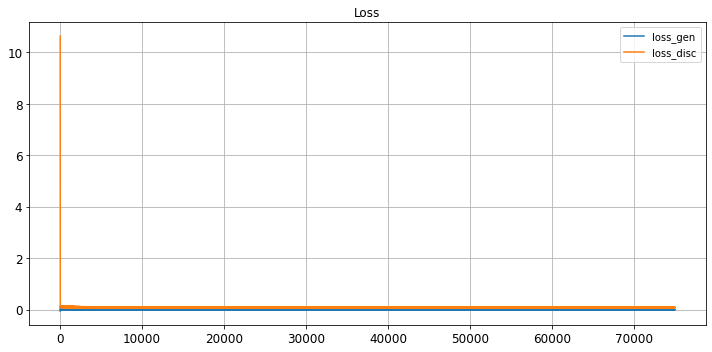

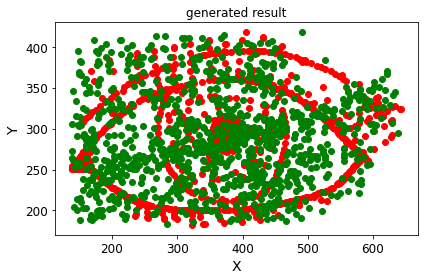

save the model & result
Epoch 75001/100000
critic: 0.083572 - generator: -0.003515 - 0s
Epoch 75002/100000
critic: 0.088749 - generator: -0.005866 - 0s
Epoch 75003/100000
critic: 0.074837 - generator: -0.002533 - 0s
Epoch 75004/100000
critic: 0.070059 - generator: 0.003162 - 0s
Epoch 75005/100000
critic: 0.085609 - generator: 0.000032 - 0s
Epoch 75006/100000
critic: 0.081502 - generator: -0.000519 - 0s
Epoch 75007/100000
critic: 0.078362 - generator: -0.001133 - 0s
Epoch 75008/100000
critic: 0.076986 - generator: -0.000371 - 0s
Epoch 75009/100000
critic: 0.071139 - generator: -0.001662 - 0s
Epoch 75010/100000
critic: 0.079069 - generator: -0.002738 - 0s
Epoch 75011/100000
critic: 0.079745 - generator: -0.000669 - 0s
Epoch 75012/100000
critic: 0.085003 - generator: 0.002360 - 0s
Epoch 75013/100000
critic: 0.075096 - generator: -0.001974 - 0s
Epoch 75014/100000
critic: 0.075941 - generator: -0.000836 - 0s
Epoch 75015/100000
critic: 0.079930 - generator: 0.001526 - 0s
Epoch 75016/100000
c

critic: 0.074871 - generator: -0.002623 - 0s
Epoch 75131/100000
critic: 0.085407 - generator: -0.005164 - 0s
Epoch 75132/100000
critic: 0.077347 - generator: -0.005133 - 0s
Epoch 75133/100000
critic: 0.071304 - generator: -0.003082 - 0s
Epoch 75134/100000
critic: 0.078611 - generator: 0.001695 - 0s
Epoch 75135/100000
critic: 0.082596 - generator: 0.002102 - 0s
Epoch 75136/100000
critic: 0.083743 - generator: 0.001563 - 0s
Epoch 75137/100000
critic: 0.078953 - generator: -0.004727 - 0s
Epoch 75138/100000
critic: 0.082758 - generator: -0.000537 - 0s
Epoch 75139/100000
critic: 0.074231 - generator: -0.000062 - 0s
Epoch 75140/100000
critic: 0.075120 - generator: 0.000847 - 0s
Epoch 75141/100000
critic: 0.085976 - generator: 0.004758 - 0s
Epoch 75142/100000
critic: 0.079232 - generator: -0.000159 - 0s
Epoch 75143/100000
critic: 0.084077 - generator: 0.001302 - 0s
Epoch 75144/100000
critic: 0.086303 - generator: 0.000813 - 0s
Epoch 75145/100000
critic: 0.076614 - generator: -0.005104 - 0s
Ep

critic: 0.086305 - generator: -0.005362 - 0s
Epoch 75261/100000
critic: 0.083054 - generator: 0.001384 - 0s
Epoch 75262/100000
critic: 0.084516 - generator: 0.000679 - 0s
Epoch 75263/100000
critic: 0.075218 - generator: 0.005179 - 0s
Epoch 75264/100000
critic: 0.086434 - generator: 0.002552 - 0s
Epoch 75265/100000
critic: 0.087643 - generator: -0.002119 - 0s
Epoch 75266/100000
critic: 0.072792 - generator: -0.000019 - 0s
Epoch 75267/100000
critic: 0.082327 - generator: 0.001803 - 0s
Epoch 75268/100000
critic: 0.073092 - generator: -0.001560 - 0s
Epoch 75269/100000
critic: 0.083558 - generator: 0.001754 - 0s
Epoch 75270/100000
critic: 0.086650 - generator: -0.003297 - 0s
Epoch 75271/100000
critic: 0.086890 - generator: -0.002047 - 0s
Epoch 75272/100000
critic: 0.084447 - generator: -0.006354 - 0s
Epoch 75273/100000
critic: 0.084129 - generator: -0.001013 - 0s
Epoch 75274/100000
critic: 0.080025 - generator: 0.000497 - 0s
Epoch 75275/100000
critic: 0.067096 - generator: 0.004573 - 0s
Epo

critic: 0.079910 - generator: -0.000173 - 0s
Epoch 75391/100000
critic: 0.079079 - generator: 0.002568 - 0s
Epoch 75392/100000
critic: 0.077706 - generator: 0.000121 - 0s
Epoch 75393/100000
critic: 0.078170 - generator: 0.001787 - 0s
Epoch 75394/100000
critic: 0.084616 - generator: 0.003812 - 0s
Epoch 75395/100000
critic: 0.081692 - generator: -0.001686 - 0s
Epoch 75396/100000
critic: 0.085442 - generator: -0.004596 - 0s
Epoch 75397/100000
critic: 0.088970 - generator: 0.000815 - 0s
Epoch 75398/100000
critic: 0.088930 - generator: -0.003552 - 0s
Epoch 75399/100000
critic: 0.078166 - generator: 0.002844 - 0s
Epoch 75400/100000
critic: 0.085159 - generator: 0.001787 - 0s
Epoch 75401/100000
critic: 0.079919 - generator: 0.001873 - 0s
Epoch 75402/100000
critic: 0.073301 - generator: 0.000676 - 0s
Epoch 75403/100000
critic: 0.078437 - generator: 0.001977 - 0s
Epoch 75404/100000
critic: 0.074184 - generator: -0.000349 - 0s
Epoch 75405/100000
critic: 0.075571 - generator: -0.000352 - 0s
Epoch

critic: 0.079684 - generator: -0.008968 - 0s
Epoch 75521/100000
critic: 0.082817 - generator: 0.003709 - 0s
Epoch 75522/100000
critic: 0.075218 - generator: 0.004918 - 0s
Epoch 75523/100000
critic: 0.088326 - generator: 0.005941 - 0s
Epoch 75524/100000
critic: 0.079074 - generator: 0.002173 - 0s
Epoch 75525/100000
critic: 0.082602 - generator: 0.003724 - 0s
Epoch 75526/100000
critic: 0.082101 - generator: 0.000969 - 0s
Epoch 75527/100000
critic: 0.078394 - generator: 0.002896 - 0s
Epoch 75528/100000
critic: 0.082293 - generator: -0.002496 - 0s
Epoch 75529/100000
critic: 0.075742 - generator: -0.001741 - 0s
Epoch 75530/100000
critic: 0.075429 - generator: 0.000405 - 0s
Epoch 75531/100000
critic: 0.078641 - generator: 0.000067 - 0s
Epoch 75532/100000
critic: 0.082390 - generator: 0.003085 - 0s
Epoch 75533/100000
critic: 0.092709 - generator: -0.001250 - 0s
Epoch 75534/100000
critic: 0.080233 - generator: 0.002074 - 0s
Epoch 75535/100000
critic: 0.089600 - generator: -0.000679 - 0s
Epoch 

critic: 0.073753 - generator: -0.002527 - 0s
Epoch 75651/100000
critic: 0.081216 - generator: 0.000780 - 0s
Epoch 75652/100000
critic: 0.082231 - generator: 0.000124 - 0s
Epoch 75653/100000
critic: 0.078680 - generator: 0.002595 - 0s
Epoch 75654/100000
critic: 0.092578 - generator: 0.001241 - 0s
Epoch 75655/100000
critic: 0.092529 - generator: -0.004308 - 0s
Epoch 75656/100000
critic: 0.076867 - generator: -0.002173 - 0s
Epoch 75657/100000
critic: 0.088462 - generator: 0.001229 - 0s
Epoch 75658/100000
critic: 0.076355 - generator: 0.004162 - 0s
Epoch 75659/100000
critic: 0.075234 - generator: -0.001464 - 0s
Epoch 75660/100000
critic: 0.079832 - generator: 0.003280 - 0s
Epoch 75661/100000
critic: 0.079223 - generator: 0.000159 - 0s
Epoch 75662/100000
critic: 0.084971 - generator: 0.001288 - 0s
Epoch 75663/100000
critic: 0.081006 - generator: -0.002629 - 0s
Epoch 75664/100000
critic: 0.077878 - generator: 0.000485 - 0s
Epoch 75665/100000
critic: 0.088752 - generator: 0.004302 - 0s
Epoch 

critic: 0.080852 - generator: 0.000588 - 0s
Epoch 75781/100000
critic: 0.081714 - generator: 0.003553 - 0s
Epoch 75782/100000
critic: 0.075653 - generator: -0.002593 - 0s
Epoch 75783/100000
critic: 0.074042 - generator: -0.002633 - 0s
Epoch 75784/100000
critic: 0.079623 - generator: -0.001451 - 0s
Epoch 75785/100000
critic: 0.080034 - generator: 0.001085 - 0s
Epoch 75786/100000
critic: 0.075834 - generator: 0.004322 - 0s
Epoch 75787/100000
critic: 0.088964 - generator: 0.000922 - 0s
Epoch 75788/100000
critic: 0.086260 - generator: 0.002134 - 0s
Epoch 75789/100000
critic: 0.071098 - generator: -0.001598 - 0s
Epoch 75790/100000
critic: 0.086354 - generator: 0.001525 - 0s
Epoch 75791/100000
critic: 0.096572 - generator: 0.002730 - 0s
Epoch 75792/100000
critic: 0.076188 - generator: -0.000520 - 0s
Epoch 75793/100000
critic: 0.074548 - generator: 0.001704 - 0s
Epoch 75794/100000
critic: 0.086888 - generator: -0.001716 - 0s
Epoch 75795/100000
critic: 0.087855 - generator: 0.000599 - 0s
Epoch

critic: 0.078480 - generator: 0.001623 - 0s
Epoch 75911/100000
critic: 0.081495 - generator: 0.000967 - 0s
Epoch 75912/100000
critic: 0.076331 - generator: 0.001755 - 0s
Epoch 75913/100000
critic: 0.073757 - generator: -0.003647 - 0s
Epoch 75914/100000
critic: 0.078440 - generator: 0.000057 - 0s
Epoch 75915/100000
critic: 0.074668 - generator: -0.001205 - 0s
Epoch 75916/100000
critic: 0.079552 - generator: -0.001020 - 0s
Epoch 75917/100000
critic: 0.079749 - generator: -0.001773 - 0s
Epoch 75918/100000
critic: 0.082180 - generator: 0.004636 - 0s
Epoch 75919/100000
critic: 0.078250 - generator: -0.002317 - 0s
Epoch 75920/100000
critic: 0.088024 - generator: 0.000481 - 0s
Epoch 75921/100000
critic: 0.076672 - generator: 0.001942 - 0s
Epoch 75922/100000
critic: 0.079756 - generator: -0.000555 - 0s
Epoch 75923/100000
critic: 0.079234 - generator: -0.004816 - 0s
Epoch 75924/100000
critic: 0.087196 - generator: -0.002812 - 0s
Epoch 75925/100000
critic: 0.079328 - generator: 0.003158 - 0s
Epo

critic: 0.086918 - generator: 0.000030 - 0s
Epoch 76041/100000
critic: 0.069216 - generator: 0.002819 - 0s
Epoch 76042/100000
critic: 0.080784 - generator: 0.006301 - 0s
Epoch 76043/100000
critic: 0.076386 - generator: 0.001978 - 0s
Epoch 76044/100000
critic: 0.073850 - generator: -0.000448 - 0s
Epoch 76045/100000
critic: 0.079079 - generator: -0.004501 - 0s
Epoch 76046/100000
critic: 0.086626 - generator: -0.003298 - 0s
Epoch 76047/100000
critic: 0.095008 - generator: 0.002586 - 0s
Epoch 76048/100000
critic: 0.092322 - generator: -0.001377 - 0s
Epoch 76049/100000
critic: 0.066943 - generator: -0.005734 - 0s
Epoch 76050/100000
critic: 0.086387 - generator: -0.003217 - 0s
Epoch 76051/100000
critic: 0.079663 - generator: 0.002077 - 0s
Epoch 76052/100000
critic: 0.079181 - generator: 0.001426 - 0s
Epoch 76053/100000
critic: 0.084475 - generator: 0.005472 - 0s
Epoch 76054/100000
critic: 0.078717 - generator: 0.000159 - 0s
Epoch 76055/100000
critic: 0.093854 - generator: 0.002869 - 0s
Epoch

critic: 0.086973 - generator: -0.003335 - 0s
Epoch 76171/100000
critic: 0.081442 - generator: -0.004781 - 0s
Epoch 76172/100000
critic: 0.070078 - generator: -0.003785 - 0s
Epoch 76173/100000
critic: 0.076795 - generator: 0.002772 - 0s
Epoch 76174/100000
critic: 0.081510 - generator: 0.001478 - 0s
Epoch 76175/100000
critic: 0.086250 - generator: -0.001079 - 0s
Epoch 76176/100000
critic: 0.084185 - generator: -0.005210 - 0s
Epoch 76177/100000
critic: 0.083403 - generator: -0.000729 - 0s
Epoch 76178/100000
critic: 0.077872 - generator: -0.001942 - 0s
Epoch 76179/100000
critic: 0.069646 - generator: 0.000475 - 0s
Epoch 76180/100000
critic: 0.076125 - generator: 0.002125 - 0s
Epoch 76181/100000
critic: 0.076483 - generator: 0.003118 - 0s
Epoch 76182/100000
critic: 0.078726 - generator: 0.000221 - 0s
Epoch 76183/100000
critic: 0.078360 - generator: -0.003516 - 0s
Epoch 76184/100000
critic: 0.079840 - generator: 0.001651 - 0s
Epoch 76185/100000
critic: 0.064485 - generator: -0.002750 - 0s
Ep

critic: 0.085242 - generator: -0.000761 - 0s
Epoch 76301/100000
critic: 0.079652 - generator: 0.001074 - 0s
Epoch 76302/100000
critic: 0.073082 - generator: 0.003782 - 0s
Epoch 76303/100000
critic: 0.086141 - generator: -0.000741 - 0s
Epoch 76304/100000
critic: 0.085953 - generator: -0.000858 - 0s
Epoch 76305/100000
critic: 0.080250 - generator: -0.003177 - 0s
Epoch 76306/100000
critic: 0.081732 - generator: -0.002059 - 0s
Epoch 76307/100000
critic: 0.080089 - generator: -0.002367 - 0s
Epoch 76308/100000
critic: 0.080274 - generator: 0.000562 - 0s
Epoch 76309/100000
critic: 0.083645 - generator: -0.000934 - 0s
Epoch 76310/100000
critic: 0.084200 - generator: -0.000373 - 0s
Epoch 76311/100000
critic: 0.082229 - generator: -0.001081 - 0s
Epoch 76312/100000
critic: 0.079215 - generator: -0.001460 - 0s
Epoch 76313/100000
critic: 0.077159 - generator: -0.000481 - 0s
Epoch 76314/100000
critic: 0.086916 - generator: 0.000581 - 0s
Epoch 76315/100000
critic: 0.075952 - generator: -0.001409 - 0s

critic: 0.079854 - generator: 0.003953 - 0s
Epoch 76431/100000
critic: 0.082565 - generator: 0.001765 - 0s
Epoch 76432/100000
critic: 0.078481 - generator: 0.001787 - 0s
Epoch 76433/100000
critic: 0.083073 - generator: -0.003122 - 0s
Epoch 76434/100000
critic: 0.087657 - generator: -0.004132 - 0s
Epoch 76435/100000
critic: 0.072703 - generator: -0.001901 - 0s
Epoch 76436/100000
critic: 0.072939 - generator: -0.001527 - 0s
Epoch 76437/100000
critic: 0.093825 - generator: -0.000416 - 0s
Epoch 76438/100000
critic: 0.075047 - generator: 0.000320 - 0s
Epoch 76439/100000
critic: 0.070390 - generator: -0.002008 - 0s
Epoch 76440/100000
critic: 0.072795 - generator: 0.000262 - 0s
Epoch 76441/100000
critic: 0.080922 - generator: -0.000716 - 0s
Epoch 76442/100000
critic: 0.079712 - generator: 0.001948 - 0s
Epoch 76443/100000
critic: 0.081504 - generator: -0.000345 - 0s
Epoch 76444/100000
critic: 0.080756 - generator: -0.000569 - 0s
Epoch 76445/100000
critic: 0.073178 - generator: 0.001345 - 0s
Ep

critic: 0.083110 - generator: -0.002545 - 0s
Epoch 76561/100000
critic: 0.074378 - generator: -0.003789 - 0s
Epoch 76562/100000
critic: 0.080021 - generator: -0.003058 - 0s
Epoch 76563/100000
critic: 0.087749 - generator: 0.001210 - 0s
Epoch 76564/100000
critic: 0.079868 - generator: -0.001452 - 0s
Epoch 76565/100000
critic: 0.087071 - generator: -0.000006 - 0s
Epoch 76566/100000
critic: 0.075306 - generator: -0.002884 - 0s
Epoch 76567/100000
critic: 0.072065 - generator: -0.004592 - 0s
Epoch 76568/100000
critic: 0.076330 - generator: 0.001999 - 0s
Epoch 76569/100000
critic: 0.079855 - generator: 0.002491 - 0s
Epoch 76570/100000
critic: 0.091099 - generator: 0.000644 - 0s
Epoch 76571/100000
critic: 0.087353 - generator: 0.001137 - 0s
Epoch 76572/100000
critic: 0.076213 - generator: 0.003395 - 0s
Epoch 76573/100000
critic: 0.068578 - generator: -0.000395 - 0s
Epoch 76574/100000
critic: 0.082782 - generator: 0.002258 - 0s
Epoch 76575/100000
critic: 0.085568 - generator: 0.003235 - 0s
Epo

critic: 0.085538 - generator: 0.001633 - 0s
Epoch 76691/100000
critic: 0.083243 - generator: 0.000068 - 0s
Epoch 76692/100000
critic: 0.080374 - generator: 0.002196 - 0s
Epoch 76693/100000
critic: 0.077844 - generator: 0.005739 - 0s
Epoch 76694/100000
critic: 0.088290 - generator: -0.000645 - 0s
Epoch 76695/100000
critic: 0.075374 - generator: -0.002918 - 0s
Epoch 76696/100000
critic: 0.078977 - generator: 0.000904 - 0s
Epoch 76697/100000
critic: 0.103863 - generator: -0.001237 - 0s
Epoch 76698/100000
critic: 0.070671 - generator: -0.004364 - 0s
Epoch 76699/100000
critic: 0.072045 - generator: -0.007929 - 0s
Epoch 76700/100000
critic: 0.084864 - generator: -0.005920 - 0s
Epoch 76701/100000
critic: 0.087868 - generator: 0.002032 - 0s
Epoch 76702/100000
critic: 0.077333 - generator: 0.000709 - 0s
Epoch 76703/100000
critic: 0.077221 - generator: 0.003074 - 0s
Epoch 76704/100000
critic: 0.085462 - generator: 0.001535 - 0s
Epoch 76705/100000
critic: 0.084192 - generator: 0.002630 - 0s
Epoch

critic: 0.090221 - generator: 0.000962 - 0s
Epoch 76821/100000
critic: 0.081656 - generator: 0.002535 - 0s
Epoch 76822/100000
critic: 0.077942 - generator: 0.001484 - 0s
Epoch 76823/100000
critic: 0.090166 - generator: 0.002635 - 0s
Epoch 76824/100000
critic: 0.080991 - generator: 0.003018 - 0s
Epoch 76825/100000
critic: 0.079292 - generator: -0.000169 - 0s
Epoch 76826/100000
critic: 0.083194 - generator: 0.003198 - 0s
Epoch 76827/100000
critic: 0.082450 - generator: -0.001395 - 0s
Epoch 76828/100000
critic: 0.083110 - generator: -0.003170 - 0s
Epoch 76829/100000
critic: 0.075765 - generator: -0.003522 - 0s
Epoch 76830/100000
critic: 0.074820 - generator: -0.002509 - 0s
Epoch 76831/100000
critic: 0.060137 - generator: -0.005515 - 0s
Epoch 76832/100000
critic: 0.080353 - generator: -0.005833 - 0s
Epoch 76833/100000
critic: 0.099724 - generator: -0.003620 - 0s
Epoch 76834/100000
critic: 0.090112 - generator: -0.005044 - 0s
Epoch 76835/100000
critic: 0.070847 - generator: 0.000683 - 0s
Ep

critic: 0.076867 - generator: 0.000504 - 0s
Epoch 76951/100000
critic: 0.097835 - generator: -0.003667 - 0s
Epoch 76952/100000
critic: 0.090689 - generator: 0.002427 - 0s
Epoch 76953/100000
critic: 0.085425 - generator: -0.000300 - 0s
Epoch 76954/100000
critic: 0.072521 - generator: 0.008055 - 0s
Epoch 76955/100000
critic: 0.076112 - generator: 0.003366 - 0s
Epoch 76956/100000
critic: 0.084992 - generator: 0.000168 - 0s
Epoch 76957/100000
critic: 0.079944 - generator: -0.000843 - 0s
Epoch 76958/100000
critic: 0.086775 - generator: 0.001607 - 0s
Epoch 76959/100000
critic: 0.067272 - generator: -0.002695 - 0s
Epoch 76960/100000
critic: 0.087613 - generator: 0.000625 - 0s
Epoch 76961/100000
critic: 0.080706 - generator: 0.001487 - 0s
Epoch 76962/100000
critic: 0.088159 - generator: 0.000668 - 0s
Epoch 76963/100000
critic: 0.087449 - generator: 0.002103 - 0s
Epoch 76964/100000
critic: 0.077966 - generator: 0.000104 - 0s
Epoch 76965/100000
critic: 0.090265 - generator: 0.003747 - 0s
Epoch 7

critic: 0.087365 - generator: -0.001676 - 0s
Epoch 77081/100000
critic: 0.074334 - generator: -0.000431 - 0s
Epoch 77082/100000
critic: 0.083101 - generator: 0.003423 - 0s
Epoch 77083/100000
critic: 0.077499 - generator: -0.001349 - 0s
Epoch 77084/100000
critic: 0.078816 - generator: -0.001183 - 0s
Epoch 77085/100000
critic: 0.076428 - generator: -0.000659 - 0s
Epoch 77086/100000
critic: 0.085219 - generator: -0.001772 - 0s
Epoch 77087/100000
critic: 0.076979 - generator: -0.001427 - 0s
Epoch 77088/100000
critic: 0.078140 - generator: 0.001441 - 0s
Epoch 77089/100000
critic: 0.078734 - generator: 0.001120 - 0s
Epoch 77090/100000
critic: 0.079787 - generator: 0.001076 - 0s
Epoch 77091/100000
critic: 0.095456 - generator: -0.002341 - 0s
Epoch 77092/100000
critic: 0.078935 - generator: 0.000909 - 0s
Epoch 77093/100000
critic: 0.078050 - generator: 0.000930 - 0s
Epoch 77094/100000
critic: 0.080654 - generator: -0.002918 - 0s
Epoch 77095/100000
critic: 0.072036 - generator: 0.000676 - 0s
Ep

critic: 0.088528 - generator: -0.000353 - 0s
Epoch 77211/100000
critic: 0.081473 - generator: 0.000482 - 0s
Epoch 77212/100000
critic: 0.081541 - generator: 0.002860 - 0s
Epoch 77213/100000
critic: 0.083944 - generator: 0.000662 - 0s
Epoch 77214/100000
critic: 0.081375 - generator: 0.000908 - 0s
Epoch 77215/100000
critic: 0.085452 - generator: -0.001256 - 0s
Epoch 77216/100000
critic: 0.093372 - generator: -0.000150 - 0s
Epoch 77217/100000
critic: 0.086611 - generator: -0.000423 - 0s
Epoch 77218/100000
critic: 0.085265 - generator: 0.000235 - 0s
Epoch 77219/100000
critic: 0.077509 - generator: 0.005642 - 0s
Epoch 77220/100000
critic: 0.069619 - generator: 0.006499 - 0s
Epoch 77221/100000
critic: 0.077302 - generator: 0.000320 - 0s
Epoch 77222/100000
critic: 0.074426 - generator: 0.000523 - 0s
Epoch 77223/100000
critic: 0.086849 - generator: 0.000538 - 0s
Epoch 77224/100000
critic: 0.089589 - generator: 0.000462 - 0s
Epoch 77225/100000
critic: 0.076607 - generator: 0.000288 - 0s
Epoch 7

critic: 0.078317 - generator: -0.000144 - 0s
Epoch 77341/100000
critic: 0.080968 - generator: 0.002155 - 0s
Epoch 77342/100000
critic: 0.073619 - generator: -0.001660 - 0s
Epoch 77343/100000
critic: 0.086527 - generator: -0.000641 - 0s
Epoch 77344/100000
critic: 0.076509 - generator: 0.001792 - 0s
Epoch 77345/100000
critic: 0.090236 - generator: -0.001081 - 0s
Epoch 77346/100000
critic: 0.084021 - generator: -0.000232 - 0s
Epoch 77347/100000
critic: 0.069345 - generator: 0.004074 - 0s
Epoch 77348/100000
critic: 0.081378 - generator: 0.001325 - 0s
Epoch 77349/100000
critic: 0.087819 - generator: 0.001451 - 0s
Epoch 77350/100000
critic: 0.088836 - generator: 0.003253 - 0s
Epoch 77351/100000
critic: 0.075532 - generator: -0.000263 - 0s
Epoch 77352/100000
critic: 0.082517 - generator: 0.001879 - 0s
Epoch 77353/100000
critic: 0.066873 - generator: 0.003302 - 0s
Epoch 77354/100000
critic: 0.090051 - generator: 0.002209 - 0s
Epoch 77355/100000
critic: 0.080732 - generator: -0.003676 - 0s
Epoc

critic: 0.078254 - generator: 0.003779 - 0s
Epoch 77471/100000
critic: 0.078087 - generator: -0.001875 - 0s
Epoch 77472/100000
critic: 0.079890 - generator: -0.002325 - 0s
Epoch 77473/100000
critic: 0.092056 - generator: 0.001694 - 0s
Epoch 77474/100000
critic: 0.086149 - generator: -0.000262 - 0s
Epoch 77475/100000
critic: 0.076628 - generator: 0.000566 - 0s
Epoch 77476/100000
critic: 0.082401 - generator: 0.001696 - 0s
Epoch 77477/100000
critic: 0.077901 - generator: 0.002564 - 0s
Epoch 77478/100000
critic: 0.086195 - generator: 0.000100 - 0s
Epoch 77479/100000
critic: 0.080322 - generator: 0.003493 - 0s
Epoch 77480/100000
critic: 0.088425 - generator: -0.002507 - 0s
Epoch 77481/100000
critic: 0.079251 - generator: -0.003230 - 0s
Epoch 77482/100000
critic: 0.082963 - generator: -0.001580 - 0s
Epoch 77483/100000
critic: 0.085789 - generator: -0.001730 - 0s
Epoch 77484/100000
critic: 0.075316 - generator: -0.001158 - 0s
Epoch 77485/100000
critic: 0.089594 - generator: -0.004339 - 0s
Ep

critic: 0.091728 - generator: 0.000298 - 0s
Epoch 77601/100000
critic: 0.094675 - generator: -0.001434 - 0s
Epoch 77602/100000
critic: 0.078608 - generator: -0.000324 - 0s
Epoch 77603/100000
critic: 0.072881 - generator: 0.002538 - 0s
Epoch 77604/100000
critic: 0.077151 - generator: 0.004234 - 0s
Epoch 77605/100000
critic: 0.081642 - generator: -0.000520 - 0s
Epoch 77606/100000
critic: 0.088297 - generator: -0.001916 - 0s
Epoch 77607/100000
critic: 0.091567 - generator: -0.004190 - 0s
Epoch 77608/100000
critic: 0.081920 - generator: -0.001651 - 0s
Epoch 77609/100000
critic: 0.068962 - generator: -0.000627 - 0s
Epoch 77610/100000
critic: 0.075814 - generator: 0.003539 - 0s
Epoch 77611/100000
critic: 0.071206 - generator: 0.000331 - 0s
Epoch 77612/100000
critic: 0.088028 - generator: 0.003854 - 0s
Epoch 77613/100000
critic: 0.092447 - generator: -0.003713 - 0s
Epoch 77614/100000
critic: 0.082077 - generator: -0.001255 - 0s
Epoch 77615/100000
critic: 0.078649 - generator: 0.001292 - 0s
Ep

critic: 0.085220 - generator: 0.000049 - 0s
Epoch 77731/100000
critic: 0.075642 - generator: -0.001181 - 0s
Epoch 77732/100000
critic: 0.090055 - generator: -0.007591 - 0s
Epoch 77733/100000
critic: 0.077251 - generator: -0.003670 - 0s
Epoch 77734/100000
critic: 0.093180 - generator: -0.004913 - 0s
Epoch 77735/100000
critic: 0.079291 - generator: -0.002065 - 0s
Epoch 77736/100000
critic: 0.074149 - generator: -0.000425 - 0s
Epoch 77737/100000
critic: 0.079439 - generator: -0.002467 - 0s
Epoch 77738/100000
critic: 0.056434 - generator: 0.005086 - 0s
Epoch 77739/100000
critic: 0.091415 - generator: 0.005633 - 0s
Epoch 77740/100000
critic: 0.073104 - generator: -0.000710 - 0s
Epoch 77741/100000
critic: 0.078080 - generator: 0.002755 - 0s
Epoch 77742/100000
critic: 0.069257 - generator: 0.004716 - 0s
Epoch 77743/100000
critic: 0.083415 - generator: 0.003108 - 0s
Epoch 77744/100000
critic: 0.091391 - generator: -0.002850 - 0s
Epoch 77745/100000
critic: 0.078582 - generator: -0.004885 - 0s
E

critic: 0.078486 - generator: -0.003678 - 0s
Epoch 77861/100000
critic: 0.083324 - generator: -0.003752 - 0s
Epoch 77862/100000
critic: 0.080409 - generator: -0.003018 - 0s
Epoch 77863/100000
critic: 0.080850 - generator: -0.002322 - 0s
Epoch 77864/100000
critic: 0.086038 - generator: -0.000862 - 0s
Epoch 77865/100000
critic: 0.084111 - generator: 0.002242 - 0s
Epoch 77866/100000
critic: 0.076046 - generator: -0.003482 - 0s
Epoch 77867/100000
critic: 0.078621 - generator: 0.001425 - 0s
Epoch 77868/100000
critic: 0.085797 - generator: 0.000740 - 0s
Epoch 77869/100000
critic: 0.085196 - generator: -0.003767 - 0s
Epoch 77870/100000
critic: 0.087471 - generator: -0.001050 - 0s
Epoch 77871/100000
critic: 0.087128 - generator: -0.000898 - 0s
Epoch 77872/100000
critic: 0.073115 - generator: -0.001797 - 0s
Epoch 77873/100000
critic: 0.081163 - generator: 0.000202 - 0s
Epoch 77874/100000
critic: 0.084527 - generator: 0.003219 - 0s
Epoch 77875/100000
critic: 0.083974 - generator: 0.000575 - 0s
E

critic: 0.077648 - generator: -0.002830 - 0s
Epoch 77991/100000
critic: 0.082949 - generator: -0.001446 - 0s
Epoch 77992/100000
critic: 0.085529 - generator: 0.000895 - 0s
Epoch 77993/100000
critic: 0.082038 - generator: -0.000430 - 0s
Epoch 77994/100000
critic: 0.084741 - generator: -0.000762 - 0s
Epoch 77995/100000
critic: 0.073869 - generator: -0.000507 - 0s
Epoch 77996/100000
critic: 0.083162 - generator: 0.000565 - 0s
Epoch 77997/100000
critic: 0.089174 - generator: -0.000787 - 0s
Epoch 77998/100000
critic: 0.077782 - generator: -0.001846 - 0s
Epoch 77999/100000
critic: 0.085449 - generator: 0.001472 - 0s
Epoch 78000/100000
critic: 0.085991 - generator: -0.002577 - 0s
Epoch 78001/100000
critic: 0.080218 - generator: 0.000317 - 0s
Epoch 78002/100000
critic: 0.088830 - generator: -0.003964 - 0s
Epoch 78003/100000
critic: 0.085806 - generator: -0.002043 - 0s
Epoch 78004/100000
critic: 0.077795 - generator: 0.000901 - 0s
Epoch 78005/100000
critic: 0.081826 - generator: 0.004099 - 0s
E

critic: 0.080522 - generator: 0.002201 - 0s
Epoch 78121/100000
critic: 0.076220 - generator: 0.001036 - 0s
Epoch 78122/100000
critic: 0.080885 - generator: 0.000012 - 0s
Epoch 78123/100000
critic: 0.081272 - generator: -0.001118 - 0s
Epoch 78124/100000
critic: 0.083450 - generator: -0.003571 - 0s
Epoch 78125/100000
critic: 0.072625 - generator: -0.001453 - 0s
Epoch 78126/100000
critic: 0.073774 - generator: 0.004721 - 0s
Epoch 78127/100000
critic: 0.077686 - generator: 0.002354 - 0s
Epoch 78128/100000
critic: 0.080019 - generator: -0.001683 - 0s
Epoch 78129/100000
critic: 0.087119 - generator: -0.002029 - 0s
Epoch 78130/100000
critic: 0.076796 - generator: -0.004517 - 0s
Epoch 78131/100000
critic: 0.082512 - generator: -0.000296 - 0s
Epoch 78132/100000
critic: 0.083886 - generator: 0.002550 - 0s
Epoch 78133/100000
critic: 0.077619 - generator: 0.001617 - 0s
Epoch 78134/100000
critic: 0.081445 - generator: 0.002126 - 0s
Epoch 78135/100000
critic: 0.080265 - generator: 0.008168 - 0s
Epoc

critic: 0.069554 - generator: 0.003532 - 0s
Epoch 78251/100000
critic: 0.078218 - generator: 0.000960 - 0s
Epoch 78252/100000
critic: 0.078946 - generator: -0.001732 - 0s
Epoch 78253/100000
critic: 0.084064 - generator: -0.001566 - 0s
Epoch 78254/100000
critic: 0.072552 - generator: 0.000783 - 0s
Epoch 78255/100000
critic: 0.077862 - generator: 0.006082 - 0s
Epoch 78256/100000
critic: 0.078304 - generator: -0.001243 - 0s
Epoch 78257/100000
critic: 0.074438 - generator: 0.001853 - 0s
Epoch 78258/100000
critic: 0.071825 - generator: 0.001615 - 0s
Epoch 78259/100000
critic: 0.071156 - generator: -0.000453 - 0s
Epoch 78260/100000
critic: 0.084005 - generator: -0.000690 - 0s
Epoch 78261/100000
critic: 0.074418 - generator: -0.001891 - 0s
Epoch 78262/100000
critic: 0.081559 - generator: 0.000688 - 0s
Epoch 78263/100000
critic: 0.084895 - generator: 0.004854 - 0s
Epoch 78264/100000
critic: 0.085538 - generator: 0.004323 - 0s
Epoch 78265/100000
critic: 0.080104 - generator: 0.001579 - 0s
Epoch

critic: 0.082229 - generator: -0.001093 - 0s
Epoch 78381/100000
critic: 0.079214 - generator: 0.004635 - 0s
Epoch 78382/100000
critic: 0.092539 - generator: 0.004668 - 0s
Epoch 78383/100000
critic: 0.078416 - generator: 0.002168 - 0s
Epoch 78384/100000
critic: 0.086618 - generator: 0.002134 - 0s
Epoch 78385/100000
critic: 0.086190 - generator: 0.001151 - 0s
Epoch 78386/100000
critic: 0.085469 - generator: -0.000628 - 0s
Epoch 78387/100000
critic: 0.068302 - generator: -0.005488 - 0s
Epoch 78388/100000
critic: 0.086734 - generator: -0.006750 - 0s
Epoch 78389/100000
critic: 0.082169 - generator: -0.000563 - 0s
Epoch 78390/100000
critic: 0.079278 - generator: 0.001635 - 0s
Epoch 78391/100000
critic: 0.070528 - generator: -0.007093 - 0s
Epoch 78392/100000
critic: 0.083564 - generator: -0.004557 - 0s
Epoch 78393/100000
critic: 0.087277 - generator: 0.001632 - 0s
Epoch 78394/100000
critic: 0.075357 - generator: -0.004835 - 0s
Epoch 78395/100000
critic: 0.081448 - generator: 0.003321 - 0s
Epo

critic: 0.072130 - generator: -0.000267 - 0s
Epoch 78511/100000
critic: 0.066109 - generator: -0.003589 - 0s
Epoch 78512/100000
critic: 0.078823 - generator: -0.005574 - 0s
Epoch 78513/100000
critic: 0.087580 - generator: -0.000127 - 0s
Epoch 78514/100000
critic: 0.077655 - generator: -0.001933 - 0s
Epoch 78515/100000
critic: 0.082700 - generator: -0.001487 - 0s
Epoch 78516/100000
critic: 0.081283 - generator: -0.000773 - 0s
Epoch 78517/100000
critic: 0.079436 - generator: 0.004151 - 0s
Epoch 78518/100000
critic: 0.076900 - generator: 0.005142 - 0s
Epoch 78519/100000
critic: 0.076145 - generator: 0.003060 - 0s
Epoch 78520/100000
critic: 0.080049 - generator: 0.000744 - 0s
Epoch 78521/100000
critic: 0.066612 - generator: -0.002248 - 0s
Epoch 78522/100000
critic: 0.079641 - generator: -0.004234 - 0s
Epoch 78523/100000
critic: 0.079342 - generator: 0.000181 - 0s
Epoch 78524/100000
critic: 0.083919 - generator: 0.003032 - 0s
Epoch 78525/100000
critic: 0.084456 - generator: -0.003375 - 0s
E

critic: 0.076975 - generator: 0.001770 - 0s
Epoch 78641/100000
critic: 0.079450 - generator: -0.002307 - 0s
Epoch 78642/100000
critic: 0.079926 - generator: -0.002541 - 0s
Epoch 78643/100000
critic: 0.078898 - generator: -0.002017 - 0s
Epoch 78644/100000
critic: 0.090604 - generator: -0.001876 - 0s
Epoch 78645/100000
critic: 0.081745 - generator: 0.004872 - 0s
Epoch 78646/100000
critic: 0.074459 - generator: -0.002953 - 0s
Epoch 78647/100000
critic: 0.082716 - generator: 0.000844 - 0s
Epoch 78648/100000
critic: 0.075712 - generator: 0.002992 - 0s
Epoch 78649/100000
critic: 0.071400 - generator: 0.001397 - 0s
Epoch 78650/100000
critic: 0.085837 - generator: -0.001667 - 0s
Epoch 78651/100000
critic: 0.064862 - generator: -0.000937 - 0s
Epoch 78652/100000
critic: 0.087566 - generator: -0.001582 - 0s
Epoch 78653/100000
critic: 0.071208 - generator: 0.003288 - 0s
Epoch 78654/100000
critic: 0.078032 - generator: 0.003050 - 0s
Epoch 78655/100000
critic: 0.081663 - generator: -0.003687 - 0s
Ep

critic: 0.079519 - generator: 0.000472 - 0s
Epoch 78771/100000
critic: 0.079171 - generator: 0.000249 - 0s
Epoch 78772/100000
critic: 0.087898 - generator: -0.006784 - 0s
Epoch 78773/100000
critic: 0.074375 - generator: 0.001276 - 0s
Epoch 78774/100000
critic: 0.088901 - generator: 0.002473 - 0s
Epoch 78775/100000
critic: 0.089072 - generator: -0.001035 - 0s
Epoch 78776/100000
critic: 0.079452 - generator: 0.000362 - 0s
Epoch 78777/100000
critic: 0.084680 - generator: 0.002487 - 0s
Epoch 78778/100000
critic: 0.073762 - generator: -0.003029 - 0s
Epoch 78779/100000
critic: 0.088384 - generator: -0.005109 - 0s
Epoch 78780/100000
critic: 0.077990 - generator: -0.001628 - 0s
Epoch 78781/100000
critic: 0.082470 - generator: -0.001333 - 0s
Epoch 78782/100000
critic: 0.096054 - generator: -0.001779 - 0s
Epoch 78783/100000
critic: 0.070067 - generator: 0.000462 - 0s
Epoch 78784/100000
critic: 0.077117 - generator: 0.001124 - 0s
Epoch 78785/100000
critic: 0.083320 - generator: -0.002820 - 0s
Epo

critic: 0.080767 - generator: 0.001536 - 0s
Epoch 78901/100000
critic: 0.073987 - generator: -0.000651 - 0s
Epoch 78902/100000
critic: 0.070542 - generator: -0.005379 - 0s
Epoch 78903/100000
critic: 0.088642 - generator: -0.001970 - 0s
Epoch 78904/100000
critic: 0.077607 - generator: 0.004159 - 0s
Epoch 78905/100000
critic: 0.085892 - generator: -0.002098 - 0s
Epoch 78906/100000
critic: 0.075519 - generator: -0.003726 - 0s
Epoch 78907/100000
critic: 0.079585 - generator: 0.001566 - 0s
Epoch 78908/100000
critic: 0.082626 - generator: 0.002888 - 0s
Epoch 78909/100000
critic: 0.074163 - generator: 0.002526 - 0s
Epoch 78910/100000
critic: 0.079949 - generator: 0.003395 - 0s
Epoch 78911/100000
critic: 0.074347 - generator: 0.000739 - 0s
Epoch 78912/100000
critic: 0.085346 - generator: -0.004313 - 0s
Epoch 78913/100000
critic: 0.083908 - generator: -0.005592 - 0s
Epoch 78914/100000
critic: 0.087750 - generator: 0.002619 - 0s
Epoch 78915/100000
critic: 0.082840 - generator: 0.000968 - 0s
Epoc

critic: 0.077571 - generator: 0.000171 - 0s
Epoch 79031/100000
critic: 0.067341 - generator: -0.004324 - 0s
Epoch 79032/100000
critic: 0.084734 - generator: -0.005006 - 0s
Epoch 79033/100000
critic: 0.094877 - generator: -0.003207 - 0s
Epoch 79034/100000
critic: 0.076495 - generator: -0.002565 - 0s
Epoch 79035/100000
critic: 0.082299 - generator: -0.006591 - 0s
Epoch 79036/100000
critic: 0.084910 - generator: -0.001480 - 0s
Epoch 79037/100000
critic: 0.086934 - generator: 0.002154 - 0s
Epoch 79038/100000
critic: 0.077061 - generator: -0.005626 - 0s
Epoch 79039/100000
critic: 0.072726 - generator: -0.001593 - 0s
Epoch 79040/100000
critic: 0.087246 - generator: -0.001488 - 0s
Epoch 79041/100000
critic: 0.075743 - generator: 0.001641 - 0s
Epoch 79042/100000
critic: 0.069539 - generator: -0.000471 - 0s
Epoch 79043/100000
critic: 0.076426 - generator: 0.002946 - 0s
Epoch 79044/100000
critic: 0.076676 - generator: -0.002701 - 0s
Epoch 79045/100000
critic: 0.086275 - generator: 0.001080 - 0s


critic: 0.083507 - generator: 0.003918 - 0s
Epoch 79162/100000
critic: 0.078850 - generator: 0.000273 - 0s
Epoch 79163/100000
critic: 0.083715 - generator: -0.004105 - 0s
Epoch 79164/100000
critic: 0.083259 - generator: -0.001222 - 0s
Epoch 79165/100000
critic: 0.077995 - generator: -0.001434 - 0s
Epoch 79166/100000
critic: 0.082669 - generator: -0.000457 - 0s
Epoch 79167/100000
critic: 0.090102 - generator: -0.001769 - 0s
Epoch 79168/100000
critic: 0.071976 - generator: -0.002363 - 0s
Epoch 79169/100000
critic: 0.083994 - generator: -0.001150 - 0s
Epoch 79170/100000
critic: 0.083391 - generator: 0.002312 - 0s
Epoch 79171/100000
critic: 0.080799 - generator: -0.002179 - 0s
Epoch 79172/100000
critic: 0.082113 - generator: -0.000907 - 0s
Epoch 79173/100000
critic: 0.089277 - generator: -0.000341 - 0s
Epoch 79174/100000
critic: 0.076571 - generator: -0.003506 - 0s
Epoch 79175/100000
critic: 0.073507 - generator: 0.001297 - 0s
Epoch 79176/100000
critic: 0.082611 - generator: -0.000557 - 0s

critic: 0.077600 - generator: -0.004870 - 0s
Epoch 79292/100000
critic: 0.079743 - generator: -0.001579 - 0s
Epoch 79293/100000
critic: 0.087675 - generator: -0.003398 - 0s
Epoch 79294/100000
critic: 0.078829 - generator: -0.000680 - 0s
Epoch 79295/100000
critic: 0.084663 - generator: 0.002704 - 0s
Epoch 79296/100000
critic: 0.075923 - generator: 0.002215 - 0s
Epoch 79297/100000
critic: 0.075091 - generator: -0.001495 - 0s
Epoch 79298/100000
critic: 0.074501 - generator: 0.001623 - 0s
Epoch 79299/100000
critic: 0.089764 - generator: 0.000771 - 0s
Epoch 79300/100000
critic: 0.068371 - generator: -0.003297 - 0s
Epoch 79301/100000
critic: 0.078273 - generator: 0.000193 - 0s
Epoch 79302/100000
critic: 0.085499 - generator: -0.002525 - 0s
Epoch 79303/100000
critic: 0.081459 - generator: -0.001559 - 0s
Epoch 79304/100000
critic: 0.089645 - generator: 0.000046 - 0s
Epoch 79305/100000
critic: 0.082345 - generator: 0.000532 - 0s
Epoch 79306/100000
critic: 0.085439 - generator: -0.000165 - 0s
Ep

critic: 0.075176 - generator: -0.002964 - 0s
Epoch 79422/100000
critic: 0.087074 - generator: -0.002281 - 0s
Epoch 79423/100000
critic: 0.079904 - generator: -0.001870 - 0s
Epoch 79424/100000
critic: 0.086873 - generator: -0.000771 - 0s
Epoch 79425/100000
critic: 0.076957 - generator: 0.002148 - 0s
Epoch 79426/100000
critic: 0.061952 - generator: -0.003785 - 0s
Epoch 79427/100000
critic: 0.077268 - generator: 0.003568 - 0s
Epoch 79428/100000
critic: 0.082662 - generator: 0.002328 - 0s
Epoch 79429/100000
critic: 0.074561 - generator: 0.001754 - 0s
Epoch 79430/100000
critic: 0.085504 - generator: 0.000533 - 0s
Epoch 79431/100000
critic: 0.080062 - generator: 0.002388 - 0s
Epoch 79432/100000
critic: 0.085785 - generator: 0.001177 - 0s
Epoch 79433/100000
critic: 0.071471 - generator: -0.002018 - 0s
Epoch 79434/100000
critic: 0.078254 - generator: -0.003495 - 0s
Epoch 79435/100000
critic: 0.084288 - generator: -0.003885 - 0s
Epoch 79436/100000
critic: 0.075988 - generator: -0.001551 - 0s
Ep

critic: 0.090331 - generator: 0.000115 - 0s
Epoch 79553/100000
critic: 0.074679 - generator: -0.002326 - 0s
Epoch 79554/100000
critic: 0.072712 - generator: -0.004814 - 0s
Epoch 79555/100000
critic: 0.078069 - generator: 0.000571 - 0s
Epoch 79556/100000
critic: 0.074085 - generator: 0.003465 - 0s
Epoch 79557/100000
critic: 0.087400 - generator: 0.004751 - 0s
Epoch 79558/100000
critic: 0.068690 - generator: 0.003807 - 0s
Epoch 79559/100000
critic: 0.081936 - generator: -0.000245 - 0s
Epoch 79560/100000
critic: 0.076537 - generator: 0.001753 - 0s
Epoch 79561/100000
critic: 0.069217 - generator: 0.002254 - 0s
Epoch 79562/100000
critic: 0.083513 - generator: 0.001289 - 0s
Epoch 79563/100000
critic: 0.090747 - generator: 0.005297 - 0s
Epoch 79564/100000
critic: 0.084533 - generator: -0.000428 - 0s
Epoch 79565/100000
critic: 0.080224 - generator: -0.000185 - 0s
Epoch 79566/100000
critic: 0.081635 - generator: -0.002972 - 0s
Epoch 79567/100000
critic: 0.086851 - generator: -0.006015 - 0s
Epoc

critic: 0.077036 - generator: -0.000247 - 0s
Epoch 79683/100000
critic: 0.070326 - generator: 0.002595 - 0s
Epoch 79684/100000
critic: 0.072909 - generator: 0.001879 - 0s
Epoch 79685/100000
critic: 0.086533 - generator: -0.000557 - 0s
Epoch 79686/100000
critic: 0.088240 - generator: -0.000298 - 0s
Epoch 79687/100000
critic: 0.082548 - generator: 0.002098 - 0s
Epoch 79688/100000
critic: 0.089751 - generator: 0.000296 - 0s
Epoch 79689/100000
critic: 0.070893 - generator: -0.001574 - 0s
Epoch 79690/100000
critic: 0.074697 - generator: 0.005330 - 0s
Epoch 79691/100000
critic: 0.084363 - generator: 0.001032 - 0s
Epoch 79692/100000
critic: 0.081932 - generator: 0.000579 - 0s
Epoch 79693/100000
critic: 0.082510 - generator: -0.005712 - 0s
Epoch 79694/100000
critic: 0.084752 - generator: 0.004503 - 0s
Epoch 79695/100000
critic: 0.077169 - generator: 0.000470 - 0s
Epoch 79696/100000
critic: 0.077798 - generator: -0.003526 - 0s
Epoch 79697/100000
critic: 0.083356 - generator: 0.001594 - 0s
Epoch

critic: 0.075488 - generator: -0.001908 - 0s
Epoch 79812/100000
critic: 0.077804 - generator: -0.002323 - 0s
Epoch 79813/100000
critic: 0.088266 - generator: 0.004237 - 0s
Epoch 79814/100000
critic: 0.074518 - generator: -0.000434 - 0s
Epoch 79815/100000
critic: 0.087900 - generator: 0.001080 - 0s
Epoch 79816/100000
critic: 0.078913 - generator: -0.001381 - 0s
Epoch 79817/100000
critic: 0.070882 - generator: -0.003181 - 0s
Epoch 79818/100000
critic: 0.080241 - generator: 0.002795 - 0s
Epoch 79819/100000
critic: 0.080879 - generator: 0.000486 - 0s
Epoch 79820/100000
critic: 0.086463 - generator: -0.002774 - 0s
Epoch 79821/100000
critic: 0.078027 - generator: -0.001228 - 0s
Epoch 79822/100000
critic: 0.089642 - generator: 0.000932 - 0s
Epoch 79823/100000
critic: 0.079878 - generator: -0.001475 - 0s
Epoch 79824/100000
critic: 0.079989 - generator: 0.001492 - 0s
Epoch 79825/100000
critic: 0.093889 - generator: -0.001424 - 0s
Epoch 79826/100000
critic: 0.085010 - generator: -0.002821 - 0s
E

critic: 0.089341 - generator: 0.000639 - 0s
Epoch 79942/100000
critic: 0.091507 - generator: -0.001853 - 0s
Epoch 79943/100000
critic: 0.087501 - generator: 0.002210 - 0s
Epoch 79944/100000
critic: 0.077146 - generator: 0.006098 - 0s
Epoch 79945/100000
critic: 0.076126 - generator: 0.002168 - 0s
Epoch 79946/100000
critic: 0.081961 - generator: 0.001312 - 0s
Epoch 79947/100000
critic: 0.075916 - generator: 0.001017 - 0s
Epoch 79948/100000
critic: 0.087793 - generator: -0.002628 - 0s
Epoch 79949/100000
critic: 0.077029 - generator: -0.002946 - 0s
Epoch 79950/100000
critic: 0.082993 - generator: -0.002660 - 0s
Epoch 79951/100000
critic: 0.088409 - generator: -0.000252 - 0s
Epoch 79952/100000
critic: 0.083971 - generator: -0.000376 - 0s
Epoch 79953/100000
critic: 0.070385 - generator: -0.000080 - 0s
Epoch 79954/100000
critic: 0.088161 - generator: 0.003915 - 0s
Epoch 79955/100000
critic: 0.078684 - generator: -0.000906 - 0s
Epoch 79956/100000
critic: 0.073333 - generator: 0.000663 - 0s
Epo

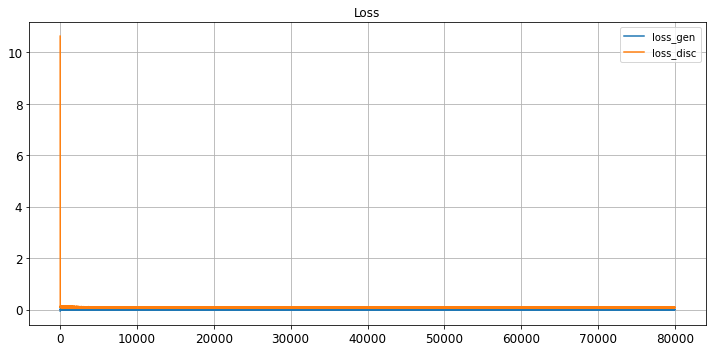

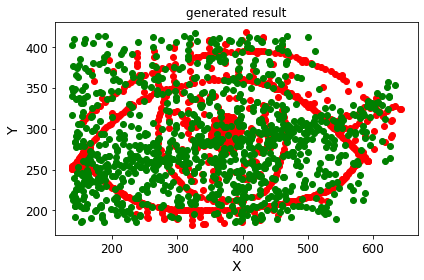

save the model & result
Epoch 80001/100000
critic: 0.086862 - generator: -0.001243 - 0s
Epoch 80002/100000
critic: 0.083111 - generator: 0.004803 - 0s
Epoch 80003/100000
critic: 0.083663 - generator: 0.001673 - 0s
Epoch 80004/100000
critic: 0.094071 - generator: 0.003246 - 0s
Epoch 80005/100000
critic: 0.072917 - generator: 0.001085 - 0s
Epoch 80006/100000
critic: 0.078464 - generator: 0.005289 - 0s
Epoch 80007/100000
critic: 0.089426 - generator: 0.000428 - 0s
Epoch 80008/100000
critic: 0.089299 - generator: 0.003507 - 0s
Epoch 80009/100000
critic: 0.072990 - generator: 0.001434 - 0s
Epoch 80010/100000
critic: 0.078166 - generator: 0.000625 - 0s
Epoch 80011/100000
critic: 0.069460 - generator: 0.004238 - 0s
Epoch 80012/100000
critic: 0.085481 - generator: 0.004189 - 0s
Epoch 80013/100000
critic: 0.086032 - generator: 0.001680 - 0s
Epoch 80014/100000
critic: 0.078193 - generator: -0.001950 - 0s
Epoch 80015/100000
critic: 0.086946 - generator: 0.003661 - 0s
Epoch 80016/100000
critic: 0.

critic: 0.078780 - generator: 0.003652 - 0s
Epoch 80131/100000
critic: 0.084491 - generator: 0.006306 - 0s
Epoch 80132/100000
critic: 0.079024 - generator: 0.003011 - 0s
Epoch 80133/100000
critic: 0.080968 - generator: -0.000092 - 0s
Epoch 80134/100000
critic: 0.078743 - generator: -0.002923 - 0s
Epoch 80135/100000
critic: 0.081852 - generator: -0.004684 - 0s
Epoch 80136/100000
critic: 0.079116 - generator: -0.003757 - 0s
Epoch 80137/100000
critic: 0.088396 - generator: 0.001916 - 0s
Epoch 80138/100000
critic: 0.088958 - generator: 0.007990 - 0s
Epoch 80139/100000
critic: 0.087058 - generator: 0.000538 - 0s
Epoch 80140/100000
critic: 0.079151 - generator: 0.001082 - 0s
Epoch 80141/100000
critic: 0.085885 - generator: -0.001236 - 0s
Epoch 80142/100000
critic: 0.084613 - generator: -0.000536 - 0s
Epoch 80143/100000
critic: 0.076729 - generator: 0.004062 - 0s
Epoch 80144/100000
critic: 0.087452 - generator: -0.001512 - 0s
Epoch 80145/100000
critic: 0.075330 - generator: 0.000723 - 0s
Epoc

critic: 0.090967 - generator: 0.005359 - 0s
Epoch 80261/100000
critic: 0.076682 - generator: -0.001201 - 0s
Epoch 80262/100000
critic: 0.083652 - generator: -0.000586 - 0s
Epoch 80263/100000
critic: 0.084182 - generator: -0.002251 - 0s
Epoch 80264/100000
critic: 0.077803 - generator: 0.000358 - 0s
Epoch 80265/100000
critic: 0.087298 - generator: 0.002125 - 0s
Epoch 80266/100000
critic: 0.085619 - generator: -0.002140 - 0s
Epoch 80267/100000
critic: 0.079592 - generator: -0.000091 - 0s
Epoch 80268/100000
critic: 0.072946 - generator: -0.000446 - 0s
Epoch 80269/100000
critic: 0.079456 - generator: -0.003353 - 0s
Epoch 80270/100000
critic: 0.079159 - generator: -0.002445 - 0s
Epoch 80271/100000
critic: 0.082833 - generator: -0.002485 - 0s
Epoch 80272/100000
critic: 0.083991 - generator: 0.000580 - 0s
Epoch 80273/100000
critic: 0.088037 - generator: 0.001067 - 0s
Epoch 80274/100000
critic: 0.084641 - generator: -0.001723 - 0s
Epoch 80275/100000
critic: 0.079095 - generator: -0.000743 - 0s


critic: 0.085684 - generator: 0.002739 - 0s
Epoch 80391/100000
critic: 0.080936 - generator: 0.004652 - 0s
Epoch 80392/100000
critic: 0.081600 - generator: -0.004302 - 0s
Epoch 80393/100000
critic: 0.076149 - generator: -0.001990 - 0s
Epoch 80394/100000
critic: 0.079268 - generator: 0.003157 - 0s
Epoch 80395/100000
critic: 0.076042 - generator: 0.002977 - 0s
Epoch 80396/100000
critic: 0.085681 - generator: 0.003993 - 0s
Epoch 80397/100000
critic: 0.086767 - generator: 0.003596 - 0s
Epoch 80398/100000
critic: 0.089075 - generator: -0.000498 - 0s
Epoch 80399/100000
critic: 0.082753 - generator: -0.000393 - 0s
Epoch 80400/100000
critic: 0.100646 - generator: -0.001116 - 0s
Epoch 80401/100000
critic: 0.076360 - generator: -0.000581 - 0s
Epoch 80402/100000
critic: 0.067296 - generator: 0.004681 - 0s
Epoch 80403/100000
critic: 0.094372 - generator: 0.000484 - 0s
Epoch 80404/100000
critic: 0.093540 - generator: 0.000745 - 0s
Epoch 80405/100000
critic: 0.085303 - generator: 0.000160 - 0s
Epoch

critic: 0.088046 - generator: -0.004139 - 0s
Epoch 80521/100000
critic: 0.074320 - generator: -0.000136 - 0s
Epoch 80522/100000
critic: 0.091355 - generator: 0.001891 - 0s
Epoch 80523/100000
critic: 0.074937 - generator: -0.002392 - 0s
Epoch 80524/100000
critic: 0.077417 - generator: 0.000727 - 0s
Epoch 80525/100000
critic: 0.076537 - generator: 0.001524 - 0s
Epoch 80526/100000
critic: 0.085831 - generator: 0.004206 - 0s
Epoch 80527/100000
critic: 0.085334 - generator: 0.005271 - 0s
Epoch 80528/100000
critic: 0.072050 - generator: -0.003634 - 0s
Epoch 80529/100000
critic: 0.077475 - generator: 0.004644 - 0s
Epoch 80530/100000
critic: 0.080198 - generator: 0.004248 - 0s
Epoch 80531/100000
critic: 0.084237 - generator: 0.001439 - 0s
Epoch 80532/100000
critic: 0.085720 - generator: 0.004556 - 0s
Epoch 80533/100000
critic: 0.081299 - generator: 0.000465 - 0s
Epoch 80534/100000
critic: 0.077258 - generator: -0.000614 - 0s
Epoch 80535/100000
critic: 0.077451 - generator: 0.003457 - 0s
Epoch 

critic: 0.070891 - generator: 0.000659 - 0s
Epoch 80651/100000
critic: 0.082997 - generator: -0.000849 - 0s
Epoch 80652/100000
critic: 0.081648 - generator: -0.001863 - 0s
Epoch 80653/100000
critic: 0.086775 - generator: -0.004182 - 0s
Epoch 80654/100000
critic: 0.065858 - generator: -0.002852 - 0s
Epoch 80655/100000
critic: 0.079975 - generator: -0.000844 - 0s
Epoch 80656/100000
critic: 0.070748 - generator: 0.006674 - 0s
Epoch 80657/100000
critic: 0.086513 - generator: -0.002981 - 0s
Epoch 80658/100000
critic: 0.082982 - generator: -0.001665 - 0s
Epoch 80659/100000
critic: 0.086474 - generator: -0.003498 - 0s
Epoch 80660/100000
critic: 0.074124 - generator: -0.000469 - 0s
Epoch 80661/100000
critic: 0.084872 - generator: 0.001470 - 0s
Epoch 80662/100000
critic: 0.072506 - generator: -0.000916 - 0s
Epoch 80663/100000
critic: 0.074368 - generator: -0.005522 - 0s
Epoch 80664/100000
critic: 0.090569 - generator: -0.000838 - 0s
Epoch 80665/100000
critic: 0.079578 - generator: 0.001028 - 0s

critic: 0.082177 - generator: 0.001880 - 0s
Epoch 80781/100000
critic: 0.081133 - generator: 0.003467 - 0s
Epoch 80782/100000
critic: 0.079149 - generator: 0.000275 - 0s
Epoch 80783/100000
critic: 0.074023 - generator: 0.002709 - 0s
Epoch 80784/100000
critic: 0.089498 - generator: 0.007742 - 0s
Epoch 80785/100000
critic: 0.085551 - generator: 0.000907 - 0s
Epoch 80786/100000
critic: 0.082445 - generator: -0.004177 - 0s
Epoch 80787/100000
critic: 0.084961 - generator: -0.002468 - 0s
Epoch 80788/100000
critic: 0.068286 - generator: 0.000917 - 0s
Epoch 80789/100000
critic: 0.074419 - generator: 0.004923 - 0s
Epoch 80790/100000
critic: 0.075625 - generator: 0.004662 - 0s
Epoch 80791/100000
critic: 0.090208 - generator: -0.001625 - 0s
Epoch 80792/100000
critic: 0.079247 - generator: -0.005602 - 0s
Epoch 80793/100000
critic: 0.076873 - generator: -0.001038 - 0s
Epoch 80794/100000
critic: 0.088019 - generator: -0.004351 - 0s
Epoch 80795/100000
critic: 0.069653 - generator: -0.007279 - 0s
Epoc

critic: 0.072452 - generator: -0.004374 - 0s
Epoch 80911/100000
critic: 0.090683 - generator: -0.001249 - 0s
Epoch 80912/100000
critic: 0.074279 - generator: 0.003500 - 0s
Epoch 80913/100000
critic: 0.077616 - generator: -0.001305 - 0s
Epoch 80914/100000
critic: 0.085604 - generator: 0.000113 - 0s
Epoch 80915/100000
critic: 0.074057 - generator: -0.001995 - 0s
Epoch 80916/100000
critic: 0.086435 - generator: 0.005219 - 0s
Epoch 80917/100000
critic: 0.080670 - generator: 0.001419 - 0s
Epoch 80918/100000
critic: 0.091372 - generator: 0.001618 - 0s
Epoch 80919/100000
critic: 0.070837 - generator: -0.000635 - 0s
Epoch 80920/100000
critic: 0.083949 - generator: 0.001124 - 0s
Epoch 80921/100000
critic: 0.084610 - generator: -0.000259 - 0s
Epoch 80922/100000
critic: 0.083844 - generator: 0.002167 - 0s
Epoch 80923/100000
critic: 0.080957 - generator: 0.000998 - 0s
Epoch 80924/100000
critic: 0.064768 - generator: 0.003251 - 0s
Epoch 80925/100000
critic: 0.094551 - generator: 0.003020 - 0s
Epoch

critic: 0.075997 - generator: -0.001052 - 0s
Epoch 81041/100000
critic: 0.081374 - generator: -0.000336 - 0s
Epoch 81042/100000
critic: 0.081713 - generator: 0.001110 - 0s
Epoch 81043/100000
critic: 0.092231 - generator: 0.001813 - 0s
Epoch 81044/100000
critic: 0.075987 - generator: 0.003331 - 0s
Epoch 81045/100000
critic: 0.069156 - generator: -0.001905 - 0s
Epoch 81046/100000
critic: 0.078523 - generator: -0.000566 - 0s
Epoch 81047/100000
critic: 0.078288 - generator: 0.001129 - 0s
Epoch 81048/100000
critic: 0.083401 - generator: -0.002657 - 0s
Epoch 81049/100000
critic: 0.070971 - generator: -0.000575 - 0s
Epoch 81050/100000
critic: 0.084369 - generator: -0.002352 - 0s
Epoch 81051/100000
critic: 0.075024 - generator: 0.002672 - 0s
Epoch 81052/100000
critic: 0.084916 - generator: -0.002692 - 0s
Epoch 81053/100000
critic: 0.087480 - generator: -0.003142 - 0s
Epoch 81054/100000
critic: 0.084900 - generator: 0.001045 - 0s
Epoch 81055/100000
critic: 0.079624 - generator: 0.002265 - 0s
Ep

critic: 0.073428 - generator: -0.000886 - 0s
Epoch 81171/100000
critic: 0.088535 - generator: -0.001684 - 0s
Epoch 81172/100000
critic: 0.088565 - generator: 0.001477 - 0s
Epoch 81173/100000
critic: 0.081292 - generator: -0.002067 - 0s
Epoch 81174/100000
critic: 0.068746 - generator: 0.000490 - 0s
Epoch 81175/100000
critic: 0.087436 - generator: 0.001028 - 0s
Epoch 81176/100000
critic: 0.077463 - generator: 0.000785 - 0s
Epoch 81177/100000
critic: 0.089108 - generator: -0.000976 - 0s
Epoch 81178/100000
critic: 0.076585 - generator: 0.000465 - 0s
Epoch 81179/100000
critic: 0.089063 - generator: 0.002022 - 0s
Epoch 81180/100000
critic: 0.079081 - generator: -0.001292 - 0s
Epoch 81181/100000
critic: 0.068217 - generator: -0.001049 - 0s
Epoch 81182/100000
critic: 0.088871 - generator: -0.000465 - 0s
Epoch 81183/100000
critic: 0.076328 - generator: -0.000096 - 0s
Epoch 81184/100000
critic: 0.078448 - generator: 0.000977 - 0s
Epoch 81185/100000
critic: 0.082592 - generator: -0.000869 - 0s
Ep

critic: 0.073564 - generator: -0.000546 - 0s
Epoch 81302/100000
critic: 0.085918 - generator: -0.000753 - 0s
Epoch 81303/100000
critic: 0.079874 - generator: -0.001485 - 0s
Epoch 81304/100000
critic: 0.077741 - generator: 0.000359 - 0s
Epoch 81305/100000
critic: 0.081069 - generator: -0.003370 - 0s
Epoch 81306/100000
critic: 0.085134 - generator: -0.002385 - 0s
Epoch 81307/100000
critic: 0.084915 - generator: 0.002133 - 0s
Epoch 81308/100000
critic: 0.070193 - generator: 0.000761 - 0s
Epoch 81309/100000
critic: 0.073908 - generator: 0.001611 - 0s
Epoch 81310/100000
critic: 0.081028 - generator: 0.002640 - 0s
Epoch 81311/100000
critic: 0.075925 - generator: -0.000375 - 0s
Epoch 81312/100000
critic: 0.072883 - generator: 0.002741 - 0s
Epoch 81313/100000
critic: 0.075196 - generator: 0.001524 - 0s
Epoch 81314/100000
critic: 0.074477 - generator: 0.002307 - 0s
Epoch 81315/100000
critic: 0.084458 - generator: 0.003814 - 0s
Epoch 81316/100000
critic: 0.085847 - generator: 0.002189 - 0s
Epoch

critic: 0.083827 - generator: -0.005002 - 0s
Epoch 81432/100000
critic: 0.074083 - generator: -0.001552 - 0s
Epoch 81433/100000
critic: 0.084917 - generator: -0.003257 - 0s
Epoch 81434/100000
critic: 0.081145 - generator: 0.002454 - 0s
Epoch 81435/100000
critic: 0.080541 - generator: -0.000004 - 0s
Epoch 81436/100000
critic: 0.079207 - generator: -0.001223 - 0s
Epoch 81437/100000
critic: 0.075810 - generator: 0.005800 - 0s
Epoch 81438/100000
critic: 0.086443 - generator: 0.001331 - 0s
Epoch 81439/100000
critic: 0.078268 - generator: -0.001529 - 0s
Epoch 81440/100000
critic: 0.075242 - generator: 0.002362 - 0s
Epoch 81441/100000
critic: 0.082986 - generator: 0.003213 - 0s
Epoch 81442/100000
critic: 0.061271 - generator: -0.002897 - 0s
Epoch 81443/100000
critic: 0.087458 - generator: 0.000883 - 0s
Epoch 81444/100000
critic: 0.073300 - generator: 0.001892 - 0s
Epoch 81445/100000
critic: 0.076243 - generator: -0.001596 - 0s
Epoch 81446/100000
critic: 0.088333 - generator: -0.002164 - 0s
Ep

critic: 0.073784 - generator: -0.001839 - 0s
Epoch 81562/100000
critic: 0.084808 - generator: 0.000336 - 0s
Epoch 81563/100000
critic: 0.072287 - generator: 0.002624 - 0s
Epoch 81564/100000
critic: 0.082154 - generator: 0.000128 - 0s
Epoch 81565/100000
critic: 0.080244 - generator: 0.001259 - 0s
Epoch 81566/100000
critic: 0.097244 - generator: -0.004702 - 0s
Epoch 81567/100000
critic: 0.090306 - generator: -0.000680 - 0s
Epoch 81568/100000
critic: 0.077263 - generator: 0.000735 - 0s
Epoch 81569/100000
critic: 0.066895 - generator: 0.000072 - 0s
Epoch 81570/100000
critic: 0.070539 - generator: 0.002188 - 0s
Epoch 81571/100000
critic: 0.085862 - generator: -0.001348 - 0s
Epoch 81572/100000
critic: 0.069312 - generator: 0.001948 - 0s
Epoch 81573/100000
critic: 0.078239 - generator: 0.002888 - 0s
Epoch 81574/100000
critic: 0.069348 - generator: -0.001246 - 0s
Epoch 81575/100000
critic: 0.077216 - generator: -0.004453 - 0s
Epoch 81576/100000
critic: 0.080994 - generator: 0.000543 - 0s
Epoch

critic: 0.085735 - generator: 0.002060 - 0s
Epoch 81692/100000
critic: 0.088456 - generator: 0.000633 - 0s
Epoch 81693/100000
critic: 0.077822 - generator: -0.001494 - 0s
Epoch 81694/100000
critic: 0.073467 - generator: -0.002176 - 0s
Epoch 81695/100000
critic: 0.080126 - generator: 0.001408 - 0s
Epoch 81696/100000
critic: 0.077667 - generator: 0.002777 - 0s
Epoch 81697/100000
critic: 0.082891 - generator: 0.003160 - 0s
Epoch 81698/100000
critic: 0.082763 - generator: 0.003673 - 0s
Epoch 81699/100000
critic: 0.068215 - generator: 0.005555 - 0s
Epoch 81700/100000
critic: 0.085160 - generator: 0.000677 - 0s
Epoch 81701/100000
critic: 0.077856 - generator: 0.000695 - 0s
Epoch 81702/100000
critic: 0.093945 - generator: -0.001927 - 0s
Epoch 81703/100000
critic: 0.070640 - generator: -0.000459 - 0s
Epoch 81704/100000
critic: 0.081599 - generator: 0.001207 - 0s
Epoch 81705/100000
critic: 0.071289 - generator: 0.001664 - 0s
Epoch 81706/100000
critic: 0.078499 - generator: -0.006065 - 0s
Epoch 

critic: 0.088304 - generator: 0.002564 - 0s
Epoch 81822/100000
critic: 0.086153 - generator: 0.003242 - 0s
Epoch 81823/100000
critic: 0.080157 - generator: 0.001362 - 0s
Epoch 81824/100000
critic: 0.072826 - generator: -0.005349 - 0s
Epoch 81825/100000
critic: 0.076663 - generator: -0.008862 - 0s
Epoch 81826/100000
critic: 0.090732 - generator: -0.003004 - 0s
Epoch 81827/100000
critic: 0.065312 - generator: 0.001437 - 0s
Epoch 81828/100000
critic: 0.074499 - generator: 0.001631 - 0s
Epoch 81829/100000
critic: 0.103632 - generator: 0.003617 - 0s
Epoch 81830/100000
critic: 0.075932 - generator: 0.001068 - 0s
Epoch 81831/100000
critic: 0.088000 - generator: -0.001851 - 0s
Epoch 81832/100000
critic: 0.075624 - generator: 0.001250 - 0s
Epoch 81833/100000
critic: 0.089084 - generator: -0.005133 - 0s
Epoch 81834/100000
critic: 0.080306 - generator: -0.000677 - 0s
Epoch 81835/100000
critic: 0.080333 - generator: 0.000340 - 0s
Epoch 81836/100000
critic: 0.077251 - generator: 0.003336 - 0s
Epoch

critic: 0.078473 - generator: 0.002702 - 0s
Epoch 81952/100000
critic: 0.081094 - generator: 0.002018 - 0s
Epoch 81953/100000
critic: 0.077288 - generator: 0.000691 - 0s
Epoch 81954/100000
critic: 0.078847 - generator: -0.003396 - 0s
Epoch 81955/100000
critic: 0.082262 - generator: -0.000591 - 0s
Epoch 81956/100000
critic: 0.084199 - generator: -0.003250 - 0s
Epoch 81957/100000
critic: 0.091875 - generator: -0.002245 - 0s
Epoch 81958/100000
critic: 0.077226 - generator: 0.004438 - 0s
Epoch 81959/100000
critic: 0.083933 - generator: 0.001415 - 0s
Epoch 81960/100000
critic: 0.081868 - generator: 0.002691 - 0s
Epoch 81961/100000
critic: 0.090773 - generator: 0.004517 - 0s
Epoch 81962/100000
critic: 0.081907 - generator: -0.001548 - 0s
Epoch 81963/100000
critic: 0.077470 - generator: 0.001406 - 0s
Epoch 81964/100000
critic: 0.078289 - generator: 0.000641 - 0s
Epoch 81965/100000
critic: 0.079260 - generator: 0.006514 - 0s
Epoch 81966/100000
critic: 0.084857 - generator: 0.002902 - 0s
Epoch 

critic: 0.078083 - generator: 0.001863 - 0s
Epoch 82082/100000
critic: 0.080330 - generator: 0.002010 - 0s
Epoch 82083/100000
critic: 0.076310 - generator: -0.001359 - 0s
Epoch 82084/100000
critic: 0.084244 - generator: 0.001375 - 0s
Epoch 82085/100000
critic: 0.088494 - generator: 0.001208 - 0s
Epoch 82086/100000
critic: 0.080414 - generator: 0.002443 - 0s
Epoch 82087/100000
critic: 0.083009 - generator: -0.002201 - 0s
Epoch 82088/100000
critic: 0.081877 - generator: 0.003205 - 0s
Epoch 82089/100000
critic: 0.093950 - generator: -0.000713 - 0s
Epoch 82090/100000
critic: 0.065717 - generator: 0.003432 - 0s
Epoch 82091/100000
critic: 0.087079 - generator: 0.002087 - 0s
Epoch 82092/100000
critic: 0.078045 - generator: -0.000136 - 0s
Epoch 82093/100000
critic: 0.072509 - generator: 0.001610 - 0s
Epoch 82094/100000
critic: 0.074387 - generator: -0.003460 - 0s
Epoch 82095/100000
critic: 0.089578 - generator: -0.001144 - 0s
Epoch 82096/100000
critic: 0.086739 - generator: -0.004237 - 0s
Epoc

critic: 0.079898 - generator: 0.003816 - 0s
Epoch 82211/100000
critic: 0.074271 - generator: 0.004461 - 0s
Epoch 82212/100000
critic: 0.067031 - generator: 0.006493 - 0s
Epoch 82213/100000
critic: 0.077400 - generator: 0.004634 - 0s
Epoch 82214/100000
critic: 0.081832 - generator: 0.000112 - 0s
Epoch 82215/100000
critic: 0.077889 - generator: -0.000629 - 0s
Epoch 82216/100000
critic: 0.081729 - generator: -0.000732 - 0s
Epoch 82217/100000
critic: 0.091569 - generator: 0.001608 - 0s
Epoch 82218/100000
critic: 0.075241 - generator: 0.006800 - 0s
Epoch 82219/100000
critic: 0.066696 - generator: 0.003707 - 0s
Epoch 82220/100000
critic: 0.098617 - generator: -0.002761 - 0s
Epoch 82221/100000
critic: 0.080123 - generator: 0.000987 - 0s
Epoch 82222/100000
critic: 0.083942 - generator: 0.002433 - 0s
Epoch 82223/100000
critic: 0.078641 - generator: 0.001054 - 0s
Epoch 82224/100000
critic: 0.079521 - generator: 0.002208 - 0s
Epoch 82225/100000
critic: 0.073966 - generator: 0.001400 - 0s
Epoch 82

critic: 0.075847 - generator: -0.005395 - 0s
Epoch 82341/100000
critic: 0.082670 - generator: -0.003944 - 0s
Epoch 82342/100000
critic: 0.078397 - generator: -0.002482 - 0s
Epoch 82343/100000
critic: 0.077335 - generator: -0.007632 - 0s
Epoch 82344/100000
critic: 0.084162 - generator: -0.000336 - 0s
Epoch 82345/100000
critic: 0.092814 - generator: -0.000853 - 0s
Epoch 82346/100000
critic: 0.080064 - generator: -0.001317 - 0s
Epoch 82347/100000
critic: 0.084464 - generator: -0.000811 - 0s
Epoch 82348/100000
critic: 0.065670 - generator: -0.001495 - 0s
Epoch 82349/100000
critic: 0.087762 - generator: 0.000798 - 0s
Epoch 82350/100000
critic: 0.089401 - generator: 0.002556 - 0s
Epoch 82351/100000
critic: 0.082749 - generator: 0.000011 - 0s
Epoch 82352/100000
critic: 0.078212 - generator: -0.002888 - 0s
Epoch 82353/100000
critic: 0.087944 - generator: -0.000793 - 0s
Epoch 82354/100000
critic: 0.082016 - generator: -0.000704 - 0s
Epoch 82355/100000
critic: 0.079847 - generator: 0.002926 - 0s

critic: 0.086145 - generator: -0.000994 - 0s
Epoch 82471/100000
critic: 0.075542 - generator: 0.002897 - 0s
Epoch 82472/100000
critic: 0.082386 - generator: 0.005524 - 0s
Epoch 82473/100000
critic: 0.090719 - generator: -0.005198 - 0s
Epoch 82474/100000
critic: 0.085670 - generator: 0.002422 - 0s
Epoch 82475/100000
critic: 0.081119 - generator: -0.001835 - 0s
Epoch 82476/100000
critic: 0.074725 - generator: 0.000964 - 0s
Epoch 82477/100000
critic: 0.077103 - generator: 0.001839 - 0s
Epoch 82478/100000
critic: 0.091924 - generator: -0.001960 - 0s
Epoch 82479/100000
critic: 0.082866 - generator: 0.001283 - 0s
Epoch 82480/100000
critic: 0.083670 - generator: -0.000384 - 0s
Epoch 82481/100000
critic: 0.084400 - generator: -0.000510 - 0s
Epoch 82482/100000
critic: 0.080057 - generator: -0.000797 - 0s
Epoch 82483/100000
critic: 0.067592 - generator: 0.002296 - 0s
Epoch 82484/100000
critic: 0.077835 - generator: 0.005343 - 0s
Epoch 82485/100000
critic: 0.082981 - generator: 0.004405 - 0s
Epoc

critic: 0.081442 - generator: -0.004786 - 0s
Epoch 82601/100000
critic: 0.075251 - generator: -0.002378 - 0s
Epoch 82602/100000
critic: 0.091557 - generator: 0.001490 - 0s
Epoch 82603/100000
critic: 0.083216 - generator: -0.005133 - 0s
Epoch 82604/100000
critic: 0.078970 - generator: -0.000994 - 0s
Epoch 82605/100000
critic: 0.080156 - generator: 0.000189 - 0s
Epoch 82606/100000
critic: 0.087292 - generator: -0.004230 - 0s
Epoch 82607/100000
critic: 0.075965 - generator: 0.001462 - 0s
Epoch 82608/100000
critic: 0.090031 - generator: 0.001011 - 0s
Epoch 82609/100000
critic: 0.072679 - generator: 0.003669 - 0s
Epoch 82610/100000
critic: 0.072393 - generator: 0.003134 - 0s
Epoch 82611/100000
critic: 0.083428 - generator: 0.001112 - 0s
Epoch 82612/100000
critic: 0.075307 - generator: -0.002518 - 0s
Epoch 82613/100000
critic: 0.087137 - generator: -0.001881 - 0s
Epoch 82614/100000
critic: 0.078755 - generator: 0.002643 - 0s
Epoch 82615/100000
critic: 0.078164 - generator: 0.000701 - 0s
Epoc

critic: 0.087310 - generator: 0.000546 - 0s
Epoch 82731/100000
critic: 0.080226 - generator: 0.003827 - 0s
Epoch 82732/100000
critic: 0.081454 - generator: -0.000631 - 0s
Epoch 82733/100000
critic: 0.081867 - generator: -0.005030 - 0s
Epoch 82734/100000
critic: 0.071945 - generator: 0.001617 - 0s
Epoch 82735/100000
critic: 0.089043 - generator: 0.000626 - 0s
Epoch 82736/100000
critic: 0.082105 - generator: -0.002936 - 0s
Epoch 82737/100000
critic: 0.073373 - generator: 0.004278 - 0s
Epoch 82738/100000
critic: 0.089045 - generator: -0.000506 - 0s
Epoch 82739/100000
critic: 0.074834 - generator: 0.000513 - 0s
Epoch 82740/100000
critic: 0.078107 - generator: -0.001527 - 0s
Epoch 82741/100000
critic: 0.088624 - generator: 0.001308 - 0s
Epoch 82742/100000
critic: 0.080773 - generator: -0.002476 - 0s
Epoch 82743/100000
critic: 0.080401 - generator: -0.004291 - 0s
Epoch 82744/100000
critic: 0.079424 - generator: 0.003989 - 0s
Epoch 82745/100000
critic: 0.089683 - generator: -0.001467 - 0s
Epo

critic: 0.076665 - generator: -0.002512 - 0s
Epoch 82861/100000
critic: 0.080092 - generator: -0.003489 - 0s
Epoch 82862/100000
critic: 0.086445 - generator: 0.000948 - 0s
Epoch 82863/100000
critic: 0.065245 - generator: 0.005216 - 0s
Epoch 82864/100000
critic: 0.086574 - generator: 0.001685 - 0s
Epoch 82865/100000
critic: 0.087074 - generator: -0.000907 - 0s
Epoch 82866/100000
critic: 0.084457 - generator: -0.000769 - 0s
Epoch 82867/100000
critic: 0.079952 - generator: -0.004774 - 0s
Epoch 82868/100000
critic: 0.084705 - generator: 0.000430 - 0s
Epoch 82869/100000
critic: 0.078968 - generator: 0.002420 - 0s
Epoch 82870/100000
critic: 0.080453 - generator: 0.006113 - 0s
Epoch 82871/100000
critic: 0.099694 - generator: 0.000131 - 0s
Epoch 82872/100000
critic: 0.087263 - generator: -0.001205 - 0s
Epoch 82873/100000
critic: 0.072492 - generator: -0.002349 - 0s
Epoch 82874/100000
critic: 0.081671 - generator: -0.004826 - 0s
Epoch 82875/100000
critic: 0.080686 - generator: -0.002222 - 0s
Ep

critic: 0.077383 - generator: -0.002171 - 0s
Epoch 82992/100000
critic: 0.077313 - generator: 0.002270 - 0s
Epoch 82993/100000
critic: 0.080637 - generator: 0.001954 - 0s
Epoch 82994/100000
critic: 0.077982 - generator: 0.001926 - 0s
Epoch 82995/100000
critic: 0.082426 - generator: 0.003271 - 0s
Epoch 82996/100000
critic: 0.081874 - generator: -0.001282 - 0s
Epoch 82997/100000
critic: 0.079501 - generator: -0.003113 - 0s
Epoch 82998/100000
critic: 0.080751 - generator: 0.001468 - 0s
Epoch 82999/100000
critic: 0.072987 - generator: 0.002192 - 0s
Epoch 83000/100000
critic: 0.077413 - generator: -0.001012 - 0s
Epoch 83001/100000
critic: 0.069463 - generator: -0.003524 - 0s
Epoch 83002/100000
critic: 0.081610 - generator: -0.002308 - 0s
Epoch 83003/100000
critic: 0.069839 - generator: -0.004417 - 0s
Epoch 83004/100000
critic: 0.087860 - generator: -0.005252 - 0s
Epoch 83005/100000
critic: 0.087733 - generator: -0.002507 - 0s
Epoch 83006/100000
critic: 0.077339 - generator: -0.001835 - 0s
E

critic: 0.085065 - generator: -0.003037 - 0s
Epoch 83122/100000
critic: 0.074035 - generator: 0.002455 - 0s
Epoch 83123/100000
critic: 0.087719 - generator: 0.004740 - 0s
Epoch 83124/100000
critic: 0.082005 - generator: 0.000240 - 0s
Epoch 83125/100000
critic: 0.081434 - generator: 0.001251 - 0s
Epoch 83126/100000
critic: 0.077534 - generator: 0.001774 - 0s
Epoch 83127/100000
critic: 0.073079 - generator: 0.000899 - 0s
Epoch 83128/100000
critic: 0.077769 - generator: 0.001548 - 0s
Epoch 83129/100000
critic: 0.078193 - generator: -0.000196 - 0s
Epoch 83130/100000
critic: 0.085218 - generator: -0.002687 - 0s
Epoch 83131/100000
critic: 0.080753 - generator: -0.001156 - 0s
Epoch 83132/100000
critic: 0.083346 - generator: -0.003982 - 0s
Epoch 83133/100000
critic: 0.082964 - generator: -0.001940 - 0s
Epoch 83134/100000
critic: 0.071684 - generator: 0.004158 - 0s
Epoch 83135/100000
critic: 0.077106 - generator: 0.006050 - 0s
Epoch 83136/100000
critic: 0.080422 - generator: 0.002083 - 0s
Epoch

critic: 0.087906 - generator: -0.000295 - 0s
Epoch 83252/100000
critic: 0.085981 - generator: 0.002129 - 0s
Epoch 83253/100000
critic: 0.079498 - generator: -0.001565 - 0s
Epoch 83254/100000
critic: 0.079073 - generator: 0.003051 - 0s
Epoch 83255/100000
critic: 0.081014 - generator: 0.000513 - 0s
Epoch 83256/100000
critic: 0.080938 - generator: -0.000756 - 0s
Epoch 83257/100000
critic: 0.077556 - generator: -0.004826 - 0s
Epoch 83258/100000
critic: 0.074194 - generator: -0.000903 - 0s
Epoch 83259/100000
critic: 0.075879 - generator: -0.002362 - 0s
Epoch 83260/100000
critic: 0.078101 - generator: -0.001888 - 0s
Epoch 83261/100000
critic: 0.084244 - generator: 0.005292 - 0s
Epoch 83262/100000
critic: 0.079372 - generator: 0.001971 - 0s
Epoch 83263/100000
critic: 0.069690 - generator: 0.004261 - 0s
Epoch 83264/100000
critic: 0.075678 - generator: 0.001994 - 0s
Epoch 83265/100000
critic: 0.070741 - generator: -0.001552 - 0s
Epoch 83266/100000
critic: 0.084694 - generator: -0.000726 - 0s
Ep

critic: 0.077292 - generator: 0.002115 - 0s
Epoch 83382/100000
critic: 0.084484 - generator: -0.001577 - 0s
Epoch 83383/100000
critic: 0.078970 - generator: -0.001638 - 0s
Epoch 83384/100000
critic: 0.078670 - generator: 0.004008 - 0s
Epoch 83385/100000
critic: 0.076692 - generator: -0.004186 - 0s
Epoch 83386/100000
critic: 0.085776 - generator: 0.004278 - 0s
Epoch 83387/100000
critic: 0.076272 - generator: 0.003376 - 0s
Epoch 83388/100000
critic: 0.089010 - generator: 0.001809 - 0s
Epoch 83389/100000
critic: 0.086140 - generator: 0.004051 - 0s
Epoch 83390/100000
critic: 0.081199 - generator: 0.001393 - 0s
Epoch 83391/100000
critic: 0.074073 - generator: 0.002188 - 0s
Epoch 83392/100000
critic: 0.085682 - generator: 0.003528 - 0s
Epoch 83393/100000
critic: 0.086090 - generator: 0.001351 - 0s
Epoch 83394/100000
critic: 0.076867 - generator: -0.001023 - 0s
Epoch 83395/100000
critic: 0.089002 - generator: 0.002959 - 0s
Epoch 83396/100000
critic: 0.081841 - generator: 0.001461 - 0s
Epoch 8

critic: 0.078617 - generator: -0.001220 - 0s
Epoch 83512/100000
critic: 0.081005 - generator: -0.001841 - 0s
Epoch 83513/100000
critic: 0.086583 - generator: -0.001628 - 0s
Epoch 83514/100000
critic: 0.071770 - generator: -0.006457 - 0s
Epoch 83515/100000
critic: 0.084307 - generator: 0.000967 - 0s
Epoch 83516/100000
critic: 0.066800 - generator: 0.004148 - 0s
Epoch 83517/100000
critic: 0.081253 - generator: 0.002020 - 0s
Epoch 83518/100000
critic: 0.073802 - generator: 0.003128 - 0s
Epoch 83519/100000
critic: 0.080434 - generator: 0.005389 - 0s
Epoch 83520/100000
critic: 0.089964 - generator: -0.002283 - 0s
Epoch 83521/100000
critic: 0.079612 - generator: 0.001398 - 0s
Epoch 83522/100000
critic: 0.090311 - generator: -0.000733 - 0s
Epoch 83523/100000
critic: 0.082322 - generator: 0.000980 - 0s
Epoch 83524/100000
critic: 0.075627 - generator: 0.002087 - 0s
Epoch 83525/100000
critic: 0.078067 - generator: 0.002632 - 0s
Epoch 83526/100000
critic: 0.082947 - generator: -0.001852 - 0s
Epoc

critic: 0.084445 - generator: -0.002255 - 0s
Epoch 83642/100000
critic: 0.072436 - generator: 0.001324 - 0s
Epoch 83643/100000
critic: 0.082639 - generator: 0.002510 - 0s
Epoch 83644/100000
critic: 0.077843 - generator: 0.000703 - 0s
Epoch 83645/100000
critic: 0.080224 - generator: 0.001642 - 0s
Epoch 83646/100000
critic: 0.081077 - generator: -0.002988 - 0s
Epoch 83647/100000
critic: 0.076919 - generator: -0.003388 - 0s
Epoch 83648/100000
critic: 0.076214 - generator: 0.003877 - 0s
Epoch 83649/100000
critic: 0.082250 - generator: 0.001511 - 0s
Epoch 83650/100000
critic: 0.076695 - generator: -0.001995 - 0s
Epoch 83651/100000
critic: 0.081897 - generator: -0.000440 - 0s
Epoch 83652/100000
critic: 0.082278 - generator: -0.000590 - 0s
Epoch 83653/100000
critic: 0.071091 - generator: 0.001850 - 0s
Epoch 83654/100000
critic: 0.077590 - generator: -0.003595 - 0s
Epoch 83655/100000
critic: 0.083220 - generator: -0.004120 - 0s
Epoch 83656/100000
critic: 0.088600 - generator: -0.000868 - 0s
Ep

critic: 0.086489 - generator: 0.000997 - 0s
Epoch 83772/100000
critic: 0.088407 - generator: 0.001150 - 0s
Epoch 83773/100000
critic: 0.070953 - generator: -0.000001 - 0s
Epoch 83774/100000
critic: 0.080898 - generator: 0.003729 - 0s
Epoch 83775/100000
critic: 0.086864 - generator: 0.006558 - 0s
Epoch 83776/100000
critic: 0.079250 - generator: -0.001243 - 0s
Epoch 83777/100000
critic: 0.080370 - generator: -0.002507 - 0s
Epoch 83778/100000
critic: 0.079461 - generator: 0.002231 - 0s
Epoch 83779/100000
critic: 0.074977 - generator: -0.000846 - 0s
Epoch 83780/100000
critic: 0.072444 - generator: -0.000842 - 0s
Epoch 83781/100000
critic: 0.080181 - generator: 0.000873 - 0s
Epoch 83782/100000
critic: 0.073064 - generator: -0.001251 - 0s
Epoch 83783/100000
critic: 0.080800 - generator: 0.001879 - 0s
Epoch 83784/100000
critic: 0.076804 - generator: -0.002191 - 0s
Epoch 83785/100000
critic: 0.082797 - generator: -0.007457 - 0s
Epoch 83786/100000
critic: 0.084599 - generator: -0.002733 - 0s
Ep

critic: 0.077130 - generator: 0.002729 - 0s
Epoch 83902/100000
critic: 0.076572 - generator: 0.008310 - 0s
Epoch 83903/100000
critic: 0.078665 - generator: 0.005525 - 0s
Epoch 83904/100000
critic: 0.089189 - generator: 0.002945 - 0s
Epoch 83905/100000
critic: 0.086174 - generator: 0.000884 - 0s
Epoch 83906/100000
critic: 0.075787 - generator: -0.000461 - 0s
Epoch 83907/100000
critic: 0.078612 - generator: 0.002073 - 0s
Epoch 83908/100000
critic: 0.086456 - generator: -0.004199 - 0s
Epoch 83909/100000
critic: 0.081657 - generator: -0.003568 - 0s
Epoch 83910/100000
critic: 0.089615 - generator: 0.001000 - 0s
Epoch 83911/100000
critic: 0.082325 - generator: 0.003231 - 0s
Epoch 83912/100000
critic: 0.075198 - generator: -0.000257 - 0s
Epoch 83913/100000
critic: 0.081101 - generator: -0.003274 - 0s
Epoch 83914/100000
critic: 0.084596 - generator: 0.003115 - 0s
Epoch 83915/100000
critic: 0.076971 - generator: -0.000709 - 0s
Epoch 83916/100000
critic: 0.086202 - generator: -0.001949 - 0s
Epoc

critic: 0.081293 - generator: 0.000248 - 0s
Epoch 84032/100000
critic: 0.085184 - generator: -0.001137 - 0s
Epoch 84033/100000
critic: 0.080168 - generator: -0.000778 - 0s
Epoch 84034/100000
critic: 0.080445 - generator: 0.003910 - 0s
Epoch 84035/100000
critic: 0.096582 - generator: -0.002306 - 0s
Epoch 84036/100000
critic: 0.082959 - generator: 0.002115 - 0s
Epoch 84037/100000
critic: 0.086527 - generator: 0.000221 - 0s
Epoch 84038/100000
critic: 0.080762 - generator: -0.001122 - 0s
Epoch 84039/100000
critic: 0.087396 - generator: 0.000934 - 0s
Epoch 84040/100000
critic: 0.086296 - generator: -0.003625 - 0s
Epoch 84041/100000
critic: 0.079760 - generator: -0.003303 - 0s
Epoch 84042/100000
critic: 0.072943 - generator: 0.001366 - 0s
Epoch 84043/100000
critic: 0.079701 - generator: 0.003213 - 0s
Epoch 84044/100000
critic: 0.074872 - generator: 0.003292 - 0s
Epoch 84045/100000
critic: 0.088571 - generator: 0.005254 - 0s
Epoch 84046/100000
critic: 0.079112 - generator: 0.001904 - 0s
Epoch

critic: 0.068893 - generator: 0.001821 - 0s
Epoch 84162/100000
critic: 0.076843 - generator: 0.005639 - 0s
Epoch 84163/100000
critic: 0.094488 - generator: 0.002974 - 0s
Epoch 84164/100000
critic: 0.071351 - generator: 0.002327 - 0s
Epoch 84165/100000
critic: 0.073147 - generator: 0.001988 - 0s
Epoch 84166/100000
critic: 0.079881 - generator: 0.002807 - 0s
Epoch 84167/100000
critic: 0.076737 - generator: 0.000721 - 0s
Epoch 84168/100000
critic: 0.091774 - generator: -0.004541 - 0s
Epoch 84169/100000
critic: 0.077100 - generator: -0.000539 - 0s
Epoch 84170/100000
critic: 0.085339 - generator: 0.001385 - 0s
Epoch 84171/100000
critic: 0.077775 - generator: -0.001501 - 0s
Epoch 84172/100000
critic: 0.080208 - generator: 0.000082 - 0s
Epoch 84173/100000
critic: 0.094601 - generator: 0.000892 - 0s
Epoch 84174/100000
critic: 0.076385 - generator: -0.002417 - 0s
Epoch 84175/100000
critic: 0.087147 - generator: -0.003330 - 0s
Epoch 84176/100000
critic: 0.083125 - generator: -0.000938 - 0s
Epoch

critic: 0.078607 - generator: -0.001267 - 0s
Epoch 84292/100000
critic: 0.075525 - generator: 0.003147 - 0s
Epoch 84293/100000
critic: 0.087715 - generator: 0.006722 - 0s
Epoch 84294/100000
critic: 0.079163 - generator: -0.000492 - 0s
Epoch 84295/100000
critic: 0.071261 - generator: -0.004037 - 0s
Epoch 84296/100000
critic: 0.077015 - generator: 0.003668 - 0s
Epoch 84297/100000
critic: 0.072543 - generator: -0.001639 - 0s
Epoch 84298/100000
critic: 0.088050 - generator: 0.001836 - 0s
Epoch 84299/100000
critic: 0.081462 - generator: -0.001807 - 0s
Epoch 84300/100000
critic: 0.081042 - generator: -0.001104 - 0s
Epoch 84301/100000
critic: 0.087520 - generator: -0.004338 - 0s
Epoch 84302/100000
critic: 0.083678 - generator: 0.004627 - 0s
Epoch 84303/100000
critic: 0.088839 - generator: -0.000382 - 0s
Epoch 84304/100000
critic: 0.068769 - generator: 0.005718 - 0s
Epoch 84305/100000
critic: 0.082896 - generator: -0.002072 - 0s
Epoch 84306/100000
critic: 0.088569 - generator: -0.003678 - 0s
E

critic: 0.076645 - generator: -0.002283 - 0s
Epoch 84422/100000
critic: 0.070127 - generator: -0.002713 - 0s
Epoch 84423/100000
critic: 0.078528 - generator: -0.001164 - 0s
Epoch 84424/100000
critic: 0.079566 - generator: -0.000354 - 0s
Epoch 84425/100000
critic: 0.092943 - generator: 0.002039 - 0s
Epoch 84426/100000
critic: 0.070855 - generator: -0.001629 - 0s
Epoch 84427/100000
critic: 0.095746 - generator: 0.000821 - 0s
Epoch 84428/100000
critic: 0.081328 - generator: 0.002712 - 0s
Epoch 84429/100000
critic: 0.077096 - generator: -0.001115 - 0s
Epoch 84430/100000
critic: 0.078407 - generator: -0.003628 - 0s
Epoch 84431/100000
critic: 0.090022 - generator: 0.004191 - 0s
Epoch 84432/100000
critic: 0.077337 - generator: 0.001366 - 0s
Epoch 84433/100000
critic: 0.076107 - generator: 0.001422 - 0s
Epoch 84434/100000
critic: 0.079563 - generator: 0.002448 - 0s
Epoch 84435/100000
critic: 0.072678 - generator: 0.002071 - 0s
Epoch 84436/100000
critic: 0.086639 - generator: 0.001576 - 0s
Epoc

critic: 0.082562 - generator: 0.000495 - 0s
Epoch 84552/100000
critic: 0.071840 - generator: 0.000452 - 0s
Epoch 84553/100000
critic: 0.086036 - generator: -0.002416 - 0s
Epoch 84554/100000
critic: 0.088066 - generator: 0.003959 - 0s
Epoch 84555/100000
critic: 0.086934 - generator: 0.001180 - 0s
Epoch 84556/100000
critic: 0.076932 - generator: -0.002691 - 0s
Epoch 84557/100000
critic: 0.073935 - generator: -0.003147 - 0s
Epoch 84558/100000
critic: 0.084511 - generator: -0.001279 - 0s
Epoch 84559/100000
critic: 0.075780 - generator: -0.004787 - 0s
Epoch 84560/100000
critic: 0.086790 - generator: -0.003336 - 0s
Epoch 84561/100000
critic: 0.081439 - generator: -0.000638 - 0s
Epoch 84562/100000
critic: 0.078425 - generator: -0.001531 - 0s
Epoch 84563/100000
critic: 0.079649 - generator: -0.004468 - 0s
Epoch 84564/100000
critic: 0.074610 - generator: -0.003791 - 0s
Epoch 84565/100000
critic: 0.087301 - generator: 0.003021 - 0s
Epoch 84566/100000
critic: 0.081578 - generator: 0.002909 - 0s
E

critic: 0.081502 - generator: 0.003857 - 0s
Epoch 84682/100000
critic: 0.081733 - generator: 0.005138 - 0s
Epoch 84683/100000
critic: 0.084398 - generator: 0.003556 - 0s
Epoch 84684/100000
critic: 0.089850 - generator: 0.000856 - 0s
Epoch 84685/100000
critic: 0.082479 - generator: 0.000874 - 0s
Epoch 84686/100000
critic: 0.076419 - generator: -0.002967 - 0s
Epoch 84687/100000
critic: 0.088681 - generator: -0.002877 - 0s
Epoch 84688/100000
critic: 0.074409 - generator: 0.001089 - 0s
Epoch 84689/100000
critic: 0.080529 - generator: 0.002263 - 0s
Epoch 84690/100000
critic: 0.083914 - generator: 0.002251 - 0s
Epoch 84691/100000
critic: 0.085123 - generator: 0.002502 - 0s
Epoch 84692/100000
critic: 0.079905 - generator: 0.001699 - 0s
Epoch 84693/100000
critic: 0.077627 - generator: 0.001467 - 0s
Epoch 84694/100000
critic: 0.082397 - generator: -0.001975 - 0s
Epoch 84695/100000
critic: 0.085100 - generator: 0.003962 - 0s
Epoch 84696/100000
critic: 0.083178 - generator: 0.006848 - 0s
Epoch 84

critic: 0.083683 - generator: 0.004615 - 0s
Epoch 84812/100000
critic: 0.086224 - generator: 0.002151 - 0s
Epoch 84813/100000
critic: 0.065614 - generator: 0.002218 - 0s
Epoch 84814/100000
critic: 0.085680 - generator: -0.003563 - 0s
Epoch 84815/100000
critic: 0.081496 - generator: 0.000462 - 0s
Epoch 84816/100000
critic: 0.076805 - generator: 0.001438 - 0s
Epoch 84817/100000
critic: 0.084524 - generator: 0.005225 - 0s
Epoch 84818/100000
critic: 0.077689 - generator: -0.000082 - 0s
Epoch 84819/100000
critic: 0.074726 - generator: -0.007874 - 0s
Epoch 84820/100000
critic: 0.087209 - generator: -0.002916 - 0s
Epoch 84821/100000
critic: 0.076812 - generator: -0.003965 - 0s
Epoch 84822/100000
critic: 0.077417 - generator: -0.003143 - 0s
Epoch 84823/100000
critic: 0.078760 - generator: -0.005414 - 0s
Epoch 84824/100000
critic: 0.082663 - generator: 0.002469 - 0s
Epoch 84825/100000
critic: 0.083286 - generator: -0.001272 - 0s
Epoch 84826/100000
critic: 0.082003 - generator: -0.005577 - 0s
Ep

critic: 0.078758 - generator: 0.005572 - 0s
Epoch 84942/100000
critic: 0.075692 - generator: 0.006158 - 0s
Epoch 84943/100000
critic: 0.074303 - generator: 0.004217 - 0s
Epoch 84944/100000
critic: 0.078201 - generator: 0.003224 - 0s
Epoch 84945/100000
critic: 0.089233 - generator: 0.001444 - 0s
Epoch 84946/100000
critic: 0.079955 - generator: -0.000403 - 0s
Epoch 84947/100000
critic: 0.077672 - generator: -0.000702 - 0s
Epoch 84948/100000
critic: 0.095213 - generator: -0.001454 - 0s
Epoch 84949/100000
critic: 0.070672 - generator: -0.002188 - 0s
Epoch 84950/100000
critic: 0.082187 - generator: -0.001812 - 0s
Epoch 84951/100000
critic: 0.068891 - generator: -0.008723 - 0s
Epoch 84952/100000
critic: 0.091428 - generator: 0.001325 - 0s
Epoch 84953/100000
critic: 0.074471 - generator: -0.001005 - 0s
Epoch 84954/100000
critic: 0.086277 - generator: -0.000515 - 0s
Epoch 84955/100000
critic: 0.079817 - generator: 0.005022 - 0s
Epoch 84956/100000
critic: 0.077901 - generator: 0.004560 - 0s
Epo

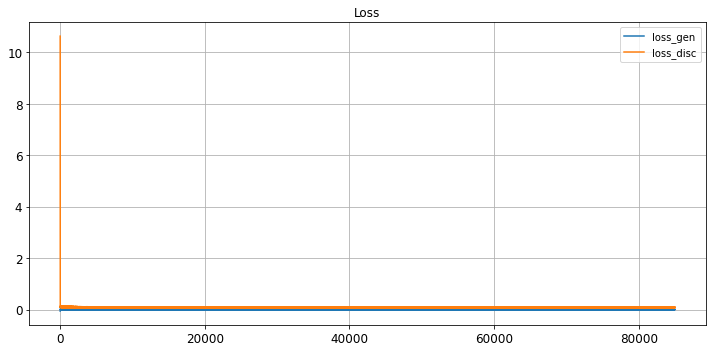

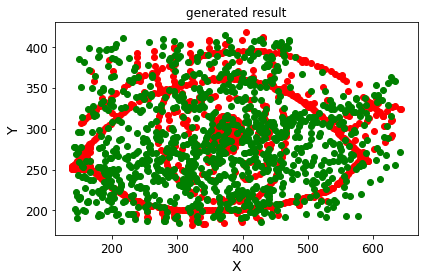

save the model & result
Epoch 85001/100000
critic: 0.074806 - generator: -0.004450 - 0s
Epoch 85002/100000
critic: 0.083913 - generator: -0.001011 - 0s
Epoch 85003/100000
critic: 0.078842 - generator: 0.004086 - 0s
Epoch 85004/100000
critic: 0.077767 - generator: 0.002545 - 0s
Epoch 85005/100000
critic: 0.085325 - generator: 0.004699 - 0s
Epoch 85006/100000
critic: 0.088296 - generator: -0.003092 - 0s
Epoch 85007/100000
critic: 0.076939 - generator: -0.002903 - 0s
Epoch 85008/100000
critic: 0.075313 - generator: -0.003264 - 0s
Epoch 85009/100000
critic: 0.087358 - generator: 0.000779 - 0s
Epoch 85010/100000
critic: 0.085722 - generator: 0.000718 - 0s
Epoch 85011/100000
critic: 0.078318 - generator: -0.002676 - 0s
Epoch 85012/100000
critic: 0.075708 - generator: -0.000921 - 0s
Epoch 85013/100000
critic: 0.080961 - generator: -0.001274 - 0s
Epoch 85014/100000
critic: 0.081174 - generator: -0.000493 - 0s
Epoch 85015/100000
critic: 0.084160 - generator: 0.001610 - 0s
Epoch 85016/100000
cri

critic: 0.081242 - generator: -0.003010 - 0s
Epoch 85132/100000
critic: 0.068004 - generator: -0.000354 - 0s
Epoch 85133/100000
critic: 0.083257 - generator: 0.001201 - 0s
Epoch 85134/100000
critic: 0.078802 - generator: 0.003140 - 0s
Epoch 85135/100000
critic: 0.077281 - generator: 0.002411 - 0s
Epoch 85136/100000
critic: 0.079054 - generator: -0.000095 - 0s
Epoch 85137/100000
critic: 0.088447 - generator: -0.003556 - 0s
Epoch 85138/100000
critic: 0.074241 - generator: -0.003345 - 0s
Epoch 85139/100000
critic: 0.082817 - generator: -0.000571 - 0s
Epoch 85140/100000
critic: 0.081020 - generator: -0.001338 - 0s
Epoch 85141/100000
critic: 0.082512 - generator: -0.004592 - 0s
Epoch 85142/100000
critic: 0.088297 - generator: -0.003198 - 0s
Epoch 85143/100000
critic: 0.084673 - generator: -0.002290 - 0s
Epoch 85144/100000
critic: 0.071026 - generator: 0.002246 - 0s
Epoch 85145/100000
critic: 0.072734 - generator: -0.004728 - 0s
Epoch 85146/100000
critic: 0.082780 - generator: 0.002206 - 0s


critic: 0.076443 - generator: -0.002983 - 0s
Epoch 85262/100000
critic: 0.086618 - generator: -0.000918 - 0s
Epoch 85263/100000
critic: 0.066041 - generator: -0.005405 - 0s
Epoch 85264/100000
critic: 0.081155 - generator: -0.001990 - 0s
Epoch 85265/100000
critic: 0.080021 - generator: -0.001466 - 0s
Epoch 85266/100000
critic: 0.069845 - generator: -0.001323 - 0s
Epoch 85267/100000
critic: 0.087470 - generator: 0.000729 - 0s
Epoch 85268/100000
critic: 0.077777 - generator: -0.000221 - 0s
Epoch 85269/100000
critic: 0.082296 - generator: -0.003527 - 0s
Epoch 85270/100000
critic: 0.080009 - generator: -0.000016 - 0s
Epoch 85271/100000
critic: 0.075462 - generator: 0.003641 - 0s
Epoch 85272/100000
critic: 0.070380 - generator: 0.001857 - 0s
Epoch 85273/100000
critic: 0.076035 - generator: -0.000251 - 0s
Epoch 85274/100000
critic: 0.075105 - generator: 0.000885 - 0s
Epoch 85275/100000
critic: 0.083853 - generator: -0.001324 - 0s
Epoch 85276/100000
critic: 0.074248 - generator: -0.003995 - 0s

critic: 0.076345 - generator: -0.002871 - 0s
Epoch 85392/100000
critic: 0.075246 - generator: -0.005799 - 0s
Epoch 85393/100000
critic: 0.083557 - generator: -0.000904 - 0s
Epoch 85394/100000
critic: 0.086174 - generator: 0.000873 - 0s
Epoch 85395/100000
critic: 0.083092 - generator: -0.003447 - 0s
Epoch 85396/100000
critic: 0.089519 - generator: -0.001040 - 0s
Epoch 85397/100000
critic: 0.085002 - generator: -0.000026 - 0s
Epoch 85398/100000
critic: 0.088227 - generator: -0.001034 - 0s
Epoch 85399/100000
critic: 0.074303 - generator: 0.002483 - 0s
Epoch 85400/100000
critic: 0.082617 - generator: -0.000835 - 0s
Epoch 85401/100000
critic: 0.075501 - generator: -0.002287 - 0s
Epoch 85402/100000
critic: 0.086105 - generator: -0.003945 - 0s
Epoch 85403/100000
critic: 0.082349 - generator: -0.004431 - 0s
Epoch 85404/100000
critic: 0.082375 - generator: 0.000007 - 0s
Epoch 85405/100000
critic: 0.073929 - generator: -0.001614 - 0s
Epoch 85406/100000
critic: 0.093466 - generator: 0.000568 - 0s

critic: 0.076381 - generator: -0.004543 - 0s
Epoch 85522/100000
critic: 0.078061 - generator: 0.003955 - 0s
Epoch 85523/100000
critic: 0.086504 - generator: 0.005176 - 0s
Epoch 85524/100000
critic: 0.086686 - generator: -0.001056 - 0s
Epoch 85525/100000
critic: 0.073926 - generator: -0.002196 - 0s
Epoch 85526/100000
critic: 0.077417 - generator: -0.000829 - 0s
Epoch 85527/100000
critic: 0.070088 - generator: -0.003617 - 0s
Epoch 85528/100000
critic: 0.081392 - generator: -0.001659 - 0s
Epoch 85529/100000
critic: 0.079671 - generator: -0.002043 - 0s
Epoch 85530/100000
critic: 0.084080 - generator: -0.002050 - 0s
Epoch 85531/100000
critic: 0.084002 - generator: 0.001190 - 0s
Epoch 85532/100000
critic: 0.083618 - generator: -0.003078 - 0s
Epoch 85533/100000
critic: 0.080177 - generator: -0.003930 - 0s
Epoch 85534/100000
critic: 0.081184 - generator: 0.000556 - 0s
Epoch 85535/100000
critic: 0.070416 - generator: -0.002076 - 0s
Epoch 85536/100000
critic: 0.091746 - generator: 0.002542 - 0s


critic: 0.084496 - generator: 0.000677 - 0s
Epoch 85652/100000
critic: 0.082321 - generator: -0.000619 - 0s
Epoch 85653/100000
critic: 0.081263 - generator: 0.000482 - 0s
Epoch 85654/100000
critic: 0.075030 - generator: -0.002480 - 0s
Epoch 85655/100000
critic: 0.092319 - generator: -0.001001 - 0s
Epoch 85656/100000
critic: 0.075044 - generator: 0.000047 - 0s
Epoch 85657/100000
critic: 0.089405 - generator: 0.001816 - 0s
Epoch 85658/100000
critic: 0.081294 - generator: 0.001296 - 0s
Epoch 85659/100000
critic: 0.083640 - generator: 0.000890 - 0s
Epoch 85660/100000
critic: 0.097662 - generator: 0.002649 - 0s
Epoch 85661/100000
critic: 0.078613 - generator: 0.002139 - 0s
Epoch 85662/100000
critic: 0.077311 - generator: -0.001645 - 0s
Epoch 85663/100000
critic: 0.070247 - generator: 0.000070 - 0s
Epoch 85664/100000
critic: 0.081103 - generator: -0.001534 - 0s
Epoch 85665/100000
critic: 0.078844 - generator: 0.001551 - 0s
Epoch 85666/100000
critic: 0.082992 - generator: 0.002539 - 0s
Epoch 

critic: 0.076129 - generator: 0.003644 - 0s
Epoch 85782/100000
critic: 0.080669 - generator: 0.001040 - 0s
Epoch 85783/100000
critic: 0.089259 - generator: 0.000534 - 0s
Epoch 85784/100000
critic: 0.083372 - generator: 0.004200 - 0s
Epoch 85785/100000
critic: 0.079874 - generator: 0.000866 - 0s
Epoch 85786/100000
critic: 0.087438 - generator: 0.000541 - 0s
Epoch 85787/100000
critic: 0.077388 - generator: -0.001511 - 0s
Epoch 85788/100000
critic: 0.093174 - generator: 0.002222 - 0s
Epoch 85789/100000
critic: 0.081735 - generator: 0.001861 - 0s
Epoch 85790/100000
critic: 0.078498 - generator: 0.004343 - 0s
Epoch 85791/100000
critic: 0.081496 - generator: 0.004236 - 0s
Epoch 85792/100000
critic: 0.097158 - generator: -0.001196 - 0s
Epoch 85793/100000
critic: 0.081951 - generator: -0.001770 - 0s
Epoch 85794/100000
critic: 0.074976 - generator: -0.001616 - 0s
Epoch 85795/100000
critic: 0.081979 - generator: 0.001220 - 0s
Epoch 85796/100000
critic: 0.071256 - generator: -0.002645 - 0s
Epoch 

critic: 0.082054 - generator: 0.006442 - 0s
Epoch 85913/100000
critic: 0.075752 - generator: 0.006442 - 0s
Epoch 85914/100000
critic: 0.082949 - generator: 0.004263 - 0s
Epoch 85915/100000
critic: 0.088252 - generator: 0.001125 - 0s
Epoch 85916/100000
critic: 0.073264 - generator: -0.000594 - 0s
Epoch 85917/100000
critic: 0.081895 - generator: -0.001802 - 0s
Epoch 85918/100000
critic: 0.084291 - generator: 0.001058 - 0s
Epoch 85919/100000
critic: 0.080020 - generator: 0.002426 - 0s
Epoch 85920/100000
critic: 0.082712 - generator: 0.003486 - 0s
Epoch 85921/100000
critic: 0.083039 - generator: -0.000275 - 0s
Epoch 85922/100000
critic: 0.084885 - generator: -0.000827 - 0s
Epoch 85923/100000
critic: 0.085515 - generator: -0.001442 - 0s
Epoch 85924/100000
critic: 0.084952 - generator: -0.000023 - 0s
Epoch 85925/100000
critic: 0.084505 - generator: 0.004367 - 0s
Epoch 85926/100000
critic: 0.075232 - generator: 0.004227 - 0s
Epoch 85927/100000
critic: 0.081752 - generator: 0.002982 - 0s
Epoch

critic: 0.079427 - generator: -0.000164 - 0s
Epoch 86044/100000
critic: 0.080779 - generator: -0.000249 - 0s
Epoch 86045/100000
critic: 0.073683 - generator: 0.003415 - 0s
Epoch 86046/100000
critic: 0.081695 - generator: 0.001416 - 0s
Epoch 86047/100000
critic: 0.078085 - generator: -0.000876 - 0s
Epoch 86048/100000
critic: 0.077555 - generator: 0.002204 - 0s
Epoch 86049/100000
critic: 0.090471 - generator: 0.001126 - 0s
Epoch 86050/100000
critic: 0.079863 - generator: -0.002009 - 0s
Epoch 86051/100000
critic: 0.090106 - generator: 0.003562 - 0s
Epoch 86052/100000
critic: 0.071317 - generator: -0.002030 - 0s
Epoch 86053/100000
critic: 0.084272 - generator: -0.002644 - 0s
Epoch 86054/100000
critic: 0.072741 - generator: -0.000798 - 0s
Epoch 86055/100000
critic: 0.080575 - generator: -0.002891 - 0s
Epoch 86056/100000
critic: 0.077517 - generator: 0.000383 - 0s
Epoch 86057/100000
critic: 0.074526 - generator: -0.001269 - 0s
Epoch 86058/100000
critic: 0.076964 - generator: -0.000421 - 0s
E

critic: 0.079483 - generator: -0.002842 - 0s
Epoch 86173/100000
critic: 0.085361 - generator: -0.005980 - 0s
Epoch 86174/100000
critic: 0.083969 - generator: -0.006300 - 0s
Epoch 86175/100000
critic: 0.083886 - generator: -0.000485 - 0s
Epoch 86176/100000
critic: 0.075012 - generator: -0.000588 - 0s
Epoch 86177/100000
critic: 0.094256 - generator: -0.002611 - 0s
Epoch 86178/100000
critic: 0.094625 - generator: -0.000013 - 0s
Epoch 86179/100000
critic: 0.080385 - generator: 0.000714 - 0s
Epoch 86180/100000
critic: 0.090746 - generator: 0.001902 - 0s
Epoch 86181/100000
critic: 0.081993 - generator: 0.003654 - 0s
Epoch 86182/100000
critic: 0.085504 - generator: 0.000930 - 0s
Epoch 86183/100000
critic: 0.077769 - generator: -0.003388 - 0s
Epoch 86184/100000
critic: 0.082329 - generator: -0.004275 - 0s
Epoch 86185/100000
critic: 0.078370 - generator: 0.001829 - 0s
Epoch 86186/100000
critic: 0.061957 - generator: 0.006400 - 0s
Epoch 86187/100000
critic: 0.089306 - generator: 0.006499 - 0s
Ep

critic: 0.079229 - generator: -0.001577 - 0s
Epoch 86303/100000
critic: 0.076168 - generator: 0.005373 - 0s
Epoch 86304/100000
critic: 0.082259 - generator: 0.002212 - 0s
Epoch 86305/100000
critic: 0.089015 - generator: 0.003840 - 0s
Epoch 86306/100000
critic: 0.077603 - generator: 0.003620 - 0s
Epoch 86307/100000
critic: 0.074834 - generator: 0.002685 - 0s
Epoch 86308/100000
critic: 0.093016 - generator: 0.001821 - 0s
Epoch 86309/100000
critic: 0.077973 - generator: 0.004449 - 0s
Epoch 86310/100000
critic: 0.094493 - generator: -0.000166 - 0s
Epoch 86311/100000
critic: 0.078501 - generator: 0.000050 - 0s
Epoch 86312/100000
critic: 0.087881 - generator: -0.001760 - 0s
Epoch 86313/100000
critic: 0.085079 - generator: 0.001040 - 0s
Epoch 86314/100000
critic: 0.075857 - generator: 0.001522 - 0s
Epoch 86315/100000
critic: 0.080821 - generator: 0.002908 - 0s
Epoch 86316/100000
critic: 0.085598 - generator: 0.003175 - 0s
Epoch 86317/100000
critic: 0.070043 - generator: 0.001477 - 0s
Epoch 86

critic: 0.085166 - generator: -0.003000 - 0s
Epoch 86433/100000
critic: 0.078658 - generator: -0.003390 - 0s
Epoch 86434/100000
critic: 0.087761 - generator: -0.001360 - 0s
Epoch 86435/100000
critic: 0.081442 - generator: 0.000948 - 0s
Epoch 86436/100000
critic: 0.083808 - generator: 0.000717 - 0s
Epoch 86437/100000
critic: 0.080390 - generator: -0.000873 - 0s
Epoch 86438/100000
critic: 0.077313 - generator: -0.001328 - 0s
Epoch 86439/100000
critic: 0.079166 - generator: 0.000739 - 0s
Epoch 86440/100000
critic: 0.070007 - generator: -0.001671 - 0s
Epoch 86441/100000
critic: 0.084364 - generator: 0.004121 - 0s
Epoch 86442/100000
critic: 0.078919 - generator: 0.000326 - 0s
Epoch 86443/100000
critic: 0.074101 - generator: -0.000384 - 0s
Epoch 86444/100000
critic: 0.077798 - generator: 0.000370 - 0s
Epoch 86445/100000
critic: 0.067813 - generator: 0.001131 - 0s
Epoch 86446/100000
critic: 0.073805 - generator: 0.004930 - 0s
Epoch 86447/100000
critic: 0.090930 - generator: -0.001504 - 0s
Epo

critic: 0.082321 - generator: 0.002393 - 0s
Epoch 86563/100000
critic: 0.088231 - generator: -0.005647 - 0s
Epoch 86564/100000
critic: 0.073116 - generator: -0.001186 - 0s
Epoch 86565/100000
critic: 0.100084 - generator: 0.002490 - 0s
Epoch 86566/100000
critic: 0.076257 - generator: 0.000172 - 0s
Epoch 86567/100000
critic: 0.087047 - generator: 0.002646 - 0s
Epoch 86568/100000
critic: 0.087053 - generator: -0.003232 - 0s
Epoch 86569/100000
critic: 0.085098 - generator: 0.001590 - 0s
Epoch 86570/100000
critic: 0.075279 - generator: -0.006826 - 0s
Epoch 86571/100000
critic: 0.095821 - generator: -0.003933 - 0s
Epoch 86572/100000
critic: 0.083162 - generator: 0.002713 - 0s
Epoch 86573/100000
critic: 0.078361 - generator: -0.003062 - 0s
Epoch 86574/100000
critic: 0.089219 - generator: 0.001629 - 0s
Epoch 86575/100000
critic: 0.088280 - generator: 0.000229 - 0s
Epoch 86576/100000
critic: 0.084430 - generator: 0.001508 - 0s
Epoch 86577/100000
critic: 0.085191 - generator: -0.002756 - 0s
Epoc

critic: 0.082824 - generator: -0.001254 - 0s
Epoch 86692/100000
critic: 0.079127 - generator: -0.000088 - 0s
Epoch 86693/100000
critic: 0.080901 - generator: -0.001114 - 0s
Epoch 86694/100000
critic: 0.080931 - generator: -0.002638 - 0s
Epoch 86695/100000
critic: 0.090099 - generator: -0.001589 - 0s
Epoch 86696/100000
critic: 0.077640 - generator: -0.005839 - 0s
Epoch 86697/100000
critic: 0.072734 - generator: 0.001404 - 0s
Epoch 86698/100000
critic: 0.083307 - generator: -0.000571 - 0s
Epoch 86699/100000
critic: 0.086558 - generator: -0.000759 - 0s
Epoch 86700/100000
critic: 0.075854 - generator: 0.002015 - 0s
Epoch 86701/100000
critic: 0.079721 - generator: -0.000103 - 0s
Epoch 86702/100000
critic: 0.074575 - generator: 0.002977 - 0s
Epoch 86703/100000
critic: 0.082998 - generator: -0.000490 - 0s
Epoch 86704/100000
critic: 0.064646 - generator: 0.000839 - 0s
Epoch 86705/100000
critic: 0.078122 - generator: -0.002123 - 0s
Epoch 86706/100000
critic: 0.075619 - generator: -0.002038 - 0s

critic: 0.084477 - generator: 0.004505 - 0s
Epoch 86822/100000
critic: 0.078183 - generator: 0.000241 - 0s
Epoch 86823/100000
critic: 0.082694 - generator: -0.000733 - 0s
Epoch 86824/100000
critic: 0.075400 - generator: -0.003105 - 0s
Epoch 86825/100000
critic: 0.080427 - generator: -0.000316 - 0s
Epoch 86826/100000
critic: 0.082098 - generator: -0.005446 - 0s
Epoch 86827/100000
critic: 0.081552 - generator: -0.002860 - 0s
Epoch 86828/100000
critic: 0.082029 - generator: -0.003340 - 0s
Epoch 86829/100000
critic: 0.090660 - generator: -0.002535 - 0s
Epoch 86830/100000
critic: 0.074051 - generator: 0.001429 - 0s
Epoch 86831/100000
critic: 0.089687 - generator: 0.004524 - 0s
Epoch 86832/100000
critic: 0.083433 - generator: 0.001574 - 0s
Epoch 86833/100000
critic: 0.083038 - generator: -0.003693 - 0s
Epoch 86834/100000
critic: 0.084277 - generator: -0.000254 - 0s
Epoch 86835/100000
critic: 0.080809 - generator: -0.001138 - 0s
Epoch 86836/100000
critic: 0.080009 - generator: -0.000617 - 0s


critic: 0.081469 - generator: 0.004546 - 0s
Epoch 86952/100000
critic: 0.075943 - generator: -0.000205 - 0s
Epoch 86953/100000
critic: 0.075258 - generator: -0.001303 - 0s
Epoch 86954/100000
critic: 0.074481 - generator: -0.000174 - 0s
Epoch 86955/100000
critic: 0.075799 - generator: 0.002310 - 0s
Epoch 86956/100000
critic: 0.087349 - generator: 0.000709 - 0s
Epoch 86957/100000
critic: 0.078225 - generator: 0.001977 - 0s
Epoch 86958/100000
critic: 0.076326 - generator: -0.002033 - 0s
Epoch 86959/100000
critic: 0.090113 - generator: -0.003718 - 0s
Epoch 86960/100000
critic: 0.077752 - generator: 0.004178 - 0s
Epoch 86961/100000
critic: 0.086273 - generator: -0.002620 - 0s
Epoch 86962/100000
critic: 0.090288 - generator: -0.003567 - 0s
Epoch 86963/100000
critic: 0.072502 - generator: -0.000855 - 0s
Epoch 86964/100000
critic: 0.083750 - generator: -0.000326 - 0s
Epoch 86965/100000
critic: 0.095874 - generator: 0.001223 - 0s
Epoch 86966/100000
critic: 0.082362 - generator: 0.002519 - 0s
Ep

critic: 0.088562 - generator: -0.000679 - 0s
Epoch 87083/100000
critic: 0.074131 - generator: -0.000739 - 0s
Epoch 87084/100000
critic: 0.074091 - generator: -0.005168 - 0s
Epoch 87085/100000
critic: 0.095126 - generator: -0.003205 - 0s
Epoch 87086/100000
critic: 0.082554 - generator: -0.001085 - 0s
Epoch 87087/100000
critic: 0.080916 - generator: -0.000974 - 0s
Epoch 87088/100000
critic: 0.078288 - generator: -0.000622 - 0s
Epoch 87089/100000
critic: 0.072685 - generator: 0.003382 - 0s
Epoch 87090/100000
critic: 0.075146 - generator: 0.008406 - 0s
Epoch 87091/100000
critic: 0.084635 - generator: 0.005410 - 0s
Epoch 87092/100000
critic: 0.091003 - generator: 0.002900 - 0s
Epoch 87093/100000
critic: 0.070358 - generator: -0.001072 - 0s
Epoch 87094/100000
critic: 0.084818 - generator: -0.000922 - 0s
Epoch 87095/100000
critic: 0.081094 - generator: -0.002625 - 0s
Epoch 87096/100000
critic: 0.083023 - generator: -0.001479 - 0s
Epoch 87097/100000
critic: 0.075917 - generator: 0.000821 - 0s


critic: 0.080923 - generator: 0.007193 - 0s
Epoch 87213/100000
critic: 0.086725 - generator: -0.003709 - 0s
Epoch 87214/100000
critic: 0.082766 - generator: -0.008206 - 0s
Epoch 87215/100000
critic: 0.083735 - generator: -0.006144 - 0s
Epoch 87216/100000
critic: 0.076955 - generator: -0.001368 - 0s
Epoch 87217/100000
critic: 0.086325 - generator: 0.001466 - 0s
Epoch 87218/100000
critic: 0.084378 - generator: 0.002504 - 0s
Epoch 87219/100000
critic: 0.076900 - generator: -0.002923 - 0s
Epoch 87220/100000
critic: 0.078983 - generator: -0.005657 - 0s
Epoch 87221/100000
critic: 0.085973 - generator: 0.001733 - 0s
Epoch 87222/100000
critic: 0.079106 - generator: -0.001550 - 0s
Epoch 87223/100000
critic: 0.077679 - generator: -0.002548 - 0s
Epoch 87224/100000
critic: 0.075424 - generator: 0.000953 - 0s
Epoch 87225/100000
critic: 0.072485 - generator: 0.002937 - 0s
Epoch 87226/100000
critic: 0.087879 - generator: 0.004506 - 0s
Epoch 87227/100000
critic: 0.068724 - generator: 0.002465 - 0s
Epo

critic: 0.078304 - generator: -0.000759 - 0s
Epoch 87343/100000
critic: 0.080174 - generator: -0.002048 - 0s
Epoch 87344/100000
critic: 0.080805 - generator: -0.001165 - 0s
Epoch 87345/100000
critic: 0.077500 - generator: 0.004857 - 0s
Epoch 87346/100000
critic: 0.086205 - generator: 0.005148 - 0s
Epoch 87347/100000
critic: 0.071038 - generator: 0.002158 - 0s
Epoch 87348/100000
critic: 0.082277 - generator: -0.001011 - 0s
Epoch 87349/100000
critic: 0.076030 - generator: -0.002459 - 0s
Epoch 87350/100000
critic: 0.080192 - generator: 0.001292 - 0s
Epoch 87351/100000
critic: 0.071347 - generator: -0.000581 - 0s
Epoch 87352/100000
critic: 0.086559 - generator: -0.003681 - 0s
Epoch 87353/100000
critic: 0.075550 - generator: -0.000062 - 0s
Epoch 87354/100000
critic: 0.080495 - generator: 0.002073 - 0s
Epoch 87355/100000
critic: 0.081829 - generator: -0.001326 - 0s
Epoch 87356/100000
critic: 0.076709 - generator: -0.000327 - 0s
Epoch 87357/100000
critic: 0.085414 - generator: 0.002146 - 0s
E

critic: 0.074751 - generator: 0.001088 - 0s
Epoch 87473/100000
critic: 0.072759 - generator: -0.002007 - 0s
Epoch 87474/100000
critic: 0.074241 - generator: 0.001651 - 0s
Epoch 87475/100000
critic: 0.088536 - generator: 0.002345 - 0s
Epoch 87476/100000
critic: 0.078562 - generator: -0.003018 - 0s
Epoch 87477/100000
critic: 0.070069 - generator: -0.000736 - 0s
Epoch 87478/100000
critic: 0.089978 - generator: 0.004709 - 0s
Epoch 87479/100000
critic: 0.070592 - generator: 0.001027 - 0s
Epoch 87480/100000
critic: 0.077963 - generator: 0.001940 - 0s
Epoch 87481/100000
critic: 0.066114 - generator: 0.000096 - 0s
Epoch 87482/100000
critic: 0.099549 - generator: 0.001471 - 0s
Epoch 87483/100000
critic: 0.085062 - generator: 0.001473 - 0s
Epoch 87484/100000
critic: 0.091215 - generator: -0.002660 - 0s
Epoch 87485/100000
critic: 0.083062 - generator: -0.000928 - 0s
Epoch 87486/100000
critic: 0.087096 - generator: 0.001011 - 0s
Epoch 87487/100000
critic: 0.073239 - generator: 0.002599 - 0s
Epoch 

critic: 0.083355 - generator: -0.003215 - 0s
Epoch 87603/100000
critic: 0.078701 - generator: -0.004063 - 0s
Epoch 87604/100000
critic: 0.074517 - generator: -0.002831 - 0s
Epoch 87605/100000
critic: 0.073080 - generator: 0.002344 - 0s
Epoch 87606/100000
critic: 0.078743 - generator: -0.001410 - 0s
Epoch 87607/100000
critic: 0.082185 - generator: 0.003571 - 0s
Epoch 87608/100000
critic: 0.085144 - generator: 0.001593 - 0s
Epoch 87609/100000
critic: 0.072855 - generator: -0.000129 - 0s
Epoch 87610/100000
critic: 0.083382 - generator: -0.002160 - 0s
Epoch 87611/100000
critic: 0.085037 - generator: -0.001846 - 0s
Epoch 87612/100000
critic: 0.083439 - generator: -0.000573 - 0s
Epoch 87613/100000
critic: 0.083738 - generator: -0.002627 - 0s
Epoch 87614/100000
critic: 0.090373 - generator: -0.000855 - 0s
Epoch 87615/100000
critic: 0.074647 - generator: 0.000745 - 0s
Epoch 87616/100000
critic: 0.073121 - generator: 0.001125 - 0s
Epoch 87617/100000
critic: 0.081805 - generator: -0.001783 - 0s


critic: 0.092412 - generator: -0.005929 - 0s
Epoch 87733/100000
critic: 0.078770 - generator: -0.003589 - 0s
Epoch 87734/100000
critic: 0.072562 - generator: 0.001308 - 0s
Epoch 87735/100000
critic: 0.079129 - generator: 0.001229 - 0s
Epoch 87736/100000
critic: 0.079608 - generator: -0.001748 - 0s
Epoch 87737/100000
critic: 0.072857 - generator: 0.003916 - 0s
Epoch 87738/100000
critic: 0.093623 - generator: 0.005476 - 0s
Epoch 87739/100000
critic: 0.082902 - generator: 0.000232 - 0s
Epoch 87740/100000
critic: 0.076771 - generator: -0.002909 - 0s
Epoch 87741/100000
critic: 0.086015 - generator: -0.002227 - 0s
Epoch 87742/100000
critic: 0.074545 - generator: -0.006661 - 0s
Epoch 87743/100000
critic: 0.078954 - generator: -0.004627 - 0s
Epoch 87744/100000
critic: 0.085302 - generator: -0.000359 - 0s
Epoch 87745/100000
critic: 0.089343 - generator: 0.006837 - 0s
Epoch 87746/100000
critic: 0.078165 - generator: -0.000351 - 0s
Epoch 87747/100000
critic: 0.093738 - generator: -0.000772 - 0s
E

critic: 0.078182 - generator: -0.003135 - 0s
Epoch 87863/100000
critic: 0.079809 - generator: -0.001100 - 0s
Epoch 87864/100000
critic: 0.077506 - generator: 0.001403 - 0s
Epoch 87865/100000
critic: 0.090627 - generator: 0.000716 - 0s
Epoch 87866/100000
critic: 0.081634 - generator: 0.002806 - 0s
Epoch 87867/100000
critic: 0.085936 - generator: -0.001587 - 0s
Epoch 87868/100000
critic: 0.087265 - generator: -0.002669 - 0s
Epoch 87869/100000
critic: 0.081734 - generator: -0.001365 - 0s
Epoch 87870/100000
critic: 0.088510 - generator: -0.002181 - 0s
Epoch 87871/100000
critic: 0.080671 - generator: -0.004254 - 0s
Epoch 87872/100000
critic: 0.086175 - generator: -0.002484 - 0s
Epoch 87873/100000
critic: 0.076260 - generator: -0.005415 - 0s
Epoch 87874/100000
critic: 0.085241 - generator: -0.001260 - 0s
Epoch 87875/100000
critic: 0.074042 - generator: -0.006157 - 0s
Epoch 87876/100000
critic: 0.095253 - generator: -0.005522 - 0s
Epoch 87877/100000
critic: 0.084199 - generator: 0.001736 - 0s

critic: 0.093194 - generator: 0.004347 - 0s
Epoch 87993/100000
critic: 0.083893 - generator: 0.000242 - 0s
Epoch 87994/100000
critic: 0.072975 - generator: -0.001480 - 0s
Epoch 87995/100000
critic: 0.078535 - generator: -0.001829 - 0s
Epoch 87996/100000
critic: 0.081614 - generator: -0.003508 - 0s
Epoch 87997/100000
critic: 0.078880 - generator: -0.002211 - 0s
Epoch 87998/100000
critic: 0.084847 - generator: -0.002717 - 0s
Epoch 87999/100000
critic: 0.075347 - generator: -0.005309 - 0s
Epoch 88000/100000
critic: 0.069456 - generator: 0.005831 - 0s
Epoch 88001/100000
critic: 0.076662 - generator: -0.002347 - 0s
Epoch 88002/100000
critic: 0.086034 - generator: -0.001764 - 0s
Epoch 88003/100000
critic: 0.083091 - generator: -0.002210 - 0s
Epoch 88004/100000
critic: 0.081002 - generator: -0.001313 - 0s
Epoch 88005/100000
critic: 0.082140 - generator: -0.002803 - 0s
Epoch 88006/100000
critic: 0.071619 - generator: -0.004992 - 0s
Epoch 88007/100000
critic: 0.082690 - generator: 0.000998 - 0s

critic: 0.072071 - generator: -0.000715 - 0s
Epoch 88123/100000
critic: 0.079098 - generator: 0.001726 - 0s
Epoch 88124/100000
critic: 0.074846 - generator: -0.004702 - 0s
Epoch 88125/100000
critic: 0.079427 - generator: -0.000593 - 0s
Epoch 88126/100000
critic: 0.078141 - generator: -0.000476 - 0s
Epoch 88127/100000
critic: 0.085496 - generator: -0.004088 - 0s
Epoch 88128/100000
critic: 0.093565 - generator: 0.003203 - 0s
Epoch 88129/100000
critic: 0.081082 - generator: -0.000402 - 0s
Epoch 88130/100000
critic: 0.083847 - generator: -0.001941 - 0s
Epoch 88131/100000
critic: 0.084895 - generator: -0.002819 - 0s
Epoch 88132/100000
critic: 0.093005 - generator: -0.001007 - 0s
Epoch 88133/100000
critic: 0.095365 - generator: 0.002040 - 0s
Epoch 88134/100000
critic: 0.083261 - generator: 0.004175 - 0s
Epoch 88135/100000
critic: 0.082205 - generator: -0.001846 - 0s
Epoch 88136/100000
critic: 0.090594 - generator: -0.002860 - 0s
Epoch 88137/100000
critic: 0.080056 - generator: -0.001345 - 0s

critic: 0.074109 - generator: 0.001214 - 0s
Epoch 88253/100000
critic: 0.083643 - generator: 0.003410 - 0s
Epoch 88254/100000
critic: 0.095594 - generator: -0.001705 - 0s
Epoch 88255/100000
critic: 0.080185 - generator: 0.002414 - 0s
Epoch 88256/100000
critic: 0.073106 - generator: 0.002287 - 0s
Epoch 88257/100000
critic: 0.086163 - generator: 0.003193 - 0s
Epoch 88258/100000
critic: 0.087490 - generator: 0.003069 - 0s
Epoch 88259/100000
critic: 0.080585 - generator: 0.004397 - 0s
Epoch 88260/100000
critic: 0.079196 - generator: 0.002917 - 0s
Epoch 88261/100000
critic: 0.076540 - generator: 0.003757 - 0s
Epoch 88262/100000
critic: 0.083426 - generator: -0.000606 - 0s
Epoch 88263/100000
critic: 0.067719 - generator: 0.002615 - 0s
Epoch 88264/100000
critic: 0.075206 - generator: -0.000462 - 0s
Epoch 88265/100000
critic: 0.079199 - generator: -0.001658 - 0s
Epoch 88266/100000
critic: 0.090042 - generator: -0.000280 - 0s
Epoch 88267/100000
critic: 0.081271 - generator: -0.000901 - 0s
Epoch

critic: 0.082352 - generator: -0.002595 - 0s
Epoch 88383/100000
critic: 0.077064 - generator: -0.002522 - 0s
Epoch 88384/100000
critic: 0.082722 - generator: -0.001330 - 0s
Epoch 88385/100000
critic: 0.084743 - generator: 0.002337 - 0s
Epoch 88386/100000
critic: 0.073604 - generator: 0.002334 - 0s
Epoch 88387/100000
critic: 0.076748 - generator: 0.000534 - 0s
Epoch 88388/100000
critic: 0.092349 - generator: -0.001931 - 0s
Epoch 88389/100000
critic: 0.083053 - generator: -0.000177 - 0s
Epoch 88390/100000
critic: 0.075325 - generator: -0.003191 - 0s
Epoch 88391/100000
critic: 0.079641 - generator: 0.000996 - 0s
Epoch 88392/100000
critic: 0.078078 - generator: -0.001096 - 0s
Epoch 88393/100000
critic: 0.081764 - generator: 0.002513 - 0s
Epoch 88394/100000
critic: 0.078403 - generator: 0.001490 - 0s
Epoch 88395/100000
critic: 0.081136 - generator: -0.002072 - 0s
Epoch 88396/100000
critic: 0.068234 - generator: -0.001181 - 0s
Epoch 88397/100000
critic: 0.087430 - generator: -0.000121 - 0s
E

critic: 0.084251 - generator: 0.004567 - 0s
Epoch 88513/100000
critic: 0.073200 - generator: -0.001903 - 0s
Epoch 88514/100000
critic: 0.088419 - generator: -0.000551 - 0s
Epoch 88515/100000
critic: 0.077112 - generator: -0.004986 - 0s
Epoch 88516/100000
critic: 0.058810 - generator: -0.002255 - 0s
Epoch 88517/100000
critic: 0.074090 - generator: 0.001583 - 0s
Epoch 88518/100000
critic: 0.081191 - generator: 0.000944 - 0s
Epoch 88519/100000
critic: 0.080977 - generator: 0.001380 - 0s
Epoch 88520/100000
critic: 0.085369 - generator: -0.001187 - 0s
Epoch 88521/100000
critic: 0.077930 - generator: -0.001187 - 0s
Epoch 88522/100000
critic: 0.077370 - generator: 0.001162 - 0s
Epoch 88523/100000
critic: 0.080656 - generator: -0.001549 - 0s
Epoch 88524/100000
critic: 0.085376 - generator: -0.001998 - 0s
Epoch 88525/100000
critic: 0.075729 - generator: -0.004935 - 0s
Epoch 88526/100000
critic: 0.088915 - generator: -0.001795 - 0s
Epoch 88527/100000
critic: 0.083935 - generator: -0.002375 - 0s


critic: 0.071282 - generator: 0.000253 - 0s
Epoch 88643/100000
critic: 0.085080 - generator: 0.001254 - 0s
Epoch 88644/100000
critic: 0.080750 - generator: 0.001809 - 0s
Epoch 88645/100000
critic: 0.078774 - generator: -0.003578 - 0s
Epoch 88646/100000
critic: 0.074348 - generator: -0.000345 - 0s
Epoch 88647/100000
critic: 0.080691 - generator: -0.002345 - 0s
Epoch 88648/100000
critic: 0.080036 - generator: -0.002149 - 0s
Epoch 88649/100000
critic: 0.088521 - generator: -0.000580 - 0s
Epoch 88650/100000
critic: 0.081930 - generator: -0.002159 - 0s
Epoch 88651/100000
critic: 0.078314 - generator: -0.004390 - 0s
Epoch 88652/100000
critic: 0.083062 - generator: -0.001360 - 0s
Epoch 88653/100000
critic: 0.071319 - generator: 0.002866 - 0s
Epoch 88654/100000
critic: 0.082740 - generator: -0.002132 - 0s
Epoch 88655/100000
critic: 0.079770 - generator: 0.002828 - 0s
Epoch 88656/100000
critic: 0.075893 - generator: -0.001107 - 0s
Epoch 88657/100000
critic: 0.083482 - generator: -0.003925 - 0s


critic: 0.082882 - generator: -0.000103 - 0s
Epoch 88773/100000
critic: 0.078872 - generator: -0.004701 - 0s
Epoch 88774/100000
critic: 0.076690 - generator: 0.000511 - 0s
Epoch 88775/100000
critic: 0.086691 - generator: -0.000129 - 0s
Epoch 88776/100000
critic: 0.084208 - generator: 0.004223 - 0s
Epoch 88777/100000
critic: 0.089613 - generator: 0.001256 - 0s
Epoch 88778/100000
critic: 0.078906 - generator: 0.004662 - 0s
Epoch 88779/100000
critic: 0.082440 - generator: -0.001995 - 0s
Epoch 88780/100000
critic: 0.074260 - generator: 0.001983 - 0s
Epoch 88781/100000
critic: 0.086756 - generator: 0.003823 - 0s
Epoch 88782/100000
critic: 0.087021 - generator: -0.000430 - 0s
Epoch 88783/100000
critic: 0.074242 - generator: 0.000507 - 0s
Epoch 88784/100000
critic: 0.081442 - generator: -0.002333 - 0s
Epoch 88785/100000
critic: 0.082008 - generator: -0.002854 - 0s
Epoch 88786/100000
critic: 0.076350 - generator: 0.000673 - 0s
Epoch 88787/100000
critic: 0.078472 - generator: 0.002298 - 0s
Epoc

critic: 0.078847 - generator: -0.000690 - 0s
Epoch 88903/100000
critic: 0.075695 - generator: -0.000461 - 0s
Epoch 88904/100000
critic: 0.076486 - generator: 0.001269 - 0s
Epoch 88905/100000
critic: 0.082289 - generator: 0.002072 - 0s
Epoch 88906/100000
critic: 0.072301 - generator: -0.002178 - 0s
Epoch 88907/100000
critic: 0.075403 - generator: -0.004183 - 0s
Epoch 88908/100000
critic: 0.079964 - generator: -0.002776 - 0s
Epoch 88909/100000
critic: 0.084595 - generator: -0.001844 - 0s
Epoch 88910/100000
critic: 0.080778 - generator: -0.002237 - 0s
Epoch 88911/100000
critic: 0.089922 - generator: -0.000144 - 0s
Epoch 88912/100000
critic: 0.088132 - generator: 0.003930 - 0s
Epoch 88913/100000
critic: 0.085289 - generator: 0.001800 - 0s
Epoch 88914/100000
critic: 0.080445 - generator: 0.000678 - 0s
Epoch 88915/100000
critic: 0.076003 - generator: 0.003653 - 0s
Epoch 88916/100000
critic: 0.083085 - generator: -0.002231 - 0s
Epoch 88917/100000
critic: 0.084409 - generator: 0.002009 - 0s
Ep

critic: 0.079702 - generator: -0.001210 - 0s
Epoch 89032/100000
critic: 0.079905 - generator: -0.004135 - 0s
Epoch 89033/100000
critic: 0.093269 - generator: -0.002859 - 0s
Epoch 89034/100000
critic: 0.078342 - generator: -0.001369 - 0s
Epoch 89035/100000
critic: 0.067188 - generator: 0.002822 - 0s
Epoch 89036/100000
critic: 0.087316 - generator: 0.003040 - 0s
Epoch 89037/100000
critic: 0.078945 - generator: -0.004463 - 0s
Epoch 89038/100000
critic: 0.082717 - generator: 0.000246 - 0s
Epoch 89039/100000
critic: 0.075171 - generator: -0.000712 - 0s
Epoch 89040/100000
critic: 0.080601 - generator: -0.004753 - 0s
Epoch 89041/100000
critic: 0.082754 - generator: -0.001246 - 0s
Epoch 89042/100000
critic: 0.072551 - generator: 0.002894 - 0s
Epoch 89043/100000
critic: 0.084647 - generator: -0.002405 - 0s
Epoch 89044/100000
critic: 0.087401 - generator: 0.000663 - 0s
Epoch 89045/100000
critic: 0.077184 - generator: 0.001055 - 0s
Epoch 89046/100000
critic: 0.087862 - generator: -0.004796 - 0s
E

critic: 0.088237 - generator: 0.000736 - 0s
Epoch 89162/100000
critic: 0.080058 - generator: 0.000301 - 0s
Epoch 89163/100000
critic: 0.089295 - generator: -0.002062 - 0s
Epoch 89164/100000
critic: 0.075537 - generator: -0.003437 - 0s
Epoch 89165/100000
critic: 0.093398 - generator: -0.002511 - 0s
Epoch 89166/100000
critic: 0.076087 - generator: -0.004040 - 0s
Epoch 89167/100000
critic: 0.082652 - generator: 0.001342 - 0s
Epoch 89168/100000
critic: 0.084179 - generator: -0.004378 - 0s
Epoch 89169/100000
critic: 0.073872 - generator: -0.004314 - 0s
Epoch 89170/100000
critic: 0.087770 - generator: -0.002628 - 0s
Epoch 89171/100000
critic: 0.076337 - generator: -0.001428 - 0s
Epoch 89172/100000
critic: 0.075874 - generator: -0.001093 - 0s
Epoch 89173/100000
critic: 0.075901 - generator: -0.004679 - 0s
Epoch 89174/100000
critic: 0.075175 - generator: -0.000635 - 0s
Epoch 89175/100000
critic: 0.078125 - generator: -0.002049 - 0s
Epoch 89176/100000
critic: 0.086301 - generator: 0.000898 - 0s

critic: 0.083099 - generator: -0.003286 - 0s
Epoch 89293/100000
critic: 0.090626 - generator: 0.003250 - 0s
Epoch 89294/100000
critic: 0.081919 - generator: 0.001316 - 0s
Epoch 89295/100000
critic: 0.075231 - generator: 0.003785 - 0s
Epoch 89296/100000
critic: 0.096247 - generator: 0.000586 - 0s
Epoch 89297/100000
critic: 0.070325 - generator: 0.001032 - 0s
Epoch 89298/100000
critic: 0.083940 - generator: -0.000524 - 0s
Epoch 89299/100000
critic: 0.081591 - generator: -0.002387 - 0s
Epoch 89300/100000
critic: 0.079088 - generator: -0.001602 - 0s
Epoch 89301/100000
critic: 0.085861 - generator: -0.003915 - 0s
Epoch 89302/100000
critic: 0.074059 - generator: 0.001957 - 0s
Epoch 89303/100000
critic: 0.084206 - generator: -0.003262 - 0s
Epoch 89304/100000
critic: 0.071178 - generator: 0.001682 - 0s
Epoch 89305/100000
critic: 0.085611 - generator: 0.002832 - 0s
Epoch 89306/100000
critic: 0.084551 - generator: -0.001131 - 0s
Epoch 89307/100000
critic: 0.092331 - generator: 0.000989 - 0s
Epoc

critic: 0.080989 - generator: 0.002324 - 0s
Epoch 89423/100000
critic: 0.072899 - generator: 0.002225 - 0s
Epoch 89424/100000
critic: 0.085507 - generator: 0.001438 - 0s
Epoch 89425/100000
critic: 0.069197 - generator: -0.000686 - 0s
Epoch 89426/100000
critic: 0.075795 - generator: 0.004306 - 0s
Epoch 89427/100000
critic: 0.077641 - generator: 0.001654 - 0s
Epoch 89428/100000
critic: 0.081844 - generator: 0.007201 - 0s
Epoch 89429/100000
critic: 0.074267 - generator: 0.002902 - 0s
Epoch 89430/100000
critic: 0.075330 - generator: 0.002116 - 0s
Epoch 89431/100000
critic: 0.080178 - generator: -0.002273 - 0s
Epoch 89432/100000
critic: 0.075813 - generator: 0.000474 - 0s
Epoch 89433/100000
critic: 0.075461 - generator: 0.002787 - 0s
Epoch 89434/100000
critic: 0.076683 - generator: 0.001584 - 0s
Epoch 89435/100000
critic: 0.078951 - generator: 0.003473 - 0s
Epoch 89436/100000
critic: 0.084655 - generator: -0.002027 - 0s
Epoch 89437/100000
critic: 0.072844 - generator: 0.001090 - 0s
Epoch 89

critic: 0.081875 - generator: -0.001427 - 0s
Epoch 89553/100000
critic: 0.090285 - generator: -0.001349 - 0s
Epoch 89554/100000
critic: 0.076266 - generator: -0.000131 - 0s
Epoch 89555/100000
critic: 0.072886 - generator: 0.001806 - 0s
Epoch 89556/100000
critic: 0.086027 - generator: 0.002491 - 0s
Epoch 89557/100000
critic: 0.090059 - generator: 0.003051 - 0s
Epoch 89558/100000
critic: 0.086119 - generator: 0.003006 - 0s
Epoch 89559/100000
critic: 0.077962 - generator: -0.004986 - 0s
Epoch 89560/100000
critic: 0.070535 - generator: 0.002607 - 0s
Epoch 89561/100000
critic: 0.083441 - generator: 0.001908 - 0s
Epoch 89562/100000
critic: 0.077156 - generator: 0.002762 - 0s
Epoch 89563/100000
critic: 0.077698 - generator: 0.001571 - 0s
Epoch 89564/100000
critic: 0.080449 - generator: -0.002940 - 0s
Epoch 89565/100000
critic: 0.092573 - generator: -0.000913 - 0s
Epoch 89566/100000
critic: 0.077457 - generator: -0.000883 - 0s
Epoch 89567/100000
critic: 0.080359 - generator: 0.000022 - 0s
Epoc

critic: 0.082575 - generator: 0.000299 - 0s
Epoch 89683/100000
critic: 0.085413 - generator: -0.002652 - 0s
Epoch 89684/100000
critic: 0.086391 - generator: 0.002605 - 0s
Epoch 89685/100000
critic: 0.075350 - generator: -0.002512 - 0s
Epoch 89686/100000
critic: 0.079710 - generator: -0.001671 - 0s
Epoch 89687/100000
critic: 0.082633 - generator: 0.001088 - 0s
Epoch 89688/100000
critic: 0.077966 - generator: -0.002406 - 0s
Epoch 89689/100000
critic: 0.082445 - generator: -0.002446 - 0s
Epoch 89690/100000
critic: 0.083651 - generator: -0.002948 - 0s
Epoch 89691/100000
critic: 0.068775 - generator: 0.000825 - 0s
Epoch 89692/100000
critic: 0.079053 - generator: -0.002967 - 0s
Epoch 89693/100000
critic: 0.085074 - generator: -0.000157 - 0s
Epoch 89694/100000
critic: 0.078656 - generator: 0.006737 - 0s
Epoch 89695/100000
critic: 0.081892 - generator: 0.003921 - 0s
Epoch 89696/100000
critic: 0.084432 - generator: -0.002122 - 0s
Epoch 89697/100000
critic: 0.071196 - generator: 0.000701 - 0s
Ep

critic: 0.076253 - generator: -0.000493 - 0s
Epoch 89813/100000
critic: 0.074725 - generator: 0.002871 - 0s
Epoch 89814/100000
critic: 0.083492 - generator: -0.000382 - 0s
Epoch 89815/100000
critic: 0.088187 - generator: 0.003294 - 0s
Epoch 89816/100000
critic: 0.070877 - generator: 0.003891 - 0s
Epoch 89817/100000
critic: 0.076515 - generator: 0.002312 - 0s
Epoch 89818/100000
critic: 0.084425 - generator: -0.003573 - 0s
Epoch 89819/100000
critic: 0.084778 - generator: -0.007686 - 0s
Epoch 89820/100000
critic: 0.072054 - generator: -0.005177 - 0s
Epoch 89821/100000
critic: 0.079655 - generator: -0.001383 - 0s
Epoch 89822/100000
critic: 0.090122 - generator: -0.000289 - 0s
Epoch 89823/100000
critic: 0.087744 - generator: 0.000809 - 0s
Epoch 89824/100000
critic: 0.080388 - generator: -0.001370 - 0s
Epoch 89825/100000
critic: 0.087131 - generator: 0.000474 - 0s
Epoch 89826/100000
critic: 0.080297 - generator: -0.003311 - 0s
Epoch 89827/100000
critic: 0.093797 - generator: -0.002847 - 0s
E

critic: 0.072034 - generator: -0.000701 - 0s
Epoch 89943/100000
critic: 0.076096 - generator: -0.000562 - 0s
Epoch 89944/100000
critic: 0.086918 - generator: -0.005326 - 0s
Epoch 89945/100000
critic: 0.062490 - generator: -0.005216 - 0s
Epoch 89946/100000
critic: 0.081834 - generator: 0.002746 - 0s
Epoch 89947/100000
critic: 0.087514 - generator: -0.001430 - 0s
Epoch 89948/100000
critic: 0.088213 - generator: 0.000833 - 0s
Epoch 89949/100000
critic: 0.071904 - generator: -0.000775 - 0s
Epoch 89950/100000
critic: 0.078497 - generator: 0.000316 - 0s
Epoch 89951/100000
critic: 0.071083 - generator: 0.003913 - 0s
Epoch 89952/100000
critic: 0.080360 - generator: 0.005696 - 0s
Epoch 89953/100000
critic: 0.082805 - generator: -0.003238 - 0s
Epoch 89954/100000
critic: 0.078930 - generator: 0.003188 - 0s
Epoch 89955/100000
critic: 0.075147 - generator: 0.003872 - 0s
Epoch 89956/100000
critic: 0.084011 - generator: 0.003426 - 0s
Epoch 89957/100000
critic: 0.101330 - generator: -0.006850 - 0s
Epo

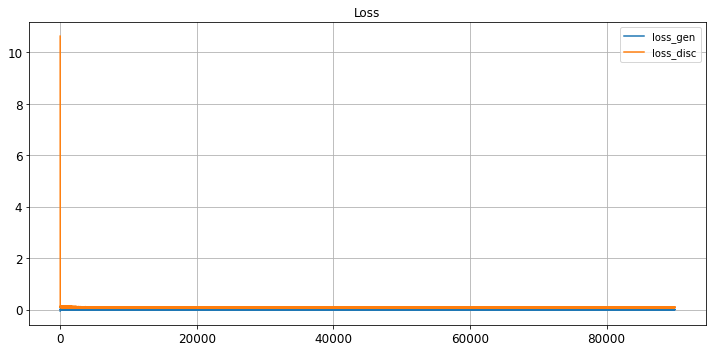

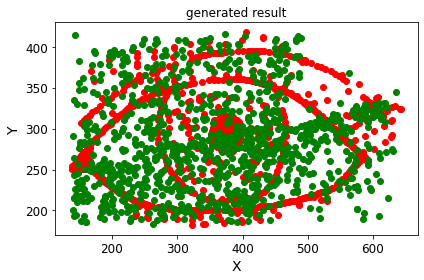

save the model & result
Epoch 90001/100000
critic: 0.077794 - generator: -0.000414 - 0s
Epoch 90002/100000
critic: 0.079052 - generator: -0.001593 - 0s
Epoch 90003/100000
critic: 0.087870 - generator: 0.000627 - 0s
Epoch 90004/100000
critic: 0.069499 - generator: -0.001029 - 0s
Epoch 90005/100000
critic: 0.084089 - generator: 0.005206 - 0s
Epoch 90006/100000
critic: 0.086329 - generator: 0.002068 - 0s
Epoch 90007/100000
critic: 0.070858 - generator: 0.000004 - 0s
Epoch 90008/100000
critic: 0.088826 - generator: 0.003402 - 0s
Epoch 90009/100000
critic: 0.068462 - generator: 0.002720 - 0s
Epoch 90010/100000
critic: 0.075688 - generator: 0.002724 - 0s
Epoch 90011/100000
critic: 0.089000 - generator: -0.002526 - 0s
Epoch 90012/100000
critic: 0.080215 - generator: -0.005421 - 0s
Epoch 90013/100000
critic: 0.087949 - generator: -0.003230 - 0s
Epoch 90014/100000
critic: 0.077336 - generator: 0.002669 - 0s
Epoch 90015/100000
critic: 0.079930 - generator: 0.001279 - 0s
Epoch 90016/100000
critic

critic: 0.071424 - generator: -0.000194 - 0s
Epoch 90132/100000
critic: 0.079341 - generator: -0.000335 - 0s
Epoch 90133/100000
critic: 0.082306 - generator: 0.000142 - 0s
Epoch 90134/100000
critic: 0.087229 - generator: 0.000071 - 0s
Epoch 90135/100000
critic: 0.076729 - generator: 0.004173 - 0s
Epoch 90136/100000
critic: 0.076978 - generator: -0.002303 - 0s
Epoch 90137/100000
critic: 0.070727 - generator: 0.004233 - 0s
Epoch 90138/100000
critic: 0.095763 - generator: 0.001996 - 0s
Epoch 90139/100000
critic: 0.079193 - generator: 0.002891 - 0s
Epoch 90140/100000
critic: 0.083528 - generator: -0.000153 - 0s
Epoch 90141/100000
critic: 0.086487 - generator: 0.001855 - 0s
Epoch 90142/100000
critic: 0.091758 - generator: -0.003191 - 0s
Epoch 90143/100000
critic: 0.080816 - generator: -0.002955 - 0s
Epoch 90144/100000
critic: 0.087040 - generator: -0.004686 - 0s
Epoch 90145/100000
critic: 0.082095 - generator: -0.001837 - 0s
Epoch 90146/100000
critic: 0.081157 - generator: -0.000906 - 0s
Ep

critic: 0.075128 - generator: 0.000203 - 0s
Epoch 90262/100000
critic: 0.071093 - generator: 0.003421 - 0s
Epoch 90263/100000
critic: 0.081197 - generator: 0.002873 - 0s
Epoch 90264/100000
critic: 0.086032 - generator: -0.002349 - 0s
Epoch 90265/100000
critic: 0.082230 - generator: -0.002128 - 0s
Epoch 90266/100000
critic: 0.074937 - generator: -0.001457 - 0s
Epoch 90267/100000
critic: 0.077541 - generator: -0.005434 - 0s
Epoch 90268/100000
critic: 0.077861 - generator: -0.003130 - 0s
Epoch 90269/100000
critic: 0.087970 - generator: -0.003318 - 0s
Epoch 90270/100000
critic: 0.080967 - generator: -0.005260 - 0s
Epoch 90271/100000
critic: 0.086946 - generator: -0.000017 - 0s
Epoch 90272/100000
critic: 0.076916 - generator: 0.002785 - 0s
Epoch 90273/100000
critic: 0.083778 - generator: -0.000868 - 0s
Epoch 90274/100000
critic: 0.073951 - generator: -0.003996 - 0s
Epoch 90275/100000
critic: 0.076979 - generator: -0.003838 - 0s
Epoch 90276/100000
critic: 0.072209 - generator: -0.003905 - 0s

critic: 0.082000 - generator: 0.004962 - 0s
Epoch 90391/100000
critic: 0.079713 - generator: -0.000336 - 0s
Epoch 90392/100000
critic: 0.080380 - generator: 0.005733 - 0s
Epoch 90393/100000
critic: 0.079737 - generator: 0.004272 - 0s
Epoch 90394/100000
critic: 0.069471 - generator: 0.006223 - 0s
Epoch 90395/100000
critic: 0.077216 - generator: 0.004717 - 0s
Epoch 90396/100000
critic: 0.087135 - generator: 0.003649 - 0s
Epoch 90397/100000
critic: 0.077608 - generator: 0.003991 - 0s
Epoch 90398/100000
critic: 0.082207 - generator: 0.000864 - 0s
Epoch 90399/100000
critic: 0.083755 - generator: -0.001957 - 0s
Epoch 90400/100000
critic: 0.093111 - generator: -0.003348 - 0s
Epoch 90401/100000
critic: 0.088338 - generator: 0.000660 - 0s
Epoch 90402/100000
critic: 0.080438 - generator: 0.000141 - 0s
Epoch 90403/100000
critic: 0.082724 - generator: -0.001896 - 0s
Epoch 90404/100000
critic: 0.076160 - generator: 0.000191 - 0s
Epoch 90405/100000
critic: 0.085375 - generator: 0.001511 - 0s
Epoch 9

critic: 0.075901 - generator: 0.000634 - 0s
Epoch 90521/100000
critic: 0.082816 - generator: -0.001699 - 0s
Epoch 90522/100000
critic: 0.077080 - generator: 0.003925 - 0s
Epoch 90523/100000
critic: 0.081872 - generator: 0.002502 - 0s
Epoch 90524/100000
critic: 0.090564 - generator: 0.003980 - 0s
Epoch 90525/100000
critic: 0.080277 - generator: 0.002412 - 0s
Epoch 90526/100000
critic: 0.077616 - generator: 0.000185 - 0s
Epoch 90527/100000
critic: 0.081183 - generator: 0.001412 - 0s
Epoch 90528/100000
critic: 0.084690 - generator: 0.002851 - 0s
Epoch 90529/100000
critic: 0.078373 - generator: 0.000781 - 0s
Epoch 90530/100000
critic: 0.083490 - generator: 0.002982 - 0s
Epoch 90531/100000
critic: 0.091238 - generator: 0.000370 - 0s
Epoch 90532/100000
critic: 0.071986 - generator: 0.001584 - 0s
Epoch 90533/100000
critic: 0.082902 - generator: 0.009475 - 0s
Epoch 90534/100000
critic: 0.097737 - generator: 0.004433 - 0s
Epoch 90535/100000
critic: 0.080838 - generator: 0.003219 - 0s
Epoch 9053

critic: 0.072492 - generator: -0.001532 - 0s
Epoch 90651/100000
critic: 0.072883 - generator: 0.000247 - 0s
Epoch 90652/100000
critic: 0.075739 - generator: -0.002787 - 0s
Epoch 90653/100000
critic: 0.078510 - generator: 0.000986 - 0s
Epoch 90654/100000
critic: 0.079359 - generator: 0.004722 - 0s
Epoch 90655/100000
critic: 0.080112 - generator: -0.003731 - 0s
Epoch 90656/100000
critic: 0.080270 - generator: -0.003328 - 0s
Epoch 90657/100000
critic: 0.083196 - generator: -0.005319 - 0s
Epoch 90658/100000
critic: 0.092865 - generator: -0.004521 - 0s
Epoch 90659/100000
critic: 0.083652 - generator: -0.002596 - 0s
Epoch 90660/100000
critic: 0.083960 - generator: -0.000762 - 0s
Epoch 90661/100000
critic: 0.090040 - generator: -0.005718 - 0s
Epoch 90662/100000
critic: 0.080346 - generator: -0.003062 - 0s
Epoch 90663/100000
critic: 0.079511 - generator: 0.001873 - 0s
Epoch 90664/100000
critic: 0.084689 - generator: -0.000534 - 0s
Epoch 90665/100000
critic: 0.087093 - generator: -0.001805 - 0s

critic: 0.083324 - generator: 0.001000 - 0s
Epoch 90781/100000
critic: 0.078937 - generator: 0.001892 - 0s
Epoch 90782/100000
critic: 0.086316 - generator: -0.000068 - 0s
Epoch 90783/100000
critic: 0.081687 - generator: 0.001220 - 0s
Epoch 90784/100000
critic: 0.086663 - generator: -0.000141 - 0s
Epoch 90785/100000
critic: 0.083052 - generator: 0.005099 - 0s
Epoch 90786/100000
critic: 0.081346 - generator: -0.000828 - 0s
Epoch 90787/100000
critic: 0.090723 - generator: 0.001010 - 0s
Epoch 90788/100000
critic: 0.083296 - generator: -0.005337 - 0s
Epoch 90789/100000
critic: 0.086206 - generator: -0.005212 - 0s
Epoch 90790/100000
critic: 0.069545 - generator: -0.001035 - 0s
Epoch 90791/100000
critic: 0.093781 - generator: 0.000440 - 0s
Epoch 90792/100000
critic: 0.077412 - generator: -0.002012 - 0s
Epoch 90793/100000
critic: 0.076200 - generator: 0.000994 - 0s
Epoch 90794/100000
critic: 0.079563 - generator: -0.000587 - 0s
Epoch 90795/100000
critic: 0.078100 - generator: -0.003289 - 0s
Ep

critic: 0.089229 - generator: -0.001012 - 0s
Epoch 90910/100000
critic: 0.076945 - generator: 0.001890 - 0s
Epoch 90911/100000
critic: 0.082046 - generator: 0.001756 - 0s
Epoch 90912/100000
critic: 0.080614 - generator: -0.001625 - 0s
Epoch 90913/100000
critic: 0.079366 - generator: -0.005167 - 0s
Epoch 90914/100000
critic: 0.080705 - generator: -0.000448 - 0s
Epoch 90915/100000
critic: 0.084052 - generator: 0.003649 - 0s
Epoch 90916/100000
critic: 0.082694 - generator: -0.000875 - 0s
Epoch 90917/100000
critic: 0.072450 - generator: 0.006283 - 0s
Epoch 90918/100000
critic: 0.072995 - generator: 0.003715 - 0s
Epoch 90919/100000
critic: 0.086192 - generator: 0.000626 - 0s
Epoch 90920/100000
critic: 0.079926 - generator: 0.000749 - 0s
Epoch 90921/100000
critic: 0.081887 - generator: 0.003324 - 0s
Epoch 90922/100000
critic: 0.084102 - generator: 0.003904 - 0s
Epoch 90923/100000
critic: 0.085115 - generator: -0.001901 - 0s
Epoch 90924/100000
critic: 0.080243 - generator: 0.001705 - 0s
Epoch

critic: 0.082539 - generator: -0.000917 - 0s
Epoch 91039/100000
critic: 0.076325 - generator: 0.000235 - 0s
Epoch 91040/100000
critic: 0.076116 - generator: 0.002042 - 0s
Epoch 91041/100000
critic: 0.084376 - generator: 0.001315 - 0s
Epoch 91042/100000
critic: 0.085171 - generator: 0.000809 - 0s
Epoch 91043/100000
critic: 0.079142 - generator: 0.002533 - 0s
Epoch 91044/100000
critic: 0.080505 - generator: 0.004277 - 0s
Epoch 91045/100000
critic: 0.073420 - generator: 0.000686 - 0s
Epoch 91046/100000
critic: 0.082406 - generator: 0.002055 - 0s
Epoch 91047/100000
critic: 0.085899 - generator: -0.005315 - 0s
Epoch 91048/100000
critic: 0.070600 - generator: -0.000029 - 0s
Epoch 91049/100000
critic: 0.088845 - generator: 0.003909 - 0s
Epoch 91050/100000
critic: 0.082964 - generator: 0.004610 - 0s
Epoch 91051/100000
critic: 0.075318 - generator: 0.001948 - 0s
Epoch 91052/100000
critic: 0.085578 - generator: 0.010663 - 0s
Epoch 91053/100000
critic: 0.077658 - generator: 0.004116 - 0s
Epoch 91

critic: 0.075931 - generator: -0.001928 - 0s
Epoch 91169/100000
critic: 0.075403 - generator: 0.000500 - 0s
Epoch 91170/100000
critic: 0.086535 - generator: 0.007390 - 0s
Epoch 91171/100000
critic: 0.081356 - generator: -0.002238 - 0s
Epoch 91172/100000
critic: 0.080875 - generator: -0.003373 - 0s
Epoch 91173/100000
critic: 0.080145 - generator: 0.002592 - 0s
Epoch 91174/100000
critic: 0.083203 - generator: 0.002913 - 0s
Epoch 91175/100000
critic: 0.070300 - generator: 0.004178 - 0s
Epoch 91176/100000
critic: 0.083452 - generator: 0.000347 - 0s
Epoch 91177/100000
critic: 0.072507 - generator: 0.000815 - 0s
Epoch 91178/100000
critic: 0.080132 - generator: 0.002253 - 0s
Epoch 91179/100000
critic: 0.077476 - generator: 0.004739 - 0s
Epoch 91180/100000
critic: 0.083621 - generator: -0.001016 - 0s
Epoch 91181/100000
critic: 0.078729 - generator: -0.001786 - 0s
Epoch 91182/100000
critic: 0.079966 - generator: 0.002474 - 0s
Epoch 91183/100000
critic: 0.088306 - generator: -0.003450 - 0s
Epoch

critic: 0.071814 - generator: 0.000316 - 0s
Epoch 91299/100000
critic: 0.085852 - generator: 0.001475 - 0s
Epoch 91300/100000
critic: 0.077068 - generator: 0.002579 - 0s
Epoch 91301/100000
critic: 0.084089 - generator: 0.000805 - 0s
Epoch 91302/100000
critic: 0.076105 - generator: -0.002032 - 0s
Epoch 91303/100000
critic: 0.074327 - generator: -0.000603 - 0s
Epoch 91304/100000
critic: 0.080310 - generator: 0.000208 - 0s
Epoch 91305/100000
critic: 0.074136 - generator: -0.002572 - 0s
Epoch 91306/100000
critic: 0.080988 - generator: -0.001325 - 0s
Epoch 91307/100000
critic: 0.079410 - generator: -0.001313 - 0s
Epoch 91308/100000
critic: 0.085030 - generator: 0.001124 - 0s
Epoch 91309/100000
critic: 0.073985 - generator: -0.002799 - 0s
Epoch 91310/100000
critic: 0.074788 - generator: -0.000542 - 0s
Epoch 91311/100000
critic: 0.077481 - generator: 0.000064 - 0s
Epoch 91312/100000
critic: 0.087979 - generator: 0.002977 - 0s
Epoch 91313/100000
critic: 0.077568 - generator: 0.004472 - 0s
Epoc

critic: 0.072161 - generator: -0.002943 - 0s
Epoch 91429/100000
critic: 0.072464 - generator: 0.000950 - 0s
Epoch 91430/100000
critic: 0.079231 - generator: -0.000073 - 0s
Epoch 91431/100000
critic: 0.084367 - generator: -0.000256 - 0s
Epoch 91432/100000
critic: 0.081881 - generator: 0.001405 - 0s
Epoch 91433/100000
critic: 0.078913 - generator: 0.002271 - 0s
Epoch 91434/100000
critic: 0.079766 - generator: 0.000114 - 0s
Epoch 91435/100000
critic: 0.078633 - generator: -0.000939 - 0s
Epoch 91436/100000
critic: 0.078808 - generator: -0.001254 - 0s
Epoch 91437/100000
critic: 0.076199 - generator: 0.000945 - 0s
Epoch 91438/100000
critic: 0.078412 - generator: 0.002183 - 0s
Epoch 91439/100000
critic: 0.081044 - generator: 0.005530 - 0s
Epoch 91440/100000
critic: 0.071091 - generator: 0.001500 - 0s
Epoch 91441/100000
critic: 0.085492 - generator: -0.002132 - 0s
Epoch 91442/100000
critic: 0.083989 - generator: -0.000335 - 0s
Epoch 91443/100000
critic: 0.086919 - generator: 0.002317 - 0s
Epoc

critic: 0.087750 - generator: -0.001546 - 0s
Epoch 91558/100000
critic: 0.075924 - generator: -0.004103 - 0s
Epoch 91559/100000
critic: 0.071885 - generator: -0.003598 - 0s
Epoch 91560/100000
critic: 0.095856 - generator: -0.001202 - 0s
Epoch 91561/100000
critic: 0.084846 - generator: -0.000382 - 0s
Epoch 91562/100000
critic: 0.090091 - generator: 0.002914 - 0s
Epoch 91563/100000
critic: 0.086585 - generator: 0.001034 - 0s
Epoch 91564/100000
critic: 0.078180 - generator: -0.003182 - 0s
Epoch 91565/100000
critic: 0.074724 - generator: 0.000260 - 0s
Epoch 91566/100000
critic: 0.084053 - generator: -0.000042 - 0s
Epoch 91567/100000
critic: 0.083209 - generator: 0.001002 - 0s
Epoch 91568/100000
critic: 0.087813 - generator: -0.001104 - 0s
Epoch 91569/100000
critic: 0.080842 - generator: 0.002439 - 0s
Epoch 91570/100000
critic: 0.084592 - generator: -0.000004 - 0s
Epoch 91571/100000
critic: 0.082681 - generator: 0.000130 - 0s
Epoch 91572/100000
critic: 0.084173 - generator: 0.000535 - 0s
Ep

critic: 0.083919 - generator: 0.001568 - 0s
Epoch 91689/100000
critic: 0.081899 - generator: -0.000591 - 0s
Epoch 91690/100000
critic: 0.075125 - generator: 0.001145 - 0s
Epoch 91691/100000
critic: 0.080808 - generator: 0.001212 - 0s
Epoch 91692/100000
critic: 0.081822 - generator: 0.000677 - 0s
Epoch 91693/100000
critic: 0.081356 - generator: 0.000931 - 0s
Epoch 91694/100000
critic: 0.075061 - generator: -0.005281 - 0s
Epoch 91695/100000
critic: 0.091696 - generator: -0.005490 - 0s
Epoch 91696/100000
critic: 0.082271 - generator: 0.001185 - 0s
Epoch 91697/100000
critic: 0.078545 - generator: 0.001188 - 0s
Epoch 91698/100000
critic: 0.084363 - generator: 0.005673 - 0s
Epoch 91699/100000
critic: 0.075357 - generator: 0.001944 - 0s
Epoch 91700/100000
critic: 0.077627 - generator: -0.000667 - 0s
Epoch 91701/100000
critic: 0.079982 - generator: 0.000156 - 0s
Epoch 91702/100000
critic: 0.112863 - generator: -0.002833 - 0s
Epoch 91703/100000
critic: 0.089590 - generator: -0.000270 - 0s
Epoch

critic: 0.077387 - generator: -0.001577 - 0s
Epoch 91819/100000
critic: 0.090747 - generator: -0.002948 - 0s
Epoch 91820/100000
critic: 0.074519 - generator: 0.000722 - 0s
Epoch 91821/100000
critic: 0.078207 - generator: 0.002713 - 0s
Epoch 91822/100000
critic: 0.078230 - generator: 0.003844 - 0s
Epoch 91823/100000
critic: 0.078835 - generator: -0.001408 - 0s
Epoch 91824/100000
critic: 0.075421 - generator: 0.002563 - 0s
Epoch 91825/100000
critic: 0.084379 - generator: -0.001063 - 0s
Epoch 91826/100000
critic: 0.093523 - generator: 0.000606 - 0s
Epoch 91827/100000
critic: 0.080155 - generator: -0.000756 - 0s
Epoch 91828/100000
critic: 0.078210 - generator: 0.002006 - 0s
Epoch 91829/100000
critic: 0.080088 - generator: -0.001180 - 0s
Epoch 91830/100000
critic: 0.088612 - generator: 0.003415 - 0s
Epoch 91831/100000
critic: 0.080765 - generator: -0.002004 - 0s
Epoch 91832/100000
critic: 0.076695 - generator: -0.003134 - 0s
Epoch 91833/100000
critic: 0.076802 - generator: -0.003620 - 0s
Ep

critic: 0.076414 - generator: -0.002793 - 0s
Epoch 91949/100000
critic: 0.079844 - generator: -0.000796 - 0s
Epoch 91950/100000
critic: 0.076501 - generator: -0.001237 - 0s
Epoch 91951/100000
critic: 0.075850 - generator: -0.002120 - 0s
Epoch 91952/100000
critic: 0.079100 - generator: -0.000387 - 0s
Epoch 91953/100000
critic: 0.082388 - generator: 0.000072 - 0s
Epoch 91954/100000
critic: 0.079690 - generator: 0.003194 - 0s
Epoch 91955/100000
critic: 0.090533 - generator: -0.000045 - 0s
Epoch 91956/100000
critic: 0.074264 - generator: 0.000943 - 0s
Epoch 91957/100000
critic: 0.079139 - generator: 0.003329 - 0s
Epoch 91958/100000
critic: 0.073889 - generator: 0.000199 - 0s
Epoch 91959/100000
critic: 0.080832 - generator: 0.005312 - 0s
Epoch 91960/100000
critic: 0.086508 - generator: 0.001512 - 0s
Epoch 91961/100000
critic: 0.076468 - generator: -0.000983 - 0s
Epoch 91962/100000
critic: 0.078641 - generator: -0.000705 - 0s
Epoch 91963/100000
critic: 0.084316 - generator: -0.000724 - 0s
Ep

critic: 0.074938 - generator: -0.002763 - 0s
Epoch 92080/100000
critic: 0.067260 - generator: -0.003236 - 0s
Epoch 92081/100000
critic: 0.067853 - generator: -0.002957 - 0s
Epoch 92082/100000
critic: 0.080073 - generator: 0.001532 - 0s
Epoch 92083/100000
critic: 0.086409 - generator: 0.001665 - 0s
Epoch 92084/100000
critic: 0.088373 - generator: -0.002503 - 0s
Epoch 92085/100000
critic: 0.081953 - generator: -0.001178 - 0s
Epoch 92086/100000
critic: 0.069294 - generator: -0.003881 - 0s
Epoch 92087/100000
critic: 0.081105 - generator: -0.000591 - 0s
Epoch 92088/100000
critic: 0.078479 - generator: 0.002941 - 0s
Epoch 92089/100000
critic: 0.071559 - generator: -0.001445 - 0s
Epoch 92090/100000
critic: 0.078375 - generator: 0.002802 - 0s
Epoch 92091/100000
critic: 0.078942 - generator: 0.001409 - 0s
Epoch 92092/100000
critic: 0.072572 - generator: 0.000163 - 0s
Epoch 92093/100000
critic: 0.080580 - generator: -0.002133 - 0s
Epoch 92094/100000
critic: 0.082666 - generator: 0.000975 - 0s
Ep

critic: 0.095521 - generator: -0.001113 - 0s
Epoch 92210/100000
critic: 0.086389 - generator: -0.001803 - 0s
Epoch 92211/100000
critic: 0.067144 - generator: 0.003139 - 0s
Epoch 92212/100000
critic: 0.092750 - generator: 0.000022 - 0s
Epoch 92213/100000
critic: 0.081208 - generator: 0.003571 - 0s
Epoch 92214/100000
critic: 0.074428 - generator: -0.003808 - 0s
Epoch 92215/100000
critic: 0.070271 - generator: -0.000641 - 0s
Epoch 92216/100000
critic: 0.078060 - generator: -0.000122 - 0s
Epoch 92217/100000
critic: 0.081963 - generator: -0.001184 - 0s
Epoch 92218/100000
critic: 0.071923 - generator: 0.003667 - 0s
Epoch 92219/100000
critic: 0.086676 - generator: 0.004442 - 0s
Epoch 92220/100000
critic: 0.080960 - generator: -0.001559 - 0s
Epoch 92221/100000
critic: 0.078911 - generator: -0.004723 - 0s
Epoch 92222/100000
critic: 0.080187 - generator: -0.001988 - 0s
Epoch 92223/100000
critic: 0.084473 - generator: 0.002708 - 0s
Epoch 92224/100000
critic: 0.078289 - generator: 0.000666 - 0s
Ep

critic: 0.084288 - generator: 0.002113 - 0s
Epoch 92340/100000
critic: 0.079190 - generator: 0.002093 - 0s
Epoch 92341/100000
critic: 0.072264 - generator: 0.001078 - 0s
Epoch 92342/100000
critic: 0.085718 - generator: 0.000487 - 0s
Epoch 92343/100000
critic: 0.076467 - generator: 0.000218 - 0s
Epoch 92344/100000
critic: 0.076652 - generator: 0.003285 - 0s
Epoch 92345/100000
critic: 0.077021 - generator: 0.003898 - 0s
Epoch 92346/100000
critic: 0.083616 - generator: 0.004100 - 0s
Epoch 92347/100000
critic: 0.073506 - generator: -0.003098 - 0s
Epoch 92348/100000
critic: 0.082782 - generator: -0.003336 - 0s
Epoch 92349/100000
critic: 0.088125 - generator: -0.002040 - 0s
Epoch 92350/100000
critic: 0.084108 - generator: 0.000117 - 0s
Epoch 92351/100000
critic: 0.075119 - generator: -0.001741 - 0s
Epoch 92352/100000
critic: 0.079119 - generator: -0.000885 - 0s
Epoch 92353/100000
critic: 0.085197 - generator: 0.000511 - 0s
Epoch 92354/100000
critic: 0.076899 - generator: -0.005097 - 0s
Epoch

critic: 0.074949 - generator: -0.003292 - 0s
Epoch 92469/100000
critic: 0.086718 - generator: -0.001375 - 0s
Epoch 92470/100000
critic: 0.087714 - generator: -0.000880 - 0s
Epoch 92471/100000
critic: 0.079758 - generator: -0.002886 - 0s
Epoch 92472/100000
critic: 0.083369 - generator: -0.003355 - 0s
Epoch 92473/100000
critic: 0.079202 - generator: 0.001910 - 0s
Epoch 92474/100000
critic: 0.070741 - generator: -0.002472 - 0s
Epoch 92475/100000
critic: 0.079080 - generator: -0.002109 - 0s
Epoch 92476/100000
critic: 0.086148 - generator: 0.001491 - 0s
Epoch 92477/100000
critic: 0.094713 - generator: -0.000296 - 0s
Epoch 92478/100000
critic: 0.086568 - generator: 0.001425 - 0s
Epoch 92479/100000
critic: 0.083557 - generator: 0.000286 - 0s
Epoch 92480/100000
critic: 0.079278 - generator: -0.005482 - 0s
Epoch 92481/100000
critic: 0.079344 - generator: -0.006282 - 0s
Epoch 92482/100000
critic: 0.077909 - generator: -0.008176 - 0s
Epoch 92483/100000
critic: 0.079272 - generator: -0.000148 - 0s

critic: 0.083839 - generator: -0.001390 - 0s
Epoch 92599/100000
critic: 0.075754 - generator: 0.000175 - 0s
Epoch 92600/100000
critic: 0.075801 - generator: 0.000969 - 0s
Epoch 92601/100000
critic: 0.070935 - generator: 0.003596 - 0s
Epoch 92602/100000
critic: 0.085215 - generator: 0.003800 - 0s
Epoch 92603/100000
critic: 0.079759 - generator: 0.000792 - 0s
Epoch 92604/100000
critic: 0.077610 - generator: -0.000226 - 0s
Epoch 92605/100000
critic: 0.078394 - generator: 0.002349 - 0s
Epoch 92606/100000
critic: 0.087652 - generator: 0.000896 - 0s
Epoch 92607/100000
critic: 0.075330 - generator: -0.005196 - 0s
Epoch 92608/100000
critic: 0.072823 - generator: -0.006835 - 0s
Epoch 92609/100000
critic: 0.070098 - generator: -0.002326 - 0s
Epoch 92610/100000
critic: 0.080884 - generator: 0.000499 - 0s
Epoch 92611/100000
critic: 0.079376 - generator: -0.000526 - 0s
Epoch 92612/100000
critic: 0.086776 - generator: -0.000728 - 0s
Epoch 92613/100000
critic: 0.070409 - generator: 0.003352 - 0s
Epoc

critic: 0.086018 - generator: -0.003405 - 0s
Epoch 92729/100000
critic: 0.073106 - generator: -0.005618 - 0s
Epoch 92730/100000
critic: 0.070229 - generator: 0.002158 - 0s
Epoch 92731/100000
critic: 0.083983 - generator: 0.004561 - 0s
Epoch 92732/100000
critic: 0.074349 - generator: -0.001813 - 0s
Epoch 92733/100000
critic: 0.078494 - generator: 0.000182 - 0s
Epoch 92734/100000
critic: 0.080125 - generator: 0.000628 - 0s
Epoch 92735/100000
critic: 0.091623 - generator: -0.002673 - 0s
Epoch 92736/100000
critic: 0.068060 - generator: -0.000122 - 0s
Epoch 92737/100000
critic: 0.075942 - generator: 0.002591 - 0s
Epoch 92738/100000
critic: 0.084250 - generator: -0.001477 - 0s
Epoch 92739/100000
critic: 0.071340 - generator: -0.001518 - 0s
Epoch 92740/100000
critic: 0.080412 - generator: 0.002487 - 0s
Epoch 92741/100000
critic: 0.088140 - generator: -0.002950 - 0s
Epoch 92742/100000
critic: 0.085140 - generator: 0.003736 - 0s
Epoch 92743/100000
critic: 0.084965 - generator: -0.000239 - 0s
Ep

critic: 0.089588 - generator: 0.001914 - 0s
Epoch 92859/100000
critic: 0.082051 - generator: -0.001321 - 0s
Epoch 92860/100000
critic: 0.074310 - generator: 0.000615 - 0s
Epoch 92861/100000
critic: 0.079540 - generator: -0.001588 - 0s
Epoch 92862/100000
critic: 0.073059 - generator: -0.004607 - 0s
Epoch 92863/100000
critic: 0.081337 - generator: -0.001505 - 0s
Epoch 92864/100000
critic: 0.088436 - generator: -0.000232 - 0s
Epoch 92865/100000
critic: 0.080177 - generator: 0.002280 - 0s
Epoch 92866/100000
critic: 0.075539 - generator: -0.003738 - 0s
Epoch 92867/100000
critic: 0.084153 - generator: -0.002835 - 0s
Epoch 92868/100000
critic: 0.084786 - generator: 0.000726 - 0s
Epoch 92869/100000
critic: 0.066074 - generator: -0.000266 - 0s
Epoch 92870/100000
critic: 0.079312 - generator: 0.000695 - 0s
Epoch 92871/100000
critic: 0.082268 - generator: 0.004952 - 0s
Epoch 92872/100000
critic: 0.078008 - generator: -0.002620 - 0s
Epoch 92873/100000
critic: 0.072637 - generator: -0.001364 - 0s
E

critic: 0.087178 - generator: 0.001474 - 0s
Epoch 92989/100000
critic: 0.080155 - generator: 0.002513 - 0s
Epoch 92990/100000
critic: 0.079423 - generator: 0.003802 - 0s
Epoch 92991/100000
critic: 0.068272 - generator: 0.003262 - 0s
Epoch 92992/100000
critic: 0.077956 - generator: -0.002747 - 0s
Epoch 92993/100000
critic: 0.078241 - generator: -0.001679 - 0s
Epoch 92994/100000
critic: 0.072195 - generator: -0.001771 - 0s
Epoch 92995/100000
critic: 0.078458 - generator: 0.001522 - 0s
Epoch 92996/100000
critic: 0.089362 - generator: -0.004018 - 0s
Epoch 92997/100000
critic: 0.082814 - generator: 0.000618 - 0s
Epoch 92998/100000
critic: 0.077677 - generator: 0.002897 - 0s
Epoch 92999/100000
critic: 0.090880 - generator: 0.001791 - 0s
Epoch 93000/100000
critic: 0.083556 - generator: 0.000390 - 0s
Epoch 93001/100000
critic: 0.087342 - generator: 0.001829 - 0s
Epoch 93002/100000
critic: 0.075705 - generator: -0.003561 - 0s
Epoch 93003/100000
critic: 0.069791 - generator: 0.000663 - 0s
Epoch 

critic: 0.073646 - generator: 0.000851 - 0s
Epoch 93119/100000
critic: 0.089111 - generator: -0.001953 - 0s
Epoch 93120/100000
critic: 0.077326 - generator: -0.005163 - 0s
Epoch 93121/100000
critic: 0.084140 - generator: -0.005382 - 0s
Epoch 93122/100000
critic: 0.080474 - generator: -0.007436 - 0s
Epoch 93123/100000
critic: 0.083234 - generator: -0.002236 - 0s
Epoch 93124/100000
critic: 0.083503 - generator: 0.005369 - 0s
Epoch 93125/100000
critic: 0.077598 - generator: -0.005195 - 0s
Epoch 93126/100000
critic: 0.080545 - generator: -0.007485 - 0s
Epoch 93127/100000
critic: 0.078528 - generator: -0.000169 - 0s
Epoch 93128/100000
critic: 0.071205 - generator: 0.001841 - 0s
Epoch 93129/100000
critic: 0.080841 - generator: 0.002906 - 0s
Epoch 93130/100000
critic: 0.070080 - generator: 0.003479 - 0s
Epoch 93131/100000
critic: 0.085223 - generator: 0.000363 - 0s
Epoch 93132/100000
critic: 0.086395 - generator: 0.000669 - 0s
Epoch 93133/100000
critic: 0.085253 - generator: 0.002228 - 0s
Epo

critic: 0.073895 - generator: 0.002216 - 0s
Epoch 93249/100000
critic: 0.073746 - generator: 0.004401 - 0s
Epoch 93250/100000
critic: 0.079919 - generator: -0.000026 - 0s
Epoch 93251/100000
critic: 0.084500 - generator: 0.001170 - 0s
Epoch 93252/100000
critic: 0.078273 - generator: -0.002507 - 0s
Epoch 93253/100000
critic: 0.071829 - generator: 0.003401 - 0s
Epoch 93254/100000
critic: 0.072163 - generator: 0.003641 - 0s
Epoch 93255/100000
critic: 0.085793 - generator: 0.004350 - 0s
Epoch 93256/100000
critic: 0.077286 - generator: -0.001815 - 0s
Epoch 93257/100000
critic: 0.087317 - generator: -0.002069 - 0s
Epoch 93258/100000
critic: 0.100793 - generator: -0.001640 - 0s
Epoch 93259/100000
critic: 0.089136 - generator: 0.001474 - 0s
Epoch 93260/100000
critic: 0.076541 - generator: -0.000089 - 0s
Epoch 93261/100000
critic: 0.085463 - generator: 0.001330 - 0s
Epoch 93262/100000
critic: 0.082571 - generator: 0.001988 - 0s
Epoch 93263/100000
critic: 0.089530 - generator: -0.002493 - 0s
Epoc

critic: 0.078141 - generator: -0.003139 - 0s
Epoch 93379/100000
critic: 0.076411 - generator: -0.000509 - 0s
Epoch 93380/100000
critic: 0.082110 - generator: -0.003769 - 0s
Epoch 93381/100000
critic: 0.074262 - generator: -0.005195 - 0s
Epoch 93382/100000
critic: 0.080660 - generator: -0.003858 - 0s
Epoch 93383/100000
critic: 0.085257 - generator: -0.001557 - 0s
Epoch 93384/100000
critic: 0.089659 - generator: 0.002470 - 0s
Epoch 93385/100000
critic: 0.080341 - generator: 0.001588 - 0s
Epoch 93386/100000
critic: 0.063940 - generator: -0.000522 - 0s
Epoch 93387/100000
critic: 0.080892 - generator: -0.004300 - 0s
Epoch 93388/100000
critic: 0.079996 - generator: -0.004785 - 0s
Epoch 93389/100000
critic: 0.089817 - generator: 0.000334 - 0s
Epoch 93390/100000
critic: 0.076813 - generator: -0.002045 - 0s
Epoch 93391/100000
critic: 0.081487 - generator: -0.001886 - 0s
Epoch 93392/100000
critic: 0.080836 - generator: 0.002092 - 0s
Epoch 93393/100000
critic: 0.081016 - generator: -0.001386 - 0s

critic: 0.073935 - generator: -0.001857 - 0s
Epoch 93509/100000
critic: 0.070091 - generator: 0.001410 - 0s
Epoch 93510/100000
critic: 0.077264 - generator: 0.001883 - 0s
Epoch 93511/100000
critic: 0.080563 - generator: -0.000094 - 0s
Epoch 93512/100000
critic: 0.087364 - generator: 0.001351 - 0s
Epoch 93513/100000
critic: 0.086433 - generator: -0.002320 - 0s
Epoch 93514/100000
critic: 0.072984 - generator: -0.001154 - 0s
Epoch 93515/100000
critic: 0.081919 - generator: -0.000092 - 0s
Epoch 93516/100000
critic: 0.092202 - generator: -0.004716 - 0s
Epoch 93517/100000
critic: 0.095285 - generator: -0.004525 - 0s
Epoch 93518/100000
critic: 0.080459 - generator: -0.001122 - 0s
Epoch 93519/100000
critic: 0.077762 - generator: 0.001042 - 0s
Epoch 93520/100000
critic: 0.076767 - generator: 0.001449 - 0s
Epoch 93521/100000
critic: 0.078573 - generator: 0.000945 - 0s
Epoch 93522/100000
critic: 0.094097 - generator: 0.002710 - 0s
Epoch 93523/100000
critic: 0.086496 - generator: -0.002099 - 0s
Ep

critic: 0.081455 - generator: 0.001995 - 0s
Epoch 93638/100000
critic: 0.085572 - generator: -0.002600 - 0s
Epoch 93639/100000
critic: 0.072069 - generator: 0.000631 - 0s
Epoch 93640/100000
critic: 0.075413 - generator: 0.000164 - 0s
Epoch 93641/100000
critic: 0.076361 - generator: 0.001303 - 0s
Epoch 93642/100000
critic: 0.078670 - generator: 0.001979 - 0s
Epoch 93643/100000
critic: 0.074812 - generator: -0.002630 - 0s
Epoch 93644/100000
critic: 0.081391 - generator: 0.000992 - 0s
Epoch 93645/100000
critic: 0.080644 - generator: -0.000241 - 0s
Epoch 93646/100000
critic: 0.072952 - generator: 0.001028 - 0s
Epoch 93647/100000
critic: 0.086995 - generator: 0.001643 - 0s
Epoch 93648/100000
critic: 0.078948 - generator: -0.000589 - 0s
Epoch 93649/100000
critic: 0.073498 - generator: -0.003208 - 0s
Epoch 93650/100000
critic: 0.075670 - generator: -0.007337 - 0s
Epoch 93651/100000
critic: 0.077898 - generator: -0.002209 - 0s
Epoch 93652/100000
critic: 0.079181 - generator: -0.004538 - 0s
Epo

critic: 0.084622 - generator: 0.001998 - 0s
Epoch 93768/100000
critic: 0.086521 - generator: -0.001026 - 0s
Epoch 93769/100000
critic: 0.082235 - generator: -0.000401 - 0s
Epoch 93770/100000
critic: 0.077463 - generator: 0.002140 - 0s
Epoch 93771/100000
critic: 0.079626 - generator: 0.003552 - 0s
Epoch 93772/100000
critic: 0.075700 - generator: 0.001042 - 0s
Epoch 93773/100000
critic: 0.084097 - generator: -0.002793 - 0s
Epoch 93774/100000
critic: 0.067809 - generator: 0.000738 - 0s
Epoch 93775/100000
critic: 0.080309 - generator: 0.001126 - 0s
Epoch 93776/100000
critic: 0.089470 - generator: -0.002967 - 0s
Epoch 93777/100000
critic: 0.073131 - generator: -0.000842 - 0s
Epoch 93778/100000
critic: 0.081504 - generator: 0.002023 - 0s
Epoch 93779/100000
critic: 0.082337 - generator: -0.000186 - 0s
Epoch 93780/100000
critic: 0.074455 - generator: 0.001639 - 0s
Epoch 93781/100000
critic: 0.081593 - generator: -0.000582 - 0s
Epoch 93782/100000
critic: 0.086800 - generator: -0.005454 - 0s
Epo

critic: 0.077551 - generator: 0.000532 - 0s
Epoch 93898/100000
critic: 0.079281 - generator: 0.000746 - 0s
Epoch 93899/100000
critic: 0.079686 - generator: 0.003061 - 0s
Epoch 93900/100000
critic: 0.089969 - generator: 0.006440 - 0s
Epoch 93901/100000
critic: 0.072119 - generator: -0.001060 - 0s
Epoch 93902/100000
critic: 0.082349 - generator: 0.003303 - 0s
Epoch 93903/100000
critic: 0.086316 - generator: 0.003839 - 0s
Epoch 93904/100000
critic: 0.081719 - generator: 0.003727 - 0s
Epoch 93905/100000
critic: 0.080496 - generator: 0.000718 - 0s
Epoch 93906/100000
critic: 0.082126 - generator: -0.000948 - 0s
Epoch 93907/100000
critic: 0.082967 - generator: -0.001547 - 0s
Epoch 93908/100000
critic: 0.080023 - generator: 0.001404 - 0s
Epoch 93909/100000
critic: 0.084736 - generator: 0.002727 - 0s
Epoch 93910/100000
critic: 0.090094 - generator: 0.002129 - 0s
Epoch 93911/100000
critic: 0.076544 - generator: -0.001339 - 0s
Epoch 93912/100000
critic: 0.072225 - generator: -0.005447 - 0s
Epoch 

critic: 0.080800 - generator: -0.002969 - 0s
Epoch 94028/100000
critic: 0.087703 - generator: 0.000719 - 0s
Epoch 94029/100000
critic: 0.085008 - generator: 0.005694 - 0s
Epoch 94030/100000
critic: 0.080009 - generator: -0.001952 - 0s
Epoch 94031/100000
critic: 0.085704 - generator: 0.001035 - 0s
Epoch 94032/100000
critic: 0.083297 - generator: -0.001168 - 0s
Epoch 94033/100000
critic: 0.090486 - generator: -0.000883 - 0s
Epoch 94034/100000
critic: 0.081168 - generator: -0.001005 - 0s
Epoch 94035/100000
critic: 0.079033 - generator: -0.004382 - 0s
Epoch 94036/100000
critic: 0.085075 - generator: -0.002071 - 0s
Epoch 94037/100000
critic: 0.066829 - generator: -0.006161 - 0s
Epoch 94038/100000
critic: 0.080221 - generator: -0.003111 - 0s
Epoch 94039/100000
critic: 0.074214 - generator: 0.001956 - 0s
Epoch 94040/100000
critic: 0.081443 - generator: 0.002813 - 0s
Epoch 94041/100000
critic: 0.079479 - generator: 0.003293 - 0s
Epoch 94042/100000
critic: 0.082098 - generator: 0.002710 - 0s
Ep

critic: 0.090058 - generator: 0.000697 - 0s
Epoch 94158/100000
critic: 0.080598 - generator: -0.001718 - 0s
Epoch 94159/100000
critic: 0.081059 - generator: 0.001329 - 0s
Epoch 94160/100000
critic: 0.072183 - generator: -0.001378 - 0s
Epoch 94161/100000
critic: 0.074935 - generator: 0.003135 - 0s
Epoch 94162/100000
critic: 0.076558 - generator: 0.005350 - 0s
Epoch 94163/100000
critic: 0.083952 - generator: 0.000306 - 0s
Epoch 94164/100000
critic: 0.095809 - generator: 0.001505 - 0s
Epoch 94165/100000
critic: 0.080890 - generator: 0.000301 - 0s
Epoch 94166/100000
critic: 0.078259 - generator: 0.000092 - 0s
Epoch 94167/100000
critic: 0.072523 - generator: 0.003865 - 0s
Epoch 94168/100000
critic: 0.092028 - generator: 0.002156 - 0s
Epoch 94169/100000
critic: 0.079563 - generator: 0.001730 - 0s
Epoch 94170/100000
critic: 0.093298 - generator: -0.002091 - 0s
Epoch 94171/100000
critic: 0.086924 - generator: 0.001490 - 0s
Epoch 94172/100000
critic: 0.074638 - generator: 0.003415 - 0s
Epoch 94

critic: 0.081805 - generator: 0.002708 - 0s
Epoch 94289/100000
critic: 0.081200 - generator: 0.000080 - 0s
Epoch 94290/100000
critic: 0.078063 - generator: -0.001155 - 0s
Epoch 94291/100000
critic: 0.085049 - generator: -0.003107 - 0s
Epoch 94292/100000
critic: 0.077712 - generator: -0.001518 - 0s
Epoch 94293/100000
critic: 0.076727 - generator: 0.000868 - 0s
Epoch 94294/100000
critic: 0.082589 - generator: -0.001201 - 0s
Epoch 94295/100000
critic: 0.077497 - generator: 0.001354 - 0s
Epoch 94296/100000
critic: 0.075874 - generator: 0.003637 - 0s
Epoch 94297/100000
critic: 0.082585 - generator: 0.000332 - 0s
Epoch 94298/100000
critic: 0.095488 - generator: -0.000652 - 0s
Epoch 94299/100000
critic: 0.087413 - generator: -0.004173 - 0s
Epoch 94300/100000
critic: 0.081912 - generator: -0.000348 - 0s
Epoch 94301/100000
critic: 0.080497 - generator: -0.000036 - 0s
Epoch 94302/100000
critic: 0.077601 - generator: -0.000305 - 0s
Epoch 94303/100000
critic: 0.084705 - generator: 0.003399 - 0s
Ep

critic: 0.070709 - generator: 0.002045 - 0s
Epoch 94418/100000
critic: 0.090922 - generator: -0.001204 - 0s
Epoch 94419/100000
critic: 0.080533 - generator: -0.001082 - 0s
Epoch 94420/100000
critic: 0.077933 - generator: 0.004049 - 0s
Epoch 94421/100000
critic: 0.073799 - generator: -0.003234 - 0s
Epoch 94422/100000
critic: 0.089787 - generator: 0.000114 - 0s
Epoch 94423/100000
critic: 0.055213 - generator: 0.002243 - 0s
Epoch 94424/100000
critic: 0.089254 - generator: 0.002466 - 0s
Epoch 94425/100000
critic: 0.089781 - generator: -0.000237 - 0s
Epoch 94426/100000
critic: 0.070422 - generator: -0.002495 - 0s
Epoch 94427/100000
critic: 0.085176 - generator: -0.000657 - 0s
Epoch 94428/100000
critic: 0.092105 - generator: 0.005667 - 0s
Epoch 94429/100000
critic: 0.084752 - generator: 0.001079 - 0s
Epoch 94430/100000
critic: 0.087950 - generator: -0.001312 - 0s
Epoch 94431/100000
critic: 0.082014 - generator: -0.003353 - 0s
Epoch 94432/100000
critic: 0.084581 - generator: -0.004886 - 0s
Ep

critic: 0.086732 - generator: -0.002327 - 0s
Epoch 94548/100000
critic: 0.075825 - generator: -0.002526 - 0s
Epoch 94549/100000
critic: 0.084416 - generator: -0.001749 - 0s
Epoch 94550/100000
critic: 0.086537 - generator: 0.000906 - 0s
Epoch 94551/100000
critic: 0.080754 - generator: 0.003624 - 0s
Epoch 94552/100000
critic: 0.074598 - generator: -0.001272 - 0s
Epoch 94553/100000
critic: 0.081265 - generator: -0.002034 - 0s
Epoch 94554/100000
critic: 0.070055 - generator: -0.001547 - 0s
Epoch 94555/100000
critic: 0.094402 - generator: -0.002398 - 0s
Epoch 94556/100000
critic: 0.084379 - generator: -0.004240 - 0s
Epoch 94557/100000
critic: 0.077252 - generator: 0.003204 - 0s
Epoch 94558/100000
critic: 0.098592 - generator: 0.003634 - 0s
Epoch 94559/100000
critic: 0.081477 - generator: -0.002161 - 0s
Epoch 94560/100000
critic: 0.093639 - generator: 0.001551 - 0s
Epoch 94561/100000
critic: 0.072840 - generator: 0.001994 - 0s
Epoch 94562/100000
critic: 0.078502 - generator: 0.001643 - 0s
Ep

critic: 0.086868 - generator: 0.001591 - 0s
Epoch 94678/100000
critic: 0.074637 - generator: 0.001984 - 0s
Epoch 94679/100000
critic: 0.081494 - generator: 0.004456 - 0s
Epoch 94680/100000
critic: 0.082185 - generator: 0.003904 - 0s
Epoch 94681/100000
critic: 0.083956 - generator: 0.003230 - 0s
Epoch 94682/100000
critic: 0.078926 - generator: 0.001190 - 0s
Epoch 94683/100000
critic: 0.079622 - generator: 0.002422 - 0s
Epoch 94684/100000
critic: 0.086632 - generator: -0.000923 - 0s
Epoch 94685/100000
critic: 0.081876 - generator: -0.003310 - 0s
Epoch 94686/100000
critic: 0.077350 - generator: 0.000447 - 0s
Epoch 94687/100000
critic: 0.091055 - generator: -0.001402 - 0s
Epoch 94688/100000
critic: 0.077275 - generator: 0.001423 - 0s
Epoch 94689/100000
critic: 0.067311 - generator: -0.000044 - 0s
Epoch 94690/100000
critic: 0.082128 - generator: 0.003391 - 0s
Epoch 94691/100000
critic: 0.083534 - generator: 0.002613 - 0s
Epoch 94692/100000
critic: 0.085965 - generator: 0.000043 - 0s
Epoch 9

critic: 0.069125 - generator: 0.003919 - 0s
Epoch 94809/100000
critic: 0.084999 - generator: -0.001166 - 0s
Epoch 94810/100000
critic: 0.076575 - generator: 0.002124 - 0s
Epoch 94811/100000
critic: 0.091158 - generator: 0.007186 - 0s
Epoch 94812/100000
critic: 0.087754 - generator: 0.005534 - 0s
Epoch 94813/100000
critic: 0.074378 - generator: -0.000215 - 0s
Epoch 94814/100000
critic: 0.086119 - generator: -0.002056 - 0s
Epoch 94815/100000
critic: 0.082981 - generator: -0.001924 - 0s
Epoch 94816/100000
critic: 0.078365 - generator: -0.003321 - 0s
Epoch 94817/100000
critic: 0.082474 - generator: -0.001429 - 0s
Epoch 94818/100000
critic: 0.083824 - generator: -0.001999 - 0s
Epoch 94819/100000
critic: 0.076394 - generator: -0.000460 - 0s
Epoch 94820/100000
critic: 0.085757 - generator: 0.002514 - 0s
Epoch 94821/100000
critic: 0.084333 - generator: 0.005119 - 0s
Epoch 94822/100000
critic: 0.082565 - generator: 0.005462 - 0s
Epoch 94823/100000
critic: 0.076492 - generator: 0.002018 - 0s
Epo

critic: 0.082901 - generator: 0.003284 - 0s
Epoch 94939/100000
critic: 0.086888 - generator: 0.002928 - 0s
Epoch 94940/100000
critic: 0.076379 - generator: 0.001994 - 0s
Epoch 94941/100000
critic: 0.078454 - generator: -0.001054 - 0s
Epoch 94942/100000
critic: 0.078651 - generator: 0.001093 - 0s
Epoch 94943/100000
critic: 0.081268 - generator: -0.001408 - 0s
Epoch 94944/100000
critic: 0.084404 - generator: -0.005984 - 0s
Epoch 94945/100000
critic: 0.094881 - generator: -0.003082 - 0s
Epoch 94946/100000
critic: 0.076288 - generator: 0.000307 - 0s
Epoch 94947/100000
critic: 0.078460 - generator: 0.001406 - 0s
Epoch 94948/100000
critic: 0.078899 - generator: -0.002112 - 0s
Epoch 94949/100000
critic: 0.090654 - generator: -0.000858 - 0s
Epoch 94950/100000
critic: 0.083842 - generator: 0.000221 - 0s
Epoch 94951/100000
critic: 0.089702 - generator: 0.000149 - 0s
Epoch 94952/100000
critic: 0.088010 - generator: -0.000503 - 0s
Epoch 94953/100000
critic: 0.067225 - generator: -0.002488 - 0s
Epo

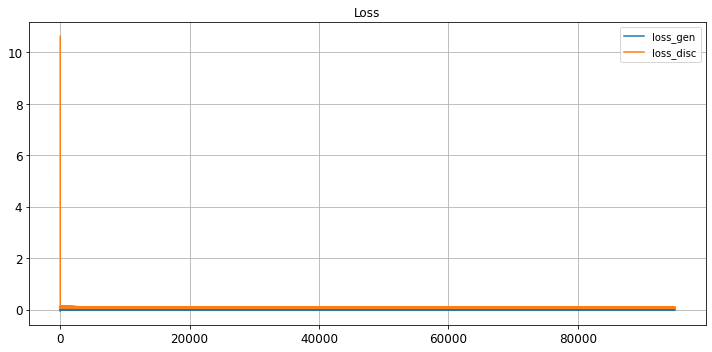

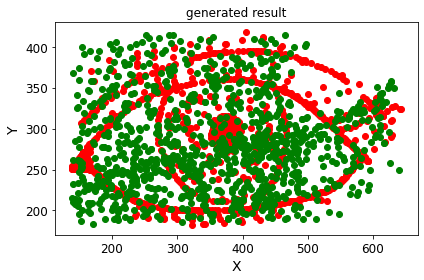

save the model & result
Epoch 95001/100000
critic: 0.079557 - generator: 0.001698 - 0s
Epoch 95002/100000
critic: 0.082316 - generator: 0.001245 - 0s
Epoch 95003/100000
critic: 0.078708 - generator: 0.002738 - 0s
Epoch 95004/100000
critic: 0.076108 - generator: -0.002518 - 0s
Epoch 95005/100000
critic: 0.085093 - generator: 0.001519 - 0s
Epoch 95006/100000
critic: 0.078598 - generator: -0.007546 - 0s
Epoch 95007/100000
critic: 0.077315 - generator: 0.002752 - 0s
Epoch 95008/100000
critic: 0.082300 - generator: 0.001007 - 0s
Epoch 95009/100000
critic: 0.079404 - generator: -0.000369 - 0s
Epoch 95010/100000
critic: 0.075482 - generator: -0.004576 - 0s
Epoch 95011/100000
critic: 0.079182 - generator: -0.002039 - 0s
Epoch 95012/100000
critic: 0.079670 - generator: -0.003826 - 0s
Epoch 95013/100000
critic: 0.079649 - generator: 0.001454 - 0s
Epoch 95014/100000
critic: 0.079908 - generator: 0.004563 - 0s
Epoch 95015/100000
critic: 0.085193 - generator: 0.005042 - 0s
Epoch 95016/100000
critic

critic: 0.080293 - generator: 0.002787 - 0s
Epoch 95132/100000
critic: 0.080411 - generator: -0.001093 - 0s
Epoch 95133/100000
critic: 0.071801 - generator: -0.003791 - 0s
Epoch 95134/100000
critic: 0.083511 - generator: -0.001961 - 0s
Epoch 95135/100000
critic: 0.078905 - generator: -0.001433 - 0s
Epoch 95136/100000
critic: 0.084824 - generator: 0.000616 - 0s
Epoch 95137/100000
critic: 0.094515 - generator: -0.000573 - 0s
Epoch 95138/100000
critic: 0.077416 - generator: 0.002634 - 0s
Epoch 95139/100000
critic: 0.074203 - generator: -0.000095 - 0s
Epoch 95140/100000
critic: 0.087292 - generator: -0.001998 - 0s
Epoch 95141/100000
critic: 0.077744 - generator: -0.002273 - 0s
Epoch 95142/100000
critic: 0.080184 - generator: -0.000317 - 0s
Epoch 95143/100000
critic: 0.093101 - generator: 0.002350 - 0s
Epoch 95144/100000
critic: 0.079757 - generator: 0.004507 - 0s
Epoch 95145/100000
critic: 0.077557 - generator: 0.001150 - 0s
Epoch 95146/100000
critic: 0.078013 - generator: -0.001507 - 0s
E

critic: 0.085586 - generator: 0.000923 - 0s
Epoch 95262/100000
critic: 0.084179 - generator: 0.000775 - 0s
Epoch 95263/100000
critic: 0.068443 - generator: -0.001663 - 0s
Epoch 95264/100000
critic: 0.071938 - generator: 0.000565 - 0s
Epoch 95265/100000
critic: 0.063725 - generator: 0.001286 - 0s
Epoch 95266/100000
critic: 0.085504 - generator: 0.002108 - 0s
Epoch 95267/100000
critic: 0.082681 - generator: 0.000060 - 0s
Epoch 95268/100000
critic: 0.077589 - generator: -0.001096 - 0s
Epoch 95269/100000
critic: 0.076424 - generator: 0.001237 - 0s
Epoch 95270/100000
critic: 0.082322 - generator: -0.000006 - 0s
Epoch 95271/100000
critic: 0.078080 - generator: -0.001068 - 0s
Epoch 95272/100000
critic: 0.076190 - generator: -0.005709 - 0s
Epoch 95273/100000
critic: 0.082134 - generator: -0.002756 - 0s
Epoch 95274/100000
critic: 0.085904 - generator: -0.001976 - 0s
Epoch 95275/100000
critic: 0.065876 - generator: 0.004742 - 0s
Epoch 95276/100000
critic: 0.079702 - generator: 0.005786 - 0s
Epoc

critic: 0.083821 - generator: 0.003687 - 0s
Epoch 95392/100000
critic: 0.066817 - generator: 0.002284 - 0s
Epoch 95393/100000
critic: 0.079452 - generator: -0.000227 - 0s
Epoch 95394/100000
critic: 0.083103 - generator: -0.002510 - 0s
Epoch 95395/100000
critic: 0.068239 - generator: -0.005628 - 0s
Epoch 95396/100000
critic: 0.086114 - generator: -0.002185 - 0s
Epoch 95397/100000
critic: 0.078544 - generator: -0.005248 - 0s
Epoch 95398/100000
critic: 0.081461 - generator: 0.000025 - 0s
Epoch 95399/100000
critic: 0.079604 - generator: 0.002954 - 0s
Epoch 95400/100000
critic: 0.074553 - generator: -0.001939 - 0s
Epoch 95401/100000
critic: 0.076108 - generator: -0.001442 - 0s
Epoch 95402/100000
critic: 0.085762 - generator: -0.004403 - 0s
Epoch 95403/100000
critic: 0.078429 - generator: 0.002834 - 0s
Epoch 95404/100000
critic: 0.086906 - generator: -0.001764 - 0s
Epoch 95405/100000
critic: 0.083082 - generator: 0.002958 - 0s
Epoch 95406/100000
critic: 0.078426 - generator: 0.001168 - 0s
Ep

critic: 0.084984 - generator: -0.000959 - 0s
Epoch 95522/100000
critic: 0.078834 - generator: 0.001204 - 0s
Epoch 95523/100000
critic: 0.085321 - generator: -0.000308 - 0s
Epoch 95524/100000
critic: 0.062746 - generator: -0.002389 - 0s
Epoch 95525/100000
critic: 0.084083 - generator: 0.000116 - 0s
Epoch 95526/100000
critic: 0.078108 - generator: 0.003703 - 0s
Epoch 95527/100000
critic: 0.081186 - generator: 0.000822 - 0s
Epoch 95528/100000
critic: 0.071323 - generator: -0.002072 - 0s
Epoch 95529/100000
critic: 0.079290 - generator: 0.000151 - 0s
Epoch 95530/100000
critic: 0.077133 - generator: 0.003550 - 0s
Epoch 95531/100000
critic: 0.077402 - generator: 0.002174 - 0s
Epoch 95532/100000
critic: 0.085268 - generator: 0.004670 - 0s
Epoch 95533/100000
critic: 0.078729 - generator: -0.004735 - 0s
Epoch 95534/100000
critic: 0.087620 - generator: 0.001680 - 0s
Epoch 95535/100000
critic: 0.089610 - generator: -0.004007 - 0s
Epoch 95536/100000
critic: 0.077037 - generator: -0.002803 - 0s
Epoc

critic: 0.089457 - generator: 0.003696 - 0s
Epoch 95652/100000
critic: 0.079656 - generator: 0.002092 - 0s
Epoch 95653/100000
critic: 0.088004 - generator: 0.000547 - 0s
Epoch 95654/100000
critic: 0.077624 - generator: 0.000213 - 0s
Epoch 95655/100000
critic: 0.080734 - generator: -0.003113 - 0s
Epoch 95656/100000
critic: 0.096629 - generator: 0.001176 - 0s
Epoch 95657/100000
critic: 0.088297 - generator: -0.002986 - 0s
Epoch 95658/100000
critic: 0.079529 - generator: -0.004967 - 0s
Epoch 95659/100000
critic: 0.083391 - generator: 0.005120 - 0s
Epoch 95660/100000
critic: 0.087950 - generator: -0.001102 - 0s
Epoch 95661/100000
critic: 0.081467 - generator: -0.000368 - 0s
Epoch 95662/100000
critic: 0.090132 - generator: -0.001916 - 0s
Epoch 95663/100000
critic: 0.087564 - generator: -0.000392 - 0s
Epoch 95664/100000
critic: 0.077250 - generator: 0.000141 - 0s
Epoch 95665/100000
critic: 0.072529 - generator: -0.000424 - 0s
Epoch 95666/100000
critic: 0.085777 - generator: -0.001644 - 0s
Ep

critic: 0.072104 - generator: -0.000900 - 0s
Epoch 95782/100000
critic: 0.077210 - generator: 0.007263 - 0s
Epoch 95783/100000
critic: 0.088458 - generator: 0.000251 - 0s
Epoch 95784/100000
critic: 0.084756 - generator: 0.002964 - 0s
Epoch 95785/100000
critic: 0.074780 - generator: -0.001130 - 0s
Epoch 95786/100000
critic: 0.081419 - generator: -0.000691 - 0s
Epoch 95787/100000
critic: 0.077816 - generator: 0.000217 - 0s
Epoch 95788/100000
critic: 0.086436 - generator: 0.002456 - 0s
Epoch 95789/100000
critic: 0.080214 - generator: -0.001013 - 0s
Epoch 95790/100000
critic: 0.073457 - generator: -0.001945 - 0s
Epoch 95791/100000
critic: 0.075280 - generator: -0.002644 - 0s
Epoch 95792/100000
critic: 0.079528 - generator: 0.000355 - 0s
Epoch 95793/100000
critic: 0.090332 - generator: 0.004786 - 0s
Epoch 95794/100000
critic: 0.079038 - generator: 0.000715 - 0s
Epoch 95795/100000
critic: 0.079784 - generator: -0.004547 - 0s
Epoch 95796/100000
critic: 0.081187 - generator: -0.000054 - 0s
Epo

critic: 0.082593 - generator: -0.001030 - 0s
Epoch 95911/100000
critic: 0.085718 - generator: 0.003753 - 0s
Epoch 95912/100000
critic: 0.071743 - generator: -0.002159 - 0s
Epoch 95913/100000
critic: 0.087504 - generator: -0.002101 - 0s
Epoch 95914/100000
critic: 0.084316 - generator: -0.000467 - 0s
Epoch 95915/100000
critic: 0.077665 - generator: -0.000411 - 0s
Epoch 95916/100000
critic: 0.091584 - generator: 0.001865 - 0s
Epoch 95917/100000
critic: 0.077855 - generator: -0.002456 - 0s
Epoch 95918/100000
critic: 0.084748 - generator: -0.002676 - 0s
Epoch 95919/100000
critic: 0.076910 - generator: -0.001280 - 0s
Epoch 95920/100000
critic: 0.078474 - generator: -0.002662 - 0s
Epoch 95921/100000
critic: 0.085915 - generator: -0.001438 - 0s
Epoch 95922/100000
critic: 0.082417 - generator: 0.001765 - 0s
Epoch 95923/100000
critic: 0.084227 - generator: 0.003893 - 0s
Epoch 95924/100000
critic: 0.085557 - generator: 0.001414 - 0s
Epoch 95925/100000
critic: 0.089659 - generator: -0.000550 - 0s


critic: 0.089747 - generator: 0.003095 - 0s
Epoch 96042/100000
critic: 0.078117 - generator: 0.000690 - 0s
Epoch 96043/100000
critic: 0.080614 - generator: -0.003086 - 0s
Epoch 96044/100000
critic: 0.083421 - generator: -0.000443 - 0s
Epoch 96045/100000
critic: 0.081694 - generator: -0.000147 - 0s
Epoch 96046/100000
critic: 0.087307 - generator: -0.000785 - 0s
Epoch 96047/100000
critic: 0.085280 - generator: 0.002295 - 0s
Epoch 96048/100000
critic: 0.093641 - generator: -0.001580 - 0s
Epoch 96049/100000
critic: 0.081816 - generator: 0.000957 - 0s
Epoch 96050/100000
critic: 0.087936 - generator: -0.000701 - 0s
Epoch 96051/100000
critic: 0.090568 - generator: 0.004152 - 0s
Epoch 96052/100000
critic: 0.084182 - generator: 0.002145 - 0s
Epoch 96053/100000
critic: 0.091233 - generator: -0.001233 - 0s
Epoch 96054/100000
critic: 0.073220 - generator: -0.001020 - 0s
Epoch 96055/100000
critic: 0.076608 - generator: -0.001021 - 0s
Epoch 96056/100000
critic: 0.077923 - generator: -0.001748 - 0s
E

critic: 0.081532 - generator: 0.003514 - 0s
Epoch 96173/100000
critic: 0.069653 - generator: 0.002130 - 0s
Epoch 96174/100000
critic: 0.078442 - generator: -0.001462 - 0s
Epoch 96175/100000
critic: 0.069938 - generator: 0.000813 - 0s
Epoch 96176/100000
critic: 0.085293 - generator: 0.003670 - 0s
Epoch 96177/100000
critic: 0.077798 - generator: 0.003289 - 0s
Epoch 96178/100000
critic: 0.074121 - generator: -0.000078 - 0s
Epoch 96179/100000
critic: 0.087758 - generator: -0.003502 - 0s
Epoch 96180/100000
critic: 0.088205 - generator: -0.002408 - 0s
Epoch 96181/100000
critic: 0.077994 - generator: -0.006499 - 0s
Epoch 96182/100000
critic: 0.080922 - generator: -0.001362 - 0s
Epoch 96183/100000
critic: 0.083303 - generator: 0.002363 - 0s
Epoch 96184/100000
critic: 0.082864 - generator: -0.000390 - 0s
Epoch 96185/100000
critic: 0.077080 - generator: 0.000609 - 0s
Epoch 96186/100000
critic: 0.090249 - generator: 0.003973 - 0s
Epoch 96187/100000
critic: 0.081018 - generator: 0.002913 - 0s
Epoc

critic: 0.074108 - generator: -0.003266 - 0s
Epoch 96304/100000
critic: 0.074789 - generator: -0.002827 - 0s
Epoch 96305/100000
critic: 0.075847 - generator: 0.001387 - 0s
Epoch 96306/100000
critic: 0.064518 - generator: 0.002355 - 0s
Epoch 96307/100000
critic: 0.064154 - generator: -0.000753 - 0s
Epoch 96308/100000
critic: 0.088075 - generator: 0.005221 - 0s
Epoch 96309/100000
critic: 0.081572 - generator: 0.001492 - 0s
Epoch 96310/100000
critic: 0.097009 - generator: -0.000440 - 0s
Epoch 96311/100000
critic: 0.062101 - generator: 0.000024 - 0s
Epoch 96312/100000
critic: 0.085357 - generator: 0.004045 - 0s
Epoch 96313/100000
critic: 0.074775 - generator: 0.002993 - 0s
Epoch 96314/100000
critic: 0.079755 - generator: -0.003080 - 0s
Epoch 96315/100000
critic: 0.067123 - generator: 0.001397 - 0s
Epoch 96316/100000
critic: 0.070892 - generator: 0.005993 - 0s
Epoch 96317/100000
critic: 0.080922 - generator: 0.000622 - 0s
Epoch 96318/100000
critic: 0.085480 - generator: 0.003727 - 0s
Epoch 

critic: 0.083091 - generator: 0.003394 - 0s
Epoch 96434/100000
critic: 0.076633 - generator: -0.001946 - 0s
Epoch 96435/100000
critic: 0.066835 - generator: 0.006200 - 0s
Epoch 96436/100000
critic: 0.085996 - generator: 0.000462 - 0s
Epoch 96437/100000
critic: 0.076539 - generator: -0.002298 - 0s
Epoch 96438/100000
critic: 0.069025 - generator: -0.000001 - 0s
Epoch 96439/100000
critic: 0.084196 - generator: -0.001252 - 0s
Epoch 96440/100000
critic: 0.083421 - generator: -0.000385 - 0s
Epoch 96441/100000
critic: 0.093180 - generator: -0.002818 - 0s
Epoch 96442/100000
critic: 0.087287 - generator: 0.001315 - 0s
Epoch 96443/100000
critic: 0.081155 - generator: -0.000690 - 0s
Epoch 96444/100000
critic: 0.078312 - generator: 0.001722 - 0s
Epoch 96445/100000
critic: 0.076600 - generator: 0.004585 - 0s
Epoch 96446/100000
critic: 0.083099 - generator: -0.002442 - 0s
Epoch 96447/100000
critic: 0.078669 - generator: 0.002422 - 0s
Epoch 96448/100000
critic: 0.080205 - generator: -0.001473 - 0s
Ep

critic: 0.101283 - generator: 0.001506 - 0s
Epoch 96564/100000
critic: 0.074110 - generator: -0.003137 - 0s
Epoch 96565/100000
critic: 0.080327 - generator: 0.001227 - 0s
Epoch 96566/100000
critic: 0.080631 - generator: -0.001113 - 0s
Epoch 96567/100000
critic: 0.083724 - generator: 0.002430 - 0s
Epoch 96568/100000
critic: 0.078144 - generator: 0.002338 - 0s
Epoch 96569/100000
critic: 0.083299 - generator: -0.000225 - 0s
Epoch 96570/100000
critic: 0.081779 - generator: -0.004440 - 0s
Epoch 96571/100000
critic: 0.073582 - generator: -0.003160 - 0s
Epoch 96572/100000
critic: 0.067469 - generator: 0.003505 - 0s
Epoch 96573/100000
critic: 0.081345 - generator: 0.002751 - 0s
Epoch 96574/100000
critic: 0.090494 - generator: -0.000782 - 0s
Epoch 96575/100000
critic: 0.079336 - generator: -0.000122 - 0s
Epoch 96576/100000
critic: 0.075933 - generator: -0.007462 - 0s
Epoch 96577/100000
critic: 0.081857 - generator: 0.000103 - 0s
Epoch 96578/100000
critic: 0.076982 - generator: 0.002604 - 0s
Epo

critic: 0.074435 - generator: -0.000725 - 0s
Epoch 96694/100000
critic: 0.081351 - generator: -0.002512 - 0s
Epoch 96695/100000
critic: 0.082999 - generator: 0.004448 - 0s
Epoch 96696/100000
critic: 0.081503 - generator: 0.000274 - 0s
Epoch 96697/100000
critic: 0.090112 - generator: -0.000838 - 0s
Epoch 96698/100000
critic: 0.086875 - generator: -0.000594 - 0s
Epoch 96699/100000
critic: 0.080376 - generator: -0.002216 - 0s
Epoch 96700/100000
critic: 0.085559 - generator: -0.002007 - 0s
Epoch 96701/100000
critic: 0.082471 - generator: -0.004302 - 0s
Epoch 96702/100000
critic: 0.090178 - generator: 0.000970 - 0s
Epoch 96703/100000
critic: 0.083132 - generator: -0.000096 - 0s
Epoch 96704/100000
critic: 0.083651 - generator: 0.002307 - 0s
Epoch 96705/100000
critic: 0.091608 - generator: 0.000493 - 0s
Epoch 96706/100000
critic: 0.080141 - generator: 0.004204 - 0s
Epoch 96707/100000
critic: 0.084023 - generator: 0.003291 - 0s
Epoch 96708/100000
critic: 0.071966 - generator: -0.003820 - 0s
Ep

critic: 0.084393 - generator: 0.002265 - 0s
Epoch 96823/100000
critic: 0.087097 - generator: 0.000474 - 0s
Epoch 96824/100000
critic: 0.081697 - generator: 0.000753 - 0s
Epoch 96825/100000
critic: 0.080907 - generator: -0.003395 - 0s
Epoch 96826/100000
critic: 0.078436 - generator: -0.001314 - 0s
Epoch 96827/100000
critic: 0.078088 - generator: -0.001566 - 0s
Epoch 96828/100000
critic: 0.080446 - generator: 0.003366 - 0s
Epoch 96829/100000
critic: 0.089386 - generator: 0.006521 - 0s
Epoch 96830/100000
critic: 0.082363 - generator: 0.003076 - 0s
Epoch 96831/100000
critic: 0.080838 - generator: 0.006730 - 0s
Epoch 96832/100000
critic: 0.086588 - generator: 0.004314 - 0s
Epoch 96833/100000
critic: 0.083988 - generator: 0.002078 - 0s
Epoch 96834/100000
critic: 0.084409 - generator: 0.001211 - 0s
Epoch 96835/100000
critic: 0.071099 - generator: 0.001348 - 0s
Epoch 96836/100000
critic: 0.078864 - generator: -0.001491 - 0s
Epoch 96837/100000
critic: 0.078958 - generator: -0.002176 - 0s
Epoch 

critic: 0.080218 - generator: -0.005495 - 0s
Epoch 96953/100000
critic: 0.081893 - generator: -0.003544 - 0s
Epoch 96954/100000
critic: 0.080167 - generator: 0.000210 - 0s
Epoch 96955/100000
critic: 0.082951 - generator: 0.001991 - 0s
Epoch 96956/100000
critic: 0.086297 - generator: 0.002154 - 0s
Epoch 96957/100000
critic: 0.084086 - generator: 0.001370 - 0s
Epoch 96958/100000
critic: 0.081973 - generator: -0.001635 - 0s
Epoch 96959/100000
critic: 0.070080 - generator: 0.002552 - 0s
Epoch 96960/100000
critic: 0.076911 - generator: -0.000357 - 0s
Epoch 96961/100000
critic: 0.081035 - generator: 0.000967 - 0s
Epoch 96962/100000
critic: 0.088482 - generator: 0.001767 - 0s
Epoch 96963/100000
critic: 0.085201 - generator: 0.001305 - 0s
Epoch 96964/100000
critic: 0.068105 - generator: -0.002587 - 0s
Epoch 96965/100000
critic: 0.084834 - generator: -0.000008 - 0s
Epoch 96966/100000
critic: 0.090326 - generator: 0.000264 - 0s
Epoch 96967/100000
critic: 0.081631 - generator: -0.003271 - 0s
Epoc

critic: 0.088402 - generator: 0.000313 - 0s
Epoch 97083/100000
critic: 0.080176 - generator: 0.004157 - 0s
Epoch 97084/100000
critic: 0.076379 - generator: -0.003473 - 0s
Epoch 97085/100000
critic: 0.074054 - generator: -0.003188 - 0s
Epoch 97086/100000
critic: 0.082416 - generator: 0.000021 - 0s
Epoch 97087/100000
critic: 0.084187 - generator: 0.001629 - 0s
Epoch 97088/100000
critic: 0.072859 - generator: 0.000605 - 0s
Epoch 97089/100000
critic: 0.091823 - generator: -0.000402 - 0s
Epoch 97090/100000
critic: 0.079229 - generator: 0.000809 - 0s
Epoch 97091/100000
critic: 0.087390 - generator: -0.001146 - 0s
Epoch 97092/100000
critic: 0.084426 - generator: 0.003959 - 0s
Epoch 97093/100000
critic: 0.077966 - generator: -0.005740 - 0s
Epoch 97094/100000
critic: 0.080482 - generator: -0.002013 - 0s
Epoch 97095/100000
critic: 0.089438 - generator: 0.005691 - 0s
Epoch 97096/100000
critic: 0.077255 - generator: 0.003277 - 0s
Epoch 97097/100000
critic: 0.082896 - generator: 0.001774 - 0s
Epoch

critic: 0.075065 - generator: 0.000218 - 0s
Epoch 97213/100000
critic: 0.086118 - generator: 0.003774 - 0s
Epoch 97214/100000
critic: 0.073178 - generator: 0.000773 - 0s
Epoch 97215/100000
critic: 0.077280 - generator: -0.002289 - 0s
Epoch 97216/100000
critic: 0.086625 - generator: -0.001514 - 0s
Epoch 97217/100000
critic: 0.077915 - generator: 0.001523 - 0s
Epoch 97218/100000
critic: 0.080781 - generator: 0.000192 - 0s
Epoch 97219/100000
critic: 0.083370 - generator: -0.000840 - 0s
Epoch 97220/100000
critic: 0.081217 - generator: 0.000053 - 0s
Epoch 97221/100000
critic: 0.088266 - generator: -0.000214 - 0s
Epoch 97222/100000
critic: 0.084985 - generator: 0.002261 - 0s
Epoch 97223/100000
critic: 0.085346 - generator: -0.001010 - 0s
Epoch 97224/100000
critic: 0.074478 - generator: 0.001775 - 0s
Epoch 97225/100000
critic: 0.088558 - generator: 0.004231 - 0s
Epoch 97226/100000
critic: 0.077312 - generator: -0.004701 - 0s
Epoch 97227/100000
critic: 0.080848 - generator: -0.005866 - 0s
Epoc

critic: 0.081631 - generator: -0.000755 - 0s
Epoch 97343/100000
critic: 0.084830 - generator: -0.002329 - 0s
Epoch 97344/100000
critic: 0.088324 - generator: -0.003918 - 0s
Epoch 97345/100000
critic: 0.078814 - generator: 0.000990 - 0s
Epoch 97346/100000
critic: 0.076774 - generator: 0.002044 - 0s
Epoch 97347/100000
critic: 0.076884 - generator: 0.000836 - 0s
Epoch 97348/100000
critic: 0.084837 - generator: 0.000649 - 0s
Epoch 97349/100000
critic: 0.089843 - generator: 0.000094 - 0s
Epoch 97350/100000
critic: 0.073854 - generator: -0.000655 - 0s
Epoch 97351/100000
critic: 0.082244 - generator: -0.000026 - 0s
Epoch 97352/100000
critic: 0.084378 - generator: 0.000877 - 0s
Epoch 97353/100000
critic: 0.081808 - generator: -0.000415 - 0s
Epoch 97354/100000
critic: 0.072171 - generator: -0.000976 - 0s
Epoch 97355/100000
critic: 0.093825 - generator: -0.003273 - 0s
Epoch 97356/100000
critic: 0.080485 - generator: 0.001948 - 0s
Epoch 97357/100000
critic: 0.077956 - generator: -0.004942 - 0s
Ep

critic: 0.078091 - generator: 0.001297 - 0s
Epoch 97473/100000
critic: 0.074568 - generator: 0.004172 - 0s
Epoch 97474/100000
critic: 0.083183 - generator: -0.001843 - 0s
Epoch 97475/100000
critic: 0.083879 - generator: -0.002240 - 0s
Epoch 97476/100000
critic: 0.084592 - generator: -0.000167 - 0s
Epoch 97477/100000
critic: 0.080674 - generator: -0.004071 - 0s
Epoch 97478/100000
critic: 0.078178 - generator: -0.002309 - 0s
Epoch 97479/100000
critic: 0.078224 - generator: 0.000883 - 0s
Epoch 97480/100000
critic: 0.072672 - generator: -0.001297 - 0s
Epoch 97481/100000
critic: 0.079941 - generator: 0.000904 - 0s
Epoch 97482/100000
critic: 0.080515 - generator: 0.003522 - 0s
Epoch 97483/100000
critic: 0.068163 - generator: 0.003145 - 0s
Epoch 97484/100000
critic: 0.092787 - generator: 0.004939 - 0s
Epoch 97485/100000
critic: 0.078068 - generator: 0.001558 - 0s
Epoch 97486/100000
critic: 0.084038 - generator: 0.000924 - 0s
Epoch 97487/100000
critic: 0.084112 - generator: -0.002511 - 0s
Epoc

critic: 0.080361 - generator: 0.003598 - 0s
Epoch 97603/100000
critic: 0.079006 - generator: -0.003077 - 0s
Epoch 97604/100000
critic: 0.076905 - generator: -0.000926 - 0s
Epoch 97605/100000
critic: 0.092964 - generator: -0.000809 - 0s
Epoch 97606/100000
critic: 0.081537 - generator: -0.003884 - 0s
Epoch 97607/100000
critic: 0.087637 - generator: 0.000079 - 0s
Epoch 97608/100000
critic: 0.072934 - generator: 0.002548 - 0s
Epoch 97609/100000
critic: 0.083456 - generator: 0.000542 - 0s
Epoch 97610/100000
critic: 0.083220 - generator: 0.000253 - 0s
Epoch 97611/100000
critic: 0.067478 - generator: 0.000632 - 0s
Epoch 97612/100000
critic: 0.083748 - generator: 0.002210 - 0s
Epoch 97613/100000
critic: 0.084532 - generator: -0.000856 - 0s
Epoch 97614/100000
critic: 0.074561 - generator: 0.001158 - 0s
Epoch 97615/100000
critic: 0.073771 - generator: -0.000417 - 0s
Epoch 97616/100000
critic: 0.069080 - generator: -0.002195 - 0s
Epoch 97617/100000
critic: 0.078234 - generator: -0.004386 - 0s
Epo

critic: 0.087438 - generator: -0.000510 - 0s
Epoch 97733/100000
critic: 0.076520 - generator: -0.000463 - 0s
Epoch 97734/100000
critic: 0.075822 - generator: -0.006175 - 0s
Epoch 97735/100000
critic: 0.077723 - generator: -0.001199 - 0s
Epoch 97736/100000
critic: 0.084230 - generator: -0.000145 - 0s
Epoch 97737/100000
critic: 0.087303 - generator: 0.002149 - 0s
Epoch 97738/100000
critic: 0.086854 - generator: -0.003745 - 0s
Epoch 97739/100000
critic: 0.091010 - generator: -0.005186 - 0s
Epoch 97740/100000
critic: 0.075019 - generator: -0.005871 - 0s
Epoch 97741/100000
critic: 0.081593 - generator: 0.000970 - 0s
Epoch 97742/100000
critic: 0.075555 - generator: -0.002771 - 0s
Epoch 97743/100000
critic: 0.085474 - generator: -0.002085 - 0s
Epoch 97744/100000
critic: 0.084916 - generator: -0.001112 - 0s
Epoch 97745/100000
critic: 0.082301 - generator: -0.003474 - 0s
Epoch 97746/100000
critic: 0.085808 - generator: -0.001715 - 0s
Epoch 97747/100000
critic: 0.084428 - generator: 0.004751 - 0

critic: 0.082148 - generator: 0.000468 - 0s
Epoch 97863/100000
critic: 0.079354 - generator: -0.003398 - 0s
Epoch 97864/100000
critic: 0.083702 - generator: -0.004452 - 0s
Epoch 97865/100000
critic: 0.084269 - generator: -0.001389 - 0s
Epoch 97866/100000
critic: 0.077010 - generator: -0.002378 - 0s
Epoch 97867/100000
critic: 0.078704 - generator: 0.002448 - 0s
Epoch 97868/100000
critic: 0.080110 - generator: -0.000218 - 0s
Epoch 97869/100000
critic: 0.080963 - generator: 0.002751 - 0s
Epoch 97870/100000
critic: 0.076781 - generator: -0.003382 - 0s
Epoch 97871/100000
critic: 0.079792 - generator: -0.004150 - 0s
Epoch 97872/100000
critic: 0.080494 - generator: -0.000663 - 0s
Epoch 97873/100000
critic: 0.078029 - generator: -0.002578 - 0s
Epoch 97874/100000
critic: 0.076594 - generator: -0.001632 - 0s
Epoch 97875/100000
critic: 0.077984 - generator: 0.001630 - 0s
Epoch 97876/100000
critic: 0.074483 - generator: -0.002410 - 0s
Epoch 97877/100000
critic: 0.070676 - generator: -0.000045 - 0s

critic: 0.088177 - generator: -0.000059 - 0s
Epoch 97992/100000
critic: 0.076950 - generator: 0.001287 - 0s
Epoch 97993/100000
critic: 0.086816 - generator: -0.000079 - 0s
Epoch 97994/100000
critic: 0.077041 - generator: 0.001185 - 0s
Epoch 97995/100000
critic: 0.072896 - generator: 0.000297 - 0s
Epoch 97996/100000
critic: 0.080470 - generator: -0.005323 - 0s
Epoch 97997/100000
critic: 0.094437 - generator: -0.001577 - 0s
Epoch 97998/100000
critic: 0.081357 - generator: 0.002041 - 0s
Epoch 97999/100000
critic: 0.081539 - generator: -0.000987 - 0s
Epoch 98000/100000
critic: 0.081276 - generator: -0.001616 - 0s
Epoch 98001/100000
critic: 0.073996 - generator: -0.000801 - 0s
Epoch 98002/100000
critic: 0.074076 - generator: -0.001182 - 0s
Epoch 98003/100000
critic: 0.073735 - generator: 0.001123 - 0s
Epoch 98004/100000
critic: 0.070566 - generator: -0.001414 - 0s
Epoch 98005/100000
critic: 0.085756 - generator: -0.003777 - 0s
Epoch 98006/100000
critic: 0.080687 - generator: -0.005315 - 0s


critic: 0.093046 - generator: -0.001974 - 0s
Epoch 98121/100000
critic: 0.092044 - generator: -0.000525 - 0s
Epoch 98122/100000
critic: 0.078643 - generator: -0.002483 - 0s
Epoch 98123/100000
critic: 0.080253 - generator: 0.005667 - 0s
Epoch 98124/100000
critic: 0.071623 - generator: 0.003547 - 0s
Epoch 98125/100000
critic: 0.079318 - generator: -0.000279 - 0s
Epoch 98126/100000
critic: 0.070829 - generator: 0.002493 - 0s
Epoch 98127/100000
critic: 0.087946 - generator: 0.003661 - 0s
Epoch 98128/100000
critic: 0.073319 - generator: -0.002333 - 0s
Epoch 98129/100000
critic: 0.084521 - generator: -0.004246 - 0s
Epoch 98130/100000
critic: 0.091388 - generator: -0.007565 - 0s
Epoch 98131/100000
critic: 0.073166 - generator: -0.002174 - 0s
Epoch 98132/100000
critic: 0.073372 - generator: 0.001433 - 0s
Epoch 98133/100000
critic: 0.084910 - generator: -0.003502 - 0s
Epoch 98134/100000
critic: 0.083681 - generator: -0.003248 - 0s
Epoch 98135/100000
critic: 0.089963 - generator: 0.001165 - 0s
E

critic: 0.074768 - generator: 0.000544 - 0s
Epoch 98251/100000
critic: 0.087690 - generator: -0.000960 - 0s
Epoch 98252/100000
critic: 0.085538 - generator: 0.002423 - 0s
Epoch 98253/100000
critic: 0.085456 - generator: 0.001873 - 0s
Epoch 98254/100000
critic: 0.070632 - generator: -0.001366 - 0s
Epoch 98255/100000
critic: 0.086176 - generator: -0.002326 - 0s
Epoch 98256/100000
critic: 0.080010 - generator: -0.000948 - 0s
Epoch 98257/100000
critic: 0.079064 - generator: -0.001870 - 0s
Epoch 98258/100000
critic: 0.079794 - generator: -0.001385 - 0s
Epoch 98259/100000
critic: 0.091309 - generator: -0.003098 - 0s
Epoch 98260/100000
critic: 0.071108 - generator: 0.003303 - 0s
Epoch 98261/100000
critic: 0.067164 - generator: 0.001005 - 0s
Epoch 98262/100000
critic: 0.068016 - generator: -0.000535 - 0s
Epoch 98263/100000
critic: 0.083523 - generator: -0.000076 - 0s
Epoch 98264/100000
critic: 0.085975 - generator: -0.004914 - 0s
Epoch 98265/100000
critic: 0.087195 - generator: -0.004939 - 0s


critic: 0.085750 - generator: 0.004607 - 0s
Epoch 98381/100000
critic: 0.079648 - generator: 0.001645 - 0s
Epoch 98382/100000
critic: 0.078054 - generator: -0.001667 - 0s
Epoch 98383/100000
critic: 0.081743 - generator: -0.001449 - 0s
Epoch 98384/100000
critic: 0.086927 - generator: 0.001867 - 0s
Epoch 98385/100000
critic: 0.095817 - generator: 0.002171 - 0s
Epoch 98386/100000
critic: 0.077853 - generator: 0.000216 - 0s
Epoch 98387/100000
critic: 0.077960 - generator: 0.005539 - 0s
Epoch 98388/100000
critic: 0.090422 - generator: 0.009414 - 0s
Epoch 98389/100000
critic: 0.081307 - generator: 0.004593 - 0s
Epoch 98390/100000
critic: 0.082364 - generator: -0.001177 - 0s
Epoch 98391/100000
critic: 0.079817 - generator: 0.002739 - 0s
Epoch 98392/100000
critic: 0.079103 - generator: -0.003883 - 0s
Epoch 98393/100000
critic: 0.071577 - generator: -0.005624 - 0s
Epoch 98394/100000
critic: 0.076200 - generator: 0.000919 - 0s
Epoch 98395/100000
critic: 0.080412 - generator: 0.001808 - 0s
Epoch 

critic: 0.074030 - generator: -0.001032 - 0s
Epoch 98511/100000
critic: 0.070403 - generator: 0.001107 - 0s
Epoch 98512/100000
critic: 0.079606 - generator: 0.002276 - 0s
Epoch 98513/100000
critic: 0.080245 - generator: -0.000786 - 0s
Epoch 98514/100000
critic: 0.078006 - generator: -0.000303 - 0s
Epoch 98515/100000
critic: 0.076879 - generator: -0.000368 - 0s
Epoch 98516/100000
critic: 0.085355 - generator: -0.001442 - 0s
Epoch 98517/100000
critic: 0.079373 - generator: -0.000476 - 0s
Epoch 98518/100000
critic: 0.082334 - generator: -0.001681 - 0s
Epoch 98519/100000
critic: 0.079307 - generator: -0.001747 - 0s
Epoch 98520/100000
critic: 0.085722 - generator: -0.003635 - 0s
Epoch 98521/100000
critic: 0.076028 - generator: -0.003732 - 0s
Epoch 98522/100000
critic: 0.077397 - generator: 0.002234 - 0s
Epoch 98523/100000
critic: 0.084251 - generator: 0.001129 - 0s
Epoch 98524/100000
critic: 0.083120 - generator: 0.000874 - 0s
Epoch 98525/100000
critic: 0.066539 - generator: 0.002646 - 0s
E

critic: 0.084523 - generator: -0.000571 - 0s
Epoch 98641/100000
critic: 0.078428 - generator: 0.000801 - 0s
Epoch 98642/100000
critic: 0.079753 - generator: 0.001368 - 0s
Epoch 98643/100000
critic: 0.083991 - generator: 0.004579 - 0s
Epoch 98644/100000
critic: 0.077658 - generator: 0.001225 - 0s
Epoch 98645/100000
critic: 0.078628 - generator: 0.001066 - 0s
Epoch 98646/100000
critic: 0.079548 - generator: 0.004280 - 0s
Epoch 98647/100000
critic: 0.074431 - generator: -0.000313 - 0s
Epoch 98648/100000
critic: 0.072643 - generator: -0.000820 - 0s
Epoch 98649/100000
critic: 0.081247 - generator: -0.003080 - 0s
Epoch 98650/100000
critic: 0.080730 - generator: 0.002126 - 0s
Epoch 98651/100000
critic: 0.080930 - generator: 0.001293 - 0s
Epoch 98652/100000
critic: 0.072235 - generator: -0.004453 - 0s
Epoch 98653/100000
critic: 0.086202 - generator: -0.005183 - 0s
Epoch 98654/100000
critic: 0.077255 - generator: -0.000340 - 0s
Epoch 98655/100000
critic: 0.077131 - generator: -0.001461 - 0s
Epo

critic: 0.075871 - generator: 0.001171 - 0s
Epoch 98771/100000
critic: 0.070620 - generator: -0.000001 - 0s
Epoch 98772/100000
critic: 0.084350 - generator: 0.002748 - 0s
Epoch 98773/100000
critic: 0.075229 - generator: 0.001609 - 0s
Epoch 98774/100000
critic: 0.079067 - generator: -0.003171 - 0s
Epoch 98775/100000
critic: 0.078395 - generator: -0.001522 - 0s
Epoch 98776/100000
critic: 0.077696 - generator: -0.001041 - 0s
Epoch 98777/100000
critic: 0.077284 - generator: -0.002820 - 0s
Epoch 98778/100000
critic: 0.065659 - generator: -0.004307 - 0s
Epoch 98779/100000
critic: 0.083196 - generator: -0.000371 - 0s
Epoch 98780/100000
critic: 0.071112 - generator: 0.002815 - 0s
Epoch 98781/100000
critic: 0.088609 - generator: 0.000107 - 0s
Epoch 98782/100000
critic: 0.074229 - generator: 0.001622 - 0s
Epoch 98783/100000
critic: 0.092265 - generator: 0.000576 - 0s
Epoch 98784/100000
critic: 0.077294 - generator: 0.004260 - 0s
Epoch 98785/100000
critic: 0.076064 - generator: 0.002236 - 0s
Epoc

critic: 0.079704 - generator: -0.001542 - 0s
Epoch 98901/100000
critic: 0.083906 - generator: -0.000403 - 0s
Epoch 98902/100000
critic: 0.084156 - generator: -0.001118 - 0s
Epoch 98903/100000
critic: 0.076707 - generator: -0.004880 - 0s
Epoch 98904/100000
critic: 0.082961 - generator: -0.007796 - 0s
Epoch 98905/100000
critic: 0.078104 - generator: -0.003204 - 0s
Epoch 98906/100000
critic: 0.084597 - generator: -0.004687 - 0s
Epoch 98907/100000
critic: 0.081381 - generator: -0.002580 - 0s
Epoch 98908/100000
critic: 0.072938 - generator: -0.000575 - 0s
Epoch 98909/100000
critic: 0.081657 - generator: -0.001507 - 0s
Epoch 98910/100000
critic: 0.085449 - generator: -0.000961 - 0s
Epoch 98911/100000
critic: 0.083552 - generator: 0.003502 - 0s
Epoch 98912/100000
critic: 0.069728 - generator: 0.003564 - 0s
Epoch 98913/100000
critic: 0.088231 - generator: 0.002944 - 0s
Epoch 98914/100000
critic: 0.068346 - generator: 0.002310 - 0s
Epoch 98915/100000
critic: 0.074750 - generator: 0.001142 - 0s


critic: 0.082017 - generator: -0.003221 - 0s
Epoch 99030/100000
critic: 0.084433 - generator: -0.001914 - 0s
Epoch 99031/100000
critic: 0.070239 - generator: -0.002061 - 0s
Epoch 99032/100000
critic: 0.092151 - generator: 0.004762 - 0s
Epoch 99033/100000
critic: 0.082849 - generator: 0.003947 - 0s
Epoch 99034/100000
critic: 0.079640 - generator: 0.002871 - 0s
Epoch 99035/100000
critic: 0.073266 - generator: 0.002452 - 0s
Epoch 99036/100000
critic: 0.065943 - generator: 0.001293 - 0s
Epoch 99037/100000
critic: 0.081469 - generator: 0.001336 - 0s
Epoch 99038/100000
critic: 0.077086 - generator: 0.000204 - 0s
Epoch 99039/100000
critic: 0.089455 - generator: 0.005574 - 0s
Epoch 99040/100000
critic: 0.084696 - generator: -0.002094 - 0s
Epoch 99041/100000
critic: 0.070744 - generator: 0.002832 - 0s
Epoch 99042/100000
critic: 0.063688 - generator: 0.000765 - 0s
Epoch 99043/100000
critic: 0.094585 - generator: -0.003715 - 0s
Epoch 99044/100000
critic: 0.092308 - generator: 0.000089 - 0s
Epoch 

critic: 0.087068 - generator: 0.003384 - 0s
Epoch 99160/100000
critic: 0.092290 - generator: 0.000676 - 0s
Epoch 99161/100000
critic: 0.084321 - generator: 0.001542 - 0s
Epoch 99162/100000
critic: 0.073391 - generator: -0.001545 - 0s
Epoch 99163/100000
critic: 0.084065 - generator: 0.002370 - 0s
Epoch 99164/100000
critic: 0.086142 - generator: 0.000943 - 0s
Epoch 99165/100000
critic: 0.075646 - generator: -0.001827 - 0s
Epoch 99166/100000
critic: 0.075516 - generator: -0.002592 - 0s
Epoch 99167/100000
critic: 0.084541 - generator: 0.001714 - 0s
Epoch 99168/100000
critic: 0.077607 - generator: -0.000037 - 0s
Epoch 99169/100000
critic: 0.087701 - generator: 0.001509 - 0s
Epoch 99170/100000
critic: 0.076261 - generator: 0.002145 - 0s
Epoch 99171/100000
critic: 0.091122 - generator: 0.002898 - 0s
Epoch 99172/100000
critic: 0.080917 - generator: -0.001912 - 0s
Epoch 99173/100000
critic: 0.083041 - generator: 0.000059 - 0s
Epoch 99174/100000
critic: 0.074086 - generator: -0.000154 - 0s
Epoch

critic: 0.081802 - generator: -0.001683 - 0s
Epoch 99290/100000
critic: 0.078449 - generator: -0.003377 - 0s
Epoch 99291/100000
critic: 0.088802 - generator: -0.004603 - 0s
Epoch 99292/100000
critic: 0.073553 - generator: -0.000313 - 0s
Epoch 99293/100000
critic: 0.086583 - generator: 0.001147 - 0s
Epoch 99294/100000
critic: 0.083458 - generator: 0.000356 - 0s
Epoch 99295/100000
critic: 0.074887 - generator: -0.001080 - 0s
Epoch 99296/100000
critic: 0.074753 - generator: -0.001038 - 0s
Epoch 99297/100000
critic: 0.084063 - generator: 0.000780 - 0s
Epoch 99298/100000
critic: 0.086759 - generator: 0.001056 - 0s
Epoch 99299/100000
critic: 0.075458 - generator: 0.001239 - 0s
Epoch 99300/100000
critic: 0.083379 - generator: -0.000836 - 0s
Epoch 99301/100000
critic: 0.078834 - generator: 0.000439 - 0s
Epoch 99302/100000
critic: 0.084406 - generator: -0.002494 - 0s
Epoch 99303/100000
critic: 0.074992 - generator: 0.000051 - 0s
Epoch 99304/100000
critic: 0.090763 - generator: -0.002583 - 0s
Ep

critic: 0.080854 - generator: 0.005969 - 0s
Epoch 99420/100000
critic: 0.068750 - generator: 0.004694 - 0s
Epoch 99421/100000
critic: 0.087397 - generator: 0.002650 - 0s
Epoch 99422/100000
critic: 0.077831 - generator: 0.000327 - 0s
Epoch 99423/100000
critic: 0.085395 - generator: -0.002231 - 0s
Epoch 99424/100000
critic: 0.078699 - generator: 0.001765 - 0s
Epoch 99425/100000
critic: 0.091309 - generator: 0.001462 - 0s
Epoch 99426/100000
critic: 0.074389 - generator: 0.002507 - 0s
Epoch 99427/100000
critic: 0.081799 - generator: 0.001864 - 0s
Epoch 99428/100000
critic: 0.084090 - generator: -0.000721 - 0s
Epoch 99429/100000
critic: 0.083627 - generator: 0.000387 - 0s
Epoch 99430/100000
critic: 0.076768 - generator: 0.001509 - 0s
Epoch 99431/100000
critic: 0.090291 - generator: 0.002280 - 0s
Epoch 99432/100000
critic: 0.079810 - generator: 0.002451 - 0s
Epoch 99433/100000
critic: 0.081559 - generator: 0.002373 - 0s
Epoch 99434/100000
critic: 0.068216 - generator: -0.001909 - 0s
Epoch 99

critic: 0.081202 - generator: -0.005069 - 0s
Epoch 99550/100000
critic: 0.076597 - generator: -0.003117 - 0s
Epoch 99551/100000
critic: 0.062366 - generator: -0.008142 - 0s
Epoch 99552/100000
critic: 0.092383 - generator: -0.004413 - 0s
Epoch 99553/100000
critic: 0.089390 - generator: 0.002142 - 0s
Epoch 99554/100000
critic: 0.068127 - generator: 0.001521 - 0s
Epoch 99555/100000
critic: 0.083109 - generator: 0.005839 - 0s
Epoch 99556/100000
critic: 0.078069 - generator: 0.004289 - 0s
Epoch 99557/100000
critic: 0.082108 - generator: 0.001847 - 0s
Epoch 99558/100000
critic: 0.078732 - generator: -0.000835 - 0s
Epoch 99559/100000
critic: 0.084808 - generator: -0.001091 - 0s
Epoch 99560/100000
critic: 0.069714 - generator: -0.005227 - 0s
Epoch 99561/100000
critic: 0.089107 - generator: -0.004896 - 0s
Epoch 99562/100000
critic: 0.078103 - generator: -0.000186 - 0s
Epoch 99563/100000
critic: 0.083251 - generator: -0.003643 - 0s
Epoch 99564/100000
critic: 0.092118 - generator: 0.004809 - 0s
E

critic: 0.074080 - generator: -0.000583 - 0s
Epoch 99680/100000
critic: 0.096936 - generator: 0.000072 - 0s
Epoch 99681/100000
critic: 0.078245 - generator: -0.000546 - 0s
Epoch 99682/100000
critic: 0.085468 - generator: -0.000783 - 0s
Epoch 99683/100000
critic: 0.089688 - generator: -0.000991 - 0s
Epoch 99684/100000
critic: 0.085922 - generator: 0.002104 - 0s
Epoch 99685/100000
critic: 0.081276 - generator: 0.001171 - 0s
Epoch 99686/100000
critic: 0.088394 - generator: 0.000851 - 0s
Epoch 99687/100000
critic: 0.077192 - generator: -0.000535 - 0s
Epoch 99688/100000
critic: 0.080892 - generator: 0.000207 - 0s
Epoch 99689/100000
critic: 0.088168 - generator: -0.001923 - 0s
Epoch 99690/100000
critic: 0.073285 - generator: 0.005222 - 0s
Epoch 99691/100000
critic: 0.077779 - generator: 0.001526 - 0s
Epoch 99692/100000
critic: 0.081550 - generator: 0.000617 - 0s
Epoch 99693/100000
critic: 0.083760 - generator: -0.000483 - 0s
Epoch 99694/100000
critic: 0.072719 - generator: -0.000366 - 0s
Epo

critic: 0.079268 - generator: -0.000432 - 0s
Epoch 99809/100000
critic: 0.080048 - generator: -0.002774 - 0s
Epoch 99810/100000
critic: 0.079425 - generator: -0.003413 - 0s
Epoch 99811/100000
critic: 0.067868 - generator: -0.000507 - 0s
Epoch 99812/100000
critic: 0.086837 - generator: 0.000423 - 0s
Epoch 99813/100000
critic: 0.080589 - generator: 0.000756 - 0s
Epoch 99814/100000
critic: 0.087024 - generator: 0.003453 - 0s
Epoch 99815/100000
critic: 0.089886 - generator: -0.003413 - 0s
Epoch 99816/100000
critic: 0.075698 - generator: -0.000566 - 0s
Epoch 99817/100000
critic: 0.079174 - generator: 0.003075 - 0s
Epoch 99818/100000
critic: 0.077872 - generator: 0.004741 - 0s
Epoch 99819/100000
critic: 0.081447 - generator: 0.000481 - 0s
Epoch 99820/100000
critic: 0.089018 - generator: -0.003606 - 0s
Epoch 99821/100000
critic: 0.084792 - generator: -0.003392 - 0s
Epoch 99822/100000
critic: 0.089789 - generator: -0.007480 - 0s
Epoch 99823/100000
critic: 0.084579 - generator: 0.000687 - 0s
Ep

critic: 0.082706 - generator: -0.001283 - 0s
Epoch 99939/100000
critic: 0.079043 - generator: -0.000009 - 0s
Epoch 99940/100000
critic: 0.093078 - generator: -0.001073 - 0s
Epoch 99941/100000
critic: 0.075965 - generator: -0.003364 - 0s
Epoch 99942/100000
critic: 0.074582 - generator: -0.000094 - 0s
Epoch 99943/100000
critic: 0.088051 - generator: -0.000299 - 0s
Epoch 99944/100000
critic: 0.077078 - generator: -0.000937 - 0s
Epoch 99945/100000
critic: 0.075982 - generator: 0.000943 - 0s
Epoch 99946/100000
critic: 0.077440 - generator: -0.004332 - 0s
Epoch 99947/100000
critic: 0.086110 - generator: -0.009277 - 0s
Epoch 99948/100000
critic: 0.087968 - generator: -0.000325 - 0s
Epoch 99949/100000
critic: 0.083465 - generator: -0.004447 - 0s
Epoch 99950/100000
critic: 0.079893 - generator: -0.001865 - 0s
Epoch 99951/100000
critic: 0.077162 - generator: -0.002441 - 0s
Epoch 99952/100000
critic: 0.076069 - generator: -0.004510 - 0s
Epoch 99953/100000
critic: 0.087498 - generator: -0.001710 -

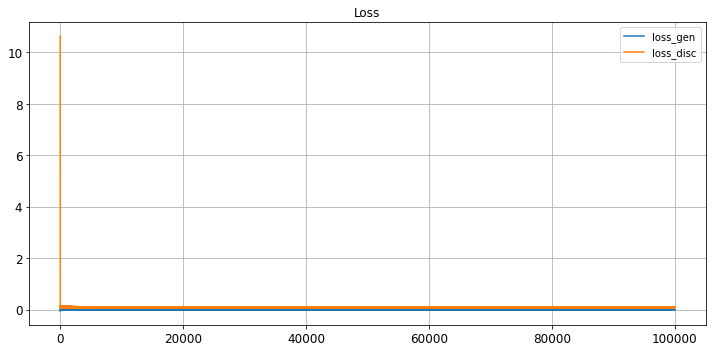

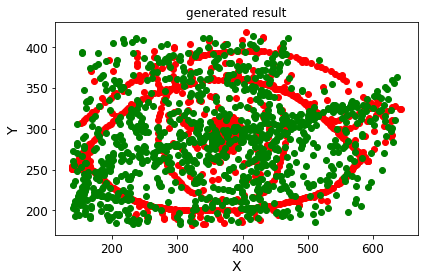

save the model & result


In [10]:
hist = wgan.train(train_dataset, epochs, scaler, scaled, X_train, y_train)

#### plot loss

Loss: 


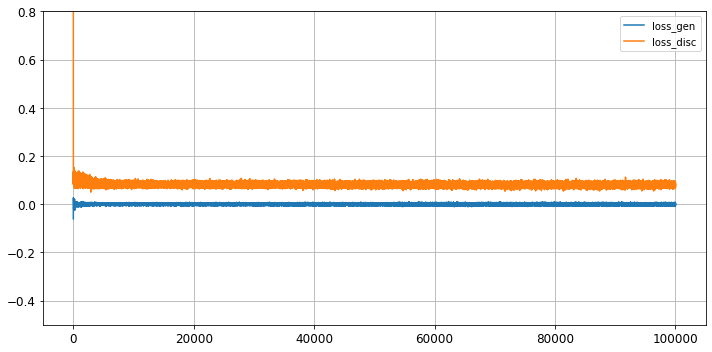

In [11]:
print('Loss: ')
fig, ax = plt.subplots(1,1, figsize=[10,5])
plt.ylim([-0.5,0.8])
ax.plot(hist)
ax.legend(['loss_gen', 'loss_disc'],)

#ax.set_yscale('log')
ax.grid()
plt.tight_layout()
plt.savefig('GANS/Losses/Final Result'+'_epoch_'+str(epochs)+'v_'+str(i)+'.png')

In [12]:

#generator = keras.models.load_model('GANS/Models/GAN_'+str(j))
#plt.close()

### Sampleing from the latent space

Predicted Values: (1000, 2)


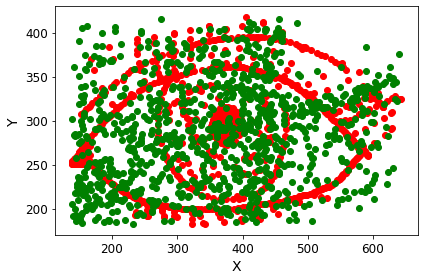

In [13]:
#sampling from the latent space without prediction
latent_values = tf.random.normal([1000, latent_space], mean=0.0, stddev=0.1)

#predict the labels of the data values on the basis of the trained model.
predicted_values = wgan.generator.predict(latent_values)
if scaled == '-1-1':
    predicted_values[:,:]=(predicted_values[:,:])
    predicted_values = scaler.inverse_transform(predicted_values)
elif scaled =='0-1':
    predicted_values = scaler.inverse_transform(predicted_values)
    

if n_features==3:
    print("Predicted Values:",predicted_values.shape)
    print("latent_space:",latent_space)
    print("BATCH_SIZE:",BATCH_SIZE)
    print("use_bias:",use_bias)
    print("epochs:",epochs)
    

    ab = plt.subplot(projection='3d')
    #ab.scatter(X_train[:,0],X_train[:,1],y_train, c='r')
    ab.scatter(predicted_values[:,0],predicted_values[:,1],predicted_values[:,2], c='green')
    ab.set_ylabel('Y')
    ab.set_zlabel('Z')
    ab.set_xlabel('X')
    
    
else:
    print("Predicted Values:",predicted_values.shape)
    plt.scatter(X_train, y_train,c='r')
    plt.scatter(predicted_values[:,0],predicted_values[:,1], c='green')
    plt.ylabel('Y')
    plt.xlabel('X')
    plt.tight_layout()
    plt.savefig('GANs/Result/Final_'+str(epochs)+'.png')
    

In [14]:
os.system('mkdir result_dataset')

export_excel(predicted_values[:,:], 'result_dataset/predicted_values')
#x=[:0],y=[:1],z=[:2]

print('made result_Dataset')


made result_Dataset


In [15]:
if n_features == 3:    
    
    print("X-Y 2D slices:")
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=False, sharex=False)
    plt.ylim(-1.5,1.5)
    plt.xlim(-1.5,1.5)
    axes[0].scatter(X_train[:,0],X_train[:,1])
    axes[0].scatter(predicted_values[:,0],predicted_values[:,1],c='green')
    axes[0].set_xlabel("X")
    axes[0].set_ylabel("Y")
    
    plt.ylim(-1.5,1.5)
    plt.xlim(-2,22)
    axes[1].scatter(X_train[:,1],y_train)
    axes[1].scatter(predicted_values[:,1],predicted_values[:,2], c='green')
    axes[1].set_xlabel("Y")
    axes[1].set_ylabel("Z")
    
    plt.xlim(-1.5,1.5)
    plt.ylim(-2,22)
    axes[2].scatter(X_train[:,0],y_train)
    axes[2].scatter(predicted_values[:,0],predicted_values[:,2], c='green')
    axes[2].set_xlabel("X")
    axes[2].set_ylabel("Z")
    
    plt.tight_layout()
    

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=False, sharex=False)
    
    ac=np.where(np.logical_and(X_train[:,0]>=-0.8-0.05,X_train[:,0]<=-0.8+0.05),X_train[:,1],None)
    ad=np.where(np.logical_and(predicted_values[:,0]>=-0.8-0.05,predicted_values[:,0]<=-0.8+0.05),predicted_values[:,1],None)
    axes[0].scatter(ac,y_train, c='black')
    axes[0].scatter(ad,predicted_values[:,2], c='green')
    axes[0].set_xlabel("Y(X=-0.8)")
    axes[0].set_ylabel("Y")
    
    ae=np.where(np.logical_and(X_train[:,0]>=0.0-0.05,X_train[:,0]<=0.0+0.05),X_train[:,1],None)
    af=np.where(np.logical_and(predicted_values[:,0]>=0.0-0.05,predicted_values[:,0]<=0.0+0.05),predicted_values[:,1],None)
    axes[1].scatter(ae,y_train, c='black')
    axes[1].scatter(af,predicted_values[:,2], c='green')
    axes[1].set_xlabel("Y(X=0.0)")
    axes[1].set_ylabel("Z")
    
    ag=np.where(np.logical_and(X_train[:,0]>=0.8-0.05,X_train[:,0]<=0.8+0.05),X_train[:,1],None)
    ah=np.where(np.logical_and(predicted_values[:,0]>=0.8-0.05,predicted_values[:,0]<=0.8+0.05),predicted_values[:,1],None)
    axes[2].scatter(ag,y_train, c='black')
    axes[2].scatter(ah,predicted_values[:,2], c='green')
    axes[2].set_xlabel("Y(X=0.8)")
    axes[2].set_ylabel("Z")
    
    plt.tight_layout()
    
    
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=False, sharex=False)
    ac=np.where(np.logical_and(X_train[:,1]>=0.2-0.05,X_train[:,1]<=0.2+0.05),X_train[:,0],None)
    ad=np.where(np.logical_and(predicted_values[:,1]>=0.2-0.05,predicted_values[:,1]<=0.2+0.05),predicted_values[:,0],None)
    axes[0].scatter(ac,y_train)
    axes[0].scatter(ad,predicted_values[:,2], c='green')
    axes[0].set_xlabel("X(Y=0.2)")
    axes[0].set_ylabel("Z")
    
    ae=np.where(np.logical_and(X_train[:,1]>=0.5-0.05,X_train[:,1]<=0.5+0.05),X_train[:,0],None)
    af=np.where(np.logical_and(predicted_values[:,1]>=0.5-0.05,predicted_values[:,1]<=0.5+0.05),predicted_values[:,0],None)
    axes[1].scatter(ae,y_train, c='gray')
    axes[1].scatter(af,predicted_values[:,2], c='green')
    axes[1].set_xlabel("X(Y=0.5)")
    axes[1].set_ylabel("Z")
    
    ag=np.where(np.logical_and(X_train[:,1]>=0.8-0.05,X_train[:,1]<=0.8+0.05),X_train[:,0],None)
    ah=np.where(np.logical_and(predicted_values[:,1]>=0.8-0.05,predicted_values[:,1]<=0.8+0.05),predicted_values[:,0],None)
    axes[2].scatter(ag,y_train, c='gray')
    axes[2].scatter(ah,predicted_values[:,2], c='green')
    axes[2].set_xlabel("X(Y=0.8)")
    axes[2].set_ylabel("Z")
    
    
    plt.tight_layout()

### Applying the prediction function

## Fixed Input

input_test : (1000, 2)


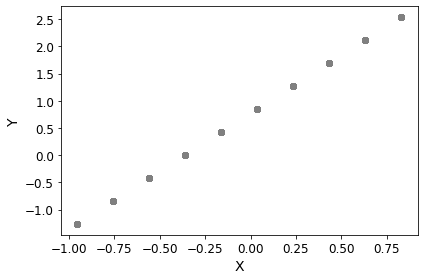

In [16]:
# define these for desired prediction
x_input = [150,200,250,300,350,400,450,500,550,600]
n_points = 1000
y_min = -1
y_max = 1

# produces an input of fixed x coordinates with random y values
predict1 = np.full((n_points//10, n_features), x_input[0])
predict2 = np.full((n_points//10, n_features), x_input[1])
predict3 = np.full((n_points//10, n_features), x_input[2])
predict4 = np.full((n_points//10, n_features), x_input[3])
predict5 = np.full((n_points//10, n_features), x_input[4])
predict6 = np.full((n_points//10, n_features), x_input[5])
predict7 = np.full((n_points//10, n_features), x_input[6])
predict8 = np.full((n_points//10, n_features), x_input[7])
predict9 = np.full((n_points//10, n_features), x_input[8])
predict10 = np.full((n_points//10, n_features), x_input[9])

predictthis = np.concatenate((predict1, predict2, predict3, predict4, predict5, predict6, predict7,predict8, predict9, predict10))
predictthis = scaler.transform(predictthis)
input_test = predictthis.reshape(n_points, n_features).astype('float32')


print("input_test :",input_test.shape)
plt.scatter(input_test[:,0],input_test[:,1] ,c='grey')
plt.ylabel('Y')
plt.xlabel('X')
plt.tight_layout()
    

In [17]:
X_generated = wgan.predict(input_test, scaler)

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 2)
input: (1000, 

Generated Data: (999, 2)


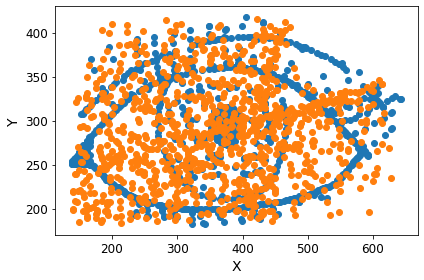

In [18]:
if scenario in ("3d", "helix"):
    print("latent_space=",latent_space)
    print("Epochs=",epochs)
    print("BATCH_SIZE=",BATCH_SIZE)
    print("use_bias=",use_bias)
    
    ax = plt.subplot(projection='3d')
    ax.scatter(X_generated[:,0], X_generated[:,1], X_generated[:,2], label='Generated Data')
    #ax.scatter(X_train[:,0], X_train[:,1], y_train, c='r', label='Sample Data')

    ax.set_zlabel('Z')
    ax.set_ylabel('Y')
    ax.set_xlabel('X')

    plt.legend(loc='best')
    plt.tight_layout()
    
    print("X-Y 2D slices:")
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=False, sharex=False)
    plt.ylim(-1.5,1.5)
    plt.xlim(-1.5,1.5)
    axes[0].scatter(X_train[:,0],X_train[:,1])
    axes[0].scatter(X_generated[:,0],X_generated[:,1])
    axes[0].set_xlabel("X")
    axes[0].set_ylabel("Y")
    
    plt.ylim(-1.5,1.5)
    plt.xlim(-2,22)
    axes[1].scatter(X_train[:,1],y_train)
    axes[1].scatter(X_generated[:,1],X_generated[:,2])
    axes[1].set_xlabel("Y")
    axes[1].set_ylabel("Z")
    
    plt.xlim(-1.5,1.5)
    plt.ylim(-2,22)
    axes[2].scatter(X_train[:,0],y_train)
    axes[2].scatter(X_generated[:,0],X_generated[:,2])
    axes[2].set_xlabel("X")
    axes[2].set_ylabel("Z")
    
    plt.tight_layout()
    

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=False, sharex=False)
    
    ac=np.where(np.logical_and(X_train[:,0]>=-0.8-0.05,X_train[:,0]<=-0.8+0.05),X_train[:,1],None)
    ad=np.where(np.logical_and(X_generated[:,0]>=-0.8-0.05,X_generated[:,0]<=-0.8+0.05),X_generated[:,1],None)
    axes[0].scatter(ac,y_train)
    axes[0].scatter(ad,X_generated[:,2])
    axes[0].set_xlabel("Y(X=-0.8)")
    axes[0].set_ylabel("Y")
    
    ae=np.where(np.logical_and(X_train[:,0]>=0.0-0.05,X_train[:,0]<=0.0+0.05),X_train[:,1],None)
    af=np.where(np.logical_and(X_generated[:,0]>=0.0-0.05,X_generated[:,0]<=0.0+0.05),X_generated[:,1],None)
    axes[1].scatter(ae,y_train)
    axes[1].scatter(af,X_generated[:,2])
    axes[1].set_xlabel("Y(X=0.0)")
    axes[1].set_ylabel("Z")
    
    ag=np.where(np.logical_and(X_train[:,0]>=0.8-0.05,X_train[:,0]<=0.8+0.05),X_train[:,1],None)
    ah=np.where(np.logical_and(X_generated[:,0]>=0.8-0.05,X_generated[:,0]<=0.8+0.05),X_generated[:,1],None)
    axes[2].scatter(ag,y_train)
    axes[2].scatter(ah,X_generated[:,2])
    axes[2].set_xlabel("Y(X=0.8)")
    axes[2].set_ylabel("Z")
    
    plt.tight_layout()
    
    
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=False, sharex=False)
    ac=np.where(np.logical_and(X_train[:,1]>=0.2-0.05,X_train[:,1]<=0.2+0.05),X_train[:,0],None)
    ad=np.where(np.logical_and(X_generated[:,1]>=0.2-0.05,X_generated[:,1]<=0.2+0.05),X_generated[:,0],None)
    axes[0].scatter(ac,y_train)
    axes[0].scatter(ad,X_generated[:,2])
    axes[0].set_xlabel("X(Y=0.2)")
    axes[0].set_ylabel("Z")
    
    ae=np.where(np.logical_and(X_train[:,1]>=0.5-0.05,X_train[:,1]<=0.5+0.05),X_train[:,0],None)
    af=np.where(np.logical_and(X_generated[:,1]>=0.5-0.05,X_generated[:,1]<=0.5+0.05),X_generated[:,0],None)
    axes[1].scatter(ae,y_train)
    axes[1].scatter(af,X_generated[:,2])
    axes[1].set_xlabel("X(Y=0.5)")
    axes[1].set_ylabel("Z")
    
    ag=np.where(np.logical_and(X_train[:,1]>=0.8-0.05,X_train[:,1]<=0.8+0.05),X_train[:,0],None)
    ah=np.where(np.logical_and(X_generated[:,1]>=0.8-0.05,X_generated[:,1]<=0.8+0.05),X_generated[:,0],None)
    axes[2].scatter(ag,y_train)
    axes[2].scatter(ah,X_generated[:,2])
    axes[2].set_xlabel("X(Y=0.8)")
    axes[2].set_ylabel("Z")
    
    
    plt.tight_layout()
    
    
else:
    print("Generated Data:",X_generated.shape)
    plt.scatter(X_train, y_train,label="Sample Data")
    plt.scatter(X_generated[:,0],X_generated[:,1])
    plt.ylabel('Y')
    plt.xlabel('X')
    plt.tight_layout()